# Documentation for Hydra Multi-Asset Verification Test
ACTION_LIST = [['test_add', 'test_q_for_r', 'test_r_for_r','test_r_for_q', 'test_remove']]



## Model Description

The methodology for the tests is to create two universes - one for Hydra and one for Uniswap - to subsequently be able to represent sequences of actions on each side. As the Hydra system is unique in its design and has no counterpart yet for approprate comparisons the role of the benchmark will be fulfilled by assembling several Uniswaps together in a way that everything that can be done in Hydra can be accordingly reproduced. This allows next to compare the implications on both systems and ultimately assess the quantitative and qualitative differences of results and impacts on the Hydra system and its agents. 

This approach necessitates the definition and specification of two models:
   - 1 Hydra Omnipool model with one instance that is defined in line with the [Hydra Mathematical Specification](https://hackmd.io/M7OeWimITKGVxBDHGQa6gQ?view)
   - 1 Uniswap model with several instances that each are responsible for a particular mechanism
        - which of 1 instance is used for liquidity provision in asset $R_i$: this is modeled as a Uniswap of $R_i$ and $Q$
        - which of 1 instance is used for liquidity provision in asset $R_j$: this is modeled as a Uniswap of $R_j$ and $Q$
        - which of 1 instance is used for swaps between assets $R_i$ and $R_j$: this is modeled as a Uniswap of $R_i$ and $R_j$
        
![](https://i.imgur.com/yb6Zh3T.png)
        
## Test cases

A variety of testcases can be explored with this model resulting from a combination of the following parameters
   
   - Event: Add Liquidity, Remove Liquidity, Swap Asset, Swap Asset for Base
   - Asset: $R_i$, $R_j$, $R_k$, $Q$
   - Multiple Action Type: Alternating, $i$ only, $j$ only
   - Composite Action Type: Alternating, Trade Bias
   - Enable Symmetric Liquidity: True, False
    
In addition to these settings also a fee structure can be imposed:

   - Fixed Fee

## Test agents

The model specifies a number of eight agents that each have their local balances, can interact with the system and are modeled to be responsible for **one action only**. This allows to track for each testcase how the balances will develop and to show independently which events will trigger changes to local and global states. Most importantly directly and indirectly affected variables can be easily identified.

Two dataframes of agents are initialized identically for both the Uniswap and the Hydra world and then work their way through on each side according to the testcase. Afterwards the effects on both sides can be compared.

![](https://i.imgur.com/r9IAJMr.png)



## Composite Action Tests

Besides being able to test all mechanisms individually also compositions of actions can be performed. This means selecting and combining two from the above testcases and letting the respective agents take the actions repeadetly. A composition action test therefore is defined as two actions which each can be a combination of *event* and *asset* selected from the list of testcases above, for example:
- Add liquidity in $R_i$ and Add liquidity in $R_j$
- Add liquidity in $R_i$ and Swap $R_i$ for $Q$
- Remove liquidity in $R_j$ and Swap $R_i$ for $Q$
- ...

In total there would be 28 composit pairs which can be derived from this decision tree:
selecting any one of the four primitive mechanisms of: **trade in/out** or **add/remove liquidity** of some given asset and then the subsequent action could be the three remaining mechanisms of the same asset or doing anyone of the four mechanisms in another asset.  

These basic combinations can be explored before further proceeding with
- trade sizes,
- trade frequencies,
- randomization,...



## Introduction to Uniswap
>Uniswap is an automated market maker for exchanging ERC20 tokens. Anyone can become a liquidity provider, and invest in the liquidity pool of an ERC20 token. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://uniswap.io/

There are basically eight ways (_mechanisms_) in which an agent can interact with an instance of Uniswap (https://github.com/Uniswap/uniswap-v1/blob/master/contracts/uniswap_exchange.vy):
1. `addLiquidity`: deposit ETH and tokens in the liquidity pool; mint UNI tokens - "shares" of that Uniswap instance - in exchange;
1. `removeLiquidity`: burn UNI tokens; withdraw a proportional amount of ETH and tokens in exchange;
1. `ethToTokenInput`: user specifies an exact amount of ETH they send; receives corresponding amount of tokens
1. `ethToTokenOutput`: user sends some ETH and specifies an exact amount of tokens they want to buy; Uniswap refunds ETH sent in excess
1. `tokenToEthInput`: user specifies an exact amount of tokens they send; receives corresponding amount of ETH
1. `tokenToEthOutput`: user specifies an exact amount of ETH they want to buy; Uniswap takes the corresponding amount of tokens from the user account
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" (effectively a `tokenToEthInput` in instance A combined with a `ethToTokenInput` in instance B)
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Uniswap takes the corresponding amount of "token A" from the user account (effectively a `ethToTokenOutput` in instance B combined with a `tokenToEthOutput` in instance A)

## Limitations and simplifications of this model
* When triggering mechanisms, Uniswap users may include conditions they would like to apply to the transaction. For example, they could define a minimum amount of UNI tokens they wish to receive as a result of adding liquidity to the pool; or the maximum number of tokens they are willing to pay for the amount of ETH requested in a `tokenToEthOutput` operation; or a deadline after which the transaction should not be processed. **This simplified model does not account for this kind conditioning.**

* The `ethToTokenOutput`, `tokenToEthOutput` mechanisms are not implemented. **All swaps are treated as of the "input defined" type.**

* The `tokenToToken` mechanism are not implemented, as they are merely a `tokenToEth` in the context of a single Uniswap instance.

* **User _behavior_ has not been modeled**. User _actions_ are derived from the history of events of the Uniswap instance being analyzed.

## Introduction to Hydra
>Hydra is an automated market maker that generalizes the concept of Uniswap and Balancer to a) an arbitrary number of dimensions and b) a variant weight distaribution of assets in the pool that changes in accordance with action sequences in the pool. Anyone can become a liquidity provider, and invest in the 'Omnipool'. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://hydradx.io/

There is a predefined set of (_mechanisms_) in which an agent can interact with an the Hydra Protocol :
1. `addLiquidity`: deposit a risk asset in the omnipool; mint HDX tokens - "shares" of this risk asset - in exchange;
1. `removeLiquidity`: burn HDX tokens; withdraw a proportional amount of the risk asset in exchange;
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" 
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Hydra takes the corresponding amount of "token A" from the user account 



## Model File structure

The folder **model** contains:

 - a file config.py: 

    This file configures the simulation experiments by setting the number of monte carlo runs, the number of timesteps for the simulation and the simulation parameters. It also aggregates the partial states and the initial state variables.
    
    The purpose of this file is to *configure and initialize* the experiment.
    
    
 - a file partial_state_update_block.py

    This file defines each partial state update block individually. This feature allows cadCAD to divide each simulation timestep into several 'blocks' where different state variables are mutated conditioned upon the policy input.
    
    In the current setting 
    - the first block maps the user action to the appropriate mechanism in the uniswap world
    - the second block maps the user action to the appropriate mechanism in the hydra world
    - the third block resolves the quantities of HDX and weights in the hydra world
    - the forth block calculates the metrics: the swap prices in the uniswap world and the pool prices in the hydra world

    This file corresponds to the system specification diagram, where each column is one partial state update block 
    
    The purpose of this file is to *define* the sequence and details of state updates for each simulation timestep. The relevant mechanisms are imported from the files in the **parts** folder
    
    
 - a file plot_utils.py

    This file defines all plot functions that can be called in the jupyter notebook to visualize the results. In general there are three types of plots:
    - plots related to the uniswap world (do not contain the word 'hydra')
    - plots related to the hydra world (contain the word 'hydra')
    - general plots applicable to both worlds (f.e Impermanent Loss)

    It also can be distinguished between plots related to global system variables and local agent variables:
    - global variables (do not contain the word 'agent')
    - local variables (contain the word 'agent')

    The purpose of this file is to *define* the way how particular properties can be plotted over time.
    

 - a file run.py

    This file *defines* the run and postprocessing methods and is used to execute the simulation run:
    - run() is used to execute the simulation and create a dataframe
    - postprocessing is used to extract relevant metrics from the simulation output in the dataframe

     The purpose of this file is to *execute* the simulation and *create* metrics.
     
     
 - a file state_variables.py

    This file *sets* the number of agents and *defines* the local (agent-level) state variables, *sets* the number of assets and *defines* the global (system-state) variables of the system, *computes* the prices of the assets and *defines* the initial state object
    - the agent states describe their holdings of assets that agents have contributed to the pool or still hold outside as well as their quantities of shares they received for their contribution
    - the global states describe the quantities of assets in the system
    - price variables are computed from the states both in the uniswap and hydra world
    - the initial state object consists of 
        - two agent dataframes, one for each world respectively
        - two sets of global variables, one for each world respectively
        - prices for each world (? is pool = prices ?)

    The purpose of this file is to *define* the global and local states of the system.
    
    
 - a file sys_params.py

    This file *contains* the system parameters and allows to select items from a list for them. Following parameters can be defined:
    - trade action type
    - liquidity action type
    - multiple asset action type
    - composite action type
    - liquidity add type (symmetry)

    In addition the following is set
    - initial values for assets 
    - hard coded fee value
    - choice of the system parameters from the list above
    

 - a folder **parts** which itself contains general files relevant for both instances, files related specifically to Uniswap and files related specifically to Hydra 
      - [action.py](model/parts/action.py)
       This is an action dictionary which drives the model. As there are no behavioral assumptions in the model yet, currently actions are prescribed actions in testing mode derived from events. However, action schema respects https://www.kaggle.com/markusbkoch/uniswap-ethdai-exchange as much as possible, allowing for future analysis against uniswap transaction datasets.
        This file contains a function called 'actionDecoder' which takes its inputs from the file sys_params.py and maps those encoded events to agent actions. At first an arbitrary action dictionary is defined which then is adapted according to the choices of system parameters. In particular relevant are the parameter definitions of the asset, the composite and whether there is a trade or liquidity event defined.
        
    - [uniswap.py](model/parts/uniswap.py)
     Reads in action output and directs the action to the appropriate Uniswap mechanism for each corresponding Uniswap instance. Currently there are two instances in place, namely the R_i<>Q pair and the R_j<>Q pair. Both instances have their respective requisite state variables: UNI_Qx, UNI_Rx, and UNI_Sx.

    - [utils.py](model/parts/utils.py)
    Computes the state update for each Uniswap state variable and outputs the updated global state variables.
        
     - [agent_utils.py](model/parts/agent_utils.py)
     Computes the corresponding agent local state for each Uniswap agent resolving their action and outputs the updates local state variables.

      -  [hydra.py](model/prts/hydra.py)
     Reads in action output and directs the action to the appropriate Hydra mechanism for each state variable: Q, Sq, and pool.
    
      - [hydra_utils.py](model/parts/hydra_utils.py)
     Computes the state update for each Hydra state variable

    -  [asset_utils.py](model/parts/asset_utils.py)
     Computes the state update for each Reserve Asset in a Hydra Omnipool

    -  [hydra_agent_utils_class.py](model/parts/hydra_agent_utils_class.py)
     Computes the corresponding agent local state for each Hydra agent resolving their action and outputs the updates local state variables.
     
     #### The interrelations between the files are shown here:
     
    ![](https://i.imgur.com/mNhfQE4.png)



# Testcase Definition

#### Simulation Settings
- There are 100 timesteps for each simulation run
- Each testcase has 100 MC runs with different randomized variables
- Block 1 randomizes starting liquidity balances (explained below in section 'Block 1')



#### Agent Activities - Action Sequence

There are two agents acting during the simulation. The trading agent performs "R-for-R" trades of equal size but varying direction over most simulation timesteps. The liquidity agent provides liquidity to the pool at timestep 10 and removes the liquidity from the pool at timestep 90.

##### Trading agent

- One Agent performs random "R-for-R" trades during the simulation. 
- The direction of the trade is a random coin flip for each timestep.
- The size of the trade is fixed at $1000$ for each timestep.
- The agent does not act at timestep 10 nor timestep 90.

##### Liquidity agent

- One Agent provides liquidity in Asset "i" to the pool 
- He provides the liquidity at timestep 10
- He removes the liquidity at timestep 90
- He does not act at other timesteps

#### Block 1:

| #   |   Run   | a  | $\mu_i$ |          $\sigma_i$          | $\mu_j$ |          $\sigma_j$          | $\mu$ | $\sigma$ | Total runs         |
| --- |:-------:|:-------:|:-------:|:----------------------------:|:-------:|:----------------------------:| ----- | -------- | ------------------ |
| 1   | 001-100 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 2   | 101-200 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 3   | 201-300 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 4   | 301-400 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$  | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 5   | 401-500 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 6   | 501-600 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |

All tests in block 1 are performed as 100 **MonteCarlo Experiments** with the following randomization:
- The initial balances of the liquidity pools are drawn randomly for each MC run from the same lognormal distribution with $\mu_i$ and $\mu_j$ fixed at $100000$
    - The underlying mean for the lognormal liquidity draw is $\log{100000}$
    - The underlying standard deviation for the lognormal liquidity draw is $\sqrt{\log{1 + \frac{2000^2}{100000^2}}}$
- The action sequence of the agents is randomized in that sense that:
    - For each individual MC run the sequence is identical for the Uniswap and Hydra side of the model. For each timestep of the simulation exactly the same event takes place on both sides.
    - For each individual MC run the trading directions are randomized for each timestep. Therefore the event sequence for each run will be different.
    - For all MC runs the trading amount is always equal to $1000$




# Testcase in this notebook


This notebook documents the results of the following experiment:
- Settings from Block 1 as outlined above
- Testcases **1**, **3** and **5**
- Sweep over three values for $a \in \{0.5, 1, 1.5 \}$ with a fixed $\mu$-to-$\sigma$-ratio of $2$.

The experiment result dataframe is saved into a pickle file and analyzed throughout this notebook.

## Run Model

The following command lines import all packages, experiments and run the model 

This is the execution of cadcad. This writes the config object, does the execution and returns the rdf - which is a data object that shows the rows and columns of results in a dataframe

Here is one additional option as well. The postprocessing causes the index of the results to be every forth because of the cadcad architecture where the partial state updates are the substeps. With this option selected we see only the end of each timestep - the last substep. Therefore only final results are shown. To get a line for each substep the postprocessing needs to be deactivated. 

In [1]:
from model.config_wrapper import ConfigWrapper

from model import run_wrapper
from cadCAD import configs

# parametric_experiment = ConfigWrapper()
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']
# parametric_experiment.get_config()

running file: config_wrapper.py
end of file: config_wrapper.py
running file: run_wrapper.py
end of file: run_wrapper.py


In [2]:
# import model as model


In [3]:
# parametric_experiment = ConfigWrapper(model)


In [4]:
# del configs[:]

# parametric_experiment.append()

In [5]:
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']

In [6]:
# Dependences
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Experiments
from model import run
from model.parts.utils import *
from model.plot_utils import *

pd.options.display.float_format = '{:.2f}'.format

%matplotlib inline

# df = run.run()
# rdf = run.postprocessing(df)
# rdf = df # debugging substeps
# pd.set_option("mode.chained_assignment", None)


running file: run.py
running file: state_variables.py
running file: initialize_liquidity.py
end of file: initialize_liquidity.py
running file: asset_utils.py
end of file: asset_utils.py
end of file: state_variables.py
running file: partial_state_update_block.py
running file: action_list.py
end of file: action_list.py
end of file: partial_state_update_block.py
running file: sim_setup.py
end of file: sim_setup.py
[102513.07919145  99311.49114414 103289.36311277 107907.47516136
  98836.78217111  98836.8632545  108210.8396583  103909.25524514
  97681.39567448 102748.19189447  97710.96299701  97699.67501518
 101216.39487923  90882.35636359  91741.80142467  97229.42162275
  95064.94010846 101582.64927056  95564.10889559  93186.14722757
 107598.51912228  98878.1631456  100338.00021993  93128.21875062
  97316.44990982 100555.8056843   94410.89003523 101895.05002056
  97043.27335419  98553.01252306  97038.09499273 109697.46842654
  99932.57873647  94851.98731243 104195.7937909   94081.93986744


Omni_P_RQi ================== 0.09754852823534868
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 102513.07919145311, 'S': 10000, 'W': 10000, 'P': 0.09754852823534868, 'dP': 0}, 'j': {'R': 93171.86695583671, 'S': 10000, 'W': 10000, 'P': 0.10732853517618124}, 'k': {'R': 93171.86695583671, 'S': 10000, 'W': 10000, 'P': 0.10732853517618124}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10069328216496307
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99311.49114413881, 'S': 10000, 'W': 10000, 'P': 0.10069328216496307, 'dP': 0}, 'j': {'R': 97920.02237289104, 'S': 10000, 'W': 10000, 'P': 0.10212415967307295}, 'k': {'R': 97920.02237289104, 'S': 10000, 'W': 10000, 'P': 0.10212415967307295}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10069328216496307
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset

Omni_P_RQi ================== 0.09623781805006797
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 103909.25524514152, 'S': 10000, 'W': 10000, 'P': 0.09623781805006797, 'dP': 0}, 'j': {'R': 100876.16025662293, 'S': 10000, 'W': 10000, 'P': 0.09913144963647107}, 'k': {'R': 100876.16025662293, 'S': 10000, 'W': 10000, 'P': 0.09913144963647107}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10237363963680712
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97681.39567448404, 'S': 10000, 'W': 10000, 'P': 0.10237363963680712, 'dP': 0}, 'j': {'R': 101295.2650144279, 'S': 10000, 'W': 10000, 'P': 0.09872129757077648}, 'k': {'R': 101295.2650144279, 'S': 10000, 'W': 10000, 'P': 0.09872129757077648}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10237363963680712
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Ass

Omni_P_RQi ================== 0.10900156574984461
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 91741.80142466674, 'S': 10000, 'W': 10000, 'P': 0.10900156574984461, 'dP': 0}, 'j': {'R': 99043.40029631108, 'S': 10000, 'W': 10000, 'P': 0.1009658389158965}, 'k': {'R': 99043.40029631108, 'S': 10000, 'W': 10000, 'P': 0.1009658389158965}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10900156574984461
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 91741.80142466674, 'S': 10000, 'W': 10000, 'P': 0.10900156574984461, 'dP': 0}, 'j': {'R': 99043.40029631108, 'S': 10000, 'W': 10000, 'P': 0.1009658389158965}, 'k': {'R': 99043.40029631108, 'S': 10000, 'W': 10000, 'P': 0.1009658389158965}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10900156574984461
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'p

Omni_P_RQi ================== 0.09966313837310993
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100338.0002199298, 'S': 10000, 'W': 10000, 'P': 0.09966313837310993, 'dP': 0}, 'j': {'R': 107261.10799307455, 'S': 10000, 'W': 10000, 'P': 0.09323043726758504}, 'k': {'R': 107261.10799307455, 'S': 10000, 'W': 10000, 'P': 0.09323043726758504}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09966313837310993
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100338.0002199298, 'S': 10000, 'W': 10000, 'P': 0.09966313837310993, 'dP': 0}, 'j': {'R': 107261.10799307455, 'S': 10000, 'W': 10000, 'P': 0.09323043726758504}, 'k': {'R': 107261.10799307455, 'S': 10000, 'W': 10000, 'P': 0.09323043726758504}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09966313837310993
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asse

Omni_P_RQi ================== 0.10146823261906608
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98553.0125230641, 'S': 10000, 'W': 10000, 'P': 0.10146823261906608, 'dP': 0}, 'j': {'R': 97515.5756621723, 'S': 10000, 'W': 10000, 'P': 0.10254772052665168}, 'k': {'R': 97515.5756621723, 'S': 10000, 'W': 10000, 'P': 0.10254772052665168}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10146823261906608
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98553.0125230641, 'S': 10000, 'W': 10000, 'P': 0.10146823261906608, 'dP': 0}, 'j': {'R': 97515.5756621723, 'S': 10000, 'W': 10000, 'P': 0.10254772052665168}, 'k': {'R': 97515.5756621723, 'S': 10000, 'W': 10000, 'P': 0.10254772052665168}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10305231157670189
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'poo

Omni_P_RQi ================== 0.09896176113921912
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101049.13135015886, 'S': 10000, 'W': 10000, 'P': 0.09896176113921912, 'dP': 0}, 'j': {'R': 96161.77841486629, 'S': 10000, 'W': 10000, 'P': 0.10399142117419528}, 'k': {'R': 96161.77841486629, 'S': 10000, 'W': 10000, 'P': 0.10399142117419528}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.11028771425925808
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 90671.93084165812, 'S': 10000, 'W': 10000, 'P': 0.11028771425925808, 'dP': 0}, 'j': {'R': 98403.57758753373, 'S': 10000, 'W': 10000, 'P': 0.10162232151676213}, 'k': {'R': 98403.57758753373, 'S': 10000, 'W': 10000, 'P': 0.10162232151676213}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.11028771425925808
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset

Omni_P_RQi ================== 0.10151595456865903
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98506.68343207694, 'S': 10000, 'W': 10000, 'P': 0.10151595456865903, 'dP': 0}, 'j': {'R': 100926.86210036145, 'S': 10000, 'W': 10000, 'P': 0.0990816497401457}, 'k': {'R': 100926.86210036145, 'S': 10000, 'W': 10000, 'P': 0.0990816497401457}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10151595456865903
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98506.68343207694, 'S': 10000, 'W': 10000, 'P': 0.10151595456865903, 'dP': 0}, 'j': {'R': 100926.86210036145, 'S': 10000, 'W': 10000, 'P': 0.0990816497401457}, 'k': {'R': 100926.86210036145, 'S': 10000, 'W': 10000, 'P': 0.0990816497401457}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10766775513934877
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>:

Omni_P_RQi ================== 0.09839363346941248
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101632.5919411106, 'S': 10000, 'W': 10000, 'P': 0.09839363346941248, 'dP': 0}, 'j': {'R': 101259.5488517099, 'S': 10000, 'W': 10000, 'P': 0.09875611844414352}, 'k': {'R': 101259.5488517099, 'S': 10000, 'W': 10000, 'P': 0.09875611844414352}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10194284187646557
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98094.18509362344, 'S': 10000, 'W': 10000, 'P': 0.10194284187646557, 'dP': 0}, 'j': {'R': 101746.23127726497, 'S': 10000, 'W': 10000, 'P': 0.0982837386158251}, 'k': {'R': 101746.23127726497, 'S': 10000, 'W': 10000, 'P': 0.0982837386158251}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10194284187646557
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'

Omni_P_RQi ================== 0.10155709523467027
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98466.77848448475, 'S': 10000, 'W': 10000, 'P': 0.10155709523467027, 'dP': 0}, 'j': {'R': 102395.93809449964, 'S': 10000, 'W': 10000, 'P': 0.09766012388861708}, 'k': {'R': 102395.93809449964, 'S': 10000, 'W': 10000, 'P': 0.09766012388861708}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10155709523467027
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98466.77848448475, 'S': 10000, 'W': 10000, 'P': 0.10155709523467027, 'dP': 0}, 'j': {'R': 102395.93809449964, 'S': 10000, 'W': 10000, 'P': 0.09766012388861708}, 'k': {'R': 102395.93809449964, 'S': 10000, 'W': 10000, 'P': 0.09766012388861708}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09835834117823271
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asse

Omni_P_RQi ================== 0.09344756807597604
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 107011.8806288213, 'S': 10000, 'W': 10000, 'P': 0.09344756807597604, 'dP': 0}, 'j': {'R': 102084.03538107584, 'S': 10000, 'W': 10000, 'P': 0.09795850999297176}, 'k': {'R': 102084.03538107584, 'S': 10000, 'W': 10000, 'P': 0.09795850999297176}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09344756807597604
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 107011.8806288213, 'S': 10000, 'W': 10000, 'P': 0.09344756807597604, 'dP': 0}, 'j': {'R': 102084.03538107584, 'S': 10000, 'W': 10000, 'P': 0.09795850999297176}, 'k': {'R': 102084.03538107584, 'S': 10000, 'W': 10000, 'P': 0.09795850999297176}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10036047403098287
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asse

Omni_P_RQi ================== 0.0926025201135205
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 107988.4217809742, 'S': 10000, 'W': 10000, 'P': 0.0926025201135205, 'dP': 0}, 'j': {'R': 96005.46638392861, 'S': 10000, 'W': 10000, 'P': 0.10416073559821808}, 'k': {'R': 96005.46638392861, 'S': 10000, 'W': 10000, 'P': 0.10416073559821808}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10017917872411247
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99821.14175181459, 'S': 10000, 'W': 10000, 'P': 0.10017917872411247, 'dP': 0}, 'j': {'R': 99615.47327475176, 'S': 10000, 'W': 10000, 'P': 0.10038601104086277}, 'k': {'R': 99615.47327475176, 'S': 10000, 'W': 10000, 'P': 0.10038601104086277}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10017917872411247
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>:

Omni_P_RQi ================== 0.0995425320688693
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100459.57031795634, 'S': 10000, 'W': 10000, 'P': 0.0995425320688693, 'dP': 0}, 'j': {'R': 98686.24782694738, 'S': 10000, 'W': 10000, 'P': 0.10133124138568564}, 'k': {'R': 98686.24782694738, 'S': 10000, 'W': 10000, 'P': 0.10133124138568564}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.11044157014721001
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 90545.61599106912, 'S': 10000, 'W': 10000, 'P': 0.11044157014721001, 'dP': 0}, 'j': {'R': 114559.43301380739, 'S': 10000, 'W': 10000, 'P': 0.08729093481804105}, 'k': {'R': 114559.43301380739, 'S': 10000, 'W': 10000, 'P': 0.08729093481804105}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.11044157014721001
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset

Omni_P_RQi ================== 0.10253891442519447
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97523.95035638232, 'S': 10000, 'W': 10000, 'P': 0.10253891442519447, 'dP': 0}, 'j': {'R': 103632.18300399445, 'S': 10000, 'W': 10000, 'P': 0.09649512062883549}, 'k': {'R': 103632.18300399445, 'S': 10000, 'W': 10000, 'P': 0.09649512062883549}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10253891442519447
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97523.95035638232, 'S': 10000, 'W': 10000, 'P': 0.10253891442519447, 'dP': 0}, 'j': {'R': 103632.18300399445, 'S': 10000, 'W': 10000, 'P': 0.09649512062883549}, 'k': {'R': 103632.18300399445, 'S': 10000, 'W': 10000, 'P': 0.09649512062883549}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10253891442519447
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asse

Omni_P_RQi ================== 0.09527506849660328
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 104959.25280134034, 'S': 10000, 'W': 10000, 'P': 0.09527506849660328, 'dP': 0}, 'j': {'R': 104372.2044836238, 'S': 10000, 'W': 10000, 'P': 0.09581094937559759}, 'k': {'R': 104372.2044836238, 'S': 10000, 'W': 10000, 'P': 0.09581094937559759}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10357033334900868
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 96552.74514085278, 'S': 10000, 'W': 10000, 'P': 0.10357033334900868, 'dP': 0}, 'j': {'R': 101075.54340926532, 'S': 10000, 'W': 10000, 'P': 0.0989359014327429}, 'k': {'R': 101075.54340926532, 'S': 10000, 'W': 10000, 'P': 0.0989359014327429}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10357033334900868
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset

Omni_P_RQi ================== 0.10117910080273107
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98834.63996677539, 'S': 10000, 'W': 10000, 'P': 0.10117910080273107, 'dP': 0}, 'j': {'R': 94448.74823261805, 'S': 10000, 'W': 10000, 'P': 0.10587752815284515}, 'k': {'R': 94448.74823261805, 'S': 10000, 'W': 10000, 'P': 0.10587752815284515}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10117910080273107
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98834.63996677539, 'S': 10000, 'W': 10000, 'P': 0.10117910080273107, 'dP': 0}, 'j': {'R': 94448.74823261805, 'S': 10000, 'W': 10000, 'P': 0.10587752815284515}, 'k': {'R': 94448.74823261805, 'S': 10000, 'W': 10000, 'P': 0.10587752815284515}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10117910080273107
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>:

In [7]:
(data, tensor_field, sessions) = run_wrapper.run(drop_midsteps=True)

experiments = data



                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 100
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 3, 22)
Execution Method: local_simulations
SimIDs   : [0, 0, 0, 1, 1, 1, 2, 2, 2, 3, 3, 3, 4, 4, 4, 5, 5, 5, 6, 6, 6, 7, 7, 7, 8, 8, 8, 9, 9, 9, 10, 10, 10, 11, 11, 11, 12, 12, 12, 13, 13, 13, 14, 14, 14, 15, 15, 15, 16, 16, 16, 17, 17, 17, 18, 18, 18, 19, 19, 19, 20, 20, 20, 21, 21, 21, 22, 22, 22, 23, 23, 23, 24, 24, 24, 25, 25, 25, 26, 26, 26, 27, 27, 27, 28, 28, 28, 29, 29, 29, 30, 30, 30, 31, 31, 31, 32, 32, 32, 33, 33, 33, 34, 34, 34, 35, 35, 35, 36, 36, 36, 37, 37, 37, 38, 38, 38, 39, 39, 39, 40, 40, 40, 41, 41, 41, 42, 42, 42, 43, 43, 43, 44, 44, 44, 45, 45, 45, 46, 46, 46, 47, 47, 47, 48, 48, 48, 49, 49, 49, 50, 50, 50, 51, 51, 51, 52, 52, 52, 53, 

POOL Class   A value =  1 Asset  i    A value =  1860.0 0.5 Asset  i 0.5
  A value =  Class Price =  Asset   A value =  1.5 Asset  i  Class Price =  0.08908673553047057
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08908673553047057
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08908673553047057
POOL Class   A value =  1.5 0.09363987943129741
POOL Class   A value =  1 Asset  j  Class Price =  0.09363987943129741
POOL Class   A value =  1 Asset  k  Class Price =  0.09363987943129741
POOL Class   A value =  1  R over W=  9.962869380275205 Q over Wq =  1.0
1900.0POOL Class Asset    Class Price = POOL Class 
i   R over W= 1   A value =  1 Asset  i  Class Price =  0.09344976386419442
POOL Class   A value =  1 Asset  j  Class Price =  0.09344976386419442
POOL Class   A value =  1 Asset  k  Class Price =  0.09344976386419442
POOL Class   A value =  1  R over W=  10.203951286584767 Q over Wq =  1.0
1824.0
  10.988348942634628 Q over Wq =  1.0
1906.0
Asset    A value = POOL Cl

  A value =  0.5 Asset  i  Class Price =  0.0916508297337694
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0916508297337694
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0916508297337694
POOL Class   A value =  0.5  R over W=  9.919731364865871 Q over Wq =  1.0
0.51789.0j 0.0883907093501162addliq - Sq delta Sq POOL Class 
  4318.639252418579
addliq - Sq delta S 4318.639252418579
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4147.625615931682
POOL ADD LIQUIDITY Timestep ===  10 delta W  4147.625615931682
POOL Class  R over W=   Asset 
 A value =  0.5  R over W=  9.317186695583672 Q over Wq =  1.0
 i  Class Price =  0.08490902890393279
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08490902890393279
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08490902890393279
POOL Class   A value =  1.5  R over W=  9.830207693960515 Q over Wq =  1.0
1763.0 POOL Class   A value =  0.5 Asset  i  Class Price =  0.08990759665793398
POOL Class   A value =  1733.0
 10.1295

POOL Class   A value = Asset POOL Class   A value =  0.5 Asset  i  Class Price =  0.08488362913038715
POOL Class POOL Class   POOL Class   A value =   k1.5
  A value =  1 Asset  i  Class Price =  0.08319503803152196
POOL Class   A value =  1 Asset  j  Class Price =  0.08319503803152196
POOL Class   A value =  1 Asset  k  Class Price =  0.08319503803152196
POOL Class   A value =  1  R over W=  9.962869380275205 Q over Wq =  1.0
 A value =    A value =  1664.0 Class Price =  0.08726978017140403
POOL Class   A value =  1  R over W=  9.792002237289104 Q over Wq =  1.0
 A value =  
Asset  i  Class Price =  0.08490902890393279
POOL Class   A value =  1.5 1.51753.0
 Asset  j POOL Class  Class Price = POOL Class    A value =  0.5 Asset  i  Class Price =  0.08852570382797105
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08852570382797105
POOL Class   A value =  0.5 0.5  Asset  k  Class Price =  0.08852570382797105
POOL Class   A value =  0.5  R over W=  10.12952650144279 Q over Wq =  1

POOL Class  Asset  i  Class Price =  0.08629177853219147
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08629177853219147
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08629177853219147
POOL Class   A value =  0.5  R over W=  10.12952650144279 Q over Wq =  1.0
POOL Class   A value =   A value =  0.5 Asset POOL Class  A value =    1 Asset  j  Class Price =  0.07922555832190002
POOL Class   A value =  1 Asset  k  Class Price =  0.07922555832190002
POOL Class   A value =  1  R over W=  9.962869380275205 Q over Wq =  1.0
1586.01  A value = 1692.0i
 POOL Class  A value = Asset POOL Class POOL Class 
       A value =  1 Asset  i  Class Price =  0.07827758185711092
POOL Class   A value =  1 Asset  j  Class Price =  0.07827758185711092
POOL Class   A value =  1 Asset  k  Class Price =  0.07827758185711092
POOL Class   A value =  1  R over W=  9.962869380275205 Q over Wq =  1.0
1567.0 A value = 1.5  POOL Class   A value =  0.5 Asset  i  Class Price =  0.08520639097486002
POOL C

 Class Price = POOL Class  POOL Class  
POOL Class   A value =  1 Asset  i  A value =  0.5 Asset    0.07286201756645971j  Class Price =  0.08436460757814102
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08436460757814102
POOL Class   A value =  0.5  R over W=  9.919731364865871 Q over Wq =  1.0
1573.0

 A value = Asset   POOL Class  A value =  0.5 Asset  i  Class Price =  0.08309615883192546
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08309615883192546
POOL Class   A value =  0.5 Asset   Class Price = 0.08082411824924281POOL Class  POOL Class 0.5 
  A value =     A value =  0.5 Asset  i  Class Price =  0.08436460757814102
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08436460757814102
0.08079444573075126
POOL Class   A value =   1  R over W=  9.792002237289104 Q over Wq =  1.0
1513.0POOL Class  A value = k POOL Class 1k
  Class Price =  Asset  i  Class Price =  0.0779304766711432
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0779304766711432
POOL C

1550.0
    
 POOL Class   A value =  Asset 1.5kPOOL Class 10.203951286584767   0.5POOL Class   0.5 Asset  i  Class Price =  0.0770073348874103
POOL Class   A value =  Asset  i  Class Price =  Asset   A value =  1.5 Asset  i  Class Price =  0.07795086612726322
POOL Class   A value =  1.5 Asset  i0.08207032233755975
POOL Class   A value =  0.5 Asset  j 0.5 Asset  j  Class Price =  0.0770073348874103
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0770073348874103
POOL Class   A value =  0.5  R over W=  9.317186695583672 Q over Wq =  1.0
1521.0  Class Price =  A value =  Q over Wq =   Class Price = 
POOL Class  j  Class Price =  j   A value =  0.5 Asset  i  Class Price =  0.0770073348874103
POOL Class   A value =  0.5 Asset  j   Class Price =  0.072037239049708451.0
1611.0 Class Price = 0.082070322337559750.5 
0.07293128282048028
POOL Class   A value =  1  R over W=  9.962869380275205 Q over Wq =  1.0

POOL Class   A value =  0.5 1603.0POOL Class  
 Asset  k  Class Price =  0.08207

 POOL Class   A value = POOL Class   A value =  1 Asset  i  Class Price =  0.07696441361852163
POOL Class   A value =  1 Asset  j  Class Price =  0.07696441361852163
POOL Class   A value =  1 Asset  k  Class Price =  0.07696441361852163
POOL Class   A value =  1  R over W=  10.203951286584767 Q over Wq =  1.0
1508.0 0.5  R over W=  10.12952650144279 Q over Wq =  1.0

POOL Class 1532.0  A value = 
POOL Class   A value =  A value =   1 Asset  i  Class Price =  0.07604946165308657
POOL Class   A value =  1 Asset  j  Class Price =  0.07604946165308657
POOL Class   A value =  1 Asset  k  Class Price =  0.07604946165308657
POOL Class   A value =  1  R over W=  10.203951286584767 Q over Wq =  1.0
1503.0 A value =    A value = 
1 Asset  i  Class Price =  0.07807466606612476
POOL Class   A value =  1 Asset  j  Class Price =  0.07807466606612476
POOL Class   A value =  1 Asset  k  Class Price =  0.07807466606612476
POOL Class   A value =  1  R over W=  9.792002237289104 Q over Wq =  1.0
 A value

1500.0

  Class Price = POOL Class  POOL Class  POOL Class 0.07622914020482742
POOL Class   A value =  1 Asset  j  Class Price =  0.07622914020482742
POOL Class   A value =  1 Asset  k  Class Price =  0.07622914020482742
POOL Class   A value =  1  R over W=  9.792002237289104 Q over Wq =  1.0
 0.5 10.203951286584767POOL Class 1519.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07533082113699789
 A value =    POOL Class   A value =  1 Asset  j  Class Price =  0.07533082113699789
POOL Class   A value =  1 Asset  kAsset  i  Class Price =  0.07629614999416107
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07629614999416107
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07629614999416107
POOL Class   A value =  0.5  R over W=  A value =  0.5 A value =  1.5 Asset  j Asset  i  Class Price =  0.07471267653835195
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07471267653835195
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07471267653835195
POOL Class   A

POOL Class 1466.0POOL Class   A value =  1.5 Asset  i  Class Price =  0.06737036456232505
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06737036456232505
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06737036456232505
POOL Class   A value =  1.5  R over W=  10.988348942634628 Q over Wq =  1.0
k  Class Price =  0.0717105771003173
POOL Class   A value = POOL Class  A value = POOL Class   POOL Class 1461.0   A value = 1
   A value =  0.5 Asset  i  Class Price =  0.06861333799829285
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06861333799829285
1.5 Asset  i  Class Price =  0.06940415160511139
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06940415160511139
POOL Class  0.5 Asset  i A value =  1 Asset  i  Class Price =  0.06811461261083866
POOL Class   A value =  1 Asset  j  Class Price =  0.06811461261083866
POOL Class   A value =  1 Asset  kPOOL Class   A value =  0.5 Asset  k  Class Price =  0.0729818925946775
POOL Class   A value =  0.5 Asset  j  Class

 1354.0
POOL Class Q over Wq =   A value =  1.5 Asset  i  Class Price =  0.06663682121898114
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06663682121898114
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06663682121898114
POOL Class   A value =  1.5  R over W=  10.988348942634628 Q over Wq =  1.0
1423.0
 1.0
1380.0POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.06591519953297288
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06591519953297288
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06591519953297288
POOL Class   A value =  1.5  R over W=  10.988348942634628 Q over Wq =  1.0
1408.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06520523466542447POOL Class   A value =  0.5 Asset  i  Class Price =  0.07111059342631616
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07111059342631616
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07111059342631616
POOL Class   A value =  0.5  R over W=  10.12952650144279 Q over Wq =  1.

POOL Class 
0.5 Asset  i  Class Price =  0.0642194411374811
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0642194411374811
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0642194411374811
POOL Class   A value =  0.5  R over W=  9.317186695583672 Q over Wq =  1.0
POOL Class 1209.0 POOL Class    A value =  0.5
POOL Class  A value =  1.5 Asset  i  Class Price =  0.063819293138847
POOL Class   A value =  1.5 Asset  j  Class Price =    A value =  1 Asset  i  Class Price =  0.06868297758573745
POOL Class   A value =  1 Asset  j  Class Price =  0.06868297758573745
POOL Class   A value =  1 Asset  k  Class Price =  0.06868297758573745
POOL Class   A value =  1  R over W=  9.792002237289104 Q over Wq =  1.0
1160.0 A value = 0.063819293138847  A value =  
  Asset POOL Class 1.5 Asset  i  Class Price =  0.067113337495833
POOL Class   A value =  1.5 Asset  j  Class Price =  0.067113337495833
POOL Class   A value =  1.5 Asset  k  Class Price = 
POOL Class 1POOL Class   0.5   A value

0.5 kPOOL Class    POOL Class Asset  A value =  1.5 Asset  i  Class Price =  0.06423120948529494
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06423120948529494
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06423120948529494
POOL Class   A value =  1.5  R over W=  9.830207693960515 Q over Wq =  1.0
1295.0 POOL Class 1POOL Class   
 A value =  Class Price =  A value =  1 Asset  i  Class Price =  0.061737414118054196
POOL Class   A value =  1 Asset  j  Class Price =  0.061737414118054196
POOL Class   A value =  1 Asset  k  Class Price =  0.061737414118054196
POOL Class   A value =  1  R over W=  9.962869380275205 Q over Wq =  1.0
1239.0i   
0.0635715373863948
POOL Class   A value =  0.5  R over W=  10.12952650144279 Q over Wq =  1.0
1246.0 A value =  POOL Class  1.5 A value = 
 POOL Class  Class Price =  0.06152057217214894
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06152057217214894
POOL Class   A value =  0.5 Asset  k0.5   A value =  1.5 Asset  i  Class Pr

1226.0  R over W=  10.988348942634628 POOL Class Q over Wq =  1.0
1307.0POOL Class   A value =  0.5 Asset  i   A value =  1 Asset  i  Class Price =  0.06623374457092282
POOL Class   A value =  1 Asset  j  Class Price =  0.06623374457092282
POOL Class   A value =  1 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06054177824438947
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06054177824438947
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06054177824438947
POOL Class   A value =  1.5  R over W=  10.988348942634628 Q over Wq =  1.0
1188.0 Class Price = Asset 

 k  Class Price =  0.06623374457092282
POOL Class   A value =  1  R over W=  10.203951286584767 Q over Wq =  1.0
1114.0POOL Class    A value =  1.5 Asset  i  Class Price =  0.06054177824438947
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06054177824438947
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06054177824438947
POOL Class   A value =  1.5  R over W=  10.988348942634628 Q over Wq =

 A value = Asset 
 
 k iPOOL Class   A value =  1 Asset  i  Class Price =  0.058574304079784284
POOL Class   A value =  1 POOL Class  A value = POOL Class    Asset  i Class Price =  0.06153084489859245Q over Wq =  1.0
1144.0 1
   A value =  
POOL Class  Class Price = POOL Class  A value =  1 Class Price =    A value =  0.5 Asset  i  Class Price =  0.061542855007245496
POOL Class   A value =  0.5 Asset  j  Class Price =  0.061542855007245496
POOL Class   A value =  0.5 Asset  k  Class Price =  0.061542855007245496
POOL Class   A value =  0.5  R over W=  10.12952650144279 Q over Wq =  1.0
1127.0 Asset   0.5  
 0.06338133752805102 A value = 1.50.06023449546692187Asset POOL Class j  
  A value =   1.5  R over W=  9.830207693960515POOL Class   A value =  0.5 Asset  j  Class Price =  0.06023449546692187
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06023449546692187
POOL Class   A value =  0.5  R over W=  9.317186695583672 Q over Wq =  1.0
1219.00.5Asset   
POOL Class Asset Q over W

  R over W=  A value = 1.5POOL Class 1037.0    
POOL Class  0.5 Asset  i  Class Price =  0.06024387988741313
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06024387988741313
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06024387988741313
POOL Class   A value =  0.5  R over W=  10.12952650144279 Q over Wq =  1.0
9.919731364865871 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.06269702861870396
POOL Class   A value =  1 Asset  j  Class Price =  0.06269702861870396
POOL Class   A value =  1 Asset  k  Class Price =  0.06269702861870396
POOL Class   A value =  1  R over W=  10.203951286584767 Q over Wq =  1.0
 1021.0j R over W= 1181.0Asset 1

 i  Class Price =  0.060244087482822034
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060244087482822034
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060244087482822034
POOL Class   A value =  1.5  R over W=  9.830207693960515 Q over Wq =  1.0
   Class Price =  0.056931523455833286
POOL Class   A value = 

POOL Class   A value = POOL Class  
 Class Price =  0.05776633075350757
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05776633075350757
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05776633075350757
POOL Class   A value =  0.5  R over W=  10.12952650144279 Q over Wq =  1.0
 
POOL Class POOL Class 1.51078.0   A value =  1 Asset  i  Class Price =  0.06136124949852335
POOL Class   A value =  1 Asset  j  Class Price =  0.06136124949852335
POOL Class   A value =  1 Asset  k  Class Price =  0.06136124949852335
POOL Class   A value =  1  R over W=  10.203951286584767 Q over Wq =  1.0
1204.01006.0  A value = 
 POOL Class  A value = 

POOL Class Asset POOL Class     POOL Class   A value =  0.5 Asset  i  Class Price =  0.06106765688444212
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06106765688444212
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06106765688444212
POOL Class   A value =  0.5  R over W=  9.919731364865871 Q over Wq =  1.0
992.0 A value =  A va

1
 Asset  i  Class Price =  0.059615700603286845
POOL Class   A value =  1 Asset  j  Class Price =  0.059615700603286845
POOL Class   A value =  1 Asset  k  Class Price =  0.059615700603286845
POOL Class   A value =  1  R over W=  9.792002237289104 Q over Wq =  1.0
POOL Class POOL Class  1188.0POOL Class   A value =  0.5 Asset  k  Class Price =  0.0565844810105708
POOL Class 1131.0
POOL Class   A value = 
  A value =  1 Asset  i  Class Price =  0.058993789377103395
POOL Class   A value =  1 Asset  j  Class Price =  0.058993789377103395
POOL Class   A value =  1 Asset  k  Class Price =  A value =  1 Asset  i  Class Price =  0.05943621832627525
POOL Class   A value =  1 Asset  j  Class Price =  0.05943621832627525
POOL Class   A value =  1 Asset  k  Class Price =  0.05943621832627525
POOL Class   A value =  1  R over W=  10.203951286584767 Q over Wq =  1.0
981.0
 0.058993789377103395POOL Class 
 POOL Class 1  A value =  1 Asset  i  Class Price =  0.05943621832627525
POOL Class   A value 

1161.0POOL REMOVE LIQUIDITY Timestep === 1078.0 k 1 154339
 A value =  Class Price =  0.0565844810105708
POOL Class   A value =  0.5  R over W=  10.12952650144279 Q over Wq =  1.0
1018.0
90 
 154769
POOL REMOVE LIQUIDITY Timestep ===   Asset POOL Class  
90Asset 1 POOL Class delta W  3476.049070574792 delta S  4747
POOL REMOVE LIQUIDITY share fraction of pool = 0.1923416648986851
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3096028576961365
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3096028576961365
POOL Class   A value =  1 Asset  i  Class Price =  POOL Class  i delta W      A value =  0.5 Asset  i  Class Price =  0.0565844810105708
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0565844810105708
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0565844810105708
POOL Class   A value =  0.5  R over W=  10.12952650144279 Q over Wq =  1.0
Asset  i  Class Price =  0.058202757651331725
POOL Class   A value =  A value =   A value =  0.5 Asset  i  Class Price =  0.0

 Class Price =  A value = 1069.0 
 POOL Class 1.0   A value =  
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0565844810105708
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0565844810105708
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0565844810105708
POOL Class   A value =  0.5  R over W=  10.12952650144279 Q over Wq =  1.0
0.51106.0  
 A value =  1.5 Asset  j  Class Price =  0.05247325545739625
POOL Class   A value =  1.5 Asset  k  Class Price = 927.00.058202757651331725Asset  
POOL Class POOL Class  
1 1 
  A value =  0.5 Asset  i  Class Price =  0.05573729304605397
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05573729304605397
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05573729304605397
POOL Class   A value =  0.5  R over W=  10.12952650144279 Q over Wq =  1.0
977.0jPOOL Class 0.05247325545739625   R over W=  9.962869380275205 Q over Wq =  1.0

POOL Class   A value =  1.5  R over W=  10.988348942634628 Q over Wq =  1.0
1119.0
 A val

  0.0540990206142265   POOL Class 1 Asset  i  Class Price =  0.05421739881820107
POOL Class   A value =  1 Asset  j  Class Price =  0.05421739881820107
POOL Class   A value =  1 Asset  k  Class Price =  0.05421739881820107
POOL Class   A value =  1  R over W=  9.792002237289104 Q over Wq =  1.0
1066.0Asset  POOL Class  A value = 
1i
POOL Class   A value =     POOL Class   A value =  1 Asset  i  Class Price =  0.05343815876209576
POOL Class   A value =  1 Asset  j  Class Price =  0.05343815876209576
POOL Class   A value =  1 Asset  k  Class Price =  0.05343815876209576
POOL Class   A value =  1  R over W=  9.792002237289104 Q over Wq =  1.0
 Class Price =  0.09567060969815329
POOL Class   A value =  1 Asset  j  Class Price =  0.09567060969815329
POOL Class   A value =  1 Asset  k  Class Price =  0.09567060969815329
POOL Class   A value =  1 A value = 1893.0k Asset   1.5 Asset  j  Class Price =  0.0521133882246871
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0521133882246871
PO

1862.0 POOL Class POOL Class POOL Class   A value =  A value =   A value =   A value = 
 Class Price =  0.09304237474943983
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09304237474943983
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09304237474943983
POOL Class   A value =  1.5  R over W=  9.792002237289104 Q over Wq =  1.0
1825.0  
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09126589620550363
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09126589620550363
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09126589620550363
POOL Class   A value =  1.5  R over W=  9.792002237289104 Q over Wq =  1.0
1896.0  A value =  1.5  1 Asset  i  Class Price =  0.08867612736624715
POOL Class   A value =  1 Asset  j  Class Price =  0.08867612736624715
POOL Class   A value =  1 Asset  k  Class Price =  0.08867612736624715
POOL Class   A value =  1  R over W=  9.317186695583672 Q over Wq =  1.0
1
1POOL Class  1.5 A value =  0.5 Asset  i  Class Price =  0.08771

1824.0 A value =  A value = 0.5 A value = 9.7920022372891041  0.5 Asset  j  Class Price =  0.08922332754785071
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08922332754785071
POOL Class   A value =  0.5  R over W=  10.087616025662292 Q over Wq =  1.0
1837.0
   Q over Wq =  
POOL Class Asset 1 Asset  1 Asset    A value =  0.5 Asset  i  Class Price =  0.08810268002194115
POOL Class   A value =  Asset   1.5i  Class Price =  0.08546305689468413
POOL Class   A value =  1 Asset  j  Class Price =  0.08546305689468413
POOL Class   A value =  1 Asset  k  Class Price =  0.085463056894684131.0
 
POOL Class   A value =  1  R over W=  9.317186695583672 Q over Wq =  1.0
0.51859.0i   Asset  j  Class Price =  0.08810268002194115
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08810268002194115
POOL Class   A value =  0.5  R over W=  10.087616025662292 Q over Wq =  1.0
j  Class Price =  0.09263474699030119
POOL Class   A value =  1 Asset  j  Class Price =  0.09263474699030119
POOL Class

POOL Class    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    93000  110000  158904  170000  150000    0   117000  130000  180000   
2  2    50000  160000   51793  258206  154351    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000    i1814.0
  i  A value = 
POOL Class  Asset  POOL Class i  A value =  1 Asset  i  Class Price =  0.08335824616989888
POOL Class    A value =  0.5 Asset  i  Class Price = 

POOL Class    A value = Asset   1 Asset  i  Class Price =  0.08853341628426672
POOL Class   A value =  1 Asset  j  Class Price =  0.08853341628426672
POOL Class   A value =  1 Asset  k  Class Price =  0.08853341628426672
POOL Class   A value =  1  R over W=  10.12952650144279 Q over Wq =  1.0
1729.0 1 A value =  k  Class Price =  0.08018554076301183
POOL Class   A value =  0.5  R over W=  9.607040996773634 Q over Wq =  1.0
 
 1784.0
 A value = Asset  j  Class Price =  0.09016399593082265
 1 Asset  i  Class Price =   Asset Asset  i  Class Price =  0.09104986563457267
POOL Class   A value =  1 Asset  j  Class Price =  0.09104986563457267
POOL Class   A value =  1 Asset  k  Class Price =  0.09104986563457267
POOL Class   A value =  1  R over W=  9.919731364865871 1.5  R over W=  10.203951286584767 Q over Wq =  1.0
0.08233489474409413 POOL Class Q over Wq = POOL Class   A value =  1.5 Asset  k  Class Price =  0.09016399593082265
POOL Class   A value =  1.5  R over W=  9.962869380275205 Q o

POOL Class   A value =  1.5 Asset  j  Class Price =    Class Price =  0.08233489474409413
POOL Class   A value =  1 Asset  k  Class Price =  0.08233489474409413
POOL Class   A value =  1  R over W=  9.317186695583672 Q over Wq =  1.0
0.080980704562546821642.0j
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08098070456254682
POOL Class   A value =  1.5  R over W=  9.792002237289104 Q over Wq =  1.0
1787.0 0.08707416810129072

POOL Class   A value =  1.5 Asset  i  Class Price =  0.08098070456254682
POOL Class   A value = 
POOL Class   A value =  1.5  Class Price =  
 0.08486455859014601
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08486455859014601
POOL Class   A value =  0.5  R over W=  10.087616025662292 Q over Wq =  1.0
1.5 Asset   0.08630035809157219
POOL Class   A value =  1 Asset  k  Class Price =  0.08630035809157219
POOL Class   A value =  1  R over W=  10.12952650144279 Q over Wq =  1.0
POOL Class Asset j Class Price = 
 k  Class Price =  0.08707416810129072
PO

POOL Class   A value =     Asset  Class Price =  1.5 0.5Asset   1.5POOL Class    A value =  i 0.08363753985217753  A value =  1 Asset  i  Class Price =  0.07842435925182431
POOL Class   A value =  1 Asset  j  Class Price =  0.07842435925182431
POOL Class   A value =  1 Asset  k  Class Price =  0.07842435925182431
POOL Class   A value =  1  R over W=  9.317186695583672 Q over Wq =  1.0
iAsset 
 R over W= Asset  1521.0   POOL Class  1
k  Class Price =  0.08382478050829624
POOL Class   A value =  0.5  R over W=  10.087616025662292 Q over Wq =  1.0
1726.0i Class Price =  Class Price =   Class Price =  0.07903272981603379
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07903272981603379
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07903272981603379
POOL Class   A value =  1.5  R over W=  9.792002237289104 Q over Wq =  1.0
 POOL Class 
    1547.0Asset  10.203951286584767
0.08415076183270062 A value = 0.07737602664341325 A value =  i  Class Price =  0.08543912515574179
POOL C

1566.0 POOL Class  A value =    

POOL Class Asset   A value =  A value = 1.5 Asset  i  Class Price =  0.07624000830356846
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07624000830356846
POOL Class   A value =  1.5 Asset  k  Class Price =  A value =   A value =  1 Asset  i  Class Price =  0.08333915218561118
POOL Class   A value =  1 Asset  j  Class Price =  0.08333915218561118
POOL Class   A value =  1 Asset  k  Class Price =  0.08333915218561118
POOL Class   A value =  1  R over W=  9.919731364865871 Q over Wq =  1.0
1466.0 POOL Class POOL Class 
 i    A value =  1 Asset  i  Class Price =  0.07657275859615707
POOL Class   A value =  1 Asset  j  Class Price =  0.07657275859615707
POOL Class   A value =  1 Asset  k  Class Price =  0.07657275859615707
POOL Class   A value =  1  R over W=  9.317186695583672 Q over Wq =  1.0
1.5 Asset  i1548.0 0.5   Class Price =  0.08180815445830086
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08180815445830086
POOL Class   A value =  

POOL Class  A value =   i  A value =  A value =  0.07793180038523509  0.5 Asset  j  Class Price =  0.07796937727372093
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07796937727372093
POOL Class   A value =  0.5  R over W=  10.087616025662292 Q over Wq =  1.0
1607.0 Class Price = 1 A value =  1 Asset  i  Class Price =  0.08008569685765696
POOL Class   A value =  1 Asset   j  Class Price =  0.08063691558791025
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08063691558791025
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08063691558791025
POOL Class   A value =  1.5  R over W=  9.962869380275205 Q over Wq =  1.0
1642.0
0.5 
 
0.08008569685765696
POOL Class   A value =  1 Asset  k  Class Price =  0.08008569685765696
POOL Class   A value =  1  R over W=  10.12952650144279 Q over Wq =  1.0
POOL Class Asset  Asset  j  Class Price =  0.0747116455126548
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0747116455126548
POOL Class   A value =  0.5  R over W=  9.6070

 R over W= Asset  1 Asset  A value = POOL Class Asset      i0.5  Asset i1.59.962869380275205    A value = i   Asset  i  Class Price =  0.07534194799964855
POOL Class   A value =  1.5 Asset i  Class Price =  0.07816274481927236
POOL Class   A value =  1 Asset  j  Class Price =  0.07816274481927236
POOL Class   A value =  1 Asset  k  Class Price =  0.07816274481927236
POOL Class   A value =  1  R over W=  10.12952650144279 Q over Wq =  1.0
  Class Price =  Q over Wq =  R over W=  Class Price = 1514.0 0.08131571452548883
POOL Class   A value =  1 Asset  j  Class Price =  0.08131571452548883
POOL Class   A value =  1 1.0
1327.0 9.607040996773634 Q over Wq =  1.0
 j

Asset  k  Class Price =  0.08131571452548883
POOL Class   A value =  1  R over W=  9.919731364865871 Q over Wq =  1.0
   Class Price =  0.07478596209411226
POOL Class   A value =  1 Asset  1537.0j  Class Price =  0.07478596209411226
POOL Class   A value =  1 Asset  k  Class Price =  0.07478596209411226
POOL Class  Class Price =

1516.01.5 POOL Class  Class Price =  R over W= jPOOL Class   A value =  1 Asset  i  Class Price =     0.07364780545435011
POOL Class   A value =  1 Asset  j  Class Price =  0.07364780545435011
POOL Class   A value =  1 Asset  k  Class Price =  0.07364780545435011
POOL Class   A value =  1  R over W=  10.12952650144279 
0.07222080496524037 A value =  0.5 Asset  i  Class Price =  0.06977973769592818
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06977973769592818
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06977973769592818
POOL Class   A value =  0.5  R over W=  9.607040996773634 Q over Wq =  1.0
 Class Price =    POOL Class 1355.0Asset 9.919731364865871 Class Price =    A value =  0.5 Asset  i  Class Price =  0.07270672454472149
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07270672454472149
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07270672454472149
POOL Class   A value =  0.5  R over W=  10.087616025662292 Q over Wq =  1.0
1355.0 0.07359277682

1POOL Class  10.087616025662292  A value =  1.5 Asset  i  Class Price =  0.074233689348825
POOL Class   A value =  1.5 Asset  j  Class Price =  0.074233689348825
POOL Class   A value =  1.5 Asset  k  Class Price =  0.074233689348825
POOL Class   A value =  1.5  R over W=  9.962869380275205 Q over Wq =  1.0
1512.0
 i  Class Price =  0.07139502427195898
POOL Class   A value =  1 Asset  j  Class Price =  0.07139502427195898
POOL Class   A value =  1 Asset  k  Class Price =  0.07139502427195898
POOL Class   A value =  1  R over W=  9.317186695583672 Q over Wq =  1.0
1444.0Asset 
POOL Class   POOL Class    A value =  0.5 Asset  i  Class Price =  0.066033511309189
POOL Class   A value =  0.5 Asset  j  Class Price =   R over W= 0.066033511309189
 Q over Wq =  1.0  A value =  1.5 Asset  i  Class Price =  0.07338156766824058 A value =  1.5 Asset  i  10.12952650144279 Q over Wq =  1.0

POOL Class   A value =  1.5 
POOL Class Asset POOL Class 
POOL Class   A value =  1 Asset  i  Class Price =  0.

   Class Price = 
1431.0
 0.06948886308029821
POOL Class   A value =  0.5  R over W=  10.087616025662292 Q over Wq = 1297.0
 Class Price =  1.0
1232.0 
 0.0717207576455136
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0717207576455136
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0717207576455136
POOL Class   A value =  1.5  R over W=  9.962869380275205 Q over Wq = 1
j R over W= POOL Class   POOL Class   POOL Class 10.12952650144279 Class Price = Asset  POOL Class      A value =  A value =   A value =  1.5 Asset  i  Class Price =  0.07346195624133732
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07346195624133732
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07346195624133732
POOL Class   A value =  1.5  R over W=  10.203951286584767 Q over Wq =  1.0
1414.0 A value = Q over Wq =   k0.06461904404945053
 1.0
1253.0

   Class Price =  0.06900092241346785
POOL Class   A value =  1  R over W=  9.317186695583672 Q over Wq =  1.0
0.5POOL Class 1  A value = 

POOL Class   A value =  0.5 Asset  i POOL Class POOL Class  POOL Class  Class Price =     Class Price =  POOL Class 0.07222459994210446   A value =  A value =    A value =  1 Asset  i  Class Price =  0.06795614464594438
POOL Class   A value =  1 Asset  0.06127549595030989
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06127549595030989
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06127549595030989
POOL Class   A value =  0.5  R over W=  9.607040996773634 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.0709622180632091
POOL Class   A value =  1.5 Asset  j 0.06900092241346785
POOL Class 
 A value = j Class Price = 0.0679594599878767 1.5 POOL Class   A value =  1 Asset  j  Class Price =  0.07222459994210446
POOL Class   A value =  1 Asset  k  Class Price =  0.07222459994210446
POOL Class   A value =  1  R over W=  9.919731364865871 Q over Wq =  1.0
1185.01306.0
  0.0709622180632091 

POOL Class   A value =  0.5 Asset  k  Class Price =  0.0679594599878767
POOL Class   A 

   10.087616025662292 1257.0 A value =  Q over Wq =  1.0
1124.01 Asset  i  Class Price =  0.06599172582499122
POOL Class   A value =  1 Asset  j  Class Price =  0.06599172582499122
POOL Class   A value =  1 Asset  k  Class Price =  0.06599172582499122
POOL Class   A value =  1  R over W=  9.317186695583672 Q over Wq =  1.0
1416.0
POOL Class 1345.0POOL Class 
1335.0
 
  A value =  1.5 Asset  i  
 A value =  Class Price = 1POOL Class    Asset  i  Class Price =  0.06719722306072767
POOL Class   A value =  1 Asset  j  Class Price =  0.06719722306072767
POOL Class   A value =  1 Asset  k  Class Price =  0.06719722306072767
POOL Class   A value =  1  R over W=  10.12952650144279 Q over Wq =  1.0
POOL Class  A value =  1.5 Asset  i  Class Price =  0.07015727665702821
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07015727665702821
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07015727665702821
POOL Class   A value =  1.5  R over W=  10.203951286584767 Q over Wq =  1.0
1238.0P

1.5 POOL Class 1144.0POOL Class   Asset  k  Class Price =   A value =  1.5 Asset  i  Class Price =  0.06936596090621779
POOL Class   A value =  R over W=  9.792002237289104 Q over Wq =  1.0k
  Class Price =  0.06648000585884657
POOL Class   A value =  0.5POOL Class      A value =   A value =  0.5 Asset  i  Class Price =  0.05939244541857322
POOL Class   A value =  0.5 Asset  j  POOL Class 1 Class Price = 
POOL Class 0.06979353335794222  Asset  i  Class Price =  0.06317516127738013
POOL Class   A value =  1 Asset  j  Class Price =  0.06317516127738013
POOL Class   A value =  1 Asset  k  Class Price =  0.06317516127738013
POOL Class   A value =  1  R over W=  9.317186695583672 Q over Wq =  1.0

POOL Class   A value =  1  R over W=  9.919731364865871 Q over Wq =  1.0
1149.01063.0 A value =  R over W= 1.5  
   0.05939244541857322 A value = 1125.0
POOL Class   A value = POOL Class   A value =  1 Asset  i  Class Price =  0.06979353335794222
POOL Class   A value =  1 Asset  j  Class Price =  

POOL Class   A value =  0.5 Asset  k  A value =  1 Asset  i  Class Price =  0.061834032173775776
POOL Class   A value =  1 Asset  j  Class Price =  0.061834032173775776
POOL Class   A value =  1 Asset  k  Class Price =  0.061834032173775776
POOL Class   A value =  1  R over W=  9.317186695583672 Q over Wq =  1.0
1251.0
  0.06357642122282061.5 Asset  i  Class Price =  0.06707072175526464
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06707072175526464
POOL Class   A value =  1.5 Asset  k  Class Price =  Class Price = 
  0.06707072175526464
POOL Class   A value =  1.5  R over W=  10.203951286584767 Q over Wq =  1.0
1293.0POOL Class 
POOL Class   A value =  1 Asset  i  Class Price =  0.06155842986918301
POOL Class   A value =  1 Asset  j  Class Price =  0.06155842986918301
POOL Class   A value =  1 Asset  k  Class Price =  0.06155842986918301
POOL Class   A value =  1  R over W=  10.12952650144279 Q over Wq =  1.0
 Class Price = POOL Class  1078.0 j  Class Price =  0.0581848982460

  POOL Class    A value =  1.5 Asset  i  Class Price =  0.062218657456172104
POOL Class   A value =  1.5 Asset  j  Class Price =  0.062218657456172104
POOL Class   A value =  1.5 Asset  k  Class Price =  0.062218657456172104
POOL Class   A value =  1.5  R over W=  9.792002237289104 Q over Wq =  1.0
1059.0i0.5j
POOL Class   Class Price =  0.0652856696319785
POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.062218657456172104 A value = 10.087616025662292 Q over Wq =  1.0
  Class Price =  0.06155842986918301
POOL Class   A value =  1   1.5 Asset  i  Class Price =  0.06418346880763066
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06418346880763066
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06418346880763066
POOL Class   A value =  1.5  R over W=  10.203951286584767 Q over Wq =  1.0
1098.0Asset  Class Price = Asset  j  Class Price =  0.06155842986918301
POOL Class   A value =  1 Asset  k  Class Price =  0.06155842986918301
POOL Class   A value =  1  R o

POOL Class 1168.0 POOL Class  
 
1.0  A value =  1.5 POOL Class Asset   Class Price =  1.5
POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.05900862206814333
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05900862206814333
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05900862206814333
 Asset  k  Class Price =  A value =  1 Asset  j  Class Price =  0.05962562880188404
POOL Class   A value =  1  0.51200.0POOL Class Asset  
 0.06185454640405472POOL Class 0.06082925133444114
  
 POOL Class Asset  k  Class Price =  A value =  0.5 Asset  i  Class Price =  0.06166515321075982
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06166515321075982
POOL Class   A value =  0.5 Asset  k  A value =  1 Asset  i  Class Price =  0.058662291208512074
POOL Class   A value =  1 Asset  j  Class Price =  0.058662291208512074
POOL Class   A value =  1 Asset  k  Class Price =  0.058662291208512074
POOL Class   A value =  1  R over W=  9.317186695583672 Q over Wq =  1.0
1

POOL Class POOL Class   Asset 0.51  A value =   i    A value =   A value =  A value =  1.5 Asset  i  Class Price =  0.05661611721419523
POOL Class   A value =  1.5 Asset  Asset  i  Class Price =  1.5 Asset  i  Class Price =  1.5 Asset  i  Class Price =  0.06082925133444114
POOL Class   A value =  1.5 Asset  Asset  i  Class Price =  0.058387234957418536
POOL Class   A value =  1 Asset  Class Price =  0.06055744046089381
POOL Class  j j  Class Price =  0.06082925133444114
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06082925133444114
POOL Class   A value =  1.5  R over W=  10.203951286584767 Q over Wq =  1.0
968.0 1  Class Price =   
POOL Class 0.05477527002091232 j A value = 0.0578125910723122j   A value =  1.5 Asset  i  Class Price =  0.06082925133444114
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06082925133444114
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06082925133444114
POOL Class   A value =  1.5  R over W=  10.203951286584767 Q over Wq =  1.0

  

Q over Wq = 3514.5900670244732POOL Class 1096.0POOL Class POOL Class   
delta S  4769
POOL REMOVE LIQUIDITY share fraction of pool = 0.1923839576141046
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3075881364840377
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3075881364840377
POOL Class  A value =  
  1.0
154351
  Asset  A value = POOL Class   A value =  A value = POOL Class POOL Class    i     A value =  1 Asset  i  Class Price =  0.05868696519186099
POOL Class   A value =  1 Asset  j  Class Price =  0.05868696519186099
POOL Class   A value =  1 Asset  k  Class Price =  0.05868696519186099
POOL Class   A value =  1  R over W=  9.919731364865871 Q over Wq =  1.0
978.010.5 A value =  A value =  1.51
POOL Class  0.5 Asset  i  Class Price =  0.05296760917121591
POOL Class   A value =  0.5  Class Price =  0.05722634935270297
POOL Class    Asset  j  Class Price =  0.06102024933217701
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06102024933217701
POOL Class   A value =  

1147.0 i0.05224518481483992  Asset  j  Class Price =  0.0521063368314269
POOL Class   A value =  

POOL Class j0.09567174034824459 1.5 Asset  k  Class Price =  0.0521063368314269
POOL Class   A value =  1.5  R over W=  9.792002237289104 Q over Wq =   A value =  0.5 Asset  i  Class Price =  0.058887053005122085
POOL Class   A value =  0.5 Asset  j  Class Price =  0.058887053005122085
POOL Class   A value =  0.5 Asset  k  Class Price =  0.058887053005122085
POOL Class   A value =  0.5  R over W=  10.087616025662292 Q over Wq =  1.0
1230.0
POOL Class POOL Class  
  A value =  0.5 Asset  i  Class Price =  0.05803268424001246
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05803268424001246
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05803268424001246
POOL Class   A value =  0.5  R over W=  10.087616025662292 Q over Wq =  1.0
1212.0 POOL Class  
 A value =  0.5 Asset  j  Class Price =  POOL Class   A value =  1.5  R over W=  9.317186695583672 Q over Wq =  1.0
0.05224518481

POOL Class POOL Class    Asset POOL Class   i A value =  A value =   A value =  0.5 Asset  i  Class Price =  0.056378797057287974
POOL Class   A value =  0.5 Asset  j  Class Price =  0.056378797057287974
POOL Class   A value =  0.5 Asset  k  Class Price =  0.056378797057287974
POOL Class   A value =  0.5  R over W=  10.087616025662292 Q over Wq =  1.0
852.0   
POOL Class  A value =  i A value =  0.5 Asset  i  Class Price =  0.09496429945392607
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09496429945392607
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09496429945392607
POOL Class   A value =  0.5  R over W=  9.830207693960515 Q over Wq =  1.0
1973.0 Class Price =   Class Price =  0.05523111200558113
POOL Class   A value =  1 Asset  j  Class Price =  0.05523111200558113
POOL Class   A value =  1 Asset  k  Class Price =  0.05523111200558113

POOL Class 1975.0POOL Class    A value =  0.5 Asset  i  Class Price =  0.09496429945392607
POOL Class   A value =  0.5 Asset  j0.0

1906.0

 A value =  POOL Class    0.089718727051775981.5 Asset  i1.5 Asset  i  Class Price =   Class Price =  0.05325215590500878
1 Asset  i  Class Price =  0.056366948461582064
POOL Class   A value =  0.08705326258672091
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08705326258672091
POOL Class  POOL Class   A value =  1.5 Asset  j  Class Price =  0.05325215590500878
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05325215590500878
POOL Class   A value =  1.5  R over W=  9.962869380275205 Q over Wq =  1.0
 A value =  1.5 Asset  k  Class Price =  0.08705326258672091
POOL Class   A value =  1.5  R over W=  9.317186695583672 Q over Wq =  1.0
1852.0
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08971872705177598
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08971872705177598
POOL Class   A value =  0.5  R over W=  9.830207693960515 Q over Wq =  1.0
1934.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08971872705177598
POOL Class   A value =  0.5 

1837.0  A value = 1694.0 1806.0Asset 


 i k  Class Price =  0.08922727945382529
POOL Class   A value =  1  R over W=  10.087616025662292 Q over Wq =  1.0
POOL Class addliq - Sq delta Sq0.5 1974.0 4395.673632005386
addliq - Sq delta S 4395.673632005386
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4220.8311636372955
POOL ADD LIQUIDITY Timestep ===  10 delta W  4220.8311636372955
 Asset  i  Class Price =  0.08489605113758716
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08489605113758716
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08489605113758716
POOL Class   A value =  0.5  R over W=  9.830207693960515 Q over Wq =  1.0
POOL Class  Class Price = 1738.0POOL Class   
POOL Class 
POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.09827064869506498
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09827064869506498
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09827064869506498
POOL Class   A value =  0.5  R over W=  9.085742374036137 Q ove

1633.0POOL Class POOL Class   POOL Class 1   
 R over W=    A value =  0.5 Asset  i  Class Price =  0.08180190637799252
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08180190637799252
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08180190637799252
POOL Class   A value =  0.5  R over W=    Class Price =  A value =   0.08759434192110145
POOL Class   A value =  1 Asset  k  Class Price =  0.08759434192110145
POOL Class   A value =  1  R over W=  10.087616025662292 Q over Wq =  1.0
9.830207693960515POOL Class 1.5Asset 1798.0 Asset    i 
 R over W=  10.12952650144279 Q over Wq = 9.919731364865871 POOL Class   j A value =  Q over Wq =  A value =   A value =  1 Asset  i  Class Price =  0.086005824459265
POOL Class   A value =  1 Asset  j  Class Price =  0.086005824459265
POOL Class   A value =  1 Asset  k  Class Price =  0.086005824459265
POOL Class   A value =  1  R over W=  10.087616025662292 Q over Wq =  1.0
1898.0  Q over Wq =   Class Price =  0.0846372097753905
POOL Clas

1.5 i  Class Price =  0.0891321412923695
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0891321412923695
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0891321412923695
POOL Class   A value =  1.5  R over W=  10.12952650144279 Q over Wq =  1.0
1828.0addliq - Sq delta Sq   0.5 Asset  i  Class Price =  0.09632516972879293
POOL Class   A value =  0.5 Asset  j  Class Price =   Class Price = 0.5 Asset  i  Class Price = 
0.09632516972879293 0.0788738906744402
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0788738906744402
POOL Class   A value =  0.5 Asset  k  Class Price =   
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09632516972879293
POOL Class   A value =  0.5  R over W=  9.085742374036137 Q over Wq =  1.0
1737.0POOL Class  
4609.641294686818Asset 1716.00.0788738906744402
POOL Class   A value =  0.5  R over W=  9.830207693960515 Q over Wq =  1.0
1615.0 
addliq - Sq delta S 4609.641294686818
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4411.409974306266

POOL Class   POOL Class POOL Class 0.5 A value =  A value =    Asset  i1 Asset  i  Class Price =  0.08062668722520115
POOL Class   A value =  1 Asset  j  Class Price =  0.08062668722520115
POOL Class   A value =  1 Asset  k  Class Price =  0.08062668722520115
POOL Class   A value =  1  R over W=  9.607040996773634 Q over Wq =  1.0
1725.0
POOL Class   A value =   POOL Class  Class Price = POOL Class   0.5  A value =  1 Asset  i  Class Price =  0.0849394632505828
POOL Class   A value =  1 Asset  j  Class Price =  0.0849394632505828
 1  A value =  0.5 Asset  i  Class Price =  0.07853011946228669
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07853011946228669
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07853011946228669
POOL Class   A value =  0.5  R over W=  10.988348942634628 Q over Wq =  1.0
 A value =  1.5 Asset  j  Class Price =  0.07794884309450238
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07794884309450238
POOL Class   A value =  1.5  R over W=  9.31

 1538.0  A value =  1 Asset  i  Class Price =  0.07689459028395722
POOL Class   A value =  1 Asset  j  Class Price =  0.07689459028395722
POOL Class   A value =  1 Asset  k  Class Price =  0.07689459028395722
POOL Class   A value =  1  R over W=  9.607040996773634 Q over Wq =  1.0
1645.0 A value = Asset POOL Class  POOL Class  
  Asset   
POOL Class 0.5 Asset  j  Class Price =  0.07760913776308863
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07760913776308863
POOL Class   A value =  0.5  A value =  A value =   A value =  1.5 Asset  i  Class Price =  0.07612004074026221
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07612004074026221
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07612004074026221
POOL Class   A value =  1.5  R over W=  9.317186695583672 Q over Wq =  1.0
1580.0 R over W=   A value = i 10.988348942634628 Q over Wq =  1.0
  Class Price =   1.5 Asset  i  Class Price =  0.08577222387135297
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0857

1 A value = POOL Class  POOL Class   A value =  1  R over W=  9.607040996773634 Q over Wq =  1.0
1651.0
 Asset  A value =  A value =  1493.01.5 Asset  i  Class Price =  0.08469438077220794
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08469438077220794
POOL Class Asset 
    POOL Class 1.5  A value =  0.5 Asset  i  Class Price =  0.07610031685347303
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07610031685347303
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07610031685347303
POOL Class   A value =  0.5  R over W=  9.830207693960515 Q over Wq =  1.0
1559.0 0.5 Asset  i  Class Price =  0.07494136958467794
POOL Class kPOOL Class   A value =  0.5 Asset  j  Class Price =  0.07494136958467794
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07494136958467794
POOL Class  k  A value =  1.5 Asset  i  Class Price =  0.075229687654945
POOL Class   A value =  1.5 Asset  j  Class Price =  0.075229687654945
POOL Class   A value =  1.5 Asset  k  Class Price =  0.075229

POOL Class  A value =  POOL Class    Class Price =      A value =  0.5 Asset  i  Class Price =  0.07408262440516411
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07408262440516411 0.08185678288482516
POOL Class   A value =  1 Asset  k  Class Price =  0.08185678288482516
POOL Class   A value = POOL Class  1Asset 
 A value = 1.0i  A value =  1.5 Asset  i  Class Price =  0.07790673013110404
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07790673013110404
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07790673013110404
POOL Class   A value =  1.5  R over W=  9.919731364865871 Q over Wq =  1.0
  R over W=  9.607040996773634 Q over Wq =  1.0
1517.0
 1
POOL Class   1551.0i  Class Price =  0.09023164047691051
POOL Class   A value =  0.5 Asset  j 
 Class Price =  0.09023164047691051
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09023164047691051
POOL Class   A value =  0.5  R over W=  9.085742374036137 Q over Wq =  1.0
  A value = POOL Class  R over W=  0.5 Ass

 Class Price =  0.0890824778794344
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0890824778794344
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0890824778794344
POOL Class   A value =  0.5  R over W=  9.085742374036137 Q over Wq =  1.0
1747.0
  Class Price = POOL Class POOL Class i
POOL Class 1   
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08795513212960121
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08795513212960121
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08795513212960121
POOL Class   A value =  0.5  R over W=  9.085742374036137 Q over Wq =  1.0
1725.0   A value =  0.5 Asset  k  Class Price =  0.07262414964510867
POOL Class   A value =  0.5  R over W=  9.830207693960515 Q over Wq =  1.0

POOL Class Asset  A value =  1.5 Asset  k  Class Price =  0.07100390134298284
POOL Class   A value =  1.5  R over W=  9.317186695583672 Q over Wq =  1.0
POOL Class   A value = 1317.0  A value =  1.5 Asset  
POOL Class 0.07323855581792076 Class 

  A value =  A value =  1.5 Asset  i  Class Price =  0.07768790508601763
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07768790508601763
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07768790508601763
POOL Class   A value =  1.5  R over W=  10.12952650144279 Q over Wq =  1.0
 POOL Class POOL Class 1500.01.50.5POOL Class    POOL Class  A value =  Asset 
POOL Class   A value =  Asset      A value =  1.5 Asset  i  Class Price =  0.07768790508601763
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07768790508601763
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07768790508601763
POOL Class   A value =  1.5  R over W=  10.12952650144279 Q over Wq =  1.0
1475.0 A value = 0.51   A value = i 1 Asset  i  Class Price =  0.07528503851514867
POOL Class   A value =  1 Asset  j  Class Price =  0.07528503851514867
POOL Class   A value =  1 Asset  k  Class Price =  0.07528503851514867
POOL Class   A value =  1  R over W=  10.087616025662292 Q over Wq =  1.0
1473.0 
  Cl

1389.0POOL Class POOL Class 10.087616025662292  
 Q over Wq =  1.0
1543.0  1 A value = 
1492.0i A value =   
 POOL Class   A value =  1.5 Asset   Class Price = POOL Class iAsset  POOL Class   1.5 Asset  j  Class Price =  0.06787447501274124
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06787447501274124
POOL Class   A value =  Class Price =  0.07584546316622706
POOL Class   A value =  1.5 Asset  j  A value =  1 Asset  i  Class Price =   0.5  R over W=  9.085742374036137 Q over Wq =   0.07441120940122148
POOL Class   A value =  1 Asset  j  Class Price =    i Class Price =  0.07584546316622706
POOL Class   A value =  1.5 Asset  k  Class Price =  0.075845463166227060.07441120940122148
POOL Class   A value =  1 Asset  k  Class Price =  0.07441120940122148
POOL Class   A value =  1  R over W= 0.07000255593680352 A value =   Class Price =  0.06713061207265054
POOL Class   A value =  1 Asset  j  Class Price =  0.06713061207265054
POOL Class   A value =  1 Asset  k  Class Price =  0.0

   Class Price = 0.07341236952230303 A value = Asset   POOL Class 0.5  A value =  Class Price = 1196.0   R over W=    

10.067840064051906940.06566122276249951POOL Class k A value =   Asset  j  Class Price =  0.06568546300755804
POOL Class   A value =  1 Asset  k  Class Price =  0.06568546300755804
POOL Class   A value =  1  R over W=  9.607040996773634 Q over Wq =  1.0  Class Price =  0.07235191291759585
POOL Class   A value =  1.5  
10.988348942634628
 Q over Wq =  1.0
1415.0 R over W= 1402.01 POOL Class 

  A value = 
 POOL Class POOL Class Asset POOL Class   10.12952650144279   A value =   A value = i   A value = POOL Class  A value =   1.5   Q over Wq =   1.5 Class Price =   R over W= 0.50.5  A value = 0.5  R over W= 0.07106373516520603   1.0  Asset  
9.919731364865871Asset Asset 
1  9.317186695583672POOL Class    1357.0i Asset i Q over Wq =  k
Q over Wq =   A value =  Class Price =    POOL Class 1.0  Class Price =  1.0i   
1 0.06625051200252852
 Class Price =   Class Price =  A v

POOL Class   A value =  0.5 Asset  j    A value =  A value = 1.51 Class Price = 
 1299.0
  POOL Class  0.06568546300755804  Asset 
POOL Class 0.08063056906746909 R over W=   A value =  1 Asset  k  Class Price =  0.06568546300755804
POOL Class   A value =   10.087616025662292 Q over Wq =  1.0
0.5 1.5  R over W=  10.12952650144279 Q over Wq =  1.0
1314.0

 A value = POOL Class    POOL Class  0.5jAsset  1355.0   A value = 1POOL Class 
 A value =   Class Price =  0.07172295423746756
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07172295423746756
POOL Class   A value =  1.5  R over W=  9.919731364865871 Q over Wq =  1.0
  0.5 Asset  k  A value = Asset  1397.0  POOL Class 1.5
 R over W= i1.5  Class Price =  9.607040996773634 Q over Wq =  1.0
1332.0   i 0.08063056906746909  A value = 
Asset  Class Price =  0.06625051200252852
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06625051200252852
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06625051200252852
POOL Class   A

  Class Price =  0.06293176073538952
POOL Class   A value =  1  R over W=  9.607040996773634 Q over Wq =  1.0
1348.0 j  Class Price =  0.06929612539138104
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06929612539138104
POOL Class   A value =  1.5  R over W=  9.919731364865871 Q over Wq =  1.0
1283.0 POOL Class 1273.0
0.5 R over W= 1032.0 
POOL Class   
POOL Class 
 9.317186695583672 A value =   A value =  Asset POOL Class 0.5 k  Class Price =  0.06346188931996112
POOL Class   A value =  0.5  R over W=  10.988348942634628 Q over Wq =  1.0
1065.0  POOL Class  A value = Q over Wq = 
   A value =  1.5 Asset  i  Class Price =  0.06929612539138104
POOL Class   A value =  1.5 Asset  j 1.0
1151.0Asset  
1 Asset  i  Class Price =  0.06645070501165501
POOL Class   A value =  1 Asset  j  Class Price =  0.06645070501165501
POOL Class     1.5 A value = i Class Price =  A value =  Asset  i  Class Price =  0.06988777273515238
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06988777273

    Class Price =  POOL Class 0.062205824900907150.06988777273515238 A value = 
9.085742374036137  POOL Class 0.06097855202683703 
POOL Class 
 POOL Class 1   A value =  0.5 Asset  i  Class Price =  0.06150399342078229
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06150399342078229
POOL Class   A value =  0.5 Asset  k  A value =  Class Price =  0.06150399342078229
POOL Class   A value =  Asset  i  0.5  R over W=  9.830207693960515 Q over Wq =  1.0
1261.0
POOL Class  POOL Class  Class Price =  A value = Q over Wq =   A value =   A value =  1  R over W=  9.607040996773634 Q over Wq =  1.0
   A value =  1306.01.5 1.5 0.06645070501165501
POOL Class   A value =  1 Asset  j  Class Price =  0.06645070501165501
POOL Class   A value =  1 Asset  1.0
1000.0  0.5 1.5
 R over W= k
Asset    i POOL Class Asset POOL Class  Asset     10.12952650144279  R over W=  Class Price =  A value = j   Class Price = Q over Wq =  A value =  i     10.9883489426346280.066450705011655011 Class Price =  0.062

POOL Class POOL Class POOL Class   A value =  1.5  R over W=  9.919731364865871 Q over Wq =  1.0
1291.0
    A value =  1 Asset  j  Class Price =  0.059726500067883125
POOL Class   A value = 1.5 Asset  i  Class Price =  0.061547541035133164
POOL Class   A value =  1.5 Asset  j  Class Price =  0.061547541035133164
POOL Class   A value =  1.5 Asset  k  Class Price =  0.061547541035133164
POOL Class   A value =  1.5  R over W=  9.317186695583672 Q over Wq =  1.0
1063.0 A value = 
  A value =  0.5 Asset  i  Class Price =  0.07594488283245812
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07594488283245812
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07594488283245812
POOL Class   A value =  0.5  R over W=  9.085742374036137 Q over Wq =  1.0
 1 Asset  k  Class Price =  0.059726500067883125
POOL Class   A value =  1  R over W=  9.607040996773634 Q over Wq =  1.0
 A value = POOL Class  
POOL Class   1489.0 0.5 Asset  i  Class Price =  0.06148437323597993
POOL Class   A value 

POOL Class   1.59.607040996773634 0.06084570730711056  0.06339560698994966
POOL Class  A value =  0.5  R over W=  9.085742374036137 Q over Wq =  1.0
926.01.5 0.5
 1
 Asset  i  Class Price =  0.05896952979155772
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05896952979155772
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05896952979155772
POOL Class   A value =  0.5  R over W=  9.830207693960515 Q over Wq =  1.0
1209.0   R over W= POOL Class  Asset Q over Wq = 
 A value =  POOL Class   A value =  0.5 Asset  i  Class Price =  0.07418432985192869
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07418432985192869
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07418432985192869
POOL Class   A value =  0.5  R over W=  9.085742374036137 Q over Wq =  1.0
913.0  10.12952650144279 POOL Class 1.5 
Asset   A value = i  A value =  0.5 Asset  i  Class Price =  0.058360393938901224
POOL Class   A value =  0.5 Asset  j  Class Price =  0.058360393938901224
POOL Class   A 

 Class Price =  POOL Class Q over Wq =  j   9.317186695583672POOL Class 0.51.0 A value =  0.05658856092681485  
 Q over Wq = 
   Class Price =  0.05959787203217717
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05959787203217717
POOL Class   A value =  0.5  R over W=  10.988348942634628 Q over Wq =  1.0
948.0Asset POOL Class 1 
 A value =  1.51078.0 i 
 R over W=   1.0 9.607040996773634 Q over Wq =  1.0
1168.0
1  Class Price =  A value =  Asset 
POOL Class Asset    1219.0POOL Class  0.5i  A value = 
  Class Price =  0.060724034667223606
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060724034667223606
POOL Class   A value =  1.5 Asset   0.0724842985211338 POOL Class   A value =  1 Asset  i  Class Price =   R over W=  9.830207693960515 iQ over Wq = 
0.05791951307320049 A value =  POOL Class 
POOL Class   A value =  1 Asset  j  Class Price =  kPOOL Class    A value =  1.51.5 Asset  i  Class Price =  0.06390009801971495
POOL Class   A value =  1.5 Asset  j  Class Price =  

POOL Class   A value =  0.5   A value =  0.51.50.5 Asset  k  Class Price =  0.05874814673076863
POOL Class   A value =  0.5  R over W= 1.5 1.0Asset   10.988348942634628 Q over Wq =  1.0
1 Asset  i  Class Price =  0.060330108152138025
POOL Class   A value =  1 Asset  j  Class Price =  0.060330108152138025
POOL Class   A value =  1 Asset  k  Class Price =  0.060330108152138025
POOL Class   A value =  1  R over W=  10.087616025662292 Q over Wq = 
i  Class Price =  0.058407820106352315
POOL Class     Asset  k  Class Price =  Asset 0.058217837141002381245.0
Asset  k A value = 1204.0POOL Class  1.0   

POOL Class 
 Class Price =  0.054896207665386341.5 Asset  j  Class Price =  0.058407820106352315
POOL Class   A value =  j  1.5 Asset  k  Class Price =  0.058407820106352315
POOL Class   A value =  1.5  R over W=  9.317186695583672 Q over Wq =  1.0
1170.0 A value = 

 922.0POOL Class   A value =  0.5  R over W=  9.830207693960515 Q over Wq =  1.0
973.0 
j Class Price = 1.5
POOL Class   A value

POOL Class   A value = POOL Class    A value = 
 Asset  k  Class Price =  0.05761553044376458
POOL Class   A value =  1.5  R over W=  9.919731364865871 Q over Wq =  1.0
 1  A value =  0.5 Asset  i  Class Price =  0.05411183515805351
POOL Class   A value =  0.5 Asset  j  Class Price = 11.5154565 Asset  i  Class Price =  0.05970270941748812
POOL Class   A value =  1 Asset  j  Class Price =  0.05970270941748812
POOL Class   A value =  1 Asset  k  Class Price =  0.05970270941748812
POOL Class   A value =  1  R over W=  10.087616025662292 Q over Wq =  1.0
 1124.0POOL Class 
Asset  886.0 A value =  
  A value =  0.5 Asset  i  Class Price =  0.06848135778613607

POOL Class  0.5 Asset  i  Class Price =  0.057102318982526046
POOL Class   A value =  0.5 Asset  j  Class Price =  0.057102318982526046
POOL Class   A value =  0.5 Asset  k  Class Price =  0.057102318982526046
POOL Class   A value =  0.5  R over W=  10.988348942634628 Q over Wq =  1.0
1210.0Asset 0.05411183515805351  POOL REMOVE LIQUI

POOL Class   A value =  0.5  A value = 1976.0 A value =  R over W=   A value =   k  Class Price =  0.051136647698298995
POOL Class   A value =  0.5  R over W=  9.830207693960515 Q over Wq =  1.0

Asset 907.0Asset  POOL Class   1   
  A value =  1 Asset  i  Class Price =  0.08908484142940812
POOL Class   A value =  1 Asset  j  Class Price =  0.08908484142940812
POOL Class   A value =  1 Asset  k  Class Price =  0.08908484142940812
POOL Class   A value =  1  R over W=  10.988348942634628 Q over Wq =  1.0
 Asset  i  Class Price = 1.51905.0
9.085742374036137 Q over Wq =  1.0
1343.0 POOL Class i1.5i  Asset  k  Class Price =  0.061190832226513316
POOL Class   A value =  1.5  R over W=  10.12952650144279 Q over Wq =  1.0
0.054009211587066085   R over W=  9.919731364865871 Q over Wq =  1.0
1101.0 Class Price =  937.0 A value = 
POOL Class  Class Price =  0.05883351295531584
POOL Class   A value =  1 Asset  j  Class Price =  0.05883351295531584
POOL Class   A value =  1 Asset  k  Class Price = 

POOL Class   A value =  1.5 Asset  j  Class Price =  791.0k1.01.5  
0.05402317318256742
POOL Class   A value = Asset  

  A value =  0.5 Asset  i  Class Price =  0.06551301931058162
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06551301931058162
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06551301931058162
POOL Class   A value =  0.5  R over W=  9.085742374036137 Q over Wq =  1.0
780.0POOL Class 1146.0 Asset 154680 
 Class Price = 
POOL Class 
 i1549641  R over W=  10.087616025662292 Q over Wq =  1.0
1186.0
POOL Class 
   A value =    A value =  A value = POOL REMOVE LIQUIDITY Timestep ===      Class Price = 0.09496540856657171POOL Class 1 Asset  i  Class Price =  0.05296460982680534
POOL Class   A value =  1 Asset  j  Class Price =  0.05296460982680534
POOL Class 1k 
 1.5   0.08442089438307414POOL Class 90   A value =  Class Price =  
 A value = Asset  Asset  A value =  1  R over W=  9.830207693960515 Q over Wq =  k  Class Price =  0.05402317318256742
POOL Class   


 0.5  A value =  1 Asset  i  Class Price =  0.08053364351937449
POOL Class   A value =  1 Asset  j  Class Price =  0.08053364351937449
POOL Class   A value =  1 Asset  k  Class Price =  0.08053364351937449
POOL Class   A value =  1  R over W=  10.988348942634628 Q over Wq =  1.0
 1689.0
POOL Class POOL Class  A value = Asset  Asset  i  Class Price =    i  Class Price =  0.048736711820404954
POOL Class   A value =  1 Asset  j  Class Price =  0.048736711820404954
POOL Class   A value =  1 Asset  k  Class Price =  0.048736711820404954
POOL Class   A value =  1  R over W=  9.607040996773634 Q over Wq =  1.0
  1042.0 A value = 
POOL Class 0.09486420046448692
1 A value = POOL Class  POOL Class  1.5    POOL Class  Asset  i  Class Price =  0.08490256408794059
POOL Class   A value =  1 Asset  j  Class Price =  0.08490256408794059
POOL Class   A value =  1 Asset  k  Class Price =  0.08490256408794059
POOL Class   A value =  1  R over W=  9.830207693960515 Q over Wq =  1.0
   m  r_i_out  r_i_in 

POOL Class   A value =  1  R over W=  10.988348942634628  Asset   A value =   POOL Class  k0.5
Q over Wq =  Class Price =    A value =  0.5 Asset  1.0
1582.01.5  POOL Class   i
POOL Class Asset   A value =  1 Class Price =   A value =  1 Asset  i  Class Price =  0.07957268756960684
POOL Class   A value =  1 Asset  j  Class Price =  0.07957268756960684
POOL Class   A value =  1 Asset  k  Class Price =  0.07957268756960684
POOL Class   A value =  1  R over W=  10.988348942634628 Q over Wq =  1.0
1556.0    i 0.090155718732184
POOL Class 0.08490256408794059Asset  Class Price =   R over W= 
i  A value =  1 Asset  i  Class Price =  0.07957268756960684
POOL Class   A value =  1 Asset  j  Class Price =  0.07957268756960684
POOL Class   A value =  1 Asset  k  Class Price =  0.07957268756960684
POOL Class   0.0963288732466151
POOL Class   A value =  1 Asset  j  Class Price =  0.0963288732466151
POOL Class   A value =  1 Asset  k  Class Price =  0.0963288732466151
 9.607040996773634 Q over Wq =  

i0.51addliq - Sq delta Sqj   0.08025611749970074   0.0893280378743822
POOL Class   A value =  1.5 Asset  j Class Price =  0.09303331156662488
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09303331156662488
POOL Class   A value =  0.5  R over W=  9.792002237289104 Q over Wq =  1.0
Asset  i  Class Price =  0.07888257006238227
POOL Class   A value =  1 4851.401800821383
Asset  Class Price = 1753.0 
  Asset 
addliq - Sq delta Sj 0.0844665015270612 Class Price = POOL Class  j
 POOL Class    A value =  0.5 Asset  i  Class Price =  0.09303331156662488
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09303331156662488
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09303331156662488
POOL Class   A value =  0.5  R over W=  9.792002237289104 Q over Wq =  1.0
1720.0 Class Price =  POOL Class 0.0893280378743822 4851.401800821383
POOL Class   Class Price =  
 A value = 
  A value =  0.5 Asset  i  Class Price =  0.09303331156662488
POOL Class   A value =  0.5 Asset  j  Class Pr

  POOL Class  A value =   A value =  1 Asset  i 1.5  R over W=  POOL Class  Class Price =      Class Price =  9.6070409967736349.085742374036137 Q over Wq =  0.09303331156662488 Class Price =  A value =  1.5   A value = 1.0
 0.07794174054554431
POOL Class   A value =  1 Asset  Asset  1  R over W=  10.988348942634628 Q over Wq =  1.0
1508.0 0.079283732264293920.5 Q over Wq = POOL Class 
POOL Class  i 
 j
  A value =  1 Asset  i  Class Price =  0.07957268756960684
POOL Class   A value =  1 Asset  j  Class Price =  0.07957268756960684
POOL Class   A value =  1 Asset  1.01904.0
1773.0 A value =  POOL Class Asset k
  0.5 Asset  k  Class Price =  0.09303331156662488
POOL Class   A value =  0.5  R over W=  9.792002237289104 Q over Wq =  1.0
  Class Price =  0.0834261355988786
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0834261355988786
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0834261355988786
POOL Class   A value =  1.5  R over W=  10.087616025662292 Q over Wq =  1.0


1791.0  Class Price =    1 Asset  k
10  delta W =  4158.056035772793
POOL ADD LIQUIDITY Timestep ===  10 delta W  4158.056035772793
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08316112071545585
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08316112071545585
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08316112071545585
POOL Class   A value =  1.5  R over W=  9.607040996773634Q over Wq =   A value = 
i 1597.0 Class Price =  0.08258187050287291
POOL Class  POOL Class 
 0.09104401155433305  1   A value =  0.5 Asset  i  Class Price =  0.07467707983584107
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07467707983584107
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07467707983584107
POOL Class   A value =  0.5  R over W=  9.962869380275205 Q over Wq =  1.0
1513.0  Class Price =  A value = 
1.0Q over Wq = 
POOL Class POOL Class 
 Asset  POOL Class  0.07945115128339128   1639.0 A value =  0.5 Asset  k  Class Price =  0.09104401155433305
POOL Class

1600.0 1728.0 0.087612195251239741479.0
1
  A value =  1.5 Asset  i  Class Price =  0.0783096111848353
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0783096111848353
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0783096111848353
POOL Class   A value =  1.5  R over W=  9.607040996773634 Q over Wq =  1.0

1
 A value = 1666.0POOL Class   Asset  i  Class Price =  0.07521810225365744
POOL Class   A value =  1 Asset  j  Class Price =  0.07521810225365744
POOL Class   A value =  1 Asset  k  Class Price =  0.07521810225365744
POOL Class   A value =  1  R over W=  9.830207693960515 Asset POOL Class 
Q over Wq =  1.0
1541.0
POOL Class    POOL Class  A value = i  A value =  1 Asset  i  Class Price =  0.08156928921567254
POOL Class   A value =  1 Asset  j  Class Price =  0.08156928921567254
POOL Class   A value =  1 Asset  k  Class Price =  0.08156928921567254
POOL Class   A value =  1  R over W=  9.085742374036137 Q over Wq =  1.0
1602.0POOL Class  0.5  
POOL Class  A value =  1

POOL Class  1  1 POOL Class 1 Asset  j Asset  i  Class Price =  0.07575363483547078
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07575363483547078
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07575363483547078
POOL Class   A value =  1.5  R over W=  10.087616025662292 Q over Wq =  1.0
1579.0   A value =  Class Price = 0.0840249469106427 i
 A value =  0.5 Asset  j  Class Price =  0.08651128852135441
POOL Class   A value =  0.5   Class Price =  0.0764871783114196
POOL Class   A value =  1.5 Asset  j  Class Price =  Asset  0.07648717831141960.5  R over W=  9.962869380275205 Q over Wq =  1.0
1574.0
 Asset POOL Class  Asset 
POOL Class  
  POOL Class 0.08156928921567254  A value =  0.5 Asset  i  Class Price =  0.07046056835901689
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07046056835901689
POOL Class   A value =  0.5 Asset k  Class Price =  0.08651128852135441
POOL Class   A value =  0.5  R over W=  10.203951286584767 Q over Wq =  1.0
1583.0i 
 POOL Class  A 

POOL Class 1565.0 
POOL Class POOL Class    A value =    1429.0  A value =  1 Asset  i  Class Price =  0.07246819509098322
POOL Class   A value =  1 Asset  j  Class Price =  0.07246819509098322
POOL Class   A value =  1 Asset  k  Class Price =  0.07246819509098322
POOL Class Asset  i Asset  i  Class Price =  0.06909286534735723 A value =  Class Price =  0.06939234075841114
POOL Class   A value =  1 Asset  j  Class Price =  0.06939234075841114
POOL Class   A value =  1 Asset  k  Class Price =  0.06939234075841114
POOL Class   A value =  1  R over W=  9.830207693960515 Q over Wq =  1.0
1366.0
POOL Class 

0.5i     A value =  1 Asset    R over W=  9.792002237289104 Q over Wq =  1.0
  Class Price =   A value =  1POOL Class 1634.01.5POOL Class    A value =  0.5 Asset  i R over W=  10.988348942634628 Q over Wq =  1.0
0.07864085433518676 Asset  k  Class Price =  0.07302812194068052  
 A value =  Class Price =  0.08230883855173285
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08230883

POOL Class POOL Class   Class Price =  j  Class Price =   Asset  1350.0 Class Price = 
 0.0716475512858166
POOL Class   A value =  1 Asset  k  Class Price =  0.0716475512858166
POOL Class   A value =  1  R over W=  10.988348942634628 Q over Wq =  1.0
 0.08098151805435574
POOL Class   A value =  0.5  R over W=  9.792002237289104 Q over Wq =  1.0

 A value = 0.06710092088186555 1.5 Asset  j  Class Price =  0.07138595725138555
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07138595725138555
POOL Class   A value =  1.5  R over W=  9.607040996773634 Q over Wq =  1.0
1530.0 1319.0

POOL Class POOL Class  A value =  1.5 Asset  i POOL Class POOL Class   A value =  0.5 Asset    A value =  1 Asset  i  Class Price =  0.07084077723231462
POOL Class   A value =  1  
1520.0j  Class Price =  0.0740990540680294
POOL Class  A value =  0.5 Asset  i  Class Price =  
POOL Class  Asset  j  Class Price =  0.07084077723231462
  A value =  1.5 Asset  i  Class Price =  0.08098151805435574
POOL Class   

 Class Price =  A value =  R over W=  Class Price =  A value = POOL Class  A value =   0.06327340539792713
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06327340539792713
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06327340539792713
POOL Class   A value =  1.5  R over W=  10.087616025662292 Q over Wq =  1.0
1319.0
POOL Class POOL Class  9.962869380275205   1 Asset  i  Class Price =  0.07084077723231462
POOL Class   A value =  1 Asset  j  Class Price =  0.07084077723231462
POOL Class   A value =  1 Asset  k  Class Price =  0.07084077723231462
POOL Class   A value =  1  R over W=  10.988348942634628 Q over Wq =  1.0
1513.0  A value = 1   
0.0800037188263434 Asset  i  Class Price =  Q over Wq =  1.0
0.07239188368104892 A value = 1.5  A value = POOL Class 1321.0  
   A value =  1 Asset  i  Class Price =  0.07004755977044448
POOL Class   A value =  1 Asset  j  Class Price =  0.07004755977044448
POOL Class   A value =  1 Asset  k  Class Price =  0.07004755977044448
POOL C

  POOL Class 1387.0POOL Class POOL Class  A value = POOL Class 0.061279353041065694 POOL Class  
  A value =  0.5 Asset  i  Class Price =  0.062354860159082176
POOL Class   A value =  0.5 Asset  j  A value =  1 Asset  i  Class Price =  0.06700427082314708
POOL Class   A value =  1 Asset  j  Class Price =  0.06700427082314708
POOL Class   A value =  1 Asset  k  Class Price =  0.06700427082314708
POOL Class   A value =  1  R over W=  10.988348942634628 Q over Wq =  1.0
1188.0   A value =  0.5 Asset  
 A value =  Class Price = POOL Class   
 A value = iPOOL Class 0.062354860159082176
POOL Class   A value =  0.5 Asset  k  Class Price =  0.062354860159082176
POOL Class   A value =  0.5  R over W=  9.962869380275205 Q over Wq =  1.0
1306.0    POOL Class  1 Asset  i  Class Price =  0.06421815225283845
POOL Class   A value =  1 Asset  j 1.5 Asset  k Class Price =  A value =  Class Price =  0.06421815225283845
POOL Class   A value =  1 Asset  k  Class Price =  0.06421815225283845
POOL Class   A

1557.01POOL Class  Asset   Class Price = POOL Class   A value =  0.5 Asset  i  Class Price =  0.06168822415201085
POOL Class     A value =  1 Asset  i  Class Price =  0.06415507748638125
POOL Class   A value =  1 Asset  j  Class Price =  0.06415507748638125
POOL Class   A value =  1 Asset  k  Class Price =  0.06415507748638125
POOL Class   A value =  1  R over W=  10.988348942634628 Q over Wq =  1.0
0.06421815225283845  A value =  0.5 Asset  j  Class Price =  0.06168822415201085
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06168822415201085
POOL Class   A value =  0.5  R over W=  9.962869380275205 Q over Wq =  1.0
j
POOL Class   A value =  1 Asset  j  Class Price =  0.06421815225283845
POOL Class   A value =  1 Asset  k  Class Price =  0.06421815225283845
POOL Class   A value =  1  R over W=  9.830207693960515 Q over Wq =  1.0
1370.0
1251.01316.01.5Asset 
POOL Class 
  j  Class Price =  0.07138749629105279
POOL Class   A value =  0.5 Asset  k  Class Price =  0.071387496291052

 POOL Class 9.0857423740361371 k1.50.5 Asset  i  Class Price =  Class Price =  0.05815933704178928
POOL Class   A value =  1.5  R over W=  10.087616025662292 Q over Wq =  1.0
1355.0Q over Wq =       
POOL Class  A value = Q over Wq =  1.0
1341.0Asset  k  Class Price =  0.06605427609625986
POOL Class   A value =  1.5  R over W=  9.607040996773634 Q over Wq =   Class Price = 
 0.5 Asset  k  Class Price =  0.05975122814114515
POOL Class   0.07810052536943822 A value =  0.5  R over W=  9.962869380275205 Q over Wq =  1.0

POOL Class  Asset 1.0
1355.0 A value = POOL Class  1.0
 1212.0
 
0.06899695382211372POOL Class  POOL Class  A value =   1.5
1328.0POOL Class   A value =  0.5  R over W=  10.203951286584767 Q over Wq =  1.0
1277.0k 
 A value =  A value =  
POOL Class  0.5  Asset  Class Price = 1  POOL Class  1.5 Asset   i A value =     A value =   A value =  0.0628459616619689Asset j
  Class Price = 0.5 Asset  1 0.5 POOL Class i   i  Class Price =  0.06605427609625986
POOL Class   A value =

1296.0 0.5 Asset  j  Class Price =  0.07537059903204432
POOL Class   A value =  0.5 Asset  kPOOL Class  Asset    A value = 
  A value =  1.5 Asset  i  Class Price =  0.05583174715735908
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05583174715735908
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05583174715735908
POOL Class   A value =  1.5  R over W=  10.087616025662292 Q over Wq =  1.0
1271.0 A value = 
 POOL Class i Class Price = 1POOL Class POOL Class          A value =  1.5 Asset  i  Class Price =  0.05583174715735908
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05583174715735908
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05583174715735908
POOL Class   A value =  1.5  R over W=  10.087616025662292 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.06084209481314008
POOL Class   A value =  1 Asset  j  Class Price =  0.06084209481314008
POOL Class   A value =  1 Asset  k  Class Price =  0.06084209481314008
POOL Class   A value =  1  R ov

1288.0 A value =  A value = 1159.0 A value = POOL Class 
 9.792002237289104 
 1 Asset  i  Class Price =  0.0653947909769967
POOL Class   A value =  1 Asset  j  Class Price = 0.5 Asset  i  Class Price =  0.06599193099536924
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06599193099536924
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06599193099536924
POOL Class   A value =  0.5  R over W=  10.203951286584767 Q over Wq =  1.0
 POOL Class   Q over Wq =  1.0
999.0
POOL Class   A value =  A value = 1309.01  A value =  0.5 Asset  i  Class Price =  0.07194785769651109
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07194785769651109
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07194785769651109
POOL Class   A value =  0.5  R over W=  9.792002237289104 Q over Wq =  1.0
Asset 
POOL Class 0.0653947909769967
POOL Class   A value =  1 Asset  k  Class Price =  0.0653947909769967
POOL Class  POOL Class   A value =  1.5 Asset  i  Class Price =  0.05527168921284646
PO

   Class Price = POOL Class POOL Class   A value =  0.5 Asset  j  Class Price =  0.0638651541574824
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0638651541574824
POOL Class   A value =  0.5  R over W=  10.203951286584767 Q over Wq =  1.0
1267.0
Asset 1201.0
1 i  Class Price =  POOL Class i 
 POOL Class     A value =  0.5 Asset  i  Class Price =  0.06317903418706078
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06317903418706078
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06317903418706078
POOL Class   A value =  0.5  R over W=  10.203951286584767 Q over Wq =  1.0
1253.0 A value = 0.06327163513878403 0.05417659001540521Asset  0.5  R over W=  9.792002237289104 Q over Wq =  1.0


 Class Price = 1401.0
 
POOL Class POOL Class    A value = POOL Class POOL Class  1 Asset  j  Class Price =  0.0567370141929397
POOL Class   A value =  1 Asset  k  Class Price =  0.0567370141929397
POOL Class   A value =  1  R over W=   A value =   A value =  1 Asset  i  Class Price 

POOL Class    A value =  1 Asset  i  Class Price =  0.059993035807755675
POOL Class   A value =  1 Asset  j  Class Price =  0.059993035807755675
POOL Class   A value =  1 Asset  k  Class Price =  0.059993035807755675
POOL Class   A value =  1  R over W=  9.085742374036137 Q over Wq =  1.0
 A value =  Asset  i  Class Price =  0.06250391128350857i  Class Price =  0.05340820581769238
POOL Class   A value =  1.5 Asset  j 
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2996695496360047
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05501037123891303
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05501037123891303
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05501037123891303
POOL Class   A value =  0.5  R over W=  9.962869380275205 Q over Wq =  1.0
154434
  Class Price = 1164.01226.01 Asset  i  Class Price =  0.05777459383465871
POOL Class   A value =  1 Asset  j  Class Price =  0.05777459383465871
POOL Class   A value =  1 Asset  k  Class Price =  0.05777459383

1016.0  A value =  1 Asset  i  Class Price =  0.05635752062923822
POOL Class   A value =  1 Asset  j  Class Price =  0.05635752062923822
POOL Class   A value =  1 Asset  k  Class Price =  0.05635752062923822
POOL Class   A value =  1  R over W=  9.830207693960515 Q over Wq =  1.0
1158.0   
POOL Class 1.5 Class Price = 
  A value =  1 Asset  i  Class Price =  0.0555486944976137
POOL Class   A value =  1 Asset  j  Class Price =  0.0555486944976137
POOL Class   A value =  1 Asset  k  Class Price =  0.0555486944976137
POOL Class   A value =  1  R over W=  9.830207693960515 Q over Wq =  1.0
 Asset  i  Class Price =  0.05761922533319247
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05761922533319247
POOL Class   A value =  1.5 Asset  k  Class Price = 1141.0 0.05761922533319247
POOL Class   A value =  1.5  R over W=  9.607040996773634 Q over Wq =  1.0
Asset 
POOL Class    A value =  1 Asset  i 0.05990881516527501POOL Class 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05990

POOL Class   A value =  0.5  R over W=  10.030141643333314POOL Class   Asset   A value =  1 Asset  i  Class Price =  0.05361992114500429
POOL Class   A value =  1 Asset  j  Class Price =  0.05361992114500429
POOL Class   A value =  1 Asset  k  Class Price =  0.05361992114500429
POOL Class  Q over Wq = POOL Class   A value =  0.5 Asset  i  Class Price =  0.05747204365635891
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05747204365635891
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05747204365635891
POOL Class   A value =  0.5  R over W=  10.203951286584767 Q over Wq =  1.0
1140.0POOL Class   
 A value =   A value =  0.5 Asset i  Class Price =  0.10027827377131752
POOL Class   A value =  1.5 Asset   1  R over W=  9.085742374036137 Q over Wq =  1.0
1.0
1936.0
 i  Class Price =  0.06723493086337559
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06723493086337559
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06723493086337559
POOL Class   A value =  0.5  

POOL Class   A value =  0.5  R over W=  POOL Class 9.792002237289104 Q over Wq =  1.0
  A value =  1.5 Asset  813.0
iPOOL Class    A value =  0.5 Asset  i  Class Price =  0.06404720034714935
POOL Class   A value =   0.5  R over W=  10.203951286584767 Q over Wq =  1.0
1076.00.5
POOL Class    A value =  0.5 Asset  i  Class Price =  0.05357019268602234
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05357019268602234
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05357019268602234
POOL Class   A value =  0.5  R over W=  10.203951286584767 Q over Wq =  1.0
1023.0Asset 
 POOL Class   A value =  0.5 Asset  i  Class Price =  0.05357019268602234
POOL Class   A value =  0.5j  Class Price =  0.06404720034714935
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06404720034714935
POOL Class   A value =  0.5  R over W=  9.792002237289104 Q over Wq =  1.0
803.0
POOL Class   A value =  0.5 Asset  i  Class Price =  POOL Class   A value =  0.5 Asset  j  Class Price =  0.052699331360

POOL Class   A value =  1.5 Asset  i  Class Price =  0.05426163447861002
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05426163447861002
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05426163447861002
POOL Class   A value =  1.5  R over W=  9.607040996773634 Q over Wq =  1.0
1156.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05373066856501537
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05373066856501537
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05373066856501537
POOL Class   A value =  1.5  R over W=  9.607040996773634 Q over Wq =  1.0
959.0
154351
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3201.8177698003406 delta S  4351
POOL REMOVE LIQUIDITY share fraction of pool = 0.17877243035971516
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2922410495891438
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2922410495891438
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05373066856501536
POOL Class   A value =  1.5 Asset  

POOL Class   A value =  1 Asset  i  Class Price =  0.051328360042474507
POOL Class   A value =  1 Asset  j  Class Price =  0.051328360042474507
POOL Class   A value =  1 Asset  k  Class Price =  0.051328360042474507
POOL Class   A value =  1  R over W=  9.085742374036137 Q over Wq =  1.0
984.0
POOL Class   A value =  1 Asset  i  Class Price =  0.051328360042474507
POOL Class   A value =  1 Asset  j  Class Price =  0.051328360042474507
POOL Class   A value =  1 Asset  k  Class Price =  0.051328360042474507
POOL Class   A value =  1  R over W=  9.085742374036137 Q over Wq =  1.0
998.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05059707306631284
POOL Class   A value =  1 Asset  j  Class Price =  0.05059707306631284
POOL Class   A value =  1 Asset  k  Class Price =  0.05059707306631284
POOL Class   A value =  1  R over W=  9.085742374036137 Q over Wq =  1.0
984.0
POOL Class   A value =  1 Asset  i  Class Price =  0.04988130143776618
POOL Class   A value =  1 Asset  j  Class Price

POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.052791122734103975
POOL Class   A value =  0.5 Asset  j  Class Price =  0.052791122734103975
POOL Class   A value =  0.5 Asset  k  Class Price =  0.052791122734103975
POOL Class   A value =  0.5  R over W=  10.203951286584767 Q over Wq =  1.0
1044.0 
POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.052028923767302365
POOL Class   A value =  0.5 Asset  j  Class Price =  0.052028923767302365
POOL Class   A value =  0.5 Asset  k  Class Price =  0.052028923767302365
POOL Class   A value =  0.5  R over W=  10.203951286584767 Q over Wq =  1.0
981.0 
POOL Class 1.5  A value =  0.5 Asset  i  Class Price =  0.052028923767302365
POOL Class   A value =  0.5 Asset  j  Class Price =  0.052028923767302365
POOL Class   A value =  0.5 Asset  k  Class Price =  0.052028923767302365
POOL Class   A value =  0.5  R over W=  10.203951286584767 Q over Wq =  1.0
 Asset  i  Class Price =  0.08794686040751852
POOL Class   A value

1780.0
POOL Class addliq - Sq delta Sq
 POOL Class   A value =  A value =  0.5  0.5 Asset  i  Class Price =  0.07828309708386362
POOL Class   A value =  0.5 Asset  Asset  i  Class Price =  0.06117340073439967
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06117340073439967
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06117340073439967
POOL Class   A value =  0.5  R over W=  9.792002237289104 Q over Wq =  1.0
j  Class Price =  0.07828309708386362
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07828309708386362
POOL Class   A value =  0.5  R over W=  10.030141643333314 Q over Wq =  1.0
1664.0 
4766.570955728891
addliq - Sq delta S 4766.570955728891
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4555.791805046031
POOL ADD LIQUIDITY Timestep ===  10 delta W  4555.791805046031
POOL Class   A value =  1 Asset  i  Class Price =  0.09111583610092061
POOL Class   A value =  1 Asset  j  Class Price =  0.09111583610092061
POOL Class   A value =  1 Asset  k  Class Price = 

1708.0 A value =  1.5 Asset  j  Class Price =  0.05299346326645304
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05299346326645304
POOL Class   A value =  1.5  R over W=  9.607040996773634 Q over Wq =  1.0
919.0

POOL Class   A value =  1.5 Asset  i  Class Price =  0.05299346326645304
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05299346326645304
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05299346326645304
POOL Class   A value =  1.5  R over W=  9.607040996773634 Q over Wq =  1.0
906.0POOL Class 
  A value =  1 Asset  i  Class Price =  0.09363282254358239
POOL Class   A value =  1 Asset  j  Class Price =  0.09363282254358239
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.05299346326645304
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05299346326645304
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05299346326645304
POOL Class   A value =  1.5  R over W=  9.607040996773634 Q over Wq =  1.0
 1127.0
 A value =  POOL Class 

POOL Class   A value =  1.5 Asset  i  Class Price =  0.09102514301446712
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09102514301446712
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09102514301446712
POOL Class   A value =  1.5  R over W=  9.904340029631108 Q over Wq =  1.0
1790.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09102514301446712
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09102514301446712
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09102514301446712
POOL Class   A value =  1.5  R over W=  9.904340029631108 Q over Wq =  1.0
1756.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09102514301446712
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09102514301446712
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09102514301446712
POOL Class   A value =  1.5  R over W=  9.904340029631108 Q over Wq =  1.0
1723.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09102514301446712
POOL Class   A value =  

POOL Class   A value =  0.5 Asset  i  Class Price =  0.0855472929737044
POOL Class   A value =  0.5 Class Price =  0.08058561146196948
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08058561146196948
POOL Class   A value =  1.5  R over W=  9.085742374036137 Q over Wq =  1.0
1532.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07960991629886682
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07960991629886682
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07960991629886682
POOL Class   A value =  1.5  R over W=  9.085742374036137 Q over Wq =  1.0
1514.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07865183122028925
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07865183122028925
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07865183122028925
POOL Class   A value =  1.5  R over W=  9.085742374036137 Q over Wq =  1.0
1602.0
i  Class Price =  0.08995500453897076
POOL Class   A value =  1 Asset  j  Class Price =  0.08995500453897076

POOL Class   POOL Class   A value =  0.5 Asset  i  Class Price =  0.0720776504032937
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0720776504032937
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0720776504032937
POOL Class 
 A value = 1 Asset    A value =  0.5  R over W=  10.030141643333314 Q over Wq =  1 Asset  i  Class Price =  0.08882530425459409
POOL Class   A value =  1 Asset  j  Class Price =  0.08882530425459409
POOL Class   A value =  1 Asset  k  Class Price =  0.08882530425459409
POOL Class   A value =  1  R over W=  11.309808141478559 Q over Wq =  1.0
1542.0i  Class Price =  0.08447066988477459
POOL Class   A value =  1 Asset  j  Class Price =  0.08447066988477459
POOL Class   A value =  1 Asset  k  Class Price =  0.08447066988477459
POOL Class   A value =  1  R over W=  9.432749870920325 Q over Wq =  1.0
POOL Class  
  A value =  1.5 Asset  i  Class Price =  0.08634743476353696
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08634743476353696
POOL Cla

1348.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.07986160916232322
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07986160916232322
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07986160916232322
POOL Class   A value =  0.5  R over W=  10.40318494542407 Q over Wq =  1.0
1694.0 
 A value =  1 Asset  i  Class Price =  0.08227969195089825
POOL Class   A value =  1 Asset  j  Class Price =  0.08227969195089825
POOL Class   A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.07891607606990714
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07891607606990714
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07891607606990714
POOL Class   A value =  0.5  R over W=  10.40318494542407 Q over Wq =  1.0
1645.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07891607606990714
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07891607606990714
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07891607606990714
POOL Cl

1444.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0844738744079416
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0844738744079416
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0844738744079416
POOL Class   A value =  0.5  R over W=  9.982669981759111 Q over Wq =  1.0
1420.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0844738744079416
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0844738744079416
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0844738744079416
POOL Class   A value =  0.5  R over W=  9.982669981759111 Q over Wq =  1.0
1396.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0844738744079416
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0844738744079416
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0844738744079416
POOL Class   A value =  0.5  R over W=  9.982669981759111 Q over Wq =  1.0
1592.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08342054029802526
POOL Class   A value =  0.

1.51640.010.030141643333314 Q over Wq =  1.0
1331.0POOL Class 
  A value =  1.5  R over W=  9.085742374036137 Q over Wq =  1.0

1259.0
POOL Class  POOL Class Asset POOL Class   A value =  1 Asset    A value =  1.5 Asset  i  Class Price =  0.06995295686627016
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06995295686627016
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06995295686627016
POOL Class   A value =  1.5  R over W=  9.085742374036137 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.06808612325741632
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06808612325741632
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06808612325741632
POOL Class   A value =  0.5  R over W=  10.030141643333314 Q over Wq =  1.0
1360.0 1237.0ki  Class Price =  0.07947310802830271
POOL Class   A value =  1 Asset  j  Class Price =  0.07947310802830271
POOL Class   A value =  1 Asset  k  Class Price =  0.07947310802830271
POOL Class   A value =  1  R over W=    Cl

0.5POOL Class  A value =    A value =  1.5 Asset  i  Class Price =  0.07919924102094662
POOL Class   A value =  1.5 Asset  j  1 Asset  i  Class Price =  0.08227969195089825
POOL Class   A value =  1 Asset  j  Class Price =  0.08227969195089825
POOL Class   A value =  1 Asset  k  Class Price =  0.08227969195089825
POOL Class   A value =  1  R over W=  11.309808141478559 Q over Wq =  1.0
1482.0 Class Price = Asset 
 k  Class Price =  0.06371907728601255
POOL Class   A value =  0.5  R over W=  10.030141643333314 Q over Wq =  1.0
 0.07919924102094662
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07919924102094662
POOL Class   A value =  1.5  R over W=  10.587674788458967 Q over Wq =  1.0
1473.0
1248.0POOL Class   A value =  1.5 Asset  i  Class Price =  0.07825097997770873
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07825097997770873
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07825097997770873
POOL Class   A value =  1.5  R over W=  10.587674788458967 Q over 

1125.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07830991929260554
POOL Class   A value =  1 Asset  j  Class Price =  0.07830991929260554
POOL Class   A value =  1 Asset  k  Class Price =  0.07830991929260554
POOL Class   A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.07358016078207594
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07358016078207594
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07358016078207594
POOL Class   A value =  0.5  R over W=  10.40318494542407 Q over Wq =  1.0
1562.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07274366496959665
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07274366496959665
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07274366496959665
POOL Class   A value =  0.5  R over W=  10.40318494542407 Q over Wq =  1.0
1438.0

POOL Class   A value =  1.5 Asset  k  Class Price =  0.07722439369395821
POOL Class   A value =  1.5  R over W=  9.904340029631108 Q over Wq =  1.0
POOL C

POOL Class   A value =  1.5 Asset  i  Class Price =  POOL Class 0.07105679191760073  A value =  0.5 Asset  i  Class Price =  0.07749537595569159
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07749537595569159
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07749537595569159
POOL Class   A value =  0.5  R over W=  9.982669981759111 Q over Wq =  1.0
1461.0
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07105679191760073
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07105679191760073
POOL Class   A value =  1.5  R over W=  9.904340029631108 Q over Wq =  1.0
1203.0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.07656947409884553
POOL Class   A value =  0.5 Asset  j  Class Price =  POOL Class 0.07656947409884553  A value =  1.5 Asset  i  Class Price =  
POOL Class   A value =  0.5 Asset  k 0.07105679191760073 Class Price =  0.07656947409884553
POOL Class   A value =  0.5  R over W=  9.982669981759111 Q over Wq =  1.0
1170.0

POOL Class POOL Class   

 POOL Class   POOL Class  A value =  1 Asset  i  Class Price =  0.07830991929260554
POOL Class   A value =  1 Asset  j  Class Price =   A value =   A value =  0.5 Asset  i  Class Price =  0.06169145482714105
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06169145482714105
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06169145482714105
POOL Class   A value =  0.5  R over W=  10.030141643333314 Q over Wq =  1.0
 A value = 0.07830991929260554
POOL Class   1 Asset  i  Class Price =  0.07153042457444998
POOL Class   A value =  1 Asset  j  Class Price =  0.07153042457444998
POOL Class  A value =  1   A value =  1 Asset  k  Class Price =  0.07153042457444998
POOL Class   A value =  1  R over W=  9.432749870920325 Q over Wq =  1.0
Asset 1233.01158.0
 1.5
  POOL Class 1.5Asset   A value =  1 Asset  i  Class Price =  0.07153042457444998
POOL Class   A value =  1 Asset  j  Class Price =  0.07153042457444998
POOL Class   A value =  1 Asset  k  Class Price =  0.07153042457444998
PO

1282.0 
 A value = POOL Class 
POOL Class POOL Class 1169.0 POOL Class    A value =  0.5 Asset  i  Class Price =  0.06441236263531795
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06441236263531795
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06441236263531795
POOL Class   A value =  0.5  R over W=  10.40318494542407 Q over Wq =  1.0
0.5
POOL Class  1 Asset  i  Class Price =  0.06837774875887015
POOL Class   A value =  1 Asset  j  Class Price =  0.06837774875887015
POOL Class   A value =  1 Asset  k  Class Price =  0.06837774875887015
POOL Class   A value =  1  R over W=  9.432749870920325 Q over Wq =  1.0
 Asset  i  Class Price =  0.07052898637059114
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07052898637059114
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07052898637059114
POOL Class   A value =  0.5  R over W=  9.982669981759111 Q over Wq =  1.0
 A value = POOL Class     1.5  A value =  1.5 Asset  i  Class Price = 1102.0 A value = 1393.0 1368.0

1363.0
POOL Class 1122.0 POOL Class  
 A value =  1.5 Asset  i  Class Price =  0.06559964342754641
POOL Class 
  A value =  1 Asset  i  Class Price =  0.0661480442391432
POOL Class   A value =  1 Asset  j  Class Price =  0.0661480442391432
POOL Class   A value =  1 Asset  k  Class Price =  0.0661480442391432
POOL Class   A value =  1  R over W= POOL Class   A value =  0.5  R over W=  9.982669981759111 Q over Wq =  1.0
1330.0  j   Class Price =  0.05815431210279802
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05815431210279802
POOL Class   A value =  1.5  R over W=  9.085742374036137 Q over Wq =  1.0
1032.0POOL Class 

9.432749870920325 A value =  A value =   A value =  0.5 Asset  i  Class Price =  0.055588562428103463
POOL Class   A value =  0.5 Asset  j  Class Price =  0.055588562428103463
POOL Class   A value =  0.5 Asset  k  Class Price =  0.055588562428103463
POOL Class   A value =  0.5  R over W=  10.030141643333314 Q over Wq =  1.0
1111.0  POOL Class 11.5 Q over Wq =  1

POOL Class  1305.0POOL Class   
k1173.0 A value =  1.5 Asset  i  Class Price =  0.06658563810822903
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06658563810822903
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06658563810822903
POOL Class   A value =  1.5  R over W=  10.587674788458967 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06415572210896091
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06415572210896091
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06415572210896091
POOL Class   A value =  1.5  R over W=  9.904340029631108 Q over Wq =  1.0
1097.0 Class Price = 
  1238.0 Class Price =  A value = 
 
POOL Class  POOL Class   A value =  1.5 Asset  i  Class Price =  0.06658563810822903
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06658563810822903
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06658563810822903
POOL Class   A value =  1.5  R over W=  10.587674788458967 Q over Wq =  1.0
1.50.0689342018446

  A value =  0.5POOL Class    A value =  1.5 Asset  1298.0Asset  i  Class Price =  0.051605711159015924
POOL Class   A value =  0.5 Asset  j  Class Price =  0.051605711159015924
POOL Class   A value =  0.5 Asset  k  Class Price =  0.051605711159015924
POOL Class   A value =  0.5  R over W=  10.030141643333314 Q over Wq =  1.0 1.5 j1263.0
 Asset  i  Class Price =  0.06275895746104589
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06275895746104589
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06275895746104589
POOL Class   A value =  1.5  R over W=  9.904340029631108 Q over Wq = k  Class Price =  0.06893420184461357
POOL Class   A value =  0.5  R over W=  9.982669981759111 Q over Wq =  1.0
916.0 Asset 
Q over Wq = 
POOL Class   1042.0
  A value =  1 Asset  i  Class Price =  0.07118628074835431
POOL Class   A value =  1 Asset  j  Class Price =  0.07118628074835431POOL Class  Class Price = 1.0
j 0.05696565179600724
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05

 1  A value =  1.5 Asset  i  Class Price =  0.053697980906989955
POOL Class   A value =  1.5 Asset  j  Class Price =  0.053697980906989955
POOL Class   A value =  1.5 Asset  k  Class Price =  0.053697980906989955
POOL Class   A value =  1.5  R over W=  9.085742374036137 Q over Wq =  1.0
  R over W=  9.904340029631108 Q over Wq =  1.0
0.5POOL Class 1135.0    A value =  1.5 Asset  i  Class Price =  0.062371143910472604
POOL Class   A value =  
Asset Asset POOL Class  i  Class Price =  0.05922062737707613
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05922062737707613
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05922062737707613
POOL Class   A value =  0.5  R over W=   1.510.40318494542407 Q over Wq =  1.0
1158.0j  Class Price =  0.06876368223479049
POOL Class 
POOL Class    Asset  j  Class Price =  0.062371143910472604
POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.06207762095412096
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06207762095

1230.0  A value = 1.5 Asset  k  Class Price =  0.05216857231768933
POOL Class   A value =  1.5  R over W=  9.085742374036137 Q over Wq =  1.0
983.0Asset Asset   A value = 

154996  1.5POOL Class 1.5i    A value =  1.5 Asset  i  Class Price =  0.05142824977987698
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05142824977987698
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05142824977987698
POOL Class   A value =  1.5  R over W=  9.085742374036137 Q over Wq =  1.0
i  Asset  i  Class Price =  0.05852638460420277
POOL Class   A value =  1.5  Class Price =  0.0594536106739402
POOL Class   A value =  1 Asset  j  Class Price =  0.0594536106739402
POOL Class   A value =  1 Asset  k  Class Price =  0.0594536106739402
POOL Class   A value =  1  R over W=  9.432749870920325 Q over Wq =  1.0
 Asset  j  Class Price =  0.05852638460420277
POOL Class   A value =  1.5 962.0
Asset  i  Class Price =  0.05977993324869025
POOL Class   A value =  1.5 Asset  j  Class Price =  0.059779933248

877.01.5i1 A value = Asset  Asset    
 i  Class Price =  0.059157363427437035
POOL Class   A value =  1.5 Asset  j  Class Price =  0.059157363427437035
POOL Class   A value =  1.5 Asset  k  Class Price =  0.059157363427437035
POOL Class   A value =  1.5  R over W=  10.587674788458967 Q over Wq =  1.0
1103.0  Class Price = i 
Asset Asset 0.5 i  Class Price =  0.10028701123012038
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10028701123012038
POOL Class   A value =   0.5 Asset  k  Class Price =  0.10028701123012038
POOL Class   POOL Class   A value =  1.5 Asset  i Class Price =  0.056288266558023640.09500196880877429  A value =  1 Asset  i  Class Price =  0.06329368036597781
POOL Class   A value =  1 Asset  j  Class Price =  POOL Class 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05628826655802364
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05628826655802364
POOL Class   A value =  0.5  R over W=  10.40318494542407 Q over Wq =  1.0

POOL Class   A value =  

  1184.0 Class Price =  A value =  1.5 Class Price = 1.5   1 POOL Class 
Asset Asset  j   A value =  1.5 Asset  i 0.05572797570199365
POOL Class   A value =   R over W=  10.030141643333314 Q over Wq =   Class Price =  0.0576503585712211 j  Class Price =  0.05672340666670199
 0.5 Asset  j  Class Price =  0.05572797570199365
POOL Class   A value =  0.5 Asset  k Class Price = 0.096335693263654781.0
  POOL Class  Class Price =   A value =  1.5 Asset  j  Class Price =  0.0576503585712211
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0576503585712211
POOL Class   A value =  1.5  R over W=  10.587674788458967 Q over Wq =  1.0
1078.0 
POOL Class 
POOL Class 0.05572797570199365POOL Class 0.1053416384271253  A value =  1 Asset  i  Class Price =  0.05738424762082114
POOL Class   A value =   
 
POOL Class   A value =  0.5  R over W=  10.40318494542407 Q over Wq =  1.0
1898.01 A value = 1184.0POOL Class 

 A value = 
 POOL Class  Asset   A value =  1 Asset     1.5POOL Class i  Class Price 

 A value =  1132.00.052829271680379711974.0 
1733.0



 R over W= 1.5POOL Class POOL Class POOL Class  1973.0    A value =  1 Asset  i  Class Price =  0.05493507961284583
POOL Class   A value =  1 Asset  j  Class Price =  0.05493507961284583
POOL Class   A value =  1 Asset  k  Class Price =  0.05493507961284583
POOL Class   A value =  1  R over W=  9.432749870920325 Q over Wq =  1.0
Asset  9.986760109139713 Q over Wq =  1.0
1828.0 A value = 
POOL Class   A value =  1 Asset  i  Class Price =  0.08583826680821745
POOL Class   A value = POOL Class   POOL Class 
0.5  A value =   A value =  0.5 Asset  i  Class Price =  0.09382583733931915
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09382583733931915
POOL Class   A value =  0.5 Asset 1     i  Class Price =  0.09884845679863069
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09884845679863069
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09884845679863069
POOL Class   A value =  1.5  R over W=  11.309808141478559 Q 

POOL Class   A value =   0.5 Asset  i  Class Price =  POOL Class Q over Wq = 
0.09141280407029471 A value = 1095.0
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09141280407029471
POOL Class   A value =  0.5 Asset  POOL Class 
  k  Class Price =  0.09141280407029471
POOL Class   A value =  0.5  R over W=  9.986760109139713 Q over Wq =  1.0
1663.0 POOL Class 
1.01 A value =  
1794.0   A value = POOL Class 1.5Asset  POOL Class 
POOL Class 0.5    i  Class Price =  0.0837203587178866
POOL Class   A value =  1 Asset  j  Class Price =  0.0837203587178866
POOL Class   A value =  1 Asset  k  Class Price =  0.0837203587178866
POOL Class   A value =  1  R over W=  10.030141643333314 Q over Wq =  1.0
 A value =     A value = POOL Class  A value =  A value =    0.5 Asset  i  Class Price =  0.09141280407029471
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09141280407029471
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09141280407029471
POOL Class   A value =  0.5  R over W

1POOL Class POOL Class   A value = 1.5  1 A value =    A value =   Asset 0.5 Asset  i  Class Price =  0.09864387818632293
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09864387818632293
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09864387818632293
POOL Class   A value =  0.5  R over W=  10.382879819198632 Q over Wq =  1.0
   A value =  Asset  0.5 Asset  i  Class Price =  0.09677360903671456
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09677360903671456
POOL Class   A value =  0.5 Asset  k  Class Price =  Asset 0.5 1814.0i1.50.09677360903671456  0.5 
POOL Class Asset   j 
  A value =  0.5 Asset  i  Class Price =  0.0966409461988523
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0966409461988523
POOL Class   A value =  0.5POOL Class   A value =  0.5  R over W=  10.151820504923045 Q over Wq =  1.0
1827.0 Class Price =    Asset Asset i
POOL Class Asset   Class Price =    i  A value =  0.5 Asset  i  Class Price =  0.09549655030597667
POOL Class   A valu

 1  1778.0 A value = Asset  0.09175081155146032POOL Class 

 j  Class Price =  0.09112010994464602
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09112010994464602
POOL Class   A value =  1.5  R over W=  9.432749870920325 Q over Wq =  1.0
1816.0POOL Class 
 Asset POOL Class    A value =  0.5 A value =  1 Asset  i  Class Price =  0.08606708776952947
POOL Class   A value =  1 Asset  j  Class Price =  0.08606708776952947
POOL Class   A value =  1 Asset  k  Class Price =  0.08606708776952947
POOL Class   A value =  1  R over W=  1POOL Class  
  A value = Asset  i  Class Price =  0.09469840940429872
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09469840940429872
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09469840940429872
POOL Class   A value =  0.5  R over W=  10.382879819198632 Q over Wq =  1.0
 i  Class Price =  0.08957327807735078
POOL Class   A value =  1 Asset  j  Class Price =  0.08957327807735078
POOL Class   A value =  1 Asset  k  Class Price =  0.08957

1832.0  Asset j i
Q over Wq =  Class Price =    A value =    A value =  1 Asset  i  Class Price =  0.07875625937458691
POOL Class   A value =  1 Asset  j  Class Price =  0.07875625937458691
POOL Class   A value =  1 Asset  k  Class Price =  0.07875625937458691
POOL Class   A value =  1  R over W=  10.030141643333314 Q over Wq =  1.0
1571.0  Class Price = 0.5 Asset  j  Class Price =  0.0826350470547188
POOL Class   A value = 
iPOOL Class    0.5 Asset  k  Class Price =  0.0826350470547188
POOL Class   A value =  0.5  R over W=  9.986760109139713 Q over Wq =  1.0
1590.00.08995977749454308
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08995977749454308
POOL Class   A value =  1.5 
POOL Class  0.08936554198470248 Asset   A value =  0.5 Asset  i  Class Price =  0.08162746701171447
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08162746701171447
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08162746701171447
POOL Class   A value =  0.5  R over W=  9.986760109139713 Q

  A value = POOL Class  0.5 Asset  i  Class Price =  0.08750925504666894
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08750925504666894
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08750925504666894
POOL Class   A value =  0.5  R over W=  10.382879819198632 Q over Wq =  1.0
1725.0POOL Class   A value =  0.5 Asset  1637.0
 i  Class Price =  0.08400581670743672
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08400581670743672
POOL Class   A value = 1634.0
 
0.5POOL Class  A value =  POOL Class POOL Class    POOL Class  A value =  A value =   1POOL Class  0.5 Asset  i  Class Price =  0.08639100294118737
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08639100294118737
POOL Class  A value =  1    A value =  0.5 Asset  k  Class Price =  0.08639100294118737
POOL Class   A value =  0.5  R over W=  10.382879819198632 Q over Wq =  1.0
1616.0 A value =     A value =  1.5 Asset  
POOL Class 0.5Asset Asset  A value = Asset i  Class Price =    i  Class Price =  0.0

POOL Class   A value =  A value =   POOL Class  A value =  
 11.5Q over Wq =   A value =  1 Asset  i  Class Price =  0.0793593073656517
POOL Class   A value =  1 Asset  j  Class Price =  0.0793593073656517
POOL Class   A value =  1 Asset  k  Class Price =  0.0793593073656517
POOL Class   A value =  1  R over W=  10.40318494542407 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08212568146456908
POOL Class   A value =  0.5  R over W=  10.3828798191986321684.0    1.5 Q over Wq =  1.0
1536.0
POOL Class  A value = 0.5
Asset  i  Class Price =  0.07168526783103442  R over W=  9.986760109139713 Q over Wq =   1  R over W=  9.982669981759111 Q over Wq =  1.0
1523.01.0  
Asset POOL Class 
POOL Class  
1.0POOL Class   A value = Asset   A value =  1 Asset  i  Class Price =  0.07980837257875875
POOL Class   A value =  1 Asset  j  Class Price =  0.07980837257875875
POOL Class   A value =  1 Asset  k  Class Price =  0.07980837257875875
POOL Class   A value =  1  R over W=  
  


 0.0790230425383001
POOL Class   A value =  0.5  R over W=  10.151820504923045 Q over Wq =  1.0 0.07595165589867262
POOL Class   A value =  0.5 Asset 
1554.0
 j  Class Price =  0.07595165589867262
POOL Class   A value =  0.5 POOL Class Asset POOL Class  POOL Class k  Class Price =  0.07595165589867262
POOL Class POOL Class  1645.0   A value = 
 Class Price =      A value =  1 Asset  i  Class Price =  0.07750837876826785
POOL Class   A value =  1 Asset  j  Class Price =  0.07750837876826785
POOL Class   A value =  1 Asset  k  Class Price =  0.07750837876826785
POOL Class   A value =  1  R over W=  10.40318494542407 Q over Wq =  1.0
1.5  Asset  i  Class Price =  0.08379404201045086
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08379404201045086
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08379404201045086
POOL Class   A value =  1.5  R over W=  11.309808141478559 Q over Wq =  1.0
1617.0 A value =  
0.5 A value =  1 Asset  i  Class Price =  0.06927736942503687
POOL Cl

Asset  A value =  0.5 Asset  i  Class Price =  0.07722405525102484
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07722405525102484
POOL Class   A value =  0.5 Asset  POOL Class POOL Class Asset  k j  Class Price =  0.06773890042505752
POOL Class   A value =  1 Asset  k  Class Price =  0.06773890042505752
POOL Class   A value =  1  R over W=  10.030141643333314 Q over Wq =  1.0
1353.0  POOL Class jPOOL Class   Class Price = 
POOL Class    A value =   A value =  1.5 Asset  i  Class Price =  0.08242464591138816
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08242464591138816
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08242464591138816
POOL Class   A value =  1.5  R over W=  9.432749870920325 Q over Wq =  1.0
1680.0
 A value =  1 Asset  i  Class Price =  0.07485110354009424
POOL Class   A value =  1 Asset  j  Class Price =  0.07485110354009424
POOL Class   A value =  1 Asset  k  Class Price =  0.07485110354009424
POOL Class   A value =  1  R over W=  10.4031849

POOL Class 11.0 0.0739956683269248 POOL Class  Asset  k  Class Price =  0.07420839599381937
POOL Class   A value =  1  R over W=  9.982669981759111 Q over Wq =  1.0
1396.0   A value =  1.5 Asset  i  Class Price =  0.07760747918022125
POOL Class 1.0

POOL Class   A value =  1 Asset  j  Class Price =  0.0739956683269248
POOL Class   A value =  1 Asset  k  Class Price =  0.0739956683269248
POOL Class   A value =  1  R over W=  10.40318494542407 Q over Wq =  1.0
1570.0 j
 A value =    Class Price =  0.0641097040116863
POOL Class   A value =  1 Asset  k  Class Price =  0.0641097040116863
POOL Class   A value =  1  R over W=  10.030141643333314 Q over Wq =  1.0
1363.0

POOL Class jPOOL Class   A value =  1 Asset  i  Class Price =  0.07420839599381937
POOL Class   A value =  1 Asset  j  Class Price =  0.07420839599381937
POOL Class   A value =  1 Asset   0.5 Asset  i  Class Price =  0.07249044195131751
POOL Class   A value =  0.5   A value =  1.5 Asset  j  Class Price =  0.07760747918022125
P

0.075385566878293810.06341893020875215POOL Class POOL Class   A value =  1.5 Asset  j  Class Price =  0.07579817765801063
  A value =  1 Asset  i  Class Price = 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07538556687829381
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07538556687829381
POOL Class   A value =  0.5  R over W=  10.382879819198632 Q over Wq =  1.0
1410.00.5 
POOL Class  1364.0   R over W=  10.151820504923045 Q over Wq =  1.0
1347.0 A value =  1  R over W=  10.40318494542407 Q over Wq =  1.0
1535.0 1.5
0.07333260563401293POOL Class 

POOL Class 
 A value = 
  A value =  1 Asset  i  Class Price =  0.07151554019142252
POOL Class   A value =  1 Asset   1.5 Asset  k  Class Price =  0.07579817765801063
POOL Class   A value =  1.5  R over W=  9.432749870920325 Q over Wq =  1.0
1121.0 jPOOL Class  
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.07579817765801063
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07579817765801063
POOL Cl

POOL Class POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.06915803769531137
POOL Class   A value =  1 Asset  j  Class Price =  0.06915803769531137
POOL Class   A value =  1 Asset  k  Class Price =  0.06915803769531137
POOL Class   A value =  1  R over W=  10.40318494542407 Q over Wq =  1.0
1348.0   
 Asset  i  Class Price =  0.07410756334905197
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07410756334905197
POOL Class   A value =  1.5 0.5i  Class Price =  0.06873040802423401
POOL Class   A value =  0.5 Asset  j   R over W=  10.382879819198632 Q over Wq =  1.0
Asset  k  Class Price =  0.07410756334905197
POOL Class   A value =  1.5  R over W=  11.309808141478559 Q over Wq =  1.0

 A value = POOL Class 
1311.0  Class Price = 
1 Asset  k  Class Price =  0.06273926502080295
POOL Class   A value =  1  R over W=  10.030141643333314 Q over Wq =  1.0
1369.0POOL Class   A value =  1 Asset  i  Class Price =  0.06917780804161323
POOL Class   A value =  1 Asset  j  Class 

 A value = POOL Class POOL Class 
   A value =  0.5 Asset  i  Class Price =  0.06721199821772009POOL Class  POOL Class 1 Asset  k  Class Price =  0.06838929950957576
POOL Class   A value =  1  R over W=  9.982669981759111 Q over Wq =  1.0
1286.01
 k POOL Class  
POOL Class   A value =  1 Asset  i  Class Price =  0.06838929950957576
POOL Class   A value =  1 Asset  j  Class Price =  0.06838929950957576
POOL Class   A value =  1 Asset  k  Class Price =  0.06838929950957576
POOL Class   A value =  1  R over W=  9.982669981759111 Q over Wq =  1.0
1266.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06838929950957576
POOL Class   A value =  1 Asset  j  Class Price =  0.06838929950957576
POOL Class   A value =  1 Asset  k  Class Price =  0.06838929950957576
POOL Class   A value =  1  R over W=  9.982669981759111 Q over Wq =  1.0
1290.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06761420306810147
POOL Class   A value =  1 Asset  j  Class Price =  0.06761420306810147
POOL Clas

POOL Class 1.5POOL Class   A value =  A value = 
     A value =  1 Asset  i  Class Price =  0.06076457250209362
POOL Class   A value =  1 Asset  j  Class Price =   Class Price =  0.07190022183424344
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07190022183424344
POOL Class   A value =  0.5  R over W=  10.382879819198632 Q over Wq =  1.0
 A value =  1 0.060764572502093621345.0
Asset  A value = Asset  POOL Class  
POOL Class   A value =  1 Asset  k  Class Price =  0.06076457250209362
POOL Class   A value =  1  R over W=  10.030141643333314 Q over Wq =  1.0
POOL Class 1 0.5  i  Class Price =  0.06689217890287091
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06689217890287091
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06689217890287091
POOL Class   A value =  1.5  R over W=  9.432749870920325 Q over Wq =  1.0
1363.0 Asset  i  Class Price = 1105.0  A value = 

i 0.5  POOL Class  A value = 0.0655179882485854Asset   POOL Class    
 1.5Asset  A value = 0.5 Asset  

POOL Class   A value =  1.5 Asset  j  Class Price =  0.06908080514712224  9.432749870920325 Q over Wq =  1.0
1319.0

Asset kAsset POOL Class POOL Class     Class Price =  0.06944244555140772
   A value =  1.5 Asset  POOL Class  A value =  1 Asset  i  Class Price =  0.06274492235875456
POOL Class   A value =  1 Asset  j  Class Price =  0.06274492235875456
POOL Class   A value =  1 Asset  k  Class Price =  0.06274492235875456
POOL Class   A value =  1i  Class Price =  0.0640394576941903
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0640394576941903
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0640394576941903
POOL Class   A value =   i A value =  1.5 Asset  k1  Class Price =  0.06273810293422681
POOL Class   A value =  0.5 Asset  j  Class Price =   k 1.5  R over W=  9.432749870920325 Q over Wq =  1.0
991.0
 0.06273810293422681
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06273810293422681
POOL Class   A value =  0.5  R over W=  9.986760109139713Asset  R over 

1224.0  Class Price =  0.062070776319824106
POOL Class   A value =  0.5  R over W=  9.986760109139713 Q over Wq =  1.0

POOL Class    1196.0POOL Class 

  A value =  A value = j10.40318494542407  A value =  1.5 Asset  i  Class Price =  0.06383683906149562
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06383683906149562
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06383683906149562
POOL Class   A value =  1.5  R over W=  11.309808141478559 Q over Wq =  1.0
 A value =    Class Price =  0.05888168445166533
POOL Class   A value =  1 Asset POOL Class 1131.0POOL Class    1.5
    A value =  0.5 Asset  i  Class Price =  0.061414042242051214
POOL Class   A value =  0.5 Asset  j  Class Price =  0.061414042242051214
POOL Class   A value =  0.5 Asset  k  Class Price =  0.061414042242051214
POOL Class   A value =  0.5  R over W=  9.986760109139713 Q over Wq =  1.0
1 Asset  i  Class Price =  0.06253958038536778
POOL Class   A value =  1 Asset  j  Class Price =  0.06253958038536778


   A value =  1.5 Asset  i  Class Price =  0.061104084106389234
POOL Class   A value =  1.5 Asset  j  Class Price =  0.061104084106389234
POOL Class   A value =  1.5 Asset  k  Class Price =  0.061104084106389234
POOL Class   A value =  1.5  R over W=  11.309808141478559 Q over Wq =  1.0
1083.01227.0 A value = 
10.030141643333314  
POOL Class 
 POOL Class  delta W j
  A value =  1.5 Asset  i  Class Price =  0.06044831287790897
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06044831287790897
POOL Class   A value =  1.5 Asset  k  Class Price =   Class Price =  0.06186152846854648
POOL Class   A value =  1 Asset  k  Class Price =  0.06186152846854648
POOL Class   A value =  1 0.5 Q over Wq =  POOL Class  3462.491268812187 A value = 1.0
1152.0 Asset    POOL Class   A value = 0.5delta S  R over W= 
  A value =  1 Asset  i  Class Price =  0.05718418169983849
POOL Class   A value =  1 Asset  j  Class Price =  0.05718418169983849
POOL Class   A value =  1 Asset  k  Class Price =  0.0571

POOL Class   A value =  1.5  R over W=  9.432749870920325 Q over Wq = Asset 1118.0 Asset  i  Class Price =  0.05487835448260615
POOL Class   A value =  1 Asset  j  Class Price =  0.05487835448260615
POOL Class   A value =  1 Asset  k  Class Price =  POOL Class 0.05487835448260615  
 1.0
835.0
POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.059505184348122096
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059505184348122096
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059505184348122096
POOL Class   A value =  0.5  R over W=  9.986760109139713 Q over Wq =  1.0
1144.0k  Class Price =   Class Price =  0.06347217837262897
POOL Class   A value =  0.5  R over W=  10.382879819198632 Q over Wq =  1.0
1092.0POOL Class POOL Class  A value = 
 
  A value =  1 Asset  i  Class Price =  0.05863116064295947
POOL Class   A value =  1 Asset  j  Class Price =  0.05863116064295947
POOL Class   A value =  1 Asset  k  Class Price =  0.05863116064295947
POOL Class   A value =  1  R

1127.0 
 A value =  1 Asset  i  Class Price =  0.05332158717597476
POOL Class   A value =  1 Asset  j  Class Price =  0.053321587175974761.0
154851
POOL Class   A value =  0.5 Asset  i  Class Price =  0.057728933527976034
POOL Class   A value =  0.5 Asset  j  Class Price = POOL Class   A value =  1 Asset  i  Class Price =  0.05681293276672948
POOL Class   A value =  1 Asset  j  Class Price =  0.05681293276672948
POOL Class   A value =  1 Asset   k  Class Price =  0.05681293276672948
POOL Class   A value =  1  R over W=  9.982669981759111 Q over Wq =  1.0
982.00.057728933527976034
POOL Class 
  A value =  1 Asset  i  Class Price =  0.05681293276672948
POOL Class   A value =  1 Asset  j  Class Price =  0.05681293276672948
POOL Class   A value =  1 Asset  k  Class Price =  0.05681293276672948
POOL Class   A value =  1  R over W=  9.982669981759111 Q over Wq =  1.0
968.0POOL Class 
  A value =  0.5 Asset  k  Class Price =  0.057728933527976034
POOL Class   A value =  0.5  R over W=  9.9867

1058.0 A value = 
 1.5 Asset  i  Class Price =  0.05553571794363969
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05553571794363969
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05553571794363969
POOL Class   A value =  1.5  R over W=  11.309808141478559 Q over Wq =  1.0
1110.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.05475305769791174
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05475305769791174
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05475305769791174
POOL Class   A value =  0.5  R over W=  10.151820504923045 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.05553571794363969
POOL Class 1034.0
POOL Class   A value =    A value =  1.5 Asset  j  Class Price =  0.05553571794363969
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05553571794363969
POOL Class   A value =  1.5  R over W=  11.309808141478559 Q over Wq =  1.0
0.5973.0
POOL Class  
  A value =  1.5 Asset  i  Class Price =  0.0546734599051991

1702.0
POOL Class     A value =  1.5 Asset  i  Class Price =  0.08534051471100591
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08534051471100591
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08534051471100591
POOL Class   A value =  1.5  R over W=  10.030141643333314 Q over Wq =  1.0
90 delta W  3685.960005492757 delta S  5041
POOL REMOVE LIQUIDITY share fraction of pool = 0.2020020840449343
POOL REMOVE LIQUIDITY share fraction of reserve = 0.33102181037526546
POOL REMOVE LIQUIDITY weight fraction of pool = 0.33102181037526546
POOL Class 1898.0  A value =  0.5 Asset  i  Class Price =  0.058857888262530016
POOL Class   A value =  0.5 Asset  j  Class Price =  0.058857888262530016
POOL Class   A value =  0.5 Asset  k  Class Price =  0.058857888262530016
POOL Class   A value =  0.5  R over W=  10.382879819198632 Q over Wq =  1.0
155041
POOL Class  A value = 
  A value =  1.5 Asset  i  Class Price =  0.08534051471100591
POOL Class   A value =  1.5 Asset  j  Class Price = 

POOL Class   A value =  1 Asset  i  Class Price =  0.052916879924010896
POOL Class   A value =  1 Asset  j  Class Price =  0.052916879924010896
POOL Class   A value =  1 Asset  k  Class Price =  0.052916879924010896
POOL Class   A value =  1  R over W=  10.40318494542407 Q over Wq =  1.0
979.0
POOL Class   A value =  1 Asset  i  Class Price =  0.052916879924010896
POOL Class   A value =  1 Asset  j  Class Price =  0.052916879924010896
POOL Class   A value =  1 Asset  k  Class Price =  0.052916879924010896
POOL Class   A value =  1  R over W=  10.40318494542407 Q over Wq =  1.0
1138.0
POOL Class   A value =  1 Asset  i  Class Price =  0.052193891287713304
POOL Class   A value =  1 Asset  j  Class Price =  0.052193891287713304
POOL Class   A value =  1 Asset  k  Class Price =  0.052193891287713304
POOL Class   A value =  1  R over W=  10.40318494542407 Q over Wq =  1.0
966.0
POOL Class   A value =  1 Asset  i  Class Price =  0.052193891287713304
POOL Class   A value =  1 Asset  j  Class 

POOL Class   A value =  1.5  Asset  k  Class Price =  0.05300810040782399
POOL Class   A value =  1.5  R over W=  11.309808141478559 Q over Wq =  1.0
1082.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05300810040782399
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05300810040782399
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05300810040782399
POOL Class   A value =  1.5  R over W=  11.309808141478559 Q over Wq =  1.0

POOL Class   A value =  0.5 Asset  k  Class Price =  0.053950222705382814
POOL Class   A value =  0.5  R over W=  10.151820504923045 Q over Wq =  1.0
1027.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.053164920547115725
POOL Class   A value =  0.5 Asset  j  Class Price =  0.053164920547115725
POOL Class   A value =  0.5 Asset  k  Class Price =  0.053164920547115725
POOL Class   A value =  0.5  R over W=  10.151820504923045 Q over Wq =  1.0
1972.0
1973.0POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.10665886343944295
POOL 

  A value =  1 Asset  i  Class Price =  0.09302310415687937
POOL Class   A value =  1 Asset  j A value =   Class Price =  0.09302310415687937
POOL Class   A value =  1.5 Asset  Class Price =  0.0950726062976756
POOL Class   A value =  1  j  Class Price =  0.08120811471226214
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08120811471226214
POOL Class   A value =  1.5  R over W=   1 Asset  kAsset  j 10.030141643333314 Q over Wq =  1.0
1664.0
POOL Class  Class Price =  0.0950726062976756
POOL Class   A value =  1 Asset  k  Class Price =  0.0950726062976756
POOL Class   A value =  1  R over W=  9.986760109139713 Q over Wq =  1.0
1575.0  
POOL Class  Class Price =  A value =  1.5 Asset   0.09302310415687937
POOL Class   A value =  1  R over W=  10.151820504923045 Q over Wq =  1.0
1828.0 i  Class Price =  0.08120811471226214
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08120811471226214
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08120811471226214
POOL Class   A 

POOL Class   A value = POOL Class   A value =  1 Asset  Asset j   Class Price =  0.09383068796676092
POOL Class   A value =  1 Asset  k  Class Price =  0.09383068796676092
i  Class Price =  0.09664756945625752
POOL Class   A value =  1 Asset  j  Class Price =  0.09664756945625752
POOL Class   A value =  1 Asset  k  Class Price =  0.09664756945625752
POOL Class   A value =  1  R over W=  10.382879819198632 Q over Wq =  1.0
POOL Class    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    94000  110000  158917  170000  150000    0   116000  130000  180000   
2  2    50000  160000   51714  258285  155041    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100

1799.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08382844157866394
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08382844157866394
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08382844157866394
POOL Class   A value =  1.5  R over W=  10.40318494542407 Q over Wq =  1.0
1766.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08382844157866394
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08382844157866394
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08382844157866394
POOL Class   A value =  1.5  R over W=  10.40318494542407 Q over Wq =  1.0
1735.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08382844157866394
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08382844157866394
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08382844157866394
POOL Class   A value =  1.5  R over W=  10.40318494542407 Q over Wq =  1.0
1704.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08382844157866394
POOL Class   A va

POOL Class   A value =  0.5 Asset  k  Class Price =  0.0886500264419999
POOL Class   A value =  0.5  R over W=  9.904340029631108 Q over Wq =  1.0
1790.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0886500264419999
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0886500264419999
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0886500264419999
POOL Class   A value =  0.5  R over W=  9.904340029631108 Q over Wq =  1.0
1756.00.08945998017432912
POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.0886500264419999
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0886500264419999
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0886500264419999
POOL Class   A value =  0.5  R over W=  9.904340029631108 Q over Wq =  1.0
1723.0POOL Class 
POOL Class    A value =  0.5 Asset  i  Class Price =  0.0886500264419999
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0886500264419999
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0886500264419999
PO

POOL Class  A value = 
  A value =  1 Asset  i  Class Price =  0.08471586762561431
POOL Class   A value =  1 Asset  j  Class Price =  0.08471586762561431 1 Asset  i  Class Price =  0.09284758055271926
POOL Class   A value =  1 Asset  j  Class Price =  0.09284758055271926
POOL Class   A value =  1 Asset  k  Class Price =  0.09284758055271926
POOL Class   A value =  1  R over W=  10.382879819198632 Q over Wq =  1.0
1680.0
POOL Class 
   A value =  1 Asset  i  Class Price =  0.08396045124587848
POOL Class   A value =  1 Asset  j  Class Price =  0.08396045124587848
POOL Class   A value =  1 Asset  k  Class Price =  0.08396045124587848
POOL Class   A value =  1  R over W=  10.151820504923045 Q over Wq =  1.0
Asset  j  Class Price =  0.078302778097717
POOL Class   A value =  1.5 Asset  k1554.0
POOL Class POOL Class  POOL Class   Class Price =    A value =  1 Asset  i  Class Price =  0.09163060993732494
POOL Class   A value =  1 Asset  j  Class Price =  0.078302778097717
POOL Class   A value 

1616.0 A value =  1.5 Asset  i  Class Price =  0.08281280128539203
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08281280128539203
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08281280128539203
POOL Class   A value =  1.5 
  R over W=  10.40318494542407 Q over Wq =  1.0
0.08163751808675698
POOL Class   A value =  1 Asset  j  Class Price =  0.08163751808675698
POOL Class   A value =  1 Asset  k  Class Price =  0.08163751808675698
POOL Class   A value =  1  R over W=  9.986760109139713 Q over Wq =  1.0
 1246.01617.0Asset  i  Class Price =  0.07555068489889766
POOL Class   A value =  1.5 Asset  
POOL Class j  A value =  1.5 Asset  i  Class Price =  0.08281280128539203
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08281280128539203
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08281280128539203
POOL Class   A value =  1.5  R over W=  10.40318494542407 Q over Wq =  1.0
  Class Price =  0.07555068489889766
POOL Class   A value =  1.5 Asset  k  Class Price

POOL Class   A value =  1.5 Asset  i  Class Price =  0.07619334236048246
POOL Class   A value =  1.5 A value =  1 Asset  Asset  j  Class Price =  0.07619334236048246
 j  Class Price =  0.0858903299860301
POOL Class   A value =  1 Asset  k  Class Price =  0.0858903299860301
POOL Class   A value =  1  R over W=  10.382879819198632 Q over Wq =  1.0
1485.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0858903299860301
POOL Class   A value =  1 Asset  j  Class Price =    Class Price =  0.08203657280152918
POOL Class   A value =  0.5  R over W=  10.587674788458967 Q over Wq =  1.0
1517.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08203657280152918
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08203657280152918
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08203657280152918
POOL Class   A value =  0.5  R over W=  10.587674788458967 Q over Wq =  1.0
1525.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0810293158154703
POOL Class   A value =  0.5 As

0.07991797146321242POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.07872400165430048
POOL Class   A value =  1
 POOL Class   A value =  1 Asset  k  Class Price =  0.07991797146321242
POOL Class   A value =  1  R over W=  10.151820504923045 Q over Wq =  1.0
POOL Class 1358.0  A value =  1.5 Asset  i  Class Price =  0.07379578994790023
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07379578994790023
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07379578994790023
POOL Class   A value =  1.5  R over W=  10.030141643333314 Q over Wq =  1.0
1191.0 A value =  

Asset  j  Class Price =  0.07872400165430048
POOL Class   A value =  1 Asset  k  Class Price =  0.07872400165430048
POOL Class   A value =  1  R over W=  9.986760109139713 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07379578994790023
POOL Class   A value =   1153.0
1.5 0.5POOL Class   A value =  1 Asset  i  Class Price = 0.0858903299860301
POOL Class   A value =  1 Asset  k  

 A value = POOL Class   A value =  1.5 Asset  i  Class Price =    Class Price =   0.07127592059488554
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07127592059488554
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07127592059488554
POOL Class   A value =  1.5  R over W=  10.030141643333314 Q over Wq =  1.0
1105.01 0.075312885387178621
0.08374436666521162
POOL Class   A value =  1 Asset  j  Class Price =  0.08374436666521162
POOL Class   A value =  1 Asset  k  Class Price =  0.08374436666521162
POOL Class   A value =  1  R over W=  Asset  i  Class Price =  0.07707468915368762
 10.382879819198632 Q over Wq =  1.0
1326.0
 POOL Class 
Asset  i  Class Price =  0.07596371514022558
POOL Class   A value =  1 Asset  j  Class Price =  0.07596371514022558
POOL Class POOL Class POOL Class   POOL Class  A value =  A value =     A value =  1.5 Asset  i  Class Price =  0.07127592059488554
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07127592059488554
POOL Class   A value =  

POOL Class   A value =  1 Asset  j  Class Price =   POOL Class   A value =  1 Asset  i  Class Price =  0.07616058995459261
POOL Class   A value =  1 Asset  j  Class Price =  0.07616058995459261
POOL Class   A value =  1 Asset  k  Class Price =  0.07616058995459261
POOL Class   A value =  1  R over W=  10.151820504923045 Q over Wq =  1.0
1486.0
0.06888296076149561
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06888296076149561
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06888296076149561
POOL Class   A value =  1.5  R over W=  10.030141643333314 Q over Wq =  1.0
1360.0

POOL Class 1.5 Asset  i  Class Price =  0.0727611849988428
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0727611849988428
POOL Class   A value =  1.5 Asset 0.07871859067794235POOL Class  
POOL Class   A value =  1 Asset  k  Class Price =  0.07871859067794235
 POOL Class k POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.07526265468973958
POOL Class   A value =  1 Asset  j  Clas

POOL Class  POOL Class 9.904340029631108 Q over Wq =  1.0
1378.0  A value =  1  R over W=  10.151820504923045 Q over Wq =  1.0
1468.0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.07535236799627977
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07535236799627977
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07535236799627977
POOL Class   A value =  0.5  R over W=  9.904340029631108 Q over Wq =  1.0
1362.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07438050692128242
POOL Class   A value =  1 Asset  j  Class Price =  0.07438050692128242
POOL Class   A value =  1 Asset  k  Class Price =  0.07438050692128242
POOL Class   A value =  1  R over W=  10.151820504923045 Q over Wq =  1.0
POOL Class 1216.0
  A value =  0.5 Asset  i  Class Price =  0.07445568636655461
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07445568636655461
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07445568636655461
POOL Class   A value =  0.5  R over W=  9.904340029

POOL Class 1314.0i  Class Price =  0.07006134015748686
POOL Class   A value =  1 Asset  j  Class Price =  0.07006134015748686
POOL Class   A value =  1 Asset  k  Class Price =  0.07006134015748686
POOL Class   A value =  1  R over W=  9.986760109139713 Q over Wq =  1.0
1358.0

1 
  A value = POOL Class POOL Class Asset POOL Class      A value =  0.5 Asset  i  Class Price =  0.07185961888406038
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07185961888406038
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07185961888406038
POOL Class   A value =  0.5  R over W=  9.904340029631108 Q over Wq =  1.0
i  Class Price =  0.07683420957358741
POOL Class   A value =  1 Asset  j  Class Price =  0.07683420957358741
POOL Class   A value =  1 Asset  k  Class Price =  0.07683420957358741
POOL Class   A value =  1  R over W=  10.382879819198632 Q over Wq =  1.0
1247.01.51203.0
POOL Class   A value =  
  A value =  1 Asset  i  Class Price =  0.07683420957358741
POOL Class   A value =  1 A

1131.0  A value =  1 Asset  i  Class Price =  0.07326290133360973
POOL Class   A value =  1 Asset  POOL Class  
1
  A value =  1.5 Asset  i  Class Price =  0.06878759809401207
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06878759809401207
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06878759809401207
POOL Class   A value =  1.5  R over W=  10.40318494542407 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.06106613687927088
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06106613687927088
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06106613687927088
POOL Class   A value =  1.5  R over W= 1211.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06878759809401207
POOL Class   A value =  1.5 j  Asset  j  Class Price =  0.06878759809401207
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06878759809401207
POOL Class   A value =  1.5  R over W=  10.40318494542407 Q over Wq =  1.0
1484.0
POOL Class 10.030141643333314  POOL Class   A 

POOL Class   A value =  0.5 Asset  i POOL Class  Class Price =  0.06790513925000255
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06790513925000255
POOL Class   A value =  0.5 Asset  k  Class Price =   0.06790513925000255
POOL Class   A value =  0.5  R over W=  10.587674788458967 Q over Wq =  1.0
1088.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06790513925000255
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06790513925000255
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06790513925000255
POOL Class   A value =  0.5  R over W=  10.587674788458967 Q over Wq =  1.0
 A value = 1265.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.06714596897266982
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06714596897266982
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06714596897266982
POOL Class   A value =  1.5 Asset  i0.5  R over W=  10.587674788458967 Q over Wq =  1.0
1073.0 
 Class Price =  0.06307506205745718
POOL Class   A value 

POOL Class   A value =  1.5 Asset  i  Class Price =  0.06241847788839805
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06241847788839805
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06241847788839805
POOL Class   A value =  1.5  R over W=  9.982669981759111 Q over Wq =  1.0
1039.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06241847788839805
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06241847788839805
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06241847788839805
POOL Class   A value =  1.5  R over W=  9.982669981759111 Q over Wq =  1.0
1170.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06174928055002091
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06174928055002091
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06174928055002091
POOL Class   A value =  1.5  R over W=  9.982669981759111 Q over Wq =  1.0
1024.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06174928055002091
POOL Class   A value =  

1169.0 A value = 

 1 Asset  i  Class Price =  0.06553295656686982
POOL Class   A value =  1 Asset  j  Class Price =  0.06553295656686982
POOL Class   A value =  1 Asset  k  Class Price =  0.06553295656686982
POOL Class   A value =  1  R over W=  9.986760109139713 Q over Wq =  1.0
POOL Class 991.0POOL Class 
  A value =  1 Asset  i  Class Price =  0.0683553137836364
POOL Class   A value =  1 Asset   846.0
154965
 A value = jPOOL REMOVE LIQUIDITY Timestep ===  90 delta W   POOL Class  Class Price = 3668.717093284546POOL Class     A value =  0.5 Asset  i  Class Price =  0.06782494582288025
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06782494582288025
POOL Class   A value =  0.5 Asset  k    A value =  1 Asset  i  Class Price =  0.06635141485229207
POOL Class  Class Price =  0.06782494582288025
POOL Class delta S  4965
POOL REMOVE LIQUIDITY share fraction of pool = 0.19832092463363746
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30641970239913674
POOL REMOVE LIQUIDITY wei

  POOL Class  A value =   0.5 Asset Asset POOL Class   A value =  1.5 Asset  i  Class Price =  0.06175813794038401
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06175813794038401
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06175813794038401
POOL Class   A value =  1.5  R over W=  10.40318494542407 Q over Wq =  1.0
1333.0  A value =  1  POOL Class i  Class Price =  0.06064808162677814
POOL Class   A value =  1 Asset   A value =  1.5 Asset  i  Class Price =  0.05684837722426667
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05684837722426667
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05684837722426667
POOL Class   A value =  1.5  R over W=  10.030141643333314 Q over Wq =  1.0
895.01
  
i  Class Price =  0.06556515263007072
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06556515263007072
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06556515263007072
POOL Class   A value =  0.5  R over W=  9.904340029631108 Q over Wq =  1.0
963.0 As

 
POOL Class   A value =  0.5 Asset  i k1.5POOL Class POOL Class   Asset  i  Class Price =  0.05924508407855787
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05924508407855787
POOL Class   A value =  1.5 Asset   Class Price =  k  Class Price =  0.05924508407855787
  A value =  1 Asset  i  Class Price =  0.06350001970869809
POOL Class   A value =  1 POOL Class   A value =  1.5  R over W=  10.40318494542407 Q over Wq =  1.0
1006.0Asset  A value =    0.060206812708316015 Class Price = 
1j
 0.05521911738390455
POOL Class   A value =  1.5  R over W=  10.030141643333314 Q over Wq =  1.0
POOL Class    Class Price =  0.06350001970869809
POOL Class   A value =  1 POOL Class Asset  i  Class Price =  0.061869389473265896
POOL Class   A value =  1 Asset  j  Class Price =  0.061869389473265896
POOL Class   A value =  1 Asset  k  Class Price =  0.061869389473265896
POOL Class   A value =  1  R over W=  10.382879819198632 Q over Wq =  1.0
1047.0 Asset 
 k  Class Price =  0.06350001970869809


1033.0POOL Class Q over Wq = POOL Class    A value =  0.5 Asset  i  Class Price =  0.10309887594262986
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10309887594262986
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10309887594262986
POOL Class   A value =  0.5  R over W=  11.309808141478559 Q over Wq =  1.0

  1.01849.0 A value =  0.5 Asset  i  Class Price =  0.0634164448312884
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0634164448312884
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0634164448312884POOL Class  A value =  

  A value =  1 Asset  i  Class Price =  0.061206234809487246
POOL Class   A value =  1 Asset  j  Class Price =  0.061206234809487246
POOL Class   A value =  1 Asset  k  Class Price =  0.061206234809487246
POOL Class   A value =  1  R over W= 1935.0
 
  A value = 10.382879819198632 Q over Wq =  1.0
0.5 Asset  i  Class Price =  0.09652859816431159
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09652859816431159
POOL Class   A

POOL Class  R over W=  A value = 0.1002896246054796    
i0.5  A value =  1.5 Asset  i  Class Price =  0.056313785701710216
POOL Class   A value =  1.5 Asset  j  Class Price =  0.056313785701710216
POOL Class   A value =  1.5 Asset  k  Class Price =  0.056313785701710216
POOL Class   A value =  1.5  R over W=  10.40318494542407 Q over Wq =  1.0
1215.0  Class Price =  0.059611655498928946
POOL Class   A value =  1 Asset  j  Class Price =  0.059611655498928946
POOL Class   A value =  1 Asset  k  Class Price =  0.059611655498928946
POOL Class   A value =  1  R over W=  POOL Class 10.3828798191986320.5 10.151820504923045 Q over Wq =  1.0
867.0 Q over Wq =  1.0
1075.0 R over W= 
  
 A value =  1.5 Asset  j  Class Price =  0.1002896246054796
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1002896246054796
POOL Class   A value =  1.5  R over W=  9.986760109139713 Q over Wq =  1.0
 Asset POOL Class 
 i  Class Price =  0.09883438265523423
POOL Class   A value =  0.5 Asset  j  Class Price 

 POOL Class  A value =   i A value = POOL Class   Class Price =  0.056294422632928116
POOL Class   A value =  1 Asset  j  Class Price =  0.056294422632928116
POOL Class   A value =  1 Asset  k  Class Price =  0.056294422632928116
POOL Class   A value =  1  R over W=  10.382879819198632 Q over Wq =  1.0
978.0
POOL Class   1.5   A value =  A value =  0.5 Asset  i  Class Price =  0.09362346126863183
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09362346126863183
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09362346126863183
POOL Class   A value =  0.5  R over W=  11.309808141478559 Q over Wq =  1.0
 Asset  i  Class Price =  0.05420861413960826
POOL Class   A value =  1.50.5  Asset  j  Class Price =  0.05420861413960826
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05420861413960826
POOL Class   A value =  1.5  R over W=  10.40318494542407 Q over Wq =  1.0
1155.0 11686.0 A value = 
POOL Class 
 Asset   k  Class Price =  0.05978961277646479
POOL Class   A value =

POOL Class    A value =  1 Asset  i  Class Price =  0.09836091036323304
POOL Class   A value =  1 Asset  j  Class Price =  0.09836091036323304
POOL Class   A value =  1 Asset  k  Class Price =  0.09836091036323304
POOL Class   A value =  1  R over W=  10.587674788458967 Q over Wq =  1.0
1855.0
POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.09639255285695374
POOL Class   A value =  1 Asset  j  Class Price =  0.09639255285695374
POOL Class   A value =  1 Asset  k  Class Price =  0.09639255285695374
POOL Class   A value =  1  R over W=  10.587674788458967 Q over Wq =  1.0
POOL Class  1802.0  A value =  0.5 Asset  
i  Class Price =  0.09652859816431159
POOL Class   A value = 1  addliq - Sq delta SqAsset  i  Class Price =  0.10666044184030458
POOL Class   A value =  1 Asset  j  Class Price =  0.10666044184030458
POOL Class   A value =  1 Asset  k  Class Price =  0.10666044184030458
POOL Class   A value =  1  R over W=  9.904340029631108 Q over Wq =  1.0
1930.00.5 
5034.7979

  1889.0
0.10076479034063233 A value =  0.5 Asset  i  Class Price =  0.0876931873740417
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0876931873740417
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0876931873740417
POOL Class   A value =  0.5  R over W=  9.432749870920325 Q over Wq =  1.0
1745.0POOL Class 

  A value =  1 Asset  i  Class Price =  0.10219888823954248
POOL Class   A value =  1 Asset  j  Class Price =  0.10219888823954248
POOL Class   A value =  1 Asset  k  Class Price =  0.10219888823954248
POOL Class   A value =  1  R over W=  9.904340029631108 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10076479034063233
POOL Class   A value =  1.5  R over W=  10.151820504923045 Q over Wq =  1.0
1934.01850.0
POOL Class POOL Class 
  A value =  1 Asset  i  Class Price =  0.10007234849311353
POOL Class   A value =  1 Asset  j  Class Price =  0.10007234849311353
POOL Class    A value =  0.5 Asset  i  Class Price =  0.0876931873740417
POOL Class

addliq - Sq delta Sq
Asset  i 
1937.01.01711.0 5133.458154015135
addliq - Sq delta S 5133.458154015135
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4900.576168626846
POOL ADD LIQUIDITY Timestep ===  
  Class Price = 
10 delta W  4900.576168626846
POOL Class   A value =  1 Asset  i  Class Price =  0.09801152337253692
POOL Class   A value =  1  Class Price = Asset  j  Class Price =  0.09801152337253692
POOL Class   A value =  1 Asset  k  Class Price =  0.09801152337253692
POOL Class   A value =  1  R over W=  9.904340029631108 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    95000  110000  158943  170000  150000    0   115000  130000  180000   
2  2    50000  160000   50054  259945  155168    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120

   A value =  1761.01.5 Asset  iPOOL Class  A value =  
j    Class Price =  0.5 Asset  i  Class Price =  0.0899810450487714
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0899810450487714
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0899810450487714
POOL Class   A value =  0.5  R over W=  11.309808141478559 Q over Wq =  1.0
1621.00.5 A value = 
 1 Asset  i  Class Price =  0.09165468696441749
POOL Class   A value =  1 Asset  j  Class Price =  0.09165468696441749
POOL Class   A value =  1 Asset  k  Class Price =  0.09165468696441749
POOL Class   A value =  1  R over W=  9.904340029631108 Q over Wq =  1.0
  Asset  j  Class Price =  0.09525536323250211
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09525536323250211
POOL Class   A value =  0.5  R over W=  9.55575986771451 Q over Wq =  1.0
1860.0
1756.0POOL Class POOL Class 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08881404587599609
POOL Class   A value =  0.5 Asset  j 0.09865486351942315  A value =  

POOL Class   A value =  1.5 Asset  k  Class Price =  0.09602702258095021 0.08654714558974706 A value =  1 Asset  k  Class Price =  0.08796048392939865
POOL Class   A value =  1  R over W=  10.587674788458967 Q over Wq =  1.0
1687.0

 1.5POOL Class   A value =  0.5 Asset  i 
POOL Class i  Class Price =  0.09025426263911453
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09025426263911453
POOL Class   A value =  1.5 Asset    Class Price =  0.09219769630605697
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09219769630605697
POOL Class   A value =  0.5 Asset  k k  Class Price =   A value =  0.5 Asset  j  Class Price =  0.08654714558974706
POOL Class   A value =  0.5 POOL Class   A value =  1.5  R over W=   Class Price = Asset  k  Class Price =   0.09219769630605697
POOL Class   A value =  0.5  R over W=  9.55575986771451 Q over Wq =  1.0
1650.0 R over W= 0.09025426263911453
 10.382879819198632 Q over Wq =  1.0

POOL Class   A value =  1 1796.0 10.151820504923045 Q over Wq = 

  POOL Class 
  Asset 0.5  A value =  0.5 Asset  i  Class Price =  0.08330613172794056
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08330613172794056
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08330613172794056
POOL Class   A value =  0.5  R over W=  11.309808141478559 Q over Wq =  1.0
POOL Class Asset  A value = 1473.0   A value =  1 Asset  i  Class Price =  0.07865185258644108
POOL Class   A value =  1 Asset  j  Class Price =  0.07865185258644108
POOL Class   A value =  1 Asset  k  Class Price =  0.07865185258644108
POOL Class   A value =  1  R over W=  10.587674788458967 Q over Wq =  1.0
 j  Class Price =  0.08687396629552269
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08687396629552269
POOL Class   i  Class Price =  0.08720539650778612
POOL Class   A value =  1.5Asset  i  Class Price =  0.0804279090374938
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0804279090374938
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0804279090374938
PO

POOL Class   A value =  1.5  0.5 Class Price =  A value =  Class Price =       R over W= Asset  Asset  0.083306131727940561.5 Asset  j  Class Price =  0.08472484592149279
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08472484592149279
POOL Class   A value =  1.5  R over W=  9.986760109139713 Q over Wq =  1.0
1266.0 0.08647978525464847
 A value =  10.151820504923045

  kPOOL Class Q over Wq =  1.0
POOL Class POOL Class 1.5  A value =  1.5 Asset  i  Class Price =  0.08472484592149279
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08472484592149279
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08472484592149279
POOL Class   A value =  1.5  R over W=  9.986760109139713 Q over Wq =  1.0
1246.0i1527.0  

 POOL Class   A value =  Class Price = POOL Class   A value =  1.5 Asset  i  Class Price =  0.08472484592149279
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08472484592149279
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08472484592149279   A valu

  1.5 Asset POOL Class  A value =   A value =  i 0.08368008589785611.5 1 POOL Class  Asset  j  Class Price =  0.07678439372881957
POOL Class   A value =  1 Asset  k  Class Price =  0.07678439372881957
POOL Class  A value = 
  A value =  0.5 Asset  i  Class Price =  0.08226617376331309
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08226617376331309
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08226617376331309
POOL Class   A value =  0.5  R over W=  11.309808141478559 Q over Wq =  1.0
1309.0 Asset  POOL Class   
  A value =  1.5 Asset  j  Class Price =  0.0836800858978561
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0836800858978561
POOL Class   A value =  1.5  R over W=  9.986760109139713 Q over Wq =  1.0
1189.00.5 A value = Asset   Asset  i  Class Price =  0.0833007218110631
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0833007218110631
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0833007218110631
POOL Class   A value =  0.5  R over W=  

POOL Class   A value =  1 Asset  k  Class Price =   0.5     1.5 Asset  i  Class Price =  0.08191205927551043
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08191205927551043
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08191205927551043
POOL Class   A value =  1.5  R over W=  10.151820504923045 Q over Wq =  1.0
1598.01.5Asset  A value = 0.08374464673766562 A value =  A value = 
 i  Class Price =  0.0836800858978561
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0836800858978561
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0836800858978561
POOL Class   A value =  1.5  R over W=  9.986760109139713 Q over Wq =  1.0
     1620.00.5 Asset  i  Class Price =  0.07758796935483697
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07758796935483697
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07758796935483697
POOL Class   A value =  0.5  R over W=  9.432749870920325 Q over Wq =  1.0
1582.0
Asset 0.5Asset 1POOL Class  

Asset  j  Class Price =  0

0.07156436313359625POOL Class  A value = POOL Class   A value =  

   A value =  1 Asset  i  Class Price =  0.0806649881362241
POOL Class   A value =  1 Asset  j  Class Price =  0.0806649881362241
POOL Class   A value =  1 Asset  k  Class Price =  0.0806649881362241
POOL Class   A value =  1  R over W=  9.904340029631108 Q over Wq =  1.0
Asset  i  Class Price =  0.08065923806814648
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08065923806814648
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08065923806814648
POOL Class  A value =  1392.0POOL Class 
  A value = 0.5POOL Class POOL Class  A value =         A value =  1 Asset  i  Class Price =  0.0806649881362241
POOL Class   A value =  1 Asset  j  Class Price =  0.0806649881362241
POOL Class   A value =  1 Asset  k  Class Price =  0.0806649881362241
POOL Class   A value =  1  R over W=  9.904340029631108 Q over Wq =  1.0
1485.00.5 Asset 1.5 A value =  A value = 1.5
1.5  R over W=  9.986760109139713 Q over Wq =  1.0
      

POOL Class  A value = POOL Class    POOL Class 1.5  Class Price = 1.5  A value =  0.5 Asset  i  Class Price =  0.07489585580088624
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07489585580088624
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07489585580088624
POOL Class   A value =  0.5  R over W=  9.432749870920325 Q over Wq =  1.0
POOL Class  A value =   1527.0   A value =  1.5 Asset  i  Class Price =  0.07968858363563923
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07968858363563923
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07968858363563923
POOL Class   A value =  1.5  R over W=  9.986760109139713 Q over Wq =  1.0
996.0
0.07734735552599949 Asset  R over W=  
 A value =  1 Asset  i  Class Price =  0.07589702445650467  i  Class Price =  0.0770864993031576
POOL Class   A value =  1.5 Asset  j10.382879819198632 Q over Wq =  1.0
1577.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07402956421624957
POOL Class   A value =  0.5 Asset  j  Cl

POOL Class Asset i 0.07589702445650467   i

POOL Class POOL Class  i
  A value =  1 Asset  j  Class Price =  0.07589702445650467
POOL Class   A value =  1 Asset  k  Class Price =  0.07589702445650467
POOL Class   A value =  1  R over W=  9.904340029631108 Q over Wq =  1.0
 Class Price =  0.0731782178159716
POOL Class   A value =  0.5 A value =    Class Price =  0.07744678903488918
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07744678903488918
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07744678903488918
POOL Class   A value =  0.5  R over W=  9.55575986771451 Q over Wq =  1.0
1376.0  A value =  1398.0
1.5  R over W=  10.151820504923045 Q over Wq =  1.0
1486.0 Asset 1 Asset   i  Class Price =  0.06915172931199391
POOL Class   A value =  1 Asset  j  Class Price =  0.06915172931199391
POOL Class   A value =  1 Asset  k  Class Price =  0.06915172931199391
POOL Class   A value =  1  R over W=  10.587674788458967 Q over Wq =  1.0
1400.0j Class Price = POOL Class  
POOL C

0.06761046595779517Asset  Asset POOL Class 
  10.151820504923045
 Asset   A value =  0.5 Asset  i  Class Price =  0.07460492025161043
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07460492025161043
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07460492025161043
POOL Class   A value =  0.5  R over W=  11.309808141478559 Q over Wq =  1.0
1156.0
POOL Class iiPOOL Class   POOL Class k     A value =  1.5 Asset  i  Class Price =  0.08025511903040192
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08025511903040192
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08025511903040192
POOL Class   A value =  1.5  R over W=  10.382879819198632 Q over Wq =  1.0
1286.0 Class Price = Q over Wq =   Class Price =   A value = 
 Class Price =  i A value =     Class Price =  0.07508844675689383
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07508844675689383
POOL Class   A value =  1.5 1 Asset  j  Class Price =  0.06761046595779517
POOL Class   A value =  1 Asset  k 

1096.0POOL Class  
Q over Wq =   A value =  1.5  R over W=  10.151820504923045 Q over Wq =  1.0
 1.0
1317.0 1409.0 A value = 

POOL Class  Asset  A value =  Class Price = 1294.01.5 Asset  j  Class Price =  0.07832329710072412
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07832329710072412
POOL Class   A value =  1.5  R over W=  10.382879819198632 Q over Wq =  1.0
1465.0POOL Class 
 POOL Class  
 A value =  0.5 Asset  i  Class Price =  0.07460492025161043
POOL Class   A value =  0.5 Asset  j  Class Price =  POOL Class i    POOL Class   A value =  1.5 Asset  i  Class Price =  0.07267512274803958
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07267512274803958
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07267512274803958
POOL Class   A value =  1.5  R over W=  0.07421631637075161
0.5 A value =  0.5  A value =  1.5 Asset  i  Class Price =  0.07738343596945808
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07738343596945808
POOL Class   A value =  1.5 Ass

POOL Class 1086.0    A value = i  Class Price =  0.06467861491250444
POOL Class   A value =  1 Asset  j  Class Price =  0.06467861491250444
POOL Class   A value =  1 Asset  k  Class Price =  0.06467861491250444
POOL Class   A value =  1  R over W=  10.587674788458967 Q over Wq =  1.0
1240.0  POOL Class  A value =  
Asset Asset POOL Class  i  Class Price =  0.07474857051980945
POOL Class   A value =  0.5 Asset   A value =   A value =  1 Asset  i  Class Price =  0.06397544937708376
POOL Class   A value =  1 Asset  j  Class Price =  0.06397544937708376
POOL Class   A value =  1 Asset  k  Class Price =  0.06397544937708376
POOL Class   A value =  1  R over W=  10.587674788458967 Q over Wq =  1.0
1  j  Class Price =  0.07474857051980945
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07474857051980945
POOL Class   A value =  0.5 1.5  R over W=  10.151820504923045 Q over Wq =  1.0 A value =  1.5 Asset  i  Class Price =  0.07168919473331548
POOL Class   A value =  1.5 Asset  j  Class P

POOL Class POOL Class POOL Class POOL Class  POOL Class   A value =  1 Asset  i  Class Price =  0.061933400189346344
POOL Class   A value =  1 Asset  j  Class Price =  0.061933400189346344
POOL Class   A value =  1 Asset  k  Class Price =  0.061933400189346344
POOL Class   A value =  1  R over W=  10.587674788458967 Q over Wq =  1.0
1188.0
POOL Class   A value =  
  A value =  0.5 Asset  i  Class Price =  0.07055488981690657
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07055488981690657
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07055488981690657
POOL Class   A value =  0.5  R over W=  9.55575986771451 Q over Wq =  1.0
1400.0POOL Class  
 0.5  A value = POOL Class  A value = POOL Class 1.5     A value =   A value =  0.5 Asset  i  Class Price =  0.06975858525364917
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06975858525364917
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06975858525364917
POOL Class   A value =  0.5  R over W=  9.55575986771451 

POOL Class   A value =  0.5 Asset  j  Class Price =  0.06719906667522614
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06719906667522614
POOL Class   A value =  0.5  R over W=  11.309808141478559 Q over Wq =  1.0
1212.0POOL Class     0.5  R over W=  9.432749870920325 Q over Wq =  1.0
1319.0POOL Class  
  A value =  0.5 Asset  i  Class Price =  0.06820589074036634
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06820589074036634
POOL Class   A value = POOL Class  A value =  A value = POOL Class 1.5 A value =    
    A value = 1.51.5  A value =  R over W= 1   0.50.5 Asset Asset   Asset  i  Class Price =  0.06401236137818914
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06401236137818914
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06401236137818914
POOL Class   A value =  0.5  R over W=  9.432749870920325 Q over Wq =  1.0
Asset Asset    1037.0
POOL Class  10.382879819198632POOL Class   i 1  j A value =  Q over Wq =  k A value =  jAsset     Class Price =

  1.00.059359325998498025POOL Class 
 0.06265340007294611

977.0 POOL REMOVE LIQUIDITY share fraction of pool = 0.198321521020315
 A value = POOL Class  POOL Class   A value =  0.5 Asset  j  Class Price =  0.0626534000729461
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0626534000729461
POOL Class   A value =  0.5  R over W=  9.432749870920325 Q over Wq =  1.0
 1.5 A value = 
POOL Class  R over W=  Asset  k  Class Price =  0.06807256401392453
POOL Class   A value =  1.5  R over W=  10.382879819198632 Q over Wq =  1.0 9.904340029631108 Q over Wq =  1.0
1126.0 POOL REMOVE LIQUIDITY share fraction of reserve = 0.3026058407704002 
 A value =  0.5 Asset  i  Class Price =  0.06670447046132644
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06670447046132644
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06670447046132644
POOL Class   A value =  0.5  R over W=  9.55575986771451 Q over Wq =  1.0
1077.0
1.5991.0 

POOL REMOVE LIQUIDITY weight fraction of pool = 0.3026058

   A value =   Q over Wq =  0.9999999999999999
POOL Class  A value = Asset  k  Class Price =  0.06656128895570076
POOL Class   A value = Asset    1 Asset  i  Class Price =  0.060502761335937336
POOL Class   A value =  1 Asset  j  Class Price =  0.060502761335937336 A value =  A value =  1.5  R over W=  10.382879819198632 Q over Wq =  1.0
1092.0
774.0
 
POOL Class POOL Class   0.50.5 Asset  i0.5 Asset  i  Class Price =  0.06525209104953361
 k  Class Price =  0.06283091898250616
POOL Class   A value =  1.5  R over W=  10.151820504923045 Q over Wq =  1.0
  A value =  1 Asset  k  Class Price =  0.0605027613359373361034.0
 Class Price =  0.062177858084466964
POOL Class   A value =  0.5 Asset  j  Asset  
 Class Price =  0.062177858084466964
POOL Class   A value =  0.5 Asset  k POOL Class  Class Price = POOL Class POOL Class POOL Class     A value =  1  R over W=  9.904340029631108 Q over Wq =  1.0
1114.0
  A value =  1.5 Asset  i  Class Price =  0.06283091898250616
POOL Class   A value =  1.

POOL Class POOL Class 1973.0POOL Class delta W POOL Class     A value =  1 Asset  i  Class Price =  0.05799049651889682
POOL Class   A value =  1 Asset  j  Class Price =  0.05799049651889682
POOL Class   A value =  1 Asset  k  Class Price =  0.05799049651889682
POOL Class   A value =  1  R over W=  9.904340029631108 Q over Wq =  POOL Class 
 A value = 1.0
1068.03460.5156645926627 POOL Class    
 A value =     A value = 0.5 A value =  A value =  1 Asset   1.5 Asset  i  Class Price =  0.0643870251011572
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0643870251011572
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0643870251011572
POOL Class   A value =  1.5  R over W=  10.382879819198632 Q over Wq =  1.0 Asset  i  Class Price =  0.06116859508537415
POOL Class   A value =  0.5 Asset  j  Class Price =  0.061168595085374151 Asset  i  Class Price =  0.05724096123585992
 1.5 Asset  i  Class Price =  0.060202458222055846
POOL Class   A value = 
1018.0delta S POOL Class 
POOL Cla

1    A value =  1  0.062317596114723255 A value = Asset 1904.0Asset  Class Price = 
POOL Class POOL Class  
  POOL Class i  POOL Class 1.50.06052541383302655  A value =  1.5 Asset  i  Class Price =  0.09395706399545153
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09395706399545153
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09395706399545153
POOL Class   A value =  1.5  R over W=  10.726110799307454 Q over Wq =  1.0
  A value = 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06052541383302655
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06052541383302655
POOL Class   A value =  0.5  R over W=  9.55575986771451  A value = 1870.0   Q over Wq =  1.0
970.0i
0.5Asset   A value =  
 Asset  i  Class Price =  0.056288799132927274
POOL Class   A value =  0.5 Asset  j  Class Price =  0.056288799132927274
POOL Class   A value =  0.5 Asset  k  Class Price =  0.056288799132927274
POOL Class POOL Class POOL Class    Class Price =   1   A value =  1.5 Asset  i  

POOL Class   Class Price =  POOL Class 1.5 Asset   A value = POOL Class 0.09042102008521599    A value =  0.5 Asset  i  Class Price =  0.059269119696352006
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059269119696352006
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059269119696352006
POOL Class   A value =  0.5  R over W=  9.55575986771451 Q over Wq =  1.0
 j1Asset 1176.0  Class Price =  0.054687194991247766
POOL Class   A value =  0.5 Asset  k  Class Price =  0.054687194991247766
POOL Class   A value =  0.5  R over W=  9.432749870920325 Q over Wq =  1.0
 
POOL Class  A value =  A value = 
  1110.0
POOL Class Asset  POOL Class    A value =  1.5  R over W=  10.726110799307454 Q over Wq =  1.0
1773.0 POOL Class i  Class Price =  0.06099290940677306
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06099290940677306
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06099290940677306
POOL Class   A value =  1.5  R over W=  10.382879819198632 Q over Wq =  1.0
11

POOL Class POOL Class POOL Class    1895.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09669222045763903
POOL Class   A value =  0.5 Asset  j  Class Price =   A value = 903.0
POOL Class  A value =  A value = 0.09669222045763903 A value =  A value =  1.5 Asset  i  Class Price =  0.09042102008521599
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09042102008521599
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09042102008521599
POOL Class   A value =  1.5  R over W=  10.726110799307454 Q over Wq =  1.0
1764.0
   1.5 Asset  i  Class Price =  0.056681633707008884
POOL Class   A value =  1.5 Asset   
POOL Class  1POOL Class 1 Asset  i  Class Price =  0.08814883075236439
POOL Class   A value =  1 Asset  j  Class Price =  0.08814883075236439
POOL Class   A value =  1 Asset  k  Class Price =  0.08814883075236439
POOL Class   A value =  1  R over W=  9.55575986771451 Q over Wq =  1.0
1650.0 POOL Class   A value = 
j  A value =  0.5 Asset  i  Class Price =  0.1009514629


POOL Class   A value =  1.5 Asset  i  Class Price =  0.09552671924064225
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09552671924064225
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09552671924064225
POOL Class   A value =  1.5  R over W=  9.517090564780036 Q over Wq =  1.0
1818.0POOL Class   A value =  1 Asset  i  Class Price =  0.09943744774519639
POOL Class   A value =  1 Asset  j  Class Price =  0.09943744774519639
POOL Class   A value =  1 Asset  k  Class Price =  0.09943744774519639
POOL Class   A value =  1  R over W=  9.75155756621723 Q over Wq =  
POOL Class 1.0  A value =  1.5 Asset  i  Class Price =  0.10095940655970224
1934.0

POOL Class POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.09746701220821781
POOL Class   A value =  1 Asset  j  Class Price =  0.09746701220821781
POOL Class   A value =  1 Asset  k  Class Price =  0.09746701220821781
POOL Class   A value =  1  R over W=  9.75155756621723 Q over Wq =  1.0
  A value =  1.5 Asset  j

1862.0POOL Class   A value =  1 Asset  i  Class Price =  0.08381732391011183
POOL Class   A value =  1 Asset  j  Class Price =  0.08381732391011183
POOL Class   A value =  1 Asset  k  Class Price =  0.08381732391011183

POOL Class   A value =  1  R over W=  9.55575986771451 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09054596019750771
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09054596019750771
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09054596019750771
POOL Class   A value =  0.5  R over W=  10.297587383560602 Q over Wq =  1.0
1713.01477.0
POOL Class 
POOL Class   A value =  0.5 Asset  i  Class Price =  POOL Class  0.08938244834300668
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08938244834300668
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08938244834300668
POOL Class   A value =  0.5  R over W=  10.297587383560602 Q over Wq =  1.0  A value =  1 Asset  i  Class Price =  0.08381732391011183
POOL Class   A value =

POOL Class  1   A value =  1 Asset  i  Class Price =  0.07883764789979675
POOL Class   A value =  1 Asset  j  Class Price =  0.07883764789979675
POOL Class   A value =  1 Asset  k  Class Price =  0.07883764789979675
POOL Class   A value =  1 Asset Asset Asset  j i  Class Price =  0.09376195605084688
POOL Class   A value =  1 Asset  j  Class Price =  0.09376195605084688
POOL Class   A value =  1 Asset  k  i  Class Price =  0.08486879026125058
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08486879026125058
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08486879026125058
POOL Class   A value =  1.5  R over W=  10.726110799307454 Class Price =   Class Price =  0.09441142886336153
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09441142886336153
POOL Class   A value =  0.5  R over W=  10.04991876465191 Q over Wq =  1.0
1727.0   R over W=  9.55575986771451 Q over Wq =  1.0

1376.00.09376195605084688
Q over Wq = 
POOL Class   A value =  1 POOL Class POOL Class   R over

1822.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09746701220821781
POOL Class   A value =  1 Asset  j  Class Price =  0.09746701220821781
POOL Class   A value =  1 Asset  k  Class Price =  0.09746701220821781
POOL Class   A value =  1  R over W=  9.75155756621723 Q over Wq =  1.0
1787.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09746701220821781
POOL Class   A value =  1 Asset  j  Class Price =  0.09746701220821781
POOL Class   A value =  1 Asset  k  Class Price =  0.09746701220821781
POOL Class   A value =  1  R over W=  9.75155756621723 Q over Wq =  1.0
1896.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09555462909242786
POOL Class   A value =  1 Asset  j  Class Price =  0.09555462909242786
POOL Class   A value =  1 Asset  k  Class Price =  0.09555462909242786
POOL Class   A value =  1  R over W=  9.75155756621723 Q over Wq =  1.0
1753.0
addliq - Sq delta Sq 4996.8880651255395
addliq - Sq delta S 4996.88806512554
Wq ADD LIQUIDITY Timestep ===  10  delta

POOL Class   A value =  1.5  R over W=  9.254411105846115 Q over Wq =  1.0
1813.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08962197568110407
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08962197568110407
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08962197568110407
POOL Class   A value =  1.5  R over W=  9.254411105846115 Q over Wq =  1.0
1776.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08962197568110407
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08962197568110407
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08962197568110407
POOL Class   A value =  1.5  R over W=  9.254411105846115 Q over Wq =  1.0
1690.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08847675073660727
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08847675073660727
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08847675073660727
POOL Class   A value =  1.5  R over W=  9.254411105846115 Q over Wq =  1.0
1741.0
POOL Class   A 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.08494568523613756
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08494568523613756
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08494568523613756
POOL Class   A value =  0.5  R over W=  10.297587383560602 Q over Wq =  1.0
1608.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08388811850501052
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08388811850501052
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08388811850501052
POOL Class   A value =  0.5  R over W=  10.297587383560602 Q over Wq =  1.0
1532.0
POOL Class POOL Class   A value =  1  R over W=  9.55575986771451 Q over Wq =  1.0
1352.0  A value =  0.5 Asset  i  Class Price =  0.08388811850501052
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08388811850501052
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08388811850501052
POOL Class   A value =  0.5  R over W=  10.297587383560602 Q over Wq =  1.0
1507.0

POOL Class POOL

POOL Class  A value =    A value =  1 Asset  i  Class Price =  0.07174617161756566
POOL Class   A value =  1 Asset  j  Class Price =  0.07174617161756566
POOL Class   A value =  1 Asset  k  Class Price =  0.07174617161756566
POOL Class   A value =  1  R over W=  9.55575986771451 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.08470053219695366
POOL Class   A value =  1 Asset  j  Class Price =  0.08470053219695366
POOL Class   A value =  1 Asset  k  Class Price =  0.08470053219695366
POOL Class   A value =  1  R over W=  11.156692199067681 Q over Wq =  1.0
1.5 Asset  i  Class Price =  0.08078720110193004
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08078720110193004
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08078720110193004
POOL Class   A value =  1.5  R over W=  10.726110799307454 Q over Wq =  1.0
1709.01302.0

1243.0POOL Class 

POOL Class   A value =  1 Asset  i  Class Price =  0.0836609986122996
POOL Class   A value =  1 Asset  j  Class Price =  0.083660998612

POOL Class   A value =  1  R over W=  11.156692199067681 Q over Wq =   1 Asset  k  Class Price =  0.08954476515063456
POOL Class   A value =  1  R over W=  9.75155756621723 Q over Wq =  1.0
1749.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08841098060089549
POOL Class   A value =  1 Asset  j  Class Price =  0.08841098060089549
POOL Class   A value =  1 Asset  k  Class Price =  0.08841098060089549
POOL Class   A value =  1  R over W=  9.75155756621723 Q over Wq =  1.0
1727.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08729859124238389
POOL Class   A value =  1 Asset  j  Class Price =  0.08729859124238389
POOL Class   A value =  1 Asset  k  Class Price =  0.08729859124238389
POOL Class   A value =  1  R over W=  9.75155756621723 Q over Wq =  1.0
1705.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08620706216742656
POOL Class   A value =  1 Asset  j  Class Price =  0.08620706216742656
POOL Class   A value =  1 Asset  k  Class Price =  0.08620706216742656
POOL C

POOL Class   A value =  0.5 Asset  i  Class Price =  0.07793852326683949
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07793852326683949
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07793852326683949
POOL Class   A value =  0.5  R over W=  10.297587383560602 Q over Wq =  1.0
1477.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07700871488792858
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07700871488792858
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07700871488792858
POOL Class   A value =  0.5  R over W=  10.297587383560602 Q over Wq =  1.0
1343.0
POOL Class 1383.0  A value =  0.5
 Asset  i  Class Price =  0.07700871488792858
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07700871488792858
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07700871488792858
POOL Class   A value =  0.5  R over W=  10.297587383560602 Q over Wq =  1.0
POOL Class 1459.0 
POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.076095447

POOL Class POOL Class   A value =  1 Asset  i   Class Price =  0.07510855022394405
POOL Class   A value =  1 Asset  j  Class Price =   A value =  0.5 Asset  i  Class Price =  0.07727198527268064
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07727198527268064
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07727198527268064
POOL Class   A value =  0.5  R over W=  10.04991876465191 Q over Wq =  1.0
1376.09.555759867714510.07510855022394405
i  Class Price =  0.07791629789483848
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07791629789483848
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07791629789483848
POOL Class   A value =  1.5  R over W=  10.726110799307454 Q over Wq =  1.0

POOL Class   A value =  1 Asset  k  Class Price =  0.07510855022394405
POOL Class   A value =  1  R over W=  11.156692199067681 Q over Wq =  1.0
1066.0 Q over Wq =  1.0
1515.0

POOL Class POOL Class  1146.0
POOL Class  A value =  POOL Class  1 Asset  i  Class Price =  0.0742400339

POOL Class   A value =  1  R over W=  11.156692199067681 Q over Wq = POOL Class  
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07727198527268064
POOL Class   A value =  0.5  R over W=  10.04991876465191 Q over Wq =  1.0
1192.0 1.0
 A value = 
 1.5 Asset  i  Class Price =  0.07261530494713551
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07261530494713551
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07261530494713551
POOL Class   A value =  1.5  R over W=  10.726110799307454 Q over Wq =  1.0
POOL Class 1037.0  A value =  0.5 Asset  i  Class Price =  0.07727198527268064
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07727198527268064
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07727198527268064
POOL Class   A value =  0.5  R over W=  10.04991876465191 Q over Wq =  1.0
1460.01266.0
POOL Class 

  A value =  0.5 Asset  i  Class Price =  0.07635953844232299
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07635953844232299
POOL Class   A

POOL Class   A value =  1.5 Asset  i  Class Price =  0.06699256826915602
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06699256826915602
POOL Class   A value =  1.5 Asset  k  Class Price =   0.06699256826915602
POOL Class   A value =  1.5  R over W=  9.517090564780036 Q over Wq =  1.0
1233.0
POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.0662477478627888
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0662477478627888
 1.5 Asset  i  Class Price =  0.07194382547150029
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07194382547150029
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07194382547150029
POOL Class   A value =  POOL Class 1.5  A value =  1.5 Asset  k  Class Price =  0.0662477478627888
POOL Class   A value =  1.5  R over W=  9.517090564780036 Q over Wq =  1.0
1221.0 
POOL Class  R over W=   A value =  1.5 Asset  i  Class Price =  0.0662477478627888
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0662477478627888
POOL Class

1 1.0POOL Class   A value =  0.5 Asset  i  Class Price =  R over W=  9.55575986771451 Q over Wq =  1.0
1149.0 
  0.06960817550132224
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06960817550132224
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06960817550132224
POOL Class   A value =  0.5  R over W=  10.04991876465191 Q over Wq =  1.0

 A value = 1106.0 1  R over W=  11.156692199067681 Q over Wq =  1.0
1230.0
 Class Price = 
POOL Class POOL Class 1170.0    A value =  1 Asset  i  Class Price =  0.05830084511481167
POOL Class   A value =  1 Asset  j  Class Price =  0.05830084511481167
POOL Class   A value =  1 Asset  k  Class Price =  0.05830084511481167
POOL Class   A value =  1  R over W=  9.55575986771451 Q over Wq =  1.0
1137.0
POOL Class 0.0686003778870927
 A value =  
POOL Class  0.5 Asset  i  Class Price =  0.06960817550132224
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06960817550132224
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06960817550

POOL Class   A value =  1 Asset  i  Class Price =  0.061716784676102
POOL Class   A value =  1 Asset  j  Class Price =  0.061716784676102
POOL Class   A value =  1 Asset  k  Class Price =  0.061716784676102
POOL Class   A value =  1  R over W=  9.75155756621723 Q over Wq =  1.0
1195.0
POOL Class   A value =  1 Asset  i  Class Price =  0.061716784676102
POOL Class   A value =  1 Asset  j  Class Price =  0.061716784676102
POOL Class   A value =  1 Asset  k  Class Price =  0.061716784676102
POOL Class   A value =  1  R over W=  9.75155756621723 Q over Wq =  1.0
1176.0
POOL Class   A value =  1 Asset  i  Class Price =  0.061716784676102
POOL Class   A value =  1 Asset  j  Class Price =  0.061716784676102
POOL Class   A value =  1 Asset  k  Class Price =  0.061716784676102
POOL Class   A value =  1  R over W=  9.75155756621723 Q over Wq =  1.0
1158.0
POOL Class   A value =  1 Asset  i  Class Price =  0.061716784676102
POOL Class   A value =  1 Asset  j  Class Price =  0.061716784676102
POOL

 0.06419682954231981
POOL Class   A value =  1 Asset  k  Class Price =  0.06419682954231981
POOL Class   A value =  1  R over W=  11.156692199067681 Q over Wq =  1.0
1103.01 Asset  i  Class Price =  0.05519269329077982
POOL Class   A value =  1 Asset  j  Class Price =  0.05519269329077982
POOL Class   A value =  1 Asset  k  Class Price =  0.05519269329077982
POOL Class   A value =  1  R over W=  9.55575986771451 Q over Wq =  1.0
iPOOL Class  
916.0POOL Class 
  POOL Class  Class Price =  A value =  A value =   A value =  1 Asset  i  Class Price =  0.06419682954231981
POOL Class   A value =  1 Asset  j  Class Price =  0.06419682954231981
POOL Class   A value =  1 Asset  k  Class Price =  0.06419682954231981
POOL Class   A value =  1  R over W=  11.156692199067681 Q over Wq =  1.0
1295.0 POOL Class   
0.06656342680211122  A value =  1 Asset  i  Class Price =  0.05519269329077982
POOL Class   A value =  1 Asset  j  Class Price =  0.05519269329077982
POOL Class   A value =  1 Asset  k  Cla

1046.01.51014.0
  Class Price =  0.059523707944953645
POOL Class   A value =  1.5 Asset  j  Class Price =  0.059523707944953645
POOL Class   A value =  1.5 Asset  k  Class Price =  0.059523707944953645
POOL Class   A value =  1.5  R over W=  10.726110799307454 Q over Wq =  0.9999999999999999
856.0

 POOL Class 
Asset POOL Class   A value =  0.5  R over W=  10.04991876465191 Q over Wq =  1.0
POOL Class  POOL Class   A value =  1233.0k  Class Price =  0.09716171841378991
POOL Class   A value =  1.5  R over W=  9.55575986771451 Q over Wq =  1.0
1855.0 A value =  

 1 Asset  i  Class Price =  0.06351008823092749
POOL Class   A value =  1 Asset  j  Class Price =  0.06351008823092749
POOL Class   A value =  1 Asset  k  Class Price =  0.06351008823092749
POOL Class   A value =  1  R over W=  11.156692199067681 Q over Wq =  1.0
1281.00.5 POOL Class  Asset  i  Class Price =  0.05888423391534812
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05888423391534812
POOL Class   A value =  0.5 

1852.01  
POOL Class  R over W= 10.04991876465191  A value =  0.5 Asset  i  Class Price =  0.10076844184431416
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10076844184431416 Q over Wq =  1.0
1181.0 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06169559379789015
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06169559379789015
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06169559379789015
POOL Class   A value =  0.5  R over W=  10.04991876465191 Q over Wq =  1.0
9.75155756621723959.0 Q over Wq =  1.0
1105.0

POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.061716784676102
POOL Class   A value =  1  Asset  j  Class Price =  0.061716784676102
POOL Class   A value =  1 Asset  k  Class Price =  0.061716784676102
POOL Class   A value =  1  R over W=  9.75155756621723 Q over Wq =  1.0
1207.0 A value = 
 POOL Class 0.5  A value =  1 Asset  i  Class Price =  0.06106698689334668
POOL Class  Asset  i  Class Price =  0.06169559379789015
POOL Clas

 986.0
jPOOL Class    A value =  0.5 Asset  i  Class Price =  0.05888423391534812
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05888423391534812
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05888423391534812
POOL Class   A value =  0.5  R over W=  10.297587383560602 Q over Wq =  1.0
1105.0 Class Price = 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05799376340554831
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05799376340554831
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05799376340554831
POOL Class   A value =  0.5  R over W=  10.297587383560602 Q over Wq =  1.0
1088.0 
POOL Class 0.09716171841378991  A value =  0.5 Asset  i  Class Price =  0.057123338750601
POOL Class   A value =  0.5 Asset  j  Class Price =  0.057123338750601
POOL Class   A value =  0.5 Asset  k  Class Price =  0.057123338750601
POOL Class   A value =  0.5  R over W=  10.297587383560602 Q over Wq =  1.0
973.0

POOL Class POOL Class   A value =  0.5 Asset  i  Class P

POOL Class  5069.055557097346
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4834.747615223378
POOL ADD LIQUIDITY Timestep ===  10 delta W  4834.747615223378
POOL Class   A value =  0.5 Asset  i    A value =  1.5 Asset  
 Class Price =  0.09669495230446756
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09669495230446756
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09669495230446756
POOL Class   A value =  0.5  R over W=  9.323483159859585 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    94000  110000  158884  170000  150000    0   116000  130000  180000   
2  2    50000  160000   51721  258278  155043    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    

POOL Class 
  Class Price =   A value =  1.5 Asset  1 Asset  i  Class Price =  0.05648326266356452
POOL Class   A value =  1 Asset  j  Class Price =  0.05648326266356452
POOL Class   A value =  1 Asset  k  Class Price =  0.05648326266356452
POOL Class   A value =  1  R over W=  11.156692199067681 Q over Wq =  1.0
 923.0POOL Class 
0.09695177384432814
POOL Class   A value =  1  R over W=  10.04991876465191 Q over Wq =  1.0
1857.0POOL Class  
  A value =  1 Asset  i  Class Price =  0.05648326266356452
POOL Class   A value =  1 Asset  j  Class Price =  0.05648326266356452
POOL Class   A value =  1 Asset  A value =  0.5 Asset  i  Class Price =  0.09288976606717073
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09288976606717073
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09288976606717073
POOL Class   A value =  0.5  R over W=  9.323483159859585 Q over Wq =  1.0
POOL Class 1680.0  A value =  1 Asset  i  Class Price =  0.09503985662404091
POOL Class   A value =  1 Asset  

POOL Class     A value =  1.5 Asset  i  Class Price =  0.08691656724760968
POOL Class   A value = 0.054068528001045627
POOL Class   A value =  1  R over W=  9.75155756621723 Q over Wq =  1.0
941.0 
1.51.5  POOL Class Asset Asset   A value =  1 Asset  i  Class Price =  0.054068528001045627
POOL Class   A value =  1 Asset  j  Class Price =  0.054068528001045627
POOL Class   A value =  1 Asset  k  Class Price =  0.054068528001045627
POOL Class   A value =  1  R over W=  9.75155756621723 Q over Wq =  1.0
  1055.0j  Class Price =  0.08691656724760968
POOL Class  i
POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.05328649903450666
POOL Class   Class Price =  0.06027962371745042
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06027962371745042
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06027962371745042
POOL Class   A value =  1.5  R over W=  A value =  9.254411105846115 Q over Wq =  1.0
1127.0 
POOL Class 1  A value =  1.5 Asset  i  Class Price =  0.0593665

Asset  R over W=  i  Class Price =  0.08930487880198588
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08930487880198588
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08930487880198588
POOL Class   A value =  0.5  R over W=  9.323483159859585 Q over Wq =  1.0
1551.0 A value = addliq - Sq delta SqPOOL Class POOL Class   
1719.0  A value =  0.5 Asset  i  Class Price =  0.08484815971177324
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08484815971177324
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08484815971177324
POOL Class   A value =  0.5  R over W=  10.034318845207746 Q over Wq =  1.0
1898.0 A value = 

 POOL Class  1.54533.49294523988 1POOL Class POOL Class  10.04991876465191  A value =  0.5 Asset  i  Class Price =  0.08930487880198588
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08930487880198588
POOL Class   A value =  0.5 Asset  k  Class Price = Asset  k   A value =  0.5 Asset  i  Class Price =  0.08641129187431738
POOL Class   A value

0.5POOL Class  POOL Class      A value =   A value =  1 Asset  i  Class Price =  0.08680685353369416
POOL Class   A value =  1 Asset  j  Class Price =  0.08680685353369416
POOL Class   A value =  1 Asset  k  Class Price =  0.08680685353369416
POOL Class   A value =  1  R over W=  10.04991876465191 Q over Wq =  1.0
1862.0Asset  R over W=  Class Price = POOL Class  A value =       A value =  1.5 Asset  i  Class Price =  0.0955581696328416
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0955581696328416
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0955581696328416
POOL Class   A value =  1.5  R over W=  9.75155756621723 Q over Wq =  1.0
1753.0 
k0.510.2975873835606020.07985896629792136
addliq - Sq delta Sq 
1.5 4996.794423819686
addliq - Sq delta S 4996.794423819686
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4777.90848164208
POOL ADD LIQUIDITY Timestep ===  10 delta W  4777.90848164208
POOL Class     A value =  1.5 Asset  i  Class Price =  0.0955581696328416
POOL Class



POOL Class  Class Price =  1.5POOL Class  A value =  POOL Class    1 Asset  i  Class Price =  0.08462228731719874
POOL Class   A value =  1 Asset  j  Class Price =  0.08462228731719874
POOL Class   A value =  1 Asset  k  Class Price =  0.08462228731719874
POOL Class   A value =  1  R over W=  10.04991876465191 Q over Wq =  1.0
1759.0
 A value = Asset 0.09188392193469372
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09188392193469372
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09188392193469372
POOL Class  POOL Class   addliq - Sq delta Sq   A value =  1 Asset  i  Class Price =  0.08462228731719874
POOL Class   A value =  1 Asset  j  Class Price =  0.08462228731719874
POOL Class   A value =  1 Asset  k  Class Price =  0.08462228731719874
POOL Class   A value =  1  R over W=  10.04991876465191 Q over Wq =  1.0
 A value =  1.5 Asset  k  Class Price =  0.0816509265645539
POOL Class   A value =  1.5  R over W=  11.156692199067681 Q over Wq =  1.0
1751.0   A value =  A 

1771.00.5 Asset  A value =   
 Asset  j  Class Price =  0.08041330709028444
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08041330709028444
POOL Class   A value =  0.5  R over W=  10.034318845207746 Q over Wq =  1.0
k1792.0   Class Price =  0.08323506401238452
POOL Class   A value =  0.5  R over W=  9.720994026980557 Q over Wq =  1.0
1510.0i  Class Price =  0.08251916489770957
POOL Class   A value =  1 Asset  j  Class Price =  0.08251916489770957
POOL Class   A value =  1 Asset  k  Class Price =  0.08251916489770957
POOL Class   A value =  1  R over W=  10.04991876465191 Q over Wq =  1.0

POOL Class POOL Class 0.5
  A value =  0.5 Asset  i  Class Price =  0.08323506401238452
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08323506401238452
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08323506401238452
POOL Class   A value =  0.5  R over W=  POOL Class  1664.0  A value =  0.5 Asset  i  Class Price =  0.08041330709028444
POOL Class   A value =  0.5 Asset  j  Cla

POOL Class  Asset  i  Class Price =  0.08149689277599058
POOL Class   A value =  1 Asset  j  Class Price =  0.08149689277599058
POOL Class   A value =  1 Asset  k  Class Price =  0.08149689277599058
POOL Class   A value =  1  R over W=  10.04991876465191 Q over Wq =  1.0
  0.08184153330265102
POOL Class   A value =  1 Asset 0.5 Asset  j  Class Price =  0.07760874565225695
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07760874565225695
POOL Class   A value =  0.5  R over W=  10.034318845207746 Q over Wq =  1.0 0.5 Asset  i 1606.0  Class Price =  0.0822151676141275
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0822151676141275
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0822151676141275
POOL Class   A value =  0.5  R over W=  9.720994026980557 Q over Wq =  1.0
1651.0
1693.0 
POOL Class  
j
0.5POOL Class   A value = 1708.0  A value =  1 Asset  i  Class Price =  0.08149689277599058
POOL Class   A value =  1 Asset  j  Class Price =  0.08149689277599058
POOL Clas

 Class Price = 1530.0POOL Class   POOL Class Asset   0.087305710308192661.5Asset 
POOL Class   A value =  1.5  R over W=  9.75155756621723 Q over Wq =  1.0
POOL Class   1727.0
  A value =  1 Asset  i  Class Price =  0.07889634782951557
POOL Class   A value =  1 Asset  j  Class Price =  0.07889634782951557
POOL Class   A value =  1 Asset  k  Class Price =  0.07889634782951557
POOL Class   A value =  1  R over W=  10.297587383560602 Q over Wq =  1.0
1532.0 A value = j A value =  
  Class Price =  0.08023082681777344
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08023082681777344
POOL Class   A value =  0.5  R over W=  9.720994026980557 Q over Wq =  1.0

  POOL Class 0.51611.0 Asset  i  Class Price =  0.07779147546447464
POOL Class POOL Class 
POOL Class  R over W= 1.5  A value =  1 Asset  i  Class Price =  0.07889634782951557
POOL Class   A value =  1 Asset  j  Class Price =  0.07889634782951557
POOL Class   A value =  1 Asset  k  Class Price =  0.07889634782951557
POOL Class   

1.01
1477.0
0.07831747112402006
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07831747112402006
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07831747112402006
POOL Class   A value =  0.5  R over W=  9.720994026980557 Q over Wq =  1.0
1573.0
 i11.156692199067681 1485.0 POOL Class Q over Wq = 
Asset 
  A value =  0.5 Asset  i  Class Price =  0.0768568066209408
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0768568066209408
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0768568066209408
POOL Class   1.0
POOL Class    iPOOL Class  A value =  1.5 Asset  i  Class Price =  0.06944631256846569
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06944631256846569
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06944631256846569
POOL Class   A value = 1532.0POOL Class   A value =  0.5 Asset 
  i  Class Price =  0.07738635999122277
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07738635999122277
POOL Class   A value =  0.5 Asset  k  Class Price

POOL Class POOL Class   A value =  0.0759388864986502  A value =  1 Asset  j  Class Price =    10.07610733576561049
POOL Class   A value =  1 Asset  k  Class Price =  0.07610733576561049
POOL Class   A value =  1  R over W=  10.297587383560602 Q over Wq =  1.0
1442.01.5 A value = POOL Class POOL Class   R over W=  10.04991876465191Asset  0.5 Asset     
  i  Class Price =  0.07325010756063931
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07325010756063931
POOL Class   A value =  0.5 Asset  k  Class Price = Asset  k  Class Price =  0.08306129854141509
POOL Class   A value =  1.5  R over W=  9.75155756621723 Q over Wq =  1.0
1434.0Q over Wq =  i A value =  1.0
1475.0
 
  A value =  Class Price =  0.07469052496587752
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07469052496587752
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07469052496587752
POOL Class   A value =  0.5  R over W=  9.720994026980557 Q over Wq =  1.0
POOL Class  1212.0
1.5 1.50.07325010756063931PO

POOL Class   A value =  0.5POOL Class  A value = 1030.00.07242253214217141.0POOL Class 9.55575986771451 1.5 Asset  i  Class Price =  0.07330726434575625
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07330726434575625
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07330726434575625
POOL Class   A value =  1.5  R over W=  11.156692199067681 Q over Wq =  1.0
 Q over Wq =  1.0
1165.0  A value =  1 Asset  i  Class Price =  0.07346364166099906
POOL Class   A value =  1 Asset  j  Class Price =  0.07346364166099906
POOL Class   A value = 
1423.0
 


 A value = POOL Class   A value =  0.5  R over W=  10.034318845207746 Q over Wq =  1.0
1446.0  POOL Class 
POOL Class  11564.0   A value =  1.5 Asset  i  Class Price =  0.07330726434575625
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07330726434575625
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07330726434575625
POOL Class   A value =  1.5  R over W=  11.156692199067681 Q over Wq =  1.0
1402.0  A value = 1Asset

POOL Class i  R over W=  POOL Class  Asset  i  Class Price =  0.07309346309685225
POOL Class   A value =  1 Asset  j  Class Price =  0.07309346309685225
POOL Class   A value =  1 Asset  k  Class Price =  0.07309346309685225
POOL Class   A value =  1  R over W=  10.04991876465191 Q over Wq =  1.0
 A value =  1.5 Asset  i 1310.0
POOL Class  Class Price = j    A value =  0.5 Asset  i  Class Price =  0.07080891014999628
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07080891014999628
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07080891014999628
POOL Class   A value =  0.5  R over W=  10.034318845207746 Q over Wq =  1.0
1558.0 Class Price = 10.297587383560602
    Class Price =  0.06716153920323598
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06716153920323598
POOL Class   A value =  1.5  R over W=  9.55575986771451 Q over Wq =  1.0
0.07162722345144236
POOL Class   A value =  1.5 Asset  j  Class Price =  1295.0 POOL Class   A value = POOL Class 0.0716272234514423

Asset       A value =  A value =    A value =  1.5 Asset  i  Class Price =  0.07162722345144236
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07162722345144236
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07162722345144236
POOL Class   A value =  1.5  R over W=  11.156692199067681 1 Asset  k  Class Price =  0.07309346309685225
POOL Class   A value =  1  R over W=  10.04991876465191 Q over Wq =  1.0
 A value = POOL Class  i A value =  11230.0  A value =  1.5 Asset  i  Class Price =  0.06428650687324124
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06428650687324124
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06428650687324124
POOL Class   A value =  1.5  R over W=  9.55575986771451 Q over Wq =  1.0
1061.0 
0.5  0.5 
1.5 Asset  i  Class Price =  0.07203214177482374
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07203214177482374
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07203214177482374
POOL Class   A value =  1.5  R over W=  9

POOL Class   A value =  1.5 Asset  k  Class Price =  0.07242690059624915 1417.0Asset  1240.0 i  Class Price =  0.07140297399926568
POOL Class   A value =  1 Asset  j
POOL Class  
0.07261296113600323 Class Price =  
POOL Class   A value =  0.5  R over W=  9.323483159859585 Q over Wq =  1.0
 
 Class Price =  POOL Class   A value =  1 Asset  k  Class Price =  0.07261296113600323
POOL Class   A value =  1  R over W=  10.297587383560602 Q over Wq =  1.0
1343.0  A value = 1314.0POOL Class 
0.07140297399926568 0.06627887029466004
  A value =  1.5 Asset  i  Class Price =  0.07080880364410871
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07080880364410871
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07080880364410871
POOL Class   A value =  
POOL Class 1.5 Asset  iPOOL Class  0.06961823726036051
 A value =  0.5 Asset  i POOL Class   A value =  1  Class Price =  0.06970491462109274
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06970491462109274
POOL Class   A value = 

POOL Class   A value =  1  POOL Class   A value =  1  R over W=  10.297587383560602 Q over Wq =  1.0 k  Class Price =  0.06618043138021777
POOL Class   A value =  1.5  R over W=  11.156692199067681 Q over Wq =  1.0
1133.0  Class Price =  0.06159222562191713Asset  Class Price = 

POOL Class 
   1346.0 A value = 0.5  A value =  1.50.06665346196128398
POOL Class   A value = jPOOL Class 0.0658563962017184 Asset  i  Class Price =  0.06618043138021777
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06618043138021777
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06618043138021777
POOL Class   A value =  1.5  R over W=  11.156692199067681 Q over Wq =  1.0
1118.0     

 A value = POOL Class POOL Class 0.5Asset 0.5 Class Price =   
  A value =  1 Asset  i  Class Price =  0.0701477781267653
POOL Class   A value =  1 Asset  j  Class Price =  0.0701477781267653
POOL Class   A value =  1 Asset  k  Class Price =  0.0701477781267653
POOL Class   A value =  1  R over W=  10.297587383560

876.0 A value = 1103.01  1302.0 i  Class Price =  0.06449447856295087
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06449447856295087
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06449447856295087
POOL Class   A value =  0.5  R over W=  9.720994026980557 Q over Wq =  1.0

 Asset  Class Price = 1297.0  A value =  1 Asset  i  Class Price =  0.066309397160812
POOL Class   A value =  1 Asset  j  Class Price =  0.066309397160812
POOL Class   A value =  1 Asset  k 

POOL Class  1.5 Class Price =  POOL Class   A value =  1.5 Asset  i 0.06282784327772405
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06282784327772405
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06282784327772405
POOL Class   A value =  0.5i   A value = 
 Asset  POOL Class  0.5 Asset  i  Class Price =  0.06379808557573377
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06379808557573377
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06379808557573377
POOL Class   A value =  0

POOL Class 1Asset j   POOL Class   Class Price =   A value =  0.5 Asset  i  Class Price =  0.0660962301093568
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0660962301093568
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0660962301093568
Asset     A value =  1.5 Asset  i  Class Price =  0.06306217633882777
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06306217633882777
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06306217633882777
POOL Class   A value =  1.5  R over W=  9.75155756621723 Q over Wq =  1.0
1195.0k Class Price = i Asset POOL Class    Class Price =  0.06217004426599439
POOL Class   A value =  0.5  R over W=  10.034318845207746 Q over Wq =  1.0
1138.0
POOL Class 0.061122331817317535
 j     A value =  0.5 Asset  i  Class Price =  0.06217004426599439
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06217004426599439
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06217004426599439
POOL Class   A value =  0.5  R over W=  10.034318

   delta S POOL Class 0.5 POOL Class   A value = 1242.0Asset   A value =  1.5 Asset  A value =  1 Asset  i  Class Price =  0.062105210911685374
POOL Class   A value =  1 Asset  j  Class Price =  0.062105210911685374
POOL Class   A value =  1 Asset  k  Class Price =  0.062105210911685374
POOL Class   A value =  1  R over W=  10.297587383560602 Q over Wq =  1.0
1179.0Asset  i  Class Price =  0.06068319189774279
POOL Class   A value =  1.5 Asset  j  Class Price = 
  4860
  0.06068319189774279
POOL Class   A value =  1.5 Asset Asset  i  Class Price =  0.06152252380501624
POOL Class   A value =  0.5 Asset   k  Class Price =  0.06068319189774279
POOL Class   A value =  1.5  R over W=  11.156692199067681 Q over Wq =  1.0
1060.0POOL Class 
 
ji  A value =  1 Asset  i  Class Price =  0.06144352726232882
POOL Class   A value =  1 Asset  j  Class Price =  0.06144352726232882
POOL Class   A value =  1 Asset  k  Class Price =  0.06144352726232882
POOL Class   A value =  1  R over W=  10.29758738356

 Class Price = 0.06609623010935681POOL Class   
  POOL Class   A value =  0.5 Asset  k  Class Price =  0.06609623010935681
POOL Class   A value =  0.5  R over W=  9.323483159859585 Q over Wq =  1.0
817.0POOL Class POOL Class  Class Price =  0.059639523849602280.06239141448431667 A value =   A value =  1 Asset  i  Class Price =  0.05952070138780602
POOL Class   A value =  1 Asset  j  Class Price =  0.05952070138780602
POOL Class   A value =  1 Asset  k  Class Price =  0.05952070138780602
POOL Class   A value =  1  R over W=  10.297587383560602   A value =  1.5 Asset  i  Class Price =  0.058187933311480027
POOL Class   A value =  1.5 Asset  j  Class Price =  0.058187933311480027
POOL Class   A value =  1.5 Asset  k  Class Price =  0.058187933311480027
POOL Class   A value =  1.5  R over W=  11.156692199067681 Q over Wq =  1.0
1174.0  A value = 

Q over Wq =  
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05963952384960228
POOL Class   A value =  0.5  R over W=  10.03431884520774

   0.05517582333771634
POOL Class   A value =  1.5  R over W=  9.55575986771451 Q over Wq =  1.0
890.0
 Class Price =  A value = 1299.0 0.06299613428818598
POOL Class   A value =  0.5
 1 Asset  i  Class Price =  0.057686745222324594
POOL Class   A value =  1 Asset  j  Class Price =  0.057686745222324594
POOL Class   A value =  1 Asset  k  Class Price =  0.057686745222324594
POOL Class   A value =  1  R over W=  10.297587383560602 Q over Wq =  1.0
1103.0POOL Class  
POOL Class  A value =   Asset  A value = POOL Class POOL Class   9.720994026980557  A value =  1.5 0.5 Asset  i  Class Price =  0.058431813141631185
POOL Class   A value =  0.5 Asset  j  Class Price =  0.058431813141631185
POOL Class   A value =  0.5 Asset  k  Class Price =  0.058431813141631185
POOL Class   A value =  0.5  R over W=  10.034318845207746 Q over Wq =  1.0
1286.0 1.5  k  Asset   A value =  1 Asset  i  Class Price =  0.057686745222324594
POOL Class   A value =  1 Asset  j  Class Price =  0.057686745222324594
POO

POOL Class   A value = Asset  j  Class Price =  0.056155180684744455
POOL Class   A value =  1.5 Asset  k  Class Price =  0.056155180684744455
POOL Class   A value =  1.5  R over W=  11.156692199067681 Q over Wq =  1.0
 

 1POOL Class 1118.01POOL Class 1898.0 
 POOL Class    A value =  0.5 Asset  i  Class Price =  0.05784166826306991
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05784166826306991
POOL Class   A value =  A value =  A value =  1 Asset  i  Class Price =  0.05913238573694334
POOL Class   A value =  1 Asset  j  Class Price =  0.05913238573694334
POOL Class   A value =  1 Asset  k  Class Price =  0.05913238573694334
POOL Class   A value =  1  R over W=  10.04991876465191 Q over Wq =  1.0
1151.0 R over W=   Asset  

 k  Class Price =  0.057686745222324594
POOL Class   A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.09395024725504239
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09395024725504239
POOL Class   A value =  0.5 Asset  k  Class Pr

1814.0 A value =    
 A value =  A value = 1.5  Class Price =  0.05668789305153847
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05668789305153847
POOL Class   A value =  0.5  R over W=  10.034318845207746 Q over Wq =  1.0
1247.0   j  Class Price =  0.0921547612970635
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0921547612970635
POOL Class   A value =  0.5  R over W=  10.726110799307454 Q over Wq =  1.0
delta W POOL Class  
  1870.01.5POOL Class  
10.53548.561147280871 Asset   A value =  0.5 Asset  i  Class Price =  0.05612390766060518
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05612390766060518
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05612390766060518
POOL Class   A value =  0.5  R over W=  10.034318845207746 Q over Wq =  1.0
932.0
 Asset POOL Class  A value =  POOL Class   A value =  0.5 Asset  i  Class Price =    i  Class Price =  0.059192897579119476
POOL Class   A value =  1.5 Asset  j  Class Price =  0.059192897579119476
POOL Class   

  
POOL Class 10.034318845207746  Class Price =  0.09287207030499384
POOL Class  A value =  POOL Class  Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.05510298925154189
POOL Class   A value =  1 Asset  j  Class Price =  0.05510298925154189
POOL Class   A value =  1 Asset  k  Class Price =  0.05510298925154189
POOL Class   A value =  1  R over W=  10.297587383560602 Q over Wq =  1.0
1028.0 1543590.05451330467996926 1.5

1973.0
POOL Class   A value =  1 Asset  k  Class Price =   A value = 
0.05451330467996926
POOL Class   A value =  1  R over W=  10.04991876465191 Q over Wq =  1.0
1074.0  Asset  j  Class Price =  0.05858276659675468
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05858276659675468
POOL Class   A value =  1.5  R over W=  9.75155756621723 Q over Wq =  1.0
1026.0 A value = 0.5POOL Class   Asset  i  Class Price =  0.09041026749074245
POOL Class   A value =  0.5 Asset  j  1  R over W=   Class Price =  0.09041026749074245
POOL Class   A value =  0.5 Asset  k

POOL Class   A value =  1  R over W=  9.323483159859585POOL Class  POOL Class  Q over Wq =  1.0
1680.0
POOL Class POOL Class    A value =  A value = Asset POOL Class     A value =     A value =  1 Asset  i  Class Price =  0.08867783517148872
POOL Class   A value =  1 Asset  j  Class Price =  0.08867783517148872
POOL Class   A value =  1 Asset  k  Class Price =  0.08867783517148872
POOL Class   A value =  1  R over W=  9.323483159859585 Q over Wq =  1.0
 A value =  A value = 0.50.5i A value = 1852.0 1 Asset  i  Class Price =  0.09623957915056844
POOL Class   A value =  1 Asset  j  Class Price =  0.09623957915056844
POOL Class   A value =  1 Asset  k  Class Price =  0.09623957915056844
POOL Class   A value =  1  R over W=  9.720994026980557 Q over Wq =  1.0
1936.0   

Asset Asset  Class Price =  0.05331332083344586
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05331332083344586
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05331332083344586
POOL Class   A value =  0.5  

POOL Class   A value =   POOL Class Asset 9.323483159859585 1.5 Asset     Q over Wq =  1.0
1595.0 k  Class Price =  0.08701301046504441
POOL Class   A value = 1.5k  Class Price =  
 0.5  0.0955139391243592
POOL Class   A value =  0.5  R over W=  9.517090564780036 Q over Wq =  1.0
0.09318982549658301 Asset  A value = Asset  i Class Price = 1780.0POOL Class   
 R over W= 
  Class Price =  0.053302415131986636
POOL Class   A value =  1.5 Asset  j  Class Price =  0.053302415131986636
POOL Class   A value =  1.5 Asset  k  Class Price =  0.053302415131986636
POOL Class   A value =  1.5  R over W=  9.75155756621723 Q over Wq =  1.0000000000000002
1  A value =  1 Asset  i  Class Price =  0.08421744331349328
POOL Class   A value = 0.08792089538822685
POOL Class   A value =  1 Asset  k  Class Price =  0.08792089538822685
POOL Class   A value =  1  R over W=  10.034318845207746 Q over Wq =  1.0
1974.0 10.726110799307454 Q over Wq =  1.0
POOL Class POOL Class   A value =  1.5 Asset  k  Class Price

   R over W=  10.034318845207746 Q over Wq =  0.08592306634501344POOL Class Q over Wq =  1.0
  A value =  0.5  R over W=  9.517090564780036 Q over Wq =  1.0

 1.0
k
1840.00.081089333750853991694.01933.0 POOL Class POOL Class 


POOL Class  
POOL Class   Class Price =  A value =  0.5 Asset  k  Class Price =  0.08592306634501344
POOL Class   A value =  0.5  R over W=  10.726110799307454 Q over Wq =  1.0
   1600.0POOL Class 
POOL Class   A value = 0.08591464661091164
POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.08337685500423607
POOL Class   A value =  1 Asset  j  Class Price =  0.08337685500423607
POOL Class   A value =  1 Asset  k  Class Price =  0.08337685500423607
POOL Class   A value =  1  R over W=  10.034318845207746 Q over Wq =  1.0
1808.0
  A value =  0.5 Asset  i  Class Price =  0.09117374982886758
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09117374982886758
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09117374982886758
POOL Class   A va

1804.0POOL Class 1759.00.5
    A value =  1.5 Asset  i  Class Price =  0.08624721728308556
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08624721728308556
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08624721728308556
POOL Class   A value =  1.5  R over W=  10.04991876465191 Q over Wq =  1.0
1664.01675.0 POOL Class 
Asset   A value =  1.5 Asset  i  Class Price =  0.09295189338087739
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09295189338087739
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09295189338087739
POOL Class   A value =  1.5  R over W=  10.297587383560602 Q over Wq =  1.0
POOL Class 1780.0Asset POOL Class 


     A value =  1.5 Asset  i  Class Price =  0.08624721728308556
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08624721728308556
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08624721728308556
POOL Class   A value =  1.5  R over W=  10.04991876465191 Q over Wq =  1.0
1680.0i A value =  0.5 Asset  i  Class Price =  0.

POOL Class POOL Class  
 Class Price =   A value =  0.5 Asset  i  Class Price =  0.07883615549336628
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07883615549336628
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07883615549336628
POOL Class   A value =  0.5  R over W=  10.726110799307454 Q over Wq =  1.0
1498.0  1 0.5POOL Class  A value =   Class Price = 
0.08941776518542978Asset    A value =  1 Asset  i  Class Price =  0.08484269323519186
POOL Class   A value =  1 Asset  j  Class Price =  0.08484269323519186
POOL Class   A value =  1 Asset  k  Class Price =  0.08484269323519186
POOL Class   A value =  1  R over W=  9.720994026980557 Q over Wq =  1.0
1713.0 Asset Asset 
i  Class Price =  0.077182555998612
POOL Class   A value =  1 Asset  j  Class Price =  0.077182555998612
POOL Class   A value =  1 Asset  k  Class Price =  0.077182555998612
POOL Class   A value =  1  R over W=  9.323483159859585 Q over Wq =  1.0
1443.0POOL Class   
  POOL Class 
  A value =  0.5 Asset 

1651.0iAsset i R over W=  
 9.517090564780036 Q over Wq =  1.0
1475.0    Class Price =  0.086081392048436050.5
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08608139204843605
POOL Class   A value =  1.5  R over W=  10.297587383560602 Q over Wq =  1.0
1702.0  
1 Asset  i  Class Price =  0.07542842419912396
POOL Class   A value =  1 Asset  j  Class Price =  0.07606473184188499
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07606473184188499
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07606473184188499
POOL Class   A value =  0.5  Class Price =  0.07542842419912396
POOL Class   A value =  1 Asset  k  Class Price =  0.07542842419912396
POOL Class   A value =  1  R over W=  10.034318845207746 Q over Wq =  1.0
 Class Price =  i1660.0Asset POOL Class  
 R over W= 
 POOL Class   i0.0790852427516495POOL Class   A value =  0.5 Asset  i  Class Price =  0.08127938548331036
POOL Class   A value =  0.5 Asset  j  
POOL Class 10.726110799307454 A value =  POOL Class   A val

1470.0  A value = 
 9.720994026980557Asset POOL Class  1.5POOL Class   
i  Class Price =  0.07287308445899243
POOL Class   A value =  1 Asset  j  Class Price =  0.07287308445899243
POOL Class   A value =  1 Asset  k  Class Price =  0.07287308445899243
POOL Class   A value =  1  R over W=  10.034318845207746 Q over Wq =  1.0
1496.0POOL Class 0.5 Q over Wq =  
 Asset  i  Class Price =  0.08789550869051944
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08789550869051944
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08789550869051944
POOL Class   A value =  0.5  R over W=  9.254411105846115 Q over Wq =  1.0
1776.0 A value =     1.0
POOL Class  A value =  A value = jAsset 1573.0 0.5 Asset  i  Class Price =  0.0792998918264638
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0792998918264638
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0792998918264638
POOL Class   A value =  0.5  R over W=  9.517090564780036   
1
  Class Price =  0.08292832335468238
POOL Cla

POOL Class 1420.0POOL Class POOL Class   
    A value =  0.5 Asset  i  Class Price =  0.08677841356985928
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08677841356985928
POOL Class   A value =  0.5 Asset  k  Class Price =  i  Class Price =  0.06778571812884528
POOL Class   A value =  1 Asset  j  Class Price =  0.06778571812884528
POOL Class   A value = POOL Class  A value =  A value =  0.08677841356985928 A value =   A value =  0.5 Asset  i  Class Price =  0.07175998006248503
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07175998006248503
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07175998006248503
POOL Class   A value =  0.5  R over W=  10.726110799307454  1 Asset  i  Class Price =  0.07514337686211321
POOL Class   A value =  1 Asset  j  Class Price =  0.07514337686211321
POOL Class   A value =  1 Asset  k  Class Price =  0.07514337686211321
POOL Class   A value =  1  R over W=  9.720994026980557 Q over Wq =  1.0

 Q over Wq =  11518.01 Asset  i  Class Pr

1478.00.5Asset  Asset  i  Class Price =  0.0647903848536908
POOL Class   A value =  1 Asset  j  Class Price =  0.0647903848536908
POOL Class   A value =  1 Asset  k  Class Price =  0.0647903848536908
POOL Class   A value =  1  R over W=  9.323483159859585 Q over Wq =  1.0
1211.0    

i  Class Price =  0.06781058363566822
POOL Class   A value =  0.5 1Asset  i Asset  j  Class Price =  0.0835519872717406
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0835519872717406
POOL Class   A value =  0.5  R over W=  9.254411105846115 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06407257470374664
POOL Class   A value =  1 Asset  j  Class Price =  0.06407257470374664
POOL Class   A value =  1 Asset  k  Class Price =  0.06407257470374664
POOL Class   Class Price =  0.06889382964274454
POOL Class   A value = 1597.0
POOL Class   A value =  1.5 Asset  1 Asset  j  Class Price =  0.06889382964274454
POOL Class   A value =  1 Asset  k  Class Price =  0.06889382964274454
POOL

POOL Class   A value =  0.5 Asset  i  Class Price =  0.0766889102320481
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0766889102320481
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0766889102320481
POOL Class   A value =  0.5  R over W=  9.254411105846115 Q over Wq =  1.0
1411.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0766889102320481
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0766889102320481
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0766889102320481
POOL Class   A value =  0.5  R over W=  9.254411105846115 Q over Wq =  1.0
1385.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0766889102320481
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0766889102320481
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0766889102320481
POOL Class   A value =  0.5  R over W=  9.254411105846115 Q over Wq =  1.0
1467.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07577792685194777
POOL Class   A value =  0.5 Asset

POOL Class   A value =  1 
POOL Class   A value =  1 Asset  i  Class Price =  0.06889382964274454
POOL Class   A value =  1 Asset  j  Class Price =  0.06889382964274454
POOL Class   A value =  1 Asset  k  Class Price =  0.06889382964274454
POOL Class   A value =  1  R over W=  10.034318845207746 Q over Wq =  1.0
1310.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06889382964274454
POOL Class   A value =  1 Asset  j  Class Price =  0.06889382964274454
POOL Class   A value =  1 Asset  k  Class Price =  0.06889382964274454
POOL Class   A value =  1  R over W=  10.034318845207746 Q over Wq =  1.0
1516.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06813716982494528
POOL Class   A value =  1 Asset  j  Class Price =  0.06813716982494528
POOL Class   A value =  1 Asset  k  Class Price =  0.06813716982494528
POOL Class   A value =  1  R over W=  10.034318845207746 Q over Wq =  1.0
1499.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06739290612837377
POOL Class   A value

1427.0POOL Class   A value =  1 Asset  i  Class Price =  0.06121024376788097
POOL Class   A value =  1 Asset  j  Class Price =  0.06121024376788097
POOL Class   A value =  1 Asset  k  Class Price =  0.06121024376788097
POOL Class   A value =  1  R over W=  10.034318845207746 Q over Wq =  1.0
 Asset  iPOOL Class   A value = 1347.0 0.5 Asset  i  Class Price =  0.06280690582107075
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06280690582107075
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06280690582107075
POOL Class   A value =  0.5  R over W=  10.726110799307454 Q over Wq =  1.0
1230.0


POOL Class   Class Price =  0.05936598056063188
POOL Class   A value =  1 Asset  j  Class Price =  0.05936598056063188
POOL Class   A value =  1 Asset  k  Class Price =  0.05936598056063188
POOL Class   A value =  1  R over W=  9.323483159859585 Q over Wq =  1.0
1389.0  A value =  1 Asset  i  Class Price =  0.06057626008370557
POOL Class   A value =  1 Asset  j  Class Price =  0.060576

  A value =  1.5 Asset  i  Class Price =  0.06948952592759147
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06948952592759147
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06948952592759147
POOL Class   A value =  1.5  R over W=  10.297587383560602 Q over Wq =  1.0
1205.0POOL Class 
  A value =  1 Asset  i  Class Price =  0.05750627245819387
POOL Class   A value =  1 Asset  j  Class Price =  0.05750627245819387
POOL Class   A value =  1 Asset  k  Class Price =  0.05750627245819387
POOL Class   A value =  1  R over W=  9.323483159859585 Q over Wq =  1.0
1075.0
POOL Class   A value =  1 Asset  i  Class Price =  0.056905757003079885
POOL Class   A value =  1 Asset  j  Class Price =  0.056905757003079885
POOL Class   A value =  1 Asset  k  Class Price =  0.056905757003079885
POOL Class   A value =  1  R over W=  9.323483159859585 Q over Wq =  1.0
1272.0POOL Class 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06948952592759147
POOL Class   A value =  1.5  A value

1294.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06572270317518648
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06572270317518648
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06572270317518648
POOL Class   A value =  1.5  R over W=  10.04991876465191 Q over Wq =  1.0
1279.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06500253640654999
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06500253640654999
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06500253640654999
POOL Class   A value =  1.5  R over W=  10.04991876465191 Q over Wq =  1.0
1265.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06429414021124656
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06429414021124656
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06429414021124656
POOL Class   A value =  1.5  R over W=  10.04991876465191 Q over Wq =  1.0
1192.0
POOL Class  Class Price =   A value =  1.5 Asset  i  Class Price =  0.06429414021124656
PO

POOL Class 1103.0 
POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.06701714856577992
POOL Class   A value =  1 Asset  j  Class Price =  0.06701714856577992
POOL Class   A value =  1 Asset  k  Class Price =  0.06701714856577992
POOL Class   A value =  1  R over W=  9.720994026980557 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.06577404594192722
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06577404594192722
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06577404594192722
POOL Class   A value =  0.5  R over W=  9.517090564780036 Q over Wq =  1.0
1211.01087.0

POOL Class   A value =  1 Asset  i  Class Price =  0.06701714856577992
POOL Class   A value =  1 POOL Class Asset   A value =  0.5 Asset  i  Class Price =  0.06504621475357819
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06504621475357819
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06504621475357819
POOL Class   A value =  0.5  R over W=  9.517090564780036 Q over Wq =  1.0
 j

POOL Class   A value =  1.5 Asset  i  Class Price =  0.06948952592759147
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06948952592759147
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06948952592759147
POOL Class   A value =  1.5  R over W=  10.297587383560602 Q over Wq =  1.0
POOL Class  1333.0 A value =  0.5 Asset  i  Class Price =  0.06019247059994796
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06019247059994796
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06019247059994796
POOL Class   A value =  0.5  R over W=  10.726110799307454 Q over Wq =  1.0
1180.0
 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.059564370579025645
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059564370579025645
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059564370579025645
POOL Class   A value =  0.5  R over W=  10.726110799307454 Q over Wq =  1.0
1080.0 A value = POOL Class  
  A value =  1.5 Asset  i  Class Price =  0.06871223235709854
POOL 

POOL Class   A value =  0.5 Asset  k  Class Price =  0.05515960299890635
POOL Class   A value =  1  R over W=  9.323483159859585 Q over Wq =  1.0
k1115.0 R over W=   Class Price =  0.0679479198403448
POOL Class   A value =  1.5  R over W=  10.297587383560602 Q over Wq =  1.0
1303.0 
10.726110799307454 Q over Wq =  1.0
154701

POOL Class POOL Class POOL Class     A value =  1 Asset  i  Class Price =  0.05515960299890635
POOL Class   A value =  1 Asset  j  Class Price =  0.05515960299890635
POOL Class   A value =  1 Asset  k  Class Price =  0.05515960299890635
POOL Class   A value =  1  R over W=  A value =  1.5 Asset  i  Class Price =  0.06719628995469237
POOL Class   A value =   A value =  0.5 Asset  1.5 Asset  j  Class Price =  0.06719628995469237
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06719628995469237
POOL Class   A value =  1.5  R over W=  10.297587383560602 Q over Wq =  1.0
1289.0i 
9.323483159859585 Q over Wq =  1.0
1097.0 
POOL Class   A value =   Class Price =  

  A value =  1 Asset  k  Class Price = POOL Class  0.05321799460349291
POOL Class   A value =  1  R over W=  9.323483159859585 Q over Wq =  1.0
982.0 
POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.05241480321325478
POOL Class  0.5 Asset  i  Class Price =  0.06826202897138603
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06826202897138603
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06826202897138603
POOL Class   A value =  0.5  R over W=  9.254411105846115 Q over Wq =  1.0
1042.0 
 A value = POOL Class  1 Asset  j   A value =  0.5 Asset  i  Class Price =  0.06826202897138603
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06826202897138603
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06826202897138603
POOL Class   A value =  0.5  R over W=  9.254411105846115 Q over Wq =  1.0
1026.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06826202897138603
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06826202897138603
POOL Cl

POOL Class   A value =  0.5 Asset  j  Class Price =  0.061582136401725704
POOL Class   A value =  0.5 Asset  k  Class Price =  0.061582136401725704
POOL Class   A value =  0.5  R over W=  9.517090564780036 Q over Wq =  1.0
876.0POOL Class 
POOL Class    A value =  0.5 Asset  i  Class Price =  0.061582136401725704
POOL Class   A value =  0.5 Asset  j  Class Price =  0.061582136401725704
POOL Class   A value =  0.5 Asset  k  Class Price =  0.061582136401725704
POOL Class   A value =  0.5  R over W=  9.517090564780036 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.05651183272885013
POOL Class   A value =  1 Asset  j  Class Price =  0.05651183272885013
POOL Class   A value =  1 Asset  k  Class Price =  0.05651183272885013
POOL Class   A value =  1  R over W=  9.720994026980557 Q over Wq = 1120.0 
1.0POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.060623927173542716
POOL Class   A value =  0.5 Asset  j  Class Price =  0.060623927173542716
POOL Class 1143.0
POOL Class   A 

 A value =   Asset POOL Class  Class Price =    A value =  1.5 Asset  k  Class Price =  0.06226746968487693
POOL Class   A value =  1.5  R over W=  10.297587383560602 Q over Wq =  1.0
935.0k1 
  R over W= 0.05018590595678746
POOL Class   A value =  1 Asset  k  Class Price =  0.05018590595678746
POOL Class   A value =  1  R over W=  10.034318845207746 POOL Class Q over Wq =    A value =  1.5 Asset  i  Class Price =  0.06226746968487693
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06226746968487693
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06226746968487693
POOL Class   A value =  1.5  R over W=  10.297587383560602 Q over Wq =  1.0
922.010.726110799307454  
 Class Price =  0.05011136813090274
POOL Class   A value =  1  R over W=  9.323483159859585 Q over Wq =  1.0
984.0
 1.0Q over Wq =  1.0
POOL Class  
1549351975.0 A value = 154321

 
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3640.768697162056 delta S  4935
POOL REMOVE LIQUIDITY share fraction of pool = 0.19

POOL Class  1852.0  Class Price =   A value = 
  iPOOL Class  A value = 0.061811343767842081   A value =  1.5 Asset  i  Class Price =  0.10510790469220006
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10510790469220006
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10510790469220006
POOL Class   A value =  1.5  R over W=  9.323483159859585 Q over Wq =  1.0
 
 Class Price =  1.5  R over W=  10.04991876465191 Q over Wq =  1.0000000000000002
972.0POOL Class   A value =  0.5 Asset  
Asset POOL Class 1814.0 k  Class Price =  0.06181134376784208
POOL Class   A value = 
  A value =  0.060623927173542716POOL Class  0.5  R over W=  9.254411105846115 Q over Wq =  1.0
154805
 i
 POOL Class  A value = POOL Class  Class Price =      1.51.5 A value =  A value = 0.08872107420004578    
Asset Asset 0.50.5POOL Class      iiAsset Asset  A value =      ji1 Class Price =  Class Price =   Class Price =     0.060623927173542716 Asset 0.10510790469220006 Class Price = 
0.05438918877891258 
 

 A value =  1 Asset  i  Class Price =  0.04885472639327464
POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.09948813302139796
POOL Class   A value =  1 Asset  j  Class Price =  0.09948813302139796
POOL Class   A value =  1 Asset  k  Class Price =  0.09948813302139796
POOL Class   A value =  1POOL Class   A value =  0.5 Asset  i  Class Price =  0.09555098443696278
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09555098443696278
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09555098443696278
POOL Class   A value =  0.5  R over W=  9.75155756621723 Q over Wq =  1.0
1859.0 A value =   
 A value =  1 Asset  j  Class Price =  0.04885472639327464
POOL Class   A value =  1 Asset  k  Class Price =  0.04885472639327464
POOL Class   A value =  1  R over W=  10.034318845207746 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.09260354628740954
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09260354628740954
POOL Class   A value =  1.5 Asset  k  Class Price =

1974.0  A value =   
POOL Class    A value =  1.5 Asset  i  Class Price =  0.08951931071416977
POOL Class   A value =  1.5 Asset  j A value =  1.5 Asset  i  Class Price =  0.0974611701574963
POOL Class   A value =  1.5 Asset  10.726110799307454 A value =  1.5 Asset  jj  Class Price =  POOL Class 0.0974611701574963
POOL Class   Class Price =  0.08592138399345345
POOL Class  1.5  A value =  1.5 Asset    A value =  1.5 Asset  k  Class Price =  0.08592138399345345
POOL Class   A value =  1.5  R over W=   Asset  j  Class Price =  0.05684769325089907  9.720994026980557 Q over Wq =  1.0
1858.0Q over Wq =  1.0
1804.0
POOL Class  A value = 
k  A value =  1 Asset  i  Class Price =  0.08759615293065842
POOL Class   A value =  1 Asset  j  Class Price =  0.08759615293065842
POOL Class   A value =  1 Asset  k  Class Price =  0.08759615293065842
POOL Class   A value =  1  R over W=  10.726110799307454 Q over Wq =   
 Class Price = 1.0
1710.0
POOL Class POOL Class  0.08951931071416977
POOL Class   A v

POOL Class   A value =  1 0.5 Asset  i  Class Price =  0.05815772862105793
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05815772862105793
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05815772862105793
POOL Class   A value =  0.5  R over W=  9.254411105846115  POOL Class     A value = Asset  i  Class Price =  0.09375857882962187
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09375857882962187
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09375857882962187
POOL Class   A value =  0.5  R over W=  11.156692199067681 Q over Wq =  1.0
1907.0 A value =  R over W=   Q over Wq = 
 1.0
1.5 Asset  i  Class Price =  0.09365470098845588
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09365470098845588
POOL Class   A value = 1109.0 A value =  1.5 Asset  i  Class Price =  0.08792275579807891
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08792275579807891
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08792275579807891
POOL Class   A value =

   POOL Class 0.07931947095975517  1.5Asset  i  Class Price =  0.0912396437811956
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0912396437811956
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0912396437811956
POOL Class   A value =  1.5  R over W=  9.323483159859585 Q over Wq =  1.0
0.09504456478425144
   A value =  1 Asset  i  Class Price =  0.09118209354417527
POOL Class   A value =  1 Asset  j  Class Price =  0.09118209354417527
POOL Class   A value =  1 Asset  k  Class Price =  0.09118209354417527
POOL Class   R over W=  9.720994026980557 Q over Wq =  1.0
1786.0 A value = 
POOL Class  0.5 Asset  i  Class Price =  0.0851152263899128
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0851152263899128
1414.0POOL Class POOL Class  
 
 A value =  1  R over W=  10.726110799307454 Q over Wq =  1.0
1550.0 A value = POOL Class  A value =   
POOL Class  A value =  1.5 Asset  i  Class Price =  0.0912396437811956
POOL Class   A value =  1.5 Asset  j  Class Price =    A val

POOL Class  POOL Class   A value =  1.5 Asset  i  Class Price =  0.08531637514922183
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08531637514922183
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08531637514922183
POOL Class   A value =  1.5  R over W=  10.034318845207746 Q over Wq =  1.0
POOL Class  POOL Class Asset 1695.0  A value =    A value = 
 1.5 Asset  i  Class Price =  0.08175276184358837
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08175276184358837
POOL Class  0.5POOL Class   A value =    A value =  1.5 Asset  i  Class Price =  0.08531637514922183
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08531637514922183
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08531637514922183
POOL Class   A value =  1.5  R over W=  10.034318845207746 Q over Wq =  1.0
i  Class Price =  0.08883380028458779
POOL Class   A value =  1 Asset  j  Class Price =   1 Asset  i  Class Price =  0.09197382156628607
POOL Class   A value =  1 Asset  j  Class Price =

Asset 
  0.0765158242245406
POOL Class   A value =  1 Asset   0.088916824167164610.08175276184358837j  Class Price =  0.0765158242245406
k  Class Price =  0.0832689780746814
POOL Class   A value =  1.5  R over W=  10.034318845207746 Q over Wq =  1.0
1549.0
POOL Class POOL Class   A value =  1 Asset POOL Class POOL Class 
POOL Class   A value =  0.5  R over W=  9.75155756621723 Q over Wq =  1.0
1596.0
POOL Class     
POOL Class   A value =  0.5 Asset  POOL Class   A value =  1.5 Asset  k  Class Price =   A value =  1.5  R over W=  9.323483159859585 Q over Wq =  1.0
1364.0 A value = i A value =  A value =  i
    1 Asset  k  Class Price =  0.0765158242245406
POOL Class   A value =  1  R over W=  10.726110799307454 Q over Wq =  1.0
1573.0 Class Price =  Class Price = 1.50.08175276184358837
POOL Class   A value =  1.5  R over W=  9.720994026980557 Q over Wq =  1.0
1651.0
POOL Class  POOL Class    0.08769353372434142 
  A value =  1.5 Asset  i  Class Price =  0.08891682416716461
POOL Class  

 A value =  1595.0 0.08668160324590748 POOL Class 1
1.01428.0  A value =  0.5 Asset  i  Class Price =  0.08521780146042607
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08521780146042607
POOL Class  0.5
1673.0POOL Class 
  A value =  
Asset  k  Class Price =  0.07901492399734814
POOL Class   A value =  0.5  R over W=  9.75155756621723 Q over Wq =  1.0
1544.0  

POOL Class Asset POOL Class 0.5POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.0780622388617334
POOL Class   A value =  0.5 Asset  j  Class Price =   0.0780622388617334
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0780622388617334
POOL Class      A value =  0.5  R over W=  9.75155756621723 Q over Wq = Asset POOL Class  A value =   i  A value =   A value =  1.5 1 Asset  i  Class Price =  0.07216272431217281
POOL Class   A value =  1 Asset  j  Class Price =  0.07216272431217281
POOL Class   A value =  1 Asset  k  Class Price =  0.07216272431217281
POOL Class   A value =  1  R over W=  10.726110

1587.0 Class Price =  0.07931240295841423
POOL Class   A value =  1 Asset  j  Class Price =  0.07931240295841423
POOL Class   A value =  1 Asset  k  Class Price =  0.07931240295841423
POOL Class   A value =  1  R over W=  9.517090564780036 Q over Wq =  1.0
1485.0
POOL Class   A value =  1.5 Asset  iPOOL Class POOL Class  POOL Class  
 POOL Class i  Class Price =  0.08416497414041793
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08416497414041793
POOL Class   A value =  A value =  Class Price =     A value =  0.5 Asset  i  Class Price =  0.07185094894484033
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07185094894484033
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07185094894484033
POOL Class   A value =  0.5  R over W=  9.75155756621723 Q over Wq =  1.0
1485.0
POOL Class   POOL Class 10.5 Asset  k  Class Price =  A value =   A value =  0.5 Asset  i  Class Price =  0.07185094894484033
POOL Class   A value =  0.5 Asset  j  A value =  1 Asset  i  Class Price = 


POOL Class   A value =  0.5 Asset  j  Class Price =  0.07021222541039651
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07021222541039651
POOL Class   A value =  0.5  R over W=  9.75155756621723 Q over Wq =  1.0
1409.0 POOL Class   1 Class Price = j
POOL Class    0.08313153807828544 Asset Asset   A value =  0.5 Asset  i  Class Price =  0.07021222541039651
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07021222541039651
POOL Class   A value =  0.5 Asset  k  Class Price =  j  Class Price =  0.07577452609180299
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07577452609180299
POOL Class   A value =  1.5  R over W=  10.034318845207746 Q over Wq =  1.0
  A value = 0.07216272431217281Asset 
 Class Price = 1353.0 1.5 Asset  j  Class Price =  0.08245688361758564
POOL Class   A value =  1.5 Asset  k
 0.07011322940604217
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07011322940604217
POOL Class   A value =  1.5  R over W=  9.720994026980557 Q over Wq =  1.0
1458.

Asset 1.5  Class Price =  0.06862893293719896
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06862893293719896
POOL Class   A value =  0.5  R over W=  9.75155756621723 Q over Wq =  1.0

1229.0  Q over Wq = POOL Class 
 k R over W= 1342.0POOL Class 
POOL Class  Asset       A value =  0.5 Asset  i  Class Price =  0.06785729482383276
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06785729482383276
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06785729482383276
POOL Class   A value =  0.5  R over W=  9.75155756621723 Q over Wq =  1.0
1339.0 A value = 9.720994026980557 Class Price = 1.0
 0.07812746608997634
POOL Class   A value =  1  R over W=  9.254411105846115 Q over Wq =  1.0
1437.0
POOL Class POOL Class    
  A value = Q over Wq =  1.0
1355.00.5
POOL Class  1327.0 A value = j    A value =  1.5 Asset  i  Class Price =  0.06629027824234622
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06629027824234622
POOL Class   A value =  1.5 Asset  k  Class Price =  

POOL Class POOL Class    POOL Class 0.07292673512204692POOL Class   A value =  0.5 Asset  i  Class Price =   A value =  A value = 1156.0 
 0.07823917765834147
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07823917765834147
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07823917765834147
POOL Class   A value =  0.5  R over W=  11.156692199067681 Q over Wq =  1.0
0.06277166555774294 
POOL Class 1532.01 A value = POOL Class  1 
  A value =  1 Asset  k  Class Price =  0.07292673512204692
POOL Class   A value =  1  R over W=  9.517090564780036 Q over Wq =  1.0
1262.0 
  A value =  POOL Class Asset  Asset 0.5
POOL Class 1.5  A value =  0.5 Asset  i  Class Price =  0.07731263878260018
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07731263878260018
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07731263878260018
POOL Class   A value =  0.5  R over W=  11.156692199067681 Q over Wq =  1.0
1266.0   1.5  Asset  i  Class Price =  0.07401123760746683
POOL Class   A 

POOL Class     A value =  0.5 Asset  i  Class Price =  0.06212687608935045
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06212687608935045
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06212687608935045
POOL Class   A value =  0.5  R over W=  9.75155756621723 Q over Wq =  1.0
1216.0  A value =  1.5 Asset  i  Class Price =  0.07001697559760278
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07001697559760278
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07001697559760278
POOL Class   A value =  1.5  R over W=  10.034318845207746 Q over Wq =  1.0
1089.0
 Class Price = 
Asset POOL Class  0.07462967173865571
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07462967173865571
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07462967173865571
POOL Class   A value =  0.5  R over W=  11.156692199067681 Q over Wq =  1.0
1213.0 Asset POOL Class   POOL Class 
 A value = ik  A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.06146198460266

POOL Class   Asset Asset 11.5  i  Class Price =  POOL Class  Class Price = Asset  j      Class Price = 0.06849230412632035   A value =  0.5 Asset  i  Class Price =  0.07208398365965756
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07208398365965756
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07208398365965756
POOL Class   A value =  0.5  R over W=  11.156692199067681 Q over Wq =  1.0
1164.0 Asset ki  Class Price =  0.06146198460266699
POOL Class   i  Class Price =  0.06244008050766343
POOL Class   A value =  1 0.06754766986702548
POOL Class   A value =  1.5 Asset  k Asset  j  Class Price = 0.06949875459342836 A value =  A value =  0.5 Asset  j  Class Price =  0.06146198460266699
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06146198460266699
POOL Class   A value =  0.5  R over W=  9.75155756621723 Q over Wq =  1.0
1158.0 

  Class Price = 
 
POOL Class 1 POOL Class 0.06244008050766343POOL Class  Class Price =   A value =  0.5 Asset  i  Class Price =  0.0614

Asset    POOL Class   1.5i 1.5i  0.51j A value = Asset  j  Class Price =   R over W=  9.254411105846115 Q over Wq =  1.0
  0.06679970982601899
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06679970982601899
POOL Class   A value =  1.5  R over W=  9.323483159859585 Q over Wq =   1206.0 Class Price =   1.0
 0.06629700666983439
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06629700666983439
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06629700666983439
POOL Class   A value =  1.5  R over W=  10.034318845207746 Q over Wq =  1.0
1420.0 Asset  Class Price = Asset 0.5

914.0  POOL Class  Asset 0.06047606800901853
POOL Class   A value =  1 Asset  j  Class Price =  0.06047606800901853
POOL Class   A value =  1 Asset  k  Class Price =  0.06047606800901853
POOL Class   A value =  Class Price =  k jPOOL Class  0.06728241035407292
POOL Class   A value =  1  A value =  1 Asset  i  Class Price =  0.06794524144313037
POOL Class   A value =  1 Asset  j  Class Price =  0.0679

POOL Class POOL Class   A value =  POOL Class jPOOL Class  A value =  0.5 Asset  i  Class Price =  0.06888747222197474
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06888747222197474
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06888747222197474
POOL Class   A value =  0.5  R over W=  11.156692199067681 Q over Wq =  1.0
  POOL Class  A value =  1351.0 Class Price =    A value =  1.5 Asset  i  Class Price =  0.06606411042725574
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06606411042725574
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06606411042725574   A value =  
 A value = 0.5  R over W=  9.75155756621723 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.06295012582929932
POOL Class   A value =  1 Asset  j  Class Price =  0.06295012582929932
POOL Class   A value =  1 Asset  k  Class Price =  0.06295012582929932
POOL Class   A value =  1  R over W=  9.517090564780036 Q over Wq =  1.0
997.011153.01 Asset  i  Class Price =  0.0635849041197806
POOL Cla

1.5
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06736837624033225
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06736837624033225
POOL Class   A value =  0.5  R over W=  11.156692199067681 Q over Wq =  1.0
  Asset  i  Class Price =  0.05516381701374889
POOL Class   A value =  POOL Class    Class Price =  1969.0Asset   A value =  1.5 Asset  i  Class Price =   0.05829239425357398
POOL Class 
 Class Price =  0.05483307671586849
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05483307671586849
POOL Class   A value =  1.50.06462890475638683
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06462890475638683
POOL Class   A value =  1.5  R over W=  9.323483159859585 Q over Wq =  1.0
 POOL Class  1 1207.0
Asset  k  Class Price =  0.05483307671586849
POOL Class   A value =  1.5  R over W=  9.720994026980557 Q over Wq =  1.0
1103.0i  i  Class Price =  0.06029031517419294
POOL Class   A value =    A value =  0.5 Asset   Class Price =  POOL Class 
1Asset  Asset 0.06


POOL Class   A value =   0.5 Asset  i  Class Price =  0.06518224498783382
POOL Class   A value =  0.5 Asset  1.5 Asset  k  Class Price =  0.06291367943723353
POOL Class   A value =  1.5  R over W=  9.323483159859585 Q over Wq =  1.0

1079.0
POOL Class   A value =  1 Asset  iPOOL Class Asset jPOOL Class  A value =   852.0   A value =  0.5 Asset  i  Class Price =  0.05709286203591921
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05709286203591921
POOL Class   A value =  0.5 Asset  k  Class Price =  
  Class Price =   0.05709286203591921
POOL Class   A value =  0.5  R over W=  9.75155756621723 Q over Wq =  1.0
 0.05358250807726388
POOL Class   A value =  1 Asset  j  Class Price =  0.05358250807726388
POOL Class   A value =  1 Asset  k  Class Price =  0.05358250807726388
POOL Class   A value =  1  R over W=  10.726110799307454 Q over Wq =  1.0
i  A value = POOL Class  1.5j1011.0 Class Price = 997.0 1  
POOL Class 
 A value =  Asset  Class Price =    A value =  0.5 Asset  i  Class

 A value = 
  Class Price = 0.5 POOL Class Asset  A value =      154736 1 Asset  i  Class Price =  0.05779117800126528
POOL Class   A value =  1 Asset  j  Class Price =  0.05779117800126528
POOL Class   A value =  1 Asset  k  Class Price =  0.05779117800126528
POOL Class   A value =  1  R over W=  9.254411105846115 Q over Wq =  1.0
0.05840453762911465
POOL Class   A value =  1  R over W=  9.517090564780036 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.06192258600245343
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06192258600245343
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06192258600245343
POOL Class   A value =  1.5  R over W=  9.323483159859585 Q over Wq =  1.0
Asset  k  Class Price =  0.05709286203591921
POOL Class   A value =  0.5  R over W=  9.75155756621723 Q over Wq =  1.0
 A value = 
1159.0968.0POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3554.2300685932246 delta S  4736
POOL REMOVE LIQUIDITY share fraction of pool = 0.19101631925419668
POOL REMOVE 

  A value =  0.5 Asset  j  Class Price =  0.0562425639625724
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0562425639625724
POOL Class   A value =  0.5  R over W=  9.75155756621723 Q over Wq =  1.0
154591
Asset  Class Price =  A value = 0.5 Class Price = 941.0
 Asset  i  Class Price =  0.06281075731301071
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06281075731301071
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06281075731301071
  1.5POOL Class 0.09809076459203629
 POOL Class   A value =  0.5  R over W=  11.156692199067681 Q over Wq =  1.0
1229.0
 0.05908883151638918POOL Class  
   A value =  1.5 Asset  i  Class Price =  0.05269209380033283
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05269209380033283
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05269209380033283
POOL Class   A value =  1.5  R over W=  9.720994026980557 Q over Wq =  1.0
POOL Class 1039.0POOL Class  A value = i  Class Price =  0.05779117800126528
POOL Class   A value =  

1027.0 R over W= POOL Class POOL Class     11.156692199067681 Q over Wq =  1.0
1192.0 Class Price = Asset    A value = k  Class Price =  0.057196748744728604
POOL Class   A value =  1  R over W=  9.254411105846115 Q over Wq =  1.0

 0.5 Asset  i  Class Price =  0.09617206648410209
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09617206648410209
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09617206648410209
POOL Class   A value = 994.0
 
 0.5  R over W=  9.483022166713369 Q over Wq =  1.0
1854.0
980.0 A value = 0.056656546933524794
POOL Class POOL Class 
 POOL Class    A value =  1 Asset   A value =  0.5 Asset  i  Class Price =  0.05459798342356793
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05459798342356793
POOL Class   A value =  0.5 A value =  1 Asset  i  Class Price =  0.05411139129877629 Asset  kPOOL Class   Class Price =  0.05459798342356793
POOL Class i  A value =  0.5 Asset  i  Class Price =  0.060022631816633205
POOL Class   A value =  0.5 Asset  j

POOL Class   A value =  0.5 Asset  i  Class Price =  0.08676505442279099
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08676505442279099
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08676505442279099
POOL Class   A value =  0.5 POOL Class  R over W=   A value =  1 Asset  i  Class Price =  0.05335051278618747
POOL Class   A value =  1 Asset  j  Class Price =  0.05335051278618747
POOL Class   A value =  1 Asset  k  Class Price =  0.05335051278618747
POOL Class   A value =  1  R over W=  9.254411105846115 Q over Wq =  1.0
1024.0 9.483022166713369 Q over Wq =  1.0

1740.0POOL Class   A value =  1 Asset  i  Class Price =  0.052579304106026174
POOL Class   A value =  1 Asset  j  Class Price =  0.052579304106026174
POOL Class   A value =  1 Asset  k  Class Price =  0.052579304106026174
POOL Class   A value =  1  R over W=  9.254411105846115 Q over Wq =  1.0
937.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08568224188180844
POOL Class   A value =  0.5 Asset  j  C

1161.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06920821726279876
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06920821726279876
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06920821726279876
POOL Class   A value =  0.5  R over W=  9.483022166713369 Q over Wq =  1.0
1142.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06920821726279876
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06920821726279876
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06920821726279876
POOL Class   A value =  0.5  R over W=  9.483022166713369 Q over Wq =  1.0
1388.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06843606690225683
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06843606690225683
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06843606690225683
POOL Class   A value =  0.5  R over W=  9.483022166713369 Q over Wq =  1.0
1124.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06843606690225683
POOL Class   A va

POOL Class   A value =  0.5 Asset  i  Class Price =  0.06009680437539636
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06009680437539636
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06009680437539636
POOL Class   A value =  0.5  R over W=  9.483022166713369 Q over Wq =  1.0
1202.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.059198273973647304
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059198273973647304
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059198273973647304
POOL Class   A value =  0.5  R over W=  9.483022166713369 Q over Wq =  1.0
862.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.059198273973647304
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059198273973647304
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059198273973647304
POOL Class   A value =  0.5  R over W=  9.483022166713369 Q over Wq =  1.0
850.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.059198273973647304
POOL Class   A valu

1679.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08259704830540529
POOL Class   A value =  1 Asset  j  Class Price =  0.08259704830540529
POOL Class   A value =  1 Asset  k  Class Price =  0.08259704830540529
POOL Class   A value =  1  R over W=  9.483022166713369 Q over Wq =  1.0
1657.0
POOL Class   A value =  1 Asset  i  Class Price =  0.081579414095265
POOL Class   A value =  1 Asset  j  Class Price =  0.081579414095265
POOL Class   A value =  1 Asset  k  Class Price =  0.081579414095265
POOL Class   A value =  1  R over W=  9.483022166713369 Q over Wq =  1.0
1636.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0805804689846852
POOL Class   A value =  1 Asset  j  Class Price =  0.0805804689846852
POOL Class   A value =  1 Asset  k  Class Price =  0.0805804689846852
POOL Class   A value =  1  R over W=  9.483022166713369 Q over Wq =  1.0
1647.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0805804689846852
POOL Class   A value =  1 Asset  j  Class Price =  0.

POOL Class   A value =  1 Asset  i  Class Price =  0.06606552816050386
POOL Class   A value =  1 Asset  j  Class Price =  0.06606552816050386
POOL Class   A value =  1 Asset  k  Class Price =  0.06606552816050386
POOL Class   A value =  1  R over W=  9.483022166713369 Q over Wq =  1.0
1325.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06533686238266481
POOL Class   A value =  1 Asset  j  Class Price =  0.06533686238266481
POOL Class   A value =  1 Asset  k  Class Price =  0.06533686238266481
POOL Class   A value =  1  R over W=  9.483022166713369 Q over Wq =  1.0
1310.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06462018431025242
POOL Class   A value =  1 Asset  j  Class Price =  0.06462018431025242
POOL Class   A value =  1 Asset  k  Class Price =  0.06462018431025242
POOL Class   A value =  1  R over W=  9.483022166713369 Q over Wq =  1.0
1296.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06391523244238338
POOL Class   A value =  1 Asset  j  Class Price = 

1025.0
POOL Class   A value =  1 Asset  i  Class Price =  0.054590322995267955
POOL Class   A value =  1 Asset  j  Class Price =  0.054590322995267955
POOL Class   A value =  1 Asset  k  Class Price =  0.054590322995267955
POOL Class   A value =  1  R over W=  9.483022166713369 Q over Wq =  1.0
1009.0
POOL Class   A value =  1 Asset  i  Class Price =  0.054590322995267955
POOL Class   A value =  1 Asset  j  Class Price =  0.054590322995267955
POOL Class   A value =  1 Asset  k  Class Price =  0.054590322995267955
POOL Class   A value =  1  R over W=  9.483022166713369 Q over Wq =  1.0
994.0
POOL Class   A value =  1 Asset  i  Class Price =  0.054590322995267955
POOL Class   A value =  1 Asset  j  Class Price =  0.054590322995267955
POOL Class   A value =  1 Asset  k  Class Price =  0.054590322995267955
POOL Class   A value =  1  R over W=  9.483022166713369 Q over Wq =  1.0
1094.0
POOL Class   A value =  1 Asset  i  Class Price =  0.054042597748159844
POOL Class   A value =  1 Asset  j

1741.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08845398275259728
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08845398275259728
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08845398275259728
POOL Class   A value =  1.5  R over W=  9.483022166713369 Q over Wq =  1.0
1712.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08845398275259728
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08845398275259728
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08845398275259728
POOL Class   A value =  1.5  R over W=  9.483022166713369 Q over Wq =  1.0
1719.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0873372112180344
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0873372112180344
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0873372112180344
POOL Class   A value =  1.5  R over W=  9.483022166713369 Q over Wq =  1.0
1697.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08624145264097846
POOL Class   A value

POOL Class   A value =  1.5 Asset  i  Class Price =  0.07543639835865511
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07543639835865511
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07543639835865511
POOL Class   A value =  1.5  R over W=  9.483022166713369 Q over Wq =  1.0
1219.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07543639835865511
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07543639835865511
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07543639835865511
POOL Class   A value =  1.5  R over W=  9.483022166713369 Q over Wq =  1.0
1199.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07543639835865511
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07543639835865511
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07543639835865511
POOL Class   A value =  1.5  R over W=  9.483022166713369 Q over Wq =  1.0
1179.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07543639835865511
POOL Class   A value =  

POOL Class   A value =  1.5 Asset  j  Class Price =  0.06438906451986348
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06438906451986348
POOL Class   A value =  1.5  R over W=  9.483022166713369 Q over Wq =  1.0
1255.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06369454950898851
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06369454950898851
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06369454950898851
POOL Class   A value =  1.5  R over W=  9.483022166713369 Q over Wq =  1.0
1242.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06301120926078112
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06301120926078112
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06301120926078112
POOL Class   A value =  1.5  R over W=  9.483022166713369 Q over Wq =  1.0
938.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06301120926078112
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06301120926078112
POOL Class   A value =  1

addliq - Sq delta Sq 4974.583480143491
addliq - Sq delta S 4974.583480143491
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4755.721454892567
POOL ADD LIQUIDITY Timestep ===  10 delta W  4755.721454892567
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09511442909785132
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09511442909785132
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09511442909785132
POOL Class   A value =  0.5  R over W=  10.239470760901737 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    95000  110000  158973  170000  150000    0   115000  130000  180000   
2  2    50000  160000   49748  260251  155007    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  1400

POOL Class   A value =  0.5 Asset  i  Class Price =  0.07763042816604451
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07763042816604451
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07763042816604451
POOL Class   A value =  0.5  R over W=  10.239470760901737 Q over Wq =  1.0
1385.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07763042816604451
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07763042816604451
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07763042816604451
POOL Class   A value =  0.5  R over W=  10.239470760901737 Q over Wq =  1.0
1362.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07763042816604451
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07763042816604451
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07763042816604451
POOL Class   A value =  0.5  R over W=  10.239470760901737 Q over Wq =  1.0
1341.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07763042816604451
POOL Class   A value 

1133.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06527563445921608
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06527563445921608
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06527563445921608
POOL Class   A value =  0.5  R over W=  10.239470760901737 Q over Wq =  1.0
1229.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06455902645513578
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06455902645513578
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06455902645513578
POOL Class   A value =  0.5  R over W=  10.239470760901737 Q over Wq =  1.0
1216.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06385415395715935
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06385415395715935
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06385415395715935
POOL Class   A value =  0.5  R over W=  10.239470760901737 Q over Wq =  1.0
1116.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06385415395715935
POOL Class   A

 POOL Class 1  POOL Class   Asset 10.674966679158109
   A value =  0.5 Asset  i  Class Price =  0.09332733584471624
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09332733584471624
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09332733584471624
POOL Class   A value =  0.5  R over W=  9.616177841486628 Q over Wq =  1.0
1973.0Q over Wq =  A value =  0.10789143573550405 Q over Wq =  1.0
1898.0i Asset 

  i  Class Price =  0.1011126606665001
POOL Class   A value =  1 Asset  j  Class Price =  0.1011126606665001
POOL Class   A value =  1 Asset  k  Class Price =  0.1011126606665001
POOL Class   A value =  1  R over W=  10.239470760901737 Q over Wq =  1.0
1937.0POOL Class 
POOL Class 
   A value =  1.5 Asset  i  Class Price =  0.09477033056948114
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09477033056948114
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09477033056948114
POOL Class   A value =  1.5  R over W=  9.228173090248562 Q over Wq =  1.0
1.5 Asset  i 

  Class Price =  0.09155579830911058
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09155579830911058
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09155579830911058
POOL Class   A value =  0.5  R over W=  9.616177841486628 Q over Wq =  1.0
  A value =  POOL Class   A value =  1 Asset  i  Class Price =  0.10332740807137937
POOL Class   A value =  POOL Class   A value =  1.5 Asset  i  Class Price =  0.09629006107904306
POOL Class   A value =  1.5 Asset  j  Class Price = 1827.01.51    Class Price =  0.0929454473765166
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0929454473765166
POOL Class   A value =  1.5  R over W=  9.228173090248562 Q over Wq =  1.0
1776.00.09629006107904306
0.09349558263577429 1 A value =  

POOL Class   A value =  1 Asset  k  Class Price =   R over W=  10.239470760901737 Q over Wq =  1.0
1854.00.09349558263577429


POOL Class   0.5 Asset  j  Class Price =  0.08934292854126322
POOL Class   A value =  0.5 Asset  k  Class Price =  0.089342928

1715.0 POOL Class POOL Class addliq - Sq delta Sq1.5 1.5  R over W=  9.55096860968243 Q over Wq =  1.0
1688.0  A value =  1 Asset  j  Class Price =  0.09449931571851401
POOL Class   A value =  1 Asset  k  Class Price =  0.09449931571851401
POOL Class   A value =  1  R over W=  10.239470760901737 Q over Wq =  1.0
  A value =  0.5 Asset  j  Class Price =  0.0877047037804975
POOL Class   A value =    A value =  1 Asset  i  Class Price =  0.08999204671813968
POOL Class   A value =  1 Asset  j  Class Price =  0.08999204671813968
POOL Class   A value =  1  Asset POOL Class 
 
1776.0j  Class Price =  0.0929454473765166
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0929454473765166
POOL Class   A value =  1.5  R over W=  9.228173090248562 Q over Wq =  1.0
 5298.294599654871639.0
Asset POOL Class 
0.5
addliq - Sq delta S 5298.29459965487
Wq ADD LIQUIDITY Timestep ===  10  delta W =  5057.660703518215
POOL ADD LIQUIDITY Timestep ===  10 delta W  5057.660703518215
POOL Class   A value = 

1664.0 1.5POOL Class   A value = POOL Class      A value =  1 Asset 0.08660897071688321POOL Class  
0.08121194350690196Asset 1 
  A value =  0.5 Asset  i  Class Price =  0.08983422232269171
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08983422232269171
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08983422232269171
POOL Class   A value =  0.5  R over W=  9.616177841486628 Q over Wq =  1.0
 i  Class Price =  0.08828153797352269
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08828153797352269POOL Class   A value =  0.5 Asset  j  Class Price =  0.08660897071688321
POOL Class  

 A value = 1765.0 A value = POOL Class   A value =  1.5 Asset  k  Class Price =  0.08828153797352269
POOL Class   A value =  1.5  R over W=  9.228173090248562 Q over Wq =  1.0
1739.0  POOL Class  0.5 Asset  k1.5 Asset  i  Class Price =  0.08781882619969263
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08781882619969263
POOL Class   A value =  1.5 Asset 
  Asset i
POOL Class POOL 


POOL Class  Class Price =    A value =  1.5 Asset  i  Class Price =  0.07926875545426208
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07926875545426208
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07926875545426208
POOL Class   A value =  1.5  R over W=  9.55096860968243 Q over Wq =  1.0
  0.08554204818581815
POOL Class   A value =  1 Class Price =  0.08539520943854749
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08539520943854749
POOL Class   A value =  0.5  R over W=  9.616177841486628 Q over Wq =  1.0
1609.0 POOL Class 
Asset POOL Class  i  Class Price =  0.08501018403666795
POOL Class   A value =  1.5 Asset  j  Class Price =   POOL Class   A value =  1 Asset  i  Class Price =  0.08310785979105598
POOL Class   A value =  1 Asset  j  Class Price =  0.08310785979105598
POOL Class   A value =  1 Asset  k  Class Price =  0.08310785979105598
POOL Class   A value =  1  R over W=  10.239470760901737 Q over Wq =  1.0
1563.0Asset  k  Class Price =  0.0855420481

1384.0
POOL Class i   Class Price =  0.09202604246692195
POOL Class   A value =  1 Asset  j  Class Price =  0.09202604246692195
POOL Class   A value =  1 Asset  k  Class Price =  0.09202604246692195
POOL Class   A value =  1  R over W=  9.840357758753372 Q over Wq =  1.0
1620.0 A value = POOL Class    A value =  0.5 Asset  i  Class Price =  0.08553364876824625
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08553364876824625
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08553364876824625
POOL Class   A value =  0.5  R over W=  10.114307354494255 Q over Wq =  1.0
1666.0 A value =  1.5 Asset  i  Class Price =  0.0738400095488109
POOL Class   A value =  1.5 Asset  j  Class Price = POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.0814141561986805
POOL Class   A value =  1 Asset  j  Class Price =  0.0814141561986805
POOL Class  
  A value =  1 Asset  k  Class Price =  0.0814141561986805
POOL Class   A value =  1  R over W=  10.674966679158109 Q over Wq =  1.0


 POOL Class POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  A value =  0.5 Asset  i  Class Price =  0.07932913239294807
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07932913239294807
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07932913239294807
POOL Class   A value =  0.5  R over W=  9.616177841486628 Q over Wq =  1.0
1453.01  
POOL Class   A value =  0.5 A value = 0.07853736282464742  R over W=  9.840357758753372 Q over Wq =  1.0
1519.0
POOL Class 
   POOL Class   A value =  0.5 Asset  j  Class Price =  0.07853736282464742
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07853736282464742
POOL Class   A value =  0.5  R over W=  10.114307354494255 Q over Wq =  1.0
1526.01Asset  i  Class Price =  0.07932913239294807
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07932913239294807
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07932913239294807
POOL Class   A value =  0.5  R over W=  9.616177841486628 Q over Wq =  1.0
1561.0

 P

POOL Class  0.0740526086013154
POOL Class   A value =  0.5  R over W=  10.114307354494255 Q over Wq =  1.0
1402.0
  1.51538.0
 A value =  1 Asset  k  Class Price =  0.0830302339372764
POOL Class  A value =    A value = POOL Class POOL Class  POOL Class  A value = POOL Class   A value =    0.5 Asset 
Asset   A value =  1.5 Asset   i  Class Price =  0.07052488505898138
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07052488505898138
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07052488505898138
POOL Class   A value =  1.5  R over W=  9.55096860968243 Q over Wq =  1.0
1450.01   
POOL Class 11 A value = i iPOOL Class   R over W=  9.840357758753372 Q over Wq =  1.0
 Asset   Class Price =  0.07569022495451587   A value =  1.5 Asset  i  Class Price =  0.07712526141108056
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07712526141108056
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07712526141108056
POOL Class   A value =  1.5  R over W=  9.228173090248562 Q o

POOL Class   A value =  POOL Class POOL Class POOL Class POOL Class 1.5  
   A value =  1 Asset  i  Class Price =  0.07315252171601426
POOL Class   A value =  1 Asset  j  Class Price =  0.07315252171601426
POOL Class   A value =  1 Asset  k  Class Price =  0.07315252171601426
POOL Class   A value =  1  R over W=  10.674966679158109 Q over Wq =  1.0

POOL Class   A value =  0.5 Asset  j  Class Price =  0.07236566673089644
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07236566673089644
POOL Class   A value =  0.5  R over W=  10.114307354494255 Q over Wq =  1.0
1313.0  1.51480.0
POOL Class  A value =  1 Asset  i  Class Price =  0.07631666429805534
POOL Class   A value =  1 Asset  j  Class Price = 
Asset  A value =  A value =  0.5 Asset  i  Class Price =  0.07475455301564282
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07475455301564282
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07475455301564282
POOL Class   A value =  0.5  R over W=  9.616177841486628 Q ove

  A value =  1 Asset  i  Class Price =  0.07148776118405059
POOL Class   A value =  1 Asset  j  Class Price =  0.07148776118405059
 1.5 Asset  i  Class Price =  0.0697310122550501
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0697310122550501
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0697310122550501
POOL Class   A value =  1.5  R over W=  9.55096860968243 Q over Wq =  1.0
1352.0 POOL Class  A value = 
1393.0  A value =  1 Asset  POOL Class POOL Class   A value =  1.5 POOL Class   A value = Asset  i  Class Price =  0.07365858046439494
POOL Class   A value =  1 Asset  j  Class Price =  0.07365858046439494
POOL Class   A value =  i  Class Price =  0.0697310122550501
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0697310122550501
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0697310122550501
POOL Class   A value =  1.5  R over W=  9.55096860968243 Q over Wq =  1.0
1417.0
1.5   
0.5 Asset  i  Class Price =  0.0715437349580319
POOL Class   A value =  0

jPOOL Class POOL Class POOL Class  Asset  A value = j j  Class Price =   1.5 Asset  j  Class Price =  0.06872138564900433
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06872138564900433
POOL Class   A value =  1.5  R over W=  9.228173090248562 0.07136726757973119    Class Price =  0.06952717680824831
POOL Class   A value =  1  
 Class Price =  0.0730348998838683
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0730348998838683
POOL Class   A value =  0.5  R over W=  9.616177841486628 Q over Wq =  1.0
Q over Wq =  Class Price =  0.06689389969112666
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06689389969112666
 A value =   A value = Asset 1439.0 1 Asset  i  Class Price =  0.06832430718524685
POOL Class   A value =  1 Asset  j  Class Price =  0.06832430718524685
POOL Class   A value =  1 Asset  k  Class Price =  0.06832430718524685
POOL Class   A value =  1  
  A value =  1 Asset  i  Class Price =  0.07529183677911656
POOL Class   A value =  1 Asset  j  Class Pri

POOL Class Asset POOL Class  1181.0i  Class Price =  0.06247903799497057
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06247903799497057
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06247903799497057
POOL Class   A value =  1.5  R over W=  9.55096860968243 Q over Wq =  1.0

1.01222.0  POOL Class POOL Class   A value =  1
 A value = 
 Asset  i  Class Price =  0.0735263124803967
POOL Class   A value =  1 Asset  j  Class Price =  0.0735263124803967
POOL Class   A value =  1 Asset  k  Class Price =  0.0735263124803967
POOL Class   A value =  1  R over W=  9.840357758753372 Q over Wq =  1.0
1287.0
POOL Class    Class Price = POOL Class  1163.0    A value =  1.5 Asset  i  Class Price =  0.06247903799497057
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06247903799497057
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06247903799497057
POOL Class   A value =  1.5 0.06473716152863832
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06473716152863832
POOL

1156.0 0.06247903799497057 POOL Class 0.06976894563752986
 Class Price =  Class Price =  0.06574040907888623
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06574040907888623
POOL Class   A value =  1.5  R over W=  9.228173090248562 Q over Wq =  1.0
POOL Class  Asset   A value =  1 Asset  i  Class Price =  0.06608751773669427
POOL Class   A value =  1 Asset  j  Class Price =  0.06608751773669427
POOL Class   A value =  1 Asset  k  Class Price =  0.06608751773669427
POOL Class   A value =  1  R over W=  10.674966679158109 Q over Wq =  1.0
1146.0 
i  Class Price =  0.06335676854038172
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06335676854038172
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06335676854038172
POOL Class   A value =  0.5  R over W=  10.114307354494255 Q over Wq =  1.0
1126.01337.0
 0.07099223832410262
POOL Class   A value =  1 Asset  j  Class Price =  0.07099223832410262
POOL Class   A value = 
POOL Class   A value =  
  1 Asset  k  Class Price =

POOL Class  POOL Class   A value =  0.5 Asset  i  Class Price =  0.06898669483779583
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06898669483779583
  A value =  1 Asset  k  Class Price =  0.06430297355415786
POOL Class   A value =  1  R over W=  10.239470760901737 Q over Wq =  1.0
  A value =  1 Asset  k  Class Price =  0.06858693465963117
POOL Class   A value =  1  R over W=  1184.0 A value =  1 Asset  k  Class Price =  0.06536629044394103
POOL Class   A value =  1  R over W=  10.674966679158109 Q over Wq =  1.0
 
POOL Class  A value =  1323.0 A value = POOL Class 
  A value =  1 Asset  i  Class Price =  0.06430297355415786
POOL Class   A value =  1 Asset  j  Class Price =  0.06430297355415786
POOL Class   A value =  1 Asset  k  Class Price =  0.06430297355415786
POOL Class   1.59.840357758753372POOL Class 1.5 A value =   POOL Class   A value =  0.5 Asset  k  Class Price =  0.06898669483779583
POOL Class   A value =  0.5  R over W=  9.616177841486628 Q over Wq =  1.0
1360.0A

POOL Class 0.0636049951024979 A value =  A value = POOL Class    Class Price = 
1.5POOL Class 1.5  R over W=  9.228173090248562 Q over Wq =  1.0
1074.0 0.062020061546075124
POOL Class   A value =  0.5 Asset  j 1 Asset  k  Class Price =  0.0611649422511993
POOL Class   A value =  1.5POOL Class    R over W=  9.55096860968243 Q over Wq =  1.0
1077.0  
  Class Price = 
POOL Class   A value =  A value =  1 Asset  k  Class Price =  0.0636049951024979
POOL Class   A value =  1  R over W=  10.239470760901737 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.0611649422511993
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0611649422511993
POOL Class   A value =  1.51149.0 Asset  i  Class Price =  0.06465680902970129
POOL Class   A value =  1 Asset  j  Class Price =  0.06465680902970129
POOL Class   A value =  1 Asset  k  Class Price =  0.06465680902970129
POOL Class   A value =  1  R over W=  10.674966679158109 Q over Wq =   A value = POOL Class  1 Asset  i  Class Price =  0.06

1062.0 A value =   
1POOL Class  1.5 Asset  k  Class Price =  0.05989188015492831
POOL Class   Asset  i  Class Price =  0.06395882569084921
POOL Class 0.5 A value =  1.5  R over W=  9.55096860968243 Q over Wq =  1.0
  A value = POOL Class  1029.0  A value =    A value =  1   A value =  0.5 Asset  i  Class Price =  1.5 Asset  i  Class Price =  0.05787492214036062
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05787492214036062
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05787492214036062
POOL Class   A value = Asset  i  Class Price =  0.062242707240480706
POOL Class   A value =  1 Asset  j  Class Price =  0.062242707240480706
POOL Class   A value =  1 Asset  k  Class Price =  0.062242707240480706
POOL Class   A value =  1  R over W=  10.239470760901737 Q over Wq =  1.0
1069.0Asset  i  Class Price =  0.0611852865863083
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0611852865863083
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0611852865863083
POOL Cla

1159.0 1206.0 

1.5 A value = POOL Class   A value =  1 Asset  i  Class Price =  0.06259634591747329
POOL Class   A value =  1 Asset  j  Class Price =  0.06259634591747329
POOL Class   A value =  1 Asset  k  Class Price =  0.06259634591747329
POOL Class   A value =  1  R over W=  10.674966679158109 Q over Wq =  1.0
931.0POOL Class 
 
 1.5 Asset  i  Class Price =  0.06040828553216748
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06040828553216748
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06040828553216748
POOL Class   A value =  POOL Class  POOL Class POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.06092373335766571
POOL Class   A value =  1 Asset  j  Class Price =  0.06092373335766571
POOL Class   A value =  1 Asset  k  Class Price =  0.06092373335766571
POOL Class   A value =  1  R over W=  10.239470760901737 Q over Wq =  1.0  A value =  1.5 Asset  i  Class Price =  0.05865815428202638
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0586581

  A value = 1025.0   Class Price =  
POOL Class 
5226 Class Price =  0.059022512884836405
POOL Class   A value =  1  R over W=  10.239470760901737 Q over Wq =  1.0
1112.0
POOL Class  POOL Class  1
0.05649873016086138  A value =  POOL REMOVE LIQUIDITY share fraction of pool = 0.20657518946242706 A value = Asset 
 0.5 Asset  j  Class Price =  0.05928698474766023
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05928698474766023
POOL Class   A value =  0.5  R over W=  9.616177841486628 Q over Wq = 
 POOL Class   POOL Class  A value =  POOL Class POOL REMOVE LIQUIDITY share fraction of reserve = 0.334153605335320741.0  i 1.5  A value =  1 Asset  i  Class Price =  0.05840851423391105
POOL Class   A value =  1 Asset  j  Class Price =  0.05840851423391105
POOL Class   A value =  1 Asset  k  Class Price =  0.05840851423391105  Class Price =  0.061276949405099125
POOL Class   A value =  1 Asset  j  Class Price =  0.061276949405099125
POOL Class   A value =  0.5 Asset  j  Class Price =  0.

POOL Class   A value =  1 Asset  POOL REMOVE LIQUIDITY share fraction of reserve = 0.3328634305356525
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3328634305356525
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05852119407183907
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05852119407183907
 i A value = POOL Class   A value =  1.5POOL Class j  154834
   Asset 1POOL Class  1.0POOL Class  Class Price =  A value =   Asset 
 Class Price =   A value =  1.5 Asset  i  Class Price =  0.054461245709660454
POOL Class   A value =  1.5 Asset  j  Class Price =  0.054461245709660454
POOL Class   A value =  1.5 Asset  k  Class Price =  0.054461245709660454
POOL Class  k  Class Price =  0.05852119407183907
POOL Class   A value =  1.5  R over W=  10.414880135547444 Q over Wq =  1.0
155072
 154555  A value =   A value =   0.5 Asset  i  Class Price =  0.05755805723146718
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05755805723146718
POOL Class   A value =  0.5 Asset  k  C

POOL Class   A value =  1  R over W=    Class Price =  A value = Asset   0.055771683468923555 Asset i  Class Price =  0.0533632786195374
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0533632786195374
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0533632786195374
POOL Class   A value =  1.5  R over W=  10.414880135547444 Q over Wq =  1.0
993.09.840357758753372 Q over Wq =  1.0000000000000002
920.0
0.5
  
POOL Class   A value =  1  R over W=  10.239470760901737 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05882768192202137
POOL Class   A value =  1 Asset  j  Class Price =  0.05882768192202137
POOL Class   A value =  1 Asset 1037.0Asset  k  Class Price =  0.05882768192202137
POOL Class   A value =  1 i
 Asset   Class Price =  0.054397189756142154
POOL Class   A value =  1.5 Asset  j  Class Price =  0.054397189756142154
POOL Class   A value =   POOL Class j POOL Class   A value =  1.5 Class Price =  0.0543195983240933
POOL Class   A value =  0.5 A

POOL Class   A value =  1.5 POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.10406193155953543
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10406193155953543
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10406193155953543
POOL Class   A value =  0.5  R over W=    1.5 Asset  i  Class Price =  0.10557554194698889
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10557554194698889
POOL Class   A value =  1.5 Asset  10.805264221303716 Q over Wq =  1.0
1932.0Asset 
POOL Class    A value =  0.5 Asset  i  Class Price =  0.10190288079649254
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10190288079649254
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10190288079649254
POOL Class   A value =  0.5  R over W=  10.805264221303716 Q over Wq =  1.0
1975.0k
  Class Price =  0.10111541486522424
POOL Class   A value =  1.5  R over W=  10.239470760901737 Q over Wq =  1.0
1893.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.101902880796492

  Asset 0.09520569186415476
POOL Class  
 POOL Class POOL Class    A value =   A value =  1 Asset  i  Class Price =  0.08504809089712909
POOL Class   A value =  1 Asset  j  Class Price =  0.08504809089712909
POOL Class   A value =  1 Asset  k  Class Price =  0.08504809089712909
POOL Class   A value =  1.5  R over W=  10.674966679158109 Q over Wq =  1.0
 A value =  0.5 Asset  j  Class Price =  0.09520569186415476
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09520569186415476
POOL Class   A value =  0.5  R over W=  9.403484289419879 Q over Wq =  1.0
1744.01836.0 R over W=  k
i
   Class Price =  0.09778160546938444
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09778160546938444
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09778160546938444
POOL Class   A value =  0.5  R over W=  10.805264221303716 Q over Wq =  1.0
 A value =  1.5 Asset  k  Class Price =  0.09701386619916719
POOL Class   A value =  1.5  R over W=  9.840357758753372 Q over Wq =  1.0
 1POOL Class

 Asset 
4982.068533176134 Q over Wq = 
POOL Class  i  Class Price =  0.09442079897497693
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09442079897497693
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09442079897497693
POOL Class   A value =  1.5  R over W=  9.840357758753372 Q over Wq =  1.0
1823.0 4880.747811749792


POOL Class  
POOL Class  A value = 1728.0
addliq - Sq delta S1.0  POOL Class addliq - Sq delta S 
 A value = 1.54880.747811749792
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4666.539110673077
POOL ADD LIQUIDITY Timestep ===   4982.068533176134
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4760.284593207738
POOL ADD LIQUIDITY Timestep ===  10 delta W  4760.284593207738
POOL Class   A value =  0.5   POOL Class 10  1789.0 A value =  A value = Asset     Asset 0.5
 1.51i A value = delta W    4666.539110673077Asset     addliq - Sq delta Sq
POOL Class Asset Asset 1.5 Class Price = k        0.09520569186415476 Class Price = 4804.793863825529k A value = iiAsset 

 A value =  1760.0 A value =  1.5  R over W=  10.239470760901737 Q over Wq =  1.0
1700.0POOL Class 
 A value = 

   A value =  1 Asset  i  Class Price =  0.09333078221346153
POOL Class   A value =  1 Asset  j  Class Price =  0.09333078221346153
POOL Class   A value =  1 Asset  k  Class Price = POOL Class    A value =  1.5 Asset  i  Class Price =  0.08908205598976054
POOL Class   A value =  1.5 Asset  j  Class Price =  1.5 Asset  i  Class Price =  0.08882001414536164
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08882001414536164POOL Class 0.5 Asset  i  Class Price =  0.09518988773656965
POOL Class   A value =  0.5  A value =  0.5 Asset  i  Class Price =  0.08843380619543526
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08843380619543526
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08843380619543526
POOL Class   A value =  0.5  R over W=  10.092686210036145 Q over Wq =  1.0
1728.0 0.09333078221346153
POOL Class 
POOL Class  POOL Class Asset  j  Class Price = 

 Asset POOL Class   1697.0 A value =  1.5 Asset  i  Class Price =  0.08908205598976054
POOL Class   A value =  1.5  k
 Asset 0.5Asset  j  Class Price =  0.08908205598976054
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08908205598976054
POOL Class   A value =  1.5  R over W=  10.239470760901737 Q over Wq =  1.0
 Asset  k  Class Price =  0.08513497111418782
POOL Class   A value =  0.5  R over W=  10.092686210036145 Q over Wq =  1.0
1636.01612.0 A value = 
 POOL Class j 
  0.5 Asset  j  Class Price =  0.09269986791662621
POOL Class   A value =  0.5
 Class Price =  0.08661114893455704
POOL Class   A value =  1.5  R over W=  10.674966679158109 Q over Wq =  1.0
1625.0POOL Class iPOOL Class 
   A value =    Class Price =  POOL Class  1.5 Asset  j  Class Price =  0.08837541462148832
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08837541462148832
POOL Class   A value =  1.5  R over W=  Asset  A value =   Class Price =  A value =  0.09213004318630875
POOL Class   A value =  1 

1500.0 j A value =  A value =  A value =  Class Price = POOL Class  1.5 Asset     
  10.5 Asset  j  Class Price =  0.08914412193989761
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08914412193989761
POOL Class   A value =  0.5  R over W=  10.805264221303716 Q over Wq =  1.0
1630.0 Asset  k  Class Price =  0.08979707848231817
POOL Class   A value =  1  R over W=  9.616177841486628 Q over Wq =  1.0
1403.0
0.5j Class Price =  A value = POOL Class  0.08184675271011159POOL Class 

   1.5   A value =  1 Asset  i  Class Price =  0.08979707848231817
POOL Class   A value =  1 Asset  j  Class Price =  0.08979707848231817
POOL Class   A value =  1 Asset  k  Class Price =  0.08979707848231817
POOL Class   A value =  1  R over W=  9.616177841486628 Q over Wq =  1.0
0.08243362138684635
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08243362138684635
POOL Class   A value =  1.5  R over W=  10.674966679158109 Q over Wq =  Asset  i  Class Price =  0.08201734513873331
1.0
 Class Price =

   A value = POOL Class 1.51.5      Class Price =  A value =  Asset   Asset 1 A value = Asset Asset      0.081846752710111591.5 i  Class Price =  0.0781200190224225
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0781200190224225
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0781200190224225
POOL Class   A value =  0.5  R over W=  10.092686210036145 Q over Wq =  1.0
1517.0
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08184675271011159
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08184675271011159
POOL Class   A value =  0.5  R over W=  9.403484289419879 Q over Wq =  1.0
1418.0ij1iAsset 
 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07718909325279164
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07718909325279164
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07718909325279164
POOL Class   A value =  0.5  R over W=  10.092686210036145 Q over Wq =  1.0
1473.0   POOL Class  Class Price =  Class Price = Asset Asset   
  A valu

 A value = POOL Class   A value =  1.5 Asset 1 k
  POOL Class   A value =  0.5POOL Class  R over W=  10.114307354494255 Q over Wq =  1.0
1335.0
POOL Class     POOL Class  A value = 0.5  R over W=  10.805264221303716 Q over Wq =  1.0
 Class Price = Asset   A value =  1 Asset  i  Class Price =  0.08433815090435973
POOL Class   A value =  1  1.5 Asset  k  Class Price =  R over W=  9.616177841486628 Q over Wq =   0.079034617594796
POOL Class   A value =  1 Asset  j  Class Price =  0.079034617594796
POOL Class   A value =  1 Asset  k 1458.0 A value = 
POOL Class   Class Price = i  i  Class Price =  0.07537647684812362
POOL Class   A value =  0.5 Asset    Class Price =  0.07335335627759097
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07335335627759097
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07335335627759097
POOL Class   A value =  1.5  R over W=  9.840357758753372 Q over Wq =  1.0
1570.0
POOL Class 0.0815423567392696   A value = 1.5j  1.0  
0.0790346175947960.5 Asse

0.5 0.5 Class Price =  1.5  
 R over W=  10.805264221303716 Q over Wq =  1.0
1431.0
POOL Class POOL Class  Asset   A value =  0.5 Asset  i  Class Price =  0.07587479296396436
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07587479296396436
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07587479296396436
POOL Class   A value =  0.5  R over W=  10.805264221303716 Q over Wq =  1.0
1409.0
0.07717136519751647  POOL Class 
Asset  A value =  1.5 Asset  j  Class Price =  0.0767278779512934
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0767278779512934
POOL Class   A value =  1.5  R over W=  10.239470760901737 Q over Wq =  1.0
1362.0iPOOL Class  
 POOL Class   Class Price =  0.07989595677364827
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07989595677364827
 A value =  0.5 
 Asset  i  Class Price =  0.07449402229956666
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07449402229956666
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0744940222995666

1409.0  Class Price = k 
 A value =     i  Class Price =  0.07626436168981492
POOL Class   A value =  1 Asset  j  Class Price =  0.07626436168981492
POOL Class   A value =  1 Asset  k  Class Price =  0.07626436168981492
POOL Class   A value =  1  R over W=  10.114307354494255 Q over Wq =  1.0
1542.0 0.07409904300306314 Class Price =  A value =  Class Price =  
 0.07801409891619007
POOL Class   A value =  0.5   Class Price = 1.5 POOL Class 
 POOL Class 1.5   A value =  1.5 Asset  i  Class Price =  0.07404107099461922
POOL Class  Asset  j  Class Price =   A value =  1 Asset  i  Class Price =  0.07537325766909418
POOL Class   A value =  1 Asset  j  Class Price =  0.07537325766909418
POOL Class   A value =  1 Asset  k  Class Price =  0.075373257669094180.07193768021658119POOL Class  A value =  1.5 Asset  j  Class Price =  0.07404107099461922
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07404107099461922
POOL Class   A value =  1.5  R over W=  10.239470760901737 Q over Wq =  1.0
1

1.01POOL Class Asset Asset 
1524.0
POOL Class      POOL Class  A value =  0.5 Asset  k  Class Price =  0.07619795773480456
POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.07449768139659911
POOL Class   A value =  1 Asset  j  Class Price =  0.07449768139659911
POOL Class   A value =  1 Asset  k  Class Price =  0.07449768139659911
POOL Class   A value =  1  R over W=  10.114307354494255 Q over Wq =  1.0
1126.0  k R over W= j  A value = 
  Class Price =  0.06999374374066027
POOL Class   A value =  1.5  R over W=  9.840357758753372 Q over Wq =  1.0
1279.0 A value = 1.5 Asset  j  Class Price =  0.07322239178964164
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07322239178964164
POOL Class   A value =  1.5  R over W=  10.674966679158109 Q over Wq =  1.0

 A value =  POOL Class  Class Price =    POOL Class 9.6161778414866281456.0 0.51.5   A value =  1.5 Asset  i  Class Price =  0.06999374374066027
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0699937437406602

 POOL Class   A value =  1 POOL Class 10.092686210036145 0.5 A value = Asset  POOL Class 1.0
1189.0
POOL Class 1114.0     A value =   A value =  1.5 Asset  i  Class Price =  
i  Class Price =  0.07196060144243095
POOL Class   A value =  1 Asset  j  Class Price =  0.07196060144243095
POOL Class   A value =  1 Asset  k  Class Price =  0.07196060144243095
POOL Class   A value =  1  R over W=  10.114307354494255 Q over Wq =  1.0
Asset  0.5  A value =  1456.0i  Class Price =  0.07359038487106852
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07359038487106852
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07359038487106852
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06992312558697149
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06992312558697149
POOL Class   A value =  0.5 Asset 0.07156622402749092
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07156622402749092
POOL Class   A value =  1.5   k  Class Price =  0.06992312558697149
POOL Class   A va

POOL Class   A value =  1 POOL Class ijPOOL Class  R over W= i  Class Price =  0.07111440631392303
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07111440631392303
POOL Class   A value =  0.5  R over W=  9.403484289419879 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.06762323182793487
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06762323182793487
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06762323182793487
POOL Class   A value =  1.5  R over W=  9.840357758753372 Q over Wq =  1.0
   1068.01208.0 Class Price =  0.07075913758693324
POOL Class   A value =  1.5 Asset  j A value =  
POOL Class   A value =  9.616177841486628 Q over Wq =  1.0
1064.0
 0.5 0.06501118867794843
POOL Class   
  A value =  1 Asset  i  Class Price =  0.07310376418990254
POOL Class   A value =  1 Asset  j  Class Price =  0.07310376418990254
POOL Class   A value =  1 Asset  k  Class Price =  POOL Class 0.07310376418990254
POOL Class   Class Price =  0.07075913758693324
POOL

1213.0  POOL Class    
0.50.5  A value =  A value = 1.5 Asset  i  Class Price =  0.06766354722529126
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06766354722529126
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06766354722529126
POOL Class   A value =  1.5  R over W=  10.674966679158109 Q over Wq =  1.0
1 Asset  j  Class Price =  0.07310376418990254
POOL Class   A value =  1 Asset  k Asset  i  Class Price =  0.06224993850244194
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06224993850244194
  Class Price =  0.07310376418990254
  A value =   POOL Class   A value =  1  R over W=  9.616177841486628 Q over Wq =  1.0
1017.01 Asset 
1.5POOL Class  1156.0 i  Class Price =  0.06726030399512116
POOL Class   A value =  1 Asset  j  Class Price =  0.06726030399512116
POOL Class   A value =  1 Asset  k  Class Price =  0.06726030399512116
POOL Class   A value =  1  R over W=  10.114307354494255 Q over Wq =  1.0
1.5
 1003.0POOL Class POOL Class   Asset Asset  
 Asset i POOL

POOL Class   POOL Class 1i Class Price =   A value =    Class Price =  0.06652186595350972
POOL Class   A value =  1  R over W=  10.114307354494255 Q over Wq =  1.0
962.0
   A value =    A value = POOL Class 0.06319285290939191.5  R over W=  10.674966679158109 Q over Wq =  1.0
1316.0  Class Price = 

  R over W= 
 A value =  0.51.5POOL Class POOL Class  POOL Class       A value =  1 Asset   R over W=  9.840357758753372 Q over Wq =  1.0
1130.0iAsset 0.0687613170075099  0.5 A value =  1.5 Asset  k  Class Price =  0.0631928529093919
9.616177841486628 Q over Wq =  1.0
POOL Class   A value =  1.5  R over W=  10.239470760901737 Q over Wq =  1.0

POOL Class  
 A value = 1149.0 i   1003.0 POOL Class  Class Price = Asset 

 A value =  Class Price =  1.5  POOL Class  A value = Asset i   i  Class Price =  0.06547323583804768
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06547323583804768
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06547323583804768
POOL Class   A value =  1.5 

POOL Class   POOL Class i
   Class Price =  0.06271445475031717
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06271445475031717
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06271445475031717
POOL Class   A value =  1.5  R over W=  10.674966679158109 Q over Wq =  1.0
1247.0  A value = Asset  j0.0596609459308910241173.0
POOL Class  Class Price =  A value =  
 1.5 Asset  k  Class Price =  0.0611918068322991
POOL Class   A value =  1.5  R over W=  9.840357758753372 Q over Wq =  1.0
1094.0  Class Price =  
  0.06800286375067092
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06800286375067092
POOL Class   A value =  0.5  R over W=  9.403484289419879 Q over Wq =  1.0

 j A value =  0.5 Asset  i  Class Price =  0.06324686126123269
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06324686126123269
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06324686126123269
POOL Class   A value =  0.5  R over W=  10.805264221303716 Q over Wq =  1.0
1.5 POOL Class   A

1063.0  A value = 1318.0 0.5
j  Class Price =  0.0618399414775354
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0618399414775354
POOL Class   A value = 
 POOL Class   0.5   A value =  1.5 Asset  i  Class Price =  0.05925087879801128
POOL Class   A value =  1.5 Class Price =   R over W=  10.8052642213037160.05903893629416464
1.5 Asset  j  Class Price =  0.05925087879801128
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05925087879801128
POOL Class   A value =  1.5  R over W=  9.840357758753372 Q over Wq =  1.0
1001.0POOL Class   A value = 
 POOL Class  POOL Class   R over W=  R over W=   1 A value =   Q over Wq = POOL Class    A value =  1 Asset  i  Class Price =  0.0643780879878935
POOL Class    A value =  1.5 Asset  i  Class Price =  0.05925087879801128
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05925087879801128
POOL Class   A value =  1.5 Asset  k 9.403484289419879 R over W=  9.616177841486628  0.5Q over Wq =  1.0
 Asset  j  Class Price =  0.059038936294

POOL Class   A value =  1 Asset  j  Class Price =   i j  Class Price =  0.059504464805922
POOL Class   Class Price =  0.062362548690694304
POOL Class   A value =  0.5 Asset  j  Class Price =  0.062362548690694304
POOL Class   A value =  0.5 Asset  k  Class Price =  0.062362548690694304
POOL Class   A value =  0.5  R over W=  9.403484289419879 Q over Wq =  1.0
0.06300596390748757
POOL Class   A value =  1 Asset  k  Class Price =  0.06300596390748757
POOL Class   A value =  1  R over W=  10.114307354494255 Q over Wq =  1.0
1276.0 893.0 i  Class Price =  0.06117972384024918
POOL Class   A value =  1.5 Asset  j i A value =  1.5 Asset  k  Class Price =  0.059504464805922
POOL Class   A value =  1.59.840357758753372 Q over Wq =  1.0

  Class Price =  0.05931352334018986 973.0  Class Price = 

POOL Class   A value =  0.5 Asset  j  Class Price =  0.05931352334018986
POOL Class   A value =  0.5 Asset  R over W=  10.674966679158109 Q over Wq =  1.0
 k 0.06117972384024918 1184.0
POOL Class 

POOL

POOL Class    A value =  1.5 Asset  k  Class Price =  0.05866970870434237
POOL Class   A value =  1.5  R over W=  10.239470760901737 Q over Wq =  1.0
944.0 A value =    
POOL Class 0.05607012991086769 A value =   A value = 1 0.5 Asset  i  Class Price =  0.0607880542386243
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0607880542386243
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0607880542386243
POOL Class   A value =  0.5  R over W=  9.403484289419879 Q over Wq =  1.0
1201.0 0.056506372029259594  A value =  1.5 Asset  i  Class Price =  0.05866970870434237
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05866970870434237
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05866970870434237
POOL Class   A value =  1.5  R over W=  10.239470760901737 Q over Wq =  1.0
931.0POOL Class 0.5
 


POOL Class  POOL Class  POOL Class 1.5Asset  i  Class Price =  0.060513607647096956
POOL Class   A value =  1 Asset  j  Class Price =  0.060513607647096956
POOL Class   A va

k9.840357758753372Asset   Class Price =  0.05443091592584758
POOL Class   A value =  0.5  R over W=  10.092686210036145 Q over Wq =  1.0
1045.0    A value = POOL Class POOL Class  iQ over Wq =  
0.0573094175450105  A value =  1.5 Asset  i  Class Price =  0.05519740702893468
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05519740702893468
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05519740702893468
POOL Class   A value =  1.5  R over W=  10.239470760901737 Q over Wq =  1.0
i 1.0
1012.0 A value = 0.5

 1 Asset  i  Class Price =  0.05963209689853142
POOL Class   A value =  1 Asset  j  Asset    Class Price =  0.0528759493232027
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0528759493232027
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0528759493232027
POOL Class   A value =  1.5  R over W=  10.674966679158109 Q over Wq =  1.0
1007.0  Class Price =  0.058540614385988066
POOL Class   A value =  1 Asset  j  Class Price =  0.058540614385988066
POOL Class  

POOL Class  POOL Class Asset    0.5 Asset  i  Class Price =  0.09066730474200035
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09066730474200035
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09066730474200035
POOL Class   A value =  0.5  R over W=  9.55096860968243 Q over Wq =  1.0
1866.01974.0  A value =  
POOL Class 
Asset i  i  Class Price =  0.053673037194964184
POOL Class   A value =  1 Asset  j  Class Price =  0.053673037194964184
  A value =  A value =  0.5 Asset POOL Class  1.5 Asset  i  Class Price =  0.09454493061511657
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09454493061511657
   i Class Price = POOL Class   Class Price =  0.08899616796473121
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08899616796473121
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08899616796473121
POOL Class   A value =  0.5  R over W=  9.55096860968243 Q over Wq =  1.0
0.5 A value =  1893.0POOL Class  
 Asset POOL Class 0.0962768606593622
POOL Class   A 

POOL Class   A value =  0.5 Asset POOL Class   i  A value =   A value =  1 Asset  i  Class Price =  0.09161089717090237
POOL Class   A value = i  Class Price =  0.0911617590197847
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0911617590197847
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0911617590197847
POOL Class   A value =  0.5  R over W=  9.228173090248562 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    94000  110000  158924  170000  150000    0   116000  130000  180000   
2  2    50000  160000   51041  258958  154742    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000   

4493.9015030367850.5 Asset  i  Class Price =  0.08416520244178906
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08416520244178906
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08416520244178906
POOL Class   A value =  0.5  R over W=  9.55096860968243 Q over Wq =  1.0
1714.0

 A value =  0.08884292407956910
addliq - Sq delta SPOOL Class   
POOL Class   A value =  0.5  R over W=  10.414880135547444 Q over Wq =  1.0
1901.0 POOL Class  delta W = POOL Class  Class Price =  
POOL Class 4493.901503036785    1 A value =   A value = 0.08984466295309408
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08984466295309408
POOL Class   A value =  1.5  R over W=  9.616177841486628 Q over Wq =  1.0
1793.04875.553557030971
POOL ADD LIQUIDITY Timestep ===  10 delta W  4875.553557030971
POOL Class   A value =  1 Asset  i  Class Price =  0.09751107114061942
POOL Class   A value =      A value = 
 A value = 0.5 Asset  i  Class Price =  0.08416520244178906
POOL Class   A value =  0.5

1685.01.5 1675.0 Asset  

11672.0
POOL Class  
j
Wq ADD LIQUIDITY Timestep === Asset  k  Class Price =  0.09496868573295233
POOL Class   A value =  1  R over W=  10.092686210036145 Q over Wq =  1.0
1666.0POOL Class 
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.08416520244178906
POOL Class   A value =  0.5 Asset  j       Class Price =  0.08416520244178906
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08416520244178906
POOL Class   A value =  0.5  R over W=  9.55096860968243 Q over Wq =  1.0
1728.0POOL Class 
 Class Price =  A value = POOL Class 10 A value =   A value =  1 Asset  i  Class Price =  0.08816264207798873
POOL Class   A value =  1 Asset  j  Class Price =  0.08816264207798873
POOL Class   A value =  1 Asset     A value =  1 Asset  i  Class Price =   delta W =  4408.645096603131
POOL ADD LIQUIDITY Timestep ===  10 0.5  Asset  i  Class Price =  0.0877493943337165
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0877493943337165
POOL Class   A 

1711.0   Class Price = 9.55096860968243 A value =  1 Asset  k  Class Price =  0.0896987163484279
POOL Class   A value =  1  R over W=  10.805264221303716 Q over Wq =  1.0
 Class Price =  A value =   A value = POOL Class 1661.0 0.08443637754079544  A value =  1.5 Asset  i  Class Price =  0.0819658897483986
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0819658897483986
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0819658897483986
POOL Class   A value =  1.5  R over W=   1 Asset  i  Class Price =  0.08705640998004661
POOL Class   A value =  1 Asset  j  Class Price =  0.08705640998004661
POOL Class   A value =  1 Asset  k  Class Price =  0.08705640998004661
POOL Class   A value =  1  R over W=  9.403484289419879 Q over Wq =  1.0
1470.0
POOL Class Q over Wq = 

10.114307354494255 
   A value =  1 Asset  i  Class Price =  0.08705640998004661
POOL Class   A value =  1 Asset  j  Class Price =  0.08705640998004661
POOL Class   A value =  1 Asset  k  Class Price =  0.087056409

POOL Class POOL Class  0.08281473270820161
POOL Class   A value =  1.5 Asset  j  Class Price = 
  A value =  0.5 Asset  i POOL Class   A value =  1 Asset  k  Class Price =  0.09017338554467019
POOL Class   A value =  1  R over W=  10.092686210036145 Q over Wq =  1.0
1551.0  POOL Class    
Asset 0.08281473270820161 Class Price =   A value =  1.5 Asset  i  Class Price =   A value =  1POOL Class  0.07810309906597936
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07810309906597936
POOL Class   A value =  
  A value =  1 k Asset  i  Class Price =  0.0841453659805341
POOL Class   A value =  1 Asset  j  Class Price =  0.0841453659805341
POOL Class   A value =  1 Asset  k  Class Price =  0.0841453659805341
POOL Class   A value =  1  R over W=  10.805264221303716 Q over Wq =  1.0
1559.00.086611463129732270.0823308594268012 POOL Class 
POOL Class Asset  i Class Price =  

  A value =  1 Asset  i  Class Price =  0.08309670977918308
POOL Class   A value =  1 Asset  j  Class Price =  0.0830

 A value =  1.5 Asset  i  Class Price =  0.07627331125190359
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07627331125190359
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07627331125190359
POOL Class   A value =  1.5  R over W=  10.114307354494255 Q over Wq =  1.0
1588.00.07826150272226964POOL Class 1
 Asset 
     A value = POOL Class i0.08661146312973227Asset  A value = POOL Class    
    A value =  1.5 Asset  i  Class Price =  0.08080741487198106
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08080741487198106
POOL Class   A value =  A value =  1.5 Asset  i  Class Price =  0.07538243906726537
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07538243906726537
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07538243906726537
POOL Class   A value =  1.5  R over W=  10.114307354494255 Q over Wq =  1.0
1569.0 Class Price =  POOL Class i0.51 Asset  i  Class Price =  0.08385985987451354
POOL Class   A value =  1 Asset  j  Class Price =  0.0838598598745

POOL Class      A value =  0.5 Asset  i  Class Price =  0.07643112879069759
1.5 Asset  i  Class Price =  0.07364688070831753
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07364688070831753
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07364688070831753
POOL Class   A value =  1.5  R over W=  10.114307354494255 Q over Wq =  1.0
1533.0 Class Price =  A value =  A value =  1 Asset  i  Class Price =  0.08363384880109592
POOL Class   A value =  1 Asset  j  Class Price =  0.08363384880109592
POOL Class   A value =  1 Asset  k  Class Price =  0.08363384880109592
POOL Class   A value =  1  R over W=  10.092686210036145 Q over Wq =  1.0
1633.0
POOL Class POOL Class  POOL Class   A value = 
  A value =  0.5 Asset  i  Class Price =  0.08030313362845724
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08030313362845724
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08030313362845724
POOL Class   A value =  0.5  R over W=  10.414880135547444 Q over Wq =  1.0
1480.00.

POOL Class   A value =  1.5 Asset  i  Class Price =  0.07609719107695838
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07609719107695838
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07609719107695838
POOL Class   A value =  1.5  R over W=  9.616177841486628 Q over Wq =  1.0
1516.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07520466264923956
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07520466264923956
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07520466264923956
POOL Class   A value =  1.5  R over W=  9.616177841486628 Q over Wq =  1.0
1621.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07520466264923956
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07520466264923956
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07520466264923956
POOL Class   A value =  1.5  R over W=  9.616177841486628 Q over Wq =  1.0
1498.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07432774668454709
POOL Class   A value =  

POOL Class   A value =  0.5 A value =  1 Asset  j  Class Price =  0.08062768817602042
POOL Class   A value =  1 Asset  k  Class Price =  0.08062768817602042
POOL Class   A value =  1  R over W=  10.092686210036145 Q over Wq =  1.0
1334.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08062768817602042
POOL Class   A value =  1 Asset  j  Class Price =  0.08062768817602042
POOL Class   A value =  1 Asset  k  Class Price =  0.08062768817602042
POOL Class   A value =  1  R over W=  10.092686210036145 Q over Wq =  1.0
1575.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07966158534806679
POOL Class   A value =  1 Asset  j  Class Price =  0.07966158534806679
POOL Class   A value =  1 Asset  k  Class Price =  0.07966158534806679
POOL Class   A value =  1  R over W=  10.092686210036145 Q over Wq =  1.0
1312.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07966158534806679
POOL Class   A value =  1 Asset  j  Class Price =  0.07966158534806679
POOL Class   A value =  1 Asset 

POOL Class  1  A value =  1 Asset  i  Class Price =  0.06867336767200949
POOL Class   A value =  1 Asset  j  Class Price =  0.06867336767200949
POOL Class   A value =  1 Asset  k  Class Price =  0.06867336767200949
POOL Class   A value =  1  R over W=  10.805264221303716 Q over Wq =  1.0
1387.0  A value = 
POOL Class Asset   i  Class Price =  0.08182569652289619
POOL Class   A value =  1 Asset  j  Class Price =  0.08182569652289619
POOL Class   A value =  1 Asset  k  Class Price =  0.08182569652289619
POOL Class   A value =  1  R over W=  9.403484289419879 Q over Wq =  1.0
1.5 Asset  i  Class Price =  0.06878524246926551
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06878524246926551
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06878524246926551
POOL Class   A value =  1.5  R over W=  10.114307354494255 Q over Wq =  1.0
1272.01638.0
POOL Class 
   A value =  1.5 Asset  i  Class Price =  0.06878524246926551
POOL Class   A value =  1.5 Asset  j  Class Price =  0.068785

POOL Class   A value =  1.5 Asset  i  Class Price =  0.06783310769200288
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06783310769200288
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06783310769200288
POOL Class   A value =  1.5  R over W=  9.616177841486628 Q over Wq =  1.0
1352.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06708159808643986
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06708159808643986
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06708159808643986
POOL Class   A value =  1.5  R over W=  9.616177841486628 Q over Wq =  1.0
1310.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06708159808643986
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06708159808643986
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06708159808643986
POOL Class   A value =  1.5  R over W=  9.616177841486628 Q over Wq =  1.0
1288.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06708159808643986
POOL Class   A value =  

1366.0
POOL Class 
  A value =  1 Asset  i  Class Price =  0.06713864226772936
POOL Class   A value =  1 Asset  j  Class Price =  0.06713864226772936
POOL Class   A value =  1 Asset  k  Class Price =  0.06713864226772936
POOL Class   A value =  1  R over W=  10.805264221303716 Q over Wq =  1.0
1346.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06713864226772936
POOL Class   A value =  1 Asset  j  Class Price =  0.06713864226772936
POOL Class   A value =  1 Asset  k  Class Price =  0.06713864226772936
POOL Class   A value =  1  R over W=  10.805264221303716 Q over Wq =  1.0
1325.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06713864226772936
POOL Class   A value =  1 Asset  j  Class Price =  0.06713864226772936
POOL Class   A value =  1 Asset  k  Class Price =  0.06713864226772936
POOL Class   A value =  1  R over W=  10.805264221303716 Q over Wq =  1.0
POOL Class 1306.0 
 A value = POOL Class    A value =  1 Asset  i  Class Price =  0.06713864226772936
POOL Class   A 

1093.0Asset   Class Price =  0.0642196243113315
POOL Class   A value =  1 Asset  k  Class Price =  0.0642196243113315
POOL Class   A value =  1  R over W=  10.805264221303716 Q over Wq =  1.0
1191.0 
i  Class Price =  0.07352870614292077
POOL Class   A value =  1 Asset  j  Class Price =  0.07352870614292077
POOL Class   A value =  1 Asset  k  Class Price =  0.07352870614292077
POOL Class   A value =  1  R over W=  9.403484289419879 Q over Wq =  1.0
1473.0

POOL Class POOL Class  POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.06351961767712871
POOL Class   A value =  1 Asset  j  Class Price =  0.06351961767712871
POOL Class   A value =  1 Asset  k  Class Price =  0.06351961767712871
POOL Class   A value =  1  R over W=  10.805264221303716 Q over Wq =  1.0
 1213.0 A value = 
 1.5 Asset  i  Class Price =  0.061689365188383624
POOL Class   A value =  1.5 Asset  j  Class Price =  0.061689365188383624
POOL Class   A value =  1.5 Asset  k  Class Price =  0.061689365188383624

POOL Class   A value =  1.5 Asset  i  Class Price =  0.0621540759225956
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0621540759225956
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0621540759225956
POOL Class   A value =  1.5  R over W=  9.616177841486628 Q over Wq =  1.0
1206.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0621540759225956
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0621540759225956
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0621540759225956
POOL Class   A value =  1.5  R over W=  9.616177841486628 Q over Wq =  1.0
1187.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0621540759225956
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0621540759225956
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0621540759225956
POOL Class   A value =  1.5  R over W=  9.616177841486628 Q over Wq =  1.0
1239.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06149470762228834
POOL Class   A value =  1.5 Asset

1164.0POOL Class   A value =  0.5 Asset  i  Class Price =  0.0595667217991452
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0595667217991452
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0595667217991452
POOL Class   A value =  0.5  R over W=  10.414880135547444 Q over Wq =  1.0
1100.0
154742

POOL REMOVE LIQUIDITY Timestep ===  POOL Class 90  A value =  0.5 Asset  i  Class Price =  0.058936071160773255
POOL Class   A value =  0.5 Asset  j  Class Price =  0.058936071160773255
POOL Class   A value =  0.5 Asset  k  Class Price =  0.058936071160773255
POOL Class   A value =  0.5  R over W=  10.414880135547444 delta W  3448.571969583339 delta S  4742
POOL REMOVE LIQUIDITY share fraction of pool = 0.19142370056058158
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3037964381277608
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3037964381277608
POOL Class  Q over Wq =  1.0
 1088.0
 A value =  POOL Class   A value =  0.5 Asset  i  Class Price =  0.05831538257493388
PO

POOL Class    Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.0642942697900259
POOL Class   A value =  1 Asset  j  Class Price =  0.0642942697900259
POOL Class   A value =  1 Asset  k  Class Price =  0.0642942697900259
POOL Class   A value =  1  R over W=  9.403484289419879 Q over Wq =  1.0
 A value = 1289.01032.0 A value =  
POOL Class   A value =  1 Asset  i  Class Price =  0.06360440766873404
POOL Class   A value =  1 Asset  j  Class Price =  0.06360440766873404
POOL Class   A value =  1 Asset  k  Class Price =  0.06360440766873404
POOL Class   A value =  1  R over W=  9.403484289419879 Q over Wq =  1.0
961.01
 
POOL Class POOL Class   1  A value =  1.5 Asset  i  Class Price =  0.06040245926430761
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06040245926430761
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06040245926430761
POOL Class   A value =  1.5  R over W=  10.114307354494255 Q over Wq =  1.0
1017.0 Asset  A value = 
  i  Class Price =  0.0608310305

906.0POOL Class 

  A value =  1.5 Asset  i  Class Price =  0.05854633559900592
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05854633559900592
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05854633559900592
POOL Class   A value =  1.5  R over W=  10.114307354494255 Q over Wq =  1.0
912.0POOL Class 
  A value =  1 Asset  i  Class Price =  0.057703725432618376
POOL Class   A value =  1 Asset  j  Class Price =  0.057703725432618376
POOL Class   A value =  1 POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.061600150410489406
POOL Class   A value =  1 Asset  j  Class Price =  0.061600150410489406
POOL Class   A value =  1 Asset  k  Class Price =  0.061600150410489406
POOL Class   A value =  1  R over W=  9.403484289419879 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.05854633559900592
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05854633559900592
POOL Class  893.0 A value = 
POOL Class    A value =  1 Asset  i  Class Price =  0.0616

POOL Class   A value =  1.5 Asset    Class Price =  0.05784598269775168
POOL Class   A value =  0.5  R over W=  9.55096860968243 Q over Wq =  1.0
1205.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05701805253290636
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05701805253290636
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05701805253290636
POOL Class   A value =  0.5  R over W=  9.55096860968243 Q over Wq =  1.0
866.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05701805253290636
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05701805253290636
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05701805253290636
POOL Class   A value =  0.5  R over W=  9.55096860968243 Q over Wq =  1.0
1187.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05620777079931368
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05620777079931368
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05620777079931368
POOL Class   A value =  0.5  

834.0 A value =   1 Asset  i  Class Price =  0.08579514966889873
POOL Class   A value =  1 Asset  j  Class Price =  0.08579514966889873
POOL Class i
  A value =  1 Asset  k  Class Price =  0.08579514966889873
POOL Class   A value =  1  R over W=  9.55096860968243 Q over Wq =  1.0
1767.0
 POOL Class POOL Class  Class Price =   A value =  1 Asset  i  Class Price =  0.08425718552110473
POOL Class   A value =  1 Asset  j  Class Price =  0.08425718552110473
POOL Class   A value =  1 Asset  k  Class Price =  0.08425718552110473
POOL Class   A value =  1  R over W=  0.054825216737888885
POOL Class   A value =  0.5 Asset  j  Class Price =  0.054825216737888885
POOL Class   A value =  0.5 Asset  k  Class Price =  0.054825216737888885
POOL Class   A value =  0.5  R over W=  10.414880135547444 Q over Wq =  1.0
1000.0 
 A value =  0.5 Asset  i  Class Price =  0.055890701451178824
POOL Class   A value =  0.5 Asset  j  Class Price =  0.055890701451178824
POOL Class   A value =  0.5 Asset  k  Class P

POOL Class    A value =  1.5 Asset  i  Class Price =  0.056049141035201526
POOL Class   A value =  1.5 Asset  j  Class Price =  0.056049141035201526
POOL Class   A value =  1.5 Asset  k  Class Price =  0.056049141035201526
POOL Class   A value =  1.5  R over W=  10.114307354494255 Q over Wq =  1.0
1151.0 POOL Class  A value =  1 Asset  i  Class Price =  0.05977837041284921
POOL Class   A value =  1 Asset  j  Class Price =  0.05977837041284921
POOL Class   A value =  1 Asset  k  Class Price =  0.05977837041284921
POOL Class   A value =  1  R over W=  9.403484289419879 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.05316136767953329
POOL Class   A value =  1 Asset  j  Class Price =  0.05316136767953329
POOL Class   A value =  1 Asset  k  Class Price =  0.05316136767953329
POOL Class   A value =  1  R over W=  10.092686210036145 Q over Wq =  1.0
1213.0 A value = 1051.0 1 Asset  i  Class Price =  0.0559465580235585
POOL Class   A value =  1 Asset  j  Class Price =  0.0559465580

1973.01898.0
1.5 A value = POOL Class  Asset  i  A value =  1.5 Asset  i  Class Price =  0.09521024478141533
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09521024478141533
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09521024478141533
POOL Class   A value =  1.5  R over W=  9.403484289419879 Q over Wq =  1.0
1899.0  

 Class Price =  0.09948454518259678
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09948454518259678
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09948454518259678
POOL Class   A value =  1.5  R over W=  10.092686210036145 Q over Wq =  1.0
1934.01.5
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09751354159380919
POOL Class   A value =  1.5 Asset  jPOOL Class  POOL Class   Class Price =    A value =  1.5 Asset  i  Class Price =  0.09338676965701867
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09338676965701867
POOL Class   A value =  1.5 Asset   0.09751354159380919
POOL Class   A value =  1.5 Asset  k  Class Price = 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.09903963146487174
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09903963146487174
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09903963146487174
POOL Class   A value =  0.5  R over W=  9.840357758753372 Q over Wq =  1.0
1973.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09903963146487174
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09903963146487174
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09903963146487174
POOL Class   A value =  0.5  R over W=  9.840357758753372 Q over Wq =  1.0
1934.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09903963146487174
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09903963146487174
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09903963146487174
POOL Class   A value =  0.5  R over W=  9.840357758753372 Q over Wq =  1.0
1772.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09699726676943113
POOL Class   A value =  

POOL Class   A value =   A value = 
POOL Class  POOL Class   A value =  1 Asset  i  Class Price =  0.07738568784578428
POOL Class 1 Asset    A value =  1 Asset  j j  Class Price =  0.09188163702329717
POOL Class   A value =  1 Asset  k  Class Price =  0.09188163702329717
POOL Class   A value =  1  R over W=  10.414880135547444 Q over Wq =  1.0
1726.0
POOL Class 1.5 Class Price =   A value =  1 Asset  i  Class Price =  0.09068040478549184
POOL Class   A value =  1 Asset   0.07738568784578428
POOL Class   A value =  1 Asset  k  Class Price =  0.07738568784578428
POOL Class   A value =  1  R over W=  9.55096860968243 Q over Wq =  1.0
1599.0j  
 A value =  1 Asset  i  Class Price =  0.08344371289087385
POOL Class   A value =  1 Asset  j  Class Price =  0.08344371289087385
POOL Class   A value =  1 Asset  k  Class Price =  0.08344371289087385
POOL Class   A value =  1  R over W=  9.228173090248562 Q over Wq =  1.0
1608.0POOL Class  
Asset   A value =  1 Asset  i  Class Price =  0.0764730850

  Class Price =  Asset 
0.08344371289087385
POOL Class   A value =  1 Asset  j  Class Price =  0.08344371289087385
POOL Class   A value =  1 Asset  k  Class Price =  POOL Class 1760.0POOL Class 
  POOL Class   A value = 0.08721472427591989  A value =  1.5 Asset  i  Class Price =  0.09252567419890893
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09252567419890893
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09252567419890893
POOL Class   A value =  1.5  R over W=  10.092686210036145 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.09648453460312753
POOL Class   A value =  1.5 Asset  jj
POOL Class   A value =  1 Asset  k  Class Price =  0.08721472427591989
POOL Class  1806.0  Class Price =  0.08989352064948819
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08989352064948819
POOL Class   A value =  1.5  R over W=  9.403484289419879 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  14

POOL Class 
POOL Class POOL Class       A value =  1.5 Asset  A value =  i  Class Price =  0.08502051532004076
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08502051532004076
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08502051532004076
POOL Class   A value =  0.5  R over W=  10.674966679158109 Q over Wq =  1.0
1700.01.5  A value =  A value = 
POOL Class  i    A value =  0.5 Asset  i  Class Price =  0.08396557450575474
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08396557450575474
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08396557450575474
POOL Class   A value =  0.5  R over W=  10.674966679158109 Q over Wq =  1.0
1711.0Asset  0.51.5
 i  Class Price =  0.0915074166080199
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0915074166080199
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0915074166080199
POOL Class   A value =  1.5  R over W=  10.805264221303716 Q over Wq =  1.0
1672.0 Class Price =   POOL Class  Asset Asset 
  A value

POOL Class   A value =  POOL Class POOL Class 0.5   A value =  1.5 Asset  i  Class Price =  0.0865325119024363
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0865325119024363
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0865325119024363
POOL Class   A value =  1.5  R over W=  9.403484289419879 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.08916203467452209
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08916203467452209
POOL Class   A value =  1.5 Asset  1614.0  R over W=  9.840357758753372 Q over Wq =  1.0
1754.0

POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.0865325119024363
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0865325119024363
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0865325119024363
POOL Class   A value =  1.5  R over W=  9.403484289419879 Q over Wq =  1.0
1583.0 A value = 
POOL Class    A value = 0.5 Asset  i  Class Price =  0.09440208350701815
POOL Class   A value =  0.5  Asset  j  Class 

POOL Class   A value =  1POOL Class     A value =  1.5 Asset  i  Class Price =  0.08802302956254533
POOL Class   A value =  1.5 Asset  j  Class Price =   A value =  1 Asset  k  Class Price =  0.0784727644245911
POOL Class   A value =  1  R over W=  1.5 Asset  i  Class Price =  0.08255945668920284
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08255945668920284
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08255945668920284
POOL Class   A value =  1.5  R over W=  10.092686210036145 Q over Wq =  1.0
   0.088023029562545331612.0
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08802302956254533
POOL Class   A value =  1.5  R over W=  10.805264221303716 Q over Wq =  1.0
9.228173090248562 R over W=  Class Price = 
 Q over Wq =  1.0
1462.0
1602.0  Asset 
 0.08289458418587371
POOL Class   A value = 10.674966679158109j  Class Price =  0.0713217955298857
POOL Class   A value = POOL Class  POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.08802302956254533

 1 Asset  i  Class Price =  0.07660803199488107
POOL Class   A value =  1 Asset  j  Class Price =  0.07660803199488107
POOL Class   A value =  1 Asset  k  Class Price =  0.07660803199488107
POOL Class   A value =  1  R over W=  9.228173090248562 Q over Wq =  1.0
1384.0
 1689.0
POOL Class  
POOL Class   A value = Asset  A value =  iPOOL Class   A value =  1.5 Asset  i  Class Price =  0.08162581325776296
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08162581325776296
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08162581325776296
POOL Class   A value =  1.5  R over W=  10.805264221303716 Q over Wq =  1.0
1493.0
POOL Class   1   Class Price =  0.0771015694259388
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0771015694259388
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0771015694259388
POOL Class   A value =  0.5  R over W=  10.674966679158109 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.0833566583104771
POOL Class   A value =  1.5 Asset 

POOL Class POOL Class 10.805264221303716 POOL Class    A value =  A value = 
9.228173090248562  A value =   1.5 Asset  i  0.5 Asset  i  Class Price =  0.07355068809850358
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07355068809850358
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07355068809850358
POOL Class   A value =  0.5  R over W=  10.674966679158109 Q over Wq =  1.0
1471.0 Class Price = POOL Class   A value = 0.5Q over Wq = 
  A value =  1 Asset  j  Class Price =  0.07793135730288685
POOL Class   A value =  1 Asset  k  Class Price =  0.07793135730288685
POOL Class Q over Wq =     POOL Class 1.5Asset 1.00.07863989246734844    A value =  0.5 Asset  i  Class Price =  0.07270129644215359
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07270129644215359
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07270129644215359
POOL Class   A value =  0.5  R over W=  10.674966679158109 Q over Wq =  1.0
1455.0  

 A value = 1.0
1550.0 
Asset iPOOL Class 
1  R over

POOL Class  POOL Class POOL Class  POOL Class   A value =  1.5 Asset  i  Class Price =  0.0756945132403562
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0756945132403562
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0756945132403562
POOL Class   A value =  1.5  R over W=  9.403484289419879 Q over Wq =  1.0
   A value = 1516.0 1.5 Asset  j
POOL Class Asset  A value =  A value =    A value =  1.5 Asset  i  Class Price =  0.07481161166059204
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07481161166059204
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07481161166059204
POOL Class   A value =  1.5  R over W=  9.403484289419879 Q over Wq =  1.0
1498.0
POOL Class    Class Price =   A value =  1.5 Asset  i  Class Price =  0.07394406509358305
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07394406509358305
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07394406509358305
POOL Class   A value =  1.5  R over W=  9.403484289419879 Q over Wq =  1.0


POOL Class  1   A value =  1 Asset  k  Class Price =  0.07607015116614058
POOL Class   A value =  Asset  i  Class Price =  0.07570050153702577
POOL Class   A value =  1 Asset  j  Class Price =  0.07570050153702577
POOL Class   A value =  1 Asset  k  Class Price =  0.07570050153702577
POOL Class   A value =  1  R over W=  9.228173090248562 Q over Wq =  1.0
1484.01 A value = 
POOL Class     A value =  1 Asset  i  Class Price =  0.07480901164551695
POOL Class   A value =  1 Asset  j  Class Price =  0.07480901164551695
POOL Class   A value =  1 Asset  k  Class Price =  0.07480901164551695
POOL Class   A value =  1  R over W=  9.228173090248562 Q over Wq =  1.0
1466.0 R over W= 
1POOL Class  Asset   10.414880135547444 Q over Wq =  1.0
1429.0 A value =   i
1   Class Price = Asset  i  Class Price =  0.0739331757264382
POOL Class   A value =   0.06741656145935039
POOL Class   A value =  1 Asset  j  Class Price =  0.06741656145935039
POOL Class   A value =  1 Asset  k  Class Price =  0.06741656

POOL Class    1165.0   Class Price = 0.5 A value = 

 1.5 Asset  k  Class Price =  0.07681282972562985
POOL Class   A value =  1.5  R over W=  10.805264221303716 Q over Wq =  1.0
1387.0 Class Price =   A value = Asset  k  Class Price =  0.06714710658859384
POOL Class   A value =  0.5  R over W=  10.674966679158109 Q over Wq =  1.0
1426.0 POOL Class   
0.07254232727848746POOL Class 
0.07225364639961351 POOL Class 
 A value = 1.5
 POOL Class   A value =  0.5 Asset  i  Class Price =  0.06714710658859384
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06714710658859384
 A value =  1 Asset POOL Class POOL Class   POOL Class    A value =  1.5 Asset  i  Class Price =  0.07681282972562985
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07681282972562985
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07681282972562985
POOL Class   A value =  1.5  R over W=  10.805264221303716 Q over Wq =  1.0
1406.0  A value =  1Asset 
 i  Class Price =  0.07242180032309128
POOL Class   A 

1300.0POOL Class  1.5POOL Class  
Asset    A value =  1.5 Asset  i  i  Class Price =  0.07241336995496883
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07241336995496883
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07241336995496883
POOL Class   A value =  1.5  R over W=  10.805264221303716 Q over Wq =  1.0
1327.0i Asset POOL Class  A value =  
  A value =  0.5 Asset  i  Class Price =  0.06567691356657444
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06567691356657444
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06567691356657444
POOL Class   A value =  0.5  R over W=  10.674966679158109 Q over Wq =  1.0
1280.0 iPOOL Class 
0.5   A value =  1.5 Asset  i  Class Price =  0.0715789235980639
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0715789235980639
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0715789235980639
POOL Class   A value =  1.5  R over W=  10.805264221303716 Q over Wq =  1.0
1325.0 Class Price =  POOL Class 
Asset  POOL

1399.01 Class Price =   
 
 Class Price =  0.06916034478242171
POOL Class   A value =  POOL Class   A value =  1 Asset  k  Class Price =  0.06618493189182165
POOL Class   A value =  1  R over W=  10.414880135547444 Q over Wq =  1.0
1243.011.5  0.5
 Asset  i0.07600416165214975   R over W=  10.674966679158109 Q over Wq =  1.0
Asset Asset 1.5POOL Class  1243.0 
 POOL Class 
iPOOL Class  A value =   i  A value =  1 Asset  i  Class Price =  0.06544946337176501
POOL Class   A value =  1 Asset  j  Class Price =  0.06544946337176501
POOL Class   A value =  1 Asset  k  Class Price =  0.06544946337176501
POOL Class   A value =  1  R over W=  10.414880135547444 Q over Wq =  1.0
1194.0 Class Price =  POOL Class   Asset   Class Price =  1.5 A value =   Class Price = 
  j 0.5 0.06312895252492735  A value =  0.5 Asset  i  Class Price =  0.06567691356657444
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06567691356657444
POOL Class  0.06766080466985233 Class Price =  0.06916034478242171
POOL C

1306.01368.01215.0  



POOL Class POOL Class Asset POOL Class    A value =  1.5 Asset  i  Class Price =  0.0675162338540473
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0675162338540473
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0675162338540473
POOL Class   A value =  1.5  R over W=  9.403484289419879 Q over Wq =  1.0
1085.0POOL Class POOL Class 
 Asset i POOL Class   A value =  1 Asset     A value = POOL Class   A value =  Class Price =  A value =  A value =     A value =  1.5 Asset  i  Class Price =  0.0675162338540473
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0675162338540473
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0675162338540473
POOL Class   A value =  1.5  R over W=  9.403484289419879 Q over Wq =  1.0
1068.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0675162338540473
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0675162338540473
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0675162338540473
POOL Cl

1  A value =  POOL Class Asset  i  Class Price =  0.059838583078477184
POOL Class   A value =  1 Asset  j  Class Price =  0.059838583078477184
POOL Class   A value =  1 Asset  k  Class Price =  0.059838583078477184
POOL Class   A value =  1  R over W=  9.228173090248562 Q over Wq =  1.0
1174.0
 A value = POOL Class   

POOL Class  1.5 POOL Class POOL Class  A value = 1286.0  A value =  1 Asset  i  Class Price =  0.05921143290801585
POOL Class   A value =  1 Asset  j  Class Price =  0.05921143290801585
POOL Class   A value =  1 Asset  k  Class Price =  0.05921143290801585
POOL Class   A value =  1  R over W=  9.228173090248562 Q over Wq =  1.0
  
1.5 A value =  1 Asset  j  Class Price =  0.060510334566879966  R over W=  10.805264221303716 Q over Wq =  1.0
1213.0
 1057.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.066862305825846
POOL Class   A value =  1.5 Asset  j  Class Price =  0.066862305825846
POOL Class   A value =  1.5 Asset  k  Class Price =  0.066862305825

1293.0 1.5
POOL Class i A value =   j  A value =  1.5 Asset  i  Class Price =  0.06545447514720729
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06545447514720729
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06545447514720729
POOL Class   A value =  1.5  R over W=  10.092686210036145 Q over Wq =  1.0
1279.0 R over W=    Asset 
POOL Class    Class Price =  Class Price = 0.59.840357758753372 Q over Wq =  1.0
   A value =  1.5 Asset  i  Class Price =  0.06474297912824134
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06474297912824134
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06474297912824134i 
POOL Class   A value =  1.5  R over W=  10.092686210036145  0.059878707910334235
POOL Class   A value =  11236.0 Asset  k Q over Wq =  1.0
1265.0 
 Class Price = 0.06532041871192142 Class Price = 

 0.059878707910334235
POOL Class   A value =  1  R over W=  9.55096860968243 Q over Wq =  1.0
1239.0Asset POOL Class  POOL Class i  POOL Class 
  0.06539333572280

  Class Price =  0.06062805798813388
POOL Class   A value =  1 Asset  k  Class Price =  0.06062805798813388
POOL Class   A value =  1  R over W=  10.414880135547444 Q over Wq =  1.0   1 Asset  j  Class Price =  0.05864476610822702
POOL Class   A value =  1 Asset  k  Class Price =  0.05864476610822702
POOL Class   A value =  1  R over W=  9.55096860968243 Q over Wq =  1.0
POOL Class 
956.0POOL Class   A value = 
 A value =  0.5 Asset  i  Class Price =  0.0683663432233601
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0683663432233601
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0683663432233601
POOL Class   A value =  0.5  R over W=  9.840357758753372 Q over Wq =  1.0
1.5POOL Class  1208.0POOL Class   1 A value =  1.5 Asset  i  Class Price =  0.06200991688186562
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06200991688186562
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06200991688186562
POOL Class   A value =  1.5  R over W=  10.092686210036145 Q ove

POOL Class   A value =  1.5 Asset  j  Class Price =  0.06070783470873588
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06070783470873588
POOL Class   A value =  1.5  R over W=  10.092686210036145 Q over Wq =  1.0

POOL Class POOL Class  154496  A value =  1 Asset  k  Class Price =  0.05738803489650136
POOL Class   A value =  1  R over W=  9.228173090248562 Q over Wq =  1.0
1187.0 Class Price =  j
POOL Class  
POOL Class  A value =   Class Price =  964.0
   0.059623559395647445POOL REMOVE LIQUIDITY Timestep === 0.05996239766995897
POOL Class   A value =  1.5  R over W=  
POOL Class   A value =  Class Price =  90 delta W  3298.5509683621667 delta S  4496
POOL REMOVE LIQUIDITY share fraction of pool = 0.18428667067985546
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2956614869073027
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2956614869073027
POOL Class 9.403484289419879POOL Class    A value =  0.5 Asset  k  Class Price =  0.059623559395647445
POOL Class   A value =  

1550211 Asset  i  Class Price =  0.05604935804623844
POOL Class   A value =  1 Asset  j  Class Price =  0.05604935804623844
POOL Class   A value =  1 Asset  k  Class Price =  0.05604935804623844
POOL Class   A value =  1  R over W=  9.55096860968243 Q over Wq =  1.0
1157.00.05934674093296449
  A value = 
POOL Class   A value = 
POOL Class 0.5 POOL Class  A value =     A value =  1.5  R over W=  10.805264221303716 Q over Wq =  1.0
 A value =   1.5POOL Class 
 1.5Asset   A value = 1100.00.5 Asset  i  Class Price =  0.0631945774615843
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0631945774615843
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0631945774615843
POOL Class   A value =  0.5  R over W=  9.840357758753372 Q over Wq =  1.0
  Asset   A value = POOL REMOVE LIQUIDITY Timestep === 1 Asset  i  Class Price =  0.05525192646184601
POOL Class   A value =  1 Asset  j  Class Price =  0.05525192646184601
POOL Class   A value =  1 Asset  k  Class Price =  0.05525192646184601

POOL Class 
154717  A value = Q over Wq =  POOL Class 
POOL Class   A value = 0.5   Asset  k  Class Price =  0.057198685208032174
POOL Class   A value =  0.5  R over W=  10.674966679158109 Q over Wq =  1.0
154679
 A value = 1.0 1.5 Asset  i  Class Price =  0.056236551603205065
POOL Class   A value =  1.5 Asset  j  Class Price =  0.056236551603205065
POOL Class   A value =  1.5POOL Class 1
  A value =  1.5 Asset  i  Class Price =  0.05668505694402835
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05668505694402835
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05668505694402835
POOL Class   A value =  1.5  R over W=  9.403484289419879 Q over Wq =  1.0
 Asset   1 Asset  i  Class Price =  0.055742029350092204
POOL Class   A value =  1 Asset  j  Class Price =  0.055742029350092204
POOL Class   A value =  1 Asset  k  Class Price =  0.055742029350092204
POOL Class   A value =  1  R over W=  10.414880135547444 Q over Wq =  1.0
 906.0
POOL Class   A value =  1.5 Asset  i  Class

     A value =  1.5  R over W=  10.805264221303716 Q over Wq =  1.0
1001.0
 A value = POOL REMOVE LIQUIDITY Timestep === POOL Class i1.0POOL Class 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.053036139910753496
POOL Class   A value =  1.5 Asset  j  Class Price =  0.053036139910753496
POOL Class   A value =  1.5 Asset  k  Class Price =  0.053036139910753496
POOL Class   A value =  1.5  R over W=  10.805264221303716 Q over Wq =  1.0
986.0  1079.0 
  Class Price =  A value = 
 
POOL Class 900.5   delta W  3713.2351696985065 delta S  5119
POOL REMOVE LIQUIDITY share fraction of pool = 0.20407657944408597
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3287844634898113
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3287844634898113
POOL Class   0.056355125051737271.5 A value = 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05635512505173727
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05635512505173727
POOL Class   A value =  0.5  R over W=  10.674966679

1POOL Class  POOL Class  R over W= i  Class Price =  0.10026463259305324
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10026463259305324
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10026463259305324
POOL Class   A value =  1.5  R over W=  9.400624844659506 Q over Wq =  1.0
 Asset 1973.010.130707140089024 Q over Wq =   i  Class Price =  0.05280865951079676
POOL Class   A value =  1 Asset  j  Class Price =  0.05280865951079676
POOL Class   A value =  1 Asset  k  Class Price =  0.05280865951079676
POOL Class   A value =  1  R over W=  9.228173090248562 Q over Wq =  1.0
 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05393345600579315
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05393345600579315
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05393345600579315
POOL Class   A value =  0.5  R over W=  10.674966679158109 Q over Wq =  1.0
1067.0
 1.0  Class Price =  A value =  1.5 Asset  k  Class Price =  0.05426644213650143
POOL Class   A value =

 1974.0Asset  i1828.0
1863.0POOL Class  POOL Class Asset 

 
 Class Price =   A value =  1.5 Asset  i  Class Price =  0.09632004864993172
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09632004864993172
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09632004864993172
POOL Class   A value =  1.5  R over W=  9.400624844659506 Q over Wq =  1.0
1816.0 POOL Class  A value =  
POOL Class POOL Class   0.5 k0.09368564289467551  A value = Asset  k  Class Price =  0.10132907762508596
POOL Class   A value =  0.5  R over W=  9.665908226946872 Q over Wq =  1.0
1973.0
  Class Price =  0.10238135778938022
POOL Class   A value =  1  R over W=  10.149506244386231 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.09562913081004155
POOL Class   A value =  0.5 A value = POOL Class  0.5 Asset  i  Class Price =  0.09098807639541139
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09098807639541139
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09098807639541139
POOL 

POOL Class Q over Wq =     delta W  4711.503935738294
POOL Class  Class Price =  0.09332935404503354
POOL Class   A value =  1  R over W=  10.116730410958315 Q over Wq =  1.0
   A value =  1 Asset 1.0  A value =  0.5 Asset  i  Class Price =  0.09928179264905244
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09928179264905244
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09928179264905244
POOL Class   A value =  0.5  R over W=  9.665908226946872 Q over Wq =  1.0
 
1900.0 R over W= 1894.0i

  
4464.404571957405 1780.0
1.0 Class Price = POOL Class 
POOL Class 10.130707140089024 0.09423007871476588
POOL Class   A value =  1 Asset  j  Class Price =  0.09423007871476588
POOL Class   A value =  1 Asset  k  Class Price =  0.09423007871476588
POOL Class   A value =  1  R over W=  10.149506244386231 Q over Wq =  1.0
POOL Class 
POOL Class       m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000 

POOL Class 1 Class Price = Asset  R over W= 1.0    
4896.10602190727POOL Class 
  A value =  i10.2642386955637091863.0  A value =  1.5 0.09435581619588863
POOL Class   A value = Asset   Asset  i  Class Price =  0.08878194072170102
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08878194072170102
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08878194072170102
POOL Class   A value =  1.5  R over W=  10.12595488517099 Q over Wq =  1.0
1811.0  0.5 Class Price =  

0.5 Asset  j  Class Price =  0.09435581619588863
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09435581619588863
POOL Class   A value =  0.5  R over W=  10.130707140089024 Q over Wq =  1.0
1667.0iPOOL Class addliq - Sq delta S
   Q over Wq = Asset    POOL Class k4896.106021907269POOL Class 
 Class Price =  A value =  0.09080744002117354    A value =  0.5 Asset  i  Class Price =  0.09435581619588863
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09435581619588863
POOL Class   A value =  0.5 Asset  

9.665908226946872   POOL Class 1i A value =  A value =  A value =  POOL Class       Q over Wq =   Class Price = 110.5 A value =   A value = Asset  Asset  i  Class Price =  0.09007958287061833
POOL Class   A value =  1 Asset  j  Class Price =  0.09007958287061833
POOL Class   A value =  1 Asset  k  Class Price =  0.09007958287061833
POOL Class   A value =  1  R over W=  10.398398850868777 Q over Wq =  1.0
 1.0    1711.0Asset  i  Class Price =  0.09053427787140106
POOL Class   A value =  1 Asset  j  Class Price =  0.09053427787140106
POOL Class   A value =  1 Asset  k  Class Price =  0.09053427787140106
POOL Class   A value =  1  R over W=  10.149506244386231 Q over Wq =  1.0
 0.5 Asset  k 
1.50.087665944225763 Class Price =  0.09310777654399764
POOL Class   A value =  0.5  R over W=  10.130707140089024 Q over Wq =  1.0

POOL Class   A value =  1.5 Asset  j  Class Price =  0.087665944225763
POOL Class   A value =  1.5 Asset  k  Class Price =  0.087665944225763
POOL Class   A value =  1.5

Asset j POOL Class iPOOL Class   Asset  A value =  POOL Class  Class Price =   Class Price =     k  A value = 1 A value = 0.08281839851726436 A value =  i 0.0837663028429771
POOL Class   A value =  1 Asset  k  Class Price =  0.0837663028429771
POOL Class   A value =  1  R over W=  10.149506244386231 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.08340593892108729
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08340593892108729
POOL Class   A value =  1.5 Asset  k  Class Price =   1510.0  Class Price =  0.08340593892108729
POOL Class   A value =  1.5  R over W=  10.12595488517099 Q over Wq =  1.0
 Class Price =  0.08932479880392626
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08932479880392626
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08932479880392626
POOL Class   A value =  0.5  R over W=  9.665908226946872 Q over Wq =  1.0
1685.0
 0.08495851133927142
POOL Class   A value =  1  R over W=  10.116730410958315 Q over Wq =  1.0
1726.0
1667.0
  R over W= 



  Class Price =  0.08391289067422933 A value =  1.5  A value = 
0.08835531702239915
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08835531702239915
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08835531702239915
POOL Class   A value =  0.5  R over W=  10.130707140089024 Q over Wq =  1.0
POOL Class POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.08705631186203136
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08705631186203136
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08705631186203136
POOL Class   A value =  0.5  R over W=  9.665908226946872 Q over Wq =  1.0
1622.0  1 1615.0 POOL Class 
 A value = 
Asset  A value =   A value =   A value =  1 Asset  i  Class Price =  0.07945212406124794
POOL Class   A value =  1 Asset  j  Class Price =  0.07945212406124794
POOL Class   A value =  1 Asset  k  Class Price =  0.07945212406124794
POOL Class   A value =  1  R over W=  10.398398850868777 Q over Wq =  1.0
1617.0  0.5
 Asset  i  Class Pr


  POOL Class  0.07849409924453882
POOL Class POOL Class   A value =   A value = Asset 1299.0
    A value =  0.08088931781323011 POOL Class 0.5 A value =  R over W=  1.5
i 10.149506244386231 Q over Wq =  1.0
POOL Class   A value =  1 Asset  k  Class Price =  0.08088931781323011
POOL Class   A value =  1  R over W=  10.116730410958315 Q over Wq =  1.0
   1419.0 0.5 Asset  i  Class Price =  0.08722405903004148
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08722405903004148
POOL Class   A value =  0.5 Asset  k  Class Price =  0.087224059030041481644.0 A value =  1.5 Asset  i  Class Price =  0.08415331891776641
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08415331891776641
POOL Class   A value =  1.5 Asset Asset 1 Asset  i  Class Price =  0.08041150321824381
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08041150321824381
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08041150321824381
POOL Class   A value =  1.5  R over W=  10.12595488517099 Q over Wq = 

 1385.0
POOL Class  POOL Class 1538.0 Q over Wq =  
POOL Class POOL Class  i 9.400624844659506 A value =  POOL Class   Class Price =  0.07710562022487025
POOL Class   A value =  1 0.5 Asset   A value =   A value =  0.5 Asset  i  Class Price =  0.07612137122532535
POOL Class   A value =   0.5 Asset  i  Class Price =  0.0807462119221092
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0807462119221092
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0807462119221092
POOL Class   Asset  j  Class Price =  0.07710562022487025
POOL Class   A value =  1 Asset  k  Class Price =  0.07710562022487025
POOL Class   A value =  1  R over W=  10.1167304109583151.0 A value =  1 Asset  i  Class Price =  0.0758620405815179
POOL Class   A value =  1 Asset  j   Q over Wq =  1.0
 A value =  Class Price =  0.0758620405815179
POOL Class   A value =  1 Asset  k  Class Price =  0.0758620405815179
POOL Class   A value =  1  R over W=  10.149506244386231 Q over Wq =   0.5  R over W=  9.66590822694687

 Class Price =  A value =    A value = POOL Class  POOL Class 1.5  1  A value =  0.5 Asset   Asset  i  Class Price =  0.0740608396118261 A value =  1 Asset  i  Class Price =  0.07443939497756687
POOL Class  
POOL Class  1.5 Asset  i  Class Price =  0.08209726519382742
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08209726519382742
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08209726519382742
POOL Class   A value =  1.5  R over W=  9.400624844659506 Q over Wq =  1.0
1561.0 A value =  i 0.5 A value =  
Asset  i  Class Price =  0.07402184366224188
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07402184366224188
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07402184366224188
POOL Class    0.08087136451718609 A value =  1.5  R over W=  10.12595488517099 Q over Wq =  1.0
1509.0 POOL Class 1
 A value =  
  A value =  1.5 Asset  i  Class Price =  0.08109737789250951
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08109737789250951
POOL Class   A valu

POOL Class  A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.07265302305077348
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07265302305077348
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07265302305077348
POOL Class   A value =  0.5  R over W=  10.264238695563709 Q over Wq =  1.0
1483.0  POOL Class   0.07572176175475917
POOL Class 
0.5 A value =   A value =  A value =   A value =  0.5 Asset   1 Asset  i  Class Price =  0.07064570404881783
POOL Class   A value =  1 Asset  j  Class Price =  0.07064570404881783
POOL Class   A value =  1 Asset  k  Class Price =  0.07064570404881783
POOL Class   A value =  1  R over W=  10.149506244386231 Q over Wq =  1.0
 i  Class Price =    0.07182297958096805
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07182297958096805
POOL Class  Asset  i  Class Price =  0.07334657764599682
POOL Class   A value =  0.5 Asset  j  Class Price =  1275.011.5 Asset  i  Class Price =  0.0772750611462967
POOL Class   A value =  1.

1358.0POOL Class  Class Price =  0.07371675193206702
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07371675193206702
POOL Class   A value =  1.5  R over W=  9.400624844659506 Q over Wq =  1.0
1137.0
POOL Class POOL Class   
   A value =  0.5 Asset  i  Class Price =  0.07342646986913894
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07342646986913894
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07342646986913894
POOL Class  A value =  1.5  R over W=  10.12595488517099 Q over Wq =  1.0
1293.0
POOL Class  A value =  1 Asset  i  Class Price =  0.06594943959394396
POOL Class   A value =  1 A value =  1.5 Asset  i  Class Price =  0.07371675193206702
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07371675193206702
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07371675193206702
POOL Class   A value =  1.5  R over W=  9.400624844659506 Q over Wq =  1.0
1403.0 POOL Class 
 Asset  j  Class Price =  0.06594943959394396
POOL Class   A value =  1 Asset  k 

POOL Class   A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.0691321978679809
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0691321978679809
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0691321978679809POOL Class  A value =  0.5 Asset  i  Class Price =  0.06941644115896992
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06941644115896992
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06941644115896992
POOL Class   A value =  0.5  R over W=  10.264238695563709 Q over Wq =  1.0
1300.0  A value =  0.5 Asset  i  Class Price =  0.06922677762516888
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06922677762516888
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06922677762516888
POOL Class 
POOL Class   A value =  0.5  R over W=  9.665908226946872 Q over Wq = POOL Class   A value =  1.5  R over W=  10.12595488517099 Q over Wq =  1.0
1409.0  
 A value =  1 Asset  i  Class Price =  0.07190911778701041
POOL Class   A value =  1 Ass

POOL Class   A value =  1 Asset  10.264238695563709 Q over Wq =  1.0
1151.0 k  Class Price =  0.06796981201387214
POOL Class   A value =  1  R over W=  10.116730410958315 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.06691936879183866
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06691936879183866
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06691936879183866
POOL Class   A value =  0.5  R over W=  9.665908226946872 Q over Wq =  1.0
1382.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06787866887979314
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06787866887979314
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06787866887979314
POOL Class   A value =  0.5  R over W=  10.264238695563709 Q over Wq =  1.0
1134.01262.0

POOL Class POOL Class 
   A value =  1 Asset  i  Class Price =  0.067220867454036
POOL Class   A value =  1 Asset  j  Class Price =  0.067220867454036
POOL Class   A value =  1 Asset  k  Class Price =  0.0672208674

POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.06729964869576897
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06729964869576897
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06729964869576897
POOL Class   A value =  1.5  R over W=  9.400624844659506 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.06696422365629717
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06696422365629717
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06696422365629717
POOL Class   A value =  0.5  R over W=  10.130707140089024 Q over Wq =  1.0
1051.01226.0
POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.06621688530740476
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06621688530740476
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06621688530740476
POOL Class   A value =  0.5  R over W=  10.130707140089024 Q over Wq =  1.0
1212.0POOL Class   A value =  1.5 Asset  i 
 Class Price =  0.06729964869576897
POOL Class   A value =

POOL Class   A value =  1 Asset  i  Class Price =  0.06103916599396888
POOL Class   A value =  1 Asset  j  Class Price =  0.06103916599396888
POOL Class   A value =  1 Asset  k  Class Price =  0.06103916599396888
POOL Class   A value =  1  R over W=  10.149506244386231 Q over Wq =  1.0
1102.0Asset 
POOL Class    A value =  1 Asset  i  Class Price =  0.06038271190024346
POOL Class   A value =  1 Asset  j  Class Price =  0.06038271190024346
POOL Class   A value =  1 Asset  k  Class Price =  0.06038271190024346
POOL Class   A value =  1  R over W=  10.149506244386231 Q over Wq =  1.0
1198.0i  Class Price =  0.06454203434050224
POOL Class   A value =  1 Asset 
POOL Class   A value =  1 Asset  i  Class Price =  0.06038271190024346
POOL Class   A value =  1 Asset  j  Class Price =  0.06038271190024346
POOL Class   A value =  1 Asset  k  Class Price =  0.06038271190024346
POOL Class   A value =  1  R over W=  10.149506244386231 Q over Wq =  1.0
1090.0 
POOL Class j  A value =  1 Asset  i  Cla

POOL Class POOL Class 1POOL Class     A value =  0.5 Asset  i  Class Price =  0.06472543307461384
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06472543307461384
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06472543307461384
POOL Class   A value =  0.5  R over W=  9.665908226946872 Q over Wq =  1.0
1209.0 A value = Asset   0.5 Asset  i  Class Price =  0.06712887721178029
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06712887721178029
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06712887721178029
POOL Class   A value =  0.5  R over W=  10.264238695563709 Q over Wq =  1.0
 j  Class Price =  0.05985859629302998
POOL Class   A value =  1 Asset  k  Class Price =  0.05985859629302998
POOL Class   A value =  1  R over W=  1101.0 A value = 10.398398850868777 Q over Wq =  1.0
1139.0

 
POOL Class 1.5 Asset  i  Class Price =  0.06471159803259574
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06471159803259574
POOL Class   A value =  1.5 Asset  k  Cla

POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.06495256490006798
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06495256490006798
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06495256490006798
POOL Class   A value =  0.5  R over W=  10.264238695563709 Q over Wq =  1.0
1326.0i 
 A value =  1  Class Price =  0.05875407645444855
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05875407645444855
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05875407645444855
POOL Class   A value =  0.5  R over W=  9.665908226946872 Q over Wq =  1.0
1153.0
 POOL Class Asset POOL Class   A value =  0.5 Asset  i  Class Price =  0.06425060447989235
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06425060447989235
POOL Class   A value =  0.5 Asset  k  Class Price =    A value =  0.5 Asset  i  Class Price =  0.05875407645444855
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05875407645444855
POOL Class   A value =  0.5 Asset  k  Class Price =  0

154867
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3547.325990326212 delta S  4867
POOL REMOVE LIQUIDITY share fraction of pool = 0.1951166851310582
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30796749409528257
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30796749409528257
POOL Class   A value =  1.5 Asset  i  Class Price =  0.061033442238675746
POOL Class   A value =  1.5 Asset  j  Class Price =  0.061033442238675746
POOL Class   A value =  1.5 Asset  k  Class Price =  0.061033442238675746
POOL Class   A value =  1.5  R over W=  9.400624844659506 Q over Wq =  1.0
154867
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06010910927160999
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06010910927160999
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06010910927160999
POOL Class   A value =  1.5  R over W=  9.400624844659506 Q over Wq =  1.0
1161.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05920561169519663
POOL Class   A value =  1.5 Ass

 1109.0
1POOL Class    A value =  1 Asset  i  Class Price =  0.05566701337066626
POOL Class   A value =  1 Asset  j  Class Price =  0.05566701337066626
POOL Class   A value =  1 Asset  k  Class Price =  0.05566701337066626
POOL Class   A value =  1  R over W=  10.398398850868777 Q over Wq =  1.0
Asset  i  Class Price =  0.05548818965484055
POOL Class   A value =  1 Asset  j  Class Price =  0.05548818965484055
POOL Class   A value =  1 Asset  k  Class Price =  0.05548818965484055
POOL Class   A value =  1  R over W=  10.149506244386231 Q over Wq =  1.0
990.0
1093.0
POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.05566701337066626
POOL Class   A value =  1 Asset  j  Class Price =  0.05566701337066626
POOL Class   A value =  1 Asset  k  Class Price =  0.05566701337066626
POOL Class   A value =  1  R over W=  10.398398850868777 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.05463573283310283
POOL Class   A value =  1 Asset  j  Class Price =  0.05463573283310283


POOL Class iPOOL Class Asset   A value =  0.5 Asset  i  Class Price =  0.05964069627067912
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05964069627067912
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05964069627067912
POOL Class   A value =  0.5  R over W=    10.264238695563709  A value =  0.5 Asset  i  Class Price =  0.054663009659023744
POOL Class   A value =  0.5 Asset  j  Class Price =  0.054663009659023744
POOL Class   A value =  0.5 Asset  k  Class Price =  0.054663009659023744
POOL Class   A value =  0.5  R over W=  9.665908226946872 Q over Wq =  1.0
1051.0i  Class Price = 
154822
POOL REMOVE LIQUIDITY Timestep ===  Q over Wq =  90 delta W  3505.8483504899878 delta S  4822
POOL REMOVE LIQUIDITY share fraction of pool = 0.19445648360515072
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3244515728134458
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3244515728134458
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05466300965902374
POOL Class   A v

925.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.05726537800360371
POOL Class   A value =  1 Asset  i  Class Price =  0.05411974076224756
POOL Class   A value =  1 Asset  j  Class Price =  0.05411974076224756
POOL Class   A value =  1 Asset  k  Class Price =  0.05411974076224756
POOL Class   A value =  1  R over W=  10.116730410958315 Q over Wq =  1.0
1103.00.5
POOL Class   A value =  1 Asset  i  Class Price =  0.05336019280777058
POOL Class   A value =  1 Asset  j  Class Price =  0.05336019280777058
POOL Class   A value =  1 Asset  k  Class Price =  0.05336019280777058
POOL Class   A value =  1  R over W=  10.116730410958315 Asset  j  Class Price =  0.05726537800360371
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05726537800360371
POOL Class   A value =  0.5  R over W=  10.130707140089024 Q over Wq =  1.0
1035.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05638943424442558
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05638943424442558
POOL C

POOL Class  POOL Class   A value =  1 Asset  i  Class Price =  0.09563641165420876
POOL Class   A value =  1 Asset  j  Class Price =  0.09563641165420876
POOL Class   A value =  1 Asset  k  Class Price =  0.09563641165420876
POOL Class   A value =  1  R over W=  10.130707140089024 Q over Wq =  1.0
0.51828.0  Asset  i  Class Price =  0.08966942360578077
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08966942360578077
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08966942360578077
POOL Class   A value =  0.5  R over W=  9.361480685036815 Q over Wq =  
1.0
1931.0 A value = 
POOL Class  POOL Class   A value =  0.5 Asset  i  Class Price =  0.08966942360578077
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08966942360578077
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08966942360578077
POOL Class   A value =  0.5  R over W=    A value =  1 Asset  i  Class Price =  0.09563641165420876
POOL Class   A value =  1 Asset  j  Class Price =  0.09563641165420876
POO

POOL Class POOL Class  1.0
 
POOL Class   A value = 1.5  A value = 1166.0 A value =  1.5 Asset  i  Class Price =  0.09818587316591261
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09818587316591261
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09818587316591261
POOL Class   A value =  1.5  R over W=  10.149506244386231 Q over Wq =  1.0
1863.0   
Asset  i  Class Price =  0.058052065909581466
POOL Class   A value =  1.5 Asset  j  Class Price =  0.058052065909581466
POOL Class   A value =  1.5 Asset  k  Class Price =  0.058052065909581466
POOL Class   A value =  1.5  R over W=  10.12595488517099 Q over Wq =  1.0
833.0
POOL Class 0.5
1.5POOL Class  Asset  i  Class Price =  0.05152551817064992
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05152551817064992
POOL Class   A value =  0.5 Asset  k  Asset   POOL Class   A value =  Class Price =  A value =   i 0.05152551817064992  A value =  0.5
POOL Class   A value =  0.5  R over W=  9.665908226946872 Q over Wq =  1.0
 

i   A value =    Wq ADD LIQUIDITY Timestep === 1 A value = 1    Class Price = 1.5 Asset  i  Class Price =  0.0968594340583071
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0968594340583071
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0968594340583071
POOL Class 10  delta W =  4684.584341550816
POOL ADD LIQUIDITY Timestep ===  10 Asset  i  Class Price =  0.09928440584956545
POOL Class   A value =  1 Asset  Asset  i  Class Price =  0.05336019280777058
POOL Class   A value =  1 Asset  j  Class Price =  0.05336019280777058
POOL Class   A value =  1 Asset  k  Class Price =  0.05336019280777058
POOL Class   A value =  1  R over W=  10.116730410958315 Q over Wq =  1.0
912.0  delta W 0.5
POOL Class  0.05541109129426631j Asset  i  Class Price =  0.09227705236745785
POOL Class   A value =  0.5 Asset   A value =  1 Asset  i  Class Price =  0.05336019280777058
POOL Class   A value =  1 Asset  j  Class Price =  0.05336019280777058
POOL Class   A value =  1 Asset  k  Class Price =

 A value =  POOL Class  A value =  0.5 Asset  i  Class Price =  0.08765677384204926
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08765677384204926
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08765677384204926
POOL Class   A value =   POOL Class 1.5 A value =   A value =  1 Asset  i  Class Price =  0.0945392145401496
POOL Class   A value =  1 Asset  j  Class Price =  0.0945392145401496
POOL Class   A value =  1 Asset  k  Class Price =  0.0945392145401496
POOL Class   A value =  1  R over W=  10.264238695563709 Q over Wq =  1.0
1937.0  1 Asset  i  Class Price =  0.09350481351020919
POOL Class   A value =  1 Asset  j  Class Price =  0.09350481351020919
POOL Class   A value =  1 Asset  k  Class Price =  0.09350481351020919
POOL Class   A value =  1  R over W=  9.665908226946872 Q over Wq =  1.0
Asset  i  Class Price =  0.08822020908758947
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08822020908758947
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0882


 1729.0 Class Price = 
POOL Class  addliq - Sq delta Sq 0.08351749992287973  R over W=  9.361480685036815 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.08951838016056363
POOL Class   A value =  1 Asset  j  Class Price =  0.08951838016056363
POOL Class   A value =  1 Asset  k  Class Price =  0.08951838016056363
POOL Class   A value =  1  R over W=  10.130707140089024 Q over Wq =  1.0

1720.0POOL Class   A value =  1.5 Asset  j  Class Price =  0.08351749992287973
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08351749992287973
POOL Class   A value =  1.5  R over W=  10.116730410958315 Q over Wq =  1.0
 
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    91000  110000  158477  170000  150000    0   119000  130000  180000   
2  2    50000  160000   55388  254611  154460    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   1

1828.0    Asset kj
 A value =  1.5 Asset  i  Class Price =  0.09008714835361524
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09008714835361524
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09008714835361524
POOL Class   A value =  1.5  R over W=  10.398398850868777 Q over Wq =  1.0
 k  Class Price =  0.07841991627567085
POOL Class   A value =  0.5  R over W=  9.361480685036815 Q over Wq =  1.0
1612.0 1735.0 

 Class Price = POOL Class  Class Price =    A value =  0.5 Asset  i  Class Price =  0.08765677384204926
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08765677384204926
POOL Class   A value =  0.5 Asset  kPOOL Class 0.09303747677372545  0.08503695227422134
POOL Class   A value =  1  R over W=  10.130707140089024   A value =  0.5 Asset  Class Price =  0.08765677384204926
POOL Class POOL Class  
  A value =  0.5  R over W= POOL Class   A value =  1.5 Asset  k  Class Price =  0.09303747677372545
POOL Class   A value =  1.5  R over W=  10.149506244386231 Q o

POOL Class   A value =  0.5 iAsset POOL Class  Asset    A value =  A value =  1.5 Asset  i  Class Price =  0.08559588803489776
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08559588803489776
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08559588803489776
POOL Class   A value =  1.5  R over W=  10.398398850868777 Q over Wq =  1.0
1645.0
POOL Class   i  Class Price =  A value =   A value =  1.5 Asset  i  Class Price =  0.08559588803489776
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08559588803489776
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08559588803489776
POOL Class   A value =  1.5  R over W=  10.398398850868777 Q over Wq =  1.0
 A value =  0.5  R over W=  10.174623127726498 Q over Wq =  1.0
1661.0 1617.0j  1.5  Class Price = 0.091085236656364871.5 Asset  i  Class Price =  0.0894373906573319
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0894373906573319
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0894373906573319
POOL Clas

1.5 POOL Class   Asset  i  Class Price =  0.07856412578635077
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07856412578635077
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07856412578635077
POOL Class   A value =  1.5  R over W=  10.116730410958315  Class Price =  0.08991051555763165
POOL Class Q over Wq =  1.0
1863.0
POOL Class  0.08347522035916927 R over W=   A value =  1 Asset  i  Class Price =  0.08545891435394587
POOL Class   A value =  1 Asset  j  Class Price =  0.08545891435394587
POOL Class   A value =  1 Asset  k  Class Price =  0.08545891435394587
POOL Class   A value =  1  R over W=  10.264238695563709 Q over Wq =  1.0
 10.174623127726498 Q over Wq =  1.0
  A value =  1562.0

 A value = 1613.01.5
POOL Class  POOL Class   A value =  1.5 Asset  i  Class Price = Asset  k  Class Price =  0.08347522035916927
POOL Class   A value =  1.5  R over W=  10.398398850868777 Q over Wq =  POOL Class      A value =  0.5 Asset  i0.07856412578635077
POOL Class   A value =  1

POOL Class  Class Price =   10.264238695563709 A value =  0.07658826531391463
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07658826531391463
POOL Class   A value =  0.5 Asset 1.0
 0.08292140862871904
POOL Class   A value =  1 Asset  k  Class Price =  0.08292140862871904
POOL Class   A value =  1  R over W=  10.130707140089024 Q over Wq =  1.0
1475.0
 POOL Class  A value =   k1.5 Asset  k  Class Price =  0.0758007431507204
POOL Class   A value =  1.5  R over W=  10.116730410958315 Q over Wq =  1.0
  Class Price =  0.07658826531391463
POOL Class   A value =  0.5  R over W=  9.361480685036815 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.08651958518179804
POOL Class   A value =  1 Asset  j  Class Price =  0.08651958518179804
POOL Class   A value =  1 Asset  k  Class Price =  0.08651958518179804
POOL Class   A value =  1  R over W=  9.665908226946872 Q over Wq =  1.0
1564.01541.0Q over Wq = 1506.0 
POOL Class 
 A value =  
1442.0 1 Asset  i  Class Price =  0.08292140862871904
PO

1508.0POOL Class POOL Class   A value =  1 Asset  k  Class Price =  0.08189312735777958
POOL Class   A value =  1  R over W=  10.130707140089024 Q over Wq =  1.0
1498.0

  A value =  0.5
 Asset  i  Class Price =  0.07311236771433006
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07311236771433006
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07311236771433006
POOL Class   A value =  0.5  R over W=  9.361480685036815 Q over Wq =  1.0
POOL Class 1546.0
1542.0 
 A value = POOL Class  POOL Class   A value =  1.5 Asset  i  Class Price =  0.08244431378686715
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08244431378686715
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08244431378686715
POOL Class   A value =  1.5  R over W=  10.398398850868777 Q over Wq =  1.0
1486.0POOL Class POOL Class 1
  POOL Class  A value =  1.5 Asset  i  Class Price =  0.08388517945373974
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08388517945373974
POOL Class   A value =  1

   
 R over W=  10.130707140089024 Q over Wq =  1.0
kPOOL Class   A value =  1.5 Asset  i  Class Price =  0.0778790753827197
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0778790753827197
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0778790753827197
POOL Class   A value =  1.5  R over W=  10.149506244386231 Q over Wq =  1.0
j
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07380721986957244
POOL Class   A value =  0.5  R over W=  10.174623127726498 Q over Wq =  1.0
  
POOL Class 1414.0
POOL Class   A value =  1 Asset  j  Class Price =  0.08331695723310163
POOL Class   A value =  1 Asset  k  Class Price =  POOL Class  A value = 1436.0 Class Price =  Class Price =    0.07233740796607986
0.08331695723310163
POOL Class   A value =  1  R over W=  9.665908226946872 Q over Wq =  1.0
1455.0  A value = 
1479.0 0.5
POOL Class POOL Class 0.081331930676892  Asset  i  Class Price =  0.07065840890188257  A value = 
 POOL Class   A value =  1.5 Asset  i  Class Price =  0.076

 Class Price = POOL Class 10.130707140089024 Class Price =  POOL Class     POOL Class   A value =  1.5  R over W=  10.149506244386231 Q over Wq =  1.0
0.5 Asset  j  Class Price =  0.07126840881089759
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07126840881089759
  A value =  1.5 Asset  i  Class Price =  0.06989335433329293
POOL Class   A value =  1.5POOL Class   A value =  0.5  R over W=  0.08028892544669186
POOL Class  1364.010.174623127726498Q over Wq =  Asset  j0.08034690515783323
POOL Class   A value =  1 Asset  j  Class Price =  0.08034690515783323
POOL Class 
 A value =  0.5 Asset  j  Class Price =  0.06909043937853904
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06909043937853904
POOL Class   A value =  0.5  R over W=  9.361480685036815 Q over Wq =  1.0
1461.0POOL Class  1.5
      A value =  1.5 Asset  i  Class Price =  0.074226354679316321.0
1336.0 A value =   Class Price = Q over Wq =  0.06989335433329293
POOL Class   A value =  1.5 Asset  k  Class Price = 

  1.5 Asset  i  Class Price =  0.07850597677554978
POOL Class   A value =  1.5 Asset  jPOOL Class   A value =  1.5  R over W=  10.149506244386231 Q over Wq =  1.0
1348.00.066086667281054360.5  A value =  Asset 
1 Asset  Asset  j  Class Price =  0.06331291513447215
POOL Class   A value =  0.5 Asset   Class Price = POOL Class k     
  A value =  1.5 Asset  i  Class Price =  0.07335333009275703
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07335333009275703
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07335333009275703
POOL Class   A value =  1.5  R over W=  10.149506244386231 Q over Wq =  1.0
0.07850597677554978
POOL Class   A value =  1.5 Asset  k  Class Price =  1358.0ii  Class Price =  0.06808213975021012
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06808213975021012
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06808213975021012
POOL Class   A value =  0.5  R over W=  10.174623127726498 Q over Wq =  1.0
1325.00.07850597677554978 A value = 
1 Asse

POOL Class   A value = POOL Class   A value =  1.5  R over W=  Class Price =  
1   0.07082471127702857
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07082471127702857
POOL Class   A value =  1.5  R over W=  10.149506244386231 Q over Wq =  1.0
1286.010.398398850868777
 A value = POOL Class   1
  A value =  1.5 Asset  j  Class Price =  0.06536271521280707
POOL Class   A value =  1.5 Asset  k  Class Price = POOL Class  Asset  j  Class Price =  0.07470782076989473
POOL Class    0.5Asset   A value =  1 Asset  i  Class Price =  0.07568024744145446
POOL Class   A value =  1 Asset  j  Class Price =  0.07568024744145446
POOL Class   A value =  1POOL Class  Q over Wq =  1.0
1306.0
  A value =  1.5 Asset  i  Class Price =  0.07001083397474028
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07001083397474028
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07001083397474028
POOL Class   A value =  1.5  R over W=  10.149506244386231 Q over Wq =  1.0
 0.06536271521280707   A va

POOL Class   jPOOL Class 
  A value =  1 Asset  i  Class Price =  0.07383444881562386
POOL Class   A value =  1 Asset  j  Class Price =  0.07383444881562386
POOL Class   A value =  1 Asset  k  Class Price =   A value =  1 Asset  i  Class Price =  0.07223356296239496
POOL Class   A value =  1 Asset  j  Class Price =  0.07223356296239496
POOL Class   A value =  1 Asset  k  Class Price =  0.07223356296239496
POOL Class   A value =  1  R over W=  10.264238695563709 Q over Wq =  1.0
1474.0  POOL Class Asset 0.06069221071047426 1
0.06439107483477387
POOL Class   A value =  0.5  R over W=  10.174623127726498 Q over Wq =  1.0
1452.0  A value =  1.5 Asset  j  Class Price =  
POOL Class   A value =  1 Asset  i  Class Price =  0.07140868163094577
POOL Class   A value =  1 Asset  j  Class Price =  0.07140868163094577
POOL Class   A value =  1 Asset  k  Class Price =  0.07140868163094577
POOL Class   A value =  1  R over W=  10.264238695563709 Q over Wq =  1.0
1204.0 0.061915379247602355  Class Pri

POOL Class 1175.0 A value = POOL Class  i A value =   A value =  1 Asset  j  Class Price =  0.0700991972096773
POOL Class   A value =  1 Asset  k  Class Price =  0.0700991972096773
POOL Class   A value =  1  R over W=  10.130707140089024 0.5  A value =  1.5 Asset   1 Asset  k  Class Price =  0.07130429201565631
POOL Class   A value =  1  R over W=   Asset  j  Class Price =  0.05883201815669044
POOL Class   A value =  0.5  9.665908226946872 Q over Wq =   Class Price =  0.06614448221107185
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06614448221107185
POOL Class   A value =  1.5 Asset  k A value =  1 Asset  i  1.0
1343.0POOL Class   Class Price = Q over Wq = Asset i
  
 Class Price =   POOL Class  A value =  0.5  R over W=  10.174623127726498 Q over Wq =  1.0
1405.0 1.0k   A value =  1 Asset  i  Class Price =  0.07048975168180696
POOL Class   A value =  1 Asset  j  Class Price =  0.07048975168180696
POOL Class   A value =  1 Asset  k  Class Price =  0.07048975168180696
POOL Cla

Asset iPOOL Class 1  R over W=  10.264238695563709 Q over Wq =  1.0
 A value =    1101.0POOL Class ki Class Price =  POOL Class      A value = 
  A value =  1.5 Asset  i  Class Price =  0.06258975320213711
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06258975320213711
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06258975320213711
POOL Class   A value =  1.5  R over W=  10.149506244386231 Q over Wq =  1.0
1137.00.07573456829206641POOL Class  A value =   Class Price =  Class Price = 
 
  A value =  1 Asset  i  Class Price =  0.06980075775148772
POOL Class   A value =  1 Asset  j  Class Price =  0.06980075775148772
POOL Class   A value =  1 Asset  k  Class Price =  0.06980075775148772
POOL Class   A value =  1  R over W=  10.264238695563709 Q over Wq =  1.0
1425.01 0.5 1.50.06099223845082447POOL Class 
  POOL Class 
     A value =  1.5 Asset  i  Class Price =  0.06191325328779899
POOL Class Asset  k  Class Price =  0.057056052516492345
POOL Class   A value =  0.5  R ov

POOL Class   A value =  0.5  0.07396775002308467
POOL Class   A value =  1.5  1.5 Asset  j  Class Price =  0.07396775002308467
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07396775002308467
POOL Class   A value =  1.5  R over W=  10.398398850868777 Q over Wq =  1.0
1POOL Class    0.06674367228613345 Asset jAsset 1063.0Asset  k  Class Price =  0.058733776188446114
POOL Class   A value =  1.5  R over W=  10.116730410958315 Q over Wq =  1.0
1195.0

  A value =  A value = 
POOL Class POOL Class   Class Price =   1 ii 0.5 Asset     Class Price =  0.0662331091623997
POOL Class   A value =  1 Asset  j  Class Price =  0.0662331091623997
POOL Class   A value =  1 Asset  k  Class Price =  0.0662331091623997
POOL Class   A value =  1  R over W=  10.130707140089024 Q over Wq =  1.0
  A value =  1 Asset  j  Class Price =  0.06674367228613345
POOL Class   A value =  1 Asset  k  Class Price =  0.06674367228613345
POOL Class   A value =  1  R over W=  10.264238695563709 Q over Wq =  1.0
1362

POOL Class   1178.0
1.5
  POOL Class  A value =  1 Asset  i  Class Price =  0.0620017076495229
POOL Class   A value =  1 Asset  j  Class Price =  0.0620017076495229
POOL Class   A value =  1 Asset  k  Class Price =  0.0620017076495229
POOL Class   A value =  1  R over W=  10.130707140089024 Q over Wq =  1.0
1135.0  A value =  1 Asset  i  Class Price =  0.06319668945615807
POOL Class   A value =  1 Asset  j  Class Price =  0.06319668945615807
POOL Class   A value =  1 Asset  k  Class Price =  0.06319668945615807
POOL Class   A value =  1  R over W=  10.264238695563709 Q over Wq =  1.0
POOL Class  Class Price = POOL Class 
POOL Class   POOL Class    A value =  0.5 Asset  i  Class Price =  0.05373714262734355
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05373714262734355
POOL Class   R over W= 1290.0POOL Class  A value =  
 A value =  A value = 0.06305865688212468   A value =  1 Asset  i  Class Price =  0.06133603960837444
POOL Class   A value =  1 Asset  j  Class Price =   A va

987.0jPOOL Class 1  Asset 
   1  R over W=  9.665908226946872 Q over Wq =  1.0
1153.00.06185664689559590.06902301513163962 POOL Class Asset  A value = 


 Class Price = j  A value =  0.5 Asset  i  Class Price =  0.05373714262734355
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05373714262734355
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05373714262734355
POOL Class   A value =  0.5  R over W=  9.361480685036815 Q over Wq =  1.0
1136.0POOL Class    POOL Class   A value =  
i 1.5 Class Price = 1POOL Class  A value =  1.5  R over W=     Asset  k  Class Price =  0.06902301513163962
POOL Class   A value =  1.5  R over W=  10.398398850868777 Q over Wq =  1.0
 10.264238695563709 Q over Wq =  1.0
1262.0
0.0586898924588866
POOL Class  POOL Class Asset   A value =  1.5 Asset    Class Price =  0.0597286464748984
POOL Class   A value =  1 Asset   A value =  0.5 Asset  i  Class Price =  POOL Class 1321.0
0.05725733517021728  k 0.053212240861135796jPOOL Class 
k A value =  A val

1117.01093.0POOL Class 
Asset i
 j  A value =  1.5 Asset  i  Class Price =  0.054675911966457
POOL Class   A value =  1.5 Asset  j  Class Price =  0.054675911966457
POOL Class   A value =  1.5 Asset  k  Class Price =  0.054675911966457
POOL Class   A value =  1.5  R over W=  10.116730410958315 Q over Wq =  1.0
1113.0  
 
POOL Class POOL Class  A value = i Class Price =  POOL Class   Class Price =     A value =  Class Price =  0.05807548379295176
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05807548379295176
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05807548379295176
POOL Class   A value =  1.5  R over W=  10.149506244386231 Q over Wq =  1.0
 A value =  1056.0POOL Class 
 1 Asset  i  Class Price =  0.05879851072017874
POOL Class   A value =  1 Asset  j  Class Price =  0.05879851072017874
POOL Class   A value =  1 Asset  k  Class Price =  0.05879851072017874
POOL Class   A value =  1  R over W=  10.130707140089024 Q over Wq =  1.0
1079.0   A value = 0.0532122408611

 1POOL Class 1.5 Asset  i  Class Price =  0.06385611095013216
POOL Class   A value =  1.5 Asset    A value = 1.5  R over W=  10.264238695563709 Q over Wq =  1.0
1210.0
 1 Asset  i  Class Price =  0.05915053242183954
POOL Class   A value =  1 Asset  j  Class Price =  0.05915053242183954
POOL Class   A value =  1 Asset  k  Class Price =  0.05915053242183954
POOL Class   A value =  1  R over W=  9.665908226946872 Q over Wq =  1.0
1051.0 A value = jPOOL Class    Asset  k  Class Price =  0.05656917108884816
POOL Class   A value =  1.5  R over W=  10.149506244386231 Q over Wq =  1.0
 Class Price =  R over W=  
 10.116730410958315 Q over Wq =  1.00.5 Asset  i  Class Price =  0.05247077509236658
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05247077509236658
POOL Class   A value =  0.5  0.06385611095013216
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06385611095013216
POOL Class   A value =  1.5  R over W=  10.398398850868777 Q over Wq =  1.0
1222.0 POOL Class Asset 1019.0PO

i POOL Class  POOL Class 1.5POOL Class     1   A value =  1.5 Asset  1.5 Asset  j  Class Price =  0.052543219673692056
POOL Class   A value =  1.5 Asset  k  Class Price =  0.052543219673692056
POOL Class   A value =  1.5  R over W=  10.116730410958315 Q over Wq =  1.0
  A value = i Class Price =  Asset 1070.0 1 Asset  i  Class Price =  0.05582139663754861
POOL Class   A value =  1 Asset  j  Class Price =  0.05582139663754861
POOL Class   A value =  1 Asset  k  Class Price =  0.05582139663754861
POOL Class   A value =  1  R over W=  10.264238695563709 Q over Wq =  1.0
1141.0 A value =  Class Price = 
 Asset   
0.10103116270689493
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10103116270689493
POOL Class   A value =  1.5 Asset   1 Asset  i  Class Price =  0.09307849143711207
k  Class Price =  0.06181776091383562
kPOOL Class   A value =  1 Asset  j  Class Price =  0.09307849143711207
POOL Class   A value =  1 Asset  k  Class Price =  0.09307849143711207
POOL Class   A value =  1 

  A value =  1.5 Asset  i  Class Price =  0.05036960900125041
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05036960900125041
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05036960900125041
POOL Class   A value =  1.5  R over W=  10.116730410958315 Q over Wq =  1.0
1028.0
POOL Class 933.0 1058.0  A value =  0.5 Asset  i  Class Price =  0.09648209139853907
POOL Class   A value =  0.51065.05073.309079086433
addliq - Sq delta S 5073.3090790864335
1815.0 
Wq ADD LIQUIDITY Timestep ===  10  delta W = 


Asset  POOL Class 
1162.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.05253410599782958
POOL Class   A value =    A value =  1.5 Asset  i  Class Price = j  Class Price =  0.09648209139853907
POOL Class   A value =  0.5 Asset  k  Class Price =   POOL Class 4847.0943256033440.05901089838350978  A value =  1.5 Asset  i  Class Price =  0.04967497198713985
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04967497198713985
POOL Class   A value =  1.5 A

POOL Class POOL Class  A value =  i  A value =  1 Asset  i  Class Price =  0.051468032283137066
POOL Class   A value =  1 Asset  j  Class Price =  0.051468032283137066
POOL Class   A value =   Class Price =  0.0943714882598285
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0943714882598285
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0943714882598285
POOL Class   A value =  1.5  R over W=  10.130707140089024 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.05028380216175201
POOL Class  0.5 Asset  i  Class Price =  0.09107014405940739
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09107014405940739
POOL Class   A value =  0.5 1724.0Asset   A value =  0.5 Asset  j  Class Price =  0.05028380216175201
POOL Class   A value =  0.5  k  Class Price =  0.09107014405940739
POOL Class   A value =  0.5  R over W=  10.12595488517099 Q over Wq =  1.0
1863.0
POOL Class 
POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.09312446381909456
POOL Class

POOL Class   A value =  1.5 Asset  j  Class Price =  0.09274361598956805
POOL Class   A value =  1.5 addliq - Sq delta SqAsset  k  Class Price =  0.09274361598956805 4599.945604301762
addliq - Sq delta S 4599.945604301762
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4407.087083826256
POOL ADD LIQUIDITY Timestep ===  10 delta W  4407.087083826256
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08814174167652514
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08814174167652514
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08814174167652514
POOL Class   A value =  0.5  R over W=  10.147522332587771 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    95000  110000  159017  170000  150000    0   115000  130000  180000   
2  2    50000  160000   48848  261151  154533    0   120000  130000  180000   
3  3   100000  110000  140000  170000  1

1899.0POOL Class 1973.0
 R over W= 
addliq - Sq delta Sq   4639.696114392636
addliq - Sq delta S 4639.696114392637
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4439.977024640822
POOL ADD LIQUIDITY Timestep ===  10 delta W  4439.977024640822
POOL Class   A value =  1 Asset  i  Class Price =  0.08879954049281644
POOL Class   A value =  1 Asset  9.400624844659506 Q over Wq =  1.0
1787.0j A value = 
addliq - Sq delta Sq  Class Price =  0.08879954049281644
POOL Class   A value =  1 Asset  k  Class Price =  0.08879954049281644
POOL Class   A value =  1  R over W=  10.174623127726498 Q over Wq =  1.0
 4847.29993487052
addliq - Sq delta S 4847.29993487052
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4629.600401004754
POOL ADD LIQUIDITY Timestep ===  10 delta W  4629.600401004754
POOL Class    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    93000  110000  158836  170000  150000  

POOL Class    A value =  1.5 Asset  POOL Class   A value =  1 Asset  i  Class Price =  0.08129982586521126
POOL Class   A value =  1 Asset  j  Class Price =  0.08129982586521126
POOL Class   A value =  1 Asset  k  Class Price =  0.08129982586521126
POOL Class   A value =  1  R over W=  9.361480685036815 Q over Wq =  1.0
1709.0 A value = i
  Class Price =  0.08293353719295372
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08293353719295372
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08293353719295372
POOL Class   A value =  1.5  R over W=  10.130707140089024 Q over Wq =  1.0
1516.0 POOL Class 
1.5 Asset    A value =  1 Asset  i  Class Price =  0.08129982586521126
POOL Class   A value =  1 Asset  j  Class Price =  0.08129982586521126
POOL Class   A value =  1 Asset  k  Class Price =  0.08129982586521126
POOL Class   A value =  1  R over W=  9.361480685036815 Q over Wq =  1.0
i1720.0POOL Class 
   A value =  1.5 Asset  i  Class Price =  0.08190557514184373
POOL Class   

POOL Class   A value =  0.5 Asset  i  Class Price =  0.08339114866623291
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08339114866623291
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08339114866623291
POOL Class   A value =  0.5  R over W=  10.12595488517099 Q over Wq =  1.0
1475.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08339114866623291
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08339114866623291
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08339114866623291
POOL Class   A value =  0.5  R over W=  10.12595488517099 Q over Wq =  1.0
1450.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08339114866623291
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08339114866623291
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08339114866623291
POOL Class   A value =  0.5  R over W=  10.12595488517099 Q over Wq =  1.0
1426.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08339114866623291
POOL Class   A value =  

 A value =  1 Asset  j  Class Price =  0.08438761509448466
POOL Class   A value =  1 Asset  k 
 Class Price = POOL Class  POOL Class 0.08438761509448466  A value =  1.5 Asset  i  Class Price =  0.08089660906762695
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08089660906762695
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08089660906762695
POOL Class   A value =  1.5  R over W=  10.130707140089024 Q over Wq =  1.0
1479.0 

POOL Class POOL Class   A value =  1  R over W=  10.174623127726498 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.08792079719000032
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08792079719000032
POOL Class   A value =  0.5 Asset  k  Class Price =   0.087920797190000321668.0 A value =  1.5 Asset  i  Class Price =  0.07990617375844
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07990617375844
POOL Class   A value =  1.5 
POOL Class   A value =  1 Asset  i  Class Price =  0.08438761509448466
Asset 
POOL Class   A value =

1562.0
POOL Class POOL Class 
POOL Class  A value =  1   A value =  0.5 Asset  iAsset  k  Class Price =  0.07228993740467868
POOL Class   A value =  1  R over W=  9.361480685036815 Q over Wq =  1.0
1529.0 POOL Class 
    A value =  1.5 Asset  i  Class Price =  0.0734556909417546
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0734556909417546
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0734556909417546
POOL Class   A value =  1.5  R over W=  10.130707140089024 Q over Wq =  1.0
1344.0POOL Class  
 Class Price =  A value =  A value =  A value =  1 Asset  i  Class Price =  0.07147228287508614
POOL Class   A value =  1 Asset  j  0.0846455624371546
POOL Class   A value =  0.5 Asset  j  Class Price =   1.5 Asset  i  Class Price =  0.08767882576765088
POOL Class   A value =  POOL Class 1.5 Asset  j  Class Price =  0.08767882576765088
POOL Class   A value =  1.5 Asset  k   Class Price =  0.08767882576765088
POOL Class   A value =  1.5 1 Asset  i  Class Price =  0.079320272151

POOL Class   A value =  1 Asset  i  Class Price =  0.06611827263590873
POOL Class   A value =  1 Asset  j  Class Price =  0.06611827263590873
POOL Class   A value =  1 Asset  k  Class Price =  0.06611827263590873
POOL Class   A value =  1  R over W=  9.361480685036815 Q over Wq =  1.0
1366.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06611827263590873
POOL Class   A value =  1 Asset  j  Class Price =  0.06611827263590873
POOL Class   A value =  1 Asset  k  Class Price =  0.06611827263590873
POOL Class   A value =  1  R over W=  9.361480685036815 Q over Wq =  1.0
1398.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06540279918452051
POOL Class   A value =  1 Asset  j  Class Price =  0.06540279918452051
POOL Class   A value =  1 Asset  k  Class Price =  0.06540279918452051
POOL Class   A value =  1  R over W=  9.361480685036815 Q over Wq =  1.0
1342.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06540279918452051
POOL Class   A value =  1 Asset  j  Class Price = 

POOL Class   A value =  1 Asset  i  Class Price =  0.07469599292682653
POOL Class   A value =  1 Asset  j  Class Price =  0.07469599292682653
POOL Class   A value =  1 Asset  k POOL Class 
 Class Price =   A value =  0.5 Asset  k  Class Price =  0.07033970438439678
POOL Class   A value =  0.5  R over W=  10.147522332587771 Q over Wq =  1.0
1461.0
POOL Class  0.07469599292682653
POOL Class   A value =  1  R over W=  10.174623127726498 Q over Wq =  1.0
POOL Class 1528.0   A value =  1.5 Asset  i  Class Price =  0.07892361085183167
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07892361085183167
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07892361085183167
POOL Class   A value =  1.5  R over W=   A value =  0.5 Asset  i  Class Price =  0.07767991440449926
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07767991440449926
POOL Class   A value =  0.5 Asset  
kPOOL Class  10.264238695563709POOL Class   A value =  1 Asset  i  Class Price =  0.07469599292682653
POOL Cl

POOL Class  jPOOL Class POOL Class   A value =   Class Price =  0.5 Asset  k  Class Price =  0.07407891322741231
POOL Class   A value =  0.5  R over W=  9.400624844659506 Q over Wq =  1.0
1368.0  A value =  
 A value = POOL Class 0.08443477858626525  A value =  0.5 Asset  i  Class Price =  0.07407891322741231
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07407891322741231
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07407891322741231
POOL Class   A value =  0.5  R over W=  9.400624844659506 Q over Wq =  1.0
  1410.01.5 Asset  i  Class Price =  0.06931475385356704
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06931475385356704
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06931475385356704
POOL Class   A value =  1.5  R over W=  10.130707140089024 Q over Wq =  1.0
1293.0

1 Asset  i  Class Price = POOL Class   A value =  1.5 Asset  
POOL Class  kPOOL Class   Class Price =  0.08443477858626525
POOL Class   A value =  1.5  R over W=  9.665908226946872 

 POOL Class   A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.07941480513594652
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07941480513594652  A value =  1.5 Asset  i  Class Price =  0.0655143867669398
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0655143867669398
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0655143867669398
POOL Class   A value =  1.5  R over W=  10.130707140089024 Q over Wq =  1.0
1199.0
  A value = 
POOL Class POOL Class 1   A value =  1.5 Asset  k  Class Price =  0.07941480513594652
POOL Class   A value =  1.5  R over W=  9.665908226946872 Q over Wq =  1.0
1512.0
POOL Class   1  A value =  1.5 Asset  i  Class Price =  0.0784646356394428
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0784646356394428
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0784646356394428
POOL Class   A value =  1.5  R over W=  9.665908226946872 Q over Wq =  1.0
1249.0 Asset  A value = 
 i  Class Price =  0.06733308730664456
POOL

POOL Class   A value =  0.5 Asset  i  Class Price =  0.07068393425463564
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07068393425463564
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07068393425463564
POOL Class   A value =  0.5  R over W=  10.12595488517099 Q over Wq =  1.0
1401.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06988956534366135
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06988956534366135
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06988956534366135
POOL Class   A value =  0.5  R over W=  10.12595488517099 Q over Wq =  1.0
1078.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06988956534366135
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06988956534366135
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06988956534366135
POOL Class   A value =  0.5  R over W=  10.12595488517099 Q over Wq =  1.0
1063.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06988956534366135
POOL Class   A value =  

 POOL Class   1.5 Asset  i  Class Price =  0.0766147601873249
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0766147601873249
Asset  i  Class Price =   0.06912937466905894
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06912937466905894
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06912937466905894
POOL Class   A value =  0.5  R over W=  9.400624844659506 Q over Wq =  1.0
1277.0 A value =  A value = 1294.0
 1.5 Asset  i  Class Price =  0.07528960354059937
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07528960354059937
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07528960354059937
POOL Class   A value =  1.5  R over W=  10.264238695563709 Q over Wq =  1.0
POOL Class  
POOL Class POOL Class   A value =  0.5 1 Asset  i  Class Price =  0.06584503648396763
POOL Class   A value =  1 Asset  j  Class Price =  0.06584503648396763
POOL Class   A value =  1 Asset  k  Class Price =  0.06584503648396763
POOL Class   A value =  1  R over W=  10.1746231277

POOL Class  Asset  i  Class Price =  0.06305996623848024
POOL Class   A value =  0.5 Asset  j  Class Price =   A value =   0.06305996623848024
POOL Class   A value =  0.5 Asset POOL Class  A value =    A value =  1 Asset  i  Class Price =  0.06233376989173577
POOL Class   A value =  1 Asset  j  Class Price =  0.06233376989173577
POOL Class   A value =  1 Asset  k  Class Price =  0.06233376989173577
POOL Class   A value =  1  R over W=  10.174623127726498 Q over Wq =  1.0
1214.0  1425.01.5k
POOL Class  A value = 0.5 
  Asset   Asset  Class Price = POOL Class  A value =  1.5 Asset  i  Class Price =  0.0719009129852454
 POOL Class  POOL Class   A value = i1  A value =  1.5 Asset    Class Price =  0.060053158399872554
POOL Class   A value =  1.5 Asset  j Asset  i  Class Price =  0.06199391613627516
POOL Class   A value =  1 Asset  j  Class Price =  0.06199391613627516
POOL Class   A value =  1 Asset  k  Class Price =  0.06199391613627516
POOL Class   A value =  1  R over W=  9.361480685036

POOL Class   A value =  0.5  R over W=  10.147522332587771 
Q over Wq = POOL Class  POOL Class  1.0
POOL Class  1235.01.5 A value =  0.5 Asset  i  Class Price =  0.06537407732686565
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06537407732686565
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06537407732686565
POOL Class   A value =  0.5  R over W=  9.400624844659506   
Q over Wq =  1.0
1214.0 A value =  A value =  1 Asset  i  Class Price =  0.06007500047289657
POOL Class   A value =  1 Asset  j  Class Price =  0.06007500047289657
POOL Class   A value =  1 Asset  k  Class Price =  0.06007500047289657
POOL Class   A value =  1 
 R over W=   9.361480685036815 Q over Wq =  1.0
1270.0
POOL Class 1.5POOL Class    POOL Class  Asset Asset   A value =  0.5 Asset  i  Class Price =  0.06537407732686565
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06537407732686565
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06537407732686565
POOL Class   A value =  0.5  R ove

963.0
POOL Class 0.05706915143690799  A value =  0.5 Asset  i  Class Price =  0.06611167326651175
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06611167326651175
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06611167326651175
POOL Class   A value =  0.5  R over W=  10.12595488517099 Q over Wq =  1.0

POOL Class   A value =  1 Asset  j  Class Price =  0.05706915143690799
POOL Class   A value =  1 Asset  k  Class Price =  0.05706915143690799
POOL Class   A value =  1  R over W=  9.361480685036815 Q over Wq =  1.0
944.0950.0
POOL Class   A value =  1 Asset  i  Class Price =  
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06611167326651175
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06611167326651175
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06611167326651175
POOL Class   A value =  0.5  R over W=  10.12595488517099 Q over Wq =  1.0
937.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06611167326651175
POOL Class   A value =  0.5 A

POOL REMOVE LIQUIDITY Timestep ===   A value =  0.5 Asset  i  Class Price =  0.05462636340245471
POOL Class   A value =  POOL Class  1 Asset  j  Class Price = POOL Class  Class Price =  0.05706915143690799
POOL Class   A value =  1 Asset  k  Class Price =  0.05706915143690799
POOL Class   A value =  1  R over W=  9.361480685036815 Q over Wq =  1.0
930.0    
90 delta W  3684.2806675999877 delta S  5056
POOL REMOVE LIQUIDITY share fraction of pool = 0.20164869280127024
POOL REMOVE LIQUIDITY share fraction of reserve = 0.33175832505158276
POOL REMOVE LIQUIDITY weight fraction of pool = 0.33175832505158276
POOL Class Q over Wq =   1.0
1084.0
0.06436645340175477 POOL Class 
 A value =  A value =  A value =  1.5 Asset  i  Class Price =  0.05818007518105594
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05818007518105594
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05818007518105594
POOL Class   A value =  1.5  R over W=  10.130707140089024 Q over Wq =  1.0
POOL Class 155056

POOL Class POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.0572731050782993
POOL Class   A value =  1 Asset  j  Class Price =  0.0572731050782993
POOL Class   A value =  1 Asset  k  Class Price =  0.0572731050782993
POOL Class   A value =  1.5POOL Class  A value =  0.5 Asset  i  Class Price =  0.05872646728824672
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05872646728824672
POOL Class   A value =  0.5 Asset  k  Class Price =    1  R over W=  10.174623127726498 Q over Wq =  1.0
POOL Class 0.058726467288246721116.0    A value =  1.5 Asset  i  Class Price =  0.055535754344160575
POOL Class   A value =  1.5 Asset  j  Class Price =  0.055535754344160575
POOL Class   A value =  1.5 Asset  k  Class Price =  0.055535754344160575
POOL Class   A value =  1.5  R over W=  10.130707140089024 Q over Wq =  1.0

POOL Class  A value =  1 Asset  i  Class Price =  0.055463745120873965
POOL Class   A value =  1 Asset  j  Class Price =  0.055463745120873965
POOL Class   A value =

POOL Class   A value =    A value =  0.5 Asset  i  Class Price =  0.0575190680365522
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0575190680365522
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0575190680365522
POOL Class   A value =  0.5  R over W=  9.400624844659506 Q over Wq =  1.0
 A value = 1973.01068.0
POOL Class  1.5
  A value =  1 Asset  i  Class Price =  0.05173451988620675
POOL Class   A value =  1 Asset  j  Class Price =  0.05173451988620675
POOL Class   A value =  1 Asset   k  Class Price =  0.05173451988620675
POOL Class   A value =  1  R over W=  9.361480685036815 Q over Wq =  1.0
0.5Asset 1104.0POOL Class POOL Class   
   A value =  0.5 Asset  i  Class Price =  0.0575190680365522
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0575190680365522
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0575190680365522
POOL Class   A value =  0.5  R over W=  9.400624844659506 Q over Wq =  1.0
1098.0Asset  A value =  0.5 i  Class Price =  0.06263203930

  A value = POOL Class   A value =  A value =  A value =  0.5 Asset  k  Class Price =  0.05521335137419383
POOL Class  1 Asset  i  Class Price =  0.05553320832785785
POOL Class   A value =  1 Asset  j  Class Price =  0.05553320832785785
POOL Class   A value =  1 Asset  k  Class Price =  0.05553320832785785
POOL Class   A value =  1  R over W=  10.174623127726498 Q over Wq =  1.0
 1.51082.0   Asset  i  Class Price =  0.060494618778623784
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060494618778623784
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060494618778623784
POOL Class   A value =  1.5  R over W=  10.264238695563709 Q over Wq =  1.0

POOL Class 874.0
POOL Class  A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.05237131129474951
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05237131129474951
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05237131129474951
POOL Class   A value =  0.5  R over W=  10.147522332587771 Q over Wq =  1.0


POOL Class  Class Price =   A value =  1026.01 A value =   POOL Class Asset  1832.0 
  A value =  1.5 Asset  i  Class Price =  0.08804289089531207
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08804289089531207
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08804289089531207
POOL Class   A value =  1.5  R over W=  9.361480685036815 Q over Wq =  1.0
1853.01 Asset   
j  Class Price =  0.05230170172282882
POOL Class   A value =  1 Asset  k POOL Class 0.05761457415807586i
 Class Price = 1
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05761457415807586
POOL Class   A value =  1.5  R over W=  9.665908226946872 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.052300379058553254
POOL Class   A value =  0.5 Asset  j  Class Price =  0.052300379058553254
POOL Class   A value =  0.5 Asset  k  Class Price =  0.052300379058553254
POOL Class   A value =  0.5  R over W=  9.400624844659506 Q over Wq =  1.0
POOL Class   1011.0Asset  1972.01099.0  A value = POOL Clas

1711.0 Asset  Q over Wq =  1.0
1806.0
POOL Class POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.08433822616691677
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08433822616691677
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08433822616691677
POOL Class   A value =  1.5  R over W=  9.361480685036815 Q over Wq =  1.0
  1784.0 A value =  0.5 Asset  i  Class Price =  0.050091552428161594
POOL Class   A value =  0.5 Asset  j  Class Price =  0.050091552428161594
POOL Class   A value =  0.5 Asset  k  Class Price =  0.050091552428161594
POOL Class   A value =  0.5  R over W=  9.400624844659506 Q over Wq =  1.0
j  A value =   1 Asset  i  Class Price =  0.09282572557119272
POOL Class   A value =  1 Asset  j  Class Price =  0.09282572557119272
POOL Class   A value =  1 Asset  k  Class Price =  0.09282572557119272
POOL Class   A value =  1  R over W=  10.12595488517099 Q over Wq =  1.0
1828.0 Class Price = 

 1973.0POOL Class 
0.05592502012091381  A value = POO

1899.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.10458139962495143
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10458139962495143
POOL Class  POOL Class   A value =  1  A value =  0.5 Asset  k  Class Price =  0.10458139962495143
POOL Class   A value =  0.5  R over W=  10.149506244386231 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.08766018657583596
POOL Class   A value =  1 Asset  j  Class Price =  0.08766018657583596
POOL Class   A value =  1 Asset  k  Class Price =  0.08766018657583596
POOL Class   A value =  1  R over W=  10.12595488517099 Q over Wq =  Asset  i1.0
1863.0
1728.0POOL Class  
  Class Price = POOL Class  A value =  0.5 Asset  i  Class Price =  0.10458139962495143
POOL Class   A value =  0.5 Asset  j  A value =  1 Asset  i  Class Price =  0.08766018657583596
POOL Class   A value =  1 Asset  j  Class Price =  0.08766018657583596
POOL Class   A value =  1 Asset  k  Class Price =  0.08766018657583596
POOL Class   A value =  1 

1761.0    0.09790719105363367delta W iAsset 

0.5 Asset  i  Class Price =  0.08557751414979085
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08557751414979085
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08557751414979085
POOL Class   A value =  0.5  R over W=  10.398398850868777 Q over Wq =  1.0
1617.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08557751414979085
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08557751414979085
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08557751414979085
POOL Class   A value =  0.5  R over W=  10.398398850868777 Q over Wq =  1.0
1626.0 
 Class Price =  0.0982601111233728
POOL Class   A value =  1 Asset  j  Class Price =  0.0982601111233728
POOL Class   A value =  1 Asset  k  Class Price =  0.0982601111233728
POOL Class   A value =  1  R over W=  9.400624844659506 Q over Wq =  1.0
 POOL Class  POOL Class   A value =  1.5 Asset  k  Class Price =  0.09790719105363367
POOL Class   A value =  1.5  R over W= 

  A value =  A value =  0.5  A value = Asset  A value =  0.5 Asset  j  Class Price =  0.07944099017076298
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07944099017076298
POOL Class   A value =  0.5  R over W=  10.398398850868777 Q over Wq =  1.0
1510.0Asset   
1.5 Asset  i  Class Price =  0.09410652068188527
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09410652068188527
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09410652068188527
POOL Class   A value =  1.5  R over W=  10.174623127726498 Q over Wq =  1.0
1828.0  iPOOL Class i 1POOL Class  Class Price =  0.0793752129276396
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0793752129276396
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0793752129276396
POOL Class   A value =  1.5  R over W=  9.361480685036815 Q over Wq =  
 1.0
 A value =   A value =  1 Asset  i  Class Price =  0.09631634683587827
POOL Class   A value =  1 Asset  j  Class Price =  0.09631634683587827
POOL Class   A value =  1 A

   A value =  1 Asset  i  Class Price =  0.08387732587901396
POOL Class   A value =  1 Asset  j  Class Price =  0.08387732587901396
POOL Class   A value =  1 Asset  k  Class Price =  0.08387732587901396
POOL Class   A value =  1  R over W=  10.147522332587771 Q over Wq =  1.0
 POOL Class 1.5 A value = 
  A value =  1.5 Asset  k  Class Price =  0.09288094176581384
POOL Class   A value =  1.5  R over W=  10.174623127726498 Q over Wq =  1.0
1795.0POOL Class   A value =  
   A value =  0.5 Asset  k  Class Price =  0.09040989806080627
POOL Class   A value =  0.5  R over W=  10.116730410958315 Q over Wq =  1.0
1697.01 Asset  i  Class Price =  0.08548956811900583
POOL Class   A value =  1 Asset  j  Class Price =  0.08548956811900583
POOL Class  
 A value =  1 Asset  k  Class Price =  0.08548956811900583
POOL Class   A value =  1  R over W=  10.12595488517099 Q over Wq =  1.0
1637.0
POOL Class Asset 1POOL Class   i  POOL Class  Class Price =  0.07483772917725559
POOL Class   A value =  1.5 Ass

POOL Class   A value =  1  R over W=  9.400624844659506 Q over Wq =   POOL Class   A value =  1.5POOL Class  Q over Wq =  Class Price = Asset  i  Class Price =  0.0739770117304225
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0739770117304225
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0739770117304225
POOL Class   A value =  1.5  R over W=  9.361480685036815 Q over Wq =  1.0
1564.0  
1.0
1667.0
POOL Class POOL Class 0.09301935948599212
POOL Class    A value =  1 Asset  i  Class Price =  0.08285870335467896
POOL Class   A value =  1 Asset  j  Class Price =  0.08285870335467896
POOL Class   A value =  1 Asset  k  Class Price =  0.08285870335467896
POOL Class   A value =  A value =  1 Asset  i  Class Price =  0.08443437508036371
POOL Class   A value =  1 Asset  j  Class Price =  0.08443437508036371
POOL Class   A value =  1 Asset  k  Class Price =  0.08443437508036371
POOL Class   A value =  1  R over W=  10.12595488517099 Q over Wq =  1.0
1526.0   
 A value =  A valu

i POOL Class  0.5  Asset  i  Class Price =  0.08709792496568253
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08709792496568253
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08709792496568253
POOL Class   A value =  1.5  R over W=  10.174623127726498 Q over Wq =  1.0
1582.0Asset  Q over Wq = Asset  1 
POOL Class  A value =  Asset   Class Price =    A value =  1.5 Asset  i  Class Price =  0.08709792496568253
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08709792496568253
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08709792496568253
POOL Class   A value =  1.5  R over W=  10.174623127726498 Q over Wq =  1.0
1682.0 i 1.0  i
0.07803358019239717
POOL Class   A value =  1 Asset  j  Class Price =  0.07803358019239717
POOL Class   A value =  1 Asset  k  Class Price =  0.07803358019239717
POOL Class   A value =  1  R over W=  10.147522332587771 Q over Wq =  1.0
  Class Price =  0.08704985185580695
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08704

POOL Class 1.5  POOL Class   A value =  1  A value =  0.5 Asset  i  Class Price =  0.07481772483121547
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07481772483121547
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07481772483121547
POOL Class   A value =  0.5  R over W=  10.398398850868777 Q over Wq =    1.0
1422.0 A value = 0.5 Asset  A value =   A value = 
POOL Class   A value =  1 Asset  i  Class Price =  0.07622086265039725
POOL Class   A value =  1 Asset  j  Class Price =  0.07622086265039725
POOL Class   A value =  1 Asset  k  Class Price =  0.07622086265039725
POOL Class   A value =  1  R over W=  10.147522332587771 Q over Wq =  1.0
1553.0  Asset  1 1.5 POOL Class 
 0.5 kAsset i  A value =  0.5 Asset  i  Class Price =  0.0739416035128022
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0739416035128022
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0739416035128022
POOL Class   A value =  0.5  R over W=  10.398398850868777 Q over Wq =  1.0
1406.0  

 R over W=  POOL Class 
 1POOL Class  POOL Class  0.07447058938931515 A value =   A value = POOL Class 10.116730410958315    A value = 
   A value =  1 Asset  i  Class Price =  0.08684638515404837
POOL Class   A value =  1 Asset  j  Class Price =  0.08684638515404837
POOL Class   A value =  1 Asset  k  Class Price =  0.08684638515404837
POOL Class   A value =  1  R over W=  9.400624844659506 Q over Wq =  1.0
1443.0 A value = 0.5 1.5 POOL Class Asset 
1.5  Q over Wq =  Asset  j  Class Price =  0.08826191385490292
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08826191385490292
POOL Class   A value =  0.5  R over W=  10.149506244386231 Q over Wq =  1.0
1527.0
 j0.5 POOL Class   A value =  1 Asset  j  Class Price =  0.07447058938931515
POOL Class   A value =  1 Asset  k  Class Price =  0.07447058938931515
POOL Class   A value =  1  R over W=  10.147522332587771 Q over Wq =  1.0
POOL Class  Asset 1555.0Asset    A value =  0.5 Asset  i  Class Price =  0.08826191385490292
POOL Class 

  A value = 0.5 A value =  A value =  POOL Class 1   POOL Class Asset 11.5 Asset  i  Class Price =  0.0691113617999948
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0691113617999948
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0691113617999948
POOL Class   A value =  1.5  R over W=  9.361480685036815 Q over Wq =  1.0
     1366.0Asset  i  Class Price =  0.07575750549421219
POOL Class   A value =  1 Asset  j  Class Price =  0.07575750549421219
POOL Class   A value =  1 Asset  k  Class Price =  0.07575750549421219
POOL Class   A value =  1  R over W=  10.12595488517099 Q over Wq =  1.0
 A value = Asset  A value = 1379.0
 j  Class Price =  0.08365238901586051
POOL Class   A value =  1 Asset  k  Class Price =  0.08365238901586051
POOL Class   A value =  1  R over W=  9.400624844659506 Q over Wq = i 0.5   Class Price =  0.0799022638782719
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0799022638782719
POOL Class   A value =  0.5 Asset  k  Class Price =  0.079902263


 POOL Class 11.5  Asset  i  Class Price =  0.07895348461442397
POOL Class   A value =  0.5 Asset  jPOOL Class  Q over Wq = POOL Class    A value =  1   1.0
1358.0  A value = Asset  A value =  0.5 Asset  i  Class Price =  0.06745489294369707
POOL Class   A value =  0.5  Asset Asset 
 1.5 Class Price = i  ii POOL Class Asset     Asset  i  Class Price =   A value =  0.5 Asset  i  Class Price =  0.08601891671220302
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08601891671220302
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08601891671220302
POOL Class   A value =  0.5  R over W=  10.149506244386231 Q over Wq =  1.0
1336.0   Class Price = 1 Asset  i  Class Price =  0.07277991964261213
POOL Class   A value =  1 Asset   0.07895348461442397 Class Price =  
0.06612956334880846j
 0.08084428129314974j
  Class Price = POOL Class   POOL Class 
 Class Price =  POOL Class 0.08063141935873944  Class Price =  
0.07487679726459105 A value =  POOL Class  0.07277991964261213
POOL Class 

POOL Class  A value = 1232.0

 Class Price =  POOL Class 0.5   A value =  0.5 Asset  i  Class Price =  0.07710593074593142
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07710593074593142
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07710593074593142
POOL Class   A value =  0.5  R over W=  10.116730410958315 Q over Wq =  1.0
 iPOOL Class   Asset  1314.00.07114620244129333  A value =  1.5 Asset  i  Class Price =  0.06471051220815026
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06471051220815026
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06471051220815026
POOL Class   A value =  1.5  R over W=  9.361480685036815 Q over Wq =  1.0
1368.0 
POOL Class i
 Class Price =  R over W= 
 A value =   A value =  0.5 Asset  i  Class Price =  0.06596661418666991
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06596661418666991
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06596661418666991
POOL Class   A value =  0.5  R over W=  10.398398850868777

1299.0 Asset  Class Price =  0.06333665897955981
0.5i
 k  Class Price =  0.07710593074593142
POOL Class   A value =  0.5  R over W=  10.116730410958315 Q over Wq =  1.0
 POOL Class   A value =  1.5 Asset  k  Class Price =  0.06333665897955981
POOL Class   A value =  1.5  R over W=  9.361480685036815 Q over Wq =  1.0
1339.0 1577.0 1 POOL Class 
  A value =  1.5 Asset  POOL Class 
 Class Price =  
Asset j  Class Price =  0.07890886251388522
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07890886251388522
POOL Class   A value =  1.5  R over W=  10.174623127726498 Q over Wq =  1.0
Asset  k  Class Price =  0.06956687927544931
POOL Class   A value =  1  R over W=  10.147522332587771 Q over Wq =  1.0
 k  Class Price =  0.08492935461696204
POOL Class   A value =  0.5  R over W=  10.149506244386231 Q over Wq =  1.0
i POOL Class 1254.01256.0
1294.0   POOL Class 

POOL Class 0.06313409761457106 A value =  1 Asset  i  Class Price =  0.0733312911474702
POOL Class   A value =  1 Asset  j  Cl

   POOL Class  A value = 0.08386036867121335Q over Wq =  1.0
1523.0
POOL Class  POOL Class 1234.0  A value =  0.5 Asset  i  Class Price =  0.07360020256104129
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07360020256104129
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07360020256104129
POOL Class   A value =  0.5  R over W=  10.116730410958315 Q over Wq =  1.0
1253.0  
 A value = 1
10.398398850868777
 A value =  1.5 Asset  i  Class Price =  0.07613349043430695
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07613349043430695
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07613349043430695
POOL Class   A value =  1.5  R over W=  10.174623127726498  1.5 Asset  A value = POOL Class  POOL Class Q over Wq =  POOL Class   1  1.0
1236.0Asset  A value =  i
  Asset  i  Class Price =  0.07004749152312886
POOL Class   A value =  1 Asset  j  Class Price =  0.07004749152312886
POOL Class   A value =  1 Asset  k  Class Price =  0.07004749152312886
POOL Class   A valu

1254.0POOL Class  0.50.5i0.5
  A value = 1358.0  Asset  k  Class Price =  0.0828114408241123
POOL Class   A value =  0.5  R over W=  10.149506244386231 Q over Wq =  1.0
1180.0
  1.5 Asset 
 A value = Asset  POOL Class POOL Class  Class Price =   k  A value = POOL Class  A value =  0.5 Asset  i  Class Price =  0.0828114408241123
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0828114408241123
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0828114408241123
POOL Class   A value =  0.5     A value =  1 Asset  i  Class Price =  0.06926101275301805
POOL Class   A value =  1 Asset  j  Class Price =  0.06926101275301805
POOL Class   A value =  1 Asset  k  Class Price =  0.06926101275301805
POOL Class   A value =  1  R over W=  9.400624844659506 Q over Wq =  1.0
  R over W=  10.149506244386231 Q over Wq =  1.0
1194.00.062006101466890111Asset   Asset  j  Class Price =  0.06835255851479605
POOL Class   A value =  1 Asset  k  Class Price =  0.06835255851479605
POOL Class   A value =

1128.0POOL Class 1361.0Asset  k  Class Price =  0.06469871989913487
POOL Class   A value =  1  R over W=  10.12595488517099 Q over Wq =  1.0
1283.0
POOL Class 
  A value =  1 
 Asset  POOL Class 10.398398850868777POOL Class   A value =  1  R over W=  10.147522332587771 Q over Wq =  1.0
1318.0
POOL Class  j A value =   POOL Class  A value = 
  A value =   Q over Wq =   A value =  0.5 Asset  i  Class Price =  0.07978008946050467
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07978008946050467
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07978008946050467
POOL Class   A value =  0.5  R over W=  10.149506244386231 Q over Wq =  1.0
1111.01.5   A value =   Class Price = 
 0.06772727759823306
POOL Class   A value =  1 Asset  k  Class Price = 1.51  0.06772727759823306
POOL Class   A value =  1  R over W=  9.400624844659506 Q over Wq =  1.0
1102.0  1.0POOL Class  1
POOL Class   Asset Asset   A value =  1 Asset  i  Class Price =  0.06772727759823306
POOL Class   A value =  1 As

 A value = 1 POOL Class  0.5 Asset  i  Class Price =  0.07978008946050467
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07978008946050467
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07978008946050467
POOL Class   A value =  0.5  R over W=  10.149506244386231 Q over Wq =  1.0
1049.0POOL Class  A value =  Class Price =   

 0.06786799263474648
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06786799263474648
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06786799263474648
POOL Class   A value =  1.5  R over W=  10.174623127726498 Q over Wq =  1.0
POOL Class Asset POOL Class     A value =  0.5 Asset  i  Class Price =  0.07978008946050467
POOL Class   A value =   1129.0POOL Class   A value = 0.50.5 Asset  j  Class Price =  0.07978008946050467
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07978008946050467
POOL Class  
 A value =  Asset  j   A value =  Class Price =  0.05921553417514776
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059215

   A value =  A value = POOL Class POOL Class 0.5   A value =  1.5 POOL Class   A value =   A value = Q over Wq =    A value =  1 Asset  i  Class Price =  0.06047390170538592
POOL Class   A value =  1 Asset  j  Class Price =  0.06047390170538592
POOL Class   A value =  1 Asset  k  Class Price =  0.06047390170538592
POOL Class   A value =  1  R over W=  10.147522332587771 Q over Wq =  1.0
1264.01.5Asset 1 Asset   0.5 Asset  i  Class Price =  0.05739166837010513
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05739166837010513
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05739166837010513
POOL Class   A value =  0.5  R over W=  10.398398850868777 Q over Wq =  1.0

 Asset  i  Class Price =  0.06410867126672003
POOL Class   A value =  1 Asset  j  Class Price =  0.06410867126672003
POOL Class   A value =  1 Asset  k  1.01193.0i  Class Price =  0.06371914861945019
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06371914861945019
POOL Class   A value =  0.5 Asset  k  C

   1.50.5Asset  POOL Class     A value = POOL Class POOL Class  k Asset  Asset  A value =  1 Asset  i  Class Price =  0.06274200414774303
POOL Class   A value =  1 Asset  j  Class Price =  0.06274200414774303
POOL Class   A value =  0.5 Asset  k  A value =  1 Asset  k  Class Price =  0.06274200414774303
POOL Class   A value =  1  R over W=  9.400624844659506 Q over Wq =  1.0
1020.0    Class Price =   i
k  Class Price =  0.057082235000687535
POOL Class   A value =  1.5  R over W=  9.361480685036815 Q over Wq =  1.0
1207.0 A value =  iPOOL Class   Class Price =  1  Class Price =   A value =  1 Asset  i  Class Price =  0.06274200414774303
POOL Class   A value =  1 Asset  j  Class Price =  0.06274200414774303
POOL Class   A value =  1 0.059234653581299555
POOL Class   A value =  1 Asset  j  Class Price =  0.059234653581299555
POOL Class   A value =  1 Asset  k  Class Price =  Class Price =  0.0562221738340307
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0562221738340307
POOL Clas

POOL REMOVE LIQUIDITY Timestep ===    Class Price =  0.0741962406069493
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0741962406069493
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0741962406069493
POOL Class   A value =  0.5  R over W=  10.149506244386231 Q over Wq =  1.0
1338.0i  Class Price =  0.05703920443684151
POOL Class   A value =  1 Asset  j  Class Price =  0.05703920443684151
POOL Class   A value =  1 Asset  k  Class Price =  0.05703920443684151
POOL Class   A value =  1  R over W=  10.12595488517099 Q over Wq =  1.0
1133.0
 i 1
POOL Class POOL Class POOL REMOVE LIQUIDITY Timestep === 900.5 Asset  k  Class Price =  0.06107726494664652
POOL Class   A value =  0.5   A value =  1  90 delta W   delta W  3312.646519089913 delta S  4527
POOL REMOVE LIQUIDITY share fraction of pool = 0.18464128268709304
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30139612930294074
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30139612930294074
POOL Class   A value =   A


  A value =  1 Asset  i  Class Price = 1035.0
POOL Class POOL Class POOL Class 0.05484309390050227 
   A value =  1.5 Asset  i  Class Price =  0.05279245906352548
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05279245906352548
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05279245906352548
POOL Class   A value =  1.5  R over W=  9.361480685036815 Q over Wq =  1.0

 A value = 0.50.0551844623486498  917.0 A value =  1 Asset  j  Class Price =  0.06077252411962858
POOL Class   A value =  1 Asset  k  Class Price =  0.06077252411962858
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07246473932247804
POOL Class   A value =  0.5 Asset  j  Class Price = 
POOL Class  1  R over W=  9.400624844659506 Q over Wq =  1.0
  Asset  j  Class Price =  POOL Class   A value =  
 A value = 0.05981751994751145 0.5 Asset  k  Class Price =  0.053205125390205305
POOL Class   A value =  0.5  R over W=  10.398398850868777 Q over Wq =  0.9999999999999999
1048.0
1 POOL Class POOL Class   P

POOL Class   A value =  0.5POOL Class  1.5 Asset  i  Class Price =  0.06087892523400826
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06087892523400826
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06087892523400826
POOL Class   A value =  1.5  R over W=  10.174623127726498 Q over Wq =  1.0
1178.0
POOL Class  POOL Class   A value =  A value = 0.05859635304535818  
 A value =  1.5 Asset  i  Class Price =  0.06024004080633663
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06024004080633663
POOL Class   A value =  Asset  i  Class Price =  0.06917873837636987
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06917873837636987
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06917873837636987
POOL Class   A value =  0.5  R over W=  10.149506244386231 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.05073947062832817
POOL Class   A value =  1 Asset  j  Class Price =  0.05073947062832817
POOL Class   A value =  1 Asset  k  Class Price =  0.0507394

  POOL Class 0.1000570529253597 A value =   
POOL Class   A value =  0.5  R over W=  10.977147281760647 Q over Wq =  1.0

 Asset 1894.0
POOL Class   A value =  0.5  R over W=  10.116730410958315 Q over Wq =  1.0
1176.01.5 A value =  POOL Class  A value = 
 1 Asset  i  Class Price =  0.09563333882089693
POOL Class   A value =  1 Asset  j  Class Price =  0.09563333882089693
POOL Class   A value =  1 Asset  k  Class Price =  0.09563333882089693
POOL Class   A value =  1  R over W=  10.239593809449964 Q over Wq =  1.0
1864.0 A value =     A value = Asset  0.5 POOL Class i
k  POOL Class 1.5   Class Price =  0.08978606861810752
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08978606861810752
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08978606861810752
POOL Class   A value =  1.5  R over W=  10.147522332587771  Asset Q over Wq =  1.0
1794.0POOL Class Asset   A value = 
  A value =    Class Price =    j1.5  A value = 0.5POOL Class  Asset  i  Class Price =  0.098039926167505


 A value = 4824.00778074452POOL Class  Class Price = 1.5 Asset  i  Class Price =  0.055315761454850156
POOL Class   A value =  1.5 Asset  j  Class Price =  0.055315761454850156
POOL Class   A value =  1.5 Asset  k  Class Price =  
addliq - Sq delta S 4824.00778074452
Wq ADD LIQUIDITY Timestep ===   0.055315761454850156
POOL Class   A value =  1.5  R over W=  10.174623127726498 Q over Wq =  1.0
927.01 Asset  i  Class Price =  0.09377356937491407
POOL Class   
856.00.0897860686181075310Asset POOL Class   A value =    delta W =  4617.071001590496
POOL ADD LIQUIDITY Timestep ===  10 delta W  4617.071001590496
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09234142003180992
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09234142003180992
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09234142003180992
POOL Class   A value =  0.5  R over W=  10.977147281760647 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   10000

1748.0POOL Class 
  A value =  0.5 Asset  POOL Class i  Class Price =  0.052896187499827635
POOL Class   A value =  0.5 Asset  j  Class Price =  0.052896187499827635
POOL Class   A value =  0.5 Asset  k  Class Price =  0.052896187499827635
POOL Class   A value =  0.5  R over W=  10.116730410958315 Q over Wq =  1.0
1085.0      A value =  1.5 Asset  i  Class Price =  0.05451253669950988
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05451253669950988
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05451253669950988
POOL Class   A value =  1.5  R over W=  10.174623127726498 Q over Wq =  1.0
1973.01.0Q over Wq =  A value =  A value =  1.0


 
    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    95000  110000  158967  170000  150000    0   115000  130000  180000   
2  2    50000  160000   49140  260859  154687    0   120000  130000  180000   
3  3   100000  110000

POOL Class 1745.0    A value = 
Asset  i  Class Price =  0.08027843627275809
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08027843627275809
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08027843627275809
POOL Class   A value =  0.5  R over W=  10.977147281760647 Q over Wq =  1.0
1747.0  Class Price =  0.08647652249056094
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08647652249056094
 A value =  A value = 
 POOL Class 1 Asset  i  Class Price =  0.08972134433362042
POOL Class   A value =  1 Asset  j  Class Price =  0.08972134433362042
POOL Class   A value =  1 Asset  k  Class Price =  0.08972134433362042
POOL Class   A value =  1  R over W=  10.401133182204333 Q over Wq =  1.0
1901.0
 1 Asset  i  Class Price =  0.08571663224810018
POOL Class   A value =  1 Asset  j  Class Price =  0.08571663224810018
POOL Class   A value =  1 Asset  k  Class Price =  0.08571663224810018
POOL Class   A value =  1  R over W=  10.239593809449964 Q over Wq =  1.0
 1662.0POOL Clas

 0.5  R over W=  10.977147281760647 Q over Wq =  1.0
1866.01817.0
POOL Class   Asset POOL Class 0.08744962654097403 A value =  1463.0 
  A value =  1 Asset  i  Class Price =  0.08157049079644849
POOL Class   A value =  1 Asset  j  A value =  1.5 Asset  i  Class Price =  0.09533503519183147
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09533503519183147
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09533503519183147
POOL Class   A value =  1.5  R over W=  10.596022711167675 Q over Wq =  1.0 Class Price = 
POOL Class 

 0.08157049079644849
POOL Class POOL Class  1.5 Asset  i  Class Price =  0.08437083865546559
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08437083865546559
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08437083865546559
POOL Class   A value =  1.5  R over W=  10.147522332587771 Q over Wq =  1.0
POOL Class 1781.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09344826975814155
POOL Class   A value =  1.5 Asset  j  Class Price =  

POOL Class   A value =  1 Class Price = 0.08924653046275427 1.5  R over W=  10.401133182204333 Q over Wq =  1.0
1832.0   
0.0803837839966915 
 POOL Class   A value =  1.5 Asset  k  Class Price =  0.08924653046275427
POOL Class   A value =  1.5  R over W=  10.596022711167675 Q over Wq =  1.0
Asset  i  Class Price =  0.08337993115374738
POOL Class   A value =  1.5 Asset  Asset  A value = 4850.160092805166POOL Class j 
0.07556321274839446
1835.0   A value =  1 Asset  i  Class Price =  0.0852630972623226
POOL Class   A value =  1 Asset  j  Class Price =  0.0852630972623226
POOL Class   A value =  1 Asset  k  Class Price =  0.0852630972623226
POOL Class   A value =  1  R over W=  10.401133182204333 Q over Wq =  1.0
0.5
  R over W=  10.493162290986087 Q over Wq =  1.0
1740.0
 Wq ADD LIQUIDITY Timestep === 1799.0POOL Class 
POOL Class i POOL Class POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.08476473762987538
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08476473762987538


 Class Price =  A value =   0.08696691439465787
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08696691439465787
POOL Class   A value =  1.5  R over W=  10.596022711167675 Q over Wq =  1.0
0.5POOL Class    A value =  1.5 Asset  i  Class Price =  0.07757609545954418
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07757609545954418
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07757609545954418
POOL Class   A value =  1.5  R over W=  10.147522332587771 Q over Wq =  1.0
1610.0 Class Price =   i1739.0 R over W=  9.524633352612632 Q over Wq =  1.0
 0.08236401944067087
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08236401944067087

0.5 POOL Class   A value =  1.5 Asset  k  Class Price =  0.08236401944067087
POOL Class   A value =  1.5  R over W=  9.42209154235229 Q over Wq =  1.0
 Asset  i  Class Price =  0.07467012263424144
POOL Class   A value =  0.5 1747.0Asset 
  Class Price = POOL Class  
j0.08169133382851365
POOL Class   A value =  0.5 Asset  j  Class 

POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.08799169932568063
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08799169932568063
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08799169932568063
POOL Class    A value =  1 Asset  i  Class Price =  0.07728855252966099
POOL Class   A value =  1 Asset  j  Class Price =  0.07728855252966099
POOL Class   A value =  10.147522332587771  A value =  0.5  R over W=  9.524633352612632 Q over Wq =  1.0
1558.011.5 Q over Wq =  1.0

1555.0 Asset  i  Class Price =  0.07942528068059845
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07942528068059845
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07942528068059845
POOL Class   A value =  1.5  R over W=  9.42209154235229 Q over Wq =  1.0

1591.0
POOL Class POOL Class POOL Class      A value =  0.5 Asset  i  Class Price =  0.08799169932568063
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08799169932568063
POOL Class   A value =  0.5 Asset  k  Cl

POOL Class 1569.0POOL Class 1490.0POOL Class 

 
   A value =  1.5 Asset  i  Class Price =  0.0692078840477803
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0692078840477803
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0692078840477803
POOL Class   A value =  1.5  R over W=  10.147522332587771 Q over Wq =  1.0
 A value = POOL Class  A value =  POOL Class   A value =  1.5 Asset   1 Asset  i  Class Price = 1336.0 0.07285964330396508
POOL Class  POOL Class   A value =  1 Asset  j  Class Price =  0.07285964330396508
POOL Class   A value =  1 Asset  k i
 Class Price =  0.07285964330396508
POOL Class   A value =  1  R over W=  10.401133182204333 Q over Wq =  1.0
1449.0  Class Price =  A value = 0.5
POOL Class     POOL Class  A value =  0.5 Asset  i  Class Price =  0.07963936394137185
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07963936394137185
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07963936394137185
POOL Class   A value =  0.5  R over W=  9.5246


 POOL Class  Class Price =  0.07208384281617215
POOL Class   A value =  0.5  R over W=  10.977147281760647 Q over Wq =  1.0
 POOL Class  A value =  1.5 Asset  i  Class Price =  0.0858597773703548
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0858597773703548
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0858597773703548
POOL Class   A value =  1.5  R over W=  10.596022711167675 Q over Wq =  1.0
1423.0 
1363.0POOL Class  A value =  1 Asset  i  Class Price =  0.06920158627821467
POOL Class   A value =  1 Asset  j  Class Price =  0.06920158627821467
POOL Class   A value =  1 Asset  k  Class Price =  0.06920158627821467
POOL Class   A value =  1  R over W=  10.239593809449964 Q over Wq =  1.0
1343.0
 
 A value =  1.5 Asset  i  Class Price =  0.0858597773703548
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0858597773703548
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0858597773703548
POOL Class   A value =  1.5  R over W=  10.596022711167675 Q over Wq =

POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.06962965579426263
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06962965579426263
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06962965579426263
POOL Class   A value =  0.5  R over W=  10.977147281760647 Q over Wq =  1.0
1316.0 A value =  
POOL Class  A value =   A value =  0.5 Asset    1.5 Asset  i  Class Price =  0.07400069762795876
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07400069762795876
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07400069762795876
POOL Class   A value =  1.5  R over W=  9.42209154235229 Q over Wq =  1.0
1278.00.5
 Asset  i  Class Price =  0.07513877354553805
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07513877354553805
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07513877354553805
POOL Class   A value =  0.5  R over W=  10.493162290986087 Q over Wq =  1.0
1525.0POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.07400069762795876

POOL Class   A value =  1 Asset  i  Class Price =  0.06579300750527699
POOL Class   A value =  1 Asset  j  Class Price =  0.06579300750527699
POOL Class   A value =  1 Asset  k  Class Price =  0.06579300750527699
POOL Class   A value =  1  R over W=  10.401133182204333 Q over Wq =  1.0
1392.0POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.06552269133363313
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06552269133363313
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06552269133363313
POOL Class   A value =  1.5  R over W=  10.147522332587771 POOL Class Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.06579300750527699
POOL Class   A value =  1 Asset  j  Class Price = 1145.0 0.06579300750527699
POOL Class   A value =  1 Asset  k  Class Price =  0.06579300750527699
POOL Class   A value =  1  R over W=  10.401133182204333 Q over Wq =  1.0
1308.0

POOL Class   A value =  1 Asset  i  Class Price = POOL Class     A value =  1.5 Asset  i  Class Price =  0.065

POOL Class   A value =  1 Asset  i  Class Price =  0.06201192010723919
POOL Class   A value =  1 Asset  j1121.0 
 
POOL Class 0.5  A value =  0.5 Asset  i  Class Price =  0.06654769190405666
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06654769190405666
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06654769190405666
POOL Class   A value =  0.5  R over W=  10.977147281760647 Q over Wq =  1.0
1259.0  Class Price = Asset  POOL Class POOL Class 
0.06201192010723919  A value =  1.5 Asset  i  Class Price =  0.07495942465194222
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07495942465194222
POOL Class   A value =    A value =  1.5 Asset  i  Class Price =  0.06989384182003038
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06989384182003038
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06989384182003038
POOL Class   A value =  1.5  R over W=  9.42209154235229 Q over Wq =  1.0

1401.0POOL Class  POOL Class 1.5
k  Class Price =  0.07013004528023192
POO

POOL Class 1334.0  A value =  1.5 Asset  j  Class Price =  0.06540154070365707
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06540154070365707
POOL Class   A value =  1.5  R over W=  9.42209154235229 Q over Wq =  1.0

1311.0POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.06489465732908893
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06489465732908893
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06489465732908893
POOL Class   A value =  0.5  R over W=  10.493162290986087 Q over Wq =  1.0
1320.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.06469509150267588
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06469509150267588
POOL Class   A value =  1.5 Asset  k  Class Price =   0.06469509150267588
POOL Class   A value =  1.5  R over W=  9.42209154235229 Q over Wq =  1.0
1297.0 A value = 
POOL Class  0.5 Asset  i  Class Price =  0.06419486590024455
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06419486590024455
POOL Cl


POOL Class   A value =  1  R over W=  10.239593809449964 Q over Wq =  1.0
1184.0 A value = POOL Class   1 Asset  i  Class Price =  0.05726967533068406
POOL Class   A value =  1 Asset  j  Class Price =  0.05726967533068406
POOL Class   A value =  1 Asset  k 
POOL Class  Class Price =    POOL Class  A value =  A value =  1.5 Asset  i  Class Price =  0.060838561052700114
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060838561052700114
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060838561052700114
POOL Class   A value =    A value =  1 Asset  i  Class Price =  0.059446613116336006
POOL Class   A value =  1 Asset  j  Class Price =  0.059446613116336006
POOL Class   A value =  1 Asset  k  Class Price =  0.059446613116336006
POOL Class   A value =  1  R over W=  10.239593809449964 Q over Wq =  1.0
1.5  R over W=  10.147522332587771 Q over Wq =  1.0
1264.0 A value = 1167.0 
0.5 Asset  j  Class Price =  0.0643685559198364
POOL Class   A value =  0.5 Asset  k  Class Price = 

  A value =  0.5 Asset  i  Class Price =  0.06419486590024455
POOL Class   A value =  0.5j  Asset  j  Class Price =  0.05959236181596917
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05959236181596917
POOL Class   A value =  1.5  R over W=  10.147522332587771 Q over Wq =  1.0
1238.0 POOL Class  A value = Asset  j  Class Price =  0.06419486590024455
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06419486590024455
POOL Class   A value =  0.5  R over W=  10.493162290986087 Q over Wq =  1.0
1305.0  POOL Class 
1 Class Price = 
   A value =  0.5 Asset  i  Class Price =  0.06229473910256233
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06229473910256233
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06229473910256233
POOL Class   A value =  0.5  R over W=  10.977147281760647 Q over Wq =  1.0
1037.0 A value = 
 1.5 Asset  i  Class Price =  0.06906955909506682
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06906955909506682
POOL Class   A value =  1.5 

POOL Class   A value =  1.5  Asset   kPOOL Class   A value =   Class Price =   A value =   0.060967379143177555
POOL Class   A value =  0.5  R over W=  10.977147281760647 Q over Wq =  1.0
1023.01.50.5
 POOL Class    A value =  0.5 Asset  i  Class Price =  0.060967379143177555
POOL Class   A value =  0.5 Asset  j  Class Price =  0.060967379143177555
POOL Class   A value =  0.5 Asset  k  Class Price =  0.060967379143177555
POOL Class   A value =  0.5  R over W=  10.977147281760647 Q over Wq =  1.0
Asset 1010.0 R over W=  
 i9.42209154235229  Class Price =  0.06150592611979323
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06150592611979323
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06150592611979323
POOL Class   A value =  0.5  R over W=  10.493162290986087 Q over Wq =  1.0
1252.0 
Q over Wq = POOL Class   1.0
 A value =  0.5 Asset  i  Class Price =  0.060967379143177555
POOL Class   A value =  0.5 Asset  j  Class Price =  0.060967379143177555
1230.0POOL Class 
POOL C

890.0 Class Price = jAsset  Asset  i   Class Price =  0.057552710700054084
POOL Class   A value =  0.5 Asset  k  Class Price =  0.057552710700054084
POOL Class   A value =  0.5  R over W=  9.524633352612632 Q over Wq =  1.0
   1.5 Asset  i  Class Price =  0.06527742399245015
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06527742399245015
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06527742399245015
POOL Class   A value =  1.5  R over W=  10.596022711167675 Q over Wq =  1.0

1092.0i1218.0 A value = 
POOL Class  0.059388619960520736  A value =  0.5 Asset  i  Class Price =  0.057552710700054084
POOL Class   A value =  0.5 Asset  j  Class Price =  0.057552710700054084
POOL Class   A value =  0.5 Asset  k  Class Price =  0.057552710700054084
POOL Class   A value =  0.5  R over W=  9.524633352612632 Q over Wq =  1.0
1098.0


POOL Class POOL Class 1POOL Class   A value =  0.5 Asset  j  Class Price =  0.059388619960520736
POOL Class   A value =   A value =  1.5 Asset  i  Cl

POOL Class    A value =  1.5 Asset  i  Class Price =  0.06246412381728207
POOL Class   A value =  1.5 1548241.5 Asset  i  Class Price =  0.05570120775914752
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05570120775914752
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05570120775914752
POOL Class   A value =  1.5  R over W=  10.147522332587771 Q over Wq =  1.0
845.01109.0
Asset  i  Class Price =  0.059598565474108495
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059598565474108495
POOL Class   A value =  0.5  A value =  0.05322126049889317 0.5 Asset  i  Class Price =  0.05587236065440594
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05587236065440594
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05587236065440594
POOL Class   A value =  0.5  R over W=  10.977147281760647 Q over Wq =  0.9999999999999999
Asset  k  Class Price =  0.059598565474108495
POOL Class   A value =  0.5  R over W=  10.493162290986087 Q over Wq =  1.0
1213.0
POOL Class POO

1061.0POOL Class   A value =  0.5 Asset  i  Class Price =  0.0566111821011139051833.0Asset  i  Class Price =  0.10005971717372325
POOL Class   A value =  1 Asset  j  Class Price =  0.10005971717372325
POOL Class   A value =  1 Asset  k  Class Price =  0.10005971717372325
POOL Class   A value =  1  R over W=  10.977147281760647 Q over Wq =  1.0


1974.01976.0POOL Class POOL Class 


POOL Class POOL Class  POOL Class     A value =  0.5 Asset  i  Class Price =  0.08694063756031525
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08694063756031525
 A value =  A value =  0.5 Asset  jPOOL Class   A value =  1.5 Asset  i  Class Price =  0.05234212608126263
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05234212608126263
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05234212608126263
POOL Class   A value =  1.5  R over W=  9.42209154235229 Q over Wq =  1.0
    A value =  1.5 A value = 1 Asset  i  Class Price =  0.10005971717372325
POOL Class   A value =  1 Asset  j  Clas

1.5   0.5 Asset  i  Class Price =  0.09001527456594594
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09001527456594594
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09001527456594594
POOL Class   A value =  0.5  R over W=  10.333512804696502 Q over Wq =  1.0
1867.00.5  A value = POOL Class 
 0.5   A value =  1  R over W=  10.401133182204333 Q over Wq =  1.0
154758
Asset Asset   j  Class Price =  0.054725856714606336
POOL Class   A value =  0.5 Asset  k  Class Price =  0.054725856714606336
POOL Class   A value =  0.5  R over W=  9.524633352612632Asset  POOL Class  Q over Wq =  POOL Class i  A value =  0.5 Asset  i  Class Price =  0.0883682921790268
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0883682921790268
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0883682921790268
POOL Class   A value =  0.5  R over W=  10.333512804696502 Q over Wq =  1.0
1901.0
 i  Class Price =  0.09755143100148037
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09755

  POOL Class POOL Class   A value =  j 101.5 Asset  i  Class Price =  0.05738937997019566
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05738937997019566
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05738937997019566
POOL Class   A value =  1.5  R over W=  10.596022711167675 Q over Wq =  1.0
  Class Price =  0.051061495973200324
POOL Class   A value =  1 Asset  964.0   k  Class Price =  0.051061495973200324
POOL Class   A value =  1  R over W=  10.401133182204333 Q over Wq =  1.0
10.239593809449964 Q over Wq =  1.0

 A value = 1048.0 delta W =  Class Price = POOL Class  0.05438008163043126
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05438008163043126
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05438008163043126
POOL Class   A value =  0.5  R over W=  10.493162290986087 Q over Wq =  1.0
154498
POOL Class 1823.0 
   A value =  0.5 Asset  i  Class Price =  0.053609942691088944
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05360994269108894

POOL Class   A value =     Class Price =  0.08385169661881928
POOL Class   A value =  0.5  R over W=  9.649342857807321 Q over Wq =  1.0
1857.0Asset 0.50.08520708852935736  1.0 
 A value = 
 i
 Class Price = POOL Class  POOL Class  R over W=  1049.0
 Class Price =   1.5 POOL Class j 0.09546036730039924   9.524633352612632  A value =  0.5 Asset  i  Class Price =  0.05068737695350686
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05068737695350686
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05068737695350686
POOL Class   A value =  0.5  R over W=  10.493162290986087 Q over Wq =  1.0
1035.0  0.051061495973200324 A value = Asset 
 A value = 
 Class Price =  0.05738937997019566
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05738937997019566
POOL Class   A value =  1.5  R over W=  10.596022711167675 Q over Wq =  1.0
Q over Wq =  1.0
POOL Class 1068.0 
 POOL Class 
i  A value =  0.5 Asset  i  Class Price =  0.049994077641024315
POOL Class   A value =  0.5 Asset  j 


 Asset POOL Class   A value =  1 Asset  i  Class Price =  0.09420675478762859
POOL Class   A value =  1 Asset  j  Class Price =  0.09420675478762859
POOL Class   A value =  1 Asset  k  Class Price =  0.09420675478762859
POOL Class   A value =  1  R over W=  10.977147281760647 Q over Wq =  1.0
1790.0  POOL Class 1 A value =  
 Asset  i  Class Price =  0.09420127169654056
POOL Class   A value =  1 Asset  j  Class Price =  0.09420127169654056
POOL Class   A value =  1 Asset  k  Class Price =  0.09420127169654056
POOL Class   A value =  1  R over W=  10.493162290986087 Q over Wq =  1.0
1937.0 1 Asset  i  Class Price =  0.10035434682120649
POOL Class   A value =  1 Asset  j  Class Price =  0.10035434682120649
POOL Class   A value =  1 Asset  k  Class Price =  0.10035434682120649
POOL Class   A value =  1  R over W=  9.524633352612632 Q over Wq =  1.0
 POOL Class  A value = 0.51934.0 Asset  i  Class Price =  0.1039366021052665
POOL Class   A value =  0.5 Asset  j  Class Price =  0.103936602

 1k 0.08082273871628351
POOL Class  
POOL Class  POOL Class  Asset  j  Class Price =  0.08904135533327459
POOL Class   A value =  1 Asset  k  Class Price =  0.08904135533327459
POOL Class   A value =  1  R over W=  10.493162290986087 Q over Wq =  1.0
i  Class Price =  0.0801459788028572
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0801459788028572
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0801459788028572
POOL Class   A value =  0.5  R over W=  10.333512804696502 Q over Wq =  1.0
1831.0 A value = POOL Class   Class Price =  
  0.5 Asset  j  Class Price =  0.08082273871628351
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08082273871628351
POOL Class   A value =  0.5  R over W=  9.649342857807321 Q over Wq =  1.0
1679.0
 A value =  0.5 Asset  i  Class Price =  0.10178274112474839
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10178274112474839
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10178274112474839
POOL Class   A value =  0.5  R ov

0.08681016081307467
i 4776.496383066078POOL Class   A value =  1.5 Asset  k  Class Price =  0.08681016081307467
POOL Class   A value =  1.5  R over W=  10.239593809449964 Q over Wq =  1.0
1584.0POOL Class 

  A value =  0.5 Asset  i  Class Price =  0.09969515802572476
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09969515802572476
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09969515802572476
POOL Class   A value =  0.5  R over W=  9.598209673400783 Q over Wq =  1.0
  A value = POOL Class  0.5 Asset  i  Class Price =  0.07523719664685609
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07523719664685609
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07523719664685609
POOL Class   A value =  0.5  R over W=  9.649342857807321 Q over Wq =  1.0
1622.01853.0 Class Price = 
addliq - Sq delta S 
POOL Class 0.09177252610259205
POOL Class   A value =  1 Asset  j  Class Price =  0.09177252610259205
POOL Class   A value =  1 Asset  k  Class Price =  0.091772526102

POOL Class   A value =  0.5  R over W=  9.598209673400783   Q over Wq =  A value =  
  0.08913213534347754
POOL Class   A value =  1.5  R over W=  10.401133182204333 Q over Wq =  1.0
1832.0i A value =   Asset POOL Class 1.5
    1.0 1POOL Class  Class Price =  0.08717881146022322
POOL Class   A value =  1 Asset  j Asset 0.5i
 A value =   Class Price =  0.08717881146022322
POOL Class   A value =  1 Asset  k  Class Price =  0.08717881146022322
POOL Class   A value =  1  R over W=  10.977147281760647 Q over Wq =  1.0
1484.0 R over W=     i  Class Price =  0.08465942583568367
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08465942583568367
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08465942583568367
POOL Class   A value =  1.5  R over W=  10.239593809449964 Q over Wq =  1.0
  A value = Asset  Class Price =  
 i  Class Price =  0.07350354806247278
POOL Class   0.0885690654887343
POOL Class   A value =  1 Asset  j  Class Price =  0.0885690654887343
POOL Class   A value =  

POOL Class POOL Class POOL Class  k  Class Price =  0.0874481946501112
POOL Class   A value =  1  R over W=  9.524633352612632 Q over Wq =  1.0
1714.0
 POOL Class k   A value =    Class Price =  0.08361392667325254
POOL Class   A value =  1.5 Asset  j  0.5 Asset  i  Class Price =  0.09259896676081535
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09259896676081535
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09259896676081535
POOL Class   A value =  0.5  R over W=  9.598209673400783 Q over Wq =  1.0
1717.0  Class Price = POOL Class  A value =  A value = 
 Class Price =   A value =   A value =  1 Asset  i  Class Price =  0.08634846480342796
POOL Class   A value =  1 Asset  j  Class Price =  0.08634846480342796
POOL Class   A value =  1 Asset  k  Class Price =  0.08634846480342796 0.5 Asset  j  Class Price =  0.07182913691285055
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07182913691285055
POOL Class   A value =  0.5  R over W=  9.649342857807321 Q over Wq = 

 A value =  Class Price = 1 1.5  POOL Class   0.0712883558416338 Asset 0.09139265900252061  Asset  j  Class Price =  0.08292159902454367
POOL Class   A value =  1 Asset  k  Class Price =  0.08292159902454367
POOL Class   A value =  1  R over W=  10.977147281760647 Q over Wq =  1.0

POOL Class   A value =  0.5 Asset  j  Class Price =  0.0712883558416338
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0712883558416338
POOL Class   A value =  0.5  R over W=  10.333512804696502 Q over Wq =  1.0
1508.0 i  Class Price =  0.08368364278417043
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08368364278417043
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08368364278417043
POOL Class   A value =  1.5  R over W=  10.401133182204333 Q over Wq =  1.0
Asset  i  Class Price =  0.08158020191418054
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08158020191418054
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08158020191418054
POOL Class  1314.01 A value = 0.0802574

POOL Class  A value =  A value = POOL Class  1 Asset   A value =   R over W= 1.51435.0 9.524633352612632 Asset  j  Class Price =  0.07650412961246857
POOL Class   A value =  1 Asset  k  Class Price =  0.07650412961246857
POOL Class   A value =  1  R over W=  10.493162290986087 Q over Wq =  1.0
1571.0 
i    
0.5 Asset  i  Class Price =  0.0867957311231784
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0867957311231784
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0867957311231784
POOL Class   A value =  9.649342857807321 Q over Wq =  POOL Class  1.00.5 A value = Q over Wq =   A value =  1 Asset  i  Class Price =  0.07560692738649007
POOL Class   A value =  1 Asset  j  Class Price =  0.07560692738649007
POOL Class   A value =  1 Asset  k  Class Price =  0.07560692738649007
POOL Class   A value =  1  R over W=  10.493162290986087 Q over Wq =  1.0
Asset  POOL Class 
 Class Price = 1553.0  1.0  A value =  0.5 Asset  i  Class Price =  0.06969376340068753
POOL Class   A value

  jPOOL Class  A value = Asset  Class Price = i0.50.0792000242021598 
     0.078719917439683
POOL Class   A value =  1.5 Asset  k  Class Price =  0.078719917439683
POOL Class   A value =  1.5  R over W=  10.401133182204333 Q over Wq =  1.0
 R over W=  Class Price = 1.5 A value = i 1461.0     Class Price =  
0.5  R over W=  10.333512804696502 Q over Wq =  1.0
 POOL Class 9.6493428578073210.08570069894536476 R over W=  
1381.0 Class Price = 0.07300802674379143 POOL Class  10.239593809449964 Q over Wq =   0.07993008768099398
POOL Class   A value =  1 Asset  j  Class Price =  0.07993008768099398
POOL Class   A value =  1 Asset  k  Class Price =  0.07993008768099398
POOL Class   A value =  1  R over W=  10.977147281760647 Q over Wq =  1.0
 A value = Q over Wq = POOL Class 
1.0
1222.0 1.0
1334.0POOL Class   A value =  1.5 Asset  i  Class Price =  0.078719917439683
POOL Class   A value =  1.5 Asset  j  Class Price =  0.078719917439683
  A value =  1
 POOL Class   
 1Asset 1259.0
 POOL Class  

0.07414461043299486Asset   A value =   
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07414461043299486
POOL Class   A value =  1.5  R over W=  10.239593809449964 Q over Wq =  1.0
Asset  i1.0
POOL Class  1324.0k  POOL Class   A value =  0.5 Asset  i  Class Price =  0.061560333847357894
POOL Class   A value =  0.5 Asset  j  Class Price =  0.061560333847357894
POOL Class   A value =  0.5 Asset  k 1 Asset  i  Class Price =  0.0789688213788355
POOL Class   A value =  1 Asset  j  Class Price =  0.0789688213788355
POOL Class   A value =  1 Asset  k  Class Price =  0.0789688213788355
POOL Class   A value =  1  R over W=  10.977147281760647 Q over Wq =  1.0
1501.0 Class Price = 
 
POOL Class  Class Price =  1422.0 Class Price =   A value =  1 Asset  i  Class Price =  0.07802479712344193
POOL Class   A value =  1 Asset  j  Class Price =  0.07802479712344193
POOL Class   A value =  1 Asset  k  Class Price =  0.07802479712344193
POOL Class   A value =  1  R over W=  10.977147281760647 Q 

 1479.0POOL Class 1 Class Price = POOL Class   A value =  1.5 Asset  i  Class Price =  0.07080236852656287
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07080236852656287
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07080236852656287
POOL Class   A value =  1.5  R over W=  10.239593809449964 Q over Wq =  1.0
 POOL Class  
1354.0  A value =  1.5 Asset  i  Class Price =  0.07506021254262746
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07506021254262746
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07506021254262746
POOL Class   A value =  1149.0
POOL Class   A value = 1.50.060912634534954074
POOL Class   A value =    POOL Class 0.5Asset  j  Class Price =  0.06819668060543208
POOL Class   A value =  1 Asset  k  Class Price =  0.06819668060543208
POOL Class   A value =  1  R over W=  10.493162290986087 Q over Wq =  1.0
1401.0

POOL Class   A value =  0.5 Asset  k  Class Price =  0.060912634534954074
POOL Class   A value =  0.5  R over W=     A value = 

POOL Class   A value =  1  R over W=  Asset   1POOL Class 10.977147281760647POOL Class   A value = i j  Class Price =  0.07671368263162798
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07671368263162798
POOL Class   A value =  0.5  R over W=  9.598209673400783 Q over Wq =  1.0
1424.0      A value =  0.5 Asset  i  Class Price =  0.05723276101900405
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05723276101900405
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05723276101900405
POOL Class   A value =  0.5  R over W=  9.649342857807321 Q over Wq =  1.0
1116.0Q over Wq = 
1 A value =  Class Price =  R over W= 0.5
 1.5 Asset  i  Class Price =  0.07164990371106175
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07164990371106175
POOL Class   A value =  1.5 1.0POOL Class     Asset   A value =  0.5 Asset  i  Class Price =  0.0758032721250101
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0758032721250101
POOL Class   A value =  0.5 Asset  k  Class Price =

POOL Class   A value =  0.5 Asset  POOL Class   POOL Class  k0.5  A value = 1   A value =  1 Asset  i  Class Price =  0.0645414463606944
POOL Class   A value =  1 Asset  j  Class Price =  0.0645414463606944
POOL Class   A value =  1 Asset  k  Class Price =  0.0645414463606944
POOL Class   A value =  1  R over W=  10.493162290986087 Q over Wq =  1.0
  R over W=  10.977147281760647  A value = 1326.0 iQ over Wq =    
 Class Price =  0.05607999834436952
POOL Class   A value =  0.5  R over W=  9.649342857807321 Q over Wq =  1.0
1.5 Asset  i  Class Price =  0.06476183129795628
 A value = POOL Class   A value =  1 Asset  i  Class Price =  0.06384573103157329
POOL Class   A value =  1 Asset  j  Class Price =  0.06384573103157329
POOL Class   A value =  1 Asset  k  Class Price =  0.06384573103157329
POOL Class   A value =  1  R over W=  10.493162290986087 Q over Wq =  1.0
1312.01083.0
1.5Asset 
POOL Class   1.0
1079.0 POOL Class Asset   A value =  1.5   Class Price =  0.06963769723208138
POOL C

 A value =  1 Asset  i  Class Price =  0.06732990769546014
POOL Class   A value =  1 Asset  j  Class Price =  0.06732990769546014
POOL Class   A value =  1 Asset  k  Class Price =  0.06732990769546014
POOL Class   A value =  1  R over W=   Asset   A value =  1 Asset  i  Class Price =  0.0702404195454177
POOL Class   A value =  1 Asset   9.524633352612632 Q over Wq =  1.0
 A value =  1127.0j1.5 POOL Class iPOOL Class  i 1.5 Asset  i
  Class Price =  0.0698610940069664
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0698610940069664
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0698610940069664
   Class Price =  0.06269454614053564
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06269454614053564
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06269454614053564
POOL Class   A value =  1.5  R over W=  10.239593809449964 Q over Wq =  1.0
1204.0 A value =   Asset  
 Class Price =  0.0702404195454177
POOL Class   A value =  1 Asset  k  Class Price =  0.070240419

POOL Class 0.5     A value =  1.5 Asset  i  Class Price =  0.060724677144956246
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060724677144956246
POOL Class   A value =  1.5 Asset  A value =  A value =    Q over Wq =  1.0
 A value =  1  R over W=  9.524633352612632 Q over Wq =  1.0
1092.0Asset 0.51131.0  
POOL Class i 
k1    A value =  1 Asset  i  Class Price =  0.06658609408583667
POOL Class   A value =  1 Asset  j  Class Price =  0.06658609408583667
Asset  k  Class Price =  0.060724677144956246
POOL Class   A value =  1.5  R over W=  10.239593809449964 Q over Wq =   Asset  i  Class Price =  0.062487626114637186
POOL Class   A value =  1 Asset  j  Class Price =  0.062487626114637186
POOL Class   A value =  1 Asset  k  Class Price =  0.062487626114637186
POOL Class   A value =  1  R over W=  10.493162290986087 Q over Wq =  1.0
1374.0POOL Class POOL Class   1.0
i   A value =  0.5 Asset  i  Class Price =  0.06906958129317017
POOL Class   A value =  0.5 Asset  j  Class Price =  0.

Asset  A value =   POOL Class 1.5  1110.0  A value =  1 Asset  i  Class Price =  0.06442713992533115
POOL Class   A value =  1 Asset  j  Class Price =  0.06442713992533115
POOL Class   A value =  1 Asset  k  Class Price =  0.06442713992533115
POOL Class   A value =  1  R over W=  9.524633352612632 Q over Wq =  1.0
1043.0  11.50.5
 Asset  i  Class Price =  0.06714995444292048
POOL Class   A value =    R over W=  10.239593809449964 Q over Wq =  1.0
1155.0
154473Asset 1  i
 Asset 
 A value =  POOL Class   Class Price =    A value =  1 Asset  i  Class Price =  0.06442713992533115
POOL Class   A value =  1 Asset  POOL Class iiAsset 1      POOL REMOVE LIQUIDITY Timestep ===  Class Price =  0.06621673655035605
POOL Class   A value =  1.5 Asset  j   90 delta W  3280.7150278101476 delta S  4473
POOL REMOVE LIQUIDITY share fraction of pool = 0.1835104833562539
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30330322323889153
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30330322323889153

POOL Class   A value =  1.5 Asset  j  Class Price =  0.058846214820664
POOL Class   A value =  1.5 Asset  k  Class Price =  0.058846214820664
POOL Class   A value =  1.5  R over W=  10.239593809449964 Q over Wq =  1.0
1117.0155055  

 A value =  0.5 Asset  i  Class Price =  0.05186504250935804
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05186504250935804
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05186504250935804
POOL Class   A value = 
POOL Class   A value =  1POOL Class  POOL Class  0.50.06053032581890834   A value =  1 Asset  i  Class Price =  0.06535044771509467
POOL Class   A value =  1 Asset  j  Class Price =  0.06535044771509467
POOL Class   A value =  1 Asset  k  Class Price =  0.06535044771509467
POOL Class   A value =  1  R over W=  10.977147281760647 Q over Wq =  1.0
Asset  j  Class Price =  0.06237150917975294
POOL Class   A value =  
POOL Class   A value =  1 A value = 1246.0 Asset  j  Class Price =  0.06053032581890834
POOL Class   A value =  1 Ass

 A value =   POOL Class 0.5 A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.06477776588300228
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06477776588300228
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06477776588300228
POOL Class   A value =  1.5  R over W=  10.401133182204333 Q over Wq =  1.0
992.0   
 A value =  0.5 Asset  i  Class Price =  0.05418421280252689
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05418421280252689
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05418421280252689
POOL Class   A value =  0.5  R over W=  10.333512804696502 Q over Wq =  1.0
949.01Asset  i  Class Price =  0.0964481613844401
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0964481613844401
POOL Class   A value =  POOL Class  
  A value =  1.5 Asset  i  Class Price =  0.06477776588300228
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06477776588300228
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06477776588300228
POOL Cla

addliq - Sq delta SPOOL Class   A value =  1 Asset  i  Class Price =  0.06135882807848105
POOL Class   A value =  1 Asset  j  Class Price =  0.06135882807848105
POOL Class   A value =  1 Asset  k  Class Price =  0.06135882807848105
POOL Class   A value =  1  R over W=  10.977147281760647 Q over Wq = 1.5 1.0
 Asset  k  Class Price =  0.06270571897407207
POOL Class   A value =  1.5  R over W=  10.401133182204333 Q over Wq =  1.0
1168.0154758

POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.060418064862004045
POOL Class   A value =  1 Asset  j  Class Price =  0.060418064862004045
POOL Class   A value =  1 Asset  k  Class Price =  0.060418064862004045
POOL Class   A value =  1  R over W=  10.977147281760647 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.0617503051869768
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0617503051869768
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0617503051869768
POOL Class   A value =  1.5  R over W=  10.401133

1113.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.059267129671383416
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059267129671383416
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059267129671383416
POOL Class   A value =  0.5  R over W=  9.598209673400783 Q over Wq =  1.0
1101.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.058648234990912124
POOL Class   A value =  0.5 Asset  j  Class Price =  0.058648234990912124
POOL Class   A value =  0.5 Asset  k  Class Price =  0.058648234990912124
POOL Class   A value =  0.5  R over W=  9.598209673400783 Q over Wq =  1.0
987.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.058648234990912124
POOL Class   A value =  0.5 Asset  j  Class Price =  0.058648234990912124
POOL Class   A value =  0.5 Asset  k  Class Price =  0.058648234990912124
POOL Class   A value =  0.5  R over W=  9.598209673400783 Q over Wq =  1.0
1090.0Q over Wq =  1.0
1198.0

POOL Class   A value =  1 Asset  i  Class Price =  0.05573

7  160000  
POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.05453185655477574
POOL Class   A value =  1 Asset  j  Class Price =  0.05453185655477574
POOL Class    A value =  1 Asset  i  Class Price =  0.08694543483024009
POOL Class   A value =  1 Asset  j  Class Price =  0.08694543483024009
POOL Class   A value =  1 Asset  k  Class Price =  0.08694543483024009
POOL Class   A value =  1  R over W=  9.649342857807321 Q over Wq =  1.0
 A value =  1 Asset  k  Class Price =  0.05453185655477574
POOL Class   A value =  1  R over W=  9.524633352612632 Q over Wq =  1.0
940.01773.0

POOL Class   A value =  1 Asset  i  Class Price =  0.05453185655477574
POOL Class   A value =  1 Asset  j  Class Price =  0.05453185655477574
POOL Class   A value =  1 Asset  k  Class Price =  0.05453185655477574
POOL Class   A value =  1  R over W=  9.524633352612632 Q over Wq =  1.0
1065.0POOL Class 
  A value =  1 Asset  i  Class Price =  0.08586646117992715
POOL Class   A value =  1 Asset  j  Cla

POOL Class   A value =  1  R over W=  4495.923679241523
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4303.708486475409
POOL ADD LIQUIDITY Timestep ===  10 delta W  4303.708486475409
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08607416972950818
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08607416972950818
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08607416972950818
POOL Class   A value =  0.5  R over W=  9.42209154235229 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    93000  110000  158852  170000  150000    0   117000  130000  180000   
2  2    50000  160000   52448  257551  154601    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0

POOL Class   A value =  1.5 Asset  i  Class Price =  0.09740961324646201
POOL Class   A value =  1.5 Asset  j  Class Price =   POOL Class   A value =  0.5 Asset  i  A value = 1 Class Price =  0.07990941783740518
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07990941783740518
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07990941783740518
POOL Class   A value =  0.5  R over W=  9.42209154235229 Q over Wq =  1.0
1630.0   
POOL Class 1.50.09740961324646201  A value =  0.5 Asset  i  Class Price =  0.07894661732422299
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07894661732422299
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07894661732422299
POOL Class   A value =  0.5  R over W=  9.42209154235229 Q over Wq =  1.0
1646.0 Asset 

 i  Class Price =  0.08408545264779921
POOL Class   A value =  1 Asset  j  Class Price =  0.08408545264779921
POOL Class   A value =  1 Asset  k  Class Price =  0.08408545264779921
POOL Class   A value =  1  R over W=  10.333512

1766.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09241101847138672
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09241101847138672
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09241101847138672
POOL Class   A value =  1.5  R over W=  10.977147281760647 Q over Wq =  1.0
1556.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09241101847138672
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09241101847138672
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09241101847138672
POOL Class   A value =  1.5  R over W=  10.977147281760647 Q over Wq =  1.0
1744.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09122150651630698
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09122150651630698
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09122150651630698
POOL Class   A value =  1.5  R over W=  10.977147281760647 Q over Wq =  1.0
1721.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09005481038093333
POOL Class   A

1039.0
POOL Class   A value =  1 Asset  i  Class Price =  0.047478397550065145
POOL Class   A value =  1 Asset  j  Class Price =  0.047478397550065145
POOL Class   A value =  1 Asset  k  Class Price =  0.047478397550065145
POOL Class   A value =  1  R over W=  10.493162290986087 Q over Wq =  1.0
1975.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09420235050166761
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09420235050166761
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09420235050166761
POOL Class   A value =  1.5  R over W=  10.493162290986087 Q over Wq =  1.0
1937.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09243465752069287
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09243465752069287
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09243465752069287
POOL Class   A value =  1.5  R over W=  10.493162290986087 Q over Wq =  1.0
1975.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09243465752069287
POOL Class   A valu

jPOOL Class    A value =  0.5 Asset  i  Class Price =  0.0726528386973665
POOL Class   A value =  1 Asset  k  Class Price =  0.0726528386973665
POOL Class  1638.0 A value =  Class Price = 
 A value =  POOL Class 0.094059516486089
POOL Class   A value =  0.5 Asset  j  Class Price =  0.094059516486089
POOL Class   A value =  0.5 Asset  k  Class Price =  0.094059516486089
POOL Class   A value =  0.5  R over W=  10.596022711167675 Q over Wq =  1.0
1787.0   
POOL Class 10.5 A value =   A value =  0.5 Asset  i  Class Price =  0.09282146330097979
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09282146330097979
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09282146330097979
POOL Class   A value =  0.5  R over W=  10.596022711167675 Q over Wq =  1.0
 Asset  i  Class Price =  0.0761603629026225
POOL Class   A value =  0.5   Asset 1802.01 Asset  i  Class Price =  0.07915181412871335
POOL Class  j  Class Price =  0.0761603629026225 R over W=   A value =  1 Asset  j  Class Price = 

POOL Class   A value =  1 Asset  j  Class Price =  Asset 0.07551097380276986 POOL Class  
 A value =   A value =  1.5 Asset  i  Class Price =  0.08560491306345361
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08560491306345361
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08560491306345361
POOL Class   A value =  1.5  R over W=  10.977147281760647 Q over Wq =  1.0
1416.0
iPOOL Class  
0.5 Asset  i  Class Price =  0.0726691098199481
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0726691098199481
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0726691098199481
POOL Class   A value =  0.5  R over W=  9.42209154235229 Q over Wq =  1.0
1394.0POOL Class  POOL Class 
   A value =  0.5 Asset  i  Class Price =  0.08810589156057311
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08810589156057311
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08810589156057311
  A value =  1.5 Asset  i  Class Price =  0.08560491306345361
POOL Class   A value =  1.5

 POOL Class 1  A value =  1.5 Asset  i  Class Price =  0.08792963291178575
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08792963291178575
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08792963291178575
POOL Class   A value =  1.5  R over W=  10.493162290986087 Q over Wq =  1.0
 Asset  i  Class Price =  0.08786010965866316
POOL Class   A value =  1 Asset  j 1768.0
POOL Class  Class Price =   A value =  1.5 Asset  i  Class Price =  0.08792963291178575
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08792963291178575
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08792963291178575
POOL Class   A value =  1.5  R over W=  10.493162290986087 Q over Wq =  1.0
1782.0 
0.08786010965866316POOL Class   A value =  1.5 Asset  i  Class Price =  0.08683475777052102
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08683475777052102
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08683475777052102
POOL Class   A value =  1.5  R over W=  10.493162290986087 

1 Asset  A value = POOL Class   k  Class Price =  0.07551097380276986
POOL Class   A value =  1  R over W=  10.333512804696502 Q over Wq =  1.0
  A value =  1 Asset  k  Class Price = 0.5  9.5246333526126321283.00.5 Asset  j  Class Price =  0.07101282965040176
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07101282965040176
POOL Class   A value =  0.5  R over W=  9.42209154235229 Q over Wq =  1.0
0.06790725472970639  
Q over Wq =  1.0
1449.0Asset 1502.0


POOL Class  POOL Class POOL Class POOL Class i   A value =     A value =   Class Price =  A value =  A value =   1 Asset  i 1  R over W=  9.649342857807321 0.5 Asset  i  Class Price =  Q over Wq =  1.0
1388.0
POOL Class  0.0702058474063126  Class Price =  0.07551097380276986
POOL Class   A value =  1 Asset  j  Class Price =  0.07551097380276986
POOL Class   A value =  1 Asset  k  Class Price =  0.07551097380276986
POOL Class   A value =  1 1.50.08374074241746428
  R over W=  10.333512804696502 Q over Wq =  1.0
1264.0POOL Class 

POOL Class  1676.0  A value = 1157.0 i  Class Price =  0.07130275576063433
POOL Class   A value =  1 Asset  j  Class Price =  0.07130275576063433
POOL Class   A value =  1 Asset  k  Class Price =  0.07130275576063433
POOL Class 
1502.0  A value =  1  R over W=  10.333512804696502 Q over Wq =  1.0
 A value = 
1460.0POOL Class  
POOL Class 
   A value =  1.5 Asset  i  Class Price =  0.08165550833254283
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08165550833254283
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08165550833254283
POOL Class   A value =  1.5  R over W=  10.493162290986087 Q over Wq =  1.0
1656.0POOL Class  
 A value =  0.5 Asset  i  Class Price =  0.0663700995331855
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0663700995331855
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0663700995331855
POOL Class   A value =  0.5  R over W=  9.42209154235229 Q over Wq =  1.0
1139.01.5
 POOL Class 0.5 A value = POOL Class   1 Asset  i  Class Price =  0

 Class Price =  0.07876735826253896
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07876735826253896
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07876735826253896
POOL Class   A value =  1.5  R over W=  10.493162290986087 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0750313196946194
POOL Class   Q over Wq =  A value = 11441.0  1.0
1466.0  

POOL Class 0.5POOL Class  Asset  j  Class Price =  0.0750313196946194
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0750313196946194
POOL Class   A value =  0.5  R over W=  10.596022711167675 Q over Wq =  1.0
1469.0  Asset POOL Class  A value =  
 A value =  1 Asset  j  Class Price =  0.06499727768512231
POOL Class   A value =  1 Asset  k  Class Price =  0.06499727768512231
POOL Class   A value =  1  R over W=  9.649342857807321 Q over Wq =  1.0 Class Price =  0.07368707926013458
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07368707926013458
POOL Class   A value =  1.5 Asset  k  Class 

1099.0
POOL Class 1401.0  A value =  POOL Class 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07198940053662783
POOL Class   A value =  1.5 Asset  j  Class Price =   0.07198940053662783
POOL Class   A value =  1.5 Asset  k  Class Price =   A value =  1 Asset  i  Class Price =  0.06097090111397905
POOL Class   A value =  10.07198940053662783 Asset  j  Class Price =  0.06097090111397905
POOL Class   A value =  1 Asset  k  Class Price =  0.06097090111397905
POOL Class   A value =  1  R over W=  9.649342857807321 Q over Wq =  1.0
1248.0

POOL Class   A value =  1 Asset  i  Class Price =  0.060336342557703496
POOL Class   A value =  1 Asset  j  Class Price =  j  Class Price =  0.0663700995331855
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0663700995331855
POOL Class   A value =  0.5  R over W=  9.42209154235229 Q over Wq =  1.0
1354.0 POOL Class 
POOL Class 0.060336342557703496   A value =  0.5 Asset  i  Class Price =  0.06564074553930636
POOL Class   A value =  0.5 
 A

1316.0 Class Price = 
 Class Price =  
Asset   0.0638768767082783
POOL Class   A value =  1 Asset  j  Class Price =  0.0638768767082783
POOL Class   A value =  1 Asset  k  Class Price =  0.0638768767082783
POOL Class   A value =  1  R over W=  10.333512804696502 Q over Wq =  1.0
1309.0POOL Class  j0.060855985622888
 POOL Class   Class Price =  0.07073796670643515
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07073796670643515
POOL Class   A value =  1.5  R over W=  10.977147281760647 Q over Wq =  1.0

1336.0
 POOL Class   A value =  0.5 Asset  j  Class Price =  0.060855985622888
POOL Class   A value =  0.5 Asset  k  Class Price =  0.060855985622888
POOL Class   A value =   A value = 0.5  R over W=  9.42209154235229 Q over Wq =  1.0
 A value = POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.06319878591849508
POOL Class   A value =  1 Asset  j  Class Price =  0.06319878591849508
POOL Class   A value =  1 Asset  k  Class Price =  0.06319878591849508
POOL Class   

Asset 1.5POOL Class   
 Asset  j  Class Price =  0.07692627983695612
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07692627983695612
POOL Class   A value =  1.5  R over W=  10.493162290986087 Q over Wq =  1.0
1234.0iPOOL Class   Class Price =  0.06838512070969664
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06838512070969664
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06838512070969664

 A value =   A value =  0.5 Asset  i  Class Price =  0.06761321777258733
POOL Class POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.07692627983695612
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07692627983695612
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07692627983695612
POOL Class   A value =  1.5  R over W=  10.493162290986087 1 Asset Q over Wq =  1.0
1561.0
POOL Class     A value =  1.5 Asset  i  Class Price =  0.07602986092597609
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07602986092597609
POOL Class   A value =  1.

 1198.0i  Class Price =  
1288.0 POOL Class 0.056159352339130934Asset 
  A value =  1.5 Asset  i  Class Price =  0.07177438524229023
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07177438524229023
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07177438524229023
POOL Class   A value =  1.5  R over W=  10.493162290986087 Q over Wq =  1.0
POOL Class   A value =  1
POOL Class   A value =  1 Asset  j  Class Price =  0.056159352339130934
POOL Class   A value =  1 Asset  k Asset  i  Class Price =  0.06815464525464478
POOL Class   A value =  1 Asset  j  1180.0
i POOL Class   Class Price =   Class Price =  A value =  Class Price =  0.06955083842718968
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06955083842718968
POOL Class   A value =  1.5 Asset  k  Class Price =    0.06955083842718968
POOL Class   A value =  1.5  R over W=  9.524633352612632 Q over Wq =  1.0
1.5 Asset  i  Class Price =  0.07177438524229023
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07177

POOL Class i  A value = 1.5POOL Class   Class Price =  0.060215386206740946
POOL Class   A value =  0.5 Asset  j  Class Price =  0.060215386206740946
POOL Class   A value =  0.5 Asset  k  Class Price =  0.060215386206740946
POOL Class   A value =  0.5  R over W=  9.42209154235229 Q over Wq =  1.0
934.0     A value =  1.5 Asset  i  Class Price =  0.0672341739188134
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0672341739188134
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0672341739188134
POOL Class   A value =  1.5  R over W=  9.524633352612632 Q over Wq =  1.0
1294.0 R over W= 1Asset  A value = 

 i  Class Price =  0.0686220567707291
POOL Class   A value =    1  R over W=  9.649342857807321 Q over Wq =  1.0
  R over W=  10.333512804696502 Q over Wq =  1.0
1230.0154514
POOL Class 
POOL Class 10.596022711167675  A value =   POOL Class  0.5Q over Wq =  1.0
1221.0 
 POOL Class  A value =   A value = Asset POOL Class   A value =  0.5 Asset  i  A value =   i  Class Price =

1.5  A value =  1.5 Asset  i  Class Price =  0.06614776528337084
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06614776528337084
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06614776528337084
POOL Class   A value =  1.5  R over W=  10.977147281760647 Q over Wq =  1.0
i   R over W= 1250.0   Class Price =  0.05958485326547837
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05958485326547837
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05958485326547837
POOL Class   A value =  0.5  R over W=  9.42209154235229 Q over Wq =  1.0
1216.0
9.524633352612632POOL Class Asset POOL Class 
   POOL Class Q over Wq =  A value = POOL Class    j   A value =  0.5 Asset  i  Class Price =  0.058964171967212056
POOL Class   A value =  0.5 Asset  j  Class Price =  0.058964171967212056
POOL Class   A value =  0.5 Asset  k  Class Price =    Class Price =  0.05934807509160297
POOL Class   A value =  1 Asset  k  Class Price =  0.05934807509160297
POOL Class   A value =  1  R ov

  POOL Class  Class Price =  Class Price = POOL Class   A value =  1.5 Asset  k  Class Price =  0.0686220567707291
POOL Class   A value =  1.5  R over W=  10.493162290986087 Q over Wq =  1.0
9.598209673400783 Q over Wq =  1.0
Q over Wq =  1.0
1181.0
POOL Class  1394.01167.0 
 A value =  1.5  R over W=  10.977147281760647 Q over Wq =  1.0
948.0 0.056907157501700174
POOL Class   A value =   A value =  
POOL Class  0.06124323184859766
 1 Asset POOL Class  i 
0.5 A value = POOL Class   A value =  0.5  R over W=  10.596022711167675 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06471665468442765
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06471665468442765
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06471665468442765
POOL Class   A value =  1.5  R over W=  10.977147281760647 Q over Wq =  1.0
936.0 A value = 1135.0     1.5 Asset  i  Class Price =  0.06786642766899502
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06786642766899502
 A val

 11
  A value =  1.5 Asset  i  Class Price =  0.06639214561522588
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06639214561522588
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06639214561522588
POOL Class   A value =  1.5  R over W=  10.493162290986087 Q over Wq =  1.0
914.0Asset  i1068.0Asset  i  Class Price =  0.05276732328860972
POOL Class   A value =  1 Asset  j  Class Price =  0.05276732328860972
POOL Class   A value =  1 Asset  
1 Asset  i  Class Price =  0.063043042705046
POOL Class   A value =  1 Asset  j  Class Price = k  Class Price =  0.05276732328860972
POOL Class   A value =  1  R over W=  9.649342857807321 Q over Wq =  1.0
922.0 POOL Class POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.06432110389395758
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06432110389395758
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06432110389395758
POOL Class   A value =  1.5  R over W=  9.524633352612632 Q over Wq =  1.0
  A value =  0.5 Asset  i

Asset Asset  1073.01975.0 Class Price = 0.0529506218346245  Class Price =  0.06496539053521361
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06496539053521361
POOL Class   A value =  1.5  R over W=    0.06078653272803216
POOL Class   A value =  1.5  R over W=  10.977147281760647 Q over Wq =  1.0
913.0


 1080.0
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0529506218346245
POOL Class   A value =  0.5  R over W=  9.42209154235229 Q over Wq =  1.0000000000000002
ii
POOL Class     A value =  1 Asset  i  Class Price =  0.062360025214655904
POOL Class   A value =  1 Asset  j  Class Price =  0.062360025214655904
POOL Class   A value =  1 Asset  k  Class Price =  0.062360025214655904
POOL Class   A value =  1  R over W=  9.598209673400783 Q over Wq =  1.0
1166.0 Class Price = 10.493162290986087858.0 Q over Wq = 

POOL Class  Class Price =  POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.061688048244276546
POOL Class   A value =  1 Asset  j  Class Price =  0.0

1030.0


POOL Class 1  A value =  1 Asset  j  Class Price =  0.09644932395968994
POOL Class   A value =  1 Asset  k  Class Price = POOL Class   A value =  0.5 Asset  i  Class Price =  1547781974.0
0.06124323184859766
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06124323184859766
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06124323184859766
POOL Class   A value =  0.5  R over W=  10.596022711167675 Q over Wq =  1.0
1016.0
  Asset  i  Class Price =  0.06102687510798563
POOL Class   A value =  1 Asset  j  Class Price =  0.06102687510798563
POOL Class   A value =  1 Asset  
k  Class Price =  0.06102687510798563
POOL Class  0.09644932395968994POOL Class   A value =  1.5 Asset  i  Class Price =  0.06130793495145981
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06130793495145981
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06130793495145981
POOL Class   A value =  1.5  R over W=  9.524633352612632 Q over Wq =  1.0
841.0POOL Class 
1975.0 
POOL Class  A 

POOL Class   A value =  0.5 Asset   Asset  k  Class Price =  0.09376882595866896
POOL Class   A value =  0.5  R over W=  10.239593809449964 Q over Wq =  1.0
1823.00.08695008838123701 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08695008838123701
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08695008838123701
POOL Class   A value =  1.5  R over W=  9.649342857807321 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    95000  110000  158992  170000  150000    0   115000  130000  180000   
2  2    50000  160000   48889  261110  154555    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150

  1.5j POOL Class   A value =  0.5  R over W=  10.401133182204333 Q over Wq =  1.0
1975.0 1.0
  Class Price = 0.0572742300340675 Class Price =  0.0837737986105274
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0837737986105274
POOL Class   A value =  1.5  R over W=  9.649342857807321 Q over Wq =  1.0
i 1722.0 
Asset  i  Class Price =  0.060317764189650284
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060317764189650284
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060317764189650284
POOL Class   A value =  1.5  R over W=  10.493162290986087 Q over Wq =  1.0
946.0

0.08821282374051785POOL Class  
 R over W=  10.333512804696502 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    95000  110000  159023  170000  150000    0   115000  130000  180000   
2  2    50000  160000   48870  261129  154545    0   120000  130000  180000   
3  3   

POOL Class   A value =  0.5 Asset  k  Class Price =  0.0868432236223851
POOL Class   A value =  0.5  R over W=  10.239593809449964 Q over Wq =  1.0
 A value = 921.0POOL Class  1.0
POOL Class 
0.5   A value =  1 Asset  i  Class Price =  0.08710371387532287
POOL Class   A value =  1 Asset  j  Class Price =  0.08710371387532287
POOL Class   A value =  1 Asset  k  Class Price =  0.08710371387532287
POOL Class   A value =  1 945.0 A value =   A value = 
  R over W=  R over W=  10.401133182204333 Q over Wq =  1.0
 1937.0  POOL Class 0.51.5
154581
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3412.5700825868757 delta S  4581
POOL REMOVE LIQUIDITY share fraction of pool = 0.18588716000811067  POOL Class 1.5  9.42209154235229 A value = Asset    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    91000  110000  158415  170000  150000    0   119000  130000  180000   
2  2    50000  160

1938.01.5 Asset  j  Class Price =  0.05690878320966381
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05690878320966381
POOL Class   A value =  1.5  R over W=  10.493162290986087 Q over Wq =  1.0
898.0

Asset  0.5 Asset 
POOL Class 1.5   A value =  1.5 Asset  i  Class Price =  0.05690878320966381
POOL Class   A value =  1.5 Asset  j  Class Price =  i  Class Price =  0.07885383009531537
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07885383009531537
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07885383009531537
POOL Class   A value =  1.5  R over W=  9.649342857807321 Q over Wq =  1.0
1657.0 POOL Class iPOOL Class 0.05690878320966381   POOL Class   Class Price =  0.10393951516477992
POOL Class   A value =  1.5 Asset    A value =  0.5 Asset   A value =  1 Asset  i  Class Price =  0.09928003565812955
POOL Class   A value =  1 Asset  j  Class Price =  0.09928003565812955
POOL Class   A value =  1 Asset  k  Class Price =  0.09928003565812955
POOL Class   A value =

POOL Class POOL Class  1.51752.0POOL Class   Class Price =  Asset  i  Class Price =  0.08011025539637828
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08011025539637828
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08011025539637828
POOL Class   A value =  1.5  R over W=  10.333512804696502 Q over Wq =  1.0
 A value =   

  1.5 Asset  i  Class Price =  0.07792196204911198
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07792196204911198
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07792196204911198
POOL Class   A value =  1.5  R over W=  9.649342857807321 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.07989419707904884
POOL Class   A value =  1 Asset  j  Class Price =   A value =  1.5 Asset  i  Class Price =  0.09572085438986994
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09572085438986994
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07989419707904884
POOL Class   A value =  1  0.09572085438986994
POOL Class  POOL Class

 A value =  R over W= Asset   0.09004431326361441   POOL Class ji A value =    A value =  1.5 Asset  i  Class Price =  0.07915922573336813
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07915922573336813
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07915922573336813
POOL Class    Class Price =  10.596022711167675 Asset   A value =  1.5  R over W=  10.333512804696502 Q over Wq =  1.0
1638.00.079557129808973981.5 
 Class Price = 0.5 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09004431326361441
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09004431326361441
POOL Class   A value =  0.5  R over W=  10.208403538107584 Q over Wq =  1.0
 0.07893779424913265
POOL Class   A value =  1 Asset  k  Class Price =  0.07893779424913265
POOL Class   A value = i Q over Wq =   Class Price =  0.07610718340295418
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07610718340295418
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07610718340295418
POOL Class  

1728.0 1832.0
10.596022711167675 A value =   
Asset  i  Q over Wq =  1.0
1802.0 Class Price =   
0.07707579845121067
POOL Class POOL Class  1.5POOL Class POOL Class   A value =  0.07183819175789806    A value =  0.5 Asset  i  Class Price =  0.08062551808876264
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08062551808876264
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08062551808876264
POOL Class   A value =  0.5  R over W=  10.401133182204333 Q over Wq =  1.0
1799.0
Asset   A value = POOL Class  A value = 
POOL Class    A value = POOL Class   0.5  A value =  0.5 Asset  i  Class Price =  0.08062551808876264
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08062551808876264
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08062551808876264
POOL Class   A value =  0.5  R over W=  10.401133182204333 Q over Wq =  1.0
1766.0  0.5i A value =  1.5 Asset  i  Class Price =  0.09198389926613718
POOL Class 
POOL Class  1 Asset  i  Class Price =  0.07671248221960451
P

  Class Price =  0.07551959556600447
POOL Class   A value =  1.5  R over W=  10.333512804696502 Q over Wq =  1.0
1483.0 A value = Q over Wq =     A value =  0.5 Asset  i  Class Price =  0.08377271281358525
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08377271281358525
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08377271281358525
POOL Class   A value =  0.5  R over W=  10.208403538107584 Q over Wq =  1.0

 A value = j 0.5 Asset  i  Class Price =  0.07401771386493794
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07401771386493794
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07401771386493794
POOL Class   A value =  0.5  R over W=  10.239593809449964    Q over Wq =  1.0 Class Price =  0.07964467829091783
POOL Class   A value =  0.5 Asset  k  Class Price = 
1.0
1580.01777.0POOL Class   A value =  1.5 Asset  i  Class Price =  0.07551959556600447
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07551959556600447
POOL Class   A value =  1.5 Asset 

POOL Class   A value =  1 Asset  A value =  1 Asset    1.5 Asset  i Asset  k  Class Price =  0.07868163072836207
POOL Class   A value =  0.5  R over W=  10.401133182204333 Q over Wq =  1.0
 ki1734.0 A value =  1.5 Asset  i  Class Price =  0.08961290418443339
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08961290418443339
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08961290418443339
POOL Class   A value =  1.5  R over W=  9.598209673400783 Q over Wq =  1.0
1661.0i
  Class Price = 1518.0
 Class Price =  0.08271126287243438
POOL Class    Asset 
0.0686764004503212
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0686764004503212
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0686764004503212
POOL Class   A value =  1.5  R over W=  9.649342857807321 Q over Wq =  1.0
 POOL Class POOL Class    Class Price = POOL Class  Class Price =  0.07527891085506756
i1443.0 0.07315095211596179
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07315095211596179
POOL C

 Asset  R over W= 1356.0POOL Class   A value =  1.5 Asset POOL Class   1.5
j Asset   A value =  1.5 Asset  i  Class Price =  0.06644006243897393
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06644006243897393
 k10.208403538107584 POOL Class    Asset i Class Price =  POOL Class  A value =     Class Price = kQ over Wq =   A value =  0.5 Asset  i  Class Price =  0.06903734015406178
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06903734015406178
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06903734015406178
POOL Class   A value =  0.5  R over W=  10.239593809449964i  Class Price =  0.07970417651768384
POOL Class   Q over Wq =  1.0
1341.0
 1.50.08622472576442106   Class Price =   Class Price =  0.07440394395648327
POOL Class   A value =  1  R over W=  9.42209154235229 Q over Wq =  1.0
1345.01.0 A value =  0.07680720799329101

POOL Class  0.07131254680832509
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06825633746876024
POOL Class   A value =  0.5 Asset 

POOL Class  1416.01402.0 0.5
 A value =   A value = 
POOL Class POOL Class  A value =      A value =  1 Asset  i  Class Price =  0.07594327820843816
POOL Class   A value =  1 Asset  j  Class Price =  0.07594327820843816
POOL Class   A value =  1 Asset  k  Class Price =  0.07594327820843816
POOL Class   A value =  1  R over W=  10.596022711167675 Q over Wq =  1.0
   R over W=  10.401133182204333 Q over Wq =  1.0

1.5POOL Class 1415.0  A value =  1.5 Asset  i  Class Price =  0.0809899965567595
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0809899965567595
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0809899965567595
1399.0
POOL Class 0.5POOL Class 
POOL Class   A value = 0.5  A value =  1 Asset  i  Class Price =  0.07504464844047705
POOL Class   A value =  1 Asset  j  Class Price =  0.07504464844047705
POOL Class   A value =  1 Asset  k  Class Price =  0.07504464844047705
POOL Class   A value =  1  R over W=  10.596022711167675 Q over Wq =  1.0
1383.0    Asset  A value

 POOL Class iPOOL Class   

POOL Class  POOL Class   A value =  1 Asset  i  Class Price =  0.07160502913090198
POOL Class   A value =  1 Asset  j  Class Price =  0.07160502913090198
POOL Class   A value =  1 Asset  k  Class Price =  0.07160502913090198
POOL Class   A value =  1  R over W=  10.596022711167675 Q over Wq =  1POOL Class   A value =  Class Price =  A value = 1.0POOL Class Asset      
 i  Class Price =  0.0671718878665332
POOL Class   A value =  1 Asset  j  Class Price =  0.0671718878665332
POOL Class   A value =  1 Asset  k  Class Price =  0.0671718878665332
POOL Class   A value =  1  R over W=  9.42209154235229 Q over Wq =  1.0
1278.01.5 A value = 0.07184348127121723  A value =  0.5
 0.5 Asset  A value =  1.5 Asset  i  Class Price =  0.0636242928193264
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0636242928193264
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0636242928193264
POOL Class   A value =  1.5  R over W=  9.649342857807321 Q over Wq =  1.0
1337.

1491.0  
POOL Class  A value =  
10.333512804696502 Q over Wq =  1.0
POOL Class  A value = 1207.0   POOL Class   A value =  1 Asset  i  Class Price =  0.06643402586873173
POOL Class   A value =  1 Asset  j  Class Price =  0.06643402586873173
POOL Class   A value =  1 Asset  k  Class Price =  0.06643402586873173
POOL Class   A value =  1  R over W=  9.42209154235229 Q over Wq =  1.0
j1 Asset  i  Class Price =  0.06997322654715571
POOL Class   A value =  1 Asset  j  Class Price =  0.06997322654715571
POOL Class   A value =  1 Asset  k  Class Price =  0.06997322654715571
  Class Price =  0.06994156230350285  Class Price =  0.07442638553916107
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07442638553916107
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07442638553916107
POOL Class   A value =  1.5  R over W=  9.598209673400783 Q over Wq =  1.0
1381.0
1157.01.5 A value = 

 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06994156230350285
POOL Class   A value =  0.5

POOL Class   A value =  0.5  R over W= 1 Asset  10.333512804696502

i  Class Price =  0.06839657595217956
POOL Class   A value =  1 Asset  j  Class Price =  0.06839657595217956
POOL Class   A value =  1 Asset  k  Class Price =  0.06839657595217956
POOL Class   A value =  1  R over W=  10.596022711167675 Q over Wq =  1.0
1261.0
POOL Class  10.239593809449964 Q over Wq =  1.0
1133.0
 POOL Class POOL Class     A value =  1 Asset  i  Class Price =  0.06762815898715613
POOL Class   A value =  1 Asset  j  Class Price =  0.06762815898715613
POOL Class   A value =  1 Asset  A value =  1.5 Asset  i  Class Price =  0.07185536188630845
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07185536188630845
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07185536188630845
POOL Class   A value =  1.5  R over W=  9.598209673400783 Q over Wq =  1.0
1225.0 POOL Class  A value = Q over Wq =  1.0
1309.0 k
 
 A value = POOL Class 0.5  Class Price =  0.06762815898715613
POOL Class   A value =  1  

1116.00.06468043973664567POOL Class 

1278.01.5  A value =  1 Asset  i  Class Price =  0.06292099503065847
POOL Class   A value =  1 Asset  j  Class Price =  0.06292099503065847
POOL Class   A value =  1 Asset  k  Class Price =  0.06292099503065847
POOL Class   A value =  1  R over W=  9.42209154235229 Q over Wq =  1.0
1069.0
 POOL Class   A value =  1  R over W=  10.596022711167675 Q over Wq =  1.0

POOL Class Asset   A value =  1.5 Asset  i  Class Price =  0.06941532767861212
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06941532767861212
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06941532767861212
POOL Class   A value =  1.5  R over W=  9.598209673400783 Q over Wq =  1.0
1288.01193.0
 POOL Class i
  Class Price =  0.060603757842970354
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060603757842970354
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060603757842970354
POOL Class   A value =  1.5  R over W=  10.333512804696502 Q over Wq =  1.0
1121.0 

POOL Class   A value =  1.5 Asset  i  Class Price =  0.05766201327826805
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05766201327826805
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05766201327826805
POOL Class   A value =  1.5  R over W=  9.649342857807321 Q over Wq =  1.0
1214.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.056837682431528924
POOL Class   A value =  1.5 Asset  j  Class Price =  0.056837682431528924
POOL Class   A value =  1.5 Asset  k  Class Price =  0.056837682431528924
POOL Class   A value =  1.5  R over W=  9.649342857807321 Q over Wq =  1.0
848.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.056837682431528924
POOL Class   A value =  1.5 Asset  j  Class Price =  0.056837682431528924
POOL Class   A value =  1.5 Asset  k  Class Price =  0.056837682431528924
POOL Class   A value =  1.5  R over W=  9.649342857807321 Q over Wq =  1.0
1196.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.056030902693473134
POOL Class   A val

POOL Class   A value =  1.5 Asset  i  Class Price =  0.06635067571244897
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06635067571244897
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06635067571244897
POOL Class   A value =  1.5  R over W=  9.598209673400783 Q over Wq =  1.0
1232.01336.0

POOL Class   A value =  1 Asset  i  Class Price =  0.058713790696991994
POOL Class   A value =  1 Asset  j  Class Price =  0.058713790696991994
POOL Class   A value =  1 Asset  k  Class Price =  0.058713790696991994
POOL Class   A value =  1  R over W=  10.596022711167675 Q over Wq =  1.0
1084.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06561622512514301
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06561622512514301
POOL Class   A value = POOL Class   A value =  1 Asset  i  Class Price =  0.05810224619227541
POOL Class   A value =  1 Asset  j  Class Price =  0.05810224619227541
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06561622512514301
POOL Class 

POOL Class   A value =  0.5 Asset  iPOOL Class   A value =  1.5 Asset  j  Class Price =  0.057566058379163995
POOL Class   A value =  1.5 Asset  k  Class Price =  0.057566058379163995
POOL Class   A value =  1.5  R over W=  10.333512804696502 Q over Wq =  1.0
1059.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.057566058379163995
POOL Class   A value =  1.5 Asset  j  Class Price =  0.057566058379163995
POOL Class   A value =  1.5 Asset  k  Class Price =  0.057566058379163995
POOL Class   A value =  1.5  R over W=  10.333512804696502 Q over Wq =  1.0
1044.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.057566058379163995
POOL Class   A value =  1.5 Asset  j  Class Price =  0.057566058379163995
POOL Class   A value =  1.5 Asset  k  Class Price =  0.057566058379163995
POOL Class   A value =  1.5  R over W=  10.333512804696502 Q over Wq =  1.0
1193.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05698597717352437
POOL Class   A value =  1.5 Asset  j  Class Price 

POOL Class   A value =  1.5  R over W=  1153.09.649342857807321 Q over Wq =  1.0

826.0POOL Class 
  A value =  1 Asset  i  Class Price =  0.05561288441888834
POOL Class   A value =  1 Asset  j  Class Price =  0.05561288441888834
POOL Class   A value =  1 Asset  k  Class Price =  0.05561288441888834
POOL Class   A value =  1  R over W=  9.42209154235229 Q over Wq =  1.0
895.0POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.054468031550155636
POOL Class   A value =  1.5 Asset  j  Class Price =  0.054468031550155636
POOL Class   A value =  1.5 Asset  k  Class Price = POOL Class    A value =  1 Asset  i  Class Price =  0.05561288441888834
POOL Class   A value =  1 Asset  j  Class Price =  0.054468031550155636
POOL Class   A value =  1.5  R over W=  9.649342857807321 Q over Wq =  1.0
0.05561288441888834
POOL Class   A value =  1 Asset  k  Class Price =  0.05561288441888834
POOL Class   A value =  1  R over W=  9.42209154235229 Q over Wq =  1.0
882.0
POOL Class   A value =  1 Asset  

POOL Class   A value =  0.5 Asset  i  Class Price =  0.05851471285399202
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05851471285399202
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05851471285399202
POOL Class   A value =  0.5  R over W=  10.208403538107584 Q over Wq =  1.0
1067.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05851471285399202
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05851471285399202
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05851471285399202
POOL Class   A value =  0.5  R over W=  10.208403538107584 Q over Wq =  1.0
1243.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.057918655392461285
POOL Class   A value =  0.5 Asset  j  Class Price =  0.057918655392461285
POOL Class   A value =  0.5 Asset  k  Class Price =  0.057918655392461285
POOL Class   A value =  0.5  R over W=  10.208403538107584 Q over Wq =  1.0
1231.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.057331658877915324
POOL Class   A va

POOL Class   A value =  1.5 Asset  i  Class Price =  0.050647786673995
POOL Class   A value =  1.5 Asset  j  Class Price =  0.050647786673995
POOL Class   A value =  1.5 Asset  k  Class Price =  0.050647786673995
POOL Class   A value =  1.5  R over W=  10.333512804696502 Q over Wq =  1.0
962.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.050647786673995
POOL Class   A value =  1.5 Asset  j  Class Price =  0.050647786673995
POOL Class   A value =  1.5 Asset  k  Class Price =  0.050647786673995
POOL Class   A value =  1.5  R over W=  10.333512804696502 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.053268086476757126
POOL Class   A value =  1 Asset  j  Class Price =  0.053268086476757126
POOL Class   A value =  1 Asset  k  Class Price =  0.053268086476757126
POOL Class   A value =  1  R over W=  9.42209154235229 Q over Wq =  1.0
870.0
POOL Class   A value =  1 Asset  i  Class Price =  0.053268086476757126
POOL Class   A value =  1 Asset  j  Class Price =  0.053268086476757126
P

1171.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05452635688700683
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05452635688700683
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05452635688700683
POOL Class   A value =  0.5  R over W=  10.208403538107584 Q over Wq =  1.0
1009.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05452635688700683
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05452635688700683
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05452635688700683
POOL Class   A value =  0.5  R over W=  10.208403538107584 Q over Wq =  1.0
995.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05452635688700683
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05452635688700683
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05452635688700683
POOL Class   A value =  0.5  R over W=  10.208403538107584 Q over Wq =  1.0
981.0
154424
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3275.7685067759326 delta S  4424
P

POOL Class   A value =  1 Asset  j  Class Price =  0.0683225763507513
POOL Class   A value =  1 Asset  k  Class Price =  0.0683225763507513
POOL Class   A value =  1  R over W=  10.208403538107584 Q over Wq =  1.0
1318.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0683225763507513
POOL Class   A value =  1 Asset  j  Class Price =  0.0683225763507513
POOL Class   A value =  1 Asset  k  Class Price =  0.0683225763507513
POOL Class   A value =  1  R over W=  10.208403538107584 Q over Wq =  1.0
1450.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06757756899431419
POOL Class   A value =  1 Asset  j  Class Price =  0.06757756899431419
POOL Class   A value =  1 Asset  k  Class Price =  0.06757756899431419
POOL Class   A value =  1  R over W=  10.208403538107584 Q over Wq =  1.0
1435.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0668446798645415
POOL Class   A value =  1 Asset  j  Class Price =  0.0668446798645415
POOL Class   A value =  1 Asset  k  Class Price =  0.0

POOL Class   A value =  1.5 Asset  i  Class Price =  0.0884176379466708
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0884176379466708
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0884176379466708
POOL Class   A value =  1.5  R over W=  10.208403538107584 Q over Wq =  1.0
1869.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08683096732936188
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08683096732936188
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08683096732936188
POOL Class   A value =  1.5  R over W=  10.208403538107584 Q over Wq =  1.0
1836.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08528661462166381
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08528661462166381
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08528661462166381
POOL Class   A value =  1.5  R over W=  10.208403538107584 Q over Wq =  1.0
1804.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0837830885241636
POOL Class   A value =  1

1583.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07352369850747291
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07352369850747291
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07352369850747291
POOL Class   A value =  1.5  R over W=  10.208403538107584 Q over Wq =  1.0
1534.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07268575186113149
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07268575186113149
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07268575186113149
POOL Class   A value =  1.5  R over W=  10.208403538107584 Q over Wq =  1.0
1517.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07186204665412729
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07186204665412729
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07186204665412729
POOL Class   A value =  1.5  R over W=  10.208403538107584 Q over Wq =  1.0
1500.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07105226202025587
POOL Class   A

POOL Class   A value =  1.5 Asset  i  Class Price =  0.05326758271231056
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05326758271231056
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05326758271231056
POOL Class   A value =  1.5  R over W=  10.208403538107584 Q over Wq =  1.0
981.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05326758271231056
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05326758271231056
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05326758271231056
POOL Class   A value =  1.5  R over W=  10.208403538107584 Q over Wq =  1.0
1112.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05253456162081848
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05253456162081848
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05253456162081848
POOL Class   A value =  1.5  R over W=  10.208403538107584 Q over Wq =  1.0
1097.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.051816564673976793
POOL Class   A value 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.08922709099007246
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08922709099007246
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08922709099007246
POOL Class   A value =  0.5  R over W=  10.419326994120665 Q over Wq =  1.0
1646.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08922709099007246
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08922709099007246
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08922709099007246
POOL Class   A value =  0.5  R over W=  10.419326994120665 Q over Wq =  1.0
1729.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08809740667847073
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08809740667847073
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08809740667847073
POOL Class   A value =  0.5  R over W=  10.419326994120665 Q over Wq =  1.0
1707.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08698904004783865
POOL Class   A value 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.07014792831982047
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07014792831982047
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07014792831982047
POOL Class   A value =  0.5  R over W=  10.419326994120665 Q over Wq =  1.0
1363.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06935960495864854
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06935960495864854
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06935960495864854
POOL Class   A value =  0.5  R over W=  10.419326994120665 Q over Wq =  1.0
1328.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06935960495864854
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06935960495864854
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06935960495864854
POOL Class   A value =  0.5  R over W=  10.419326994120665 Q over Wq =  1.0
1348.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06858449637953816
POOL Class   A value 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.059587297852296855
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059587297852296855
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059587297852296855
POOL Class   A value =  0.5  R over W=  10.419326994120665 Q over Wq =  1.0
1094.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.059587297852296855
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059587297852296855
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059587297852296855
POOL Class   A value =  0.5  R over W=  10.419326994120665 Q over Wq =  1.0
1160.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05896971044122872
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05896971044122872
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05896971044122872
POOL Class   A value =  0.5  R over W=  10.419326994120665 Q over Wq =  1.0
1148.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.058361674423171826
POOL Class   A

1825.0
addliq - Sq delta Sq 4842.508352935975
addliq - Sq delta S 4842.5083529359745
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4637.709924311036
POOL ADD LIQUIDITY Timestep ===  10 delta W  4637.709924311036
POOL Class   A value =  1 Asset  i  Class Price =  0.09275419848622071
POOL Class   A value =  1 Asset  j  Class Price =  0.09275419848622071
POOL Class   A value =  1 Asset  k  Class Price =  0.09275419848622071
POOL Class   A value =  1  R over W=  10.419326994120665 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    95000  110000  159003  170000  150000    0   115000  130000  180000   
2  2    50000  160000   49313  260686  154778    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  1400

1438.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0769787985520786
POOL Class   A value =  1 Asset  j  Class Price =  0.0769787985520786
POOL Class   A value =  1 Asset  k  Class Price =  0.0769787985520786
POOL Class   A value =  1  R over W=  10.419326994120665 Q over Wq =  1.0
1494.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07607339982184039
POOL Class   A value =  1 Asset  j  Class Price =  0.07607339982184039
POOL Class   A value =  1 Asset  k  Class Price =  0.07607339982184039
POOL Class   A value =  1  R over W=  10.419326994120665 Q over Wq =  1.0
1476.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07518387931716587
POOL Class   A value =  1 Asset  j  Class Price =  0.07518387931716587
POOL Class   A value =  1 Asset  k  Class Price =  0.07518387931716587
POOL Class   A value =  1  R over W=  10.419326994120665 Q over Wq =  1.0
1459.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07430986794533954
POOL Class   A value =  1 Asset  j  Class P

POOL Class   A value =  1 Asset  i  Class Price =  0.05314641543854321
POOL Class   A value =  1 Asset  j  Class Price =  0.05314641543854321
POOL Class   A value =  1 Asset  k  Class Price =  0.05314641543854321
POOL Class   A value =  1  R over W=  10.419326994120665 Q over Wq =  1.0
1032.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05238957186154787
POOL Class   A value =  1 Asset  j  Class Price =  0.05238957186154787
POOL Class   A value =  1 Asset  k  Class Price =  0.05238957186154787
POOL Class   A value =  1  R over W=  10.419326994120665 Q over Wq =  1.0
1017.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05164877857710268
POOL Class   A value =  1 Asset  j  Class Price =  0.05164877857710268
POOL Class   A value =  1 Asset  k  Class Price =  0.05164877857710268
POOL Class   A value =  1  R over W=  10.419326994120665 Q over Wq =  1.0
1003.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05092358498572748
POOL Class   A value =  1 Asset  j  Class Price

POOL Class Asset addliq - Sq delta Sq POOL Class 1819.0 A value =  0.5 Asset  i  Class Price =  0.09091236147867902
   A value =  0.5  R over W=  9.961547327475175 Q over Wq =  1.0
1861.0
 POOL Class  A value = 
POOL Class 4719.879689000273     A value =  1 Asset  i  Class Price =  0.08300147687526653
POOL Class   A value =  1 Asset  j  Class Price =  0.08300147687526653
POOL Class   A value =  1 Asset  k  Class Price =  0.08300147687526653
POOL Class   A value =  1  R over W=  10.171930806103669 Q over Wq =  1.0
i  Class Price =  0.09644742071683142
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09644742071683142
POOL Class   A value =  1.5 Asset  k  Class Price = 
addliq - Sq delta S 1828.0 A value = 4719.879689000273POOL Class 
POOL Class   A value =   Wq ADD LIQUIDITY Timestep === 1 A value =  1.5 Asset  i  Class Price =   Asset  i  Class Price =  0.0991331403588925
POOL Class   A value =  1 Asset  j  Class Price =  0.0991331403588925
POOL Class   A value =  1 Asset  k  Cla

Asset   A value =  1.5 Asset  i  Class Price =  0.0992167162504906
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0992167162504906
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0992167162504906
POOL Class   A value =  1.5  R over W=  10.139219249038094 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08756519517348268
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08756519517348268
POOL Class   A value =  0.5  R over W=  9.878131211207522 Q over Wq =  1.0
 A value =  1.5  A value = 1860.0
i1688.0   1 Asset  i  Class Price =  0.09461019879586081
POOL Class   A value =  1 Asset  j  Class Price =  0.09461019879586081
POOL Class   A value =  1 Asset  k  Class Price =  0.09461019879586081
POOL Class   A value =  1  R over W=  9.63037154584188 Q over Wq =  1.0
1803.0

 A value = Asset 1748.0 POOL Class   A value =  1.5 Asset  i  Class Price =  0.09785951511739371
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09785951511739371
POOL Clas

   1730.0Asset 0.51.0POOL Class 

 POOL Class 
  A value =    A value =  1 Asset  i  Class Price =  0.08199862938775311
POOL Class   A value =  1 Asset  j  Class Price =  0.08199862938775311
POOL Class   A value =  1 Asset  k  Class Price =  0.08199862938775311
POOL Class   A value =  1  R over W=  
1662.0i  Class Price =  0.08863175446680402
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08863175446680402
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08863175446680402
POOL Class   A value =  Asset POOL Class 
 10.171930806103669POOL Class 1.5   A value =  1.5 Asset  i  Class Price =  0.09155301452913985
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09155301452913985
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09155301452913985
POOL Class   A value =  1.5  R over W=  10.419326994120665 Q over Wq =  1.0
 1.5 POOL Class Q over Wq = k1831.0  
 A value =  A value = Asset    POOL Class  1 Asset  k  Class Price =  0.0909770023344857
POOL Class   A value =

 i  POOL Class  Class Price = Asset Q over Wq =  POOL Class 1740.0POOL Class    Class Price =  0.08226417974650775
POOL Class   A value =  0.5 Asset  1.0
POOL Class j A value =    
   A value =  1.5 Asset  i  Class Price =  0.08594172960302746
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08594172960302746
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08594172960302746
POOL Class   A value =  1.5  R over W=  10.419326994120665 Q over Wq =  1.0
k A value =  A value =  0.5  R over W=  10.006498999275642 Q over Wq =  1.0
0.08754915111240688 1563.0  
POOL Class   A value =  1  R over W=  9.63037154584188 Q over Wq =  1.01657.0

1766.0
POOL Class 
1.5POOL Class 1652.00.5  Class Price =  0.08226417974650775
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08226417974650775
POOL Class   A value =  0.5  R over W=  9.878131211207522 Q over Wq =  1.0

  A value =  POOL Class  POOL Class   A value =  1.5 A value =   Class Price =  0.08004670386108628
POOL Class   A value =

POOL Class POOL Class   A value =  0.5  A value =  1 Asset  i  Class Price =  0.08431148846487967
POOL Class   A value =  1 Asset  j  Class Price =  0.08431148846487967
POOL Class   A value =  1 Asset  k  Class Price =  0.08431148846487967
POOL Class   A value =  1  R over W=  9.63037154584188 Q over Wq =  1.0
 Asset  i  Class Price =   0.08027776550782709POOL Class  A value =  
 0.5 Asset  i  Class Price =  0.08373376531240284
POOL Class   A value =  0.5 Asset  j  Class Price = i  Class Price =  0.0832712124119495
POOL Class   A value =  1.5 Asset  j 1403.0POOL Class  
 POOL Class   A value =  0.5 Asset  i  Class Price =  0.08063587896785272
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08063587896785272
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08063587896785272
POOL Class   A value =  0.5  R over W=  9.961547327475175 Q over Wq =  1.0
1596.00.08373376531240284 Class Price = POOL Class  A value =    A value =  1 Asset  i  Class Price =  0.0772469773080554
POOL C

POOL Class   A value =  1 Asset  i  Class Price =  0.07289671285520309
POOL Class   A value =  1 Asset  j  Class Price =  0.07289671285520309
POOL Class   A value =  1 Asset  k  Class Price =  0.07289671285520309
POOL Class   A value =  1  R over W=  10.171930806103669 Q over Wq =  1.0
 1563.00.5 Asset  i  Class Price =  0.0796652300914936
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0796652300914936
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0796652300914936
POOL Class   A value =  0.5  R over W=  9.961547327475175 Q over Wq =  1.0
1577.0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.07871200292793865
POOL Class   A value =  0.5 Asset  j  Class Price = POOL Class    A value =  1 Asset  i  Class Price =  0.07207084185752761
POOL Class   A value =  1 Asset  j  Class Price =  0.07207084185752761
POOL Class   A value =  1 Asset  k  Class Price =  0.07207084185752761
POOL Class   A value =  1  R over W=  10.171930806103669 Q over Wq =  1.0
1452.0
POOL Class 

    POOL Class 0.07986368312038493 Class Price = 0.50.5
 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07986368312038493 Asset  j  Class Price =  0.07386361350588747
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07386361350588747
POOL Class   A value =  0.5  R over W=  9.878131211207522 Q over Wq =  1.0 
 POOL Class POOL Class  POOL Class 
Asset  i  Class Price =  0.0787732674493414
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0787732674493414
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0787732674493414
POOL Class   A value =  0.5  R over W=  10.006498999275642 Q over Wq =  1.0
1330.0  A value = 0.08460333854818092 1464.0 A value =  1 Asset  j  Class Price =  0.07125893193159398
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07932535704214595
POOL Class    A value =  1.5 Asset  k  Class Price =  0.07986368312038493
POOL Class   A value =  1.5  R over W=  10.419326994120665 Q over Wq =  1.0
1 Asset  k  Class Price =  0.07125893193159398
PO

POOL Class   A value =  1.5 Asset  k  Class Price =  POOL Class POOL Class POOL Class 0.0765471773613081  Asset   A value =   A value =  1.5 Asset  i  Class Price =  0.07706367356811568
POOL Class   A value =  Asset 
j A value =  0.5 Asset  i  Class Price =  0.07685616402073067
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07685616402073067
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07685616402073067
POOL Class   A value =  0.5  R over W=  9.961547327475175 Q over Wq =  1.0
1306.0POOL Class  i  Class Price =  0.0802667479642984
  Class Price =  0.0824845043213432
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0824845043213432
POOL Class   A value =  1.5  R over W=  10.139219249038094  i  Class Price =    A value =  1.5  R over W=  9.565253747200773 Q over Wq =  1.0
1545.0 A value = Q over Wq = POOL Class  0.51.5
0.07691177544992327
POOL Class   A value =  0.5 Asset   Asset  i  Class Price =  0.07134783918869907
POOL Class   A value =  0.5
j Asset  j  Class 

POOL Class   Class Price =   Class Price =  0.07847880697311657
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07847880697311657
POOL Class   A value =  1.5  R over W=  10.139219249038094 Q over Wq =  1.0
0.06890385376021899   A value = 0.07835267801617513
POOL Class   A value =  1 Asset  j  Class Price =  0.07835267801617513
POOL Class   A value =  1 Asset  k  Class Price =  0.07835267801617513
POOL Class   A value =  1  R over W=  9.63037154584188 Q over Wq =  1.0
 A value =  
POOL Class   A value =  1 Asset  k  Class Price =  0.06890385376021899
POOL Class   A value =  1  R over W=  10.171930806103669 Q over Wq =  1.0
j 1336.01255.01207.01.5Asset 

  i  Class Price =  0.07506520705117978
POOL Class    R over W=  10.419326994120665 Q over Wq =   
 A value =  Class Price = POOL Class   A value =  0.5 0.07424085576391978
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07424085576391978
POOL Class   A value =  0.5 1.0POOL Class POOL Class 
   A value =  0.5   A value =  1

POOL Class   A value =   1 Asset  j  Class Price =  0.06814473540208643
POOL Class   A value =  1 Asset  k  Class Price =  0.06814473540208643
POOL Class   A value =  1  R over W=  10.171930806103669 Q over Wq =  1.0
0.51462.0
 POOL Class  A value = POOL Class  Asset  A value =  1.5 Asset  j  Class Price =  0.07658450330277775
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07658450330277775
POOL Class   A value =  1.5  R over W=  10.139219249038094 Q over Wq =  1.0
 1.5 Asset  j  Class Price =  0.07223081200728075
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07223081200728075
POOL Class   A value =  1.5  R over W=  9.565253747200773 Q over Wq =  1.0
1459.0
   A value =  0.5 Asset  j  Class Price =  0.06743157652152061
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06743157652152061
POOL Class   A value =  0.5  R over W=  9.878131211207522 Q over Wq =  1.0
1363.01.51315.0  j  Class Price =  0.07419311625778807
POOL Class   A value =  0.5 Asset  k  Class Price =

 A value = 1Asset  i  Class Price =  0.06595486730788241
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06595486730788241
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06595486730788241
POOL Class   A value =  0.5  R over W=  9.878131211207522 Q over Wq =  1.0
1333.0   0.5  Class Price =  0.07566297183310777
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07566297183310777
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07566297183310777
POOL Class   A value =  1.5  R over W=  10.139219249038094 Q over Wq =  1.0
1291.0
Asset  1.5 POOL Class 
 Asset  Asset Asset   A value =  0.5 Asset  i  Class Price =  0.07008865180425768
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07008865180425768
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07008865180425768
POOL Class   A value =  0.5  R over W=  10.006498999275642 Q over Wq =  1.0
1373.0  POOL Class i k  Class Price = 
i 0.07385664949944284
POOL Class   A value =  1  R over W=  9.63037154584188 Q

 i A value =  1.5 Asset  i    
1190.0
POOL Class  1 Class Price =  Class Price =   A value =  0.5 Asset  i  Class Price =  0.0677623792775042
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0677623792775042
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0677623792775042
POOL Class   A value =  0.5  R over W=  10.006498999275642 Q over Wq =  1.0
1328.0 
  A value = POOL Class  1.50.07085244004952172 i1 Asset  i  Class Price =  0.0721659757855611
POOL Class   A value =  1 Asset  j  Class Price =  0.0721659757855611
POOL Class   A value =  1 Asset  k  Class Price =  0.0721659757855611
POOL Class   A value =  1  R over W=  9.63037154584188 Q over Wq =  1.0
0.06903522755783122 POOL Class Asset   Class Price =  0.06314334119950887
POOL Class   A value =  0.5 Asset  j  Class Price =  i  Class Price =  0.06384275339818904
POOL Class   A value =  1 Asset  j  Class Price =  0.06384275339818904
POOL Class   A value =  1 Asset  k  Class Price =  0.06384275339818904
POOL Class   A va

POOL Class   A value =  POOL Class POOL Class POOL Class 0.5 Asset  j  Class Price =  0.06344427785941908
POOL Class     A value =  1.5 Asset  i  Class Price =  0.06826947501232934
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06826947501232934
POOL Class   A value =  1.5 Asset 0.5 Asset  j  Class Price =  0.06115102284676443 POOL Class k    A value = POOL Class k  Class Price =  0.06826947501232934
POOL Class   A value =  1.5  R over W=  9.565253747200773 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.07299606406881531
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07299606406881531
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07299606406881531
POOL Class   A value =  1.5  R over W=  10.139219249038094  Class Price =  1379.0  A value =  1.5 Asset  i  Class Price =  0.0735537832327561
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0735537832327561
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0735537832327561
POOL Class   A value

POOL Class  0.06056148503087255
POOL Class   A value =  1 Asset  k  Class Price =  0.06056148503087255
POOL Class   A value =  1  R over W=  10.171930806103669 Q over Wq =  1.0
1112.00.5
POOL Class  Asset  k  Class Price =  0.07005253040505394
POOL Class   A value =  0.5  R over W=  9.961547327475175 Q over Wq =  1.0
994.0
 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06115102284676443
POOL Class   A value =  0.5  R over W=  9.878131211207522 Q over Wq =  1.0
 A value = 1147.0 A value =  A value =   A value =  A value =  1 Asset  i  Class Price =  0.06056148503087255
POOL Class   A value =  1 Asset  j  Class Price =  0.06056148503087255
POOL Class   A value =  1 Asset  k  Class Price =  0.06056148503087255
POOL Class   A value =  1  R over W=  10.171930806103669 Q over Wq =  1.0
1096.0  A value =  
  POOL Class  POOL Class 11.51.5
1.5  Asset  k  Class Price =  0.06973677987973968
POOL Class   A value =  1  R over W=  9.63037154584188 Q over Wq =  1.0
1331.0 0.5   A value =  

POOL Class  POOL Class  Asset Asset   A value =  0.5 Asset  i  Class Price =  0.06209631516952259
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06209631516952259
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06209631516952259
POOL Class   A value =  0.5  R over W=  10.006498999275642 Q over Wq =  1.0
1218.01003.0  A value =  1.5 Asset  j  Class Price =  0.07129571698354778
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07129571698354778
POOL Class   A value =  1.5  R over W=  10.139219249038094 Q over Wq =  1.0
1217.0  R over W=  

 Asset 
POOL Class  R over W= j  A value =  1.5 Asset  i  Class Price =  0.07046773744109398
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07046773744109398
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07046773744109398
POOL Class   A value =  1.5  R over W=  10.139219249038094 Q over Wq =  1.0
1203.0  i  POOL Class j9.8781312112075229.565253747200773 Class Price = 
   Class Price =  0.07027841989321272
POOL Class

928.0POOL Class 
0.5    Class Price = 
 Asset  i  Class Price =  0.05890853861282181
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05890853861282181
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05890853861282181
POOL Class   A value =  0.5  R over W=  10.006498999275642 Q over Wq =  1.0
1156.0 A value =   1.5 Asset  i  Class Price =  0.06729595711916289
POOL Class  i
 A value =  1 Asset  i  Class Price =  0.058115244252326025
POOL Class   A value =  1 Asset  j  Class Price =  0.058115244252326025
POOL Class   A value =  1 Asset  k  Class Price =  0.058115244252326025
POOL Class   A value =  1  R over W=  10.171930806103669 Q over Wq =  1.0
 POOL Class  0.06949376480494995POOL Class   A value =  0.5 Asset  i A value =  Class Price = 
Asset 1050.0  0.05803395999343722
POOL Class   A value =     0.5 Asset  j  Class Price =  0.05803395999343722
POOL Class   A value =  0.5 Asset  kPOOL Class  Class Price = 1.5
 A value = POOL Class  i  A value =  0.5 Asset  i  Class Price

POOL Class   A value =  1.5 Asset  i  Class Price =  0.06796338561022784
POOL Class   A value = POOL Class    1.5 Asset  j  Class Price =  0.06796338561022784
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06796338561022784
POOL Class   A value =  1.5  R over W=  10.419326994120665 Q over Wq = 
   A value =  1.5 Asset  i  Class Price =  0.06362354602870696
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06362354602870696
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06362354602870696
POOL Class   A value =  1.5  R over W=  10.139219249038094 Q over Wq =  1.0
1087.0 A value = Asset  A value =   1.5 Asset  i  Class Price =  0.06062493683579696
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06062493683579696
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06062493683579696
POOL Class   A value =  1.5  R over W=  9.565253747200773 Q over Wq =  1.0
 i  Class Price = POOL Class   A value =  0.5 Asset  i  Class Price =  0.06624917695237767
POOL Class   A

POOL Class  A value = POOL Class   A value =  POOL Class POOL Class  A value =  POOL Class 0.51k   Asset  i  Class Price =  0.05570876080467613
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05570876080467613
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05570876080467613
POOL Class   A value =  0.5  R over W=  9.878131211207522 Q over Wq =  1.0
154637
      A value =  A value = POOL Class  A value =  1 Asset  i  Class Price =  0.058638866648777876
POOL Class   A value =  1 Asset  j A value =  0.5 Asset  Class Price =     Class Price =  0.058638866648777876
POOL Class   A value =  1 Asset  k  Class Price =  0.058638866648777876
POOL Class   A value =  1  R over W=  9.63037154584188 Q over Wq =  1.0
154958
1.5 Asset  i  Class Price =  1.51.5Asset  i  Class Price =  0.051770984936906704
POOL Class   A value =  1 POOL Class    Asset   0.062397990685564  A value =  1 Asset  i  Class Price =  0.057754736137287495
POOL Class   A value =  1 Asset  j  Class Price =  0.05775473

POOL Class   A value =  1.5 Asset  k POOL Class   A value =  1.5 Class Price =   kAsset 1    Asset  i  Class Price =  0.057754736137287495
POOL Class   A value =  1 Asset  j  Class Price =  0.057754736137287495
POOL Class   A value =  1 Asset  k  Class Price =  0.057754736137287495
POOL Class   A value =  1  R over W=  9.63037154584188 Q over Wq =  1.0
1117.0POOL Class POOL Class Asset i  Class Price = 
 A value =    A value =  0.5 Asset  i  Class Price =  0.05545546173658219
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05545546173658219
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05545546173658219
POOL Class   A value =  0.5  R over W= 0.057645877494911256
POOL Class   A value =  1.5  R over W=  9.565253747200773 Q over Wq =  1.0
 A value =    867.0 j Class Price = POOL Class    0.0634251504904702
10.006498999275642   A value =  1 Asset  i  Class Price =  0.05689046019047242
POOL Class   A value =  1 Asset  j  Class Price =  0.05689046019047242
POOL Class   A valu

1975.0

 i  Class Price =  0.051843198024285116
POOL Class   A value =  0.5 Asset  j  Class Price =  0.051843198024285116
POOL Class   A value =  0.5 Asset  k  Class Price =  0.051843198024285116
POOL Class   A value =  0.5  R over W=  9.878131211207522 Q over Wq =  1.0
1050.00.05310218087134678POOL Class 
POOL Class   A value =  1.5 Asset POOL Class   A value =   POOL Class   A value = i  Class Price =  0.05599236152528079
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05599236152528079
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05599236152528079
POOL Class   A value =  1.5  R over W=  9.565253747200773 Q over Wq =  1.0
0.5
 1973.0
  A value =   0.5 Asset  i  Class Price =  0.0941569050945468
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0941569050945468
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0941569050945468
POOL Class   A value = POOL Class  POOL Class Asset 0.5 0.5  R over W=  10.421994626709985 Q over Wq =  1.0
   A value =  j  Class Pr

POOL Class   A value =  1 Asset  k  Class Price = 1.5 Asset  k  Class Price =  0.08914924394810719
POOL Class  0.09627756187163213
POOL Class   A value =  1  R over W=  9.961547327475175 Q over Wq =  1.0
Asset   A value =  1.5  R over W=  10.171930806103669 Q over Wq =  1.0
1936.0
 1897.0 Class Price =  0.09238881093901605
POOL Class   A value =  0.5  R over W=  10.421994626709985 Q over Wq =  1.0
1937.0  Class Price =  0.09158537414573854
POOL Class   A value =  0.5  R over W=  10.994174564565137 Q over Wq =  1.0


POOL Class  POOL Class 1940.0k
   A value =   A value =  1.5 Asset  i  Class Price =  0.08914924394810719
POOL Class   A value =  1.5 Asset  j Class Price =  0.0892597504513877
POOL Class   A value =  0.5  R over W=  9.60054663839286 Q over Wq =  1.0
  1 Asset  Class Price =  0.08914924394810719
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08914924394810719
POOL Class   A value =  1.5  R over W=  10.171930806103669 Q over Wq =  1.0
1933.01905.0  
 Class Price =  0

POOL Class 0.5  1894.0 POOL Class  R over W=  A value =     1Asset  A value = POOL Class  
 A value = 1    A value =  1 Asset  i  Class Price =  0.09033585385678937
POOL Class   A value =  1 Asset  j  Class Price =  0.09033585385678937
POOL Class   A value =  1 Asset  k  Class Price =  0.09033585385678937
POOL Class   A value =  1  R over W=  10.006498999275642 Q over Wq =  1.0
1792.0Asset i1.5 
 0.5 Asset  i  Class Price =  0.08737336052091724
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08737336052091724
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08737336052091724
POOL Class   A value =  0.5  R over W=  10.421994626709985 Q over Wq =  1.0
 10.994174564565137POOL Class  Asset 1866.0  POOL Class  i
 i  Class Price =  0.09441167261767468
POOL Class   A value =  1 Asset  j  Class Price =  0.09441167261767468
POOL Class   A value =  1 Asset  k  Class Price =  0.09441167261767468
POOL Class   A value =  1  R over W=  9.961547327475175 Q over Wq =  1.0
 Class Price = P

iPOOL Class  POOL Class  delta W  1.5  A value =  1 Asset  i  Class Price =  0.08699989696910586
POOL Class   A value =  1 Asset  j  Class Price =  0.08699989696910586
POOL Class   A value =  1 Asset  k  Class Price =  0.08699989696910586
POOL Class   A value =  1  R over W=  10.006498999275642 Q over Wq =  1.0
   A value =  Asset 1732.0 Class Price =  POOL Class 4545.831973662228
POOL Class 1.5  0.5  A value =  0.5 Asset  i  Class Price =  0.08457503586642924
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08457503586642924
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08457503586642924
 Asset  i  Class Price =  j  Class Price =  0.09523953482132436
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09523953482132436
POOL Class   A value =  1.5  addliq - Sq delta Sq A value =  1 Asset  0.087153952572114320.08521628947929502POOL Class 
i  Asset 4839.34988329572
addliq - Sq delta S 4839.34988329572
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4629.976834518485
POOL 

  Class Price =  POOL Class   0.0849444466235751Q over Wq =  Class Price = Asset   A value =  0.5 Asset  i  Class Price =  0.08457503586642924
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08457503586642924
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08457503586642924
POOL Class   A value =  0.5  R over W=  9.60054663839286 Q over Wq =  1.0
1810.00.50.08862553139541958 
 
POOL Class   A value =  1 Asset  k  Class Price =  0.08862553139541958
POOL Class   A value =  1  R over W=  9.878131211207522 Q over Wq =  1.0

POOL Class  0.09398889926578051.01758.0
POOL Class 
  
POOL Class 1789.0j  Class Price =  0.09259953669036969
POOL Class  A value =  Asset  j  Class Price =  0.08416759108174031
POOL Class   A value =  0.5 Asset  kPOOL Class   A value =  1 Asset  k  Class Price =  0.09259953669036969
POOL Class   A value =    A value =  1.5 A value =  1 Asset  i  Class Price =  0.0859044118683117
POOL Class   A value =  Asset  j  Class Price =  0.0939888992657805
POOL Clas

POOL Class   A value =  0.5  1.5  A value = 0.08501484857404383  Class Price =  0.09156044698277355
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09156044698277355
POOL Class   A value =   1 Asset  k  Class Price =  0.08796224321852086
POOL Class   A value =  1  R over W=  9.961547327475175 Q over Wq =  1.0
1.5  R over W=  9.63037154584188 Q over Wq =  1.0
1621.0 
 0.086419946186291231740.0 A value =  A value =  1 Asset  i  Class Price =  0.0827393415996026
POOL Class   A value =  1 Asset  j  Class Price =  0.0827393415996026
POOL Class   A value = Asset 
POOL Class  k  Class Price =  0.08313813149012707
POOL Class   A value =  0.5  R over W=  10.421994626709985 Q over Wq =  1.0  A value =  0.5 Asset  k  Class Price =  0.08501484857404383
POOL Class   A value =  0.5  R over W= 
POOL Class   A value =  1  R over W=  9.878131211207522 Q over Wq =  1.0
1712.0
 Asset POOL Class  10.994174564565137
 POOL Class 0.5   A value =  1 Asset  i  Class Price =  0.08534790536808737
POOL Cla

j  Class Price =   1.5 Asset  i 0.5 1  A value =  POOL Class   Class Price =  0.07594657942590323
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07594657942590323
POOL Class   A value =  0.5  R over W=  9.60054663839286 Q over Wq =  1.0
1626.0 Class Price = 0.08501484857404383 Asset   Class Price =  

POOL Class   A value =  0.5  R over W=  10.994174564565137 Q over Wq =  1.0
 0.07974602354442505
POOL Class   A value =  1 Asset  k  Class Price =  0.07974602354442505
POOL Class   A value =  1  R over W=  10.006498999275642 Q over Wq =  1.0
1604.0  1 A value = Asset k  Class Price =  0.08016061098634047
POOL Class   A value =  0.5  R over W=  10.421994626709985 Q over Wq =  1.0
 
POOL Class 0.07902367874260105j1532.0

  Class Price =   POOL Class POOL Class   Asset 1.5 A value = 0.08577314923636742
POOL Class   A value =  1 Asset  k  Class Price =  0.08577314923636742
POOL Class   A value =  1  R over W=  9.961547327475175 Q over Wq =  1.0
 1646.0 Asset  k  Class Price =  0.08922

Asset  POOL Class Asset  k  Class Price =  0.08027562559263232
POOL Class   A value =  1  R over W=  9.878131211207522 Q over Wq =  1.0
1592.0  Asset k  Class Price =  0.07783983247109147
POOL Class   A value =  1  R over W=  10.006498999275642 Q over Wq =  1.0
1550.0POOL Class 
POOL Class  POOL Class i
     A value =  0.5 Asset  i  Class Price =  0.07171199870050261
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07171199870050261
POOL Class i  Class Price =  0.08273062276720834
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08273062276720834
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08273062276720834
POOL Class   A value =  1.5  R over W=  9.63037154584188 Q over Wq =  1.0
  A value = 1558.0 A value =   A value = POOL Class  1 Asset  i  Class Price =  0.07872179998147205
POOL Class   A value =  1 Asset  j  Class Price =  0.07872179998147205
POOL Class   A value =  1 Asset  k  Class Price =  0.07872179998147205
POOL Class   A value =  1  R over W=  9.961547

0.5POOL Class  Asset  k  Class Price =  0.07904970024643045
POOL Class   A value =  0.5  R over W=  
  10.994174564565137 Q over Wq =  1.0
1439.0 i0.5 0.07691226673055512
POOL Class   A value =  1 Asset  j  Class Price =  0.07691226673055512
POOL Class   A value =  1 Asset  k  Class Price =  0.07691226673055512
POOL Class   A value =  1  R over W=  10.006498999275642 Q over Wq =  1.0

 1421.0 POOL Class  A value =  
Asset  1.5 Asset  i  Class Price =  0.07455009685744553
POOL Class   A value =  1.5 Asset   i  Class Price =   A value = POOL Class  j1395.0POOL Class 1 POOL Class   Class Price =  Class Price = 
0.07734022926723269    A value =  1 Asset  i  Class Price =  0.07691226673055512
POOL Class   A value =  1 Asset  j  Class Price =  0.07691226673055512
POOL Class   A value =  1 Asset  k  Class Price =  0.07691226673055512
POOL Class  Asset  i  Class Price =  0.07653643474283817
POOL Class   A value =  1 Asset  j  Class Price =   0.07171199870050261
POOL Class   A value =  0.5 
 A 

POOL Class  jPOOL Class POOL Class Asset   Asset     Class Price =  A value = Asset POOL Class i  Class Price =  0.07221872718649737
POOL Class   A value =  1 Asset  j  Class Price =  0.07221872718649737
POOL Class   A value =  1 Asset  k  Class Price =  0.07221872718649737
POOL Class   A value =  1  R over W=  9.878131211207522 Q over Wq =  1.0
1323.0  j   A value = 
0.07554187471712386
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07554187471712386
POOL Class   A value =  0.5  R over W=  10.421994626709985 Q over Wq =  1.0
1349.0 POOL Class   A value =  1 Asset  i  Class Price =  0.07221872718649737
POOL Class   A value =  1 Asset  j  Class Price =  0.07221872718649737
POOL Class   A value =  1 Asset  k  Class Price = 1  A value =  1.5  0.07221872718649737
POOL Class   A value =  1  R over W=  9.878131211207522Asset  i  Class Price =   A value =  0.5 Asset  i  Class Price =  0.06708200490671784
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06708200490671784
POOL Cla

  A value =   i  Class Price =  0.07059338518593461
POOL Class   A value =   Asset  i  Class Price =  0.06493336721302075
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06493336721302075
 Asset  i  Class Price =  0.07334754070190061
POOL Class   A value =  1 Asset  j  Class Price =  0.07334754070190061
POOL Class   A value =  1 Asset  k  Class Price =  0.07334754070190061
POOL Class   A value =  1  R over W=  9.961547327475175 Q over Wq =  1.0
1452.01.511POOL Class 0.5   A value =  0.5 Asset  k  Class Price =  0.06493336721302075
POOL Class   A value =  0.5  R over W=  9.60054663839286 Q over Wq =  1.0
 Asset  j  Class Price =  0.07059338518593461
POOL Class   A value =  1 Asset  k  Class Price =  0.07059338518593461
POOL Class   A value =  1  R over W=  9.878131211207522 Q over Wq =  1.0
1402.0 
POOL Class POOL Class 1392.0 Asset  
Asset   A value =  0.5 Asset  i  Class Price =  0.07212835881344296
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07212835881344296
POOL C

     A value =  Class Price =  A value =  POOL Class 1.5POOL Class   A value =  0.5 Asset  i  Class Price =  0.0713111322216638
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0713111322216638
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0713111322216638
POOL Class   A value =  0.5  R over W=  10.421994626709985 Q over Wq =  1.0
1466.0
1.0   POOL Class 1.5 0.06848264586651914 Asset  i  Class Price =  0.07044594614765143
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07044594614765143
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07044594614765143
POOL Class   A value =  1.5  R over W=  10.171930806103669 Q over Wq =  1.0
1337.0 A value = Asset  POOL Class 


 POOL Class 1436.0POOL Class  POOL Class 0.5j A value =   
   A value =  1.5 Asset  i  Class Price =  0.07044594614765143
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07044594614765143
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07044594614765143
POOL Class   A value =  1.5  R 

POOL Class 1
POOL Class  POOL Class  1349.0  A value =  1.5 Asset  i  Class Price =  0.07511913113824095
POOL Class   A value =  1.5 Asset  1402.0
1354.0j
 A value =   Class Price =  A value =  0.5 Asset  k  Class Price =  0.0712137735956273
POOL Class   A value =  0.5  R over W=  10.994174564565137 Q over Wq =  1.0
1276.0
 POOL Class  Class Price =  0.07511913113824095
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07511913113824095
POOL Class   A value =  1.5  R over W=  9.63037154584188  
  A value =  0.5 Asset  i  Class Price =  0.06742610509843974
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06742610509843974
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06742610509843974
POOL Class   A value =  0.5  R over W=  10.421994626709985 Q over Wq =  1.0
1194.0   R over W= 0.07086450836458957
 9.878131211207522 Q over Wq =  1.0
1371.0POOL Class 1.5

 Q over Wq =  POOL Class POOL Class POOL Class  POOL Class    A value =  1 A value =  0.5 POOL Class   R over W=  

POOL Class   Class Price =  0.06524557157445128
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06524557157445128
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06524557157445128
POOL Class   A value =  0.5  R over W=  10.421994626709985 Q over Wq =  1.0
1143.0  Asset   A value =  
kPOOL Class  Q over Wq =   j A value = POOL Class 1.5j  Class Price =      A value =  0.5 Asset  i  Class Price =  0.06524557157445128
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06524557157445128
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06524557157445128
POOL Class   A value =  0.5  R over W=   A value =  1 Asset  i  Class Price =  0.06603349178542048
POOL Class   A value =  0.510.421994626709985 Q over Wq =  1.0
1342.01.0  Class Price = 

Asset    1 Class Price = Asset 0.06622310794779848  POOL Class  Asset 
1187.0i   0.07041572737655526 j
 A value =  0.5 Asset  i  Class Price =  0.06454219231221434
POOL Class   A value =  0.5 Asset  0.07088344868687818
POOL Class   

POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.0669976360092828
POOL Class   A value =  1 Asset  j  Class Price =  0.0669976360092828
POOL Class   A value =  1 Asset  k  Class Price =  0.0669976360092828
POOL Class   A value =  1  R over W=  9.961547327475175 Q over Wq =  1.0
1084.0   
 A value =  1 Asset  i  Class Price =  0.06391747112708082
POOL Class POOL Class POOL Class POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.06319273053067426
POOL Class   A value =  1.5 Asset    POOL Class 
 A value =  j  Class Price =  0.06319273053067426
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06319273053067426
POOL Class   A value =  1.5  R over W=  10.171930806103669 Q over Wq =  1.0
1199.0 A value =     A value =   A value =  A value = POOL Class  1 Asset  i  Class Price =  0.0669976360092828
POOL Class   A value =  1 Asset  j  Class Price =  0.0669976360092828
POOL Class   A value =  1 Asset  k  Class Price =  0.0669976360092828
POOL Class  0.5  
0.

POOL Class  POOL Class   A value =  1 Asset  i  Class Price =  0.06343885889935968
POOL Class   A value =  1 Asset  j  Class Price =  0.06343885889935968
POOL Class   A value =  1 Asset 
 A value = Asset  A value = 
 k  Class Price =  0.06343885889935968
POOL Class   A value =  1  1 Asset  k  Class Price =  0.06007704082857912
POOL Class   A value =  1  R over W=  10.006498999275642 Q over Wq =  1.0
1198.0 R over W=   1 Asset  i  Class Price =  0.06125073994210157
POOL Class   A value =  1 Asset  j  Class Price =  0.06125073994210157
POOL Class   A value =  1 Asset  k  Class Price =  0.06125073994210157
POOL Class   A value =  1  R over W=  9.878131211207522 Q over Wq =  1.0
 1.5 POOL Class  Class Price = 9.961547327475175iPOOL Class   Class Price =  0.056152934178151495
POOL Class   A value =  0.5 Asset  j  Class Price =  0.056152934178151495
POOL Class   A value =  0.5 Asset  k  Class Price =  0.056152934178151495
POOL Class   A value =  0.5  R over W=  9.60054663839286 Q over Wq =  

POOL Class 1217.0 
POOL Class 
 Asset POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.06079208164584301
POOL Class   A value =  1 Asset  j  Class Price =  0.06079208164584301
POOL Class   A value =  1 Asset  k  Class Price =  0.06079208164584301
POOL Class   A value =  1  R over W=  9.961547327475175 Q over Wq =  1.0
1023.0  A value =  1.5 Asset  i  Class Price =  0.0648154286848289
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0648154286848289
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0648154286848289
POOL Class   A value =  1.5  R over W=  9.63037154584188 Q over Wq =  1.0
POOL Class 
   Q over Wq = 
 A value =  1 Asset  i  Class Price = POOL Class   A value =  1 Asset  j  Class Price =  0.058217538913185
POOL Class   A value =  1 Asset  k  Class Price =  0.058217538913185
POOL Class   A value =  1  R over W=  10.006498999275642 Q over Wq =  1.0
1161.00.5 A value = 1224.0 j Asset  k  Class Price =  0.06379979901869787
POOL Class   A value =  0.5 

j  POOL Class  Asset 1026.0  A value =  1 Asset  i  Class Price =  0.058914213173044655
POOL Class   A value =  1 Asset  j  Class Price =  0.058914213173044655
POOL Class   A value =  1 Asset  k A value =  Class Price =  0.061800663537361
  Class Price =  0.058914213173044655
POOL Class   A value =  1  R over W=  9.961547327475175 Q over Wq =  1.0
 i POOL Class   A value =  0.5 Asset  POOL Class 1168.0 1.5

  A value =  1 Asset  i  Class Price =  0.058747489095775624
POOL Class   A value =  1 Asset  j  Class Price =  0.058747489095775624
POOL Class   A value =  1 Asset  k  Class Price =  0.058747489095775624
POOL Class   A value =  1  R over W=  9.878131211207522 Q over Wq =  1.0
1004.0
POOL Class  Class Price = k  A value =  0.5 Asset  i  Class Price =  0.0605512795485607
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0605512795485607
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0605512795485607
POOL Class   A value =  0.5  R over W=  10.421994626709985 Q over Wq =  

POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.05643637251942369
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05643637251942369
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05643637251942369
POOL Class   A value =  1.5  R over W=  10.171930806103669 Q over Wq =  1.0
1193.0 A value =  0.5 Asset  i  Class Price =  0.05701166218997566
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05701166218997566
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05701166218997566
POOL Class   A value =  0.5  R over W=  10.421994626709985 Q over Wq =  1.0
905.0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.05701166218997566
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05701166218997566
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05701166218997566
POOL Class   A value =  0.5  R over W=  10.421994626709985 Q over Wq =  1.0
894.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05701166218997566
POOL Class   A value = 

POOL Class POOL Class   A value =  1  R over W=  9.878131211207522 Q over Wq =  1.0
1131.0
   A value =  1.5 Asset  i  Class Price =  0.059836014975304726
POOL Class   A value =  1.5 Asset  j  Class Price =  0.059836014975304726
POOL Class   A value =  1.5 Asset  k  Class Price =  0.059836014975304726
POOL Class   A value =  1.5  R over W=  9.63037154584188 Q over Wq =  1.0
1127.0 Class Price =  0.05347017076970674
POOL Class   A value =  1 Asset  j  Class Price =  0.05347017076970674
POOL Class   A value =  1 Asset  k  Class Price =  0.05347017076970674
POOL Class   A value =  1  R over W=  10.006498999275642 Q over Wq =  1.0
1975.0

POOL Class 969.0POOL Class 
  A value =  1.5  POOL Class POOL Class  A value =  1 Asset  i  Class Price =  0.05541780447373702
POOL Class   A value =  1 Asset  j  Class Price =  0.05541780447373702
POOL Class   A value =  1 Asset  k  Class Price =  0.05541780447373702
POOL Class   A value =  1  R over W=  9.878131211207522 Q over Wq =  1.0
874.0  A value 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.05841976615863759
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05841976615863759
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05841976615863759
POOL Class   A value =  0.5  R over W=  10.994174564565137 Q over Wq =  1.0
1215.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05757996288792649
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05757996288792649
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05757996288792649
POOL Class   A value =  0.5  R over W=  10.994174564565137 Q over Wq =  1.0
949.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05757996288792649
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05757996288792649
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05757996288792649
POOL Class   A value =  0.5  R over W=  10.994174564565137 Q over Wq =  1.0
1197.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05675813882532768
POOL Class   A value =

POOL Class   A value =  1.5 Asset  i  Class Price =  0.096279984501521521.5  R over W=  10.171930806103669 Q over Wq =  1.0
927.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05235193677129895
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05235193677129895
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05235193677129895
POOL Class   A value =  1.5  R over W=  10.171930806103669 Q over Wq =  1.0
1971.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11142580616465962
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11142580616465962
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11142580616465962
POOL Class   A value =  0.5  R over W=  10.139219249038094 Q over Wq =  1.0
1974.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11142580616465962
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11142580616465962
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11142580616465962
POOL Class   A value =  0.5  R over W=  10.1392

  A value =  1.5 Asset  i  Class Price =  0.08974101793655986
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08974101793655986
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08974101793655986
POOL Class   A value =  1.5  R over W=  10.006498999275642 Q over Wq =  1.0
POOL Class  1752.0  A value =  1.5 Asset  i  Class Price =  0.0837960322015664
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0837960322015664
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0837960322015664
POOL Class   A value =  1.5  R over W=  9.878131211207522 Q over Wq =  1.0
1681.0
 A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.09030850096882061
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09030850096882061
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09030850096882061
POOL Class   A value =  0.5  R over W=  9.565253747200773 Q over Wq =  1.0

 POOL Class 1POOL Class 1788.0  A value =  1.5 Asset  i  Class Price =  0.0827697401025435
POOL Class   A

7  160000  
  Class Price =  0.08103094936266596
POOL Class   A value =  1 Asset  j  Class Price =  0.08103094936266596
POOL Class   A value =  1 Asset  k  Class Price =  0.08103094936266596
POOL Class   A value =  1  R over W=  10.994174564565137 Q over Wq =  1.0
1718.0
POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.08968210924597533
POOL Class   A value =  1.5 Asset  j  Class Price =  POOL Class  A value = 0.08968210924597533  A value =  1 Asset  i  Class Price =  0.08103094936266596
POOL Class   A value =  1 Asset  j  Class Price =  0.08103094936266596
POOL Class   A value =  1 Asset  k  Class Price =  0.08103094936266596
POOL Class   A value =  1  R over W=  10.994174564565137 Q over Wq =  1.0

POOL Class   A value =  1.5 Asset  k  Class Price =  0.08968210924597533
POOL Class   A value =  1.5  R over W=  9.961547327475175 Q over Wq =  1.0
1791.0
1689.0 0.5 Asset  i  Class Price =  0.10200147491467762
POOL Class   A value =  0.5 Asset  j  Class Price =  0.102001

Asset  i  Class Price =  0.08016815376226254
POOL Class   A value =  1 Asset  j  Class Price =  0.08016815376226254
POOL Class   A value =  1 Asset  k  Class Price =  0.08016815376226254
POOL Class   A value =  1  R over W=  10.421994626709985 Q over Wq =  1.0
1646.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08016815376226254
POOL Class   A value =  1 Asset  j  Class Price =  0.08016815376226254
POOL Class   A value =  1 Asset  k  Class Price =  0.08016815376226254
POOL Class   A value =  1  R over W=  10.421994626709985 Q over Wq =  1.0
1617.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08016815376226254
POOL Class   A value =  1 Asset  j  Class Price =  0.08016815376226254
POOL Class   A value =  1 Asset  k  Class Price =  0.08016815376226254
POOL Class   A value =  1  R over W=  10.421994626709985 Q over Wq =  1.0
1590.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08016815376226254
POOL Class   A value =  1 Asset  j  Class Price =  0.08016815376226254
PO

1582.0 A value =  1.5 Asset  i  Class Price =  0.08426738662596539
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08426738662596539
POOL Class   A value =  1.5 Asset  k
  Class Price =    A value = 0.08426738662596539
POOL Class   A value =  1.5  R over W=  10.006498999275642 Q over Wq =  1.0
1.5 Asset  i  Class Price =  0.0769900758353532
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0769900758353532
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0769900758353532
POOL Class   A value =  1.5  R over W=  9.878131211207522 Q over Wq =  1.0
1629.0
 POOL Class   A value =  1.5 Asset  i  Class Price =  0.0769900758353532
POOL Class   A value =  1.5 Asset 1548.0POOL Class 
1 Asset  i  Class Price =  0.07342518168810162
POOL Class   A value =  1 Asset  j  Class Price =  0.07342518168810162
POOL Class   A value =  1 Asset  k  Class Price =  0.07342518168810162
POOL Class   A value =  1  R over W=  9.60054663839286 Q over Wq =  1.0
 j  Class Price =  0.0769900758353532


POOL Class POOL Class   A value =  1 POOL Class  1608.0
 1527.0POOL Class  A value = 
Asset  1.5 Asset  i  Class Price =  0.07740799576711292
POOL Class   A value =  1.5  A value =  1.5 Asset  i  Class Price =  0.07262392999552314
POOL Class    A value =  1 Asset  i  Class Price =  0.08103094936266596
POOL Class   A value =  1 Asset  j  Class Price =  0.08103094936266596
POOL Class   A value =  1 Asset  k  Class Price =  0.08103094936266596
POOL Class   A value =  1  R over W=  10.994174564565137 Q over Wq =  1.0
 i  Class Price =  0.06860877343322207
POOL Class   A value = 1582.0POOL Class 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07609839782994784
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07609839782994784
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07609839782994784
POOL Class   A value =  0.5  R over W=  9.565253747200773 Q over Wq =  1.0
 1531.0 A value =  1 Asset  i  Class Price =  0.08103094936266596
POOL Class   A value =  1 Asset  j  Class

POOL Class   A value =  1 Asset  jAsset  k  Class Price =  0.09009698000822232
POOL Class   A value =  0.5  R over W=  10.139219249038094 Q over Wq =  1.0
1567.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07550273193922634
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07550273193922634
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07550273193922634
POOL Class   A value =  1.5  R over W=  9.961547327475175 Q over Wq =  1.0
POOL Class 1512.0  A value =  0.5 Asset  i  Class Price =  0.08891194363732088
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08891194363732088
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08891194363732088
POOL Class   A value =  0.5  R over W=  10.139219249038094 Q over Wq =  1.0
 1546.0 Class Price =  0.07544571658577398
POOL Class   A value =  1 Asset  k  Class Price =  0.07544571658577398
POOL Class   A value =  1  R over W=  10.994174564565137 Q over Wq =  1.0
1395.0


POOL Class   A value =  1 POOL Class   A value

1417.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06818840645110667
POOL Class   A value =  1 Asset  j  Class Price =  0.06818840645110667
POOL Class   A value =  1 Asset  k  Class Price =  0.06818840645110667
POOL Class   A value =  1  R over W=  10.421994626709985 Q over Wq =  1.0
1308.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06818840645110667
POOL Class   A value =  1 Asset  j  Class Price =  0.06818840645110667
POOL Class   A value =  1 Asset  k  Class Price =  0.06818840645110667
POOL Class   A value =  1  R over W=  10.421994626709985 Q over Wq =  1.0
1288.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06818840645110667
POOL Class   A value =  1 Asset  j  Class Price =  0.06818840645110667
POOL Class   A value =  1 Asset  k  Class Price =  0.06818840645110667
POOL Class   A value =  1  R over W=  10.421994626709985 Q over Wq =  1.0
1268.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06818840645110667
POOL Class   A value =  1 Asset  j  Clas

POOL Class  POOL Class 0.07649686726350684 A value =    A value =  0.5 Asset  i 1
POOL Class POOL Class  Class Price =  0.07182760430077786
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07182760430077786
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07182760430077786
POOL Class   A value =  0.5  R over W=  9.565253747200773 Q over Wq =  1.0
   1353.0 A value =  1.5 Asset  k  Class Price =  0.07649686726350684
POOL Class   A value =  1.5  R over W=  10.006498999275642 Q over Wq =  1.0
 A value = 
 R over W= 1496.0
POOL Class  1.5 Asset  i  Class Price =  0.06861895404631015
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06861895404631015
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06861895404631015
POOL Class   A value =  1.5  R over W=  9.878131211207522 Q over Wq =  1.0
1302.0 
 POOL Class   A value = 9.60054663839286 A value =  POOL Class  0.5Q over Wq =  1.0
1354.0   
Asset  i  Class Price =  0.07182760430077786
POOL Class   A value =  0.5 Asset 

POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.07286721981578177
POOL Class   A value =  1 Asset  j  Class Price =  0.07286721981578177
POOL Class   A value =  1 Asset  k  Class Price =  0.07286721981578177
POOL Class   A value =  1  R over W=  10.994174564565137 Q over Wq =  1.0
1314.0
 A value = POOL Class  0.5 Asset  i  Class Price =  0.0679065299689334
POOL Class   A value =  0.5 Asset   A value =  1 Asset  i  Class Price =  0.07286721981578177
POOL Class   A value =  1 Asset  j  Class Price =  0.07286721981578177
POOL Class   A value =  1 Asset  k  Class Price =  0.07286721981578177
POOL Class   A value =  1  R over W=  10.994174564565137 Q over Wq =  1.0
1295.0 
POOL Class   A value =  1 Asset  i  Class Price =  0.07286721981578177
POOL Class   A value =  1 Asset  j  Class Price =  0.07286721981578177
POOL Class   A value =  1 Asset  k  Class Price =  0.07286721981578177
POOL Class   A value =  1  R over W=  10.994174564565137 Q over Wq =  1.0
j  Class Price =  

POOL Class i  Class Price =  0.06886106148162792
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06886106148162792
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06886106148162792
POOL Class   A value =  1.5  R over W=  9.961547327475175 Q over Wq =  1.0
1379.0
  A value =  0.5 Asset  i  Class Price =  0.077285921870557
POOL Class   A value =  0.5 Asset  j  Class Price =  0.077285921870557
POOL Class   A value =  0.5 Asset  k  Class Price =  0.077285921870557
POOL Class   A value =  0.5  R over W=  10.139219249038094 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06809294533128002
POOL Class   A value =  1.51345.0 Asset  j 
 Class Price =  0.06809294533128002
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06809294533128002
POOL Class   A value =  1.5  R over W= POOL Class    A value =  0.5 Asset  i  Class Price =  0.07634374274835286
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07634374274835286
POOL Class   A value =  0.5 Asset

 Asset   A value =  1.5 Asset  i  Class Price =  0.0674532872414294
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0674532872414294
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0674532872414294
POOL Class   A value =  1.5  R over W=  10.006498999275642 Q over Wq =  1.0
0.5 Asset  i  Class Price =  0.06642752036488282
POOL Class   A value =  1103.0 POOL Class 
POOL Class 0.5i  A value =  1.5 Asset  i  Class Price =  0.0674532872414294
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0674532872414294
POOL Class    Class Price =  0.058453925748780375
POOL Class   A value =  1 Asset  j  Class Price =  0.058453925748780375
POOL Class   A value =  1 Asset  k  Class Price =  0.058453925748780375
POOL Class   A value =  1  R over W=  9.60054663839286 Q over Wq =  1.0
1096.0  A value =  
POOL Class Asset  A value =    A value =  1 Asset  i  Class Price =  0.058453925748780375
POOL Class   A value =  1 Asset  j  Class Price =  0.058453925748780375
POOL Class   A value =  

1319.0POOL Class 0.06219967372670135
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06219967372670135
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06219967372670135
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06455893922206278
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06455893922206278
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06455893922206278
POOL Class   A value = 
POOL Class   A value =  0.5 Asset  j  Class Price =  
 1.5  R over W=  10.006498999275642 Q over Wq =  1.0
 A value =  1.5  R over W=  9.878131211207522 Q over Wq =  1.0
1113.0POOL Class 1071.0  A value = 
  A value =  1.5 Asset  i  Class Price =  0.06514549225681406
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06514549225681406
POOL Class   A value =  1.5 Asset  kPOOL Class 0.06096961754529907 Asset    A value =  1.5 Asset  i  Class Price =  0.06219967372670135
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06219967372670135
POOL Class   A value = 


1222.0
POOL Class  POOL Class  Class Price =   0.06446157924393561
POOL Class   A value =  1 Asset  j  Class Price =  0.06446157924393561
POOL Class   A value =  1 Asset  k  Class Price =  0.06446157924393561
POOL Class   A value =  1  R over W=  10.994174564565137 Q over Wq =  1.0
1338.0 
 A value =  0.5 Asset  i  A value = POOL Class   A value =  1 Asset  i  Class Price =  0.06377047735053613
POOL Class   A value =  1 Asset  j  Class Price =  0.06377047735053613  Class Price = 
POOL Class   A value =  1 Asset  k  Class Price =  0.06377047735053613
POOL Class   A value =  1  R over W=  10.994174564565137 Q over Wq =  1.0
1323.0
 1.5POOL Class   A value =  1 Asset  i  Class Price =  0.06309042911826968
POOL Class   A value =  1 Asset  j  Class Price =  0.06309042911826968
POOL Class 0.0693896289810443 Asset  k  Class Price =  0.06042873310542406
POOL Class   A value =  1.5  R over W=  9.961547327475175 Q over Wq =  1.0
1187.0 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0693

POOL Class  POOL Class  Q over Wq =  A value =  1.0
1111.0
POOL Class    POOL Class 1.5 A value =  9.878131211207522  A value =  1 1 Asset  i  Class Price =  0.058706427606688684
POOL Class   A value =  1 Asset  j  Class Price =  0.058706427606688684
POOL Class   A value =  1 Asset  k  Class Price =  0.058706427606688684
POOL Class   A value =  1  R over W=  10.421994626709985 Q over Wq =  1.0
929.0  A value =   Asset  i  Class Price =  0.05669505078509401
POOL Class   A value = Q over Wq =  1.0

  1080.01 Asset  j154537 
Asset 
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3369.941990038154 delta S  4537
POOL REMOVE LIQUIDITY share fraction of pool = 0.18474680546284317
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2956000018385816
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2956000018385816
POOL Class   Class Price = POOL Class   A value =  1.5 Asset  i  Class Price =  A value =  0.05669505078509401
POOL Class   A value =  1 Asset  k 0.5  Class Price =  0.05669505078509

1094.0 1174.0k  Class Price =  0.057305845872457066
POOL Class   A value =  0.5  R over W=  9.565253747200773 Q over Wq =  1.0
 
0.061846977099873766
1.0

POOL Class   A value =  1.5  R over W=  10.006498999275642 Q over Wq =  1.0
1212.01061.01018.0
POOL Class 

POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.057305845872457066
POOL Class   A value =  0.5 Asset  j  Class Price =  0.057305845872457066
  POOL Class   A value =   A value = 0.5 Asset   A value = k  Class Price =  0.057305845872457066
POOL Class   A value =  0.5  R over W=  9.565253747200773 Q over Wq =  1.0
1140.0POOL Class POOL Class      A value =  1 Asset  i  Class Price =  0.06047618068213183
1 Asset  i  Class Price = POOL Class   A value =  1 Asset  j  Class Price =  0.06047618068213183
POOL Class   A value =  1 Asset  k  Class Price =  0.06047618068213183
POOL Class   A value =  1 A value = 1.5  R over W=  10.994174564565137 Q over Wq =  1.0
1255.0  
 
0.055014392753405264
POOL Class   A value =  1 

1185.0POOL Class  1 Asset  i  Class Price = 0.5  A value =  1 Asset  0.05447075461717
POOL Class   A value =  1 Asset   i  Class Price =  Class Price = 
1.5j Asset  i  Class Price =  0.05559657946836641
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05559657946836641
POOL Class   A value =  0.5 Asset  k POOL REMOVE LIQUIDITY Timestep === 
  Class Price =    Class Price =    POOL Class 0.066263604634869190
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0662636046348691
POOL Class 0.05559657946836641
POOL Class   A value =  0.5  R over W=  9.565253747200773 Q over Wq =  1.0
 Asset   0.05447075461717
POOL Class   A value =  1 Asset  k  Class Price =  0.05447075461717
POOL Class   A value =  1  R over W=  9.60054663839286 Q over Wq =  1.0
1543100.05922957462233485 A value =   1.5 Asset  i  Class Price =  0.0585627612252952
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0585627612252952
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0585627612252952
POOL Clas

POOL Class  POOL Class j A value =     A value =  1 Asset  i  Class Price =  0.058021126778788235
POOL Class   A value =  1 Asset  j  Class Price =  0.058021126778788235
POOL Class   A value =  1 Asset  k  Class Price =  0.058021126778788235
POOL Class   A value =  1  R over W=  10.994174564565137 Q over Wq =  1.0
1204.0 Class Price = 0.5
154458
POOL REMOVE LIQUIDITY Timestep ===   0.056781904163348135
POOL Class   A value =  1.5 Asset  k  Class Price =  0.056781904163348135
POOL Class   A value =  1.5  R over W=  9.961547327475175 Q over Wq =  1.0
1069.0 Asset 
 i  Class Price =  0.06477922294671902
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06477922294671902
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06477922294671902
POOL Class   A value =  0.5  R over W=  10.139219249038094 Q over Wq =  1.0
1019.0POOL Class 90
  A value =  1.5 Asset  i  Class Price =  0.056781904163348135
POOL Class   A value =  1.5 Asset  j  Class Price =  0.056781904163348135
POOL Class   

POOL Class 0.06127937844770554
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06127937844770554
POOL Class   A value =    A value =  1 Asset  i  Class Price =  0.05621165472927172
POOL Class   A value =  1 Asset  j  Class Price =  0.05621165472927172
POOL Class   A value =  1 Asset  k  Class Price =  0.05621165472927172
POOL Class   A value =  1  R over W=  10.421994626709985 Q over Wq =  0.9999999999999999
894.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05621165472927172
POOL Class   A value =  1 Asset  j  Class Price =  0.05621165472927172
POOL Class   A value =  1 Asset  k  Class Price =  0.05621165472927172
POOL Class   A value =  1  R over W=  10.421994626709985 Q over Wq =  0.9999999999999999
1153.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05541531976822419
POOL Class   A value =  1 Asset  j  Class Price =  0.05541531976822419
POOL Class   A value =  1 Asset  k  Class Price =  0.05541531976822419
POOL Class   A value =  1  R over W=  10.421994626709

935.0 A value =  
 1.5  0.08900671194252233
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08900671194252233
POOL Class   Asset  j  Class Price =  0.05376671590300286
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05376671590300286
POOL Class   A value =  1.5  R over W=  10.006498999275642 Q over Wq =  1.0
 A value = Asset  1.5  R over W=  10.421994626709985 Q over Wq =  1.0
1937.0 943.00.5
j Asset  i  Class Price =  0.0550437907837712
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0550437907837712
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0550437907837712
POOL Class   A value =  0.5  R over W=  9.565253747200773 Q over Wq =  0.9999999999999999
1093.0POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.05293466226012086
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05293466226012086
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05293466226012086
POOL Class   A value =  1.5  R over W=  9.878131211207522 Q over Wq =  1.0
923.0 POO

1933.0 951.0
 Class Price = 
1.5

 POOL Class  Class Price =  0.09715072995969352
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09715072995969352
POOL Class   A value =  0.5  R over W=  9.63037154584188 Q over Wq =  1.0
1933.0 POOL Class  
  A value = POOL Class   1.5 Asset  i0.051818289668687
POOL Class   A value =  1 Asset  k  Class Price =  0.051818289668687
POOL Class   A value =  1  R over W=  10.994174564565137 Q over Wq =  1.0
 A value =  Asset  1  R over W=  9.565253747200773 Q over Wq =  1.0
1899.0
 k  Class Price =  0.05378126556883849
POOL Class   A value =  1.5  R over W=  9.961547327475175 Q over Wq =  1.0
928.0
POOL Class POOL Class   A value =     A value = 0.5POOL Class  Class Price =   A value =  1 Asset  i  Class Price =  0.09266268996887266
POOL Class   A value =  1 Asset  j  Class Price =  0.09266268996887266
POOL Class   A value =  1 Asset  k  Class Price =  0.09266268996887266
POOL Class   A value =  1  R over W=  9.565253747200773 Q over Wq =  1.0
1973.0

POOL Class 10Asset 
 A value = 0.08666525089868121 Class Price =   A value =  1 Asset 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08666525089868121
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08666525089868121
POOL Class   A value =  1.5  R over W=  10.994174564565137 Q over Wq =  1.0
POOL Class   0.5  1801.0  delta W  4383.073386016319
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08766146772032639
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08766146772032639
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08766146772032639
POOL Class   A value =  1.5  R over W=  9.60054663839286 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    97000  110000  158826  170000  150000    0   113000  130000  180000   
2  2    50000  160000   45323  264676  154504    0   120000  130000  180000   
3  3   100000  110000  140000

1828.0 1.00.08121415719010501
  
POOL Class 19.60054663839286 Q over Wq =  1.0
1683.0
 
 0.5Asset POOL Class 
POOL Class   A value =    R over W=  9.63037154584188 Q over Wq =  1.0
1803.0 i  Class Price =  0.08862647547070104
 1768.0POOL Class  A value = 
POOL Class   A value =  1 POOL Class   A value =  0.5
Asset   A value =  0.5 Asset  i  Class Price =  0.09275068250100756
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09275068250100756 1.5  R over W=  10.421994626709985 Q over Wq =  1.0
1677.0
 POOL Class POOL Class Asset    A value = 
  A value =  1.5 Asset  i  Class Price =  0.08359977268342346
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08359977268342346
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08359977268342346
POOL Class   A value =  1.5  R over W=  10.994174564565137 Q over Wq =  1.0
1737.00.5POOL Class   A value =  1.5 Asset  i  Class Price =  0.08023368404436922
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08023368404436922
POOL Cla

POOL Class   j  Class Price =  0.08751323883227619
POOL Class   A value =  1 Asset  k  Class Price = Wq ADD LIQUIDITY Timestep === POOL Class  1637.0 5235.4976201231275  A value =   A value =  0.5 Asset  i  Class Price =  0.08512730709565063
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08512730709565063
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08512730709565063
POOL Class   A value =    A value = 10
0.087513238832276190.5  R over W=  10.75334033687374 Q over Wq =  1.0
  delta W =  4377.285807988759
POOL ADD LIQUIDITY Timestep ===  10 delta W  4377.285807988759
POOL Class   A value =  0.5 Asset 
1.5 1683.00.5 1.5
  addliq - Sq delta SPOOL Class 
Asset  Asset    A value =  1.5 Asset  i  Class Price =  0.07832526779183994
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07832526779183994
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07832526779183994
POOL Class   A value =  i  Class Price =   1.5  R over W=  10.421994626709985 Q over Wq =  1.0
1705.0

POOL Class  A value =  0.5
 POOL Class  Class Price =   A value = POOL Class   A value =  1 Asset  i  Class Price =  0.08534881170863526
POOL Class   A value =  1 Asset  j  Class Price =  0.08534881170863526
POOL Class   A value =  1 Asset  k  Class Price =  0.08534881170863526
POOL Class   A value =  1  R over W=  9.565253747200773 Q over Wq =  1.0
1589.0POOL Class   
   A value =    A value =  1.5 Asset  i  Class Price =  0.0796220038311776
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0796220038311776 A value =  1 Asset  k  Class Price =  0.099841331158701310.0858679789971555
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0858679789971555
POOL Class   A value =  0.5 Asset  k  Class Price =  
POOL Class   A value =  1  R over W=  10.139219249038094 Q over Wq =  1.0
1761.01.5 Asset  i  Class Price =  0.08552300811617343
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08552300811617343
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08552300811617343
POOL

POOL Class  R over W= Asset 0.5   A value =  1 Asset  i  Class Price =  0.09579772059066681
POOL Class   A value =  1 Asset  j  Class Price =  0.09579772059066681
POOL Class   A value =  1 Asset  k  Class Price =  0.09579772059066681
POOL Class   A value =  1  R over W=  10.139219249038094 Q over Wq =  1.0
1665.0   0.0834618935124174

POOL Class   A value =  1.5 Asset  j  Class Price =  0.0834618935124174
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0834618935124174
POOL Class   A value =  1.5  R over W=  9.60054663839286 Q over Wq =  1.0
10.994174564565137iPOOL Class 1808.0  Asset   A value =  1 Asset  i  Class Price =  0.09450432620926338
POOL Class   A value =   Class Price =  0.07648414580218939
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07648414580218939
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07648414580218939
POOL Class   A value =  1.5  R over W=  10.421994626709985 Q over Wq =  1.0
1580.0 1
POOL Class 
Q over Wq = j   A value =  1.5 Asset  

 Q over Wq = 1403.0iAsset   Class Price =  A value =  A value =    
   1 Asset  i  Class Price =  0.08027642021585173
POOL Class   A value =  1 Asset  j  Class Price =  0.08027642021585173
POOL Class   A value =  1 Asset 1.0
1474.0 1.5POOL Class  0.09323694642378298
 A value =  Class Price = i  A value =  0.5 Asset  i  0.0813664559701747
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0813664559701747
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0813664559701747
POOL Class   A value =  0.5  R over W=  10.171930806103669 Q over Wq =  1.0
1477.0  Class Price = 
k  POOL Class Asset POOL Class   Class Price = 0.5 
  A value =  1.5 Asset  i  Class Price =  0.07052655321248914
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07052655321248914
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07052655321248914
POOL Class   A value =  1.5  R over W=   Asset  j  Class Price =  0.07626832518455591
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0762683251845559

POOL Class i kPOOL Class    Class Price =  0.07945156010253543
POOL Class   A value =  0.5  R over W=  10.171930806103669 Q over Wq =  1.0
 A value = POOL Class  Class Price = 1337.0    A value =  1.5 Asset  i  Class Price =  0.07331279494608497
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07331279494608497
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07331279494608497
POOL Class   A value =  1.5  R over W=  10.994174564565137 Q over Wq =  1.0
  POOL Class  A value =  A value = 0.087266853143514481.51689.0
 1.5 Asset  j  Class Price =  0.07680548823090855
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07680548823090855
POOL Class   A value =  1.5  R over W=  9.60054663839286 Q over Wq =  1.0
1266.0 

  POOL Class   A value =  11
Asset POOL Class POOL Class  POOL Class Asset    A value =     A value =  1.5 Asset  i  Class Price =  0.07680548823090855
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07680548823090855
POOL Class   A value =  1.5 Asset  k 

POOL Class   A value =  1.5    A value =  0.08614179123635421POOL Class Asset  i  Class Price =  0.07760348086770502
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07760348086770502
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07760348086770502
POOL Class   A value =  0.5  R over W=  10.171930806103669 Q over Wq =  1.0
  A value =  0.5  R over W=  10.75334033687374 Q over Wq =  1.0
0.5POOL Class  Asset 
1664.0 1407.0
   A value =  
POOL Class 1.51.0Asset   A value =  1 Asset  j  Class Price =  0.08614179123635421
POOL Class   A value =  1 Asset  k  Class Price =   
1.5 0.08614179123635421
POOL Class   A value =  1  R over W=  10.139219249038094 Q over Wq =  1.0
1501.0 Asset POOL Class k   A value = i  Class Price =  0.07689631217340734
POOL Class   
POOL Class  Asset  Class Price = 1285.0 i  A value =   Class Price =  0.07504971446005655
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07504971446005655
POOL Class   A value = i POOL Class  0.5   
  A value =   C

POOL Class   A value =  1.5 Asset  k  Class Price =  0.0652389290243279Asset 

   1607.0  R over W=  9.565253747200773 Q over Wq =  1.0
k
j1243.0POOL Class 0.08083000290838466
POOL Class   A value =  1 Asset  k  Class Price =  
POOL Class  Class Price =  Asset    POOL Class POOL Class  A value =  1.5 Asset  i  Class Price =  0.07083637425978347
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07083637425978347
POOL Class   A value =  1.5 Asset  k  Class Price =  A value =   A value =  1 Asset  i  Class Price =  0.07476478134200985
POOL Class   A value =  1 Asset  j  Class Price =  0.07476478134200985
POOL Class   A value =  1 Asset  k  Class Price =  0.07476478134200985
POOL Class   A value =  1  R over W=  9.565253747200773 Q over Wq =  1.0
0.08083000290838466
POOL Class   A value =  1  R over W=  10.139219249038094 Q over Wq =  1.0
1406.0
   Class Price = 1223.0 
1.5 Asset  i  Class Price =  0.07335350601573111
POOL Class   A value =  1.5 Asset  j  Class Price =  0.073353506015

POOL Class POOL Class 1377.0POOL Class   A value =  1.5 Asset  i  Class Price =  0.0652389290243279
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0652389290243279
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0652389290243279
POOL Class   A value =  1.5  R over W=  10.421994626709985 Q over Wq =  1.0
1421.0 
 A value =  1 Asset  i  Class Price =  0.07059410244903834
POOL Class   A value =  1 Asset  j  Class Price =  0.07059410244903834
POOL Class   A value =    POOL Class  Class Price = POOL Class 1249.0
   A value =  0.5 Asset  i  Class Price =  0.07161853109223264
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07161853109223264
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07161853109223264
POOL Class   A value =  0.5  R over W=  10.171930806103669 Q over Wq =  1.0
 A value = 
1 Asset  k  Class Price =  0.07059410244903834
POOL Class   A value =  1  R over W=  9.565253747200773 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.0798267275099278
POOL Cla

   A value = 1.5 A value = POOL Class POOL Class 0.06795505667269776  Asset 0.0631532977943349
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0631532977943349
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0631532977943349
POOL Class   A value =  1.5  R over W=  10.421994626709985 Q over Wq =  1.0
1194.0  
  A value =   
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06795505667269776
POOL Class   A value =  0.5  R over W=  10.75334033687374 Q over Wq =  1.0
1344.0 1 A value =  1.5 Asset  i  Class Price =  0.07012916541835777
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07012916541835777
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07012916541835777
POOL Class   A value =  1.5  R over W=  9.60054663839286 Q over Wq =  1.0
Asset 
1 POOL Class  1519.0  Asset Asset POOL Class   ii
 A value =   A value =  0.5 Asset  i  Class Price =  0.06719934594589008
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06719934594589008
POOL Class   A value 

 1.5 Asset  i  Class Price =  0.068596148967677
POOL Class   A value =  1.5 Asset  j  Class Price =  0.068596148967677
POOL Class   A value =  1.5 Asset  k  Class Price =  0.068596148967677
POOL Class   A value =  1.5  R over W=  9.60054663839286 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset 0.06411594834512283POOL Class POOL Class  A value = POOL Class 945.0      A value =  1 Asset  i  Class Price =  0.06750377341640217
POOL Class   A value =  1 Asset  j  Class Price =  0.06750377341640217
POOL Class   A value =  1 Asset  k  Class Price =  0.06750377341640217
POOL Class   A value =  1  R over W=  9.565253747200773 Q over Wq =  1.0
1356.0 A value =  A value = 
  A value = 0.5
POOL Class i  
    A value =  1 Asset  i  Class Price =  0.06676290153863851
POOL Class   A value =  1 Asset  j  Class Price =  0.06676290153863851
POOL Class   A value =  1 Asset  k  Class Price =  0.06676290153863851
POOL Class   A value =  1  R over W=  9.565253747200773 Q over Wq =  1.0
0.5Asset POOL Clas

 1.5 POOL Class  A value = 1133.0 A value =  0.5 Asset  i  Class Price =  0.06429914757318642
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06429914757318642
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06429914757318642
POOL Class   A value =  0.5  R over W=  10.75334033687374 Q over Wq =  1.0
1112.0 10.139219249038094
Asset  Asset  i  Class Price =  0.06052451909219953
 i  Class Price =  0.06603415866752786
POOL Class   A value =  1 Asset  j  Class Price =  0.06603415866752786
POOL Class   A value =  1 Asset  k  Class Price =  0.06603415866752786
POOL Class   A value =  1  R over W=  9.565253747200773 Q over Wq =  1.0
1094.0 1.5POOL Class 
1035.0
  POOL Class  A value =  
Asset   A value =  0.5 Asset  i  Class Price =  0.06771859407078204
POOL Class   A value =  0.5 Asset  j  Class Price =   POOL Class 1.5Q over Wq =  i  Class Price =  0.06342880759128053
POOL Class   A value =  1.5 Asset   A value =  0.5 Asset  i  Class Price =  0.06429914757318642
POOL Class   A 

Asset 0.5 Asset  ji  Class Price =  0.07243231423171892
POOL Class   A value =  1 Asset  j  Class Price =  0.07243231423171892
POOL Class   A value =  1 Asset  k  Class Price =  0.07243231423171892
POOL Class   A value =  1  R over W=  10.139219249038094 Q over Wq =  1.0
906.0 
POOL Class   Class Price =  0.06291895624875267
POOL Class   A value =  1261.0  Class Price = 0.5 Class Price =  
 
 0.06696681712485715
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06696681712485715
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06696681712485715
POOL Class  1.5iPOOL Class   A value = Asset  Class Price =      0.5 Asset  k  Class Price =  0.0655890414217436
POOL Class   A value =  0.5  R over W=  10.171930806103669 Q over Wq =  1.0
1021.0Asset  0.06603415866752786 A value =  A value = POOL Class 
 0.05989298108897326
POOL Class   A value =   POOL Class   A value =  0.5 Asset  i  Class Price =  0.0655890414217436
POOL Class   A value =  0.5 Asset  j1.5j  Asset  j  Class Price =

 0.5 Asset  i  Class Price =  0.06099893614554918
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06099893614554918
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06099893614554918
POOL Class   A value =  1.5  R over W=  9.60054663839286 Q over Wq =  1.0
869.0
Asset POOL Class 
 
POOL Class  POOL Class  jAsset  i   A value =  1.5 Asset  k  Class Price =  0.058913834976656074
POOL Class   A value =  1.5  R over W=  10.994174564565137 Q over Wq =  1.0
i  Class Price =   A value =  1.5 Asset  i  Class Price =  0.06099893614554918
POOL Class   0.06461204314852895
POOL Class   A value =  1    A value =  1.5 Asset  1210.0 Class Price = j A value = 0.061552962720178725 Class Price = 
 POOL Class Asset 
   0.06550033952530468  Class Price =  0.06099893614554918
POOL Class   A value =  1.5 Asset  k  Class Price =  k  Class Price =  0.06461204314852895
POOL Class   A value =  1  R over W=  9.565253747200773 Q over Wq =  1.0
POOL Class 
POOL Class   A value =  0.5 Asset  j  Class P

154504
POOL Class POOL Class  POOL Class   A value =  0.5 
Asset  i  Class Price =  0.06072976395050497
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06072976395050497
154496
  A value =  1 Asset  i  Class Price =  0.06061083957464656
POOL Class   A value =  1 Asset  j  Class Price =    A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.060371632057012944
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060371632057012944
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060371632057012944
POOL Class   A value =  1.5  R over W=  9.60054663839286 Q over Wq =  1.0
823.0
0.06061083957464656
POOL Class   A value =  Asset POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3329.910389075807 delta S  4496
POOL REMOVE LIQUIDITY share fraction of pool = 0.18431407966532157
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30296455794756877
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30296455794756877
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0

POOL Class POOL REMOVE LIQUIDITY Timestep === POOL Class  POOL Class   0.05649177149699086
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05649177149699086
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05649177149699086
POOL Class   A value =  0.5  R over W=  10.171930806103669 Q over Wq =  1.0
927.0j A value = POOL Class     
1 Asset  i  Class Price =  0.05998023357801201
POOL Class   A value =  1 Asset  j  Class Price =  0.05998023357801201
POOL Class   A value =  1 Asset  k  Class Price =  0.05998023357801201
POOL Class   A value =  1  R over W=  9.565253747200773 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.05140749499339841
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05140749499339841
POOL Class   A value =  1.5154680 90  Class Price =  Class Price =  0.058234130265914966
POOL Class   A value =  0.5 Asset  k  Class Price =  0.058234130265914966
POOL Class   A value =  0.5  R over W=  9.63037154584188 Q over Wq =  1.0

 0.0683208008855819


 Class Price = POOL Class   POOL Class  A value =  POOL Class   A value =  1 Asset  i  Class Price =  A value = 1.5 1.0 POOL Class   A value =  0.5 Asset  i  Class Price =  0.05909179069353475
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05909179069353475
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05909179069353475
POOL Class   A value =  0.5  0.5 
0.06601975108050613   R over W=  10.75334033687374 Q over Wq =  1.0
915.01153.01.5 
0.09558743782624618Asset 

 i  Class Price =  0.09758878644747171
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09758878644747171
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09758878644747171
POOL Class   A value =  1.5  R over W=  9.868624782694738 Q over Wq =  1.0
POOL Class POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.05820347730243228
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05820347730243228
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05820347730243228
POOL Class   A 

0.5 Q over Wq = 1974.0 1062.0

 A value =  Asset   POOL Class  A value = j  A value =  0.5 Asset  i  Class Price =  0.05372373314892286
POOL Class   A value =  0.5 Asset  j   1 Asset  i  Class Price =  0.09017236588345395
POOL Class   A value =  1 Asset  j  Class Price =  0.09017236588345395
POOL Class   A value =  1 Asset  k  Class Price =  0.09017236588345395
POOL Class   A value =  1  R over W=  10.75334033687374 Q over Wq =  1.0
 A value = 1.0
154419
POOL Class  1 Asset   Class Price =  0.05372373314892286
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05372373314892286
POOL Class   A value =  0.5  R over W=  9.63037154584188 Q over Wq =  1.0000000000000002
1046.0 1870.0 i A value =  1.5 Asset  i  Class Price =  0.05302825019207667
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05302825019207667
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05302825019207667
POOL Class   A value =  1.5  R over W=  10.994174564565137 1.5
 Class Price = addliq - Sq delta Sq
P

 k Asset  i  Class Price =  0.09447796225016726
POOL Class   A value =  1 Asset  j  Class Price =  0.09447796225016726
POOL Class   A value =  1 Asset  k  Class Price =  0.09447796225016726
POOL Class   A value =  1  R over W=  9.58073168273703 Q over Wq =  1.0
1899.0k 1 POOL Class   Class Price =  0.05217143206247107
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06243500842014575  R over W=  9.63037154584188 Q over Wq =  1.0000000000000002
1015.0
POOL Class   A value = Q over Wq = 
  Class Price =  1 Asset  j  Class Price =  0.06243500842014575
POOL Class   A value =  1 Asset  k
 A value = 1052.0 0.08952236876607043
POOL Class   A value =  POOL Class  0.5 
  1.5  R over W=  9.478953200103339 Q over Wq =  1.0
1.01.5POOL Class 1973.0  POOL Class  Class Price =   A value = 

  A value =  1.5 Asset  i  Class Price =  0.05085437646855621
POOL Class   A value =  1.5 Asset  j A value =   Asset   1 Asset  i  Class Price =  0.09268141886343056
POOL Class   A value =  1 Asset  j  Class

90 Class Price =   0.09338291467950201
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09338291467950201
POOL Class   A value =  0.5 Asset  k  Class Price =  POOL Class  0.08758881443212409  A value =  1.5 Asset  i  Class Price =  0.08747082320709361
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08747082320709361
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08747082320709361
POOL Class   A value =  1.5  R over W=  9.868624782694738 Q over Wq =  1.0
1709.0POOL Class 0.09338291467950201delta W  
  A value =  1.5 Asset  POOL Class   A value =  1  R over W=  9.58073168273703 Q over Wq =  1.0
1762.0

i
POOL Class   A value =  0.5  R over W=  10.31757688697142 Q over Wq =  1.0
    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    96000  110000  158970  170000  150000    0   114000  130000  180000   
2  2    50000  160000   47611  262388  154858    0   120

1571.0 10.75334033687374 Q over Wq =  1.0
1655.0 A value = 

 1 Asset  POOL Class   A value =  1.5 Asset  i  Class Price =  0.08321589990105963
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08321589990105963
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08321589990105963
POOL Class   A value =  1.5  R over W=  9.868624782694738 Q over Wq =  1.0
1627.0i
POOL Class 

POOL Class    POOL Class  A value =  1 Asset  i  Class Price =  0.060079658135461414
POOL Class   A value =  1 Asset  j  Class Price =  0.060079658135461414
POOL Class   A value =  1 Asset POOL Class   A value =  1 Asset  i  Class Price =  0.08434900626221156
POOL Class   A value =  1 Asset  j  A value =  POOL Class Asset  Class Price =  0.08434900626221156
POOL Class   A value =  1 Asset  k  Class Price =  0.08434900626221156
  j  Class Price =  0.08528395602203113
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08528395602203113
POOL Class   A value =  1.5  R over W=  9.478953200103339 Q over Wq = 

POOL Class 1975.0  A value =  1.5 Asset  i  Class Price =  0.08123874572630077
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08123874572630077
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08123874572630077
POOL Class   A value =  1.5  R over W=  9.478953200103339 Q over Wq =  1.0
POOL Class 
1724.0  A value =  
1 Asset  i POOL Class  Class Price =  0.08228798380811031
POOL Class   A value =  1 Asset  j  Class Price =  0.08228798380811031
POOL Class   A value =  1 Asset  k  Class Price =  0.08228798380811031
POOL Class   A value =  1  R over W=  9.58073168273703 Q over Wq =  1.0
 1682.0 A value =  1.5 Asset  i  Class Price =  0.08027241597504484
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08027241597504484
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08027241597504484
POOL Class   A value =  1.5  R over W=  9.478953200103339 Q over Wq =  1.0
1704.0
POOL Class 
  A value =  1 Asset  i  Class Price =  0.08228798380811031
POOL Class   A value =  1 As

POOL Class   A value =  0.5 Asset  i  Class Price =  0.08754407316095289
POOL Class  POOL Class   A value =  0.5 Asset  i  Class Price =  0.08981976319630014
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08981976319630014
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08981976319630014
POOL Class   A value =  0.5  R over W=  10.31757688697142 Q over Wq =  1.0
1760.0 A value = 
 POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.09372848831942841
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09372848831942841
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09372848831942841
POOL Class   A value =  1.5 0.5  A value =  0.5 Asset  i  Class Price =  0.0886772704905404
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0886772704905404
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0886772704905404
POOL Class   A value =  0.5  R over W=  10.31757688697142 Q over Wq =  1.0
1738.0  R over W= 
POOL Class    A value =  0.5 Asset  i  Cla

1703.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08980927265112046
POOL Class   A value =  1 Asset  j  Class Price =  0.08980927265112046
POOL Class   A value =  1 Asset  k  Class Price =  0.08980927265112046
POOL Class   A value =  1  R over W=  10.363218300399446 Q over Wq =  1.0
1673.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08980927265112046
POOL Class   A value =  1 Asset  j  Class Price =  0.08980927265112046
POOL Class   A value =  1 Asset  k  Class Price =  0.08980927265112046
POOL Class   A value =  1  R over W=  10.363218300399446 Q over Wq =  1.0
1644.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08980927265112046
POOL Class   A value =  1 Asset  j  Class Price =  0.08980927265112046
POOL Class   A value =  1 Asset  k  Class Price =  0.08980927265112046
POOL Class   A value =  1  R over W=  10.363218300399446 Q over Wq =  1.0
1616.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08980927265112046
POOL Class   A value =  1 Asset  j  Clas

POOL Class   A value =  1 Asset  i  Class Price =  0.07763682751463861
POOL Class   A value =  1 Asset  j  Class Price =  0.07763682751463861
POOL Class   A value =  1 Asset  k  Class Price =  0.07763682751463861
POOL Class   A value =  1  R over W=  10.75334033687374 Q over Wq = POOL Class   A value =  1.5 Asset  i  Class Price =  0.07832015904154474
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07832015904154474
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07832015904154474
POOL Class   A value =  1.5  R over W=  9.868624782694738 Q over Wq =  1.0
1414.0 1.0
1535.0

POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.07832015904154474
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07832015904154474
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07832015904154474
POOL Class   A value =  1.5  R over W=  9.868624782694738 Q over Wq =  1.0
 A value = 1532.0  
0.07568998484787244
POOL Class  1  A value = Asset POOL Class     A value =  1.5

POOL Class  POOL Class   A value =  1.5 Asset  i  Class Price =  0.0913655747440381
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0913655747440381
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07148902021105699
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07148902021105699
POOL Class   A value =  1.5  R over W=  9.478953200103339 0.0913655747440381Q over Wq =   1.0
1500.0

 A value = POOL Class  1 Asset  i  Class Price =  0.07475566884716107
POOL Class   A value =  1 Asset  j  Class Price =  0.07475566884716107
POOL Class   A value =  1 Asset  k  Class Price =  0.07475566884716107
POOL Class   A value =  1  R over W=  9.58073168273703 Q over Wq =  1.0
  A value =  1.5  R over W=  10.239289224574877 Q over Wq =  1.0
1530.01560.0

POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.07148902021105699
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07148902021105699
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07148902021105699
PO

POOL Class   A value =  0.5  R over W=  10.31757688697142 Q over Wq = POOL Class j  A value =  1 Asset  i  Class Price =  0.07303423146818444
POOL Class   A value =  1 Asset  j  Class Price =  0.07303423146818444
POOL Class   A value =  1 Asset  k  Class Price =  0.07303423146818444
POOL Class   A value =  1  R over W=  9.58073168273703 Q over Wq =  1.0
  Class Price =  0.08798538625384907
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08798538625384907
POOL Class   A value =  1.5  R over W=  10.239289224574877 Q over Wq =  1.0
1848.0 1353.01.0
1613.0

POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.08125701172849419
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08125701172849419
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08125701172849419
POOL Class   A value =  0.5  R over W=  10.31757688697142 Q over Wq =  1.0
POOL Class 1593.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07303423146818444
POOL Class   A value =  1 Asset  j  Class Price =

POOL Class   A value =  0.5 Asset  i  Class Price =  0.07638242740235199
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07638242740235199
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07638242740235199
POOL Class   A value =  0.5  R over W=  9.888959447384593 Q over Wq =  1.0
1324.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07638242740235199
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07638242740235199
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07638242740235199
POOL Class   A value =  0.5  R over W=  9.888959447384593 Q over Wq =  1.0
1472.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07547509970436221
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07547509970436221
POOL Class   A value =  0.5j  Class Price =  0.08533143139070717
POOL Class   A value =  1 Asset  k  Class Price =  0.08533143139070717
POOL Class   A value =  1  R over W=  10.363218300399446 Q over Wq =  1.0
1484.0
POOL Class   A value =  1 Asset  i 

0.07056148985075364 
POOL Class   A value =  1 Asset  k  Class Price =  0.07056148985075364
POOL Class   A value =  1  R over W=  9.58073168273703 Q over Wq =  1.0
i1319.0
POOL Class j 1330.0  A value =  1.5 Asset  i  Class Price =  0.08583509708100731
POOL Class   A value =  1.5 Asset  j 1
 Class Price =     Class Price =  0.07299505510083525
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07299505510083525
POOL Class   A value =  1.5  R over W=  9.868624782694738 Q over Wq =  1.0
1429.0Asset POOL Class 0.062071386503957895   A value =  1 Asset  i  Class Price =  0.07056148985075364
POOL Class   A value =  1 Asset  j i  Class Price =  0.07232750726775697
POOL Class   A value = 
POOL Class   A value =   1 Asset  j Class Price =  0.08583509708100731
POOL Class   Class Price =  0.07056148985075364
POOL Class  
 A value =  1 Asset  k  Class Price =  0.07056148985075364
POOL Class   A value =  1  R over W=  9.58073168273703 Q over Wq =  1.0
1308.0
  A value = 1.5POOL Class  POOL Cla

POOL Class  1292.0
  A value =  1.5 Asset  i  Class Price =  0.08478940569760778
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08478940569760778
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08478940569760778
POOL Class   A value =  1.5  R over W=  10.239289224574877 Q over Wq =  1.0
Asset  k  Class Price =  0.07473060358384692
POOL Class   A value =  0.5  R over W=  10.31757688697142 Q over Wq =  1.0
POOL Class 1344.01781.0 
POOL Class 1355.0
1146.0
POOL Class  
 A value =  A value =  0.5 Asset  i  Class Price =  0.07473060358384692
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07473060358384692
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07473060358384692
  POOL Class POOL Class POOL Class   A value =  1.5 1.5Asset  i  Class Price =  0.08376272091912682
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08376272091912682
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08376272091912682
POOL Class   A value =  1.5  R over W=  10.2392892

 j  Class Price = 1449.0
POOL Class 1281.0
  POOL Class  A value =  A value =   A value =  0.5 Asset  i  Class Price =  0.07200277530303682
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07200277530303682
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07200277530303682
POOL Class   A value =  0.5  R over W=  9.888959447384593 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.06597840694861339
POOL Class   A value =  1 1261.0Asset  j  Class Price =  0.06597840694861339
POOL Class   A value =  1 
POOL Class  Asset   A value =  0.5 Asset  i  Class Price =  0.07200277530303682
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07200277530303682
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07200277530303682
POOL Class   A value =  0.5  R over W=  9.888959447384593 Q over Wq =  1.0
1388.0
POOL Class  0.5  A value =  0.5 Asset  i  Class Price =  0.07117213880698164
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07117213880698164
POOL Class   A value =  0.5 A

  A value =  1 Asset  i  Class Price =  0.06754484133759707
POOL Class   A value =  1 Asset  j  Class Price =  0.06754484133759707
POOL Class   A value =  1 Asset  k  Class Price =  0.06754484133759707
POOL Class   A value =  1  R over W=  10.75334033687374 Q over Wq =  1.0
1260.0 A value = 1394.0 1.5 Asset  j  Class Price =  0.06819523015442935
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06819523015442935
POOL Class   A value =  1.5  R over W=  9.868624782694738 Q over Wq =  1.0


1011.0POOL Class   A value =  1 Asset  i
  Class Price =  0.07120895570731493
POOL Class   A value =  1 Asset  j  Class Price =  0.07120895570731493
POOL Class   A value =  1 Asset  k  Class Price =  0.07120895570731493
POOL Class   A value =  1  R over W=  10.363218300399446 Q over Wq =  1.0
1378.01003.0POOL Class 

POOL Class  POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.06754484133759707
POOL Class   A value =  1 Asset  j  Class Price =  0.06754484133759707
POOL Class   A va

POOL Class   A value =  0.5 Asset  i  Class Price =  0.06647733557674256
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06647733557674256
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06647733557674256
POOL Class   A value =  0.5  R over W=  9.888959447384593 Q over Wq =  1.0
 
1113.0i
  Class Price =  0.07115006959126166
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07115006959126166
POOL Class   A value =  POOL Class POOL Class  POOL Class 1.5POOL Class   A value =  0.5 Asset  i  Class Price =  0.07053866591819027
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07053866591819027
POOL Class  Asset  k  Class Price =  0.07115006959126166
POOL Class   A value =  1.5  R over W=  10.239289224574877 Q over Wq =  1.0
  A value =  1.5 Asset   A value =  1116.0k  Class Price =  0.056600926487011975
POOL Class   A value =  1.5  R over W=  9.478953200103339 Q over Wq =  1.0
 
 A value =  0.5 Asset  k  Class Price =  0.07053866591819027
POOL Class   A value =  0.5

   10.363218300399446 Q over Wq =  1.0
POOL Class  A value = Q over Wq = POOL Class   1302.0
  A value = 1.0POOL Class 
 A value =  POOL Class  1.5  0.5 Asset  i  Class Price =  0.06223221802017957
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06223221802017957
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06223221802017957
POOL Class   A value =  0.5  R over W=  9.888959447384593 Q over Wq =  1.0
1200.0  A value =  912.0 A value =  1.5 Asset  i  Class Price =  0.054399186891925626
POOL Class   A value =  1.5 Asset  j  Class Price =  0.054399186891925626
POOL Class   A value =  1.5 Asset  k  Class Price =  0.054399186891925626
POOL Class   A value =  1.5  R over W=  9.478953200103339 Q over Wq =  1.0
1156.00.5
 
Asset 
 i  Class Price =  0.06385382466558866
POOL Class   A value =  1.5 Asset  j  Class Price =  POOL Class POOL Class   0.063853824665588661 A value =   Asset POOL Class  1.5 Asset  i  Class Price =  0.05386882741847662
POOL Class   A value =  1.5
Asset  i 

  POOL Class  90Asset  A value =  A value = POOL Class     A value =     A value =  1.5 Asset  i  Class Price =  0.06958351940639733
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06958351940639733
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06958351940639733
POOL Class   A value =  1.5  R over W=  10.239289224574877 Q over Wq =  1.0
1.5 Asset  k  Class Price =  0.06317070888992446
POOL Class   delta W 1461.0i A value = 1 Asset  1  R over W=  9.58073168273703 Q over Wq =  1.0
917.0   j
POOL Class   A value =  1.5 Asset  i1 Asset  
POOL Class 3258.7555930961844 A value =  Class Price =   A value = i  1 Asset  i  Class Price =  0.060531061038600176
POOL Class   A value =  1 Class Price =  0.06365638900726481  
POOL Class   A value =  1 Asset  k  Class Price =  0.06365638900726481
0.06452980849209441 Class Price =     Asset  j  Class Price =  0.060531061038600176
POOL Class   A value =  1 Asset  kPOOL Class 
  Class Price = POOL Class   A value =  0.5 Asset  j  Class Pr

 POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3372.4349103439245 delta S  4595
POOL REMOVE LIQUIDITY share fraction of pool = 0.1869652353053417
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29508856432205344
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29508856432205344
POOL Class  
 A value = POOL Class Q over Wq =  1.0
 1 Asset  i  Class Price = POOL Class    A value =  0.5 Asset  i  Class Price =  0.05899770339287743
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05899770339287743
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05899770339287743
POOL Class   A value =  0.5  R over W=  9.888959447384593 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.06180930413947366
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06180930413947366
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06180930413947366
POOL Class   A value =  0.5  R over W=  10.31757688697142 Q over Wq =  1.0
911.01137.0 0.062290625888385374Asset  i  Class Price =  

  A value = 0.5  Class Price =  0.05901633492119965  POOL Class Asset POOL Class 0.5   A value =  1.5 kPOOL Class  i A value = 
POOL Class   A value =  1 Asset  j  Class Price =  0.05901633492119965
POOL Class   A value =  1 Asset  k  Class Price =  0.05901633492119965
POOL Class   A value =  1  R over W=  9.58073168273703 Q over Wq =  1.0
1201.0    Class Price =  Asset  i  Class Price =  0.058381115931215186
POOL Class   A value =  0.5 Asset  j  Class Price =  0.058381115931215186
POOL Class   A value =  0.5 Asset  k  Class Price =  0.058381115931215186
POOL Class   A value =  0.5  R over W=  9.888959447384593 Q over Wq =  1.0
1122.0Asset  i  Class Price =  0.09947433423139869
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09947433423139869
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09947433423139869
POOL Class   A value =  1.5  R over W= 
POOL Class  A value =  1.5 Asset  i  Class Price =  0.04975350402370197
POOL Class   A value =  1.5 Asset  j  Class Price =  0.

  1939.0 Asset  i  Class Price =  0.05662025722179664
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05662025722179664
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05662025722179664
POOL Class   A value =  0.5  R over W=  9.888959447384593 Q over Wq =  1.0
911.0 R over W= 
i154829 1.0000000000000002
1167.0 
1900.0
POOL Class POOL REMOVE LIQUIDITY Timestep === POOL Class   A value =  0.5 Asset  i  Class Price =  0.05662025722179664
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05662025722179664
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05662025722179664
POOL Class   A value =  0.5  R over W=  9.888959447384593 
   Class Price =    0.061825795893707104
POOL Class   A value =  1.5 Asset  j  Class Price =  0.061825795893707104
POOL Class   A value = POOL Class  A value =  A value = 909.58073168273703 
  A value =  1.5 Asset  i  Class Price =  0.05800223877237117
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05800223877237117
POOL Class   A v

Asset    i A value = POOL Class Asset   Class Price =  0.09852951531289547
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09852951531289547
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09852951531289547
POOL Class   A value =  0.5  R over W=  10.244015248602668 Q over Wq =  1.0
1895.0  0.06055544498609698  Class Price =  1.0
 
0.5 A value = i  Class Price =  0.09193072086136173
POOL Class   A value =  1.5 Asset  j0.09908740008303103
POOL Class   Asset  j  Class Price =  0.055769555094956874
POOL Class   A value =  0.5 Asset  k  Class Price =  0.055769555094956874
POOL Class   A value =  0.5  R over W=  9.888959447384593 Q over Wq =  1.0

1929.0
POOL Class POOL Class  886.0addliq - Sq delta Sq
POOL Class   A value =  0.5 Asset  i  A value =   i Class Price =   Class Price =  0.055769555094956874
POOL Class   A value =  0.5 Asset  j  Class Price =  0.055769555094956874
POOL Class   A value =  0.5 Asset  k  Class Price =  0.055769555094956874
POOL Class   A value =  0.5 

1.5 Asset  Class Price =  A value =     0.09908740008303103
POOL Class   A value =  1 Asset  k  Class Price =  0.09908740008303103
POOL Class   A value =  1  R over W=  10.31757688697142 Q over Wq =  1.0
1935.0  R over W= j A value = POOL Class 
   j   A value =  1.5 Asset  i  Class Price =  0.06055544498609698
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06055544498609698
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06055544498609698
POOL Class   A value =  1.5  R over W=  10.239289224574877 Q over Wq =  1.0
883.01 Asset  j  Class Price =  0.09790251724092389
POOL Class   A value =  1 Asset  k  Class Price =  0.09790251724092389
POOL Class   A value =  1  R over W=  9.888959447384593 Q over Wq =  1.0
1856.010.75334033687374POOL Class 

0.5  Class Price =    A value =  1 Asset  i  Class Price =  0.0971308124011884
POOL Class   A value =  1 Asset  j  Class Price =  0.0971308124011884
POOL Class   A value =  1 Asset  k  Class Price =  0.0971308124011884
POOL Class   A

1816.0   j 1.5 Asset  i  Class Price =  0.0944802392305859
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0944802392305859
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0944802392305859
POOL Class   A value =  1.5  R over W=  9.58073168273703 Q over Wq =  1.0
1899.0

Asset   Class Price =  0.08843978853423122
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08843978853423122
POOL Class   A value =  1.5  R over W=  10.75334033687374 Q over Wq =  1.0
POOL Class 1694.0
POOL Class  POOL Class  1973.0  A value =  0.5 Asset  i  Class Price =  0.09468533350439316
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09468533350439316
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09468533350439316
POOL Class   A value =  0.5  R over W=  10.244015248602668 Q over Wq =  1.0
1670.0i0.5  
 A value = 
 A value =  1.5 Asset  i  Class Price =  0.08732023414718089
POOL Class   A value =     Class Price = Asset  i  Class Price =  0.10127634902135124
POOL Class   A value


  A value =  0.5 Asset  i  Class Price =  0.0922461975512419
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0922461975512419
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0922461975512419
POOL Class   A value =  0.5  R over W=  10.244015248602668 Q over Wq =  1.0

POOL Class   A value =   R over W=  10.31757688697142 1165.01742.0POOL Class 
1858.0  A value =  0.5 Asset  i  Class Price =  0.09719501262471286
POOL Class  1
 A value =  0.5 Asset  j  Class Price =  0.09719501262471286
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09719501262471286
POOL Class   A value =  0.5  R over W=  11.455943301380739 Q over Wq =  1.0
1700.0POOL Class 1584.0Q over Wq = 
POOL Class  POOL Class 1.0 POOL Class 
  
 A value =    A value =  1.5 Asset  i  Class Price =  0.05553231775481335
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05553231775481335
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05553231775481335
POOL Class   A value =  1.5  R over W=  10.239289

POOL Class   R over W=  1 Asset  j  Class Price =  0.08982590825334041
POOL Class   A value =  1 Asset  k  Class Price =  0.08982590825334041
POOL Class   A value =  1  R over W=  10.31757688697142 Q over Wq =  1.0
0.5 Asset  i  Class Price =  0.09106182325132303
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09106182325132303
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09106182325132303
POOL Class   A value =  0.5  R over W=  10.244015248602668 Q over Wq =  1.0
  1724.00.084086231891868989.58073168273703 Q over Wq =  1.0
1715.0
 Class Price =  0.09461320893739532
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09461320893739532
POOL Class   A value =  1.5  R over W=  10.363218300399446 Q over Wq =  1.0
1822.0  A value =  

0.5 Asset  i  Class Price =  0.09280202733885932
POOL Class   A value =  0.5 Asset  j  Class Price = 
POOL Class POOL Class  1699.0
POOL Class POOL Class  A value = 1760.0 
   A value =  1 Asset  i  Class Price =  0.08868668133963459
POOL C

Asset 0.0830480830932067411.455943301380739   A value =  i  Class Price =  0.09105056394985833
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09105056394985833
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09105056394985833
POOL Class   A value =  0.5  R over W=  9.963674409579475 Q over Wq = 0.08990011548605367 
 A value =  1 Asset  j  Class Price =  0.08646420645655245
POOL Class   A value =  1 Asset  k  Class Price =  0.08646420645655245
POOL Class   A value =  1  R over W=  10.31757688697142 Q over Wq =  1.0 1.5 Asset  j  Class Price =  0.08978354894985409
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08978354894985409
POOL Class   A value =  1.5  R over W=  9.58073168273703 Q over Wq =  1.0
1800.0
 POOL Class  
 Class Price = POOL Class 
Q over Wq =    A value =  1 Asset  j  Class Price =  0.08644065274462402
POOL Class   A value =  1 Asset  k  Class Price =  0.08644065274462402
POOL Class   A value =  1  R over W=  9.888959447384593 Q over Wq =  1.0
1723

 0.09157053087168844
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09157053087168844
POOL Class   A value =  1.5 Asset   A value =  1 1757.0 k A value = Asset  i  Class Price =  0.08226773401979967
POOL Class   A value =  1 Asset  j 
1712.0j  POOL Class 1.5POOL Class  Class Price = 
  Class Price =   A value =  0.5 Asset  i  Class Price =  0.08546871165126062
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08546871165126062
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08546871165126062
POOL Class   A value =  0.5  R over W=  10.244015248602668 Q over Wq =  1.0
1408.0
    Class Price =  Asset  j  Class Price =  0.07720460366275511
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07720460366275511
POOL Class   A value =  0.08858025928426407
POOL Class 
 0.082267734019799671.5  R over W=  10.75334033687374 Q over Wq =  1.0
1600.0  A value = POOL Class  0.09157053087168844 A value =   A value =  0.5 Asset  i  Class Price =  0.08875257320472597
POOL Class   A

  A value =  1.5 Asset  k  POOL Class  Class Price =  0.08923016860656291
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08923016860656291
POOL Class   A value =  1.5  R over W=  10.363218300399446 Q over Wq =  1.0
1644.00.5 POOL Class  Class Price =   
 A value =  0.5 Asset  i  Class Price =  0.08337488309919489
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08337488309919489
POOL Class   A value =  0.5 Asset  k  Class Price =   0.07720460366275511
POOL Class   A value =  1.5  R over W=  10.75334033687374 Q over Wq =  1.0
1481.0 0.0821972374082531
POOL Class   A value =  1 Asset  k  Class Price =  0.0821972374082531
POOL Class   A value =  
POOL Class 0.083374883099194891 A value =  A value =  1.5  A value =  1.5 Asset  i  Class Price =  0.07629091066866293
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07629091066866293
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07629091066866293
POOL Class   A value =  1.5  R over W=  10.75334033687374 Q over Wq =

1501.0POOL Class 0.08037871635571266
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08037871635571266
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08037871635571266
POOL Class   A value =  0.5  R over W=  9.963674409579475 Q over Wq =  1.0
1591.0
 A value =    Asset  
POOL Class  A value =  i A value =   A value =  0.5 Asset  i  Class Price =  0.07941599796206637
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07941599796206637
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07941599796206637
POOL Class   A value =  0.5  R over W=  9.963674409579475 Q over Wq =  1.0
0.5 0.0820761575323985 Asset  j  Class Price =  0.0794116304804215
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0794116304804215
POOL Class   A value =  0.5  R over W=  10.244015248602668 Q over Wq =  1.0
  1572.0
 iPOOL Class   A value =  0.5 Asset  j  Class Price =  0.0820761575323985
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0820761575323985
POOL Class   A value =  0

 A value =  1 Asset  i  Class Price =  0.06975534327235738
POOL Class   A value =  1 Asset  j  Class Price =  0.06975534327235738
POOL Class   A value =  1 Asset  k  Class Price =  0.06975534327235738
POOL Class   A value =  1  R over W=  10.31757688697142 Q over Wq =  1.0
1440.0POOL Class 

  A value =  0.5 Asset  i  Class Price =  0.07846497534517617
POOL Class   A value =  0.5 Asset  j  POOL Class  Class Price = 1369.0 
  0.5 Asset  k  Class Price =  0.07662938255301152
POOL Class   A value =  0.5  R over W=  9.963674409579475 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.08375736074417946
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08375736074417946
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08375736074417946
POOL Class   A value =  1.5  R over W=  10.363218300399446 Q over Wq =  1.0
1460.0POOL Class 1520.00.078464975345176171.0 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07846497534517617
POOL Class   A value =  0.5  R over W=  10.2

 0.0674470983507799
POOL Class   A value =  1 Asset  j  Class Price =  0.0674470983507799
POOL Class   A value =  1 Asset  k  Class Price =  0.0674470983507799
POOL Class   A value =  1  R over W=  10.31757688697142 Q over Wq =  1.0
1282.0  iPOOL Class 
POOL Class j  Class Price =  0.06648376011802516
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06648376011802516
POOL Class   A value =  1.5  R over W=  10.75334033687374 Q over Wq =  1.0
1277.0   POOL Class 
j Class Price = 0.5 Asset  A value =   A value =  1 Asset  i  Class Price =  0.0674470983507799
POOL Class   A value =  1 Asset  j  Class Price =  0.0674470983507799
POOL Class   A value =  1 Asset  k  Class Price =  0.0674470983507799
POOL Class   A value =  1  R over W=  10.31757688697142 Q over Wq =  1.0
 i  Class Price =  0.08272335966364923
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08272335966364923
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08272335966364923
POOL Class   A value =  1.5  R ove

0.5 Asset  i  Class Price =  0.07572440673082906
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07572440673082906
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07572440673082906
POOL Class   A value =  0.5  R over W=  10.244015248602668 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07286153757103957
POOL Class   A value =  1 Asset  j  Class Price =  0.07286153757103957
POOL Class   A value =  1 Asset  k  Class Price =  0.07286153757103957
POOL Class   A value =  1  R over W=  9.888959447384593 Q over Wq =  1.0
1379.01385.01116.0
POOL Class   A value =  1 0.06982500208728337

POOL Class 
Asset POOL Class  POOL Class i  Class Price =  0.06454350795496812
POOL Class   A value =  1 Asset  j  Class Price =  0.06454350795496812
POOL Class   A value =  1 Asset  k  Class Price =  0.06454350795496812
POOL Class   A value =  1  R over W=  10.31757688697142 Q over Wq =  1.0
1225.0
  POOL Class   A value =  1.5 Asset  j  Class Price =  0.06982500208728337
P

POOL Class  POOL Class  1 Asset  i  Class Price =  0.062487121087464535
POOL Class   A value =  1
 A value =  POOL Class  A value =  0.5 Asset  i  Class Price =  0.0690960528553532
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0690960528553532
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0690960528553532
POOL Class   A value =  0.5  R over W=  9.963674409579475 Q over Wq =  1.0
 POOL Class  
1395.0 A value =     A value =  1.5 Asset  i  Class Price =  
POOL Class   A value =  0.5 Asset  A value = Asset Asset 0.06752674027390652
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06752674027390652
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06752674027390652
POOL Class   A value =  1.5  R over W=  9.58073168273703 Q over Wq =  1.0
1224.0     1.5POOL Class 
j  Class Price =  0.07036991521461099
POOL Class   A value =  1 Asset  k  Class Price =  0.07036991521461099
POOL Class   A value =  1  R over W=  9.888959447384593 Q over Wq =  1.0
1.5 Asset  i  Class

 0.50.07877323895578267   POOL Class  A value = Asset    
POOL Class  k  Class Price =  0.07022904149248277
POOL Class   A value =  0.5  R over W=  11.455943301380739 Q over Wq =  1.0
1239.0
i Asset POOL Class  A value =  POOL Class 1.5 Class Price =   A value =     A value =  0.5 Asset  i  Class Price =  0.06942584860417883
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06942584860417883
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06942584860417883
POOL Class   A value =  0.5  R over W=  11.455943301380739 Q over Wq =  1.0
1089.0
    A value =  POOL Class  A value = 10.5Asset i 0.061612107754386754  A value =  0.5 Asset  i  Class Price =  0.06942584860417883
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06942584860417883
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06942584860417883
POOL Class   A value =  0.5  R over W=  11.455943301380739 Q over Wq =  1.0
  Class Price =  1075.0 i  Class Price =  0.06678583013047926 
POOL Class   A value =  1.5 

1495.0POOL Class  A value =  0.5 Asset  i  Class Price =  0.06709724773517942
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06709724773517942
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06709724773517942
POOL Class   A value =  0.5  R over W=  11.455943301380739 Q over Wq =  1.0
1022.0POOL Class 
  1.5
1326.0 A value =  0.5 Asset  i  Class Price =  0.06467461988611811
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06467461988611811
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06467461988611811
POOL Class   A value =  0.5  R over W=  
 Asset  k  Class Price =  0.5  1 Asset  i  Class Price =  0.06724175614221986
POOL Class   A value =  1 Asset  j  Class Price =  0.06724175614221986
POOL Class   A value =  1 Asset  k  Class Price =  0.06724175614221986
POOL Class   A value =  1  R over W=  9.888959447384593 Q over Wq =  1.0
1273.0
POOL Class POOL Class 0.05968677486861799 9.963674409579475 A value = POOL Class  Asset  POOL Class     A value =  0.5 Ass

POOL Class   A value =  1 Asset  i  POOL Class 
 Class Price = POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.0706571061930285
POOL Class  1.5155233

POOL Class POOL REMOVE LIQUIDITY Timestep ===   POOL Class   A value =  1.5 Asset  i  Class Price =  0.07690347705754678
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07690347705754678
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07690347705754678
POOL Class   A value =  1.5  R over W=  10.363218300399446 Q over Wq =  1.0
1032.0  90 delta W  POOL Class 
0.05927183524212958 A value =  Asset  A value =  A value =   A value =  0.5 Asset  i  Class Price =  0.06262137830536368
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06262137830536368
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06262137830536368
POOL Class   A value =  0.5  R over W=  9.963674409579475 Q over Wq =  1.0
1265.0    0.5 Asset  j  Class Price =  0.0706571061930285
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07065710619

kPOOL Class POOL Class   Class Price =    A value =  1.5 Asset  i  Class Price =  0.07335827670076399
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07335827670076399
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07335827670076399
POOL Class   A value =  1.5  R over W=  10.363218300399446 Q over Wq =  1.0
1394.0Q over Wq = 1
 1.0
1298.0 POOL Class   A value =  0.5 Asset  i  Class Price =  0.06525242267494573
POOL Class   A value =  0.5 Asset  j 0.06258613234894599 Class Price =  Class Price =  0.06525242267494573
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06525242267494573
POOL Class   A value =  0.5  R over W=  11.455943301380739 Q over Wq =  1.0

   A value =  0.5 Asset  i  Class Price =  0.06195865745275859
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06195865745275859
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06195865745275859
POOL Class   A value =  0.5  R over W=  9.963674409579475 Q over Wq =  1.0
1148.0POOL Class 

Asset  1113

POOL Class  A value = POOL Class POOL Class Asset   0.5 Asset  i  Class Price =  0.06003241504725838
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06003241504725838
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06003241504725838
POOL Class   A value =  0.5  R over W=  9.963674409579475 Q over Wq =  1.0
1134.01031.0  A value =    

POOL Class   A value =  1.5 Asset  i  Class Price =  0.060002634441644956
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060002634441644956
POOL Class   A value =  1.5 Asset  k A value =   Class Price =  0.060002634441644956
POOL Class   A value =  1.5  R over W=  9.58073168273703 Q over Wq =  1.0
1205.0
POOL Class delta W   1117.0 A value = POOL Class 1.5  i   A value =  0.5 Asset  i  Class Price =  0.06003241504725838
POOL Class   A value =  0.5 Asset  j  Class Price = 3694.055604065762 delta S  4977
POOL REMOVE LIQUIDITY share fraction of pool = 0.19794416337502188
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30471976258356

POOL Class     A value =  1.5 Asset  k  Class Price =  0.06926122090360468
POOL Class   A value =  1.5 A value =  1.5 1179.0 A value =   R over W=  10.363218300399446 Q over Wq =  1.0
1316.0    R over W=  Class Price = 
0.5
POOL Class iAsset    A value =  1.5 Asset  iAsset  i  Class Price =  0.058194630671849094
POOL Class   A value =  0.5  R over W=    Class Price =  0.06848307397745688
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06848307397745688
POOL Class   A value =  1.5 0.5   POOL Class Asset  10.75334033687374i0.05687497283702261410.244015248602668   A value =  1 Asset  i  Class Price =  0.061580203560705433
POOL Class   A value =  1 Asset  j  Class Price =  0.061580203560705433
POOL Class   A value =  1 Asset  k  Class Price =  0.061580203560705433
POOL Class   A value =  1  R over W=  9.888959447384593 Q over Wq =  1.0
1049.0 Asset   Class Price =   

 Class Price =  0.05938175535354938
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05938175535354938
POOL Cl

1009.0j  1.5 Asset  k  Class Price =  0.0552662831503387
POOL Class   A value =  1.5  R over W=  10.75334033687374 Q over Wq =  1.0
998.0
 j
Asset POOL Class   k  Class Price =  0.0647410500607762
POOL Class   A value =  0.5  R over W=  10.244015248602668 Q over Wq =  1.0000000000000002
 Class Price =  0.057575864626051375
POOL Class   A value = 
1213.0  Class Price =   A value =  1.5 Asset  k  Class Price =  0.057575864626051375
POOL Class   A value =  1.5  R over W=  9.58073168273703 Q over Wq =  1.0
1157.0POOL Class 
POOL Class 
 1.5  R over W=  10.363218300399446 Q over Wq =  1.0
1287.0 0.10803865138201461  A value =  0.5 Asset  i  Class Price =  0.05760076006659592
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05760076006659592
POOL Class   A value =  0.5 Asset POOL Class 

 A value =  POOL Class  POOL Class  1 Asset  i  Class Price =  0.06027656667215596
POOL Class   A value =  1 Asset  j  Class Price =  0.06027656667215596
POOL Class   A value =  1 Asset   POOL Class  A

Asset  POOL REMOVE LIQUIDITY Timestep ===  i9.963674409579475 Q over Wq =  0.9999999999999999
967.0
   1 Asset  i  Class Price =  0.10346234752867288
POOL Class   A value =  1 Asset  j  Class Price =  0.10346234752867288
POOL Class   A value =  1 Asset POOL Class  
k  Class Price =  0.10346234752867288
POOL Class   A value =  1  R over W=  11.455943301380739 Q over Wq =  1.0
   A value = 1848.0
 Class Price =  0.06622572417465272
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06622572417465272
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06622572417465272
POOL Class   A value =  1.5  R over W=  10.363218300399446 Q over Wq =  1.0
POOL Class 1259.0
POOL Class   i  Class Price =  0.09523512467613185
POOL Class   A value =  1.5 90 delta W  3423.9669085444425 delta S  4681
POOL REMOVE LIQUIDITY share fraction of pool = 0.18909262508915348
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3068243438277288
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3068243438277288

10.5 Class Price =  Asset  i  Class Price =  0.0985320319386752
POOL Class   A value =  1 Asset  j  Class Price =  0.0985320319386752
POOL Class   A value =  1 Asset  k  Class Price =  0.0985320319386752
POOL Class   A value =  1  R over W=  10.244015248602668 Q over Wq =  1.0
1900.0  0.06377535738216904POOL Class   
POOL Class 
POOL Class i0.05560297783171469 A value = 4693.932919426221  A value =  1 Asset  
addliq - Sq delta S 4693.932919426221
Wq ADD LIQUIDITY Timestep === Asset  1 Asset  i  Class Price =  0.05664482991793404
POOL Class   A value =  1 Asset  j  Class Price =  0.05664482991793404
 10  delta W =  4493.150095036908

POOL Class   A value =  1.5 Asset  j POOL ADD LIQUIDITY Timestep ===  10 delta W i  Class Price =  0.0985320319386752
POOL Class   A value =  1 Asset  j  Class Price =  0.0985320319386752 i  Class Price =  0.09205181506056706
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09205181506056706
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09205

7  160000   POOL Class    A value = 
 i  Class Price =  0.06183069778838666
POOL Class  Asset  A value =  1.5 Asset  i  Class Price =  0.08648033712700474
POOL Class   A value =  1.5  POOL Class 1 Asset  i  Class Price =  0.1020347890008456
POOL Class   A value =  1 Asset  j  Class Price =   A value = 
  A value =  0.5 Asset  i  Class Price =  0.08861960741381926
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08861960741381926
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08861960741381926
POOL Class   A value =  0.5  R over W=  9.868624782694738 Q over Wq =  1.0
1824.0 
 1.5  A value =  1.5 Asset  i  Class Price =  0.05402632584163457
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05402632584163457
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05402632584163457
POOL Class   A value =  1.5  R over W=  9.58073168273703 Q over Wq =  0.9999999999999999
892.0 jPOOL Class 
Asset  POOL Class  j  Class Price =  0.06183069778838666
POOL Class   A value =  1.5 

1856.0
   R over W= POOL Class Q over Wq =  1.0
 9.478953200103339 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.09595761972296313
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09595761972296313
POOL Class   A value =  1.5 Asset  k  Class Price =  1973.0
0.09595761972296313
POOL Class   A value =  1.5  R over W=  9.8889594473845931673.0
 Q over Wq =  1.0
1897.0POOL Class 
POOL Class  POOL Class  A value =    A value =  1.5 Asset  i  Class Price =  0.09595761972296313
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09595761972296313
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09595761972296313
POOL Class   A value =  1.5  R over W=  9.888959447384593 Q over Wq =  1.0
1860.0 A value =  
1 Asset  i  Class Price =  POOL Class  0.09926692782748764  A value =  1.5 Asset  i  Class Price =  0.09595761972296313
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09595761972296313
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0959576197229631

1733.0 POOL Class 1755.01172.0


 A value = 
POOL Class   A value =  1 Asset  k  Class Price =  0.08928752907334594
POOL Class   A value =  1  R over W=  10.244015248602668 Q over Wq =  1.0
POOL Class 
POOL Class   A value =    1746.0 1.5POOL Class   A value =  Class Price =  
POOL Class  Asset 0.5 A value =  0.5 Asset  i  Class Price =  0.08425165076382363
POOL Class   A value =    0.5 Asset  j 1.5 Asset  i  Class Price =  0.09344931991993816
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09344931991993816
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09344931991993816
 Asset  j POOL Class  A value =  Class Price = POOL Class   Class Price =    A value =  1 Asset  i  Class Price =  0.09661020880095757
POOL Class   A value =  1 Asset    A value =  1.5  R over W=  9.888959447384593 Q over Wq =  1.0
1778.0  A value = 0.05252125762094769 i 
  Class Price =  0.05997365107272973
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05997365107272973
POOL Class  
0.08425165

0.5
 A value =  POOL Class  Asset  k  Class Price =  0.09197437701293687
POOL Class   A value =  0.5  R over W=  10.239289224574877 Q over Wq =  1.0
  A value =  POOL Class  A value =  1  R over W=  9.963674409579475 Q over Wq =  1.0
POOL Class  1897.01.5  Asset  i  Class Price =  0.07929312918760102
POOL Class   A value =  1.5 Asset  j  Class Price = 
1937.0 A value = 0.5 0.07929312918760102
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07929312918760102
POOL Class   A value =  1.5  R over W=  10.31757688697142 Q over Wq =  1.0
 POOL Class   A value =  0.5 Asset  i  Class Price =  0.08321012445518747
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08321012445518747
POOL Class   A value =  0.5 Asset  k  Class Price =  1545.0  1
 Asset  i  Class Price =  0.08486099540874834
POOL Class   A value =  1 Asset  j  Class Price =  0.08486099540874834
POOL Class   A value =  1 Asset  k  Class Price =  0.08486099540874834
POOL Class   A value =  1  R over W=  10.244015248602668 Q

1800.0POOL Class   A value =  1.5 Asset  k  Class Price =  
addliq - Sq delta Sq R over W= 0.07740390723107592POOL Class j 4539.637751754541
addliq - Sq delta S 4539.63775175454
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4350.168789328835
POOL ADD LIQUIDITY Timestep ===  10 delta W  4350.168789328835
POOL Class 
  A value =  1 Asset  i  Class Price =  0.08935340091969439
POOL Class   A value =  1 Asset  j  Class Price =  0.08935340091969439
POOL Class   A value =  1 Asset  k  Class Price =  0.08935340091969439POOL Class   A value =  1.5  R over W=  10.31757688697142 Q over Wq =  1.0
1509.0
POOL Class   A value =  1  R over W=  9.963674409579475 Q over Wq =  1.0 
  A value =  0.5 Asset  i  Class Price =  0.08700337578657671
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08700337578657671
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08700337578657671
POOL Class   A value =  0.5  R over W=  10.239289224574877 Q over Wq =  1.0
 
1825.0   m  r_i_out  r_i_in       h     

POOL Class   A value =  1.5 Asset  i  Class Price =  0.09103810033927942
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09103810033927942
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09103810033927942
POOL Class   A value =  1.5  R over W=  9.888959447384593 Q over Wq =  1.0
1630.0 A value = 
 0.5 Asset  i  Class Price =  0.07711026604525707
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07711026604525707
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07711026604525707
POOL Class   A value =  0.5  R over W=  9.478953200103339 Q over Wq =  POOL Class 1.0  A value =  1.5 Asset  i  Class Price =  0.09103810033927942
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09103810033927942
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09103810033927942
POOL Class   A value =  1.5  R over W=  9.888959447384593 Q over Wq =  1.0
1732.0

POOL Class 1781.0 
POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.07711026604525707
POOL Class   

POOL Class   A value =  POOL Class 1464.0
POOL Class 1.5 POOL Class    A value =  1Asset  i  Class Price =  0.0843390233871843
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0843390233871843
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0843390233871843
POOL Class   A value =  1.5  R over W=  9.888959447384593 Q over Wq =  Asset   POOL Class  A value =  1.5 Asset  A value =  0.5 Asset  i  Class Price =  0.07275432921673808
POOL Class   A value =  0.5 Asset i  A value =  0.5 Asset  i  Class Price =  0.07828126085823474
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07828126085823474
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07828126085823474
POOL Class   A value =  0.5  R over W=  9.868624782694738 Q over Wq =  1.0
  j  Class Price =  0.07275432921673808
POOL Class   A value =  0.5 Asset  k  Class Price = 1439.0   0.07275432921673808
POOL Class   A value =  0.5  R over W=  9.478953200103339 Q over Wq =  1.0

i1.0 Class Price = 1616.0
1490.0POOL Clas

POOL Class   A value =  1POOL Class  POOL Class    A value =  1.5 Asset  i  Class Price =  0.07296599830622913
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07296599830622913
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07296599830622913
POOL Class   A value =  1.5  R over W=  10.31757688697142 Q over Wq =  1.0
1422.0  R over W=  Class Price = Asset Asset 
 i  Class Price =  0.08179491317741375
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08179491317741375
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08179491317741375
POOL Class   A value =  0.5  R over W=  10.239289224574877 Q over Wq =  1.0
1688.0 A value =   POOL Class 9.963674409579475 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.0721243240833548
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0721243240833548
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0721243240833548
POOL Class   A value =  1.5  R over W=  10.31757688697142 Q over Wq =  1.0

POOL Class   A 

1505.0  A value = 0.5   R over W=  9.868624782694738 Q over Wq =  1.0
1301.0i A value =  

 1 Asset  i  Class Price =  0.07800628829735329
POOL Class   A value =  1 Asset  j  Class Price =  0.07800628829735329
POOL Class   A value =  1 Asset  k  Class Price =  0.07800628829735329
POOL Class   A value =  1  R over W=  9.963674409579475 Q over Wq =  1.0
1591.00.5POOL Class  
  A value =  1 Asset  i  Class Price =  0.07602981042893817
POOL Class   A value =  1 Asset  j  Class Price =  0.07602981042893817
POOL Class   A value =  1 Asset  k  Class Price =  0.07602981042893817
POOL Class   A value =  1  R over W=  10.244015248602668 Q over Wq =  1.0
1363.0
POOL Class  Asset POOL Class  A value = POOL Class   A value =  1 Asset  i  Class Price =  0.07708343771729657
POOL Class   A value =  1 k  Class Price =  0.07984171832450765
POOL Class   A value =  0.5  R over W=  10.239289224574877 Q over Wq =  1.0
1648.0 Asset  j  Class Price =  0.07708343771729657
POOL Class   A value =  1 Asset  k  Cl

Asset  POOL Class   A value =  0.5 Asset  i  Class Price =  0.07704054308956301
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07704054308956301
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07704054308956301
POOL Class   A value =  0.5  R over W=  10.239289224574877 Q over Wq =  1.0
1590.0
jPOOL Class   A value =  0.5 Asset  i  Class Price =  0.07613951689899882
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07613951689899882
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07613951689899882
POOL Class   A value =  0.5  R over W=  10.239289224574877 Q over Wq =  1.0
1572.0 
POOL Class  Class Price =   A value =  0.5 Asset  i  Class Price =  0.07525420476469036
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07525420476469036
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07525420476469036
POOL Class   A value =  0.5  R over W=  10.239289224574877 Q over Wq =  1.0
1530.0
 0.07208454023087332POOL Class 
  A value =  0.5 Asset  i  Class Price

0.07741769300708956 Class Price = Asset   0.06579220964941672
POOL Class   A value =  0.5  R over W=  9.478953200103339 Q over Wq =  1.0
1396.0
  A value = Asset  j 
POOL Class  i0.5 Asset  i  Class Price =  0.07352928254530082
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07352928254530082
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07352928254530082
POOL Class   A value =  0.5  R over W=  10.239289224574877 Q over Wq =  1.0
  POOL Class POOL Class 1518.0 Class Price = POOL Class  0.07044896589630177  A value = 
   Class Price =  0.07339078563475533
POOL Class   A value =  1 Asset  j  Class Price =  0.07339078563475533
POOL Class   A value =  1 Asset  k  Class Price =  0.07339078563475533
POOL Class   A value =  1  R over W=  10.244015248602668 Q over Wq =  1.0
1185.0 
 A value = 
 A value =  0.0688991548825885 A value =  POOL Class   POOL Class   A value =  0.5 Asset  i  Class Price =  0.07268897550759648
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0726

 R over W=  POOL Class    A value =  0.5 Asset  i  Class Price =  0.06965197699804915
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06965197699804915
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06965197699804915
POOL Class   A value = 0.5 Asset  i  Class Price =  0.06508090181165961  A value =   A value =  1 Asset  i  Class Price =  0.07414830938629027
POOL Class   A value =  1 Asset  j  Class Price =  0.07414830938629027
POOL Class   A value =  1 Asset  k  Class Price =  0.07414830938629027
POOL Class   A value =  1  R over W=  11.455943301380739 Q over Wq =  1.0
1307.0
  0.07025270160957676i
 A value = 0.5  R over W=  9.868624782694738 Q over Wq =  1.0
POOL Class   A value = 1 1164.0 1 Asset  i  Class Price =  0.07170707116289687
POOL Class   A value =  1 Asset  j  Class Price =  0.07170707116289687
POOL Class   A value =  1 Asset  k  Class Price =  0.07170707116289687
POOL Class   A value =  1  R over W=  10.244015248602668 Q over Wq =  1.0
1402.0 
9.888959447384

POOL Class   A value =   Class Price = POOL Class   POOL Class 0.073280837546137 1358.0POOL Class 
10.2440152486026681.50.5
    A value =  1 Asset  i  Class Price =  0.0686910321884014
POOL Class   A value =  1 Asset  j  Class Price =  0.0686910321884014
POOL Class   A value =  1 Asset  k  Class Price =  0.0686910321884014
POOL Class   A value =  1  R over W=  9.963674409579475 Q over Wq =  1.0
1443.0POOL Class     A value = 
  A value =  Q over Wq = Asset  A value =  POOL Class  1.5Asset POOL Class    A value =  0.5 Asset  i  Class Price =  0.0673405071393354
POOL Class   A value =  0.5j   1  A value =  1 Asset  i  Class Price =  0.0686910321884014
POOL Class   A value =  1 Asset  j  Class Price =  0.0686910321884014
POOL Class   A value =  1 Asset  k  Class Price =  0.0686910321884014
POOL Class   A value =  1  R over W=  9.963674409579475 Q over Wq =  1.0
1401.01.00.5 Asset k  
 i  Class Price =  0.06812668282976964
POOL Class   A value =  1.5 Asset  k  Class Price =  0.068126682829

1285.0 0.07159094973259589
POOL Class   A value =  1 Asset  k  Class Price =  0.07159094973259589
POOL Class   A value =  1  R over W=  11.455943301380739 Q over Wq =  1.0
1132.0
 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0721414550076706
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0721414550076706
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0721414550076706
POOL Class   A value =  1.5  R over W=  9.888959447384593 Q over Wq =  1.0
1374.0 POOL Class  A value = POOL Class POOL Class j   
 A value =   A value =  1.5 Asset  1 A value = POOL Class i     A value =  0.5  R over W=  9.868624782694738 Q over Wq =  1.0
1079.01  A value = 
POOL Class   0.5 Class Price =  Asset    Class Price =  R over W=   9.963674409579475 Q over Wq =  1.0
1419.0
 0.06516321856485034
POOL Class   A value =  1.5  0.061691651495621111.5Asset i
 Asset  i  Class Price =  0.07131472327486359
POOL Class   A value =  POOL Class  POOL Class   A value =  1 Asset  A value =  0.5 Asset 

POOL Class POOL Class 0.5POOL Class   A value = 1.5POOL Class  1       A value =  1.5 Asset  i  Class Price =  0.06306570750846599
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06306570750846599
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06306570750846599
POOL Class   A value =  1.5  R over W=  10.31757688697142 Q over Wq =  1.0
1230.0 A value =  R over W=  A value =  1Asset  A value =  0.5 Asset  i  Class Price =  0.064433342095107
POOL Class   A value =  0.5 Asset  j  Class Price =  0.064433342095107
POOL Class   A value =  0.5 Asset  k  Class Price =  0.064433342095107
POOL Class   A value =  0.5  R over W=  9.868624782694738 Q over Wq =  1.0
Asset  k  Class Price =  0.06552005794504219
POOL Class   A value =  1  R over W=  10.244015248602668 Q over Wq =  1.0
  1039.0 1285.0
 Asset  j  Class Price =  0.06499971965400614
POOL Class   A value =  1 Asset  k  Class Price =  0.06499971965400614
POOL Class   A value =  1  R over W=  9.963674409579475 Q over Wq =  1.0


   A value =  1191.0 1 Asset    R over W=   
 Class Price = i1179.0 A value =  1 Asset  i  Class Price =  0.06685773013336309
POOL Class   A value =  1 Asset  j  Class Price =  0.06685773013336309
POOL Class   A value =  1 Asset  k  Class Price =  0.06685773013336309
POOL Class   A value =  1  R over W=  11.455943301380739 Q over Wq =  1.0
1179.0
    Class Price = POOL Class 9.868624782694738
9.888959447384593 0.06429723166796032
POOL Class 0.0622928414285362 Class Price =     A value =  1  R over W=  9.963674409579475 Q over Wq =  1.0
1311.0POOL Class   A value =  1 Asset  i  Class Price =   
 A value = Q over Wq = 0.06611466770706709
POOL Class   A value =  1 Asset  j  Class Price =  0.06611466770706709
POOL Class   A value =  1 Asset  k  Class Price =  0.06611466770706709
POOL Class   A value =  1  R over W=  11.455943301380739 Q over Wq =  1.0
1166.0Q over Wq = 
POOL Class POOL Class 
   POOL Class   A value =  1 Asset  i  Class Price =  0.06360607133746382
POOL Class   A value =  

 1245.0   Q over Wq = POOL Class 

ij Class Price =  1.0
1260.0
POOL Class    1.0POOL Class  POOL Class   Class Price = 0.0617104540096893
 A value =   A value =  1.5 Asset  j  Class Price =  0.059788230603307825
POOL Class   A value =  1.5 Asset  k  Class Price =  0.059788230603307825
POOL Class   A value =  1.5  R over W=  10.31757688697142 Q over Wq =  1.0
 0.06447336802723659
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06447336802723659957.01167.0 A value =  Class Price = 


POOL Class 
 POOL Class 0.5    POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.06272260439351468
POOL Class   A value =  1 Asset  j  Class Price =  0.06272260439351468  A value =   A value =  1 Asset  i  Class Price = 0.5  R over W=  9.868624782694738 Q over Wq =  1.0
1231.0  0.50.06395831206123853
 0.061598160602692326
POOL Class   A value =  1 Asset  j  Class Price =  0.061598160602692326
POOL Class   A value =  1 Asset  k  Class Price =  0.061598160602692326
 A value =  1.5 Asset 


1119.0 1234.0 
0.0630870248909269POOL Class   A value =  0.5 Asset  i
 R over W=  9.478953200103339 Q over Wq =  1.0
POOL Class  Asset  Class Price = 
 i  Class Price =  0.061905746270467174
POOL Class   A value =  1 Asset  j  Class Price =  0.061905746270467174
POOL Class   A value =  1 Asset  k  Class Price =  0.061905746270467174
POOL Class   A value =  1  R over W=  11.455943301380739 Q over Wq =  1.0
POOL Class POOL Class 1089.0 1075.0   
POOL Class 
POOL Class POOL Class  A value = 0.058542890473240454 A value =  A value =     1.5 Asset  j  Class Price =  0.0630870248909269
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0630870248909269
POOL Class   A value =  1.5  R over W=  9.888959447384593 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.059115224336842784
POOL Class 
POOL Class   A value =  0.5 Asset  j1130.0 A value =  A value =    Class Price =  0.058542890473240454
POOL Class   A value =  0.5 Asset  k  Class Price =  0.058542890473240454
POOL Class   A value =  0.

j  A value =    Class Price =  0.054295147324822386
POOL Class   A value =  1.5 Asset  k  Class Price =  0.054295147324822386
POOL Class   A value =  1.5  R over W=  10.31757688697142  POOL Class 1.5 Class Price = POOL Class Q over Wq =  A value = 1   A value =  1 Asset  i  Class Price =  0.05906557023948115
POOL Class   A value =  1 Asset  j  Class Price =  0.05906557023948115
POOL Class   A value =  1 Asset  k  Class Price =  0.05906557023948115
POOL Class   A value =  1  R over W=  9.963674409579475 Q over Wq =  1.0
  0.5 Asset  k 1204.0 Asset  k  Class Price =  0.057082378128899595
POOL Class    A value =  
0.5 Class Price =   A value =  1 Asset  i  Class Price =  0.05845683035717517
POOL Class   A value =  1 Asset  j  Class Price =  0.05845683035717517
POOL Class   A value =  1 Asset  k  Class Price =  0.05845683035717517
POOL Class   A value =  1  R over W=  9.963674409579475 Q over Wq =  1.0
1192.0  1.00.059470749473604284Asset  0.5 Asset  k  Class Price =  0.05791191722267083
P

1113.0 Class Price = i997.0
 0.056744979003039965
POOL Class   A value =  0.5 Asset  j  Class Price =  0.056744979003039965
POOL Class   A value =  0.5 Asset  k  Class Price =  0.056744979003039965
POOL Class   A value =  0.5  R over W=  10.239289224574877 Q over Wq =  1.0

POOL Class  Class Price =  
 POOL Class    Class Price = POOL Class   A value =  0.5 Asset  i  Class Price =  0.05297298209426485
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05297298209426485 A value =  10.05350919735265812i Asset  i  Class Price =  0.05597345104951745
POOL Class   A value =  1 Asset  j  Class Price =  0.05597345104951745
POOL Class   A value =  1 Asset  k  Class Price =  0.05597345104951745
POOL Class   A value =  1  R over W=  10.244015248602668 Q over Wq =  1.0
POOL Class  1096.0 
0.057267245329086246 
 1173.0 A value =  1 Asset  i  Class Price =  0.06090605006951648
POOL Class   A value =  1 Asset  j  Class Price =  0.06090605006951648
POOL Class   A value =  1 Asset  k  Class Price =

1i3172.256728590148POOL Class     POOL Class delta S POOL Class   A value =  0.5 Asset  i  Class Price =  0.05561295935954305
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05561295935954305
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05561295935954305
POOL Class   A value =  0.5  R over W=  10.239289224574877 Q over Wq =  1.0
1150.0 Asset  Class Price =    A value =  A value =  1.5 Asset  i  Class Price =  0.10804028663735701
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10804028663735701
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10804028663735701
POOL Class   A value =  1.5  R over W=  11.455943301380739 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.05857123921685239
POOL Class  1.5 Asset  i  Class Price =  0.05198764520102742
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05198764520102742
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05198764520102742
POOL Class   A value =  1.5  R over W=  10.31757688697142 Q 

  Class Price = POOL Class  Class Price = 1.5  A value =  0.5 Asset  i  Class Price =  0.05451448199448735
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05451448199448735
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05451448199448735
POOL Class   A value =  0.5  R over W=  10.239289224574877 Q over Wq =  1.0

 A value =  0.09384655358970427
POOL Class   A value =  1 Asset  j  Class Price =  0.09384655358970427
POOL Class   A value =  1 Asset  k  Class Price =  0.09384655358970427
    A value = 1116.0POOL Class 1.5 Asset  i  Class Price =    A value =  1  R over W=  9.868624782694738 Q over Wq =  1.0
1862.0Asset POOL Class 0.05796591868495587 j 0.09658111702530933POOL Class  0.5

 

  Class Price =  0.1057164699777085
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1057164699777085
POOL Class   A value =  1.5  R over W=  11.455943301380739 Q over Wq =  1.0
1888.0POOL Class  A value =  A value =   A value =  1.5 Asset  j  Class Price =  0.09658111702530933
POOL 

POOL Class   A value =  1.5  R over W=  11.455943301380739 Q over Wq =  1.01116.0 Asset POOL Class POOL Class  i  Class Price =  0.05444743851768106
POOL Class   A value =  1 Asset  j  Class Price =  0.05444743851768106
POOL Class   A value =  1 Asset  k  Class Price =  0.05444743851768106
POOL Class   A value =  1  R over W=  9.963674409579475 Q over Wq =  1.0
1108.0
POOL Class   POOL Class   A value = POOL Class   A value = 
  A value =  1.5 Asset  i  Class Price =  0.05708490259854766
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05708490259854766
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05708490259854766
POOL Class   A value =  1.5  R over W=  9.888959447384593 Q over Wq =  1.0
949.0
 1.5POOL Class 1073.0
1772.0
0.5   A value =  Asset  i  Class Price =  0.09447570629788313
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09447570629788313
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09447570629788313
POOL Class   A value =  0.5  R over W=  9.5

1076.0POOL Class   A value =  1.5 Asset  j  Class Price =  0.09262116138891736
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09262116138891736
POOL Class   A value =  1.5  R over W=  11.455943301380739 Q over Wq =  1.0
1650.00.08862580757535946  A value = 
 A value =  delta S 
 A value = 
0.05622382869144149  POOL Class  1.50.5POOL Class  
  A value =  1.5 Asset  i  Class Price =  0.09139453705325461
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09139453705325461
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09139453705325461
POOL Class   A value =  1.5  R over W=  11.455943301380739 Q over Wq =  1.0
4517 Asset  j  Class Price =  0.0910569757985778
POOL Class   A value =  1.5 Asset  k  Class Price =  POOL Class   A value =  1.5  R over W=  9.888959447384593 Q over Wq =  1.0
0.0910569757985778
1069.011846.0POOL REMOVE LIQUIDITY share fraction of pool = 0.18406954681623378
POOL Class 
POOL Class  
   A value =  1.5 Asset  i  Class Price =  0.055382091219968246


1545.01932.0iPOOL Class   A value =  0.5 Asset  i  Class Price =  0.09845149043639247 Asset  kAsset   Class Price =  0.04998490715572599
POOL Class   A value =  
POOL Class   A value =  0.5 Asset  1 i  Class Price =  0.0910569757985778
POOL Class   A value =  
1.5
j1  POOL Class POOL Class   A value =  1.5 Asset    Class Price =   Asset   i  Class Price =  0.08561215482808378
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08561215482808378
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08561215482808378
POOL Class   A value =  1.5  R over W=  11.455943301380739 Q over Wq =  1.0
1786.0
POOL Class Asset iAsset  Class Price =   A value =   A value =  1.5 Asset  i  Class Price =  0.08561215482808378
POOL Class   A value =   j1.5 Asset  j  Class Price =   1 Asset  i 0.08561215482808378
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08561215482808378
POOL Class   A value =   Class Price = i    0.0497843788714262 j0.098451490436392471.5 Class Price = 
 Class Price =   

POOL Class i Class Price =  A value =   Class Price =  0.5  Class Price =     0.5 Asset  j  Class Price =  0.08977393529905593
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08977393529905593
POOL Class   A value =  0.5  A value =  0.5 Asset  i  Class Price =  0.0946036712081853
POOL Class   A value =  0.5 Asset  A value =   Class Price =  0.0845216849509935
POOL Class    R over W=  9.58073168273703 Q over Wq =  1.0
1834.0
 1.5 0.087597629199757250.08425952345285478
 
 A value = 0.08481128794590788POOL Class  Asset  k  Class Price =  0.04910583766003413
 1.5 Asset  j  Class Price =  0.0845216849509935
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0845216849509935
POOL Class   A value = POOL Class   A value =  0.5  R over W=  10.239289224574877 Q over Wq =  1.0POOL Class   A value =  1.5 Asset  k  Class Price =  0.08759762919975725
POOL Class   A value =  1.5  R over W=  10.244015248602668 Q over Wq =  1.0
1670.0Asset  j

 POOL Class  
1018.0 Class Price =   POOL Class 

1jAsset 
 j  Class Price =  0.0824023303399906
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0824023303399906
POOL Class   A value =  1.5  R over W=  11.455943301380739 Q over Wq =  1.0
 Asset  k  Class Price =  0.08321837846709144
POOL Class   A value =  1  R over W=  9.868624782694738 Q over Wq =  1.0
  A value = 1596.0 A value =  Class Price = 1647.0 0.5 Asset  i  Class Price =  0.08535836142278207
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08535836142278207
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08535836142278207
POOL Class   A value =  
  Class Price =  0.5  R over W=  9.58073168273703 Q over Wq =  1.0
1749.0
0.08377740195145685
POOL Class   A value =  1 Asset  j  Class Price =  0.08377740195145685
POOL Class   A value =  1POOL Class   A value =  1.5 Asset  i  Class Price =  0.08935839751235973
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08935839751235973
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08935839751235973
POOL C

POOL Class   A value =  1.5  R over W=  11.455943301380739 Q over Wq =   i  Class Price =   j Class Price =  Class Price = 1.0Asset addliq - Sq delta Sq A value =  0.09276379974980663
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09276379974980663
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09276379974980663
POOL Class   A value =  0.5  R over W=  10.363218300399446 Q over Wq =  1.0
1798.0   4409.628756235604
addliq - Sq delta S 4409.628756235604
Wq ADD LIQUIDITY Timestep ===  Class Price =  0.08176555009830738
POOL Class   A value =  1 Asset  k  Class Price =  0.08176555009830738
POOL Class   A value =  1  R over W=  9.478953200103339 Q over Wq =  1.0
1736.0
j 
 
POOL Class 0.5 Asset  i  Class Price =  0.08327175064356852
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08327175064356852
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08327175064356852
POOL Class   A value =  0.5  R over W=  9.58073168273703 Q over Wq =  1.0
1701.00.08539979599871128PO

POOL Class  0.08078668895399269
POOL Class   A value =  1 Asset  1.5 Class Price =   R over W= POOL Class  k  Class Price =  0.08078668895399269
POOL Class   A value =  1  R over W=  9.478953200103339 Q over Wq =  1.0
1746.0   0.5   A value = 
 A value =  0.5 Asset  k  Class Price =  0.082257022892508
POOL Class   A value =  0.5  R over W=  9.58073168273703 Q over Wq =  1.0
 Asset   R over W=  9.963674409579475 0.08433178407032481i  Class Price =  0.09037536634093249
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09037536634093249
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09037536634093249
POOL Class   A value =  0.5  R over W=  10.363218300399446 Q over Wq =  1.0
1532.0POOL Class  Q over Wq =  1.0
1703.0
11.455943301380739
1
1682.0 Q over Wq =  1.0
1381.0

POOL Class  A value =  POOL Class   A value =   1 Asset  j  Class Price =  0.07829117027017213
POOL Class   A value =  1 Asset  k  Class Price =  0.07829117027017213
POOL Class   A value =  1  R over W=  9.86862

1532.0POOL Class Asset POOL Class   A value =  1.5 Asset  i  Class Price =  0.07947597269082693
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07947597269082693
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07947597269082693
POOL Class   A value =  1.5  R over W=  9.963674409579475 Q over Wq =  1.0
1897.0 9.478953200103339   


POOL Class   Class Price = 0.07467485344599521iPOOL Class  A value =  Q over Wq =  
 POOL Class  A value =  POOL Class 0.08124525119070164 Class Price =    A value =  1 Asset  i  Class Price =  0.07644212076704801
POOL Class   A value =  1  0.08861857782312135
POOL Class   A value =  1  A value =  0.5 Asset  i  Class Price =  0.08807800966516027
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08807800966516027
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08807800966516027
POOL Class   A value =  0.5  R over W=  10.363218300399446 Q over Wq =  1.0
1702.0 Asset Asset  1.0 

0.5 Asset  i  Class Price =  0.08126073795532303
POOL Cla

1679.0 k Asset  POOL Class i A value =  i  Class Price =  0.0729352559795575 Asset 
  Class Price =  0.07654076874712189
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07654076874712189
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07654076874712189
POOL Class   11.455943301380739 Q over Wq =  1.0
1354.0
 A value =  0.5  R over W=  9.58073168273703 Q over Wq = 1.5 POOL Class   A value =  1 Asset  i kPOOL Class    Class Price =  0.07526640309248907
POOL Class   A value =  1 Asset  j  Class Price =  0.07526640309248907
POOL Class   A value =  1 Asset  k  Class Price =  0.07526640309248907
POOL Class   A value =  1  R over W=  9.478953200103339 Q over Wq =  1.0
1598.0  A value = 1.0  
 

POOL Class 1564.0Asset  Class Price =  A value =  Class Price =  
POOL Class   A value =  0.51 0.07875068354253217
POOL Class   A value =    Asset  i  Class Price =  0.07564622185445731
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07564622185445731
  Asset  i  Class Price =  0.0

1491.0i Class Price =  0.08535842612452592
POOL Class   A value =  1 Asset  j  Class Price =  0.08535842612452592
POOL Class   A value =  1 Asset  k  Class Price =  0.08535842612452592
POOL Class   A value =  1  R over W=  10.239289224574877 Q over Wq =  1.0

 A value = 1761.0Asset    Class Price =  0.07121254690415174
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07121254690415174
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07121254690415174
POOL Class   A value =  1.5  R over W=  11.455943301380739 Q over Wq =  1.0
1270.0 POOL Class  Class Price = i

k   A value =  0.5 Asset  i  Class Price =  0.0730546964312164
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0730546964312164
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0730546964312164
POOL Class   A value =  0.5  R over W=  9.58073168273703 Q over Wq =  1.0
  Class Price =  0.0727160762455426
POOL Class   A value =  1  R over W=  9.478953200103339 Q over Wq =  1.0
1557.0POOL Class 
POOL Class 12

Q over Wq =   A value =  Class Price = POOL Class POOL Class    1.51.01.5  A value =  0.5 Asset  i  Class Price =  0.07687961669498122
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07687961669498122
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07687961669498122
POOL Class   A value =  0.5  R over W=  10.363218300399446 Q over Wq =  1.0
1  Asset  i  Class Price =  0.07467031570329645
POOL Class   A value =  1.5 Asset  j  Class Price =  1487.0
Asset   0.069664319908057460.50.07467031570329645
POOL Class  i  Class Price =  0.0710872050699757
POOL Class   A value =  1 Asset  j  Class Price =  0.0710872050699757
POOL Class 
1504.0  A value =  1 

 A value = Asset  k  Class Price =  0.0710872050699757
POOL Class   A value =  1  R over W=  9.478953200103339 Q over Wq =  1.0
 Asset  1.5 Asset  i  Class Price =  0.06983179647609421
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06983179647609421
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06983179647609421


Asset 1.5Q over Wq = 1442.0   1201.0
 A value =  0.5 Asset  i  Class Price =  0.07507445727594465
POOL Class   A value =  0.5 Asset   Asset j  Class Price =  0.07507445727594465
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07507445727594465
POOL Class   A value =  0.5  R over W=  10.363218300399446 Q over Wq =  1.0

 i  Class Price =  0.07293809931889976
POOL Class   A value =  1.5 Asset  9.963674409579475 Q over Wq =  1.0
1.0
1372.0 
POOL Class 1494.0
iPOOL Class j  Class Price =  0.07293809931889976
POOL Class   A value =  1.5 POOL Class   A value =  1 Asset  i  Class Price =  0.0681107643306363
POOL Class   A value =  1 Asset  j  Class Price =  0.0681107643306363
POOL Class   A value =   POOL Class   A value =    Asset  A value =  0.5 Asset  i 1452.0 A value =  1 Asset  i  Class Price =  0.0710872050699757
POOL Class   A value = 1.5 Asset  i  Class Price =  0.06675624893511639
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06675624893511639 1 Asset  j
POOL Class   

kPOOL Class 1410.0 0.06951249207405456
POOL Class   A value =  1 Asset  k  Class Price =  0.06951249207405456
POOL Class   A value =  1  R over W=  9.478953200103339 Q over Wq =  1.0
1477.0
POOL Class  POOL Class POOL Class POOL Class    Class Price =  Class Price =   A value =  1.5 Asset  i  Class Price =  0.06458101954836916
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06458101954836916
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06458101954836916
POOL Class 
  A value =  1 Asset  i  Class Price =  0.0687446872972694
POOL Class   A value =  1 Asset  j  Class Price =  0.0687446872972694
POOL Class   A value =  1 Asset  k  Class Price =  0.0687446872972694
POOL Class   A value =  1  R over W=  9.478953200103339 Q over Wq =  1.0
1460.0    A value =  1.5  R over W=  9.963674409579475 Q over Wq =  1.0

 A value = 1317.0  1 Asset  i 
 Class Price = 0.07045066195386619POOL Class 0.08031126642859496POOL Class  
 A value =  A value =   A value =  1 Asset  i  Class Price =

POOL Class 1167.0  A value =  1.5 Asset  i  Class Price =  0.0621564792944862
POOL Class   A value =  1.5 Asset 
 Class Price =  POOL Class   POOL Class 1j   A value =  0.5 Asset   Asset  i  Class Price =  0.06587611516417273
POOL Class   A value =  1   Class Price =  0.0621564792944862
POOL Class   A value =   A value =  1.5 Asset  i 0.06798953250501032
POOL Class   A value =  1 Asset  k  Class Price = i  Class Price =   Class Price =  0.06808834301247266
POOL Class   A value =  1.5 Asset  0.06603174817696196 0.06798953250501032
POOL Class   A value =  1  R over W=  9.478953200103339 Q over Wq =  1.0
1199.0
POOL Class 
  A value =  1 Asset  i  Class Price =  0.06798953250501032
POOL Class   A value =  1 Asset  j  Class Price = j1.5  Class Price =  0.06587611516417273
POOL Class   A value =  1 Asset  k  Class Price =  0.06587611516417273
POOL Class   A value =  1  R over W=  9.868624782694738 Q over Wq =  1.0
1063.0POOL Class Asset   A value =  0.5 Asset  j  Class Price =  0.0660317481

POOL Class   A value =  1 Asset  i  Class Price =  0.07396458681055022
POOL Class   A value =  1 Asset  j  Class Price =  0.07396458681055022
POOL Class   A value =  1 Asset  k  Class Price =  0.07396458681055022
POOL Class   A value =  1  R over W=  10.239289224574877 Q over Wq =  1.0
1221.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07396458681055022
POOL Class   A value =  1 Asset  j  Class Price =  0.07396458681055022
POOL Class   A value =  1 Asset  k  Class Price =  0.07396458681055022
POOL Class   A value =  1  R over W=  10.239289224574877 Q over Wq =  1.0
1527.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07311969854479548
POOL Class   A value =  1 Asset  j  Class Price =  0.07311969854479548
POOL Class   A value =  1 Asset  k  Class Price =  0.07311969854479548
POOL Class   A value =  1  R over W=  10.239289224574877 Q over Wq =  1.0
1202.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07311969854479548
POOL Class   A value =  1 Asset  j  Class Price

 A value = 1039.0 1 Asset  i  Class Price =  0.059171147130799115
POOL Class   A value =  1 Asset  j  Class Price =  0.059171147130799115
POOL Class   A value =  1 Asset  k  Class Price =  0.059171147130799115
POOL Class   A value =  1  R over W=  9.868624782694738 Q over Wq =  1.0

POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.06732726226891346
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06732726226891346
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06732726226891346
POOL Class   A value =  1.5  R over W=  10.244015248602668 Q over Wq =  1.0
1025.0
POOL Class POOL Class 948.0  A value =  1.5 Asset  i  Class Price =  0.06118483912371082
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06118483912371082
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06118483912371082
POOL Class   A value =  1.5  R over W=  9.963674409579475 Q over Wq =  1.0
1248.0 
 A value = POOL Class   A value =  1 Asset  i  Class Price =  0.059171147130799115
POOL Class  

0.5 Asset  j  Class Price =  0.06531451767332487
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06531451767332487
POOL Class   A value =  0.5  R over W=  9.58073168273703 Q over Wq =  1.0
1334.01245.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06460891082441172
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06460891082441172
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06460891082441172
POOL Class   A value =  0.5  R over W=  9.58073168273703 Q over Wq =  1.0
1320.0

POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.06391467616372237
POOL Class   A value =  0.5 A value =    Asset  j  Class Price =  0.06391467616372237
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06391467616372237
POOL Class   A value =  0.5  R over W=  9.58073168273703 Q over Wq =  1.0
Asset 986.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.06391467616372237
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06391467616372237
POOL Class   

1934.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09858377890666432
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09858377890666432
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09858377890666432
POOL Class   A value =  0.5  R over W=  9.585694526680788 Q over Wq =  1.0
1895.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09662583352256124
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09662583352256124
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09662583352256124
POOL Class   A value =  0.5  R over W=  9.585694526680788 Q over Wq =  1.0
1858.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09472563768787051
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09472563768787051
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09472563768787051
POOL Class   A value =  0.5  R over W=  9.585694526680788 Q over Wq =  1.0
 0.07228920512762485
POOL Class   A value =  1 Asset  k  Class Price =  0.07228920512762485
POOL 

977.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06693605360964454
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06693605360964454
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06693605360964454
POOL Class   A value =  0.5  R over W=  10.363218300399446 Q over Wq =  1.0
1296.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06619583224637851
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06619583224637851
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06619583224637851
POOL Class   A value =  0.5  R over W=  10.363218300399446 Q over Wq =  1.0
1281.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06546782144642856
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06546782144642856
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06546782144642856
POOL Class   A value =  0.5  R over W=  10.363218300399446 Q over Wq =  1.0
1267.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06475175412419713
POOL Class   A 

1148.0POOL Class 1188.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.05571195162466814
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05571195162466814
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05571195162466814
POOL Class   A value =  1.5  R over W=  9.963674409579475 Q over Wq =  1.0
1101.0 A value = 

 1.5 Asset  i  Class Price =  0.06080664401993742
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06080664401993742
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06080664401993742
POOL Class   A value =  1.5  R over W=  10.244015248602668 Q over Wq =  1.0
POOL Class 840.0POOL Class POOL Class   
  A value =  1 Asset  i  Class Price =  0.09200206534596103
POOL Class   A value =  1 Asset  j  Class Price =  0.09200206534596103
POOL Class   A value =  1 Asset  k  Class Price =  0.09200206534596103
 A value =  0.5 Asset  i  Class Price =  0.05754739126501491
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05754739126501491
POOL Class   

1724.00.05277199786645514
POOL Class   A value =  0.5  R over W=  9.58073168273703 Q over Wq =  1.0

1078.0
POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.08707630905683324
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08707630905683324
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08707630905683324
POOL Class   A value =  0.5  R over W=  9.585694526680788 Q over Wq =  1.0
 A value =  0.5 Asset  1856.0
iPOOL Class   Class Price =  0.05203416552791623
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05203416552791623
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05203416552791623
POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.08707630905683324
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08707630905683324
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08707630905683324
POOL Class   A value =  0.5  R over W=  9.585694526680788 Q over Wq =  1.0
1819.0 
0.5  R over W=  9.58073168273703 Q over Wq =  1

POOL Class   A value =  1 Asset  i  Class Price =  0.060090181200535525
POOL Class   A value = 
POOL Class    A value =  0.5 Asset  i  Class Price =  0.06200183288167568
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06200183288167568
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06200183288167568
POOL Class   A value =  0.5  R over W=  10.363218300399446 Q over Wq = 1 Asset  j  Class Price =  0.060090181200535525
POOL Class   A value =  1 Asset  k  Class Price =  0.060090181200535525
POOL Class   A value =  1  R over W=  10.239289224574877 Q over Wq =  1.0
1241.0 
1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0594709711709986
POOL Class   A value =  1 Asset  j  Class Price =  0.0594709711709986
POOL Class   A value =  1 Asset  k  Class Price =  0.0594709711709986
POOL Class   A value =  11201.0  R over W=  10.239289224574877 Q over Wq =  1.0
996.0

154876
POOL REMOVE LIQUIDITY Timestep === POOL Class  90 delta W  3600.22095968351 delta S  4876
POOL REMOVE L

1201.0POOL Class   A value =  1  R over W=  9.270988486477258 Q over Wq =  1.0
1864.0
POOL Class 
  A value =  1 Asset  i  Class Price =  0.09028197756587918
POOL Class   A value =  1 Asset  j  Class Price =  0.09028197756587918
POOL Class   A value =  1 Asset  k  Class Price =  0.09028197756587918
POOL Class   A value =  1  R over W=  9.270988486477258 Q over Wq =  1.0
1830.0
POOL Class   A value =  1 Asset  i  Class Price =  0.088609672189443
POOL Class   A value =  1 Asset  j  Class Price =  0.088609672189443
POOL Class   A value =  1 Asset  k  Class Price =  0.088609672189443
POOL Class   A value =  1  R over W=  9.270988486477258 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0550584574951494
POOL Class   A value =  1 Asset  j  Class Price = 1931.0 
0.0550584574951494
POOL Class   A value =  1POOL Class  Asset  k  Class Price =  0.0550584574951494
POOL Class   A value =  1  R over W=  9.478953200103339 Q over Wq =  1.0
1184.0  A value =  1 Asset  i  Class Pr

1.5 Class Price =  POOL Class   A value =  1.5 Asset  i  Class Price =  0.09601023648996472
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09601023648996472
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09601023648996472
POOL Class   A value =  1.5  R over W=  10.086911927017832 Q over Wq =  1.0
1859.0  0.08227717859889351
 A value =  1.5POOL Class Asset  
  A value =  1.5 Asset  i  Class Price =  0.09413680221907668
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09413680221907668
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09413680221907668
POOL Class   A value = POOL Class   A value =  1 Asset  j  Class Price =  0.08227717859889351
POOL Class   A value =  1 Asset  k  Class Price =  0.08227717859889351
POOL Class   A value =  1  R over W=  9.270988486477258 Q over Wq =  1.0
1814.0Asset  
POOL Class i   Class Price =  0.08696888859747176
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08696888859747176
POOL Class   A value =  1.5 Asset  k  Cla

Asset addliq - Sq delta Sq1682.0
 4894.677281387743
addliq - Sq delta S 4894.677281387744
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4680.23526816612
POOL ADD LIQUIDITY Timestep ===  10 delta W  4680.23526816612
POOL Class POOL Class 
    A value =  1.5 Asset  i  Class Price =  0.08374724584509062
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08374724584509062
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08374724584509062
POOL Class   A value =  1.5  R over W=  9.779352547020936 Q over Wq =  1.0
j  Class Price =  0.04983712663802463
POOL Class   A value =  1.5 Asset  k  Class Price =  0.04983712663802463
POOL Class   A value =  1.5  R over W=  9.963674409579475 Q over Wq =  1.0
1657.0 A value = 
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.08374724584509062
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08374724584509062
POOL Class   A value =  1.5 Asset  967.0 k  Class Price =  0.08374724584509062
POOL Class   A value =  1.5  R over W

 Class Price =  0.05708743442536401
POOL Class   A value =  1  R over W=  10.239289224574877 Q over Wq =  1.0
1180.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07248691147405943
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07248691147405943
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07248691147405943
POOL Class   A value =  0.5  R over W=  9.585694526680788 Q over Wq =  1.0
1417.0154558

POOL Class POOL REMOVE LIQUIDITY Timestep ===   A value =  0.5 Asset  i  Class Price =  0.0716475129749312
POOL Class   A value =  0.5 Asset  j 90 delta W  3373.6539950343627 delta S  4558
POOL REMOVE LIQUIDITY share fraction of pool = 0.18510308442123133
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29894854369567825
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29894854369567825
POOL Class   A value =  1 Asset  i   Class Price =  0.0716475129749312
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0716475129749312
POOL Class   A value =  0.5  R over W=

POOL Class   A value =  1 Asset  jPOOL Class    A value =  Class Price =  0.09085468492942912
POOL Class   A value =  1 Asset  k  Class Price =  0.09085468492942912
POOL Class   A value =  1  R over W=  9.396497662644357 Q over Wq =  1.0
1779.0 
1POOL Class    A value =  1 Asset  i  Class Price =  0.09085468492942912
POOL Class   A value =  1 Asset  j  Class Price =  0.09085468492942912
POOL Class   A value =  1 Asset  k  Class Price =  0.09085468492942912
POOL Class Asset  i  Class Price =  0.0967816411570428
POOL Class   A value =  1 Asset  j  Class Price =  0.0967816411570428
POOL Class   A value =  1 Asset  k  Class Price =  0.0967816411570428
POOL Class   A value =  1  R over W=  10.077110359654446 Q over Wq =  1.0
 1898.0
 A value =  1  R over W=  9.396497662644357 Q over Wq =  1.0
1744.0POOL Class 
POOL Class   A value =  1 Asset  i  Class Price =  0.09085468492942912
POOL Class   A value =  1 Asset  j  Class Price =  0.09085468492942912
POOL Class   A value =  1 Asset  k  Class

1893.01.0
1626.0
j
 Q over Wq =  1.0
1898.0 
POOL Class  Class Price =  0.07837129295792092
  A value =  1.5 Asset  i  Class Price =  0.08169794530513441
POOL Class   A value = POOL Class  POOL Class 1.5POOL Class   A value =  0.5 Asset  i  Class Price =  0.09294471792950498
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09294471792950498
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09294471792950498
POOL Class   A value =  0.5  R over W=  9.567957969596232 Q over Wq =  1.0
  A value =  1 Asset  k  Class Price =  0.07837129295792092
POOL Class   A value =  1  R over W=  9.270988486477258 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.08446461537138389
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08446461537138389
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08446461537138389
POOL Class   A value =  1.5  R over W=  10.086911927017832 Q over Wq =  1.0
1613.0 1863.0
Asset  j  Class Price =  0.08169794530513441
POOL Class   A value =  1.5

POOL Class   A value =  POOL Class 1386.0POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.06921497282481448
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06921497282481448
POOL Class   A value =  0.5 Asset  k  
1.5  Asset  j  Class Price =  0.08723370960142296
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08723370960142296
POOL Class   A value =  0.5  R over W=  9.567957969596232 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  A value =  Class Price = 1744.0  R over W=  10.086911927017832 Q over Wq =  1.0
1601.0
POOL Class  POOL Class   
0.06921497282481448 0.5 Asset  i  Class Price =  0.08551321816727535
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08551321816727535
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08551321816727535
POOL Class   A value =  0.5  R over W=  10.107554340926532 Q over Wq =  1.0
0.07689214401225306
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07689214401225306
POOL Class   A value =  1.5

1538.01936.0
1377.0POOL Class 

POOL Class POOL Class     A value =  0.5 Asset  i  Class Price =  0.06690424976757488
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06690424976757488
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06690424976757488
POOL Class   A value =  0.5  R over W=  9.585694526680788 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  1308.00.0793844174533026 A value = 

POOL Class   A value =  0.5 Asset  j  Class Price =  0.0793844174533026
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0793844174533026
POOL Class   A value =  1 Asset  i 0.5  R over W=  10.107554340926532   Class Price =  0.09491491322140386
POOL Class Q over Wq = POOL Class   A value =  1 Asset  j  Class Price =   1.0
1520.0
0.09491491322140386 
POOL Class   A value =  1 Asset  k  Class Price =  0.09491491322140386
POOL Class   A value =  1  R over W=  10.077110359654446 Q over Wq =  1.0
1899.0
POOL Class POOL Class  A value =  0.5 Asset  i  Class Price =  0.06615967

1572.0 
POOL Class 
 A value =   1 Asset  i  Class Price =  0.08849104168526363
POOL Class   A value =  1 Asset  j  Class Price =  0.08849104168526363
POOL Class   A value =  1 Asset  k  Class Price =  0.08849104168526363
POOL Class   A value =  1  R over W=  10.077110359654446 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.07565745881937573
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07565745881937573
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07565745881937573
POOL Class   A value =  1776.0POOL Class   A value =  1 Asset  i  Class Price =  0.08111464065078894
POOL Class   A value =  1 Asset  j  Class Price =  0.08111464065078894
POOL Class   A value =  1 Asset  k  Class Price =  0.08111464065078894
POOL Class   A value =  1  R over W=  9.396497662644357 Q over Wq =  1.0

0.51553.0  R over W= POOL Class   A value =  1 Asset  i  Class Price =  0.08737594438263298
POOL Class   A value =  1 Asset  j  Class Price = 
 0.08737594438263298
POOL Class   A v

 A value = POOL Class  1.5POOL Class      A value =  1.5 Asset  i  Class Price =  0.07420946762532336
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07420946762532336
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07420946762532336
POOL Class   A value =  1.5  R over W=  9.779352547020936 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.07301413431682692
POOL Class   A value =  1 Asset  j  Class Price =  0.07301413431682692
POOL Class   A value =  1 Asset  k  Class Price =  0.07301413431682692
POOL Class   A value =  1  R over W=  9.270988486477258 Q over Wq =  1.0
Asset  i  Class Price =  0.07745108592744115
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07745108592744115
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07745108592744115
POOL Class   A value =  1.5  R over W=  10.086911927017832 Q over Wq =  1.0
 A value = 1363.0 0.5 Asset  i 
1636.0
POOL Class 1314.0POOL Class 
 Class Price =    A value =  1.5 Asset  i  Class Price =  0.07420946

  1.5 Asset  k  Class Price =  0.0724982905213061
POOL Class   A value =  1.5  R over W=  9.779352547020936 Q over Wq =  1.0
 A value =  Class Price =  0.5 Asset  j  Class Price =  0.07476673265698808
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07476673265698808
POOL Class   A value =  0.5  R over W=  10.107554340926532 Q over Wq =  1.0
POOL Class 1255.01227.0  Class Price = 

1499.0 0.07717604216615355
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07717604216615355
POOL Class   A value =  0.5  R over W=  9.567957969596232 Q over Wq =  1.0
1544.0 0.07560741667816022
POOL Class   A value =  1.5  R over W=  10.086911927017832 Q over Wq =  1.0
1470.0

POOL Class  A value =  0.5 Asset  i  Class Price =  0.0654274687835784
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0654274687835784
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0654274687835784
POOL Class   A value =  0.5  R over W=  9.585694526680788 Q over Wq =  1.0
1279.0
POOL Class 
  A value =  0

  k  Class Price =  k  Class Price =   A value =  0.5 Asset 0.08520806806307790.06895859996636661
POOL Class   i  Class Price = POOL Class  1237.0 A value = 
1477.0POOL Class   0.07218693992147918

  A value = POOL Class  A value =  
1POOL Class   1.5POOL Class    A value =  0.5 Asset  i  Class Price =  0.06261691117313734
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06261691117313734 R over W=  9.2709884864772581  R over W=  10.077110359654446 Q over Wq =  1.0
1711.0
  
POOL Class Asset    A value =  0.5 Asset  k i  Class Price =  0.07004043409467607
POOL Class   A value =  1.5 Asset  j  Class Price =   A value =  0.5 Asset  j  Class Price =  0.07218693992147918
POOL Class   A value =   Class Price =  0.06261691117313734
POOL Class   A value =  0.5  R over W=  9.585694526680788 Q over Wq =  1.0
1224.0 A value = 
0.07004043409467607Q over Wq =  POOL Class  1.0
1167.00.5
 Asset  k  Class Price =  0.07218693992147918
POOL Class   A value =  0.5  R over W=  10.107554340926532 Q 

1404.0 Class Price =  0.07119821219510096
POOL Class   A value = 
 A value =  1 Asset  k  Class Price =  0.07119821219510096
POOL Class   A value =  1  R over W=  9.396497662644357 Q over Wq =  1.0
 R over W= POOL Class  9.567957969596232 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.07729598224989609
POOL Class   A value =  1 Asset  j  Class Price =  0.07729598224989609
POOL Class   A value =  1 Asset  k  Class Price =  0.07729598224989609
POOL Class   A value =  1  R over W=  10.077110359654446 Q over Wq =  1.0
1401.0  1524.0
POOL Class 1.5
POOL Class    A value = 1365.0POOL Class  
 Asset  A value =   A value =  0.5 Asset  i  Class Price =  0.0753741351576792
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0753741351576792
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0753741351576792
POOL Class   A value =  0.5  R over W=  9.567957969596232 Q over Wq =  1.0
1508.0  10.5 Asset  i i A value =  1 Asset  i  Class Price =    Class Price =  0.0729629598128345
POOL Class 

Asset   j  Class Price =  0.07363461976462045
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07363461976462045
POOL Class   A value =  0.5  R over W=  9.567957969596232 Q over Wq =  1.0
1330.00.5
 Asset  i POOL Class   Class Price =  k  Class Price =  0.06964749319304514
POOL Class   A value =  1.5  R over W=  10.086911927017832 Q over Wq =  1.0
1355.0
  A value =  0.5 Asset  i  Class Price =  0.07363461976462045
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06595262821670216 0.073634619764620450.06770549539644188
0.05872886340247165POOL Class POOL Class   A value =  1 Asset  j  Class Price =  0.06595262821670216
POOL Class   A value =  1 Asset  k  Class Price =  0.06595262821670216
POOL Class    A value =  0.5 Asset  i  Class Price =  0.06666284989120072
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06666284989120072
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06666284989120072
POOL Class   A value =  0.5  R over W=  10.107554340926532 Q over Wq = 

 1440.01252.0Q over Wq =  1.0
1517.0

 1
j  Class Price =  0.0669530917623649
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0669530917623649
POOL Class   A value =  1.5  R over W=  9.779352547020936 Q over Wq =  1.0
1027.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06508245601882849
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06508245601882849
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06508245601882849
POOL Class   A value =  1.5  R over W=  10.086911927017832 Q over Wq =  1.0
POOL Class 1136.0 1266.0
POOL Class   A value =  1 
POOL Class POOL Class  POOL Class  Asset POOL Class Asset    A value =  A value =    A value =  0.5 Asset  i  Class Price =  0.05751305208665447
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05751305208665447
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05751305208665447
POOL Class   A value =  0.5  R over W=  9.585694526680788 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.0643654125414823
POOL C

1197.0
jPOOL Class 

 A value =  A value =   Class Price =  0.0647696320226143
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0647696320226143
POOL Class   A value =  1.5  R over W=  9.779352547020936 Q over Wq =  1.0
1012.0 1214.0POOL Class 
 
POOL Class  0.5 A value =  0.5 Asset  j  Class Price =  0.06954045901799612
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06954045901799612
POOL Class   A value =  0.5  R over W=  9.567957969596232 Q over Wq =  1.0
1223.01  POOL Class  A value = Asset POOL Class   
    A value =  1.5 Asset  i  Class Price =  0.0647696320226143
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0647696320226143
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0647696320226143
POOL Class   A value =  1.5  R over W=  9.779352547020936 Q over Wq =  1.0
 R over W=  10.077110359654446 Q over Wq =  1.0
1355.0POOL Class i A value =   Class Price =  0.05575892214341927
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05575892214341927
POO

 1POOL Class POOL Class   
POOL Class    Asset  i  Class Price =  0.06246376071624704
POOL Class   A value =  1 Asset  j  Class Price =  0.06246376071624704
POOL Class   A value =  1 Asset  k  Class Price =  0.06246376071624704
POOL Class   A value =  1  R over W=  9.270988486477258 Q over Wq =  1.0
938.0i A value =  A value = i 
 A value =  0.5  R over W=  9.567957969596232 Q over Wq =  1.0
 0.5   Class Price =  0.06803914239943464Asset  11165.0 POOL Class 
 Class Price = 
 POOL Class Asset    A value =  1 Asset  i  Class Price =  0.06246376071624704
POOL Class   A value =  1 Asset  j  Class Price =  0.06246376071624704
POOL Class   A value =   POOL Class  A value =  1.5 Asset  i  Class Price =  0.064065504013521321 Asset  k  Class Price =  0.06246376071624704
POOL Class   A value =  1  R over W=  9.270988486477258 Q over Wq =  1.0
 i  Class Price =  0.07124322967386641
POOL Class   A value =    A value =  1 Asset  j  Class Price =  0.06366016362937885
POOL Class   A value =  1.5 Asse

POOL Class    iPOOL Class iAsset      0.06799788636984876 Class Price =  0.07043693025673223
POOL Class   A value =  1 Asset  j  Class Price =  0.07043693025673223
POOL Class   A value =  1 Asset  k  Class Price =  0.07043693025673223
POOL Class   A value =  1  R over W=  10.077110359654446 Q over Wq =  1.0
1231.0  A value = 0.5 A value = 
Asset  
 1.5 Asset  i  Class Price =  0.06366016362937885
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06366016362937885
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06366016362937885
POOL Class   A value =  1.5  R over W=  10.086911927017832 Q over Wq =  1.0
1232.0 POOL Class ii  Class Price =  0.0611453365703177
POOL Class   A value =  1 Asset  j  Class Price =  0.0611453365703177
POOL Class   A value =  1 Asset  k  Class Price =  0.0611453365703177
POOL Class   A value =  1  R over W=  9.270988486477258 Q over Wq =  1.0
885.0  Class Price =   
POOL Class  
 R over W=  9.585694526680788 Q over Wq =  1.0
154789 Class Price =   
0

POOL Class   A value =  1 Asset  k j  POOL Class POOL Class  Class Price = POOL Class   Class Price = Asset POOL Class 0.06232057464511232
POOL Class   A value =  1  R over W=  9.396497662644357 Q over Wq =  1.0
   A value =  1 Asset  i  Class Price =  0.06660363872199333
POOL Class   A value =  1 Asset  j  Class Price =  0.06660363872199333
POOL Class   A value =  1 Asset  k  Class Price =  0.06660363872199333
POOL Class   A value =  1  R over W=  10.077110359654446 Q over Wq =  1.0
1212.0    1197.0  A value = 
 Class Price = 
0.06071134682619182 j A value = POOL Class  0.5 Asset  i  Class Price =  0.06435875502977001
POOL Class   A value =  0.5 Asset  j A value =  Class Price =  
 0.5POOL Class     Asset  i  Class Price =  0.0567711490563763
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0567711490563763
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0567711490563763
POOL Class   A value =  0.50.06296645937561605
POOL Class   A value =   0.05099018181066125  R over W=

POOL Class 1158.0  A value =   A value =  0.5 Asset  k  Class Price =  0.06366605070804603
POOL Class   A value =  0.5  R over W=  9.567957969596232 Q over Wq =  1.0
1045.0
POOL Class  A value = 1198.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06366605070804603
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06366605070804603
POOL Class  0.5 Asset  i  Class Price =    A value =  0.5 Asset  k  Class Price =  0.06366605070804603
POOL Class   A value =  0.5  R over W=  9.567957969596232 Q over Wq =  1.0
1030.0
 0.06100359974669624Asset 0.055620664381771410.5POOL Class 
POOL Class   A value =  

POOL Class POOL Class      A value = 0.5kPOOL Class    A value =  A value = Asset     Class Price =  0.06071134682619182
POOL Class   1i Asset  A value =  A value =    A value = Asset  i  Class Price =  0.0658746002208759
POOL Class   A value =  1 1 Asset  k  Class Price =  0.06100359974669624
POOL Class   A value =  1  R over W=  9.396497662644357 Q over Wq =  1.0
1084.0
0.5  1

POOL Class   A value =   Class Price =  A value = 1Asset  Q over Wq =  POOL Class   A value =  1 Asset  j  Class Price =  0.058491873244341526
POOL Class   A value =  1 Asset  k  Class Price =  0.058491873244341526
POOL Class   A value =  1  R over W=  9.396497662644357 Q over Wq =  1.0
1.5 Asset  j  Class Price =  0.05795172172445463
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05795172172445463
POOL Class   A value =   Class Price =    1.5  R over W=  9.779352547020936 Q over Wq =  1.0
0.09858633614498835
POOL Class   A value =  1 Asset  j  Class Price =  0.09858633614498835
POOL Class   A value =  1 Asset  k  Class Price =  0.09858633614498835
POOL Class   A value =  1  R over W=  9.585694526680788 Q over Wq =  1.0
1973.0  1165.01.51124.00.05369054535819479 1.0


POOL Class   A value =  1k
POOL Class   A value =   
Asset  POOL Class  Asset  R over W=  10.086911927017832 Q over Wq = 1222.0
POOL Class 0.5 Class Price =   POOL Class     i A value =   j A value = Asset 0.09559

845.0 
4957.762228309678 A value =   9.270988486477258 Q over Wq =  1.0
 10.107554340926532 Q over Wq =  1.0

POOL Class 1046.0
 Class Price = POOL Class POOL Class  addliq - Sq delta S  
 1796.0 4957.762228309678
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4736.5257918693915
POOL ADD LIQUIDITY Timestep ===  10 delta W  4736.5257918693915
POOL Class 
 A value = 1 A value =    A value =  1 Asset  i  Class Price =  0.09473051583738783
POOL Class   A value =  1  1.5 Asset  i  Class Price =  0.05544878070702826
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05544878070702826
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05544878070702826
POOL Class   A value =  1.5  R over W=  9.779352547020936 Q over Wq =  1.0
834.0 0.05911575760583874Asset  j  Class Price =  0.09473051583738783
POOL Class   A value =  1 Asset  k  Class Price =  0.09473051583738783
POOL Class   A value =  1  R over W=  9.585694526680788 Q over Wq =  1.0
1.5
 POOL Class POOL Class   A value =  0.5 Asset 

  A value =  0.5 Asset  i  Class Price =  0.05731371779108393
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05731371779108393
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05731371779108393  0.08540804348646004
POOL Class   A value =  1.5  R over W=  9.270988486477258 Q over Wq =  1.0
1732.0
0.0514662683154374840.10145513877778406
POOL Class   A value =  1 Asset  j  Class Price =  0.10145513877778406
POOL Class   A value =  1 Asset  k  Class Price =  0.10145513877778406
POOL Class   A value =  1  R over W=  10.107554340926532 Q over Wq =  1.0
 

POOL Class   A value =  1.5 Asset  j  Class Price =  0.051466268315437484
POOL Class   A value =  1.5 Asset  k  Class Price =  0.051466268315437484
POOL Class   A value =  1.5  R over W=  10.086911927017832 Q over Wq =  1.0
 A value = POOL Class  1 Asset  i  Class Price =  0.05981949914529057
POOL Class   A value =  1 Asset  j  Class Price =  0.05981949914529057
POOL Class   A value =  1 Asset  k  Class Price =  0.059819499145

1705.0 1
 0.09349052474414418
POOL Class   A value = 1972.0  1 Asset  k  Class Price =  0.09349052474414418
POOL Class   A value =  1  R over W=  9.585694526680788 Q over Wq =  1.0
1620.0 A value = 
POOL Class 

 Class Price =  0.056479889118481084
POOL Class   A value =  0.5  R over W=  9.567957969596232 Q over Wq =  1.0
  A value =  917.0 Asset 
POOL Class   A value =  0.5 Asset  POOL Class iPOOL Class  POOL Class   A value =  0.5 Asset  i  Class Price =  0.10530433394267262
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10530433394267262
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10530433394267262
POOL Class   A value =  0.5  R over W=  10.194403947015548 Q over Wq =  1.0
 A value =   A value =  1 Asset  i  Class Price =  0.09349052474414418
POOL Class   A value =  1 Asset  j  Class Price =  0.09349052474414418
POOL Class   A value =  1 Asset  k  Class Price = i  Class Price =  0.054802760260043486
POOL Class   A value =  1 Asset  j  Class Price =  0.054802760260

POOL Class 1.0Q over Wq =  
   A value =  1 Asset  j  Class Price =  0.09548418849619683
POOL Class   A value =  1 Asset  k  Class Price =  0.09548418849619683
POOL Class   A value =  1  R over W=  10.107554340926532 Q over Wq =  1.0
1820.0
POOL Class 1.01.0   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    93000  110000  158898  170000  150000    0   117000  130000  180000   
2  2    50000  160000   52095  257904  154465    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160

POOL Class   A value =  1POOL Class POOL Class 1   Asset Asset  i  Class Price =  0.08168285050849143
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08168285050849143
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08168285050849143
POOL Class   A value =  0.5  R over W=  10.43722044836238 Q over Wq =  1.0
1866.0  Asset  j  Class Price =  0.09361064616902007
POOL Class   A value =  1 Asset  k  Class Price =  0.09361064616902007
POOL Class   A value =  1
0.05492300882826197 A value =  j  Class Price =  0.09661552751857629
POOL Class   A value =  1 Asset   R over W= k  Class Price =  0.09661552751857629
POOL Class   A value =  1  R over W=  9.567957969596232 Q over Wq =  1.0

POOL Class   A value =  1  R over W=  10.077110359654446 Q over Wq =  1.0
1107.01936.0  1.5 Asset  i  Class Price =  0.09385789770392992
POOL Class  POOL Class 9.585694526680788 A value =   A value = POOL Class 
   1.5 1.5
  A value =  0.5 Asset  i  Class Price =  0.08168285050849143
POOL Class   A va

POOL Class   A value = POOL Class   1.5Q over Wq =   Asset  A value =  1 A value =   10.5 k  Class Price =  0.0541349589296173
POOL Class   A value =  1  R over W=  10.077110359654446 Q over Wq =  1.0
1091.0 1.0   Asset 
Asset  i  Class Price =  0.08991324488878813
POOL Class   A value =  1 Asset  j  Class Price =  0.08991324488878813
POOL Class   A value =  1 Asset  k  Class Price =  0.08991324488878813
POOL Class   A value =  1  R over W=  9.585694526680788 Q over Wq =  1.0
1426.0Asset  1.5
 j  Class Price =  0.08948536473502908
POOL Class   A value =  1 Asset  k  Class Price =  0.08948536473502908
POOL Class   A value =  1  R over W=  9.567957969596232 Q over Wq =  1.0
1794.0 1POOL Class 1795.0  A value =  1 Asset  i  Class Price =  0.05336375336082196
POOL Class   A value =  1 Asset  jAsset 
POOL Class kAsset  
  
  A value =  0.5 Asset  i  Class Price =  0.09429359247614238
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09429359247614238
POOL Class   A value =  0.5   Asset

    A value =  1 Asset  i  Class Price =  0.08885514149807176
POOL Class   A value =  1 Asset  j  Class Price =  0.08885514149807176
POOL Class   A value =  1 Asset  k  Class Price =  0.08885514149807176
POOL Class   A value =  1  R over W=  10.107554340926532 Q over Wq =  1.0
1728.0j  Class Price =   Class Price =   A value =  1.5 Asset  i  Class Price =  0.09029324403888135
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09029324403888135
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09029324403888135
POOL Class   A value =  1.5  R over W=  9.396497662644357 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    94000  110000  158923  170000  150000    0   116000  130000  180000   
2  2    50000  160000   51148  258851  154790    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4 

POOL Class Asset    i  Class Price =  0.09134409531722569
POOL Class   A value =   
 0.09062666377314077
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09062666377314077
POOL Class   A value =  0.5  R over W=  10.194403947015548 Q over Wq =  1.0
 A value =  Class Price = i1.5 Asset  j  Class Price =  0.09134409531722569
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09134409531722569
POOL Class   A value =  1.5  R over W=  10.077110359654446 Q over Wq =  1.0
1936.0   0.075202706077824871691.0k
1POOL Class 
 Class Price = 
POOL Class  POOL Class   Class Price =   A value =  0.5 Asset  i  Class Price =  0.08945178962174924
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08945178962174924
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08945178962174924
POOL Class   A value =  0.5  R over W=  10.194403947015548 Q over Wq =  1.0
1669.0 Class Price =  Asset   POOL Class  A value = 0.088855141498071760.08913451428834444
     A value =  1.5 Asset  i  Class Price 

   11670.0Asset  
1.5 POOL Class  A value =   A value =   A value = Asset POOL Class Asset  i    1.5  A value =  0.5 Asset  i  Class Price =  0.07255268497408084
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07255268497408084
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07255268497408084
POOL Class   A value =  0.5  R over W=  10.43722044836238 Q over Wq =  1.0
1 Asset  i  Class Price =  0.0866121859107977
POOL Class   A value =  1 Asset  j  Class Price =  0.0866121859107977
POOL Class   A value =  1 Asset  k  Class Price =  0.0866121859107977
POOL Class   A value =  1  R over W=  10.107554340926532 Q over Wq =  1.0
1647.0 1.5 1646.0j A value = 
POOL Class 
 Asset      A value =  1 Asset  i  Class Price =  0.08552242439661689
POOL Class   A value =  1 Asset  j  Class Price =  0.08552242439661689
POOL Class   A value =  1 Asset  k  Class Price =  0.08552242439661689
POOL Class   A value =  1  R over W=  10.107554340926532 Q over Wq =  1.0
 i  Class Price =  0.08688300

  1Asset 1527.0 A value =  Asset  i  Class Price =  0.08340370171193898
POOL Class   A value =  1 Asset  0.071776463576722561
 0.5j  Class Price =  0.08340370171193898
POOL Class   A value =  1 Asset  k  Class Price =  0.08340370171193898
POOL Class   A value =  1  R over W=  10.107554340926532 Q over Wq =  1.0
1499.0   

1.5POOL Class   A value =  1.5  R over W=  9.270988486477258 Q over Wq =  1.0
1491.0 i
 1Asset Asset  i  Class Price =  0.08149418215342662 Class Price =  0.08688300797145794
POOL Class   A value =  POOL Class POOL Class 1.5 POOL Class  k  
Asset  A value =  Asset POOL Class      Asset  A value =  A value =   Class Price =    j 1i A value =  1.5 Asset  i  Class Price =   Asset  i  0.50.07177646357672256
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07177646357672256
 Asset  i  Class Price =  0.08082336915588743
POOL Class   A value =  0.5 Asset  i0.08686100773020976 Class Price =  POOL Class  Class Price =  j1 Asset  j  Class Price =  0.08149418215342662
POOL

POOL Class   A value =  1    1.5 POOL Class  A value =  Class Price =  0.07764584659863168
POOL Class   A value =  1 Asset  j  Class Price =  0.07764584659863168
POOL Class   A value =  1 Asset  k  Class Price =  0.07764584659863168
POOL Class   A value =  1  R over W=  9.567957969596232 Q over Wq =  1.0
1619.01.5  A value =  1 Asset  i  Class Price =  A value =  A value = Asset 
POOL Class          A value =  1 Asset  i  Class Price =  0.07764584659863168
POOL Class   A value =  1 Asset  j  Class Price =  0.07764584659863168
POOL Class   A value =  1 Asset  k  Class Price =  0.07764584659863168
POOL Class   A value =  1 Asset  i  Class Price =  0.08686100773020976
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08686100773020976
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08686100773020976
POOL Class   A value =  1.5  R over W=  10.077110359654446 Q over Wq =  1.0
1.5  R over W=  9.396497662644357 Q over Wq =  1.0
1672.00.08237375688118756j0.5 R over W= 1766.0
POOL C

 A value =  j
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08577379037631842
POOL Class   A value =  1.5  R over W=  10.077110359654446 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.07015050026565661
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07015050026565661
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07015050026565661
POOL Class   A value =  1.5  R over W=  9.270988486477258 Q over Wq =  1.0
1362.01517.0 Asset  
 i  Class Price =  0.0774993707457231
POOL Class   A value =  1 Asset  j  Class Price =  0.0774993707457231
POOL Class   A value =  1 Asset  k  Class Price =  0.0774993707457231
POOL Class   A value =  1  R over W=  10.107554340926532 Q over Wq =  1.0
POOL Class 1402.0
 Class Price = 0.5 A value = 1636.0POOL Class    
  A value =  1 1 Asset  i  Class Price =  0.08439148001548374
POOL Class   A value =  1 Asset  j  Class Price =  0.08439148001548374
 0.08161382896157791
 A value = 
Asset POOL Class   A value =  1 Asset  k  Class 

POOL Class   A value =  1 Asset  i 1440.01.5 Asset  i  Class Price =  0.08162292325849985
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08162292325849985
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08162292325849985
POOL Class   A value =  1.5  R over W=  10.077110359654446 Q over Wq =  1.0
1659.01419.0

POOL Class 

 Class Price = 
  A value =  1.5 Asset  i  Class Price =  0.07773610939669708
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07773610939669708
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07773610939669708
POOL Class   A value =  1.5  R over W=  9.396497662644357 Q over Wq =  1.0
1534.0
POOL Class POOL Class POOL Class  POOL Class 0.08131917307297824  A value =  1.5 Asset  i  Class Price =  0.06935817423040656
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06935817423040656
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06935817423040656
POOL Class   A value =  1.5  R over W=  9.270988486477258 Q over Wq =  1.0

  1427.

POOL Class i R over W= Asset  i  Class Price =  0.06631941622783258
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06631941622783258
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06631941622783258
POOL Class   A value =  1.5  R over W=  9.270988486477258 Q over Wq =  1.0
1207.0 A value =     POOL Class  A value =  1 Asset  i  Class Price =  0.07072403510942386
POOL Class   A value =  1 Asset  j  Class Price =  0.07072403510942386
POOL Class   A value =  1   A value =  1 Asset  k  Class Price =  0.07936323616613247
Asset  k 
  Class Price = POOL Class   A value =  1  R over W=  9.585694526680788 Q over Wq =  1.0
1166.00.064871980441629159.396497662644357 1
POOL Class   A value =  0.5  R over W=  10.43722044836238 Q over Wq =  1.0
1366.0 Q over Wq =  1.0
  A value = 
POOL Class 
1443.0 0.076844755816346520.5 Asset  i  POOL Class  Class Price = 

 A value =   A value =  1 Asset  i  Class Price =  0.07936323616613247
POOL Class   A value =  1 Asset  j  Class Price =  0.079

 Class Price =  0.070724035109423860.07055453847167945
POOL Class   A value =  1 Asset  k  Class Price =  0.07055453847167945
POOL Class   A value =  1  R over W=  10.107554340926532 Q over Wq =  1.0
1094.0
1.51323.01
POOL Class 1544.0
 1343.0  A value =  1.5 Asset  i  Class Price =  0.0641695459040925
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0641695459040925
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0641695459040925
POOL Class   A value =  1.5  R over W=  9.270988486477258 Q over Wq =  1.0
1077.0
Asset  Asset  i  Class Price =  0.0750063643027304
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0750063643027304
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0750063643027304
POOL Class   A value =  1.5  R over W=  9.396497662644357 Q over Wq =  1.0
1368.0POOL Class 


POOL Class   A value =  0.5 Asset  i  Class Price =  0.062137714609201436
POOL Class   A value =  POOL Class  POOL Class 
POOL Class 0.5  A value =  0.5 Asset  i  Class Price =  0.

1400.0 A value = POOL Class  i1306.01 Asset  j  Class Price =  0.07655905138946519
POOL Class   A value =  1 Asset  k  Class Price =  0.07655905138946519
POOL Class   A value =  1  R over W=  9.585694526680788 Q over Wq =  1.0

 
1452.0  A value =  0.5 Asset  i  Class Price =  0.06618281749180209
POOL Class   A value =  
1.5 POOL Class 0.5 Asset  j  Class Price =  0.06618281749180209
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06618281749180209
POOL Class   A value =  0.5  R over W=  10.194403947015548 Q over Wq =  1.0
  Class Price = Asset POOL Class 1235.0POOL Class  
0.06083495426386115
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06083495426386115
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06083495426386115
POOL Class   A value =  0.5  R over W=  10.43722044836238 Q over Wq =  1.0
  A value =   i  Class Price =  0.071584835230891
POOL Class   A value =  1.5 Asset  j  Class Price =  0.071584835230891
POOL Class   A value =  1.5 Asset  k  Class Price 

  Class Price =  A value =  A value =  1 Asset  i  Class Price =  0.06760521723797179
POOL Class   A value =  1 Asset  j  Class Price =  0.06760521723797179
POOL Class   A value =  1 Asset  k  Class Price =  0.06760521723797179
POOL Class   A value =  1  R over W=  9.567957969596232 Q over Wq =  1.0
1353.0 1218.0
POOL Class  Class Price = 0.05895631545312025
    A value =  1 Asset  i  Class Price =  0.06685775478431202
POOL Class   A value =  1 Asset  j  Class Price =  0.06685775478431202
POOL Class   A value =  1 Asset  k  Class Price =  0.06685775478431202
POOL Class   A value =  1  R over W=  9.567957969596232 Q over Wq =  1.0
 0.06975258355075444
POOL Class   A value =  1  R over W=  10.107554340926532 Q over Wq =  1.0
1
0.06839217043220007
1339.0POOL Class  
POOL Class POOL Class 1328.0Asset    POOL Class  A value =  0.5 Asset  k  Class Price =  0.05895631545312025
POOL Class   A value =  0.5  R over W=  10.43722044836238  A value =  1.5
Q over Wq =  A value =  Asset  j  Class Pri

POOL Class   A value =  1.5  1 A value =  0.5 Asset  i  Class Price =  0.05775182521254304
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05775182521254304
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05775182521254304
POOL Class   A value =  0.5  R over W=  10.43722044836238 Q over Wq =  1.0
  A value =  1.5 Asset  i  Asset  i  Class Price =  0.0705667703644013
POOL Class   A value =  1 Asset  j  Class Price =  0.0705667703644013
POOL Class   A value =  1 Asset  k  Class Price =  0.0705667703644013
POOL Class   A value =  1  R over W=  9.585694526680788 Q over Wq =  1.0
 A value =  Class Price =  0.06540840576955806
POOL Class   A value =  1.5 Asset  j  1 Asset  i  Class Price =  0.06540840576955806
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06263046237546127
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06263046237546127
POOL Class   A value =  0.5 Asset   1016.0 Class Price = 1216.0k
  Class Price =  0.06263046237546127
POOL Class   A value =  

1391.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06770469011998226
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06770469011998226
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06770469011998226
POOL Class   A value =  1.5  R over W=  10.077110359654446 Q over Wq =  1.0
1212.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06770469011998226
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06770469011998226
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06770469011998226
POOL Class   A value =  1.5  R over W=  10.077110359654446 Q over Wq =  1.0
1194.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06770469011998226
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06770469011998226
POOL Class   A value =  1.5 Asset  k  Class Price =   Class Price =  0.06539954440048842
POOL Class   A value =  1  R over W=  9.567957969596232 Q over Wq =  1.0
1223.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06539954440048842
POO

POOL Class   A value =  1  R over W=  9.585694526680788 Q over Wq =  POOL Class POOL Class 1.0   A value =  0.5 Asset  k  Class Price =  0.05328498174768032
POOL Class   A value =  0.5  R over W=  10.43722044836238 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.06128601671338525
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06128601671338525
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06128601671338525
POOL Class   A value =  1.5  R over W=  9.396497662644357 Q over Wq =  1.0
1209.0
 A value = 
1065.0
POOL Class  1.5 Asset  i  Class Price =  0.056536739160019035
POOL Class   A value =  1.5 Asset  j  Class Price =  0.056536739160019035
POOL Class   A value =  1.5 Asset  k  Class Price =  0.056536739160019035
POOL Class    A value =  1.5 Asset  i  Class Price =  0.06063697553545114
POOL Class  1213.0POOL Class 
 A value =  A value =   A value =  0.5 Asset  i  Class Price =  0.05328498174768032
POOL Class   A value =  0.5 Asset  j  Class Price =  0.053284

POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.06128918787078176
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06128918787078176
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06128918787078176
POOL Class   A value =  0.5  R over W=  10.194403947015548 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.06176524387866321
POOL Class   A value =  1036.0
1 Asset  j  Class Price =  0.06176524387866321
POOL Class   A value =  1 Asset  kPOOL Class    A value =  0.5 Asset  i  Class Price =  0.06128918787078176
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06128918787078176
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06128918787078176
POOL Class   A value =  0.5  R over W=  10.194403947015548 Q over Wq =  1.0
1143.0 Class Price = 
 0.06176524387866321
POOL Class   A value =  1  R over W=  10.107554340926532 Q over Wq =  1.0
1176.0POOL Class 
POOL Class    A value =  1 Asset  i  Class Price =  0.061108015847901945
POOL Class   A value =  1 Asse

154875
 POOL Class k  Class Price =  0.06621911209109442
POOL Class   A value =  1.5  R over W=  10.077110359654446 Q over Wq =  1.0
1346.0  A value =  1 Asset  i  Class Price =  0.05858128691003499
POOL Class   A value =  1 Asset  j  Class Price =  0.05858128691003499
POOL Class   A value =  1 Asset  k  Class Price =  0.05858128691003499
POOL Class   A value =  1  R over W=  10.107554340926532 Q over Wq =  1.0

962.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06549459569831623
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06549459569831623
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06549459569831623
POOL Class   A value =  1.5  R over W=  10.077110359654446 Q over Wq =  1.0
1331.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05858128691003499
POOL Class   A value =  1 Asset  j  Class Price =  0.05858128691003499
POOL Class   A value =  1 Asset  k  Class Price =  0.05858128691003499
POOL Class   A value =  1 POOL Class   A value =  1.5 Asset  i 

 Class Price =  POOL Class  j A value =  1.5 Asset  i  Class Price =  0.05695076383768435
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05695076383768435
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05695076383768435
POOL Class   A value =  1.5  R over W=  9.396497662644357 Q over Wq =  1.0
1051.0    A value =  1 Asset  i  Class Price =  0.09348310892564049

 Class Price = POOL Class 0.09858888482086242POOL Class   A value =  1 Asset  j
 POOL Class   POOL Class   A value =  1.5 Asset  k  Class Price =  0.09858888482086242
POOL Class   A value =  1.5  R over W=  9.585694526680788 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.05695076383768435 A value = 0.052108282170196121973.0
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05695076383768435
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05695076383768435
POOL Class   A value =  1.5  R over W=  9.396497662644357 Q over Wq =  1.0
POOL Class  

 Class Price = POOL Class   A value =  A valu

989.0j  A value =  0.5 Asset  i  Class Price =  0.09381969570422452
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09381969570422452
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09381969570422452
POOL Class   A value =  0.5  R over W=  9.779352547020936 Q over Wq =  1.0
1862.0 Class Price =  0.05518460568202192
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05518460568202192
POOL Class   A value =  0.5  R over W=  10.194403947015548 Q over Wq =  1.0



POOL Class 941.0
POOL Class POOL Class   POOL Class   A value =  A value = POOL Class     A value =   A value =  0.5 Asset  i  Class Price =  0.09202924720382565
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09202924720382565
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09202924720382565
POOL Class   A value =  0.5  R over W=  9.779352547020936 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.05518460568202192
POOL Class 11896.0  A value =  0.5 Asset  j  Class Price =  0.05518460568

POOL Class POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.06204436305639418
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06204436305639418
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06204436305639418
POOL Class   A value =  1.5  R over W=  10.077110359654446 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.10145648985928121
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10145648985928121
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10145648985928121
POOL Class   A value =  1.5  R over W=  10.107554340926532 Q over Wq =  1.0
1974.0 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10145648985928121
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10145648985928121
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10145648985928121
POOL Class   A value =  1.5  R over W=  10.107554340926532 Q over Wq =  1.0
1933.0
POOL Class  A value = 1261.0  A value =  1.5 Asset  i
 POOL Class   A value =  1.5 Asset 

1.5 Asset  j  Class Price =  0.09228054765650827
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09228054765650827
POOL Class   A value =  1.5  R over W=  9.585694526680788 Q over Wq =  1.0
1749.0


POOL Class POOL Class  POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.08913800276706506
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08913800276706506
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08913800276706506
POOL Class   A value =  0.5  R over W=  9.779352547020936 Q over Wq =  1.0
1822.0 A value =   A value = POOL Class   A value =    A value = 1 Asset  k  Class Price =  0.08621591350344195
POOL Class   A value =  1  R over W=  10.43722044836238 Q over Wq =  1.0
1793.0 1.5 Asset  i  Class Price =  0.09228054765650827
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09228054765650827
POOL Class   A value =  1.5 Asset  1.5
 k  Class Price =  0.09228054765650827
POOL Class   A value =  1.5  R over W=  9.585694526680788 Q over Wq =  1.

POOL Class   A value =  1.5  R over W=  9.585694526680788 Q over Wq = POOL Class POOL Class 0.08411135456839469POOL Class  A value =   A value =   
POOL Class     A value = 1.0POOL Class   A value =  1.5 Asset  i  Class Price =  0.09661669238159362
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09661669238159362
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09661669238159362
POOL Class   A value =  1.5  R over W=  9.567957969596232 Q over Wq =  1.0
  11.5 A value = 1936.0 A value =  1 Asset  k  Class Price =  0.08411135456839469
POOL Class   A value =  1  R over W=  10.43722044836238 Q over Wq =  1.0
 0.5

1750.0 Asset  i  Class Price =  0.0836977651651942
POOL Class   A value =  0.5 Asset  j
  Class Price =  0.0836977651651942
POOL Class   A value =  0.5 Asset  k   1651.0POOL Class Asset 1.5 i  Class Price =  0.05284528927049558
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05284528927049558
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0528452892704

 POOL Class 

Asset  i  Class Price =  0.09295136388910906
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09295136388910906
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09295136388910906
POOL Class   A value =  1.5  R over W=  9.567957969596232 Q over Wq =  1.0
 1748.0POOL Class 
POOL Class  A value =  1 POOL Class   A value =  1.5 Asset  POOL Class  i  Class Price =  0.08943773612831978
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08943773612831978
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08943773612831978
POOL Class   A value =  1.5  R over W=  10.107554340926532 Q over Wq =  1.0
1760.0 POOL Class   A value = addliq - Sq delta Sq A value = 
Asset POOL Class   A value =  i  Class Price =  0.08109612688160427
POOL Class   A value =  1 Asset  j  Class Price =  0.08109612688160427
POOL Class   A value =  1 Asset  k  Class Price =  0.08109612688160427
POOL Class   A value =  1  R over W=  10.43722044836238 Q over Wq =  1.0
POOL Class  A value =   

POOL Class   A value =  1.5  R over W=  10.107554340926532 Q over Wq =  1.0 Class Price =  0.09793513603578023
POOL Class   A value =  0.5  R over W=  10.086911927017832 Q over Wq =  1.0

 1896.00.05689048458560828
POOL Class   A value =  1.5  R over W=  10.077110359654446 Q over Wq =  0.9999999999999999
 A value =  1 Asset  k  Class Price =  0.08548342475935299
POOL Class   A value =  1  R over W=  10.194403947015548
1152.0
1666.0POOL Class   A value =  1.5 Asset  i  Class Price =  0.05606576991124853
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05606576991124853
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05606576991124853
POOL Class   A value =  1.5  R over W=  10.077110359654446 Q over Wq =  0.9999999999999999
1135.0POOL Class 

  A value =  0.5 Asset  i  Class Price =  0.09600298184381002
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09600298184381002
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09600298184381002
POOL Class   A value =  0.5 

1560.0   Asset  i  Class Price =  0.09175944690828709
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09175944690828709
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09175944690828709
POOL Class   A value =  1.5  R over W=  9.567957969596232 Q over Wq =  1.0
1682.0 4825.144846845345
Asset  
 i  Class Price =  0.07824018006018554
POOL Class   A value =  1 Asset  j  Class Price =  0.07824018006018554
POOL Class   A value =  1 Asset  k  Class Price =  0.07824018006018554
POOL Class   A value =  1  R over W=  10.43722044836238 Q over Wq =  1.0
1628.0
POOL Class addliq - Sq delta S
Asset  A value =  1.5 Asset  i  Class Price =  0.08546273072468029 POOL Class 
 A value = POOL Class   A value =  1.5 Asset  j  Class Price =  0.08546273072468029
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08546273072468029
   A value =  0.5 Asset  i  Class Price =  0.07874078528000875
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07874078528000875
POOL Class   A value =  0.5 

 Asset  POOL Class Asset  i  A value =  1 Asset  i  Class Price =  0.08548342475935299
POOL Class   A value =  1 Asset  j  Class Price =  0.08548342475935299
POOL Class   A value =  1 Asset  k  Class Price =  0.08548342475935299
POOL Class   A value =  1  R over W=  10.194403947015548 Q over Wq =  1.0
1575.0j 1523.0  Class Price =  0.09059033093376019
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09059033093376019
POOL Class   A value =  1.5  R over W=  9.567957969596232 Q over Wq =  1.0

 Class Price =  0.08233381565613725
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08233381565613725
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08233381565613725
POOL Class   A value =  1.5  R over W=  9.585694526680788 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07688058029208317
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07688058029208317
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07688058029208317
POOL Class   A value 


POOL Class   A value =  1.5 Asset  j  Class Price =  0.08034239676171645
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08034239676171645
POOL Class   A value =  1.5  R over W=  9.585694526680788 Q over Wq =  1.0
1523.0POOL Class    A value = POOL Class   R over W=  10.43722044836238 Q over Wq =  1.0

0.08765935988473541502.0
POOL Class  POOL Class  0.08831817004190418   A value =  1 Asset  i  Class Price =  0.071322066853657
POOL Class  
POOL Class   A value =  1.5  R over W=  9.567957969596232 Q over Wq =  1.0
Asset   A value =  1.5 Asset  i  Class Price =  0.0793736721297821
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0793736721297821
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0793736721297821
POOL Class   A value =  1 Asset  j  Class Price =  0.071322066853657
POOL Class   A value =  1 Asset  k  Class Price =  0.071322066853657
POOL Class 1776.0 A value =  A value =  1.5  R over W=  9.585694526680788 Q over Wq =  1.0
 0.5 Asset  j  Class Price =  0.0

1  A value =  POOL Class   A value =  0.5 Asset  i  Class Price =  0.08335465621486761
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08335465621486761
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08335465621486761
POOL Class   A value =  0.5  R over W=  10.086911927017832 Q over Wq =  1.0
Q over Wq =  1.0
  1590.0Asset  i  Class Price =  0.07738775730013844
POOL Class   A value =  1 Asset  j  Class Price =  0.07738775730013844
POOL Class   A value =  1 Asset  k  Class Price =  0.07738775730013844
POOL Class   A value =  1  R over W=  10.194403947015548 Q over Wq =  1.0
0.51474.0

  R over W=  10.029128534964283 Q over Wq =  1.0
1695.0POOL Class 1503.0
 1420.0
POOL Class POOL Class   A value =   A value =   0.5 Asset  i  Class Price =  0.08232802899293627
POOL Class   A value =  0.5 Asset  0.5 Asset  i  Class Price =  0.08948194483256165
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08948194483256165
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0894

Asset POOL Class 0.0682021348820284 POOL Class   A value =  1.5 Asset 
POOL Class  iPOOL Class POOL Class   Class Price =     A value =  0.5 Asset  i  Class Price =  0.06927396454831126
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06927396454831126
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06927396454831126
POOL Class   A value =  0.5  R over W=  9.779352547020936 Q over Wq =  1.0
1358.0 A value =   A value =   Class Price = 
 0.08033086355105083
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08033086355105083
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08033086355105083
POOL Class   A value =  0.5  R over W=  10.086911927017832 Q over Wq =  1.0
 A value = POOL Class 0.08402302459224986   1 Asset  i  Class Price =  0.07464610351691257
POOL Class   A value =  1 Asset  j  Class Price =  0.07464610351691257
POOL Class   A value =  1 Asset  k  Class Price =  0.07464610351691257
POOL Class   A value =  1  R over W=  10.194403947015548 Q over Wq =  1

POOL Class POOL Class  Asset  1.0 POOL Class j  Class Price =  0.06528252662590532
POOL Class   A value =  1 
1383.0 A value =  1551.0Asset  
POOL Class  

 A value =  A value =  1.5 Asset  i  Class Price =  0.08100404779362534
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08100404779362534
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08100404779362534
POOL Class   A value =  1.5  R over W=  9.567957969596232 Q over Wq =  1.0
1264.0
POOL Class POOL Class       A value =  1.5 Asset  i  Class Price =  0.08100404779362534
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08100404779362534
POOL Class   A value =  1.5 Asset  k  A value = 1.5k Class Price =  0.5 Asset  i  Class Price =  0.084038682786724080.5 Asset  i  Class Price =  A value =  
  POOL Class 0.081004047793625340.06698798174534853  POOL Class  Class Price = 

0.5  Asset POOL Class   A value =  1 Asset  POOL Class   A value = POOL Class i  Class Price =  0.07204761421575122
POOL Class   A value =  1 Ass

  A value =  0.5 Asset  k  Class Price =  0.08003386939038974
POOL Class   A value =  0.5  R over W=  10.029128534964283 Q over Wq =  1.0
1577.0 0.5   
POOL Class POOL Class    A value =  A value = Asset Asset  1.5 Asset   A value =  1 Asset  i  Class Price =  0.06254644733889453
POOL Class   A value =  1 Asset  j A value =  0.5 Asset   i  Class Price =  0.07258798405800475
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07258798405800475
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07258798405800475
POOL Class   A value =  1.5  R over W=  10.107554340926532 Q over Wq =  1.0
1406.0  A value =   i  
 0.5 Asset  i  Class Price =  0.07564471892908169
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07564471892908169
POOL Class   A value =  0.5 k Class Price = 1Asset  k  Class Price =  0.07564471892908169
POOL Class   A value =  0.5  R over W=  10.086911927017832 Q over Wq =  1.0
  Class Price =  0.0781449145988638
POOL Class   A value =  1.5  R over W=  9.5679579695

POOL Class   A value = Asset     A value =  A value = 10.07454281643751583 i  A value =  1.5 Asset  i  Class Price =  0.0709244451592582
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0709244451592582
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0709244451592582
POOL Class   A value =  1.5  R over W=  10.107554340926532 Q over Wq =  1.0
1374.0
k    
0.5 Asset  i  Class Price =  0.06342185520026379
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06342185520026379
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06342185520026379
POOL Class  POOL Class   A value =  0.5 POOL Class 0.5 A value =  Class Price = 1Asset  i  Class Price =  0.06878884858190805
POOL Class   A value =  1 Asset  j  Class Price =  0.06878884858190805
POOL Class   A value =  1 Asset  k  Class Price =  0.06878884858190805
POOL Class   A value =  1  R over W=  10.194403947015548 Q over Wq =  1.0
1218.0Asset       
0.5  R over W=  9.779352547020936 Q over Wq =  1.0
 Class Price =  0.07722

1501.0 POOL Class  
 A value =   A value =  1 Asset  j  Class Price =  0.06124247533257129
POOL Class   A value =  1 Asset  k  Class Price =  0.06124247533257129
POOL Class   A value =  1  R over W=  10.43722044836238 Q over Wq =  1.0
1276.0POOL Class 
  10.086911927017832
1 Asset  k  Class Price =  0.06878884858190805
POOL Class   A value =  1  R over W=  10.194403947015548 Q over Wq =  1.0
1130.0
POOL Class  A value = POOL Class    A value =  1 Asset  i  Class Price =  0.06878884858190805
POOL Class   A value =  1 Asset  j  Class Price =  0.06878884858190805
POOL Class   A value =  1 Asset  k  Class Price =  0.06878884858190805
POOL Class   A value =  1  R over W=  Q over Wq =  1.0
1312.0
  A value =  0.5 Asset  i  Class Price =  0.06274286428246473
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06274286428246473
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06274286428246473
POOL Class   A value =  0.5  10.194403947015548POOL Class  R over W=   A value =  1.5 Asset 

Asset    j 1.0Asset Asset 0.05997886052357366
POOL Class   A value =  1 Asset  k  Class Price =  0.05997886052357366
POOL Class   A value =  1  R over W=  10.43722044836238 Q over Wq =  1.0
 Class Price = 
 k  Class Price =  1298.01 0.06455531488831823 Asset  k  Class Price =  0.06648776565630192
POOL Class   A value =  1  R over W=  10.194403947015548 Q over Wq =  1.0
1195.0k    Class Price =  0.06207471943535264
POOL Class   A value =  0.5  R over W=  9.779352547020936 Q over Wq =  1.0
1218.0POOL Class   A value =  
j
0.5 Asset  i   Class Price =  
0.072862762551500361082.0
POOL Class 
 Class Price = POOL Class POOL Class  POOL Class   POOL Class 0.07302723918966302  A value =  0.5 Asset  i  Class Price =  0.06141719170406104
POOL Class  A value =  1 Asset  i  Class Price =  0.06648776565630192
POOL Class   A value =  1 Asset  j  Class Price =  0.06648776565630192
POOL Class   A value =  1 Asset  k  Class Price =  0.06648776565630192
POOL Class   A value =  1  R over W=  10.194403947

POOL Class   A value =  1.5  R over W=  10.107554340926532 Q over Wq =  0.05875395724588444  0.51.0  A value =  1 Asset  i  Class Price =  0.06430025086673287
POOL Class   A value =  1 Asset  j  Class Price =  0.06430025086673287
POOL Class   A value =  1 Asset  k  Class Price =  0.06430025086673287
POOL Class  Asset 
POOL Class   A value =  1 Asset  k  Class Price =   R over W=  10.086911927017832 Q over Wq =  1.0
i 
 A value =  A value =  1364.00.05875395724588444
POOL Class   A value = k  Class Price =  0.06882193723781135
POOL Class   A value =  1.5
0.5   R over W=  10.029128534964283 Q over Wq =  1.0Asset  i  Class Price =  0.06963338408725768
POOL Class 1077.0
 POOL Class  POOL Class     Class Price = 0.5  A value = 1 
  11357.0 R over W=    A value =  0.5 Asset  A value =  10.43722044836238 R over W=   R over W=   0.06249370411211157 1.5  

9.779352547020936 10.194403947015548iPOOL Class  1.5Q over Wq =     POOL Class Q over Wq =   Class Price =   A value =  0.5 Asset  i  Class 

POOL Class   A value =  1202.010.029128534964283 i  POOL Class 
 Q over Wq =  1.0
1299.0  POOL Class  A value = Asset 1.50.5 
 A value =   A value =  1.5 Asset  i  Class Price =  0.061383020581216786
POOL Class   A value =  1.5 Asset  j  Class Price =  0.061383020581216786
POOL Class   A value =  1.5 Asset  k  Class Price =  0.061383020581216786
POOL Class   A value =  1.5  R over W=  10.107554340926532 Q over Wq =  1.0
 Asset  i  Class Price =  1189.0   0.06735019888962983
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06735019888962983
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06735019888962983
POOL Class   A value =  1.5  R over W=  9.567957969596232 Q over Wq =  1.0
1015.0
 1Asset  Asset  i  i  Class Price =  0.06818400062388341
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06818400062388341
POOL Class   A value =  0.5 Asset 1 Asset  k  Class Price =  0.05585096707111093
POOL Class   A value =  1  R over W=  10.43722044836238 Q over Wq =  1.0
1080.0 Cl

POOL REMOVE LIQUIDITY Timestep ===  1.5 Asset  i  Class Price =  0.0594551931323443
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0594551931323443
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0594551931323443
POOL Class   A value =  1.5  R over W=  10.107554340926532 Q over Wq =  1.0
Q over Wq = 1.5  R over W=  9.567957969596232 Q over Wq =  1.0
 Asset  i  Class Price =  0.06442669676343293
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06442669676343293
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06442669676343293
POOL Class   A value =  0.5  R over W=  10.029128534964283 Q over Wq =  1.0
 901032.0971.0 delta W  3696.9512225116287 delta S  5053
POOL REMOVE LIQUIDITY share fraction of pool = 0.20237778241063187
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3247752162614236
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3247752162614236
POOL Class 

  A value =  1 Asset  i  Class Price =  0.06154761369531919
POOL Class   A value =  1 Asset 

POOL Class   A value =  0.5 Asset  POOL Class    0.06594109843996133
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06594109843996133
POOL Class   A value =  0.5  R over W=  10.086911927017832 Q over Wq =  1.0
  A value =  1.5 Asset  j  Class Price =  0.058050957667840304
POOL Class   A value =  1.5 Asset  k  Class Price =  0.058050957667840304
POOL Class   A value =  1.5  R over W=  1.01261.09.585694526680788
 R over W= j
1327.0  Q over Wq = 
 Class Price = Q over Wq =   A value = POOL Class 1.0   POOL Class POOL Class  0.510.1075543409265321.0
  A value =  0.5 Asset  i  Class Price =  0.06521801300100234
POOL Class   A value =     A value =  1 Asset  i  Class Price =  0.05397457744944006
POOL Class   A value =  1 Asset  j  Class Price =  0.05397457744944006
POOL Class   A value =  1 Asset  k  Class Price =  0.05397457744944006
POOL Class   A value =  1  R over W=  10.43722044836238 Q over Wq =  1.0
1008.0
0.05427899081615859  A value = 
  1.5 Asset  i  Class Price =  0.065177

 POOL Class 1.5POOL REMOVE LIQUIDITY share fraction of pool = 0.1899286244376544 
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3170432433050038
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3170432433050038
POOL Class   A value =  0.5   Class Price =  0.060572724233140425
POOL Class   A value =  1   Asset  Asset  j  Class Price =  0.060572724233140425
POOL Class   A value =  1 Asset  k  Class Price =  0.060572724233140425
POOL Class   A value =  1  R over W=  10.194403947015548 Q over Wq =  1.0
 Class Price = Asset  A value =  0.5 Asset  k  Class Price =  0.06238531760499678
POOL Class   A value =  0.5 j  Class Price =   R over W=  Asset  i  Class Price =  0.053741075060993605
POOL Class   A value =  0.5 Asset  j  Class Price =  0.053741075060993605
POOL Class   A value =  0.5 Asset  k  Class Price =  0.053741075060993605
POOL Class   A value =  0.5  R over W=  9.779352547020936 Q over Wq =  1.0
154695
   i  Class Price =  0.06244040035952791
POOL Class POOL Class  0.0524728

POOL Class i  A value =  R over W= POOL Class j POOL Class   A value =       A value =  1.5 Asset  i  Class Price =  0.05424208410825527
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05424208410825527
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05424208410825527
POOL Class   A value =  1.5  R over W=  10.107554340926532 Q over Wq =  1.0000000000000002
962.0 Class Price =  A value =  Class Price = 9.585694526680788 A value =  0.5
 1.5 Asset  i  Class Price =  0.06049915807959144
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06049915807959144
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06049915807959144
POOL Class   A value =  1.5  R over W=  9.567957969596232 Q over Wq =  1.0
879.01  0.5 Asset  j  Class Price =  0.06043944591150484
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06043944591150484
POOL Class   A value =  0.5  R over W=  10.029128534964283  Asset  POOL Class Q over Wq = 0.051745397807498775  Q over Wq =  
  A value =  1.5 Ass

POOL Class 1138.0
1864.0
 986.00.06111915843736798POOL Class   A value =  1.5 Asset  i  Class Price =  0.10530736503140874
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10530736503140874
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10530736503140874
POOL Class   A value =  1.5  R over W=  10.194403947015548 Q over Wq =  1.0
1931.0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.0996114356291311
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0996114356291311
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0996114356291311
POOL Class   A value =  0.5  R over W=  9.396497662644357 Q over Wq =  1.0
POOL Class  A value = 

1934.0
POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.05858321469133508
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05858321469133508
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05858321469133508
POOL Class   A value =  0.5  R over W=  10.029128534964283 Q over Wq =  1.0
1121.0 1.5POOL Cla

 1.51936.0 1.5 Asset  i  Class Price =  0.08680269001079786
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08680269001079786
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08680269001079786
POOL Class   A value =  1.5  R over W=  10.43722044836238 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.05463786954053245
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05463786954053245
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05463786954053245
POOL Class   A value =  1.5  R over W=  9.585694526680788 Q over Wq =  1.0
 1866.00.5  R over W=  10.194403947015548 Q over Wq =  1.0


POOL Class kj 1730.0958.0Asset  POOL Class 
 POOL Class  Class Price =  Class Price = 
   POOL Class  POOL Class 0.09756217489288907    A value = i  A value =  1.5 Asset  i  Class Price =  0.09888687634017605
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09888687634017605
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09888687634017605
POOL Class   A value

 0.5 1858.0 Asset 1863.01832.01.0154806 1.5
POOL Class i
  A value =  0.5 Asset  i  Class Price =  0.09133554379164491
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09133554379164491
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09133554379164491
POOL Class   A value =  0.5  R over W=  10.077110359654446 Q over Wq =  1.0
1828.0 POOL Class   A value =  1.5 Asset  i  Class Price =  0.08572728153782794
POOL Class   A value =  1.5
1582.0
 
POOL Class 
   Class Price =  0.09084852498209398
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09084852498209398
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09084852498209398
POOL Class   A value =  0.5  R over W=  9.396497662644357 Q over Wq =  1.0
POOL Class POOL Class   A value =  
  A value =  0.5 Asset  i  Class Price =  0.0896223640331889
POOL Class   A value =  A value =  1 Asset  i  Class Price =  1779.0Asset 0.5 Asset   0.5 Asset  j  Class Price =  0.0896223640331889
POOL Class   A value =  0.5 Asset  k  Cl

POOL Class POOL Class 0.5 A value = 1787.0  A value = 
 0.09248520348902795   
POOL Class  A value =  0.5 Asset  i  Class Price =   POOL Class 0.5Asset 0.089622364033188920.5 A value =    A value =  1 Asset  i  Class Price =  0.09085292559758505
POOL Class   A value =  1 Asset  j  Class Price =  0.09085292559758505
POOL Class   A value =  
POOL Class  Asset  i 1 Asset  k  Class Price =  0.09085292559758505
POOL Class   A value =  1  R over W=  9.779352547020936 Q over Wq =  1.0
1753.0  Class Price =   1.5 Asset  i  Class Price =  0.08261829270469646
POOL Class   A value =  1.5i  Class Price =  0.08741411522164488
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08741411522164488
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08741411522164488 A value = 
 Asset  j  Class Price =  0.08261829270469646
POOL Class   A value =  1.5 Asset  k  Class Price =   0.09199887584509167
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09199887584509167
POOL Class   A value =  0.5 A

POOL Class 
POOL Class addliq - Sq delta Sq  A value =  0.5 Asset  i  Class Price =  0.055273789951505635
POOL Class   A value =  0.5 Asset  j  Class Price =  0.055273789951505635
POOL Class   A value =  0.5 Asset  k  Class Price =  0.055273789951505635
POOL Class   A value =  0.5  R over W=  10.086911927017832 Q over Wq =  1.0
 4724.180278940967
addliq - Sq delta S 4724.180278940967
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4513.892667311104
POOL ADD LIQUIDITY Timestep === 1.5 Asset  j  Class Price =  0.08161947046095508
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08161947046095508
POOL Class   A value =  1.5  R over W=  10.43722044836238 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.0896947672158047
POOL Class   A value =  1 Asset  j  Class Price =  0.0896947672158047
POOL Class   A value =  1 Asset  k  Class Price =  0.0896947672158047
POOL Class   A value =  1  R over W=  9.779352547020936 Q over Wq =  1.0
1435.0 1688.0910.0POOL Class 


10  A value =  0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.053583522341594234
POOL Class   A value =  0.5 Asset  j  Class Price =  0.053583522341594234
POOL Class   A value =  0.5 Asset  k  Class Price =  0.053583522341594234
POOL Class   A value =  0.5  R over W=  10.029128534964283 Q over Wq =  1.0
971.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.053583522341594234
POOL Class   A value =  0.5 Asset  j  Class Price =  0.053583522341594234
POOL Class   A value =  0.5 Asset  k  Class Price =  0.053583522341594234
POOL Class   A value =  0.5  R over W=  10.029128534964283 Q over Wq =  1.0
1060.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05281958177907159
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05281958177907159
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05281958177907159
POOL Class   A value =  0.5  R over W=  10.029128534964283 Q over Wq =  1.0
957.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05281958177907159
POOL Class   A va

1562.0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.08270961896590893
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08270961896590893
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08270961896590893
POOL Class   A value =  0.5  R over W=  9.270988486477258 Q over Wq =  1.0
1703.0POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.07821367808756775
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07821367808756775
POOL Class   A value =  0.5 Asset  POOL Class k  A value =  0.5 Asset  i  Class Price =  0.08170661466679718
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08170661466679718
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08170661466679718
POOL Class   A value =  0.5  R over W=  9.270988486477258 Q over Wq =  1.0
1682.0 
 Class Price = POOL Class   A value =  0.5 Asset  i  Class Price =  0.08072174414460574
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08072174414460574
POOL Class   A value =  0.5 Asset  k  Class Pr

POOL Class   A value =  1.5 Asset  j  Class Price =  0.08346396997613616
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08346396997613616
POOL Class   A value =  1.5  R over W=  10.194403947015548 Q over Wq =  1.0
POOL Class 1538.0  A value =  1.5 Asset  i  Class Price =  0.07599009547503334
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07599009547503334
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07599009547503334
POOL Class   A value =  1.5  R over W=  10.43722044836238 Q over Wq =  1.0

1439.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.07599009547503334
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07599009547503334
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07599009547503334
POOL Class   A value =  1.5  R over W=  10.43722044836238 Q over Wq =  1.0
1572.0 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07510873238404511
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07510873238404511
POOL Class 

 A value =   POOL Class 1 Asset  i  Class Price =  0.08855863363701508
POOL Class   A value =  1 Asset  j   A value =  0.5 Asset  i  Class Price =  0.08110477515613385
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08110477515613385
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08110477515613385
POOL Class   A value =  0.5  R over W=  9.396497662644357 Q over Wq =  1.0
1 Asset  Class Price =  0.08855863363701508
POOL Class   A value =  1 Asset  k  Class Price =  0.08855863363701508
POOL Class   A value =  i  Class Price =  0.08387901055904895
POOL Class   A value =  1 Asset  j  Class Price =  0.08387901055904895
POOL Class   A value =  1 Asset  k  Class Price =  0.08387901055904895
POOL Class   A value =  1  R over W=  10.086911927017832 Q over Wq =  1.0
 1  R over W=  9.779352547020936 Q over Wq =  1.0
1607.0
POOL Class 1601.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.08011991549310997
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08011991549310

1235.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07545473365171354
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07545473365171354
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07545473365171354
POOL Class  POOL Class   A value =  1 Asset  i  Class Price =  0.07923770859689284
POOL Class   A value =  1 Asset  j  Class Price =  0.07923770859689284
POOL Class   A value =  1 Asset  k  Class Price =  0.07923770859689284
POOL Class   A value =  1  R over W=  9.779352547020936 Q over Wq =  1.0
1550.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07829381204281932
POOL Class   A value =  1 Asset  j  Class Price =  0.07829381204281932
POOL Class   A value =  1 Asset  k  Class Price =   A value =  1 Asset  j  Class Price =  0.09123561029585751
POOL Class   A value =  1 Asset  k  Class Price =  0.09123561029585751
POOL Class   A value =  1  R over W=  10.029128534964283 Q over Wq =  1.0
1774.0
POOL Class   A value =  1 Asset  i  Class Price =  0.090069115111

POOL Class 
  A value =  0.5 Asset POOL Class   A value =  1 Asset  i  Class Price =  0.0805070784521367
POOL Class   A value =  1 Asset  j  Class Price =  0.0805070784521367
POOL Class   A value =  1 Asset  k  Class Price =  0.0805070784521367
POOL Class   A value =  1  R over W=  10.029128534964283 Q over Wq =  1.0
 1568.0i  Class Price =  0.07288666333857714
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07288666333857714
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07288666333857714
POOL Class   A value =  0.5  R over W=  10.077110359654446 Q over Wq =  1.0
1440.0POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.07430049363628773
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07430049363628773
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07430049363628773
POOL Class   A value =  0.5  R over W=  9.270988486477258 Q over Wq =  1.0
1530.0

POOL Class   A value =  1 Asset  i  Class Price =  0.07953958902414268
POOL Class   A value =  1 Asset  j

POOL Class   A value =  1.5 Asset  i  Class Price =  0.07661078111645538
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07661078111645538
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07661078111645538
POOL Class   A value =  1.5  R over W=  10.194403947015548 Q over Wq =  1.0
1412.0POOL Class 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07570107478611429
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07570107478611429
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07570107478611429
POOL Class   A value =  1.5  R over W=  10.194403947015548 Q over Wq =  1.0
 1395.0
 A value = POOL Class  1.5 Asset  i  Class Price =  0.07012878497663558
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07012878497663558
POOL Class    A value =  1.5 Asset  i A value =  1.5 Asset  k  Class Price =  0.07012878497663558
POOL Class   A value =  1.5  R over W=  10.43722044836238 Q over Wq =  1.0
1452.0 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.069

POOL Class   A value =  1.5 Asset  j  Class Price =   0.5  R over W=  9.396497662644357 Q over Wq =  1.0
1490.00.0656281675412287Q over Wq = 
 1.0

POOL Class   A value =  1.5 Asset  k  Class Price =  0.0656281675412287
POOL Class   A value =  1.5  R over W=  10.43722044836238 Q over Wq =  1.0
1473.0
POOL Class   A value =  POOL Class 1359.01  A value =  0.5 Asset  i  Class Price =  Asset  i  Class Price =  0.0769929847937008
POOL Class   A value =  1 Asset  j  Class Price =  0.0769929847937008
POOL Class   A value =  1 Asset  k  Class Price =  0.0769929847937008
POOL Class   A value =  1  R over W=  10.086911927017832 Q over Wq =  1.0
1470.0
 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0649203444557921
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0649203444557921
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0649203444557921
POOL Class   A value =  1.5  R over W=  10.43722044836238 Q over Wq =  1.0
1344.00.07457069288222273

POOL Class   A value =  0.5 A

POOL Class   A value =  0.5 Asset  i  Class Price =  0.06879554514177567
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06879554514177567
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06879554514177567
POOL Class   A value =  0.5  R over W=  9.396497662644357 Q over Wq =  1.0
POOL Class 1358.0  A value =  1 Asset  i  Class Price =  0.0729690958903905
POOL Class   A value =  1 Asset  j  Class Price =  0.0729690958903905
POOL Class   A value =  1
POOL Class    A value =  0.5 Asset  i  Class Price =  0.06802560349084061
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06802560349084061
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06802560349084061
POOL Class   A value =  0.5  R over W=  9.396497662644357 Q over Wq =  1.0
1194.0Asset 
POOL Class  k  Class Price =  0.0729690958903905
POOL Class   A value =  1  R over W=  9.779352547020936 Q over Wq =  1.0
 1141.0
 A value = POOL Class   A value =  1 Asset  i  Class Price =  0.0729690958903905
POOL Class   A 

  A value =  1 Asset  i  Class Price =  0.0749541403782354
POOL Class   A value =  1 Asset  j  Class Price =  0.0749541403782354
POOL Class   A value =  1 Asset  k  Class Price =  0.0749541403782354
POOL Class   A value =  1  R over W= POOL Class 1377.0   A value =  0.5 Asset  i  Class Price =  0.07096948126519023
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07096948126519023
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07096948126519023
POOL Class   A value =  10.029128534964283 Q over Wq =  1.0
1549.00.5  R over W=  9.270988486477258 Q over Wq =  1.0

POOL Class 1461.0
  A value =  1 Asset  i  Class Price =  0.0749541403782354
POOL Class   A value =  1 Asset  j  Class Price =  0.0749541403782354
POOL Class   A value =  1 Asset  k  Class Price =  0.0749541403782354
POOL Class   A value =  1  R over W=  10.029128534964283 Q over Wq =  1.0

1461.0POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.06659069304608438
POOL Class  
  A value =  0.5 Asset  j

POOL Class 1212.0
 POOL Class  A value =  1 Asset  i  Class Price =  0.07156538813178827
POOL Class   A value =  1 Asset  j  Class Price =  0.07156538813178827
POOL Class   A value =  1 Asset  k  Class Price =  0.07156538813178827
POOL Class   A value =  1  R over W=  10.029128534964283 Q over Wq =  1.0
POOL Class  1422.0
 A value =   0.5 Asset  i  Class Price =  0.06514419998585337
POOL Class   A value =  0.5 Asset  j  A value =  0.5 Asset  i  Class Price =  0.06565604938024572
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06565604938024572
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06565604938024572
POOL Class   A value =  0.5  R over W=  9.270988486477258 Q over Wq =  1.0
1094.0POOL Class 
 Class Price =   A value =  1 Asset  i  Class Price =  0.07156538813178827
POOL Class   A value =  1 Asset  j  Class Price =  0.07156538813178827
POOL Class   A value =  1 Asset  k  Class Price =  0.07156538813178827 POOL Class 0.06514419998585337
POOL Class   A value =  0.5 A

1340.0
1160.01066.0
POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.0609042955604782
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0609042955604782
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0609042955604782
POOL Class   A value =  1.5  R over W=  10.43722044836238 Q over Wq =  1.0
1261.0POOL Class 
POOL Class   A value =  1 Asset  i  Class Price =  0.06931832810668198
POOL Class   A value =  1 Asset  j  Class Price =  0.06931832810668198
POOL Class   A value =  1 Asset  k   A value =   Class Price =  0.06931832810668198
POOL Class   A value =  1  R over W=  10.086911927017832 Q over Wq =  1.0
1355.01.5POOL Class 
   A value =  1.5 Asset  i  Class Price =  0.06379520554468184
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06379520554468184
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06379520554468184
POOL Class   A value =  1.5  R over W=  10.194403947015548 Q over Wq =  1.0
POOL Class Asset 1051.0
   A value =  1 Asset  i  Class Price = 

POOL Class POOL Class 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06366619170925943
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06366619170925943
POOL Class   A value =  0.5  R over W=  9.396497662644357 Q over Wq =  1.0
1257.0POOL Class   A value =  1 
Asset  i  Class Price =  0.06482223802419759
POOL Class   A value =  1 Asset  j  Class Price =  0.06482223802419759
POOL Class   A value =  1 Asset  k  Class Price =  0.06482223802419759
POOL Class   A value =  1  R over W=  POOL Class     A value =  0.5 Asset  i  Class Price =  0.06298051521711444
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06298051521711444
POOL Class   A value =  0.5 A value =  1.5 Asset  A value =  1 Asset  i  Class Price =  0.06816967961665142
POOL Class   A value =  1 Asset  j  Class Price =  0.06816967961665142
POOL Class   A value =  1 Asset  k  Class Price =  0.06816967961665142
POOL Class   A value =  1  R over W=  9.779352547020936 Q over Wq =  1.0
1027.0  
Asset  ki  Class P

1277.01027.0

POOL Class  A value =  0.5 Asset  j  Class Price =  0.06172764947826266
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06172764947826266
POOL Class   A value =  0.5  R over W=  10.077110359654446 Q over Wq =  1.0
  A value =  0.5 Asset  1221.0i  Class Price =  0.062217812306255324
POOL Class   A value =  0.5 Asset  j  Class Price =  0.062217812306255324
POOL Class   A value =  0.5 Asset  k  Class Price =  0.062217812306255324
POOL Class   A value =  0.5  R over W=  9.270988486477258 Q over Wq =  1.0
1012.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0647329405049868
POOL Class   A value =  1 Asset  j  Class Price =  0.0647329405049868
POOL Class   A value =  1
POOL Class  Asset  k  A value =  0.5 Asset   POOL Class  Class Price = i 0.0647329405049868
POOL Class   A value =  1  R over W=  10.029128534964283 Q over Wq =  1.0
1263.0 
POOL Class    A value =  1 Asset  i  Class Price =  0.06403473189230396
POOL Class   A value =  1 Asset  j  Class Price =  0.0

POOL Class   A value =  1.5 Asset  i  Class Price =  0.060129710617743276
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060129710617743276
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060129710617743276
POOL Class   A value =  1.5  R over W=  10.194403947015548 Q over Wq =  1.0
954.0POOL Class   A value =  1.5 Asset  i  Class Price =  0.05783559744711343
POOL Class   A value = 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.060129710617743276
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060129710617743276
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060129710617743276
POOL Class   A value =  1.5  R over W=  10.194403947015548 Q over Wq =  1.0
1124.0 
1.5 Asset  j  Class Price =  0.05783559744711343
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05783559744711343
POOL Class   A value =  1.5  R over W=  10.43722044836238 Q over Wq =  1.0
1021.0POOL Class   A value =  1.5
 Asset  i  Class Price =  0.05918787454566205
POOL Class   A va

904.0 A value =  POOL Class 1.5 Asset  j  Class Price =  0.053544425598903184
POOL Class   A value =  1.5  A value =  0.5 Asset  i  Class Price =  0.058476557177349384
POOL Class   A value =  0.5 Asset  j  Class Price =  0.058476557177349384
POOL Class   A value =  0.5 Asset  k  Class Price =  0.058476557177349384
POOL Class   A value =  0.5  R over W=  9.396497662644357 Q over Wq =  1.0
1154.0 

POOL Class   A value = Asset POOL Class   k   A value =  1  Class Price =   A value =  1 Asset  i  Class Price =  0.06452287454928489
POOL Class   A value =  1 Asset  j  Class Price =  0.06452287454928489
POOL Class   A value =  1 Asset  k  Class Price =  0.06452287454928489
POOL Class   A value =  1  R over W=  9.779352547020936 Q over Wq =  1.0
892.0 0.5Asset 
 i  Asset  i  Class Price =  0.05787278434821238
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05787278434821238
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05787278434821238
POOL Class   A value =  0.5  R over W=  

906.0POOL Class 
POOL Class     A value =  0.5 Asset  i  Class Price =  0.057008644542796645
POOL Class   A value =  0.5 Asset  j  Class Price =  0.057008644542796645
POOL Class   A value =  0.5 Asset  k  Class Price =  0.057008644542796645
POOL Class   A value =  0.5  R over W=  9.396497662644357 Q over Wq =  1.0
893.0 A value =  A value = 
 1 Asset  i  Class Price =  0.06061559338937409
POOL Class   A value =  1 Asset  j  Class Price =  0.06061559338937409
POOL Class   A value =  1 Asset  k  Class Price =  0.06061559338937409
POOL Class   A value =  1  R over W=  9.779352547020936 POOL Class Q over Wq =    A value =  0.5 Asset  i  Class Price =  0.057008644542796645
POOL Class   A value =  0.5 Asset  j  Class Price =  0.057008644542796645
POOL Class   A value =  0.5 Asset  k  Class Price =  0.057008644542796645
POOL Class   A value =  0.5  R over W=  9.396497662644357 Q over Wq =  1.0
881.01 
 Asset  k  Class Price =  0.05947737980472123
POOL Class   A value = 1.0 1  R over W=  10.08

POOL Class   A value =  0.5  R over W=  9.270988486477258 Q over Wq = POOL Class    Class Price =  0.058834159960893626
POOL Class   A value =  1 Asset  j  Class Price =  0.058834159960893626
POOL Class   A value =  1 Asset  k  Class Price =  0.058834159960893626
POOL Class   A value =  1  R over W=  10.029128534964283 Q over Wq =  1.0
1149.0 A value =   0.5 Asset  i  Class Price =  0.05679492833118246
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05679492833118246
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05679492833118246
POOL Class   A value =  0.5  R over W=  10.077110359654446 Q over Wq =  1.0
1125.01.0

POOL Class 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05622019821367735
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05622019821367735
POOL Class   A value =  0.5 Asset  k  A value =  924.0
POOL Class  Class Price =  1 Asset  i  Class Price =  0.05822894880733625
POOL Class   A value =  1 Asset  j  Class Price =  0.05822894880733625
POO

POOL Class POOL Class POOL Class  1  A value =  0.5 Asset  i  Class Price =  0.055856671264729735
POOL Class   A value =  0.5 Asset  j  Class Price =  0.055856671264729735
POOL Class   A value =  0.5 Asset  k  Class Price =  0.055856671264729735
POOL Class   A value =  0.5  R over W=  9.270988486477258 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.056491422318998216
POOL Class   A value =  1.5 Asset  j   Class Price =  0.056491422318998216
POOL Class   A value =  1.5 Asset  k  Class Price =  0.056491422318998216
POOL Class   A value =  1.5  R over W=  10.194403947015548 Q over Wq =  1.0
 R over W= 898.0  A value =  1.5 
1974.0
 10.029128534964283 Q over Wq =  1.0
Asset  i  Class Price =  0.0520765164089002
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0520765164089002
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0520765164089002
POOL Class   A value =  1.5  R over W=  10.43722044836238 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =

POOL Class   A value =   1 Asset  i  Class Price =  0.05532484213920506
POOL Class   A value =  1 Asset  j  Class Price =  0.05532484213920506
POOL Class   A value =  1 Asset  k  Class Price =  0.05532484213920506
POOL Class   A value =  1 Asset  k  Class Price =  0.09242934704655112
POOL Class   A value =  1.5  R over W=  10.029128534964283 Q over Wq =  1.0
1862.0 R over W= 
 10.086911927017832 Q over Wq =  1.0
1060.0
POOL Class POOL Class    A value =  1.5 Asset  A value =  1 Asset  i  Class Price =  0.05476730323063387
POOL Class   A value =  1 Asset  j  Class Price =  0.05476730323063387
POOL Class   A value =  1 Asset   ik   Class Price =  0.05476730323063387
POOL Class   A value =  1  R over W=  10.086911927017832 Q over Wq =  1.0
1049.0
154759 Class Price = 
 POOL REMOVE LIQUIDITY Timestep === 0.09242934704655112
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09242934704655112
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09242934704655112
POOL Class   A value =

1028.01057.0
POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.051793465612163046
POOL Class   A value =  0.5 Asset  j  Class Price =  0.051793465612163046
POOL Class   A value =  0.5 Asset  k  Class Price =  0.051793465612163046
POOL Class   A value =  0.5  R over W=  10.077110359654446 Q over Wq =  1.0
1014.0
POOL Class  POOL Class  A value =  1 Asset  i  Class Price =  0.056468319498629384
POOL Class   A value =  1 Asset  j  Class Price =  0.056468319498629384
POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.05106965119219001
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05106965119219001
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05106965119219001
POOL Class   1 Asset  k  Class Price =  0.056468319498629384
POOL Class   A value =  1  R over W=  10.029128534964283 Q over Wq =  1.0
1042.0 A value =  
0.5Asset  j  Class Price =  0.053506681289413396
POOL Class   R over W=  10.077110359654446 Q over Wq =  1.0
  A value =  0.5 Asset  k  Class

 i  Class Price =  0.07811332636534403
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07811332636534403
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07811332636534403
POOL Class   A value =  1.5  R over W=  10.029128534964283 Q over Wq =  1.0
1522.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07811332636534403
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07811332636534403
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07811332636534403
POOL Class   A value =  1.5  R over W=  10.029128534964283 Q over Wq =  1.0
1549.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07718617552145578
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07718617552145578
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07718617552145578
POOL Class   A value =  1.5  R over W=  10.029128534964283 Q over Wq =  1.0
1531.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07627543131245255
POOL Class   A value =  1.5 Asset  j  Class Price =  0.

POOL Class   A value =  1.5 Asset  i  Class Price =  0.05613386260189517
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05613386260189517
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05613386260189517
POOL Class   A value =  1.5  R over W=  10.029128534964283 Q over Wq =  1.0
1115.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.055568287495893265
POOL Class   A value =  1.5 Asset  j  Class Price =  0.055568287495893265
POOL Class   A value =  1.5 Asset  k  Class Price =  0.055568287495893265
POOL Class   A value =  1.5  R over W=  10.029128534964283 Q over Wq =  1.0
1103.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.055011215909132494
POOL Class   A value =  1.5 Asset  j  Class Price =  0.055011215909132494
POOL Class   A value =  1.5 Asset  k  Class Price =  0.055011215909132494
POOL Class   A value =  1.5  R over W=  10.029128534964283 Q over Wq =  1.0
1092.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.054462478240513756
POOL Class   A

POOL Class   A value =  0.5 Asset  i  Class Price =  0.08331907889956602
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08331907889956602
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08331907889956602
POOL Class   A value =  0.5  R over W=  9.444874823261804 Q over Wq =  1.0
1780.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08331907889956602
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08331907889956602
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08331907889956602
POOL Class   A value =  0.5  R over W=  9.444874823261804 Q over Wq =  1.0
1745.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08331907889956602
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08331907889956602
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08331907889956602
POOL Class   A value =  0.5  R over W=  9.444874823261804 Q over Wq =  1.0
1711.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08331907889956602
POOL Class   A value =  

POOL Class   A value =  0.5 Asset  i  Class Price =  0.06737583113245112
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06737583113245112
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06737583113245112
POOL Class   A value =  0.5  R over W=  9.444874823261804 Q over Wq =  1.0
1336.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06662786957362866
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06662786957362866
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06662786957362866
POOL Class   A value =  0.5  R over W=  9.444874823261804 Q over Wq =  1.0
1322.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06589229360254607
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06589229360254607
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06589229360254607
POOL Class   A value =  0.5  R over W=  9.444874823261804 Q over Wq =  1.0
1445.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06589229360254607
POOL Class   A value =  

POOL Class   A value =  0.5 Asset  i  Class Price =  0.05560649685646892
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05560649685646892
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05560649685646892
POOL Class   A value =  0.5  R over W=  9.444874823261804 Q over Wq =  1.0
1103.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05504526489882335
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05504526489882335
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05504526489882335
POOL Class   A value =  0.5  R over W=  9.444874823261804 Q over Wq =  1.0
1177.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05504526489882335
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05504526489882335
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05504526489882335
POOL Class   A value =  0.5  R over W=  9.444874823261804 Q over Wq =  1.0
1092.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05449248723541198
POOL Class   A value =  

1824.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09165816216025588
POOL Class   A value =  1 Asset  j  Class Price =  0.09165816216025588
POOL Class   A value =  1 Asset  k  Class Price =  0.09165816216025588
POOL Class   A value =  1  R over W=  9.444874823261804 Q over Wq =  1.0
1789.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08991576305171688
POOL Class   A value =  1 Asset  j  Class Price =  0.08991576305171688
POOL Class   A value =  1 Asset  k  Class Price =  0.08991576305171688
POOL Class   A value =  1  R over W=  9.444874823261804 Q over Wq =  1.0
1932.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08991576305171688
POOL Class   A value =  1 Asset  j  Class Price =  0.08991576305171688
POOL Class   A value =  1 Asset  k  Class Price =  0.08991576305171688
POOL Class   A value =  1  R over W=  9.444874823261804 Q over Wq =  1.0
1755.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08822258056489363
POOL Class   A value =  1 Asset  j  Class P

POOL Class   A value =  1 Asset  i  Class Price =  0.0751519419636942
POOL Class   A value =  1 Asset  j  Class Price =  0.0751519419636942
POOL Class   A value =  1 Asset  k  Class Price =  0.0751519419636942
POOL Class   A value =  1  R over W=  9.444874823261804 Q over Wq =  1.0
1527.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0751519419636942
POOL Class   A value =  1 Asset  j  Class Price =  0.0751519419636942
POOL Class   A value =  1 Asset  k  Class Price =  0.0751519419636942
POOL Class   A value =  1  R over W=  9.444874823261804 Q over Wq =  1.0
1464.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07426901765057653
POOL Class   A value =  1 Asset  j  Class Price =  0.07426901765057653
POOL Class   A value =  1 Asset  k  Class Price =  0.07426901765057653
POOL Class   A value =  1  R over W=  9.444874823261804 Q over Wq =  1.0
1447.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07340156020517141
POOL Class   A value =  1 Asset  j  Class Price =  0.073

POOL Class   A value =  1 Asset  i  Class Price =  0.06773366110444887
POOL Class   A value =  1 Asset  j  Class Price =  0.06773366110444887
POOL Class   A value =  1 Asset  k  Class Price =  0.06773366110444887
POOL Class   A value =  1  R over W=  9.444874823261804 Q over Wq =  1.0
1320.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06697787854952511
POOL Class   A value =  1 Asset  j  Class Price =  0.06697787854952511
POOL Class   A value =  1 Asset  k  Class Price =  0.06697787854952511
POOL Class   A value =  1  R over W=  9.444874823261804 Q over Wq =  1.0
1306.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0662346741251077
POOL Class   A value =  1 Asset  j  Class Price =  0.0662346741251077
POOL Class   A value =  1 Asset  k  Class Price =  0.0662346741251077
POOL Class   A value =  1  R over W=  9.444874823261804 Q over Wq =  1.0
1291.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06550377028316064
POOL Class   A value =  1 Asset  j  Class Price =  0.

POOL Class   A value =  1 Asset  i  Class Price =  0.05649345586003859
POOL Class   A value =  1 Asset  j  Class Price =  0.05649345586003859
POOL Class   A value =  1 Asset  k  Class Price =  0.05649345586003859
POOL Class   A value =  1  R over W=  9.444874823261804 Q over Wq =  1.0
1104.0
POOL Class   A value =  1 Asset  i  Class Price =  0.055666537678637364
POOL Class   A value =  1 Asset  j  Class Price =  0.055666537678637364
POOL Class   A value =  1 Asset  k  Class Price =  0.055666537678637364
POOL Class   A value =  1  R over W=  9.444874823261804 Q over Wq =  1.0
909.0
POOL Class   A value =  1 Asset  i  Class Price =  0.055666537678637364
POOL Class   A value =  1 Asset  j  Class Price =  0.055666537678637364
POOL Class   A value =  1 Asset  k  Class Price =  0.055666537678637364
POOL Class   A value =  1  R over W=  9.444874823261804 Q over Wq =  1.0
1088.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05485764335600489
POOL Class   A value =  1 Asset  j  Class Pri

POOL Class   A value =  1.5 Asset  k  Class Price =  0.08130220314099836
POOL Class   A value =  1.5  R over W=  9.444874823261804 Q over Wq =  1.0
1583.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08031256032973075
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08031256032973075
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08031256032973075
POOL Class   A value =  1.5  R over W=  9.444874823261804 Q over Wq =  1.0
1564.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07934087437389337
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07934087437389337
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07934087437389337
POOL Class   A value =  1.5  R over W=  9.444874823261804 Q over Wq =  1.0
1711.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07934087437389337
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07934087437389337
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07934087437389337
POOL Class   A value =  

1328.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06740317222521183
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06740317222521183
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06740317222521183
POOL Class   A value =  1.5  R over W=  9.444874823261804 Q over Wq =  1.0
1237.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06740317222521183
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06740317222521183
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06740317222521183
POOL Class   A value =  1.5  R over W=  9.444874823261804 Q over Wq =  1.0
1313.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06665554854690219
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06665554854690219
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06665554854690219
POOL Class   A value =  1.5  R over W=  9.444874823261804 Q over Wq =  1.0
1216.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06665554854690219
POOL Class   A va

Total execution time: 213.64s


In [8]:
import pickle
filename = 'experiment' + '_block1_RforQ_sigma20_' + '20210520' + '.pkl'
with open(filename, 'wb') as f:
  pickle.dump(experiments, f)

# Results dataframe analysis

### Excerpt from the results (head & tail)

In [9]:
experiments.head()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
0,0,205026.16,102513.08,10000.00,186343.73,93171.87,10000,102513.08,93171.87,9551334975.66,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,0,0,1,0,0
1,4,203052.16,103513.08,10000.00,186343.73,93171.87,10000,102513.08,93171.87,9551334975.66,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,0,0,1,4,1
2,8,201115.16,104513.08,10000.00,186343.73,93171.87,10000,102513.08,93171.87,9551334975.66,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,0,0,1,4,2
3,12,199215.16,105513.08,10000.00,186343.73,93171.87,10000,102513.08,93171.87,9551334975.66,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1000,0,0,1,4,3
4,16,199215.16,105513.08,10000.00,184371.73,94171.87,10000,102513.08,93171.87,9551334975.66,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1000,0,0,1,4,4


In [10]:
experiments.tail()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
30295,120283,143096.28,136683.64,10000.00,129967.50,137448.75,10000,98834.64,94448.75,9334808026.88,...,19979.36,m r_i_out r_i_in h q_i s_i ...,997936169508.47,j,1000,99,2,3,4,96
30296,120287,143096.28,136683.64,10000.00,129032.50,138448.75,10000,98834.64,94448.75,9334808026.88,...,19979.36,m r_i_out r_i_in h q_i s_i ...,997936169508.47,j,1000,99,2,3,4,97
30297,120291,143096.28,136683.64,10000.00,128110.50,139448.75,10000,98834.64,94448.75,9334808026.88,...,19979.36,m r_i_out r_i_in h q_i s_i ...,997936169508.47,i,1000,99,2,3,4,98
30298,120295,142060.28,137683.64,10000.00,128110.50,139448.75,10000,98834.64,94448.75,9334808026.88,...,19979.36,m r_i_out r_i_in h q_i s_i ...,997936169508.47,i,1000,99,2,3,4,99
30299,120299,141039.28,138683.64,10000.00,128110.50,139448.75,10000,98834.64,94448.75,9334808026.88,...,19979.36,m r_i_out r_i_in h q_i s_i ...,997936169508.47,j,1000,99,2,3,4,100


### How many rows has the dataframe? 
There should be:
- number of Montecarlos runs (=100), times
- number of parameter values for `a` (=3), times
- number of simulation timesteps for each run (=100)

In [11]:
len(experiments)

30300

In [12]:
experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
len(experiments)

30300

### Which columns does the dataframe have?

In [13]:
experiments.columns

Index(['index', 'UNI_Qi', 'UNI_Ri', 'UNI_Si', 'UNI_Qj', 'UNI_Rj', 'UNI_Sj',
       'UNI_ij', 'UNI_ji', 'UNI_Sij', 'uni_agents', 'UNI_P_RQi', 'UNI_P_RQj',
       'UNI_P_ij', 'pool', 'Q', 'H', 'Wq', 'Sq', 'hydra_agents', 'C',
       'asset_random_choice', 'trade_random_size', 'simulation', 'subset',
       'run', 'substep', 'timestep'],
      dtype='object')

### What are the entries for...?
- simulation
- subset
- run
- substep
- timestep

In [14]:
uniquesim = experiments.simulation.unique()
uniquesim.sort()
uniquesim

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=int64)

In [15]:
experiments.subset.unique()

array([0, 1, 2], dtype=int64)

In [16]:
experiments.run.unique()

array([1, 2, 3], dtype=int64)

In [17]:
experiments.substep.unique()

array([0, 4], dtype=int64)

In [18]:
uniquetimestep = experiments.timestep.unique()
uniquetimestep.sort()
uniquetimestep

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100], dtype=int64)

### How to access results for individual MonteCarlo runs?

- Choose the subset from $\{0,1,2\}$ ... for different values for `a`
- Choose the simulation from $\{0,\dots,99\}$ ... for the distinct simulation run

In [19]:
experiment1 = experiments[experiments.subset == 2]
experiment1 = experiment1[experiment1.simulation == 99]
experiment2 = experiment1.sort_values(by=['timestep'], ascending=True)
experiment2

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
20426,119899,197669.28,98834.64,10000.00,188897.50,94448.75,10000,98834.64,94448.75,9334808026.88,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,99,2,3,0,0
20416,119903,195695.28,99834.64,10000.00,188897.50,94448.75,10000,98834.64,94448.75,9334808026.88,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,99,2,3,4,1
20404,119907,193761.28,100834.64,10000.00,188897.50,94448.75,10000,98834.64,94448.75,9334808026.88,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1000,99,2,3,4,2
20396,119911,193761.28,100834.64,10000.00,186924.50,95448.75,10000,98834.64,94448.75,9334808026.88,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1000,99,2,3,4,3
20397,119915,193761.28,100834.64,10000.00,184992.50,96448.75,10000,98834.64,94448.75,9334808026.88,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,99,2,3,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20664,120283,143096.28,136683.64,10000.00,129967.50,137448.75,10000,98834.64,94448.75,9334808026.88,...,19979.36,m r_i_out r_i_in h q_i s_i ...,997936169508.47,j,1000,99,2,3,4,96
20665,120287,143096.28,136683.64,10000.00,129032.50,138448.75,10000,98834.64,94448.75,9334808026.88,...,19979.36,m r_i_out r_i_in h q_i s_i ...,997936169508.47,j,1000,99,2,3,4,97
20666,120291,143096.28,136683.64,10000.00,128110.50,139448.75,10000,98834.64,94448.75,9334808026.88,...,19979.36,m r_i_out r_i_in h q_i s_i ...,997936169508.47,i,1000,99,2,3,4,98
30290,120295,142060.28,137683.64,10000.00,128110.50,139448.75,10000,98834.64,94448.75,9334808026.88,...,19979.36,m r_i_out r_i_in h q_i s_i ...,997936169508.47,i,1000,99,2,3,4,99


### What are the entries for the variables?
- UNI_Ri
- 'UNI_Qi'
- 'UNI_Ri',
- 'UNI_Si',
- 'UNI_Qj',
- 'UNI_Rj',
- 'UNI_Sj',
- 'UNI_ij',
- 'UNI_ji',
- 'UNI_Sij'

In [20]:
experiments.UNI_Ri.unique()

array([102513.07919145, 186466.77848448, 185466.77848448, ...,
       127222.2063905 , 137683.63996678, 138683.63996678])

In [21]:
starting_Ri = experiments[experiments.timestep == 0]
starting_Ri = starting_Ri['UNI_Ri']
starting_Ri.reset_index(drop=True)
starting_Ri.unique()

array([102513.07919145,  98553.01252306,  98466.77848448, 101800.46479606,
       104959.25280134, 101895.05002056, 101669.05907735,  97043.27335419,
       104763.46857136,  99932.57873647, 100486.26323049,  97038.09499273,
        95893.24101737, 109697.46842654, 100338.00021993,  98376.04253656,
        98878.1631456 ,  99076.57452013,  93128.21875062, 107598.51912228,
        94621.8066266 , 100555.8056843 , 104995.44809824,  94410.89003523,
        98908.32856475,  97316.44990982,  97634.06196207, 102597.90769785,
        96552.74514085,  91567.2063905 , 104680.38172341,  99423.78601802,
       101632.59194111, 103758.95504834, 100859.98339642,  96466.94784422,
        97523.95035638, 105424.31550476,  97724.53202172,  96040.57295324,
        98506.68343208, 101731.84459587,  92878.31799834, 103103.66221462,
        94081.93986744,  97387.58207516, 101049.13135016, 104195.7937909 ,
       105286.79281704, 107664.3768275 ,  97443.51230388,  98094.18509362,
        93578.65693149, 1

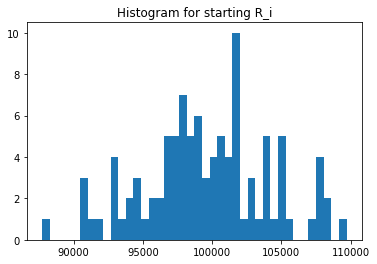

In [22]:
import matplotlib.pyplot as plt
a = starting_Ri.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_i")
plt.show()

In [23]:
experiments.UNI_Qi.unique()

array([205026.15838291, 223465.55696897, 224666.55696897, ...,
       131967.412781  , 142060.27993355, 141039.27993355])

In [24]:
experiments.UNI_Si.unique()

array([10000., 14652., 14948., 14736., 14725., 14465., 14591., 14930.,
       14601., 14473., 14810., 14359., 14690., 14695., 14805., 14859.,
       14860., 14701., 14836., 14669., 15043., 14401., 15233., 15018.,
       14858., 14839., 14464., 14824., 14923., 14517., 15124., 14684.,
       14742., 14688., 14555., 14808., 14679., 14876., 14879., 14527.,
       14820., 14784., 14900., 15056., 14712., 15046., 14537., 14789.,
       14670., 14533., 15007., 14322., 14977., 14922., 14687., 14757.,
       14822., 15119., 14659., 14958., 14434., 14425., 14633., 14377.,
       14724., 14651., 14916., 14578., 14539., 14830., 14964., 14637.,
       14769., 15278., 14351., 14565., 14862., 14697., 14806., 14499.,
       14815., 14424., 14939., 14996., 14735., 14696., 15104., 15063.,
       15040., 15041., 14498., 14804., 14778., 15214., 15288., 14758.,
       14832., 14641., 15055., 14783., 14880., 15021., 14969., 15334.,
       14458., 14852., 14380., 14990., 14919., 14514., 14545., 14582.,
      

In [25]:
experiments.UNI_Qj.unique()

array([186343.73391167, 157336.876189  , 158520.876189  , ...,
       130597.09770342, 129775.09770342, 131430.09770342])

In [26]:
experiments.UNI_Rj.unique()

array([ 93171.86695584, 133395.9380945 , 132395.9380945 , ...,
       157259.54885171, 158259.54885171, 156259.54885171])

In [27]:
starting_Rj = experiments[experiments.timestep == 0]
starting_Rj = starting_Rj['UNI_Rj']
starting_Rj.reset_index(drop=True)
starting_Rj.unique()

array([ 93171.86695584,  97515.57566217, 102395.9380945 ,  95807.31682737,
       104372.20448362,  97209.94026981,  94220.91542352, 100499.18764652,
        96493.42857807,  94830.22166713,  97793.52547021,  92544.11105846,
       109771.47281761, 100343.18845208, 107261.10799307,  93964.97662644,
        95557.59867715, 104011.33182204,  93234.8315986 , 104031.84945424,
       105960.22711168, 111566.92199068, 103335.12804697,  95170.9056478 ,
       103175.76886971, 102975.87383561,  95246.33352613,  92709.88486477,
       101075.54340927, 101495.06244386, 102392.89224575,  92281.73090249,
       101259.54885171, 101143.07354494, 106749.66679158, 103983.98850869,
       103632.18300399,  93614.80685037,  94006.2484466 ,  98889.59447385,
       100926.86210036, 102642.38695564, 101307.07140089, 101167.30410958,
       108052.64221304,  95856.94526681,  96161.77841487,  95509.68609682,
       101475.22332588,  94789.53200103, 102440.15248603, 101746.23127726,
       104148.80135547,  

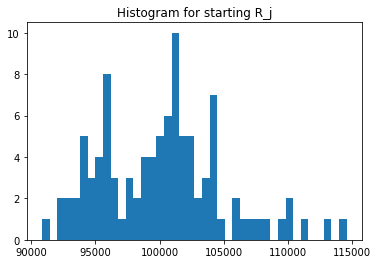

In [28]:
a = starting_Rj.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_j")
plt.show()

In [29]:
experiments.UNI_Sj.unique()

array([10000], dtype=int64)

In [30]:
experiments.UNI_ij.unique()

array([102513.07919145,  98466.77848448,  97043.27335419,  98553.01252306,
       101800.46479606, 100486.26323049, 104959.25280134, 101895.05002056,
       101669.05907735,  94410.89003523, 104763.46857136, 102597.90769785,
        99932.57873647, 109697.46842654,  95893.24101737,  97038.09499273,
        98878.1631456 ,  99076.57452013, 100338.00021993,  98376.04253656,
        90545.61599107,  93128.21875062,  96552.74514085, 107598.51912228,
        94621.8066266 , 100555.8056843 ,  98908.32856475, 104995.44809824,
        97316.44990982,  97634.06196207,  97724.53202172, 105286.79281704,
        94851.98731243, 104680.38172341,  91567.2063905 , 101731.84459587,
        99423.78601802, 101632.59194111, 103758.95504834,  97443.51230388,
       100988.54597121, 100859.98339642,  97523.95035638,  96040.57295324,
        96466.94784422, 105424.31550476,  98506.68343208,  92878.31799834,
       103103.66221462, 107664.3768275 ,  97387.58207516,  94081.93986744,
       104195.7937909 , 1

In [31]:
experiments.UNI_ji.unique()

array([ 93171.86695584, 102395.9380945 , 100499.18764652,  97515.57566217,
        95807.31682737,  97793.52547021, 104372.20448362,  97209.94026981,
        94220.91542352,  95170.9056478 ,  96493.42857807,  92709.88486477,
        94830.22166713, 100343.18845208, 109771.47281761,  92544.11105846,
        95557.59867715, 104011.33182204, 107261.10799307,  93964.97662644,
       114559.43301381,  93234.8315986 , 101075.54340927, 104031.84945424,
       105960.22711168, 111566.92199068, 103175.76886971, 103335.12804697,
       102975.87383561,  95246.33352613,  94006.2484466 , 101475.22332588,
       102394.70760902, 102392.89224575, 101495.06244386, 102642.38695564,
        92281.73090249, 101259.54885171, 101143.07354494, 102440.15248603,
        94034.8428942 , 106749.66679158, 103632.18300399,  98889.59447385,
       103983.98850869,  93614.80685037, 100926.86210036, 101307.07140089,
       101167.30410958,  94789.53200103,  95856.94526681, 108052.64221304,
        95509.68609682,  

In [32]:
experiments.UNI_Sij.unique()

array([9.55133498e+09, 1.00825982e+10, 9.75277014e+09, 9.61045375e+09,
       9.75322938e+09, 9.82690594e+09, 1.09548286e+10, 9.90521173e+09,
       9.57935182e+09, 8.98516991e+09, 1.01089863e+10, 9.51184021e+09,
       9.47662859e+09, 1.10073937e+10, 1.05263423e+10, 8.98030424e+09,
       9.44855983e+09, 1.03050865e+10, 1.07623651e+10, 9.24390254e+09,
       1.03728544e+10, 8.68279379e+09, 9.75912118e+09, 1.11936729e+10,
       1.00261481e+10, 1.12187017e+10, 1.02049428e+10, 1.08497181e+10,
       1.00212465e+10, 9.29928643e+09, 9.18671664e+09, 1.06840008e+10,
       9.71234151e+09, 1.07185270e+10, 9.29361933e+09, 1.04419994e+10,
       9.17499907e+09, 1.02912704e+10, 1.04944996e+10, 9.98212826e+09,
       9.49644205e+09, 1.07667696e+10, 1.01066199e+10, 9.49741331e+09,
       1.00310180e+10, 9.86927693e+09, 9.94197045e+09, 9.40923039e+09,
       1.04307196e+10, 1.02054559e+10, 9.33527612e+09, 1.01658022e+10,
       9.95170756e+09, 9.71706418e+09, 9.98071364e+09, 9.74610495e+09,
      

In [33]:
def get_M(k, v):
    if k == 'sim_config':
        k, v = 'M', v['M']
    return k, v

config_ids = [
    dict(
        get_M(k, v) for k, v in config.__dict__.items() if k in ['simulation_id', 'run_id', 'sim_config', 'subset_id']
    ) for config in configs
]

# Agent sequences

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


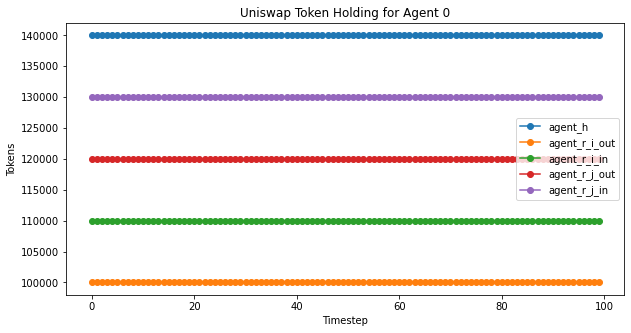

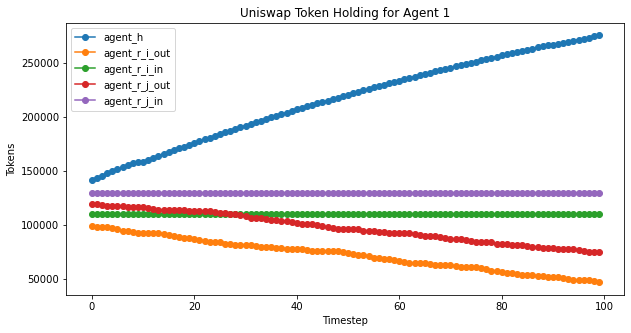

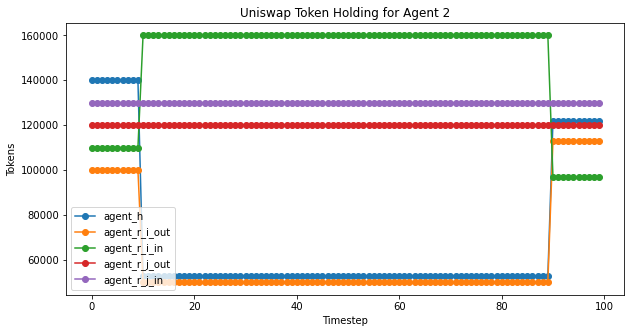

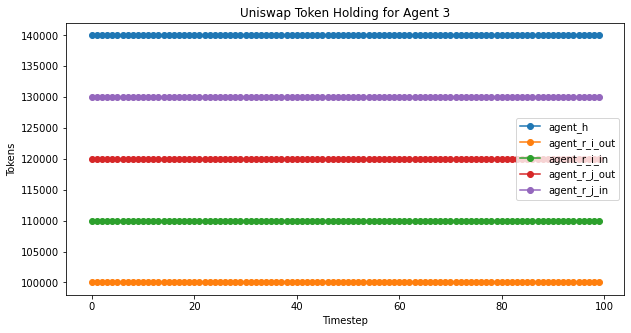

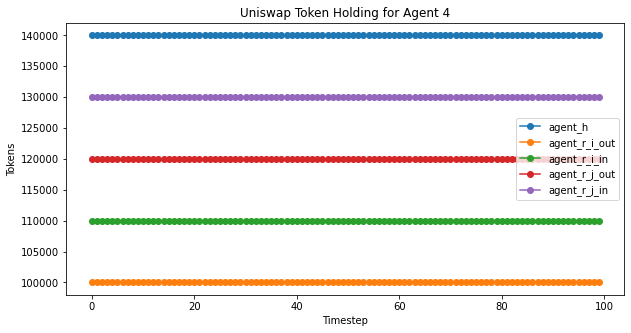

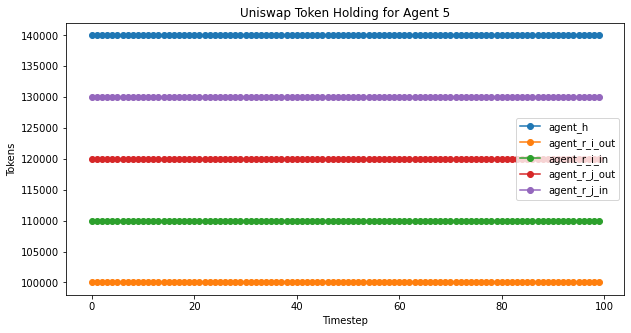

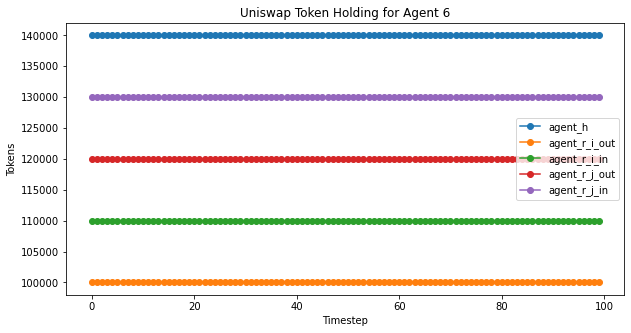

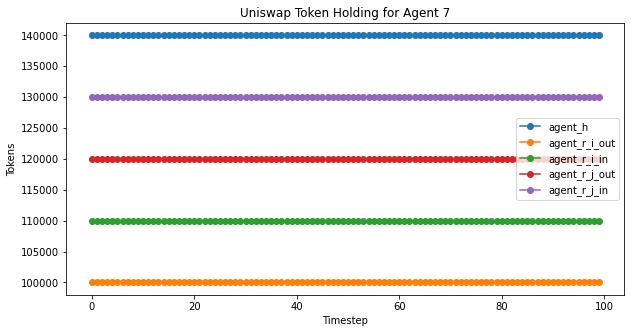

In [34]:
agent_plot(experiment2,'Uniswap Token Holding for Agent ', 100) #,4,'j')

In [1]:
hydra_agent_plot(experiment2,'Hydra Token Holdings for Agent ', 100)

NameError: name 'hydra_agent_plot' is not defined

# Liquidity dynamics

Movement of the Uniswap variables

- 'UNI_Ri', 'UNI_Qi', 'UNI_Si'
- 'UNI_Rj', 'UNI_Qj', 'UNI_Sj'
- 'UNI_ij', 'UNI_ji', 'UNI_Sij'

## Uniswap -- Ri-Q instance

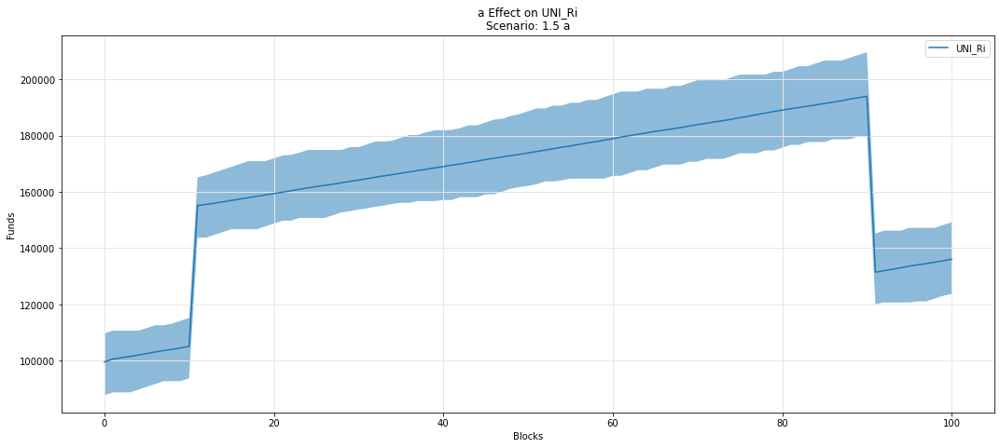

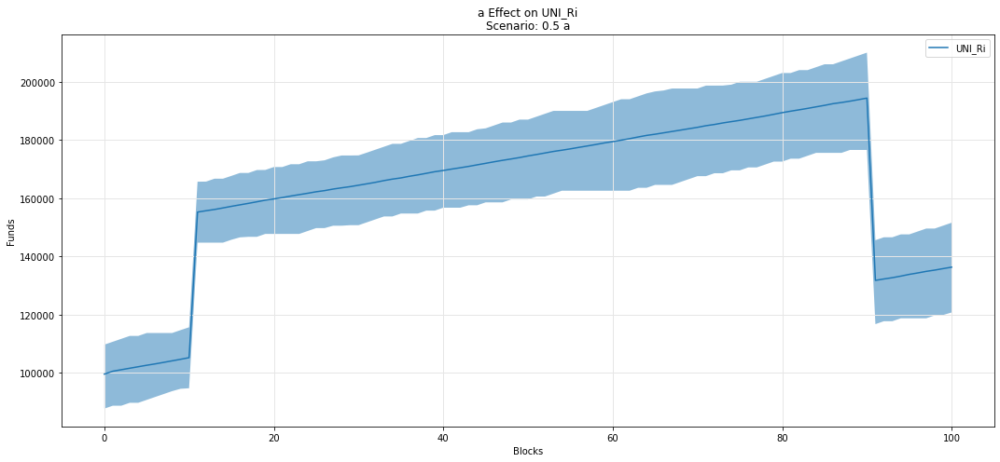

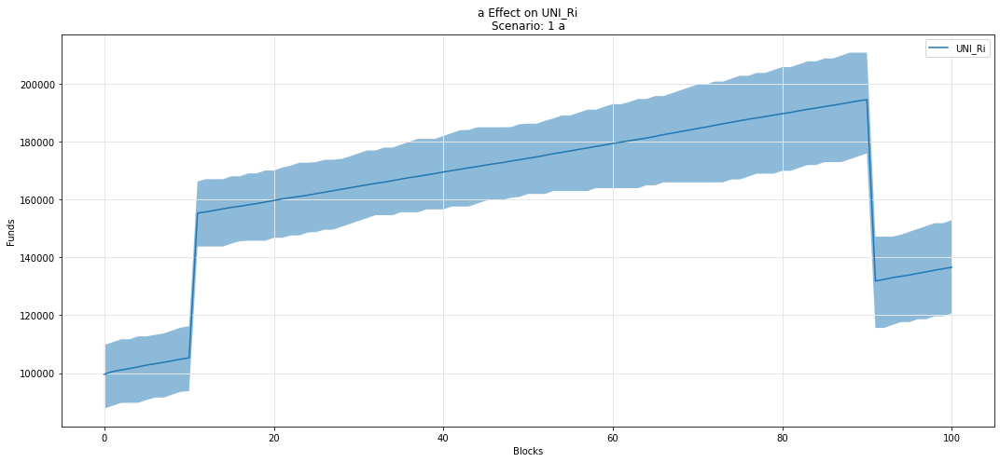

In [36]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Ri')

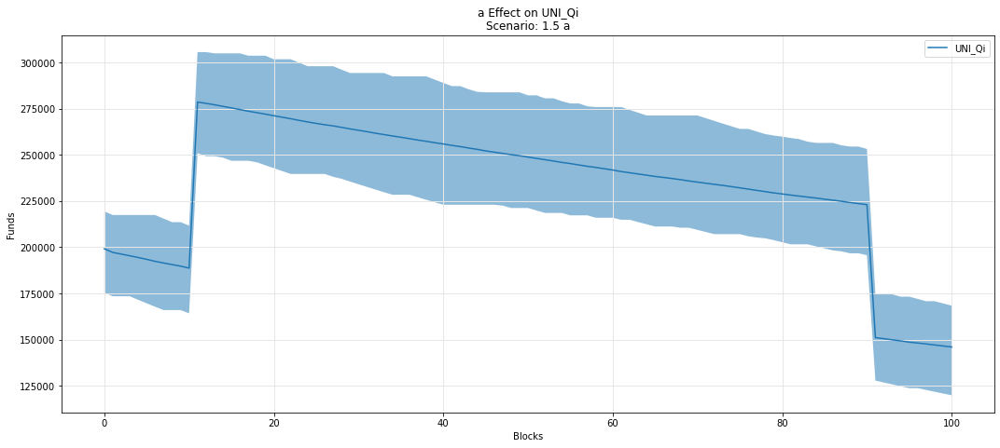

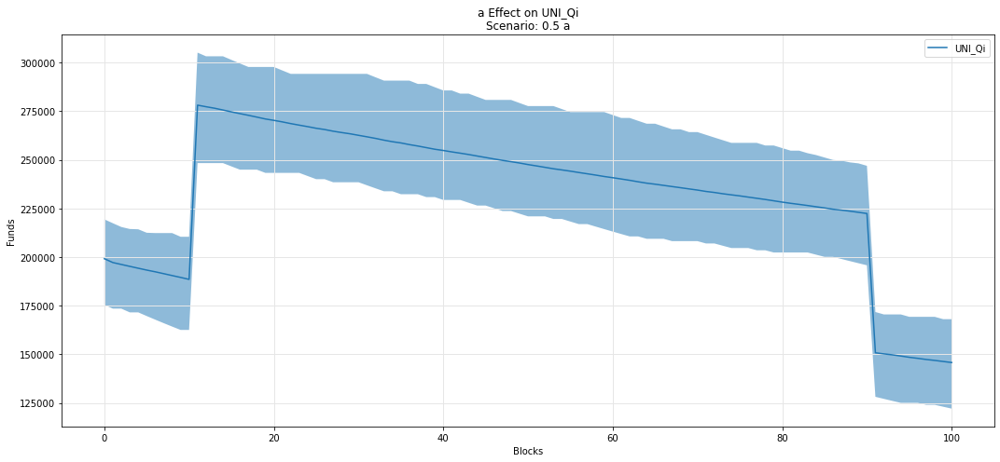

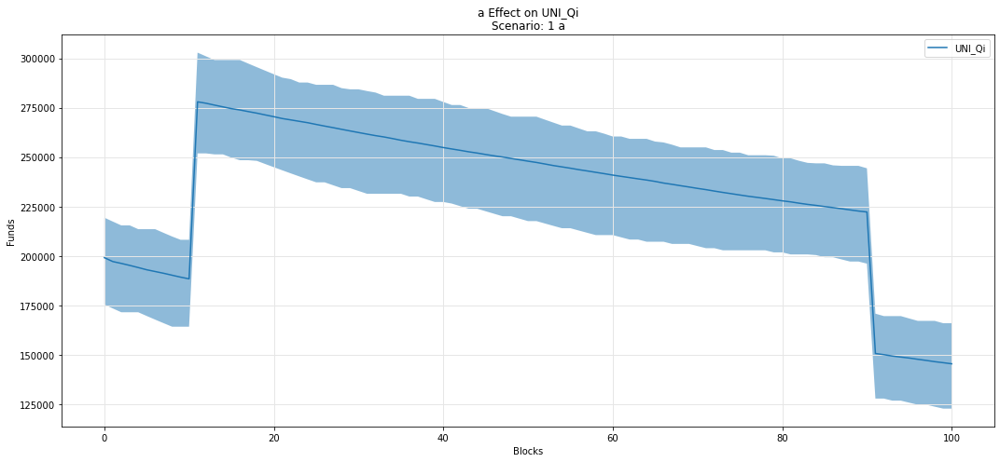

In [37]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qi')

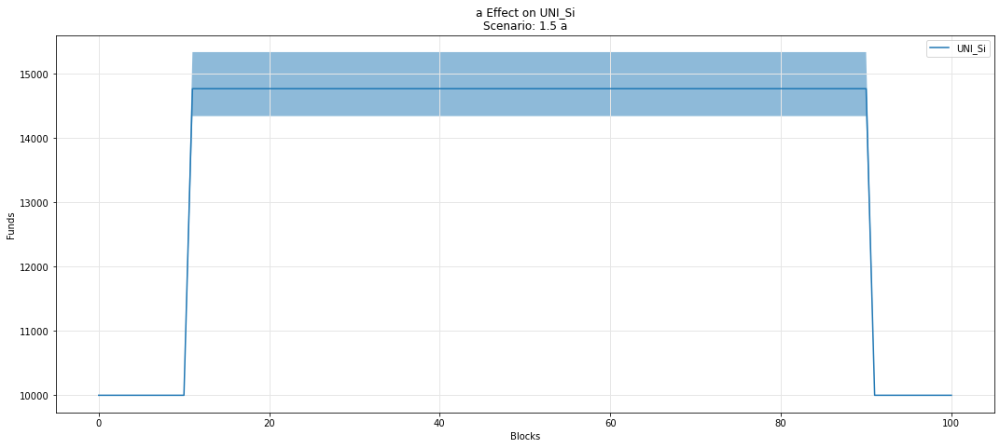

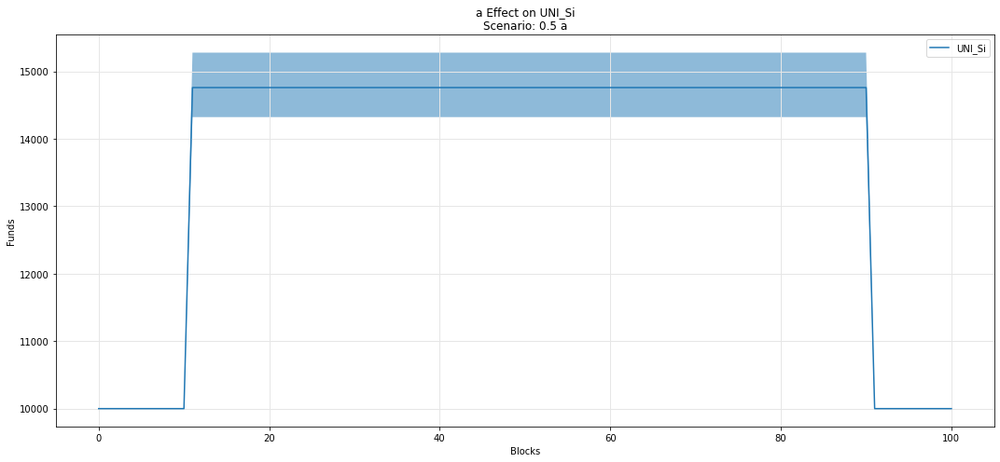

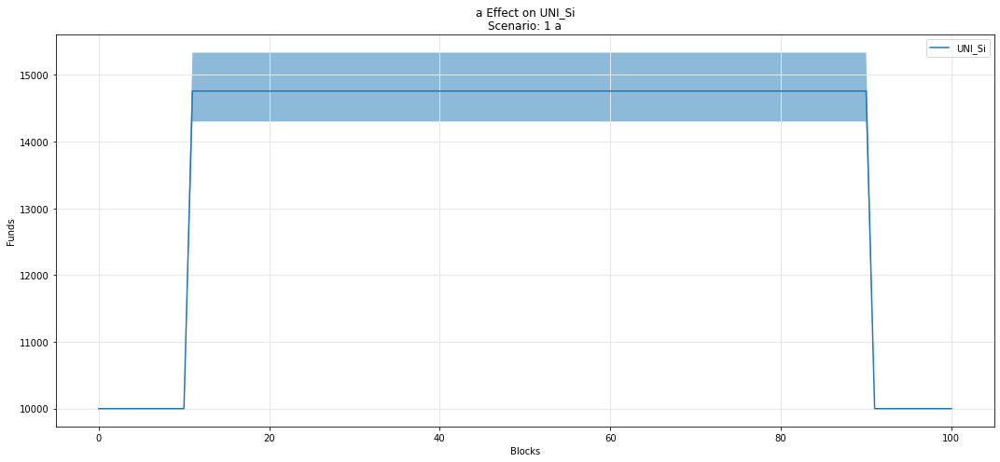

In [38]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Si')

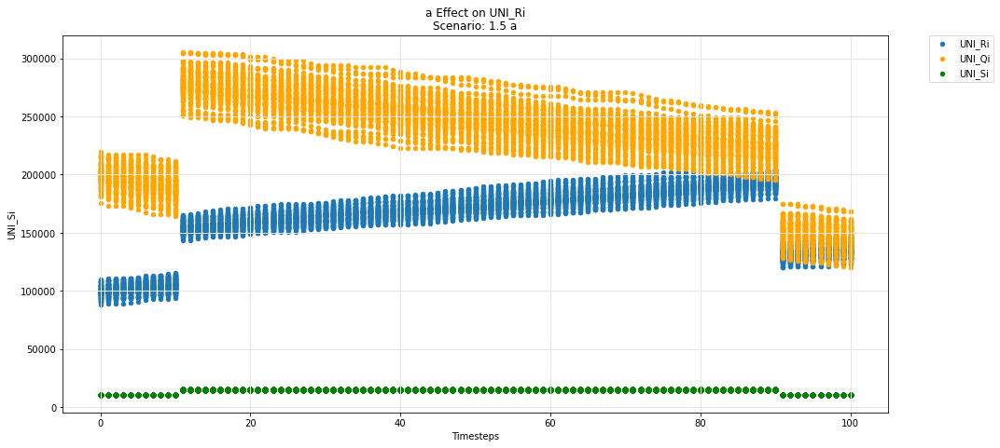

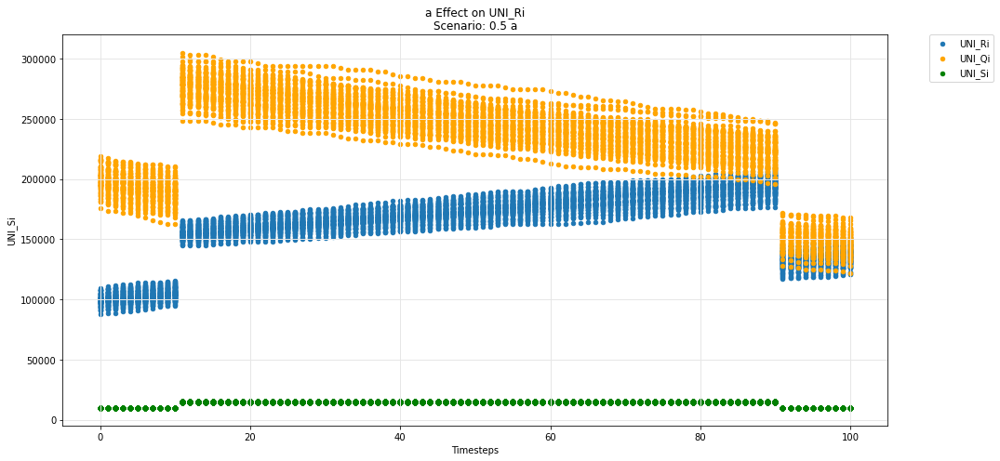

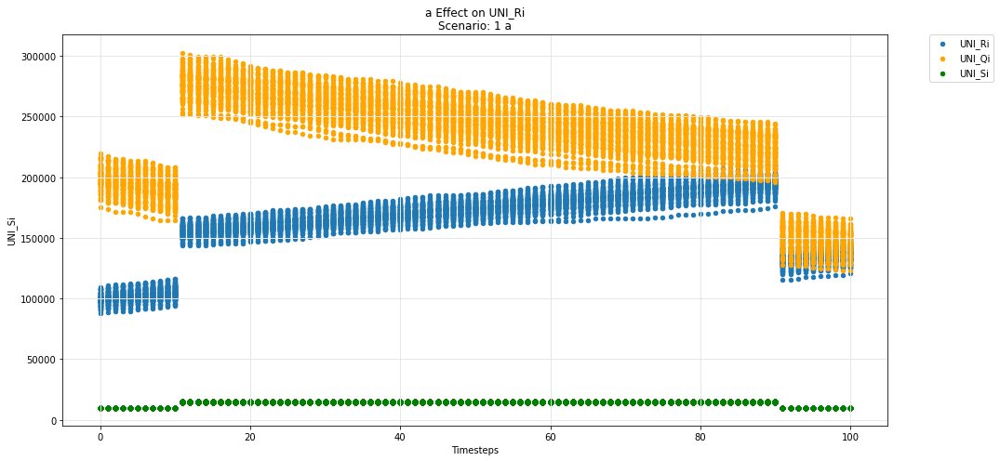

In [39]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Ri', 'UNI_Qi', 'UNI_Si')

## Uniswap -- Rj-Q instance

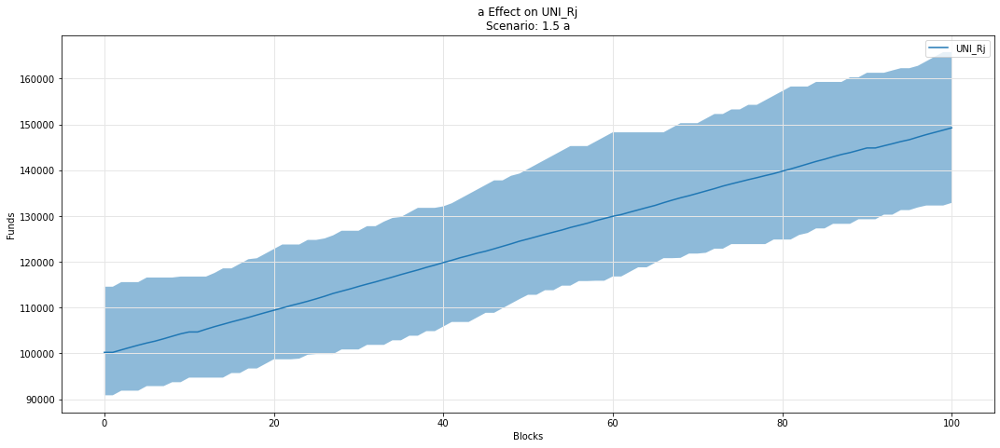

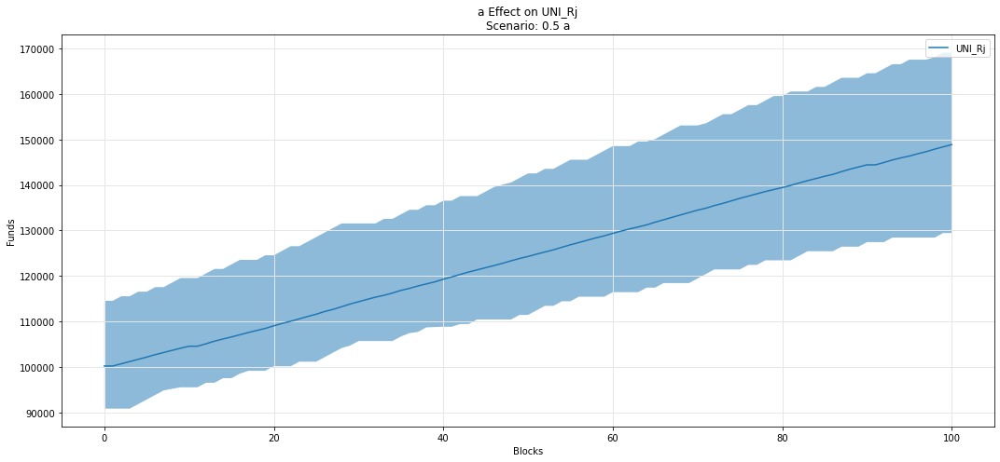

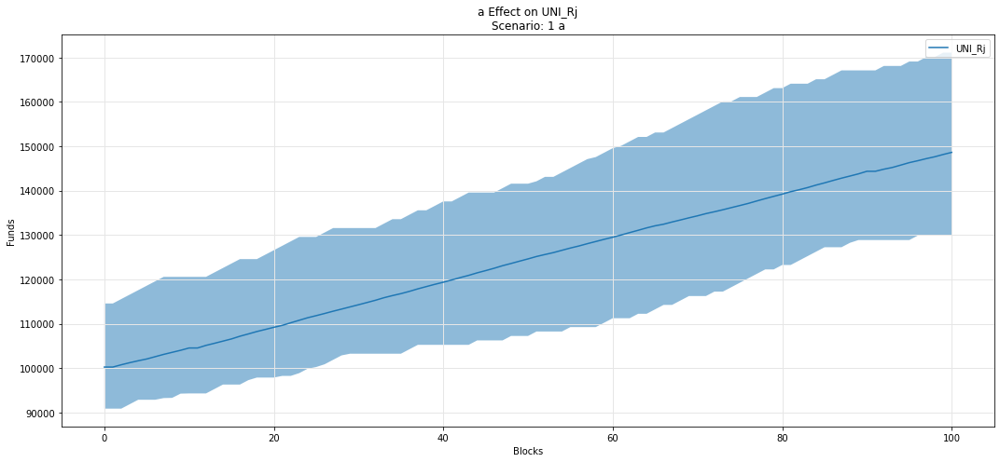

In [40]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Rj')

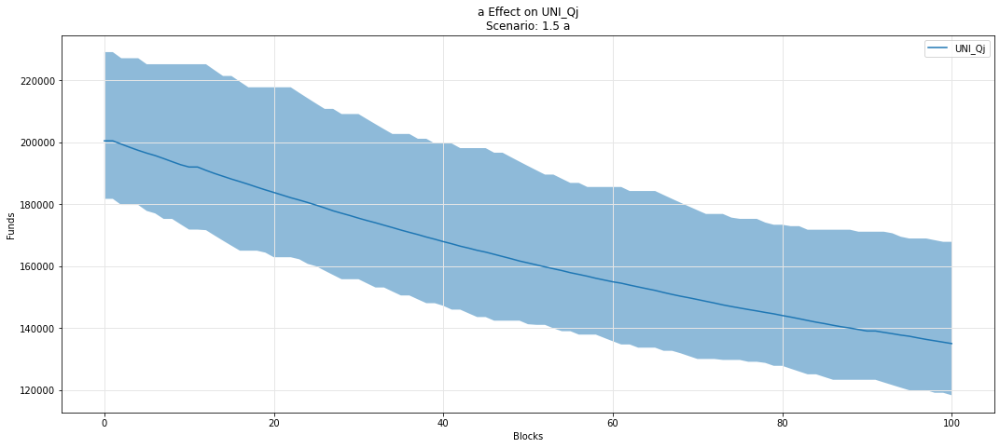

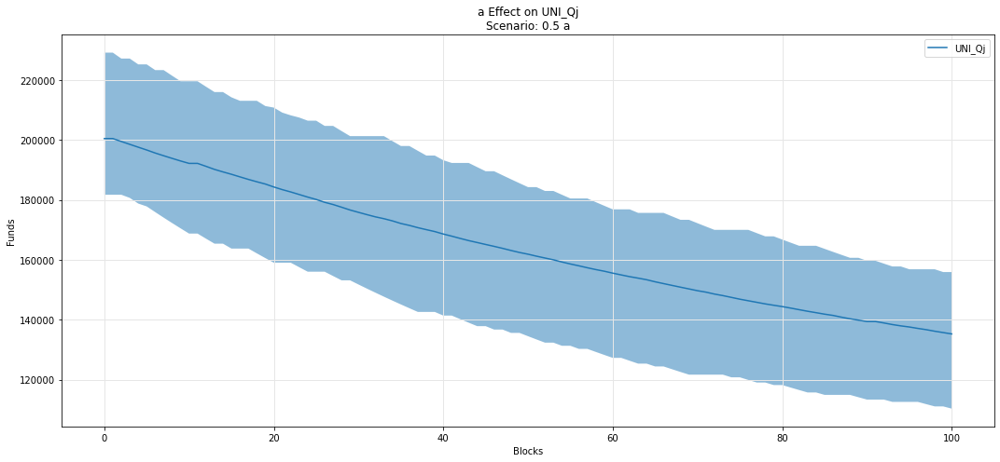

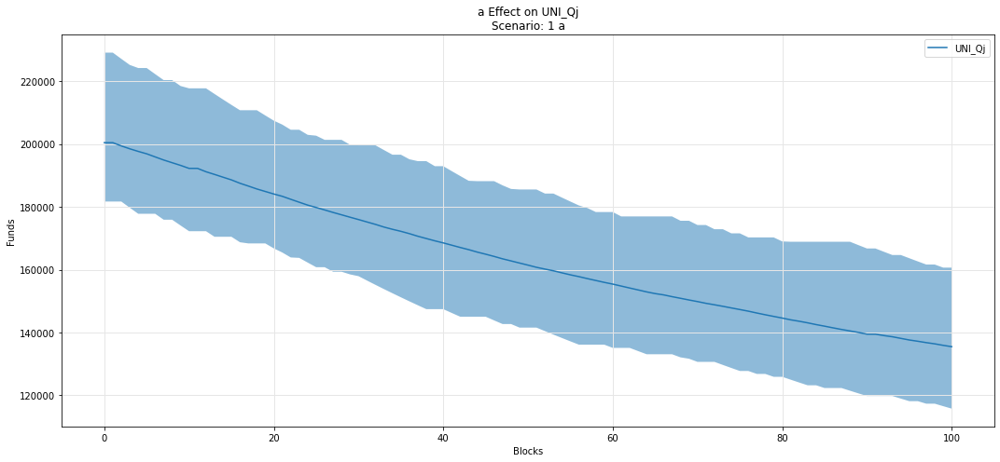

In [41]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qj')

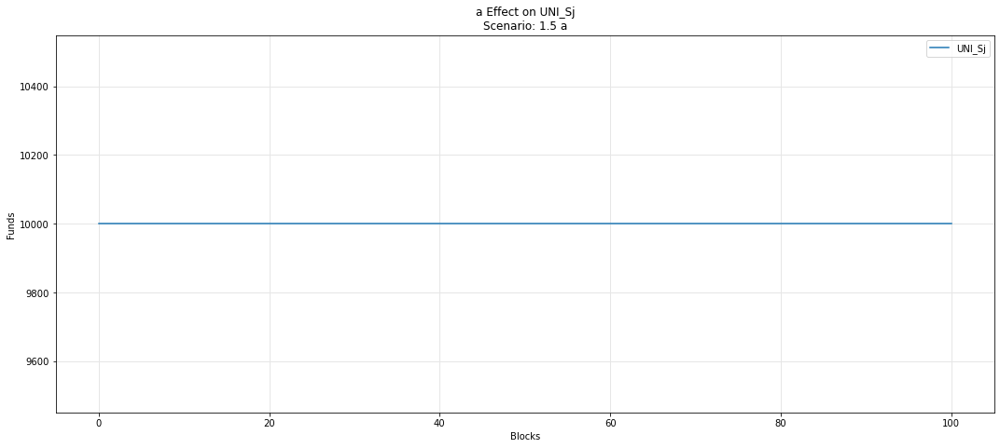

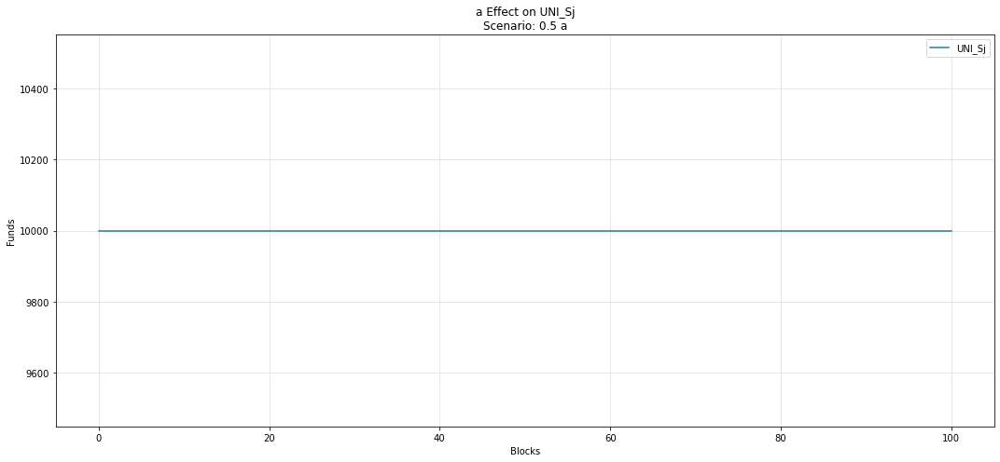

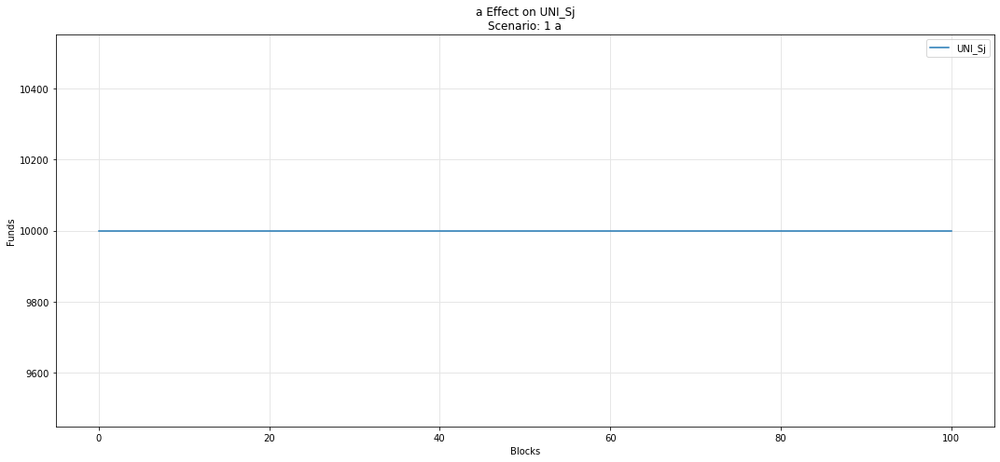

In [42]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sj')

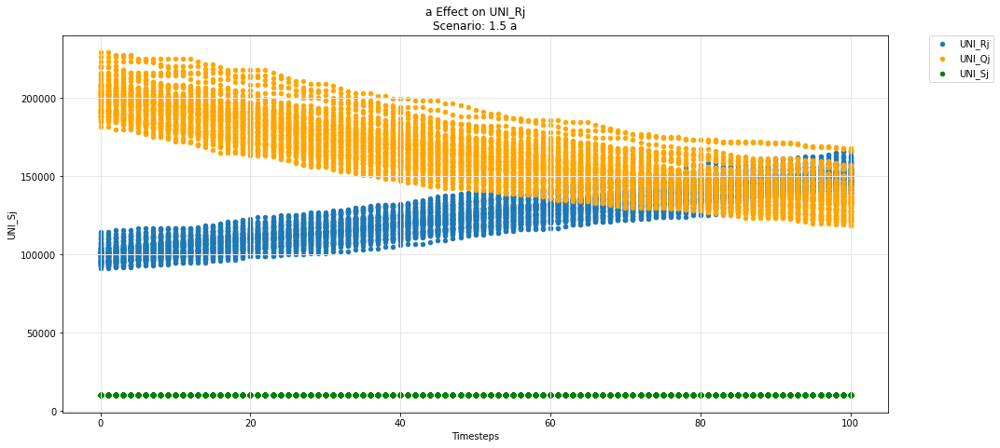

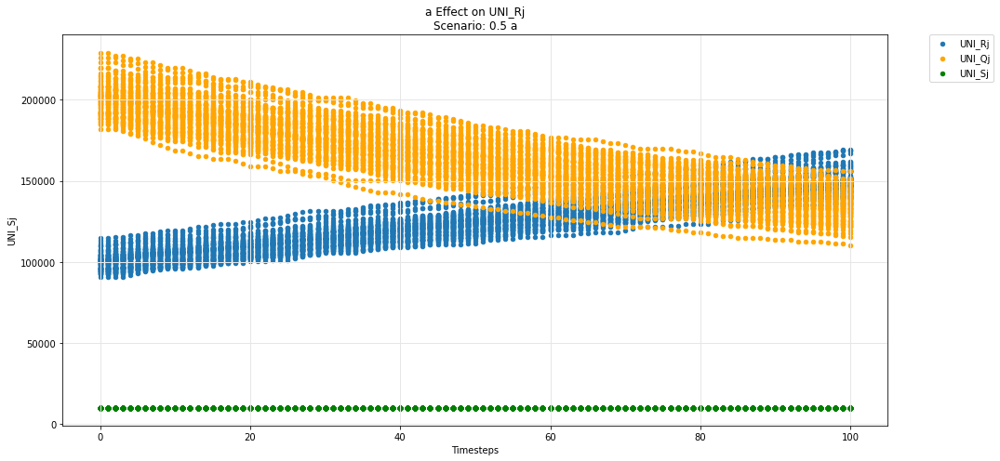

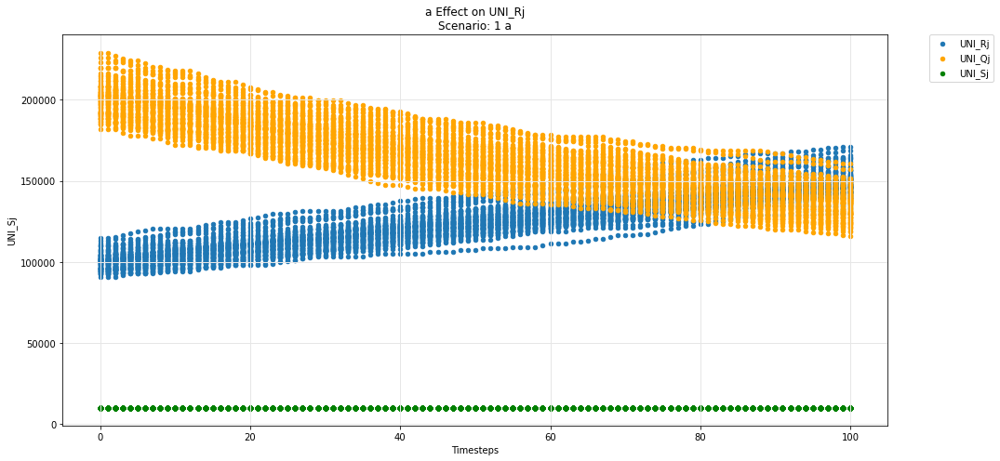

In [43]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Rj', 'UNI_Qj', 'UNI_Sj')

## Uniswap -- ij-Q instance

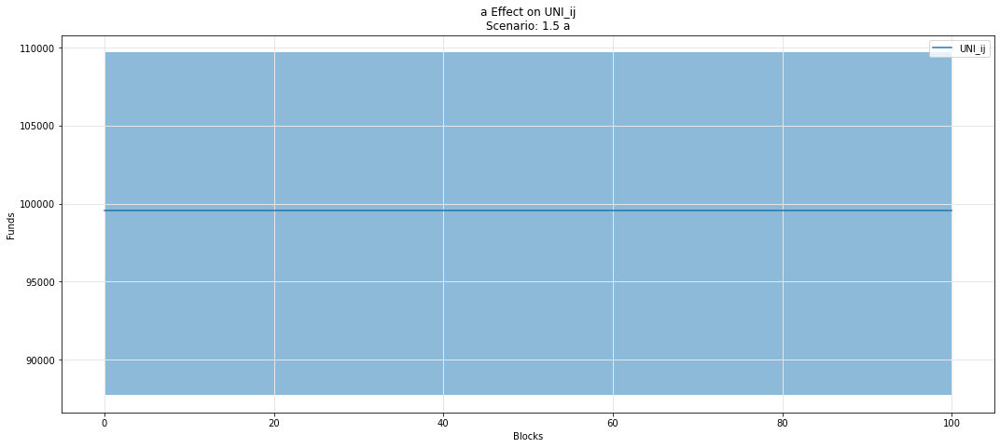

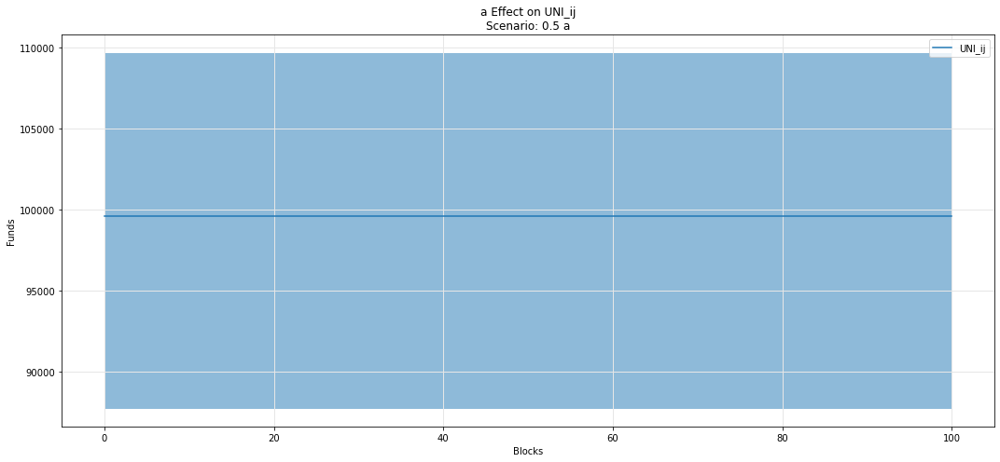

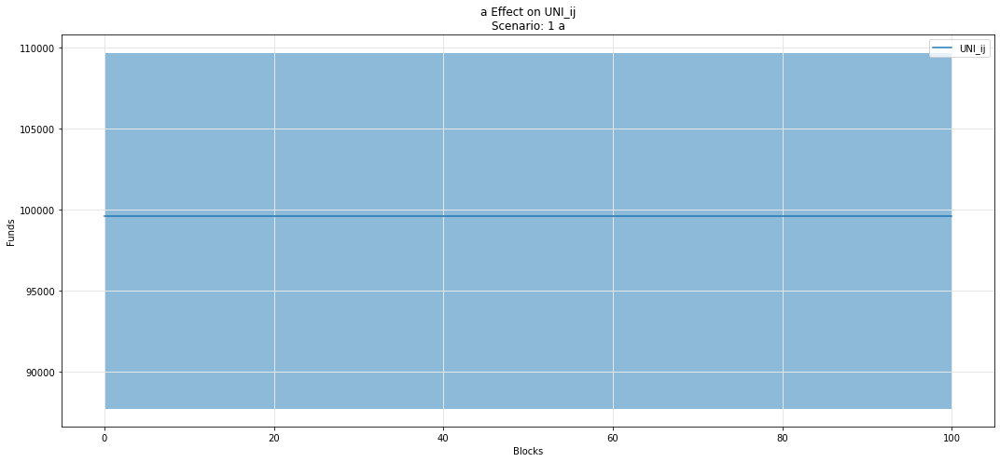

In [44]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ij')

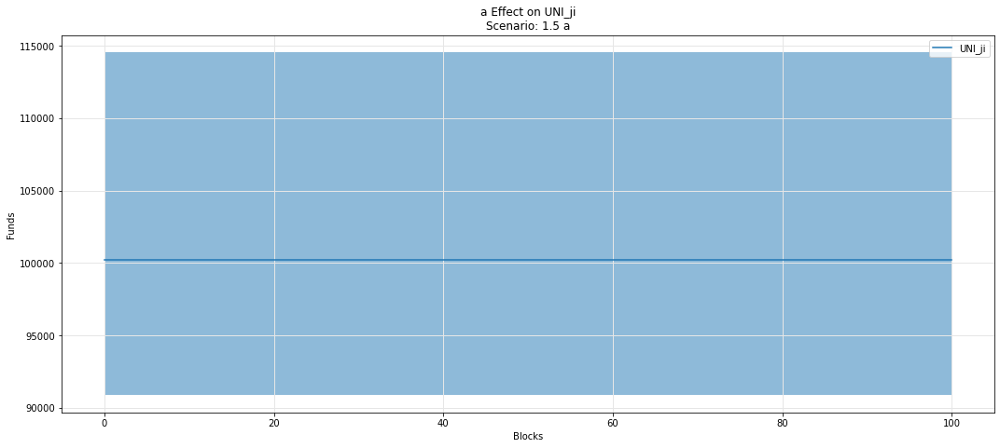

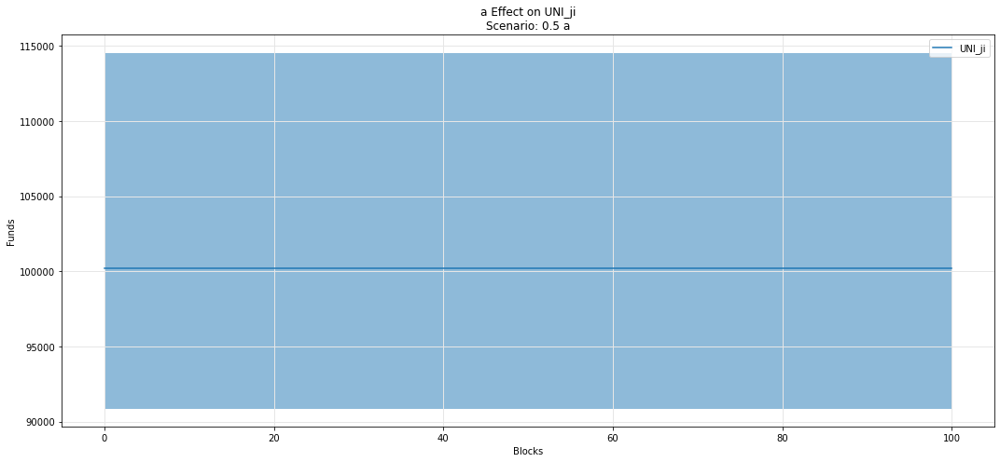

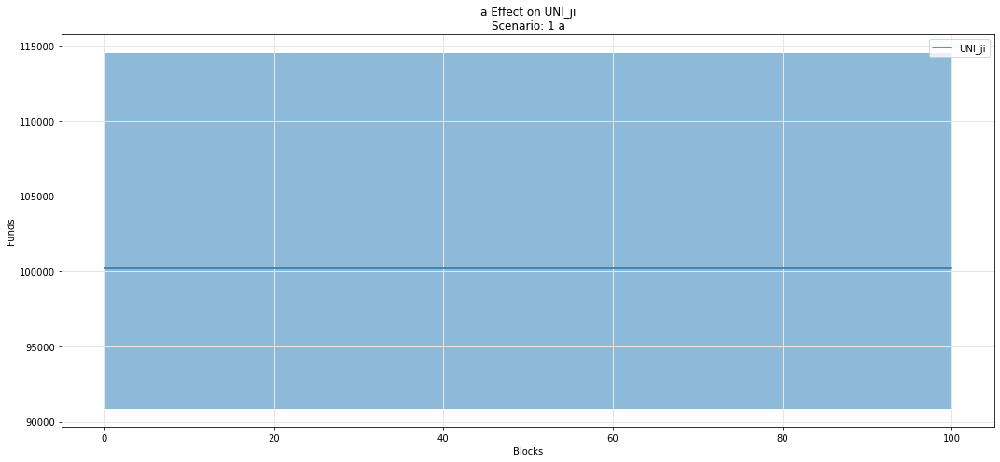

In [45]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ji')

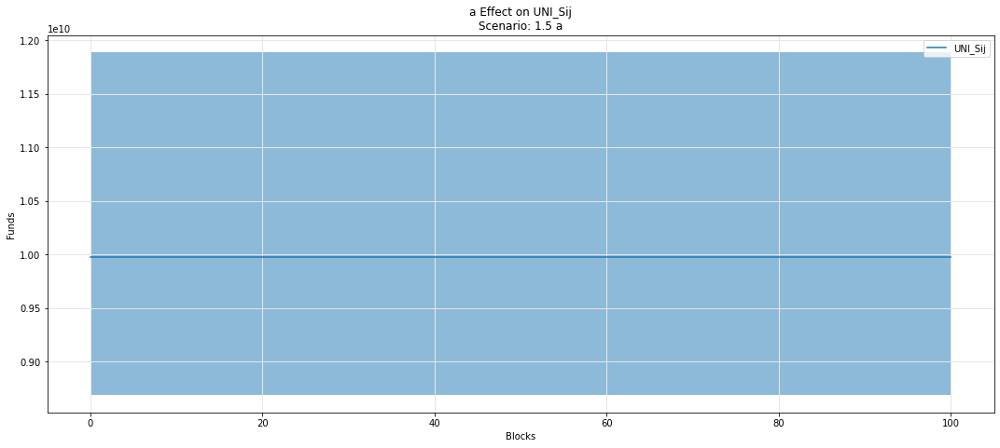

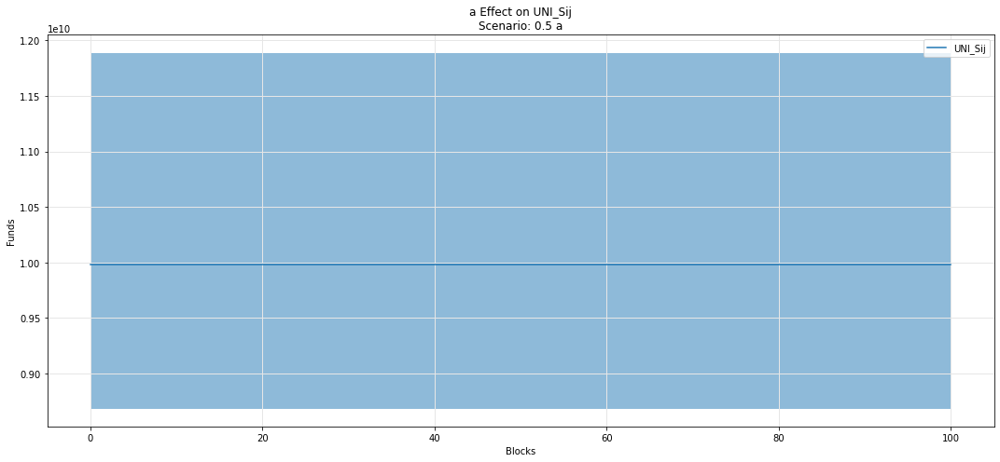

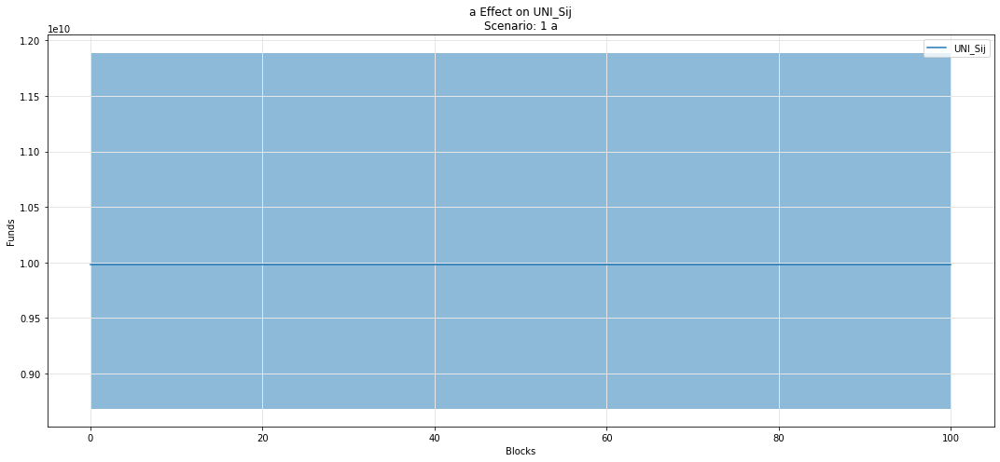

In [46]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sij')

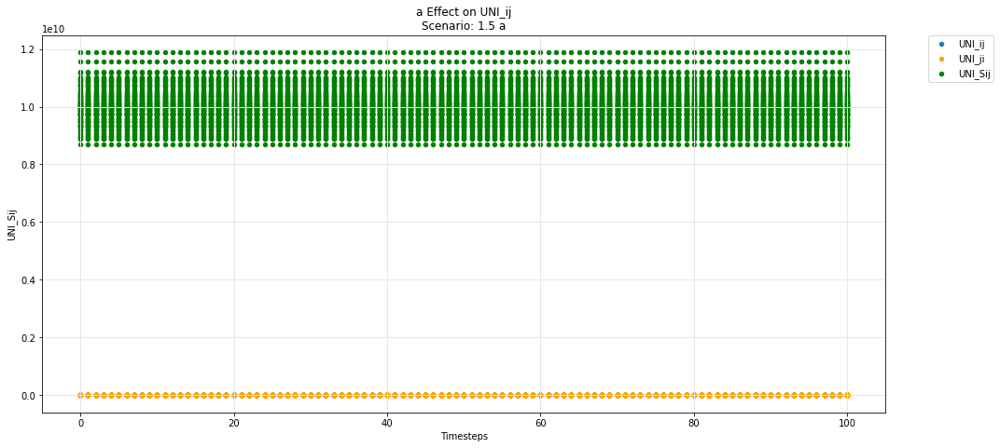

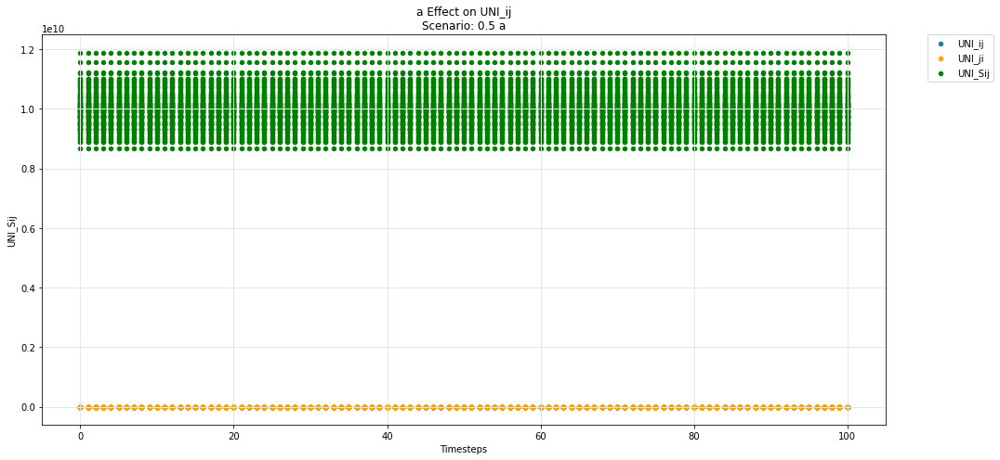

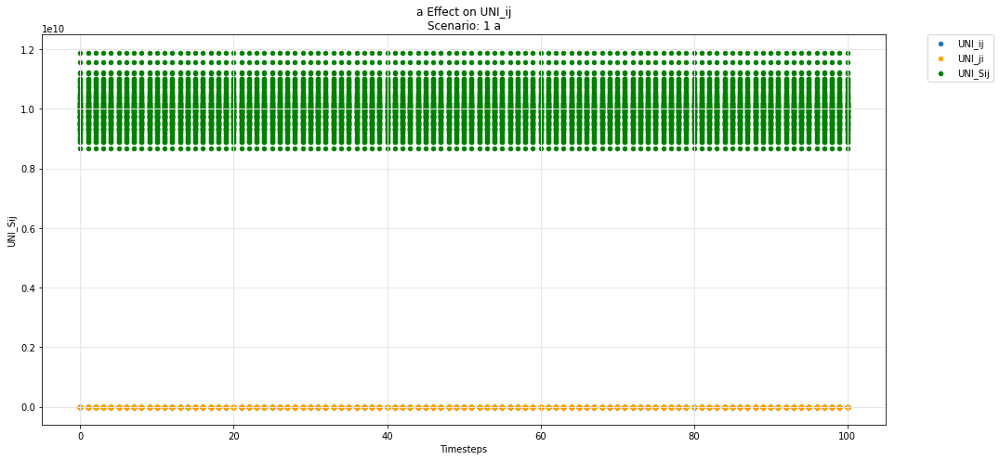

In [47]:
param_test_plot(experiments, config_ids, 'a', 'UNI_ij', 'UNI_ji', 'UNI_Sij')

## Hydra -- base

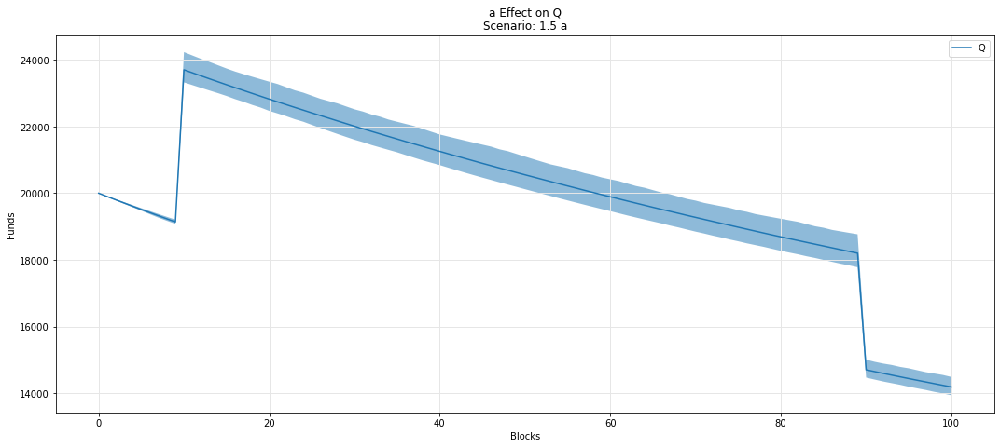

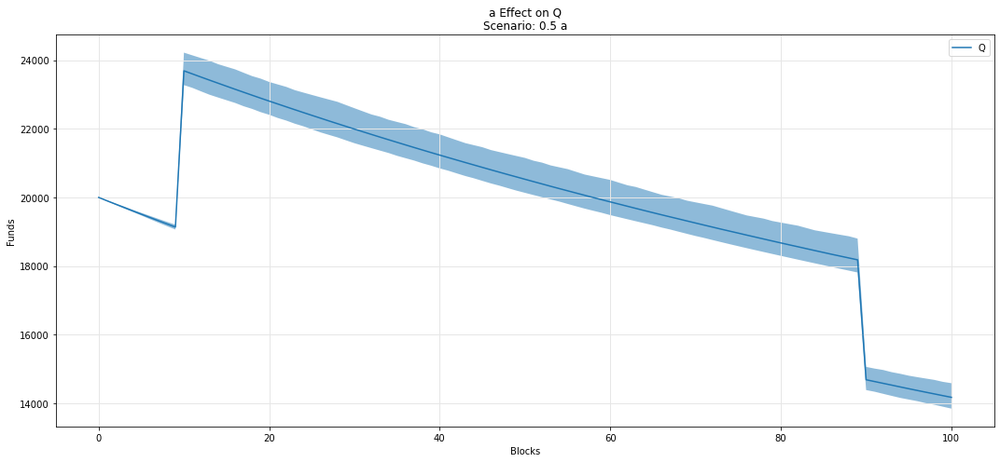

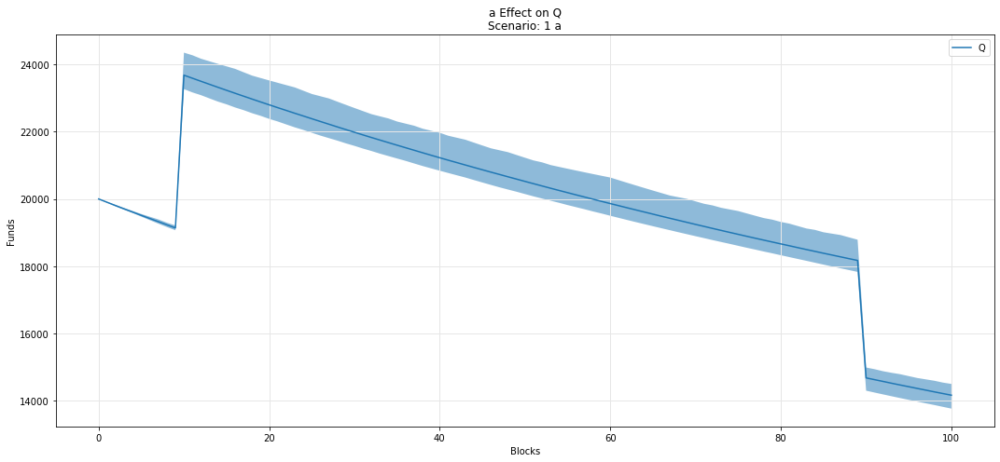

In [48]:
param_fan_plot3(experiments, config_ids, 'a','Q')

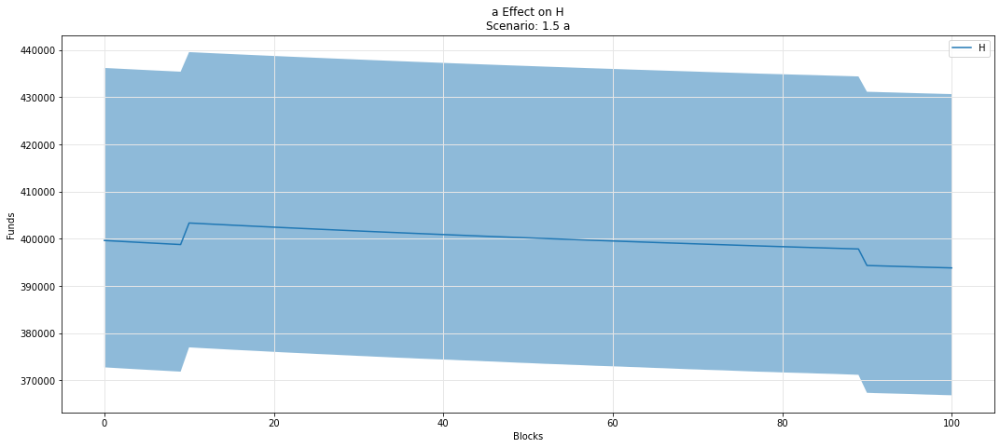

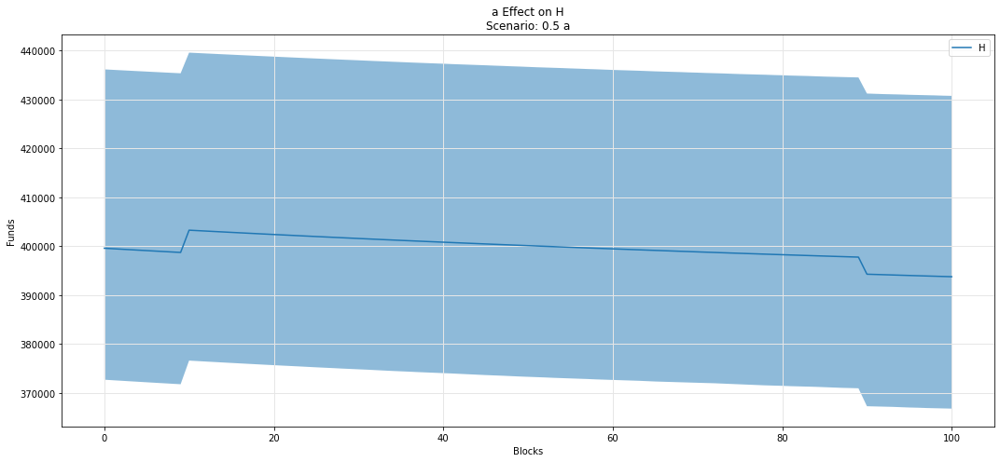

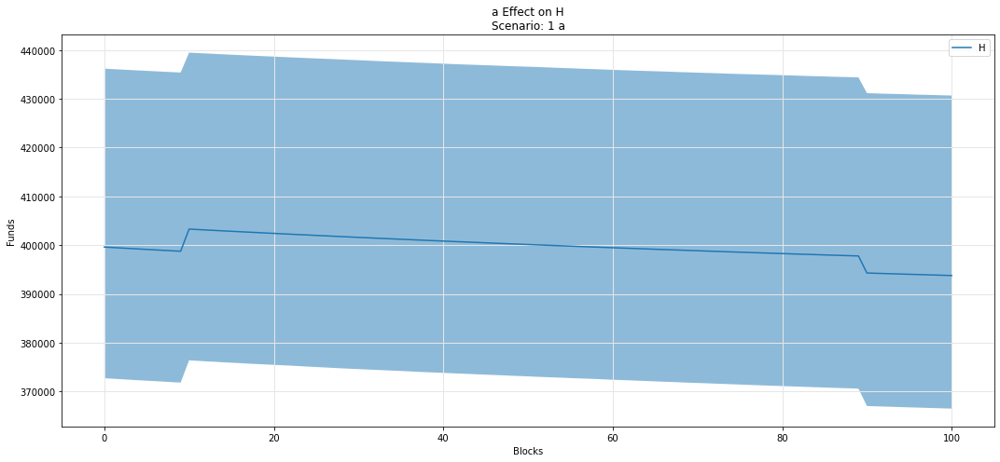

In [49]:
param_fan_plot3(experiments, config_ids, 'a','H')

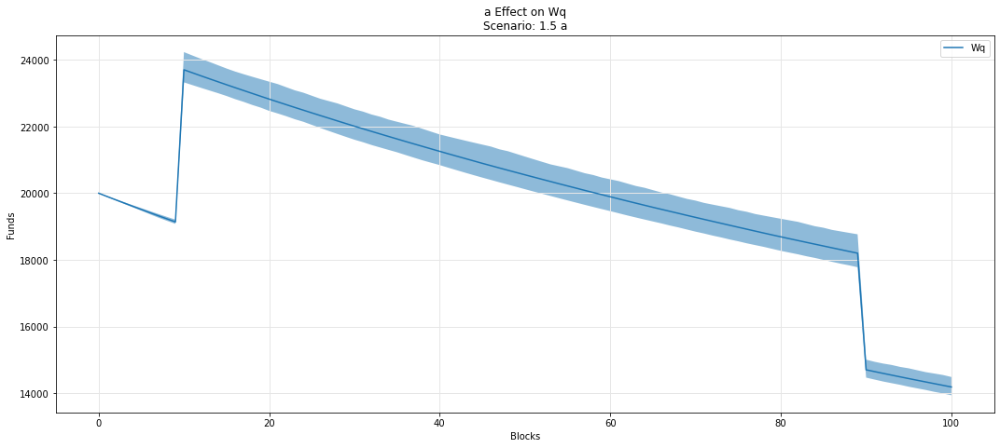

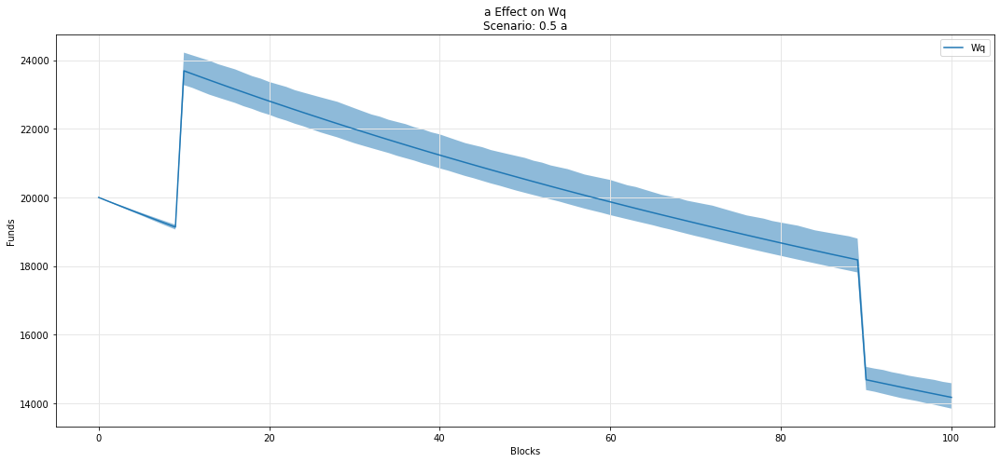

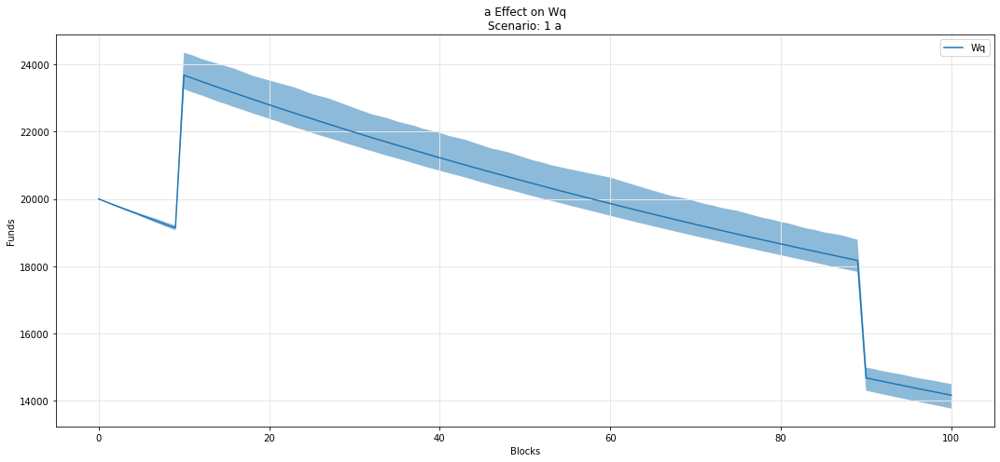

In [50]:
param_fan_plot3(experiments, config_ids, 'a','Wq')

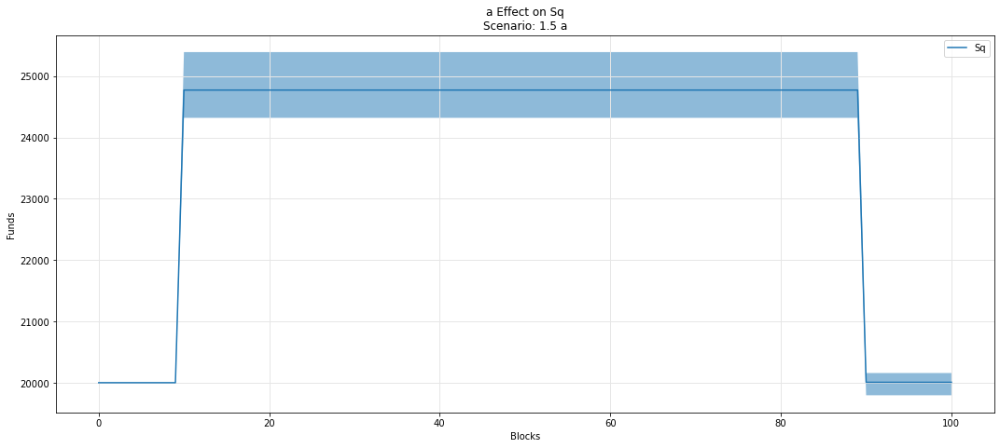

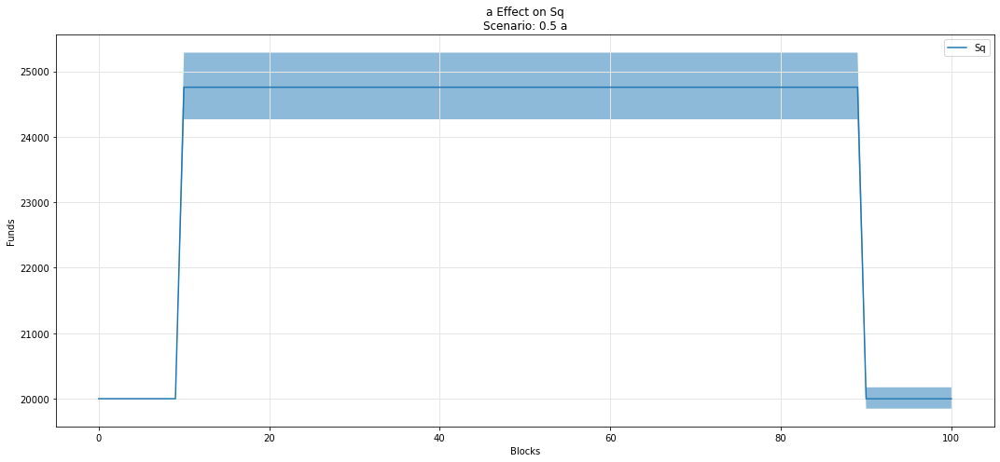

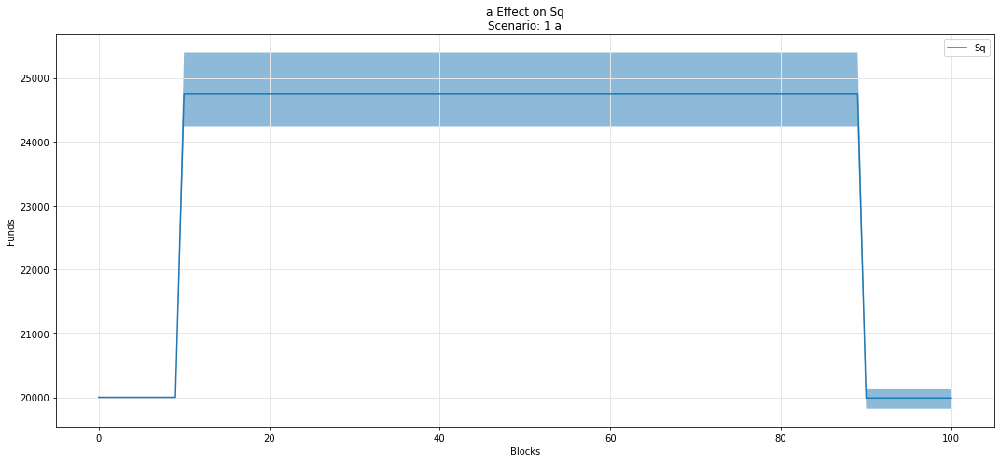

In [51]:
param_fan_plot3(experiments, config_ids, 'a','Sq')

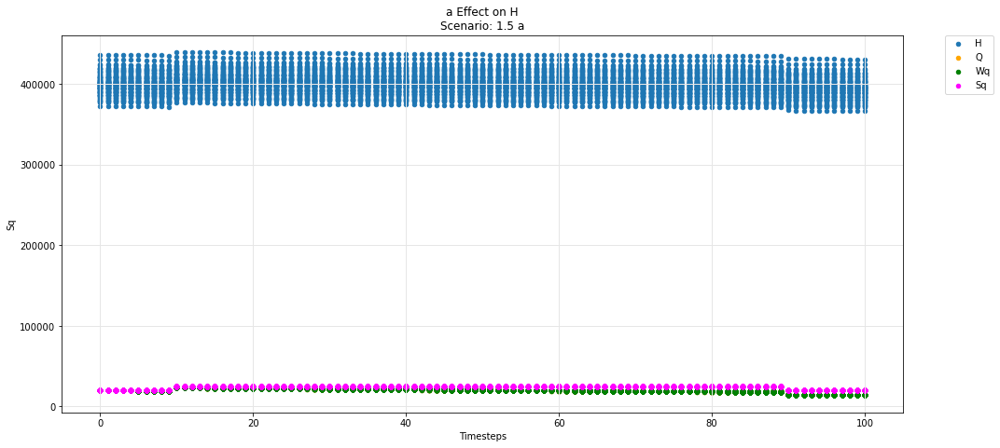

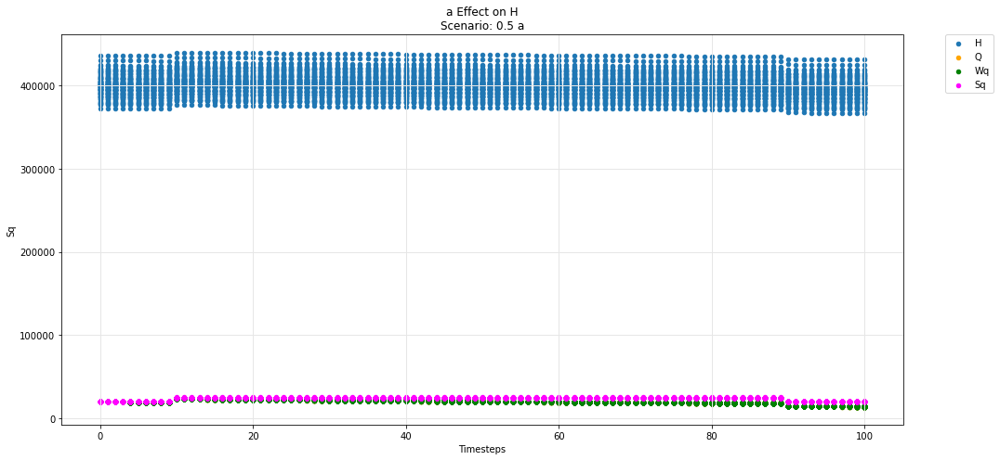

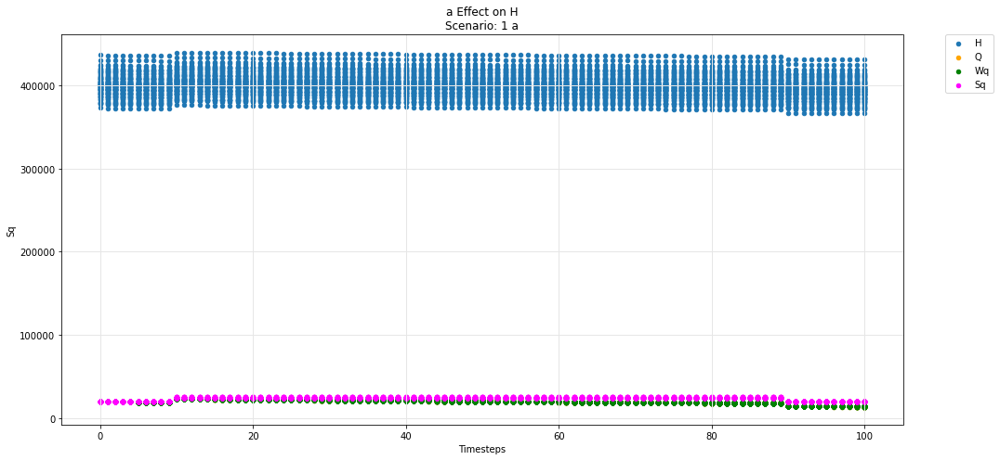

In [52]:
param_test_plot(experiments, config_ids, 'a', 'H', 'Q', 'Wq', 'Sq')

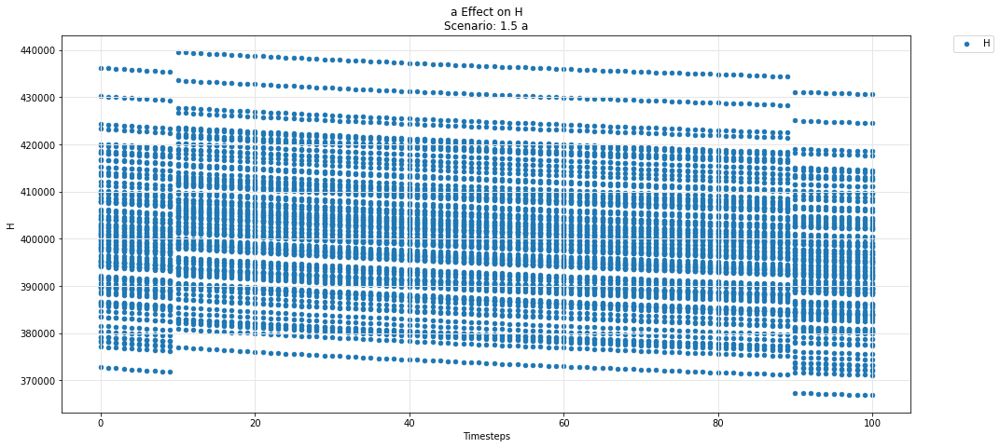

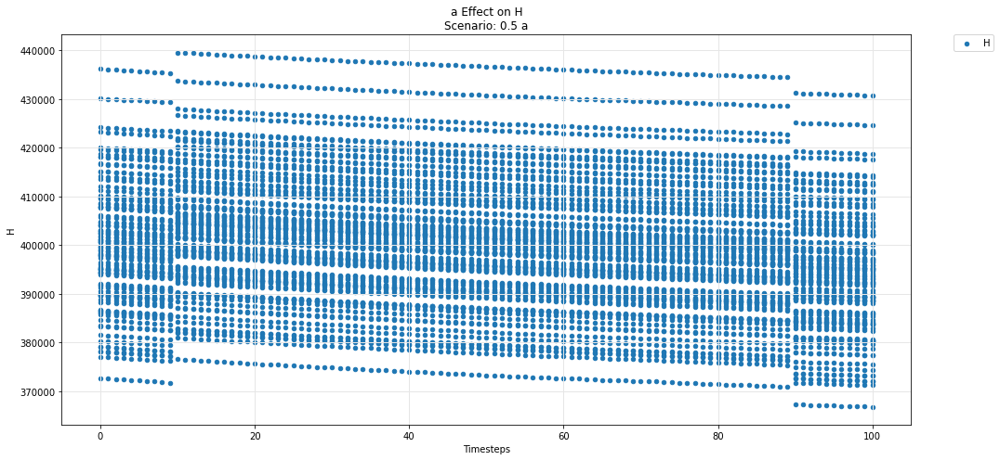

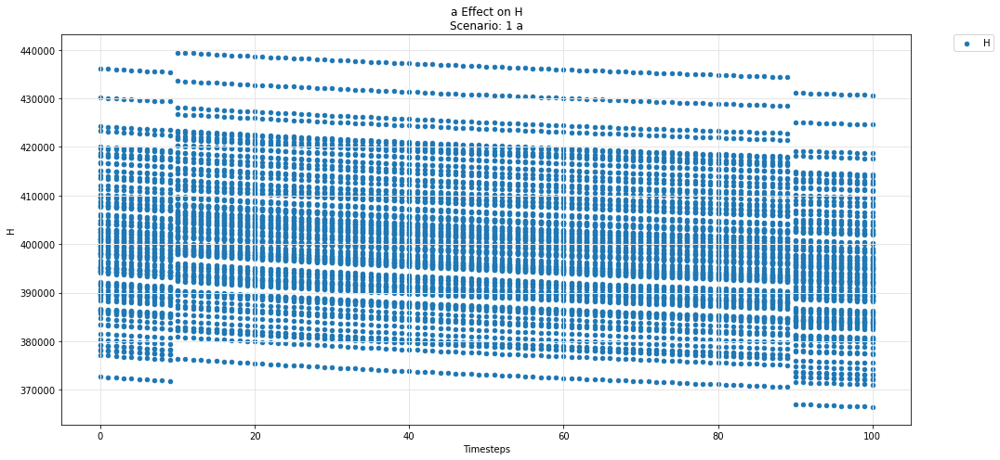

In [53]:
param_test_plot(experiments, config_ids, 'a', 'H')

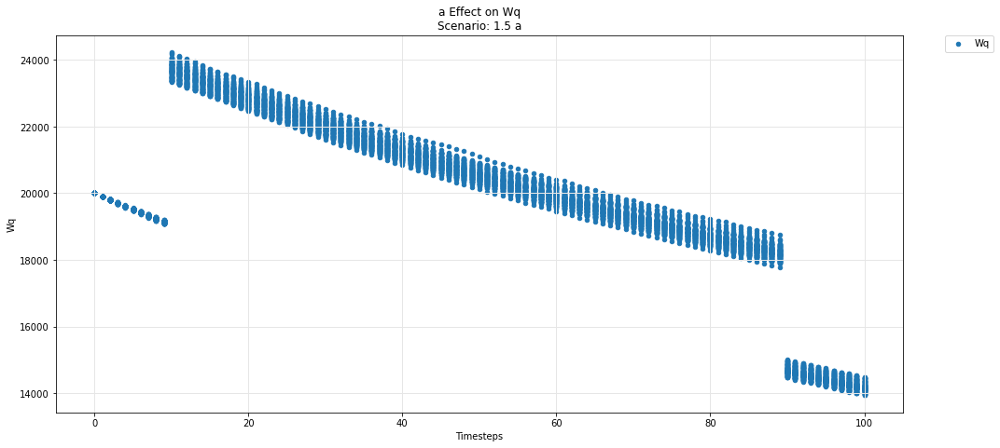

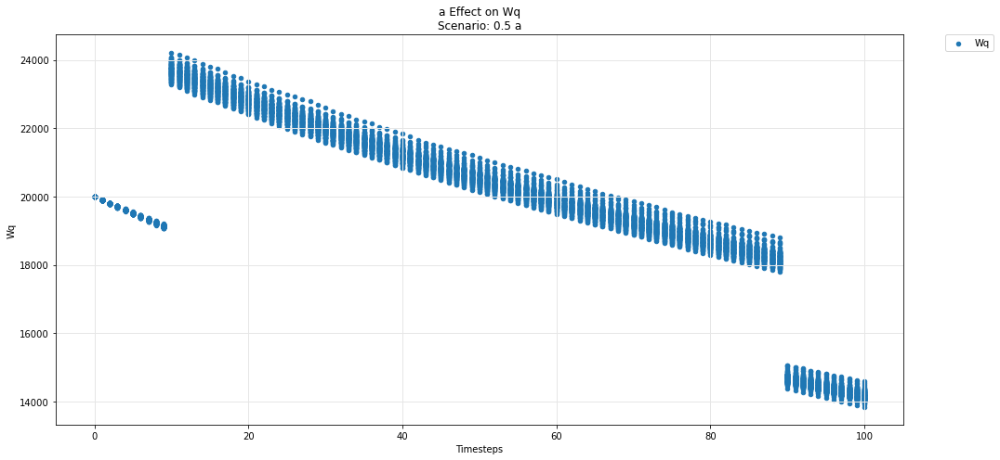

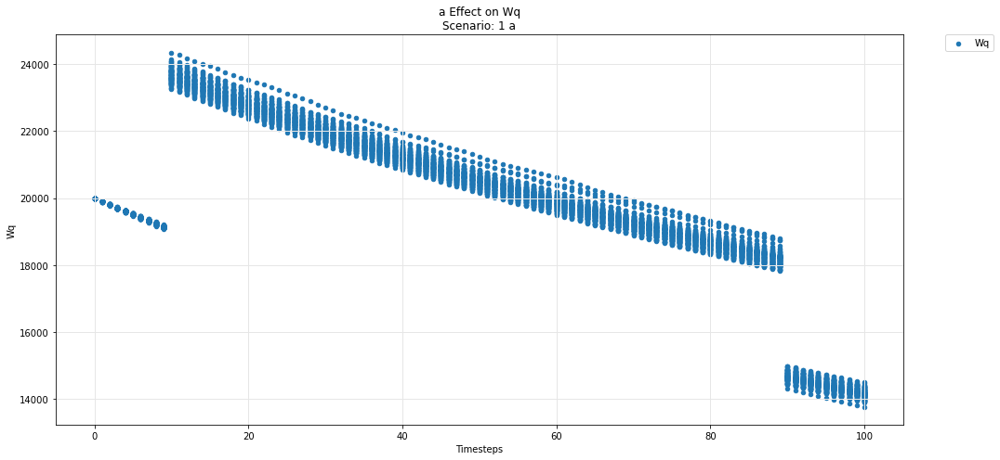

In [54]:
param_test_plot(experiments, config_ids, 'a', 'Wq')

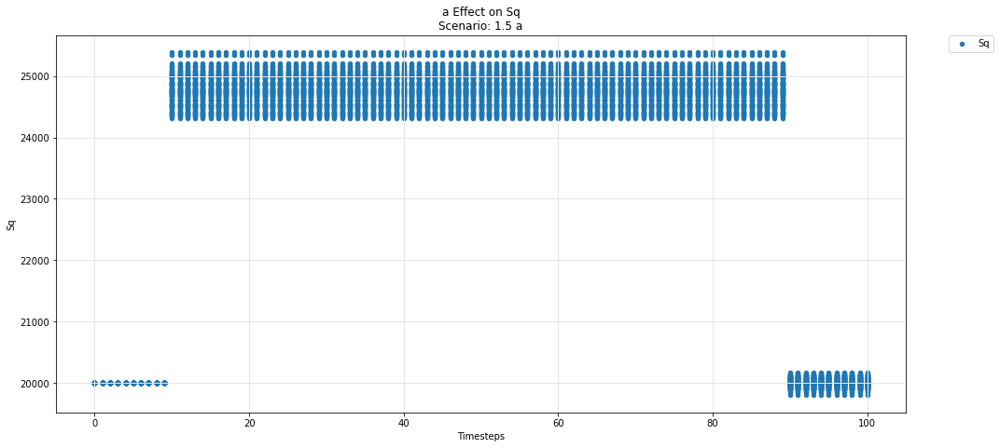

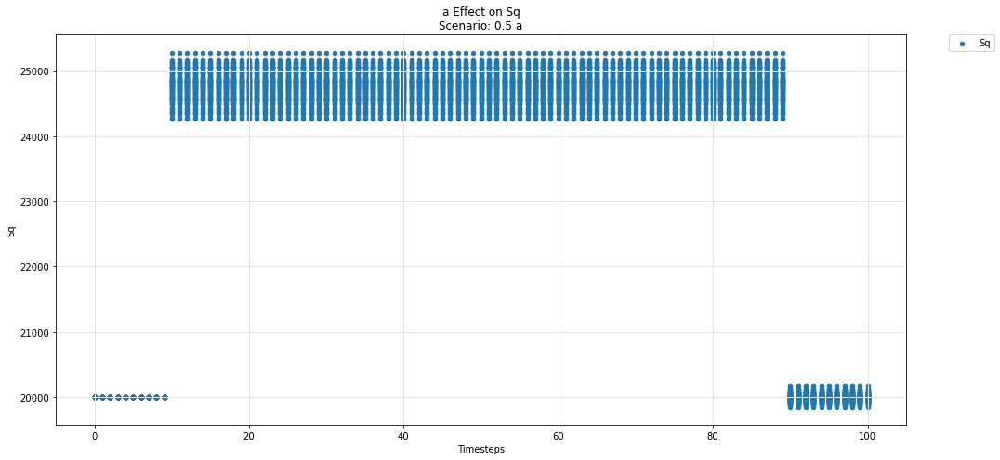

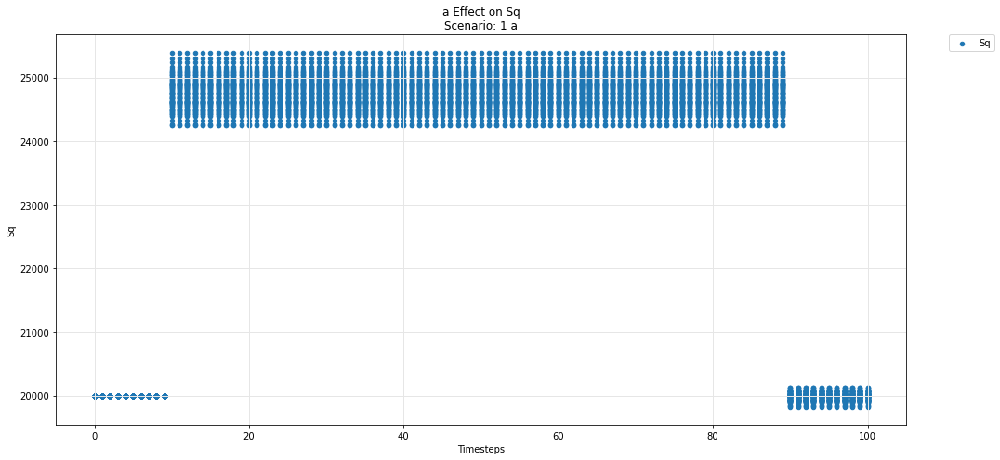

In [55]:
param_test_plot(experiments, config_ids, 'a', 'Sq')

## Hydra -- pool

Movement of the Omnipool variables
- Asset i
- Asset j
- Asset k

over the course of the simulation

In [56]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

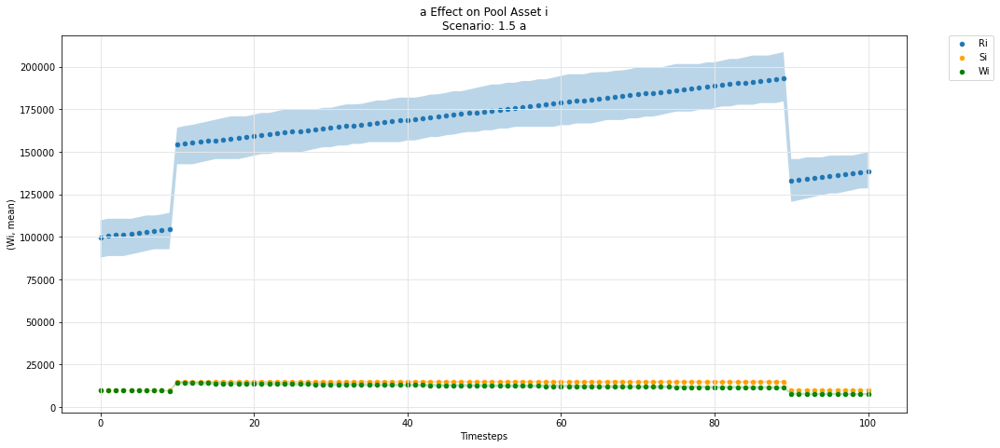

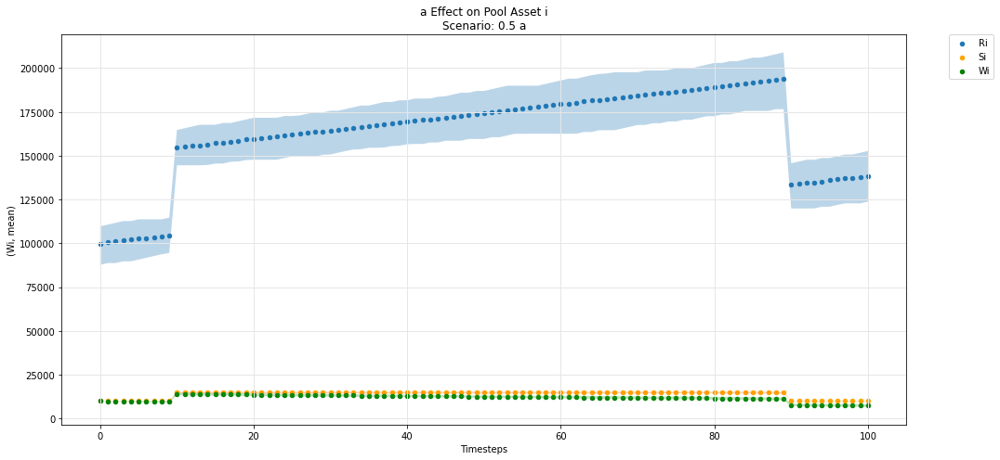

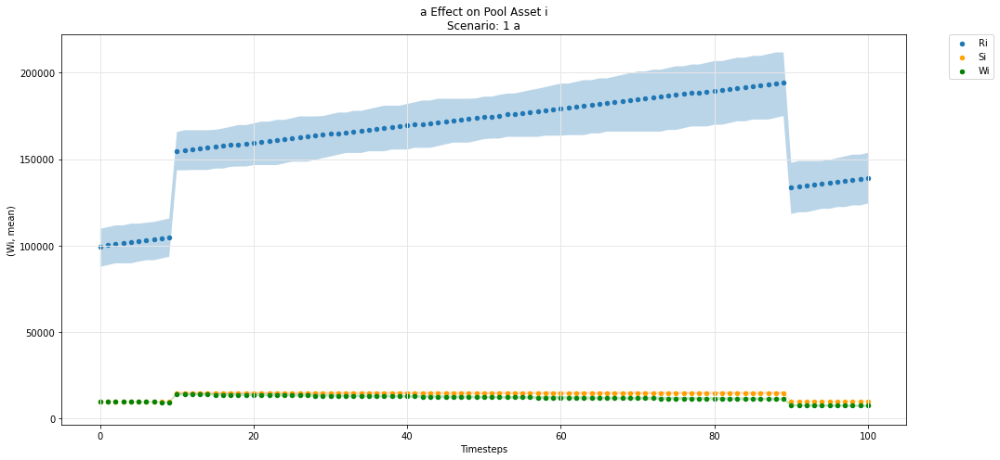

In [57]:
param_pool_simulation_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

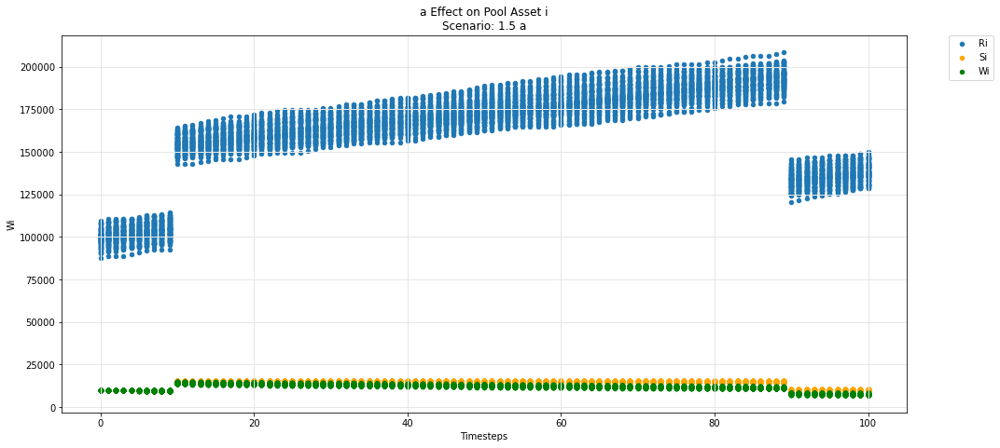

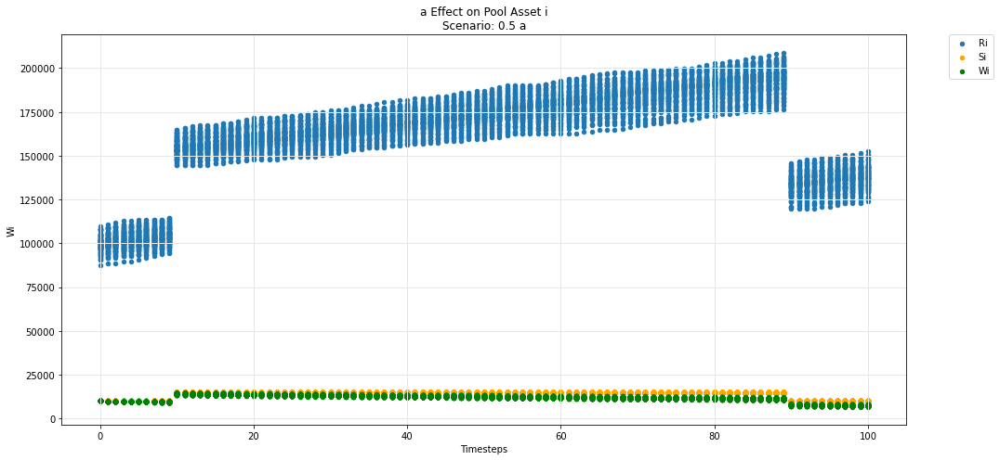

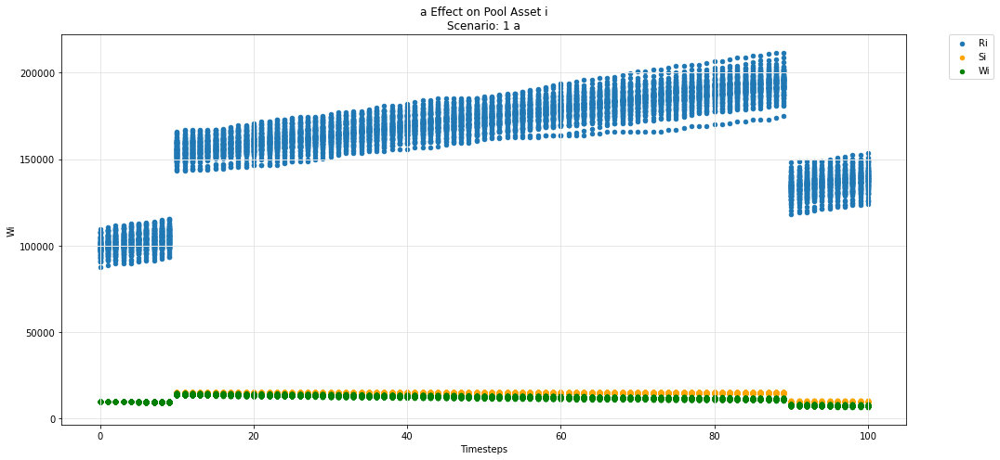

In [58]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

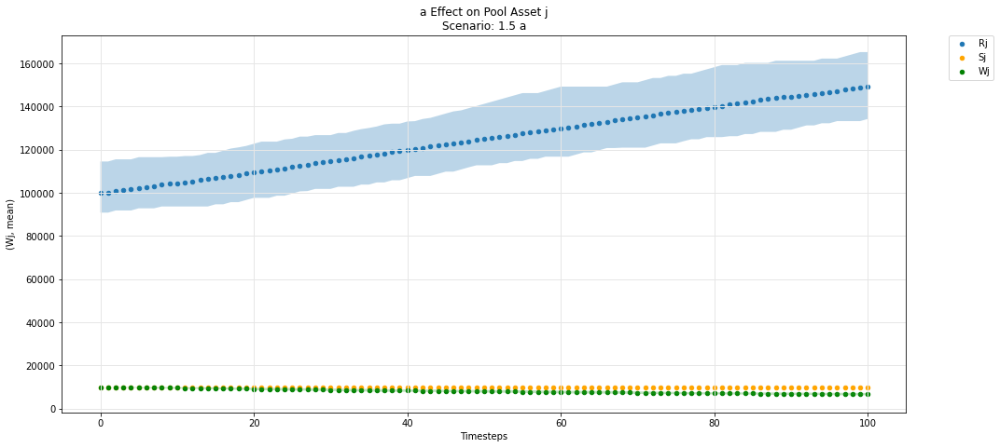

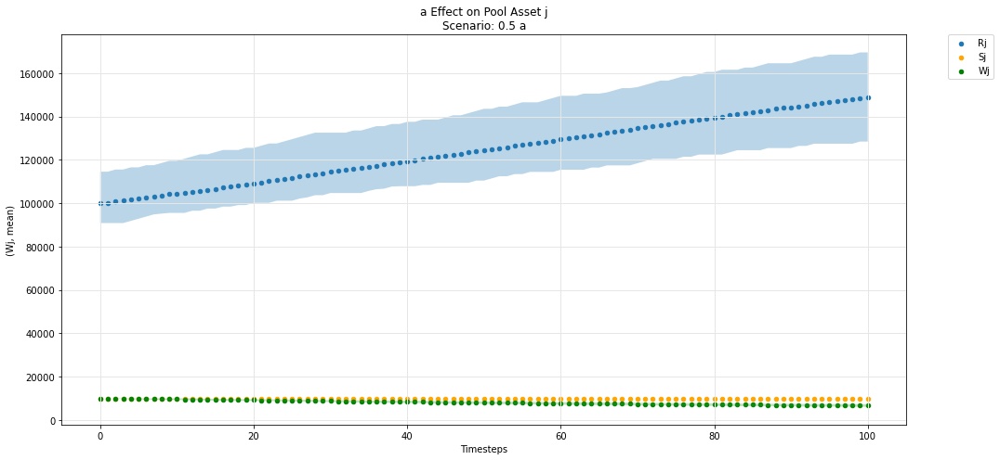

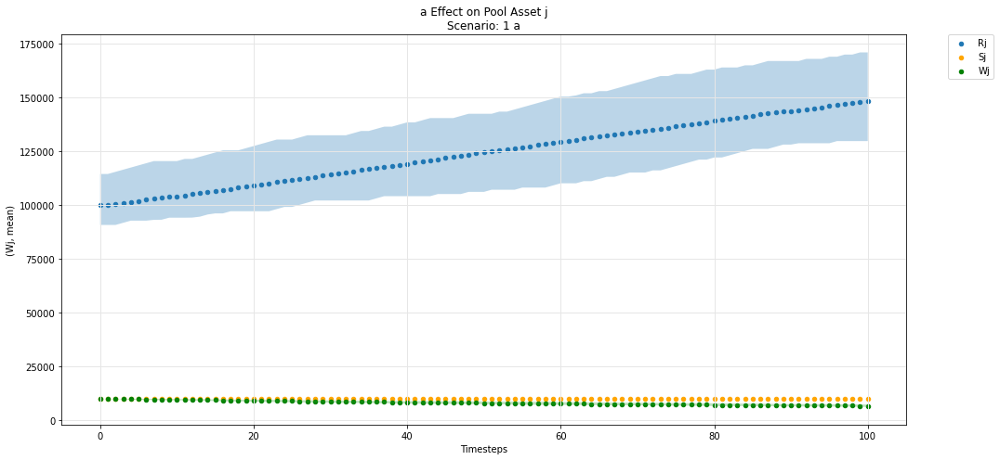

In [59]:
param_pool_simulation_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

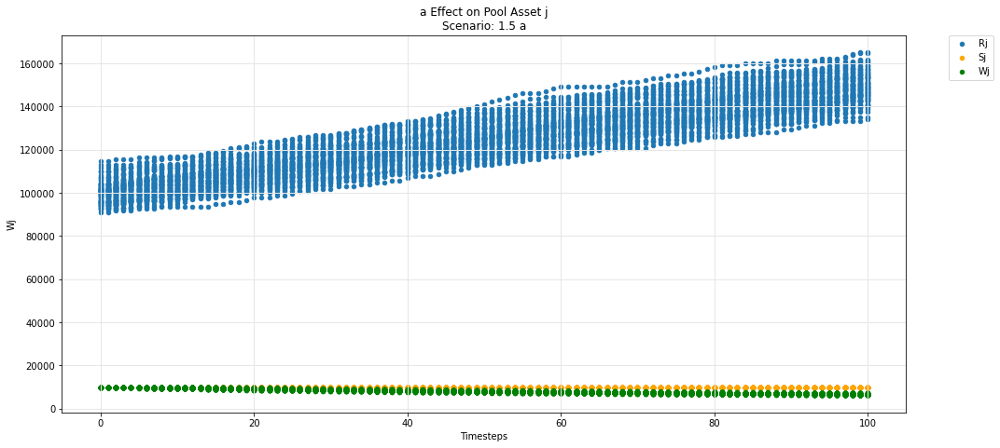

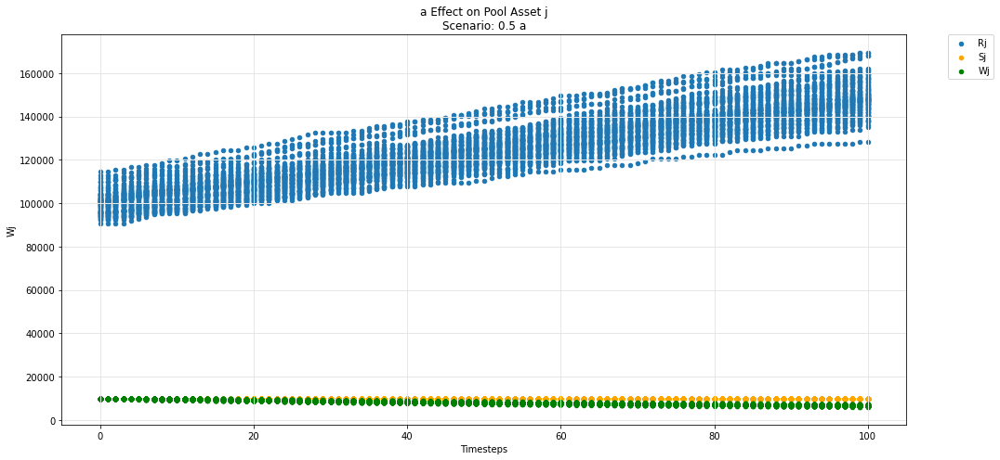

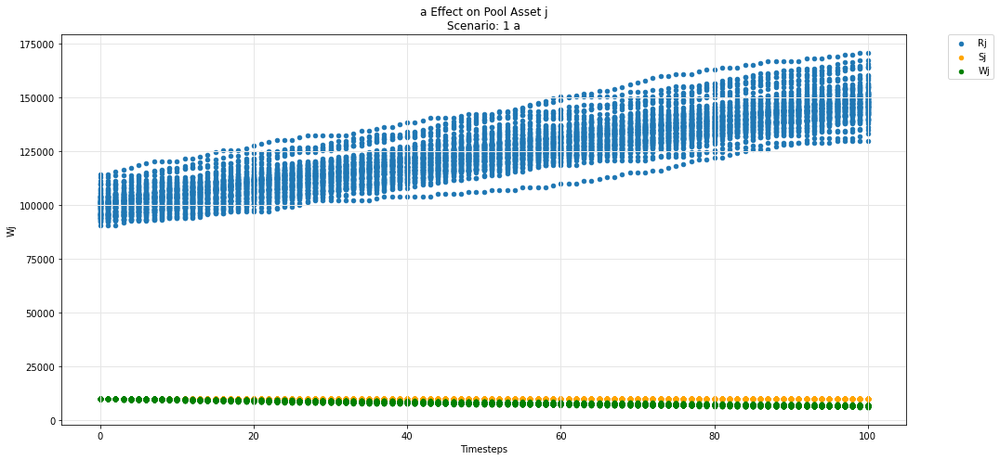

In [60]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

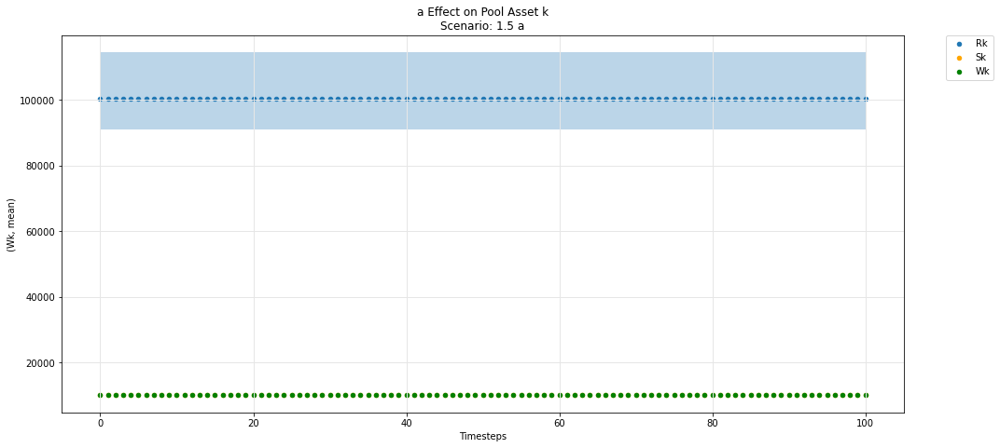

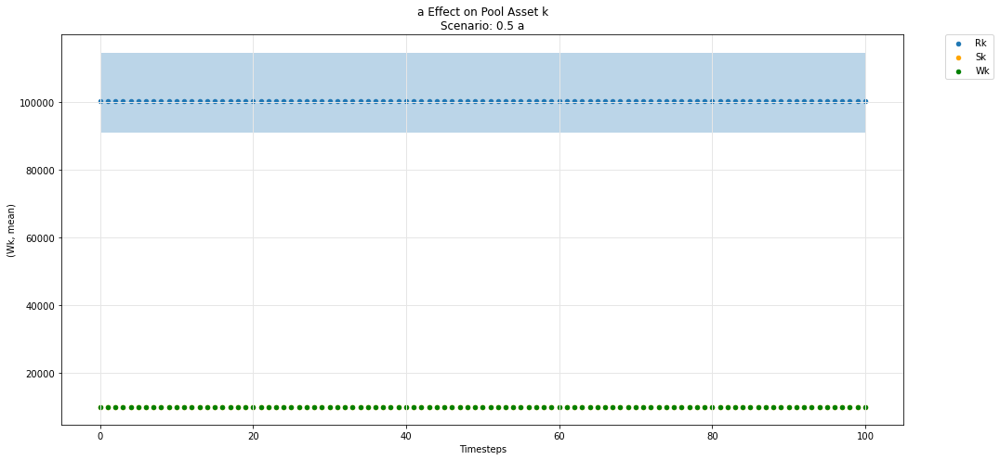

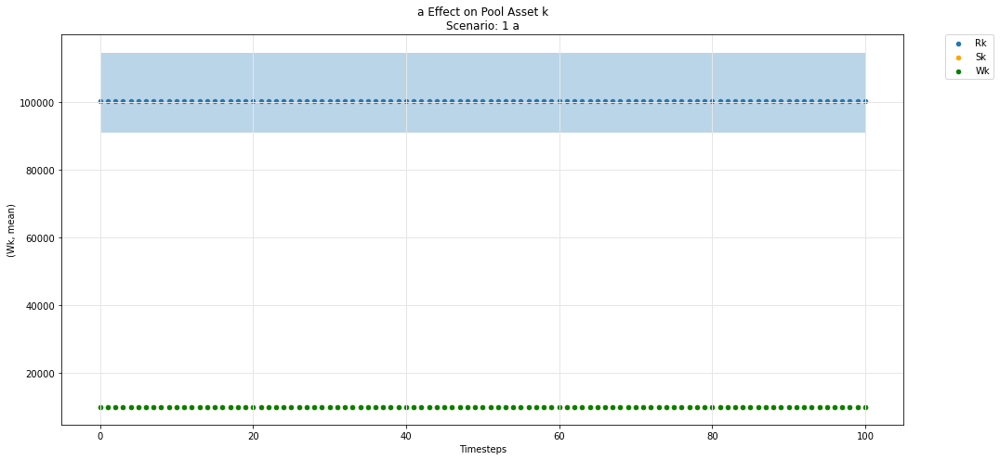

In [61]:
param_pool_simulation_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

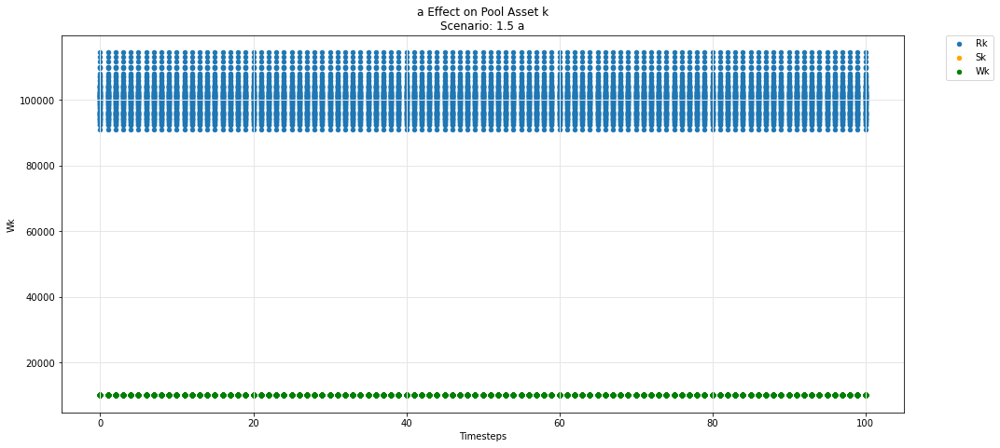

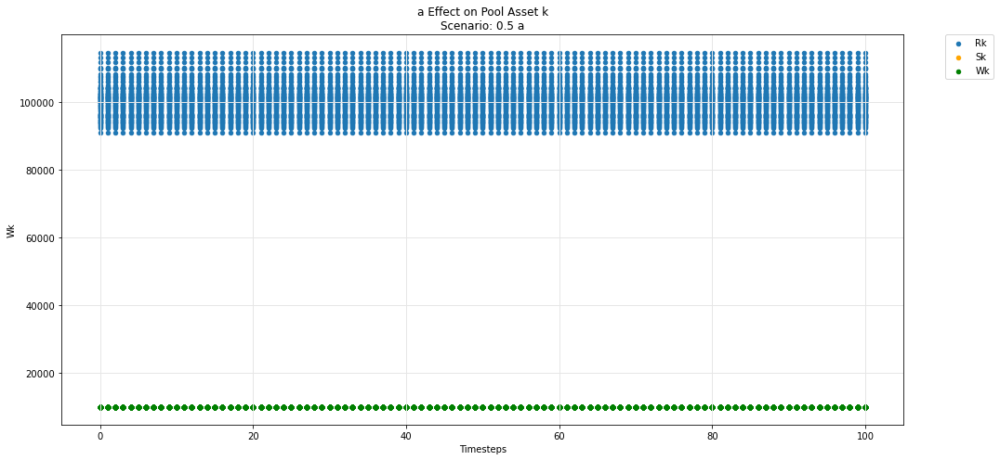

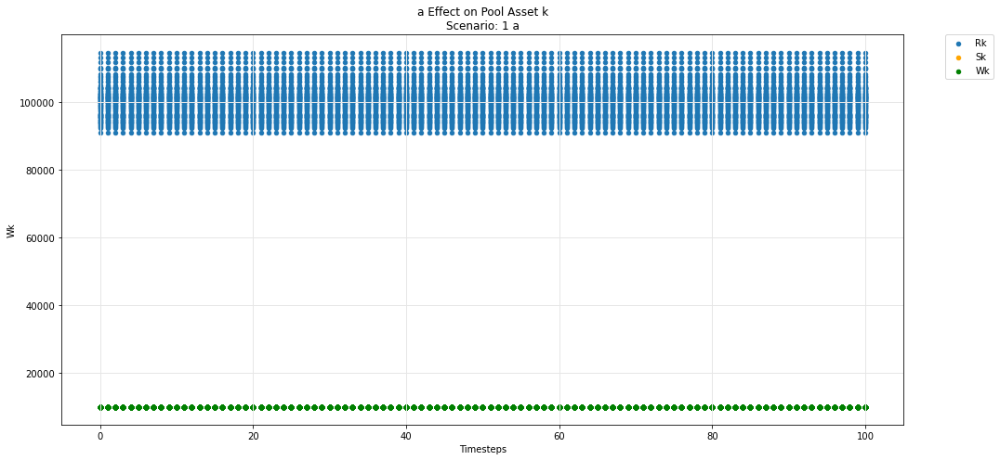

In [62]:
param_pool_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

In [63]:
def param_pool_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=df_label, label=df_label, ax=ax, legend=True, kind ='scatter')

        for count, arg in enumerate(args):
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))

            df.plot(x='timestep', y=df_arg_label, label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

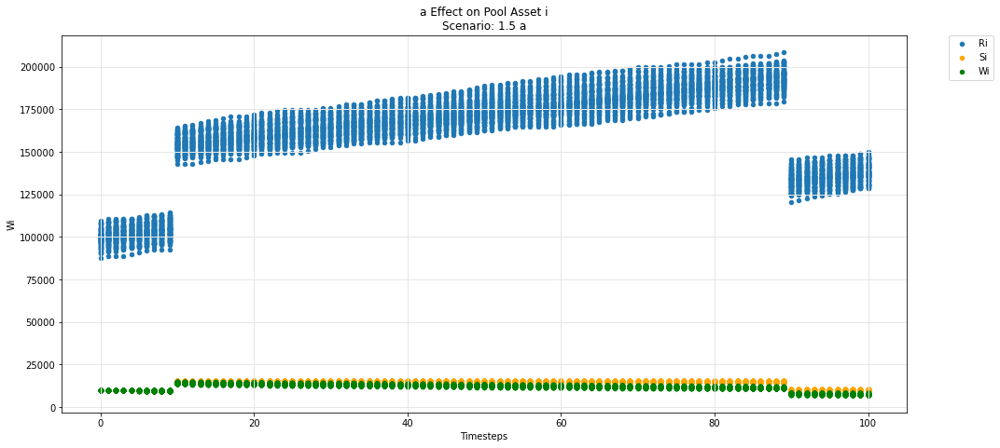

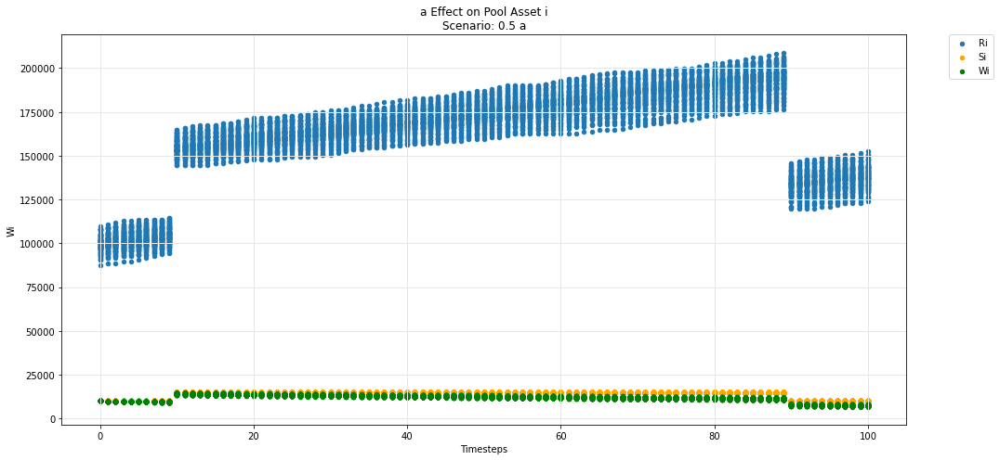

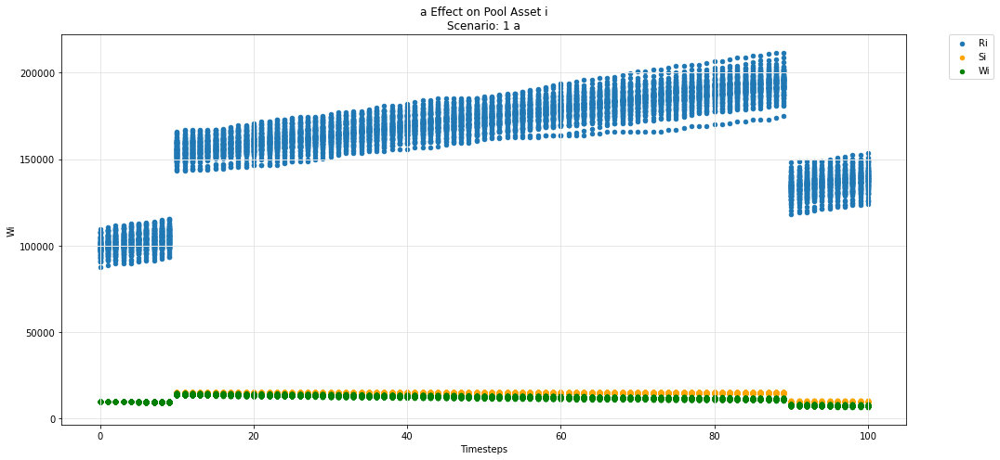

In [64]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

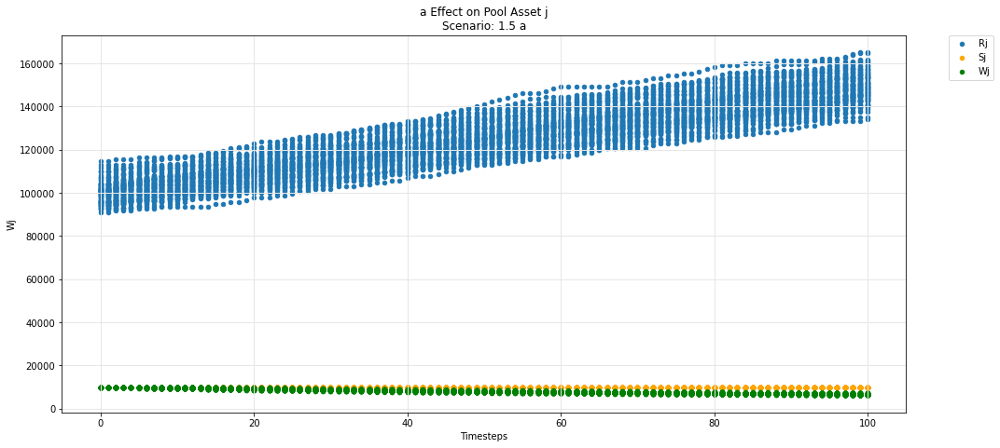

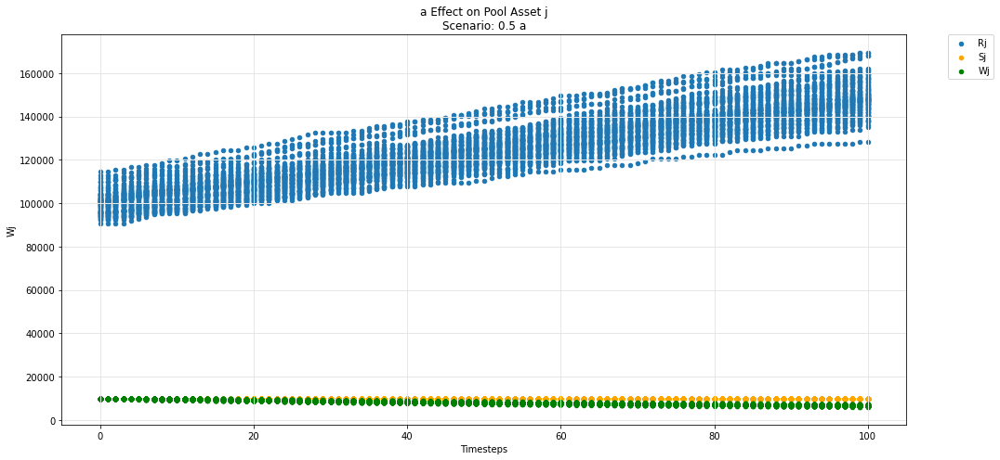

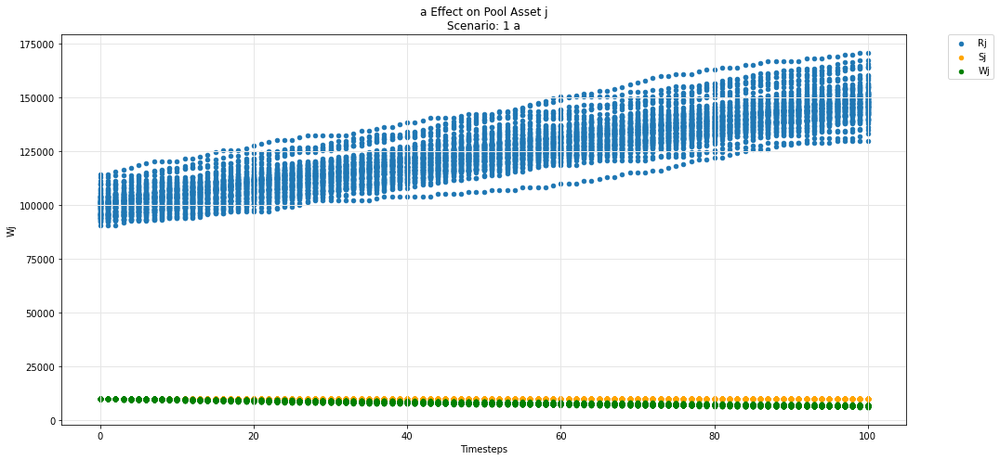

In [65]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

In [66]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

# Prices

## Uniswap

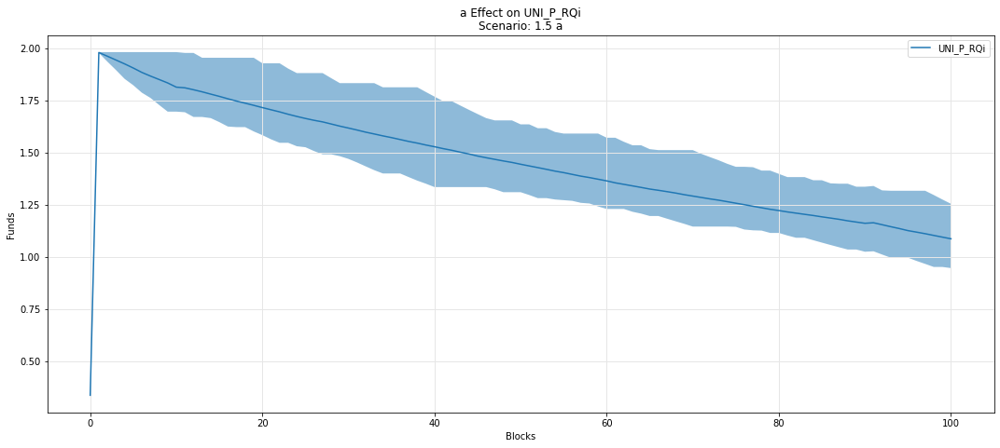

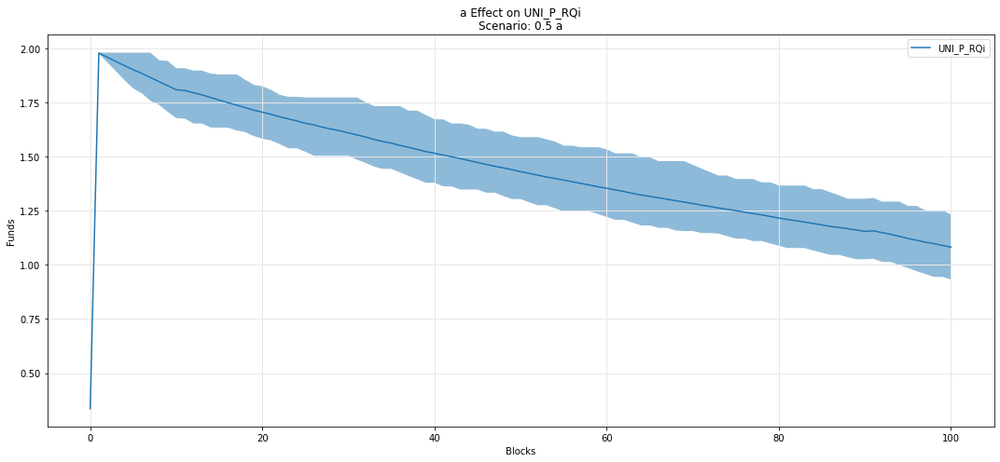

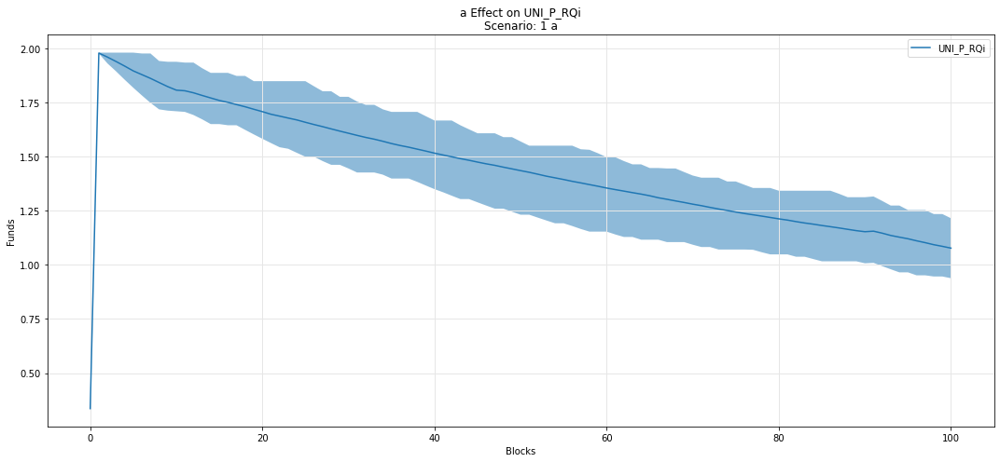

In [67]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQi')

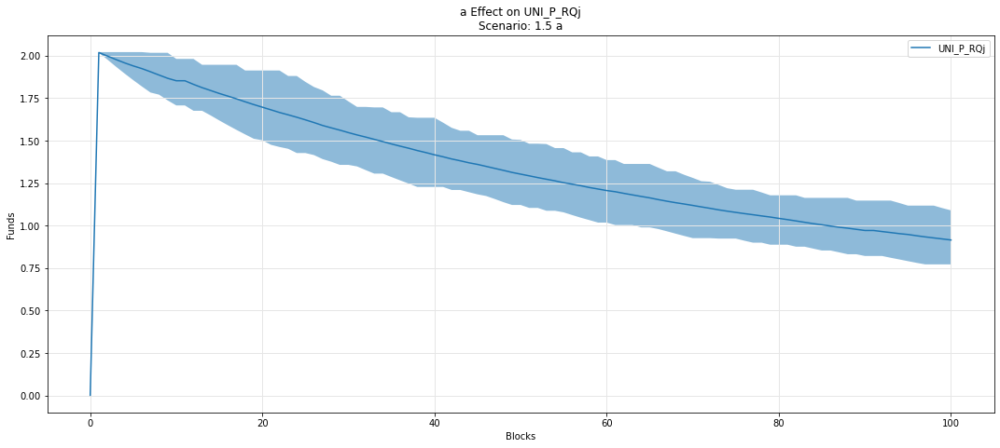

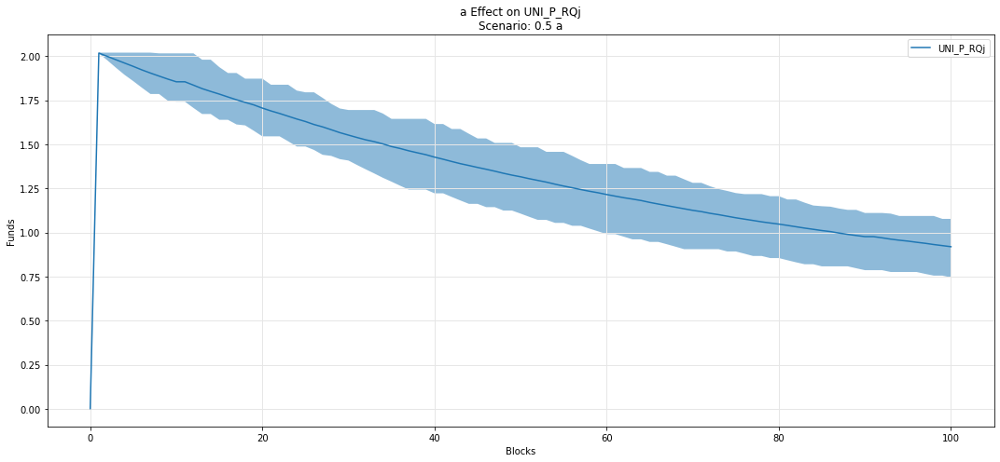

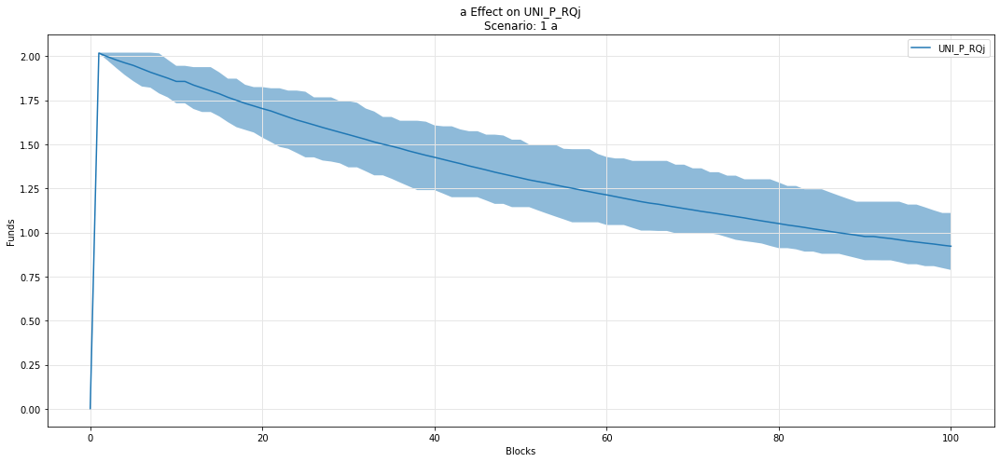

In [68]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQj')

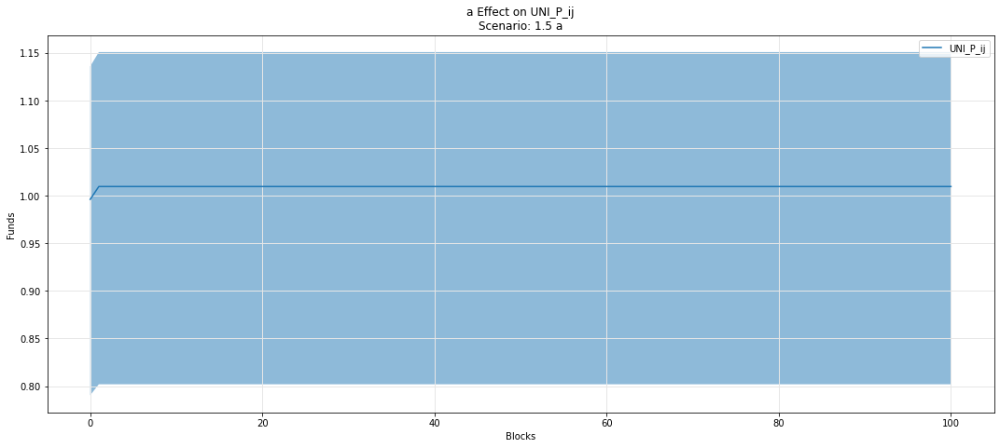

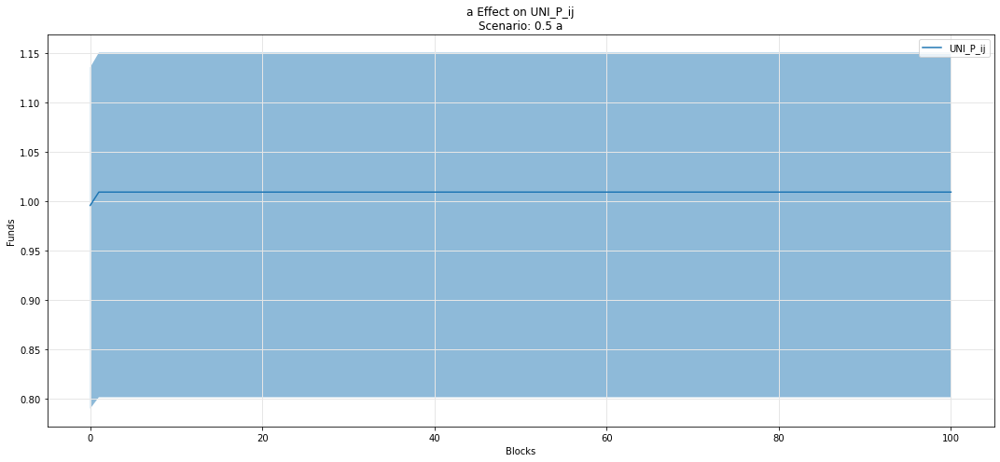

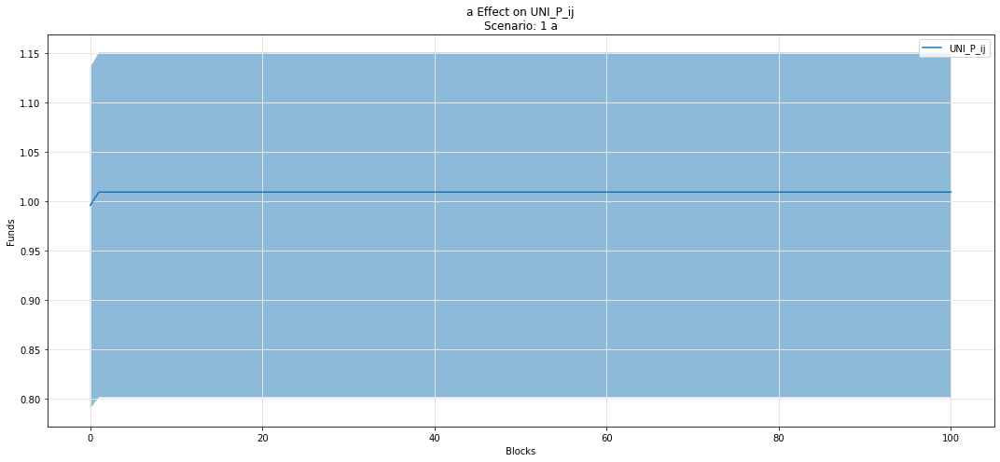

In [69]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_ij')

## Omnipool

## Asset i

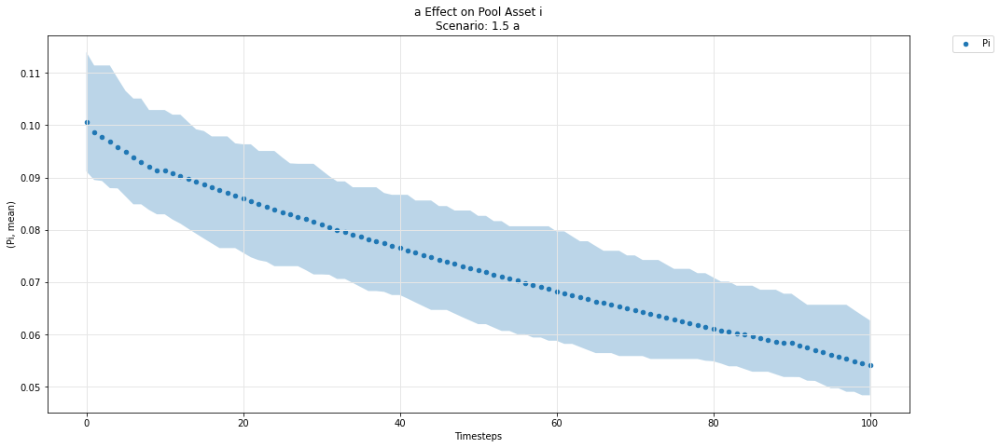

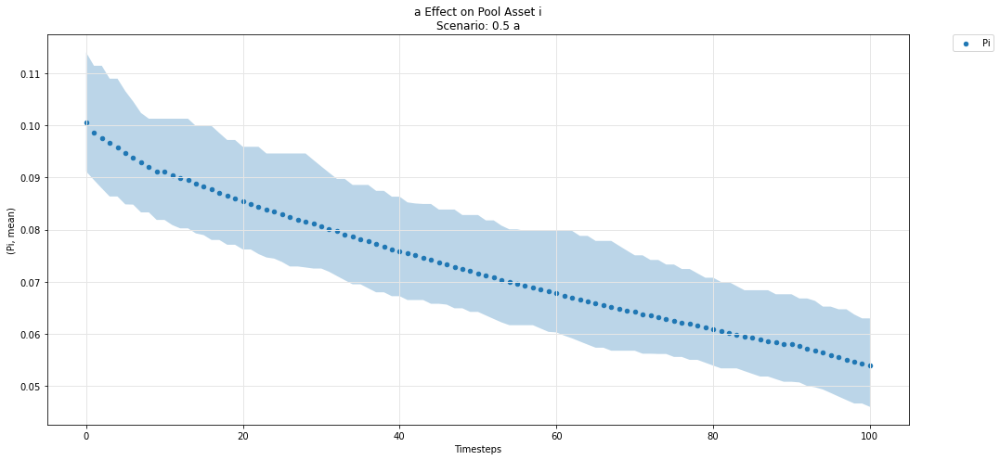

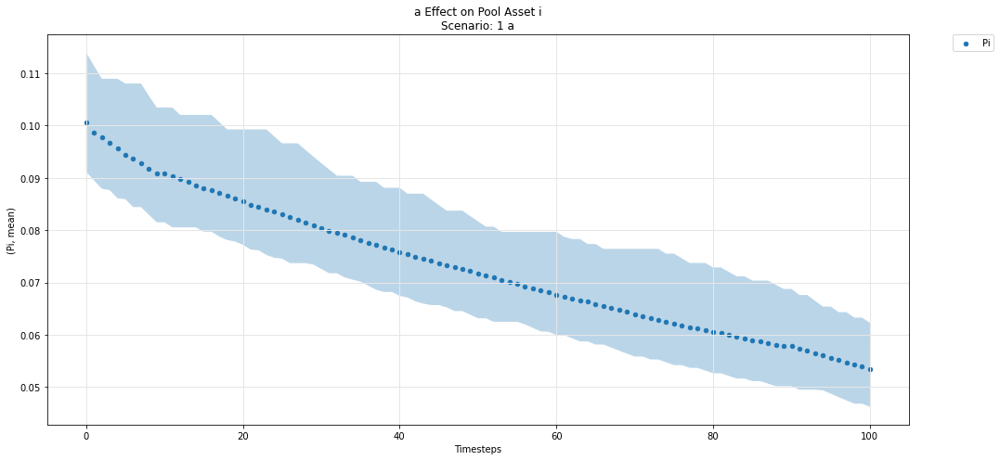

In [70]:
param_pool_simulation_plot(experiments, config_ids, 'a','i','P')

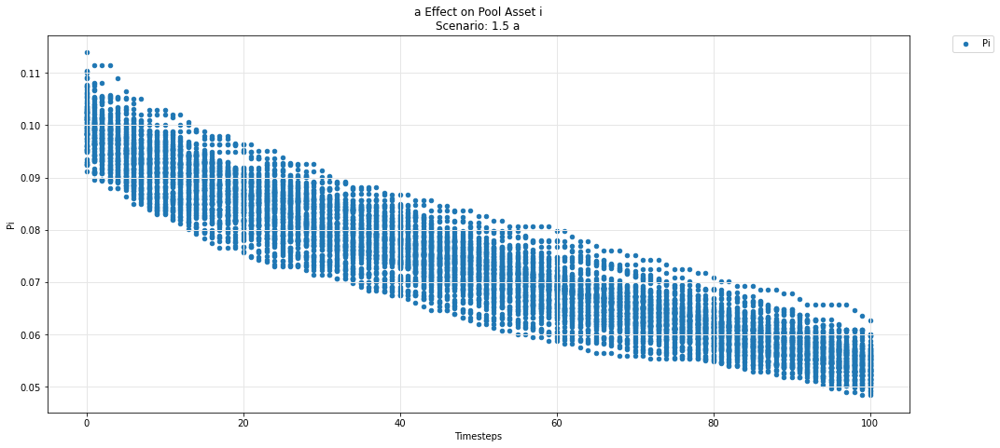

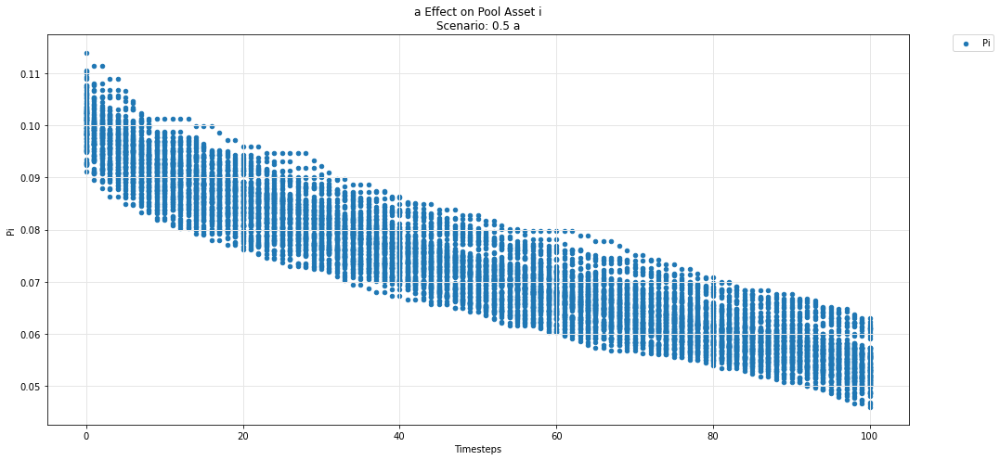

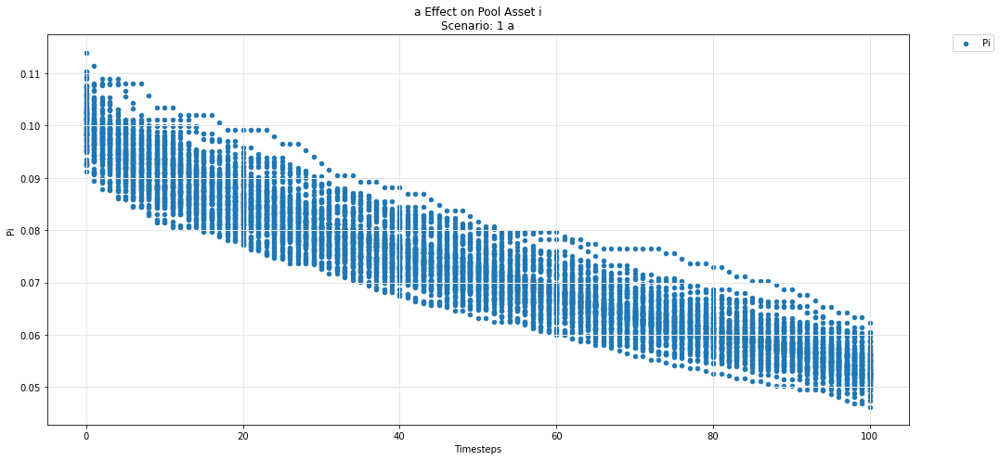

In [71]:
param_pool_plot(experiments, config_ids, 'a','i','P')

## Asset j

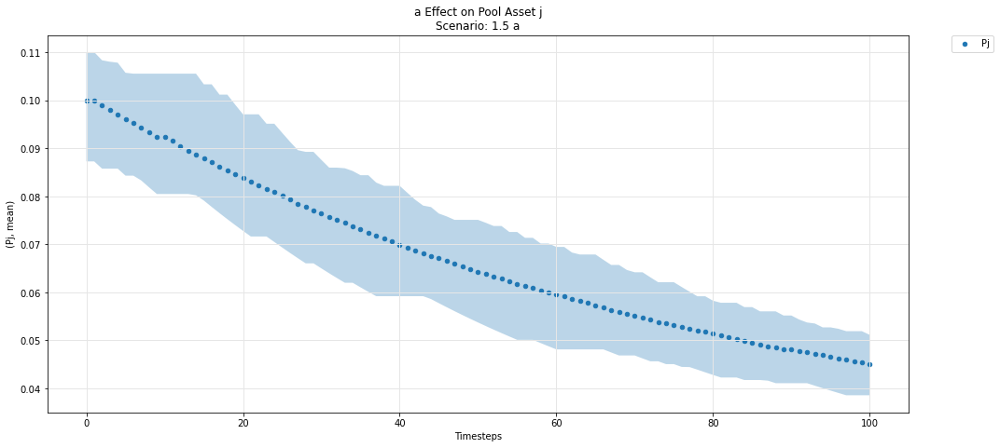

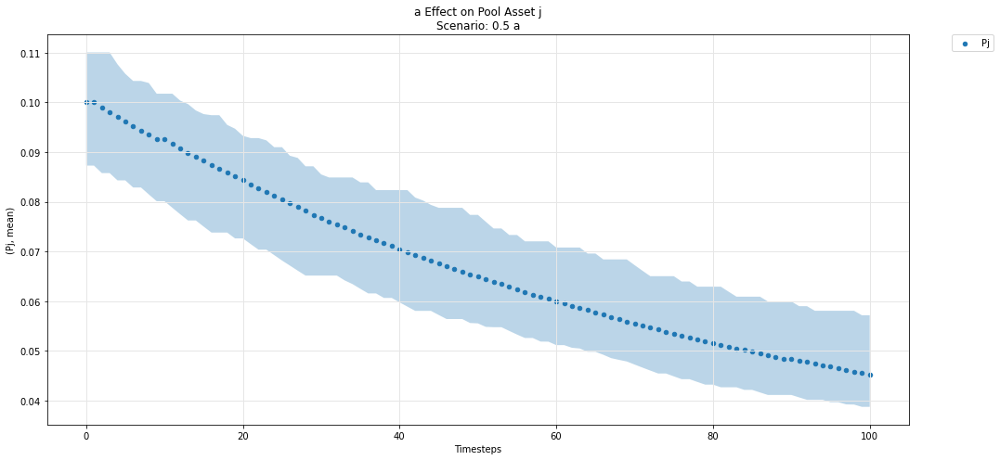

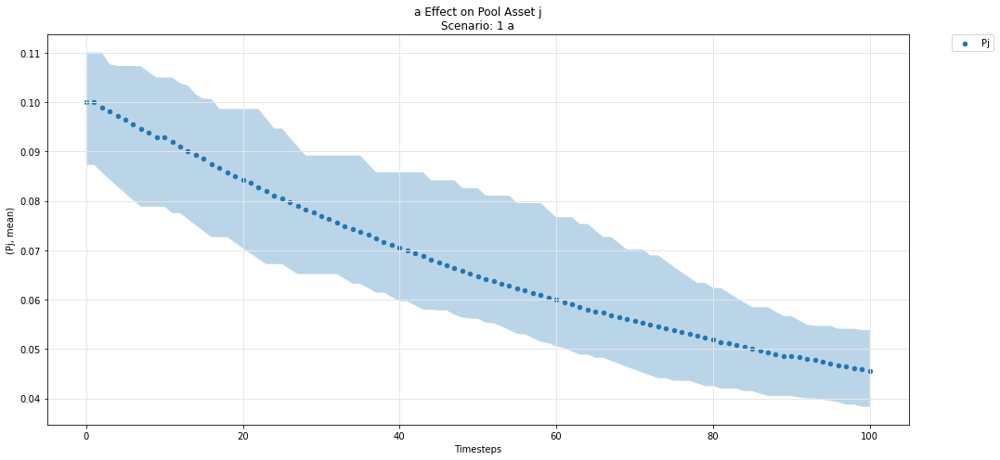

In [72]:
param_pool_simulation_plot(experiments, config_ids, 'a','j','P')

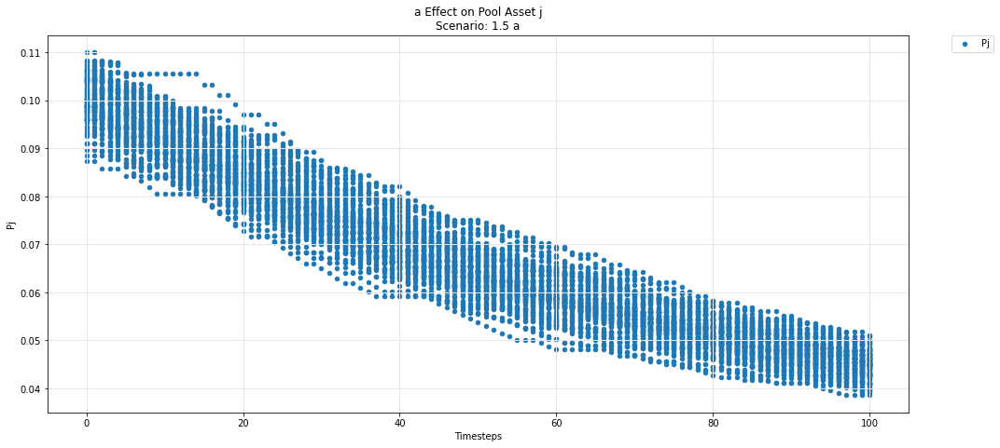

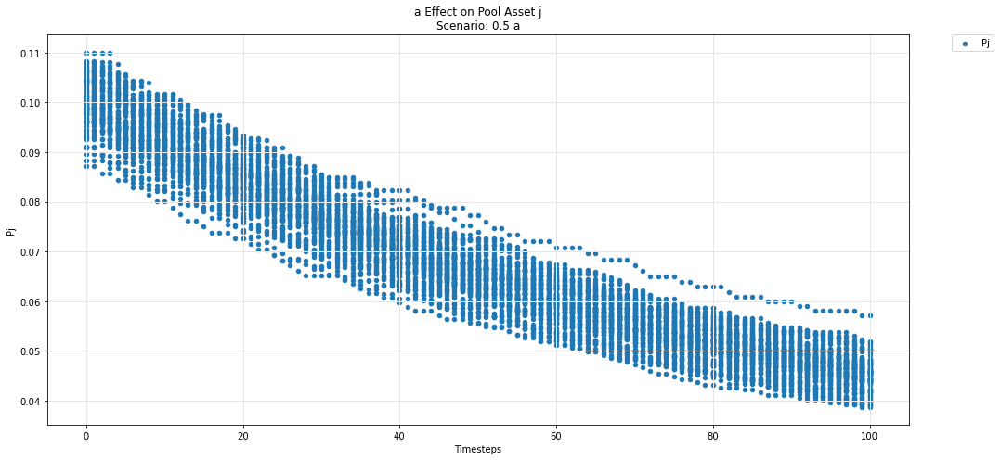

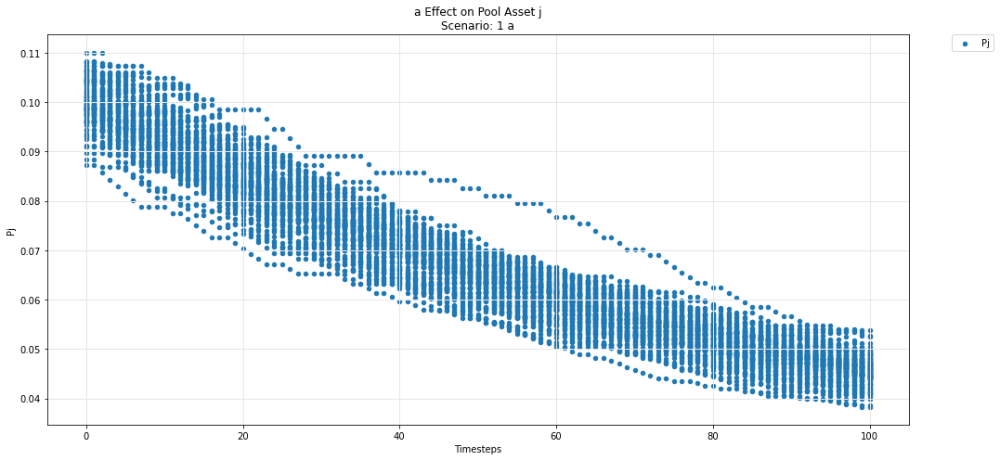

In [73]:
param_pool_plot(experiments, config_ids, 'a','j','P')

## Asset k

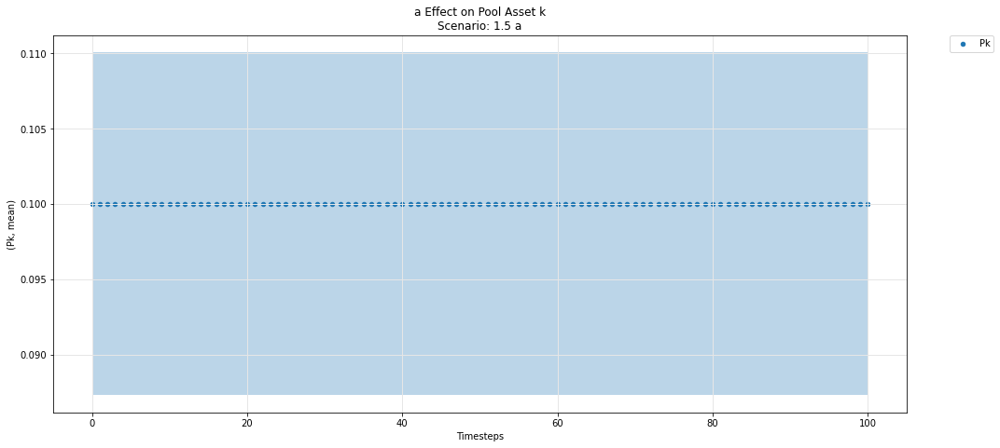

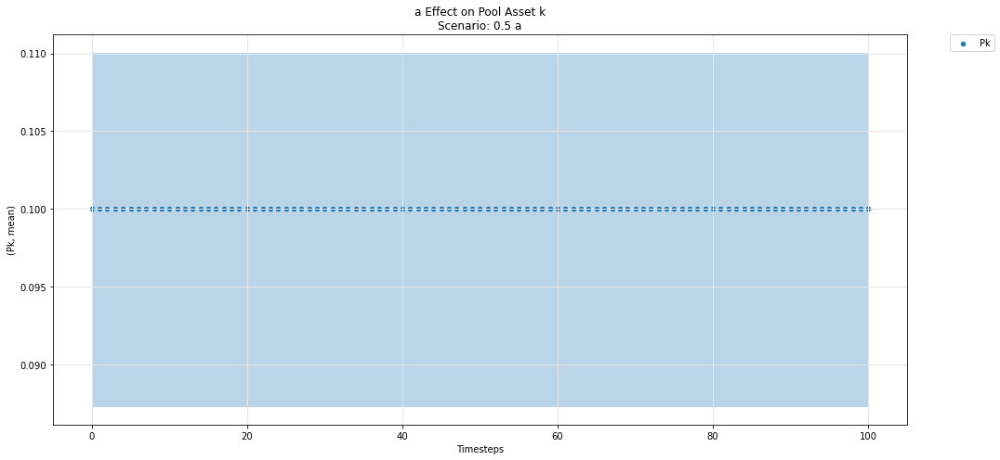

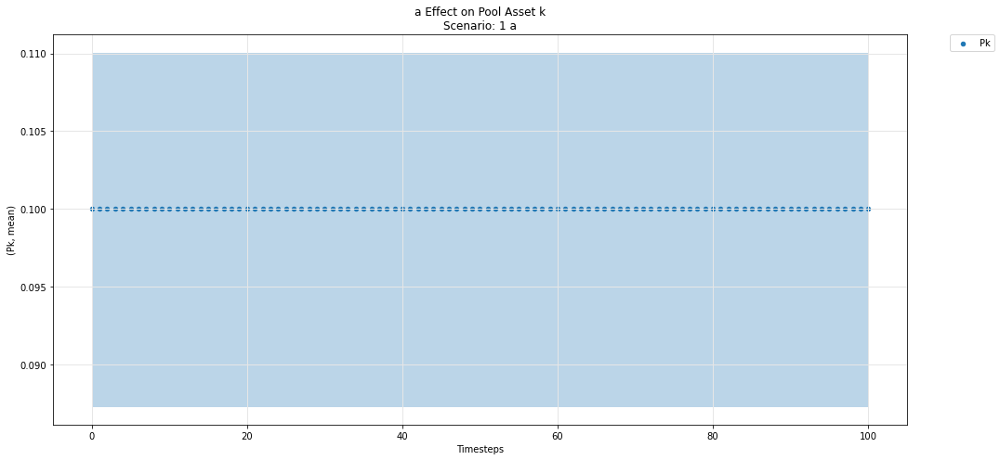

In [74]:
param_pool_simulation_plot(experiments, config_ids, 'a','k','P')

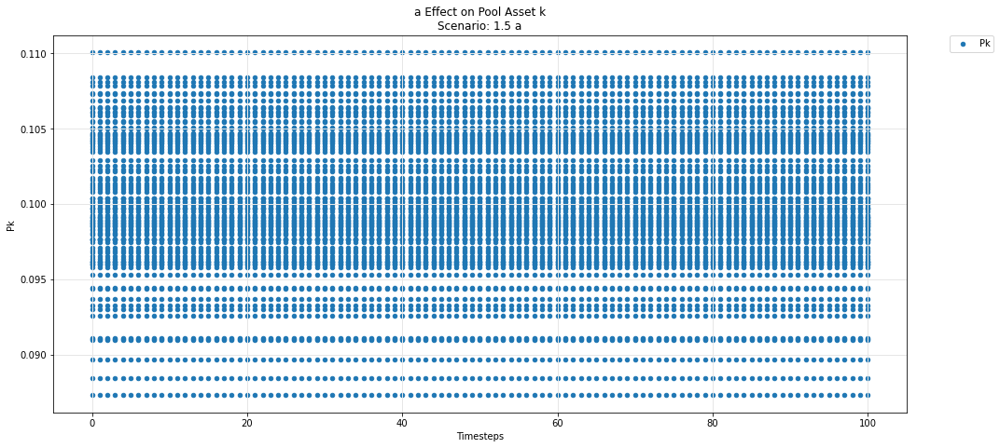

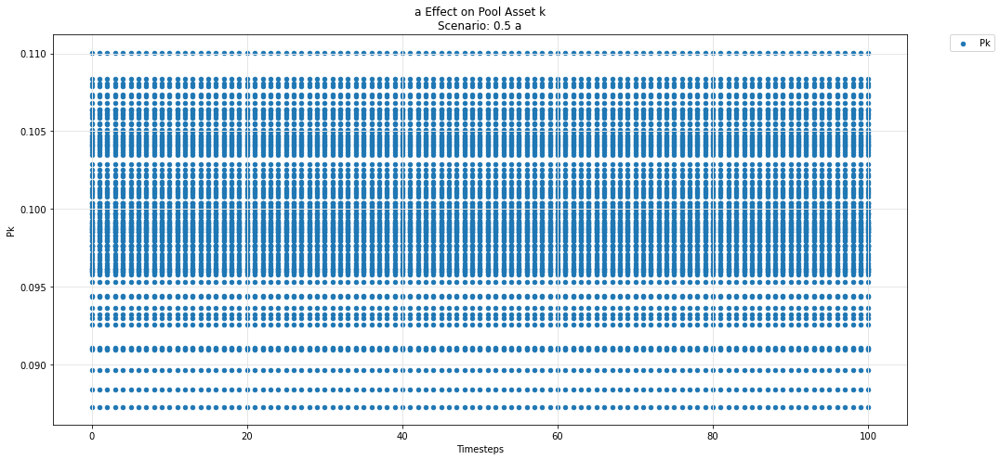

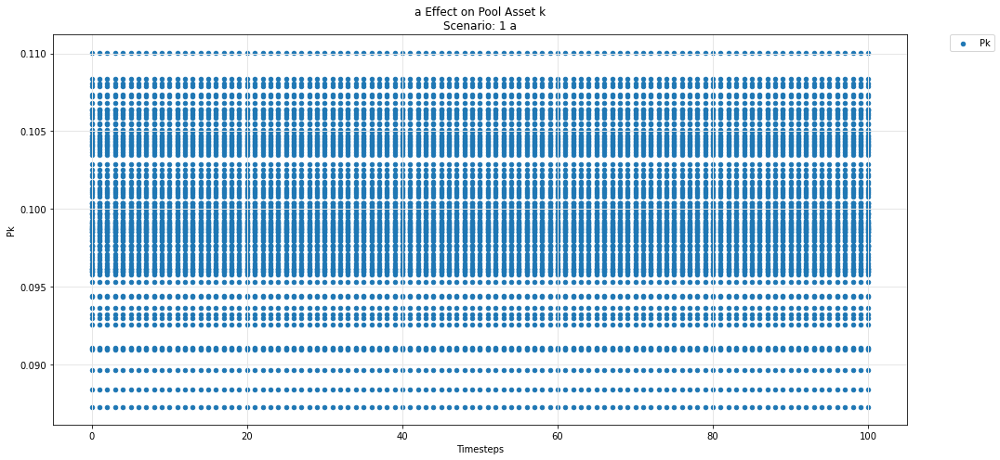

In [75]:
param_pool_plot(experiments, config_ids, 'a','k','P')